In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style='dark', font_scale=1.4)

In [3]:
df = pd.read_csv('Spaceship-titanic.csv')
df

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276_01,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,Gravior Noxnuther,False
8689,9278_01,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,Kurta Mondalley,False
8690,9279_01,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,Fayey Connon,True
8691,9280_01,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,Celeon Hontichre,False


In [5]:
print("Missing Values by Column")
print("-"*30)
print(df.isna().sum())
print("-"*30)
print("TOTAL MISSING VALUES:",df.isna().sum().sum())

Missing Values by Column
------------------------------
PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64
------------------------------
TOTAL MISSING VALUES: 2324


In [6]:
df.describe()

,Age,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
count,8514.000000,8512.000000,8510.000000,8485.000000,8510.000000,8505.000000
mean,28.827930,224.687617,458.077203,173.729169,311.138778,304.854791
std,14.489021,666.717663,1611.489240,604.696458,1136.705535,1145.717189
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,38.000000,47.000000,76.000000,27.000000,59.000000,46.000000
max,79.000000,14327.000000,29813.000000,23492.000000,22408.000000,24133.000000


In [7]:
def age_to_cat(age):
    if age in range(13):
        return "age 0-12"
    elif age in range(13, 18):
        return 'age 13-17'
    elif age in range(18, 25):
        return 'age 18-24'
    elif age in range(25, 35):
        return 'age 25-34'
    elif age in range(35, 51):
        return 'age 35-50'
    elif age in range(51, 80):
        return 'age 51+'
    else:
        return np.nan

In [8]:
def df_transformation(df):
    df['total'] = df.RoomService + df.FoodCourt + df.ShoppingMall + df.Spa + df.VRDeck
    df['spend_money'] = df['total'].map(lambda x: 0 if x == 0. else 1)
    df.loc[:, 'Cabin'] = df.Cabin.fillna('Z/9999/Z')
    df.loc[:, 'Cabin'] = df.Cabin.map(lambda x: x.split('/'))
    df.loc[:, 'Deck'] = df.Cabin.map(lambda x: x[0])
    df.loc[:, 'Num'] = df.Cabin.map(lambda x: int(x[1]))
    df.loc[df.Num == 9999, 'Num'] = np.nan
    df.loc[:, 'Side'] = df.Cabin.map(lambda x: x[2])
    df['age_cat'] = df.loc[:, 'Age'].map(age_to_cat)
    df['Cabin_region1']=(df['Num']<300).astype(int)   # one-hot encoding
    df['Cabin_region2']=((df['Num']>=300) & (df['Num']<600)).astype(int)
    df['Cabin_region3']=((df['Num']>=600) & (df['Num']<900)).astype(int)
    df['Cabin_region4']=((df['Num']>=900) & (df['Num']<1200)).astype(int)
    df['Cabin_region5']=((df['Num']>=1200) & (df['Num']<1500)).astype(int)
    df['Cabin_region6']=((df['Num']>=1500) & (df['Num']<1800)).astype(int)
    df['Cabin_region7']=(df['Num']>=1800).astype(int)
    df.loc[:, 'Name'] = df['Name'].fillna('Unknown Unknown')
    df.loc[:, 'Name'] = df['Name'].map(lambda x: x.split())
    df.loc[:, 'Surname'] = df['Name'].map(lambda x: x[1])
    df.loc[:, 'Name'] = df['Name'].map(lambda x: x[0])
    df.loc[df.Name == "Unknown", 'Name'] = np.nan
    df.loc[df.Surname == "Unknown", 'Surname'] = np.nan
    return df

In [25]:
df = df_transformation(df)
df

AttributeError: 'list' object has no attribute 'split'

In [10]:
df.describe()

,Age,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,total,spend_money,Num,Cabin_region1,Cabin_region2,Cabin_region3,Cabin_region4,Cabin_region5,Cabin_region6,Cabin_region7
count,8514.000000,8512.000000,8510.000000,8485.000000,8510.000000,8505.000000,7785.000000,8693.000000,8494.000000,8693.000000,8693.000000,8693.000000,8693.000000,8693.000000,8693.000000,8693.000000
mean,28.827930,224.687617,458.077203,173.729169,311.138778,304.854791,1484.601541,0.626481,600.367671,0.409525,0.171172,0.112274,0.114115,0.107903,0.052916,0.009203
std,14.489021,666.717663,1611.489240,604.696458,1136.705535,1145.717189,2845.288241,0.483766,511.867226,0.491774,0.376681,0.315722,0.317969,0.310276,0.223879,0.095494
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,167.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,736.000000,1.000000,427.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,38.000000,47.000000,76.000000,27.000000,59.000000,46.000000,1486.000000,1.000000,999.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,79.000000,14327.000000,29813.000000,23492.000000,22408.000000,24133.000000,35987.000000,1.000000,1894.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# EDA

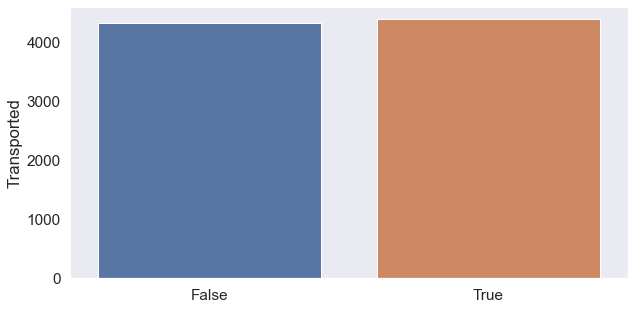

In [11]:
plt.figure(figsize=(10, 5))
sns.barplot(x=df.Transported.value_counts().index, y=df.Transported.value_counts())
plt.show()

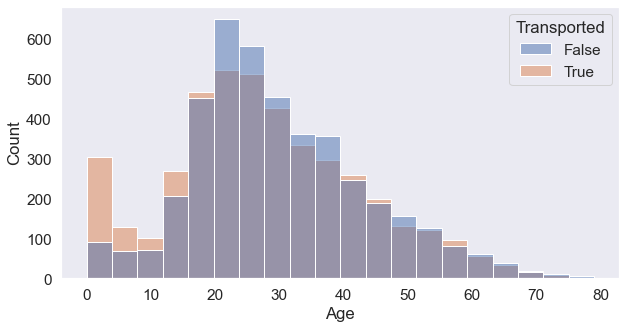

In [13]:
plt.figure(figsize=(10, 5))

sns.histplot(data=df, x='Age', hue='Transported', bins=20)
plt.show()

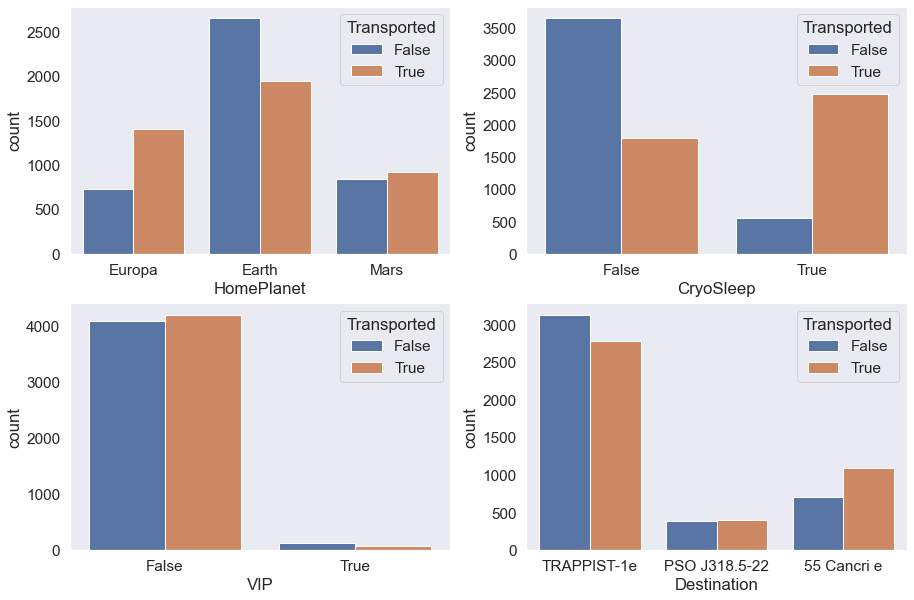

In [15]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
sns.countplot(data=df, x='HomePlanet', hue='Transported', ax=ax[0][0])
sns.countplot(data=df, x='CryoSleep', hue='Transported', ax=ax[0][1])
sns.countplot(data=df, x='VIP', hue='Transported', ax=ax[1][0])
sns.countplot(data=df, x='Destination', hue='Transported', ax=ax[1][1])
plt.show()

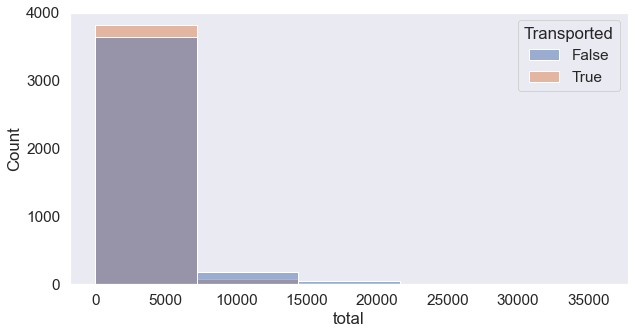

In [16]:
plt.figure(figsize=(10,5))
sns.histplot(data=df, x='total', hue='Transported', bins=5)
plt.show()

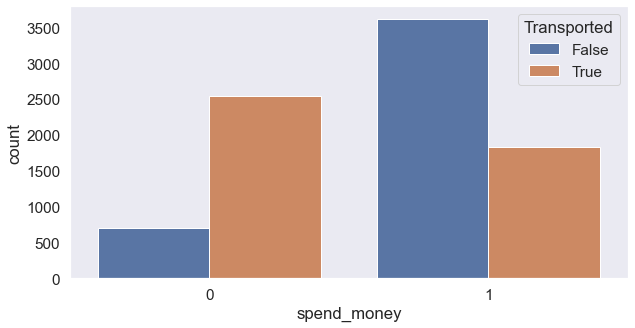

In [18]:
plt.figure(figsize=(10,5))
sns.countplot(data=df, x='spend_money', hue='Transported')
plt.show()

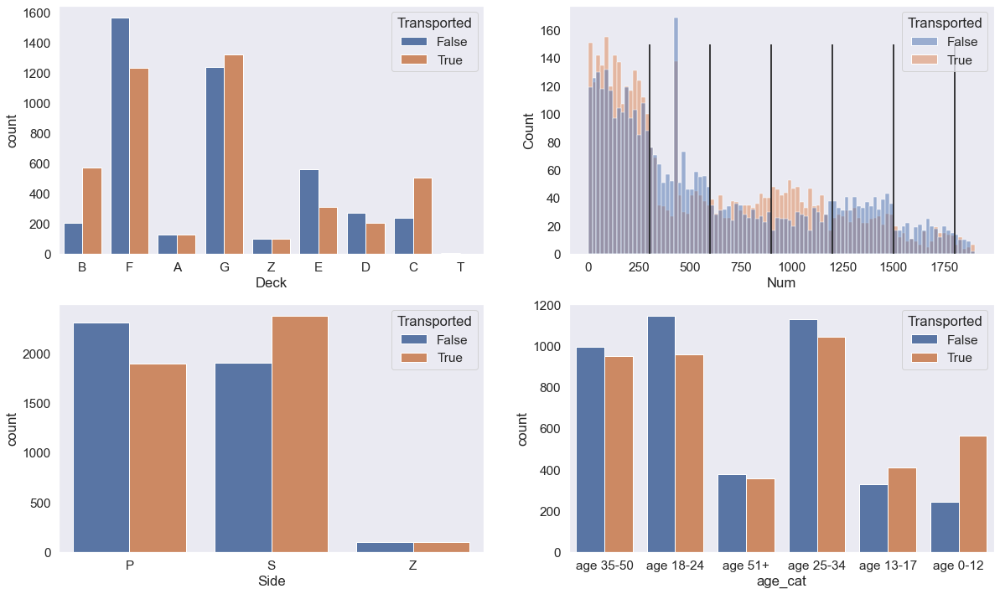

In [26]:
fig, ax = plt.subplots(2, 2, figsize=(20, 12))
sns.countplot(data=df, x='Deck', hue='Transported', ax=ax[0][0])
sns.histplot(data=df, x='Num', hue='Transported', ax=ax[0][1], binwidth=20)
ax[0][1].vlines(300, ymin=0, ymax=150, color='black')
ax[0][1].vlines(600, ymin=0, ymax=150, color='black')
ax[0][1].vlines(900, ymin=0, ymax=150, color='black')
ax[0][1].vlines(1200, ymin=0, ymax=150,color='black')
ax[0][1].vlines(1500, ymin=0, ymax=150, color='black')
ax[0][1].vlines(1800, ymin=0, ymax=150, color='black')

sns.countplot(data=df, x='Side', hue='Transported', ax=ax[1][0])
sns.countplot(data=df, x='age_cat', hue='Transported', ax=ax[1][1])
plt.show()

In [21]:
df[['PassengerId','Cabin', 'Name', 'Surname']].head(10)

,PassengerId,Cabin,Name,Surname
0,0001_01,"[B, 0, P]",Maham,Ofracculy
1,0002_01,"[F, 0, S]",Juanna,Vines
2,0003_01,"[A, 0, S]",Altark,Susent
3,0003_02,"[A, 0, S]",Solam,Susent
4,0004_01,"[F, 1, S]",Willy,Santantines
5,0005_01,"[F, 0, P]",Sandie,Hinetthews
6,0006_01,"[F, 2, S]",Billex,Jacostaffey
7,0006_02,"[G, 0, S]",Candra,Jacostaffey
8,0007_01,"[F, 3, S]",Andona,Beston
9,0008_01,"[B, 1, P]",Erraiam,Flatic


In [22]:
df.columns

Index(['PassengerId', 'HomePlanet', 'CryoSleep', 'Cabin', 'Destination', 'Age',
       'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
       'Name', 'Transported', 'total', 'spend_money', 'Deck', 'Num', 'Side',
       'age_cat', 'Cabin_region1', 'Cabin_region2', 'Cabin_region3',
       'Cabin_region4', 'Cabin_region5', 'Cabin_region6', 'Cabin_region7',
       'Surname'],
      dtype='object')

In [23]:
df = df.fillna(df.median())

C:\Users\kuzin\AppData\Local\Temp\ipykernel_44500\3493596106.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.fillna(df.median())


In [24]:
to_drop = ['PassengerId', 'Cabin', 'Age', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
           'Name', 'Surname', 'Num','total']

In [27]:
df = df.drop(to_drop, axis=1)

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   HomePlanet     8492 non-null   object
 1   CryoSleep      8693 non-null   object
 2   Destination    8511 non-null   object
 3   VIP            8693 non-null   object
 4   Transported    8693 non-null   bool  
 5   spend_money    8693 non-null   int64 
 6   Deck           8693 non-null   object
 7   Side           8693 non-null   object
 8   age_cat        8514 non-null   object
 9   Cabin_region1  8693 non-null   int32 
 10  Cabin_region2  8693 non-null   int32 
 11  Cabin_region3  8693 non-null   int32 
 12  Cabin_region4  8693 non-null   int32 
 13  Cabin_region5  8693 non-null   int32 
 14  Cabin_region6  8693 non-null   int32 
 15  Cabin_region7  8693 non-null   int32 
dtypes: bool(1), int32(7), int64(1), object(7)
memory usage: 789.6+ KB


In [30]:
df = df[(df['HomePlanet'].notna()) & (df['Destination'].notna()) &
                    (df['age_cat'].notna())]

In [31]:
df.HomePlanet.unique()

array(['Europa', 'Earth', 'Mars'], dtype=object)

In [37]:
from sklearn.preprocessing import LabelEncoder
def encoding_data(train):
    for i in (['HomePlanet', 'CryoSleep', 'Destination', 'VIP', 'Deck', 'Side', 'age_cat']):
        enc = LabelEncoder()
        enc.fit(train[i])
        print(enc.classes_)
        train[i] = enc.transform(train[i])
    return train

In [38]:
train_df = encoding_data(df)
train_df.head()

['Earth' 'Europa' 'Mars']
[False True]
['55 Cancri e' 'PSO J318.5-22' 'TRAPPIST-1e']
[False True]
['A' 'B' 'C' 'D' 'E' 'F' 'G' 'T' 'Z']
['P' 'S' 'Z']
['age 0-12' 'age 13-17' 'age 18-24' 'age 25-34' 'age 35-50' 'age 51+']


,HomePlanet,CryoSleep,Destination,VIP,Transported,spend_money,Deck,Side,age_cat,Cabin_region1,Cabin_region2,Cabin_region3,Cabin_region4,Cabin_region5,Cabin_region6,Cabin_region7
0,1,0,2,0,False,0,1,0,4,1,0,0,0,0,0,0
1,0,0,2,0,True,1,5,1,2,1,0,0,0,0,0,0
2,1,0,2,1,False,1,0,1,5,1,0,0,0,0,0,0
3,1,0,2,0,False,1,0,1,3,1,0,0,0,0,0,0
4,0,0,2,0,True,1,5,1,1,1,0,0,0,0,0,0


In [39]:
train_df.loc[:, 'Transported'] = train_df.Transported.map(lambda x: 0 if not x else 1)

# Model Selection

In [63]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score as accuracy
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
x_train, x_test, y_train, y_test = train_test_split(train_df.drop('Transported', axis=1),
                                                    train_df.Transported, test_size=0.3, random_state=22)
knn = KNeighborsClassifier(n_neighbors=7, weights='distance')
logreg = LogisticRegression()
rfc = RandomForestClassifier(n_estimators=140, max_depth=7, )
catboost = CatBoostClassifier(verbose=False)
xgboost = XGBClassifier()
models = [knn, logreg, rfc, catboost, xgboost]

In [64]:
train_acc = []
test_acc = []
for model in models:
    model.fit(x_train, y_train)
    train_predict = model.predict(x_train)
    train_acc.append(accuracy(train_predict, y_train))
    test_predict = model.predict(x_test)
    test_acc.append(accuracy(test_predict, y_test))

score = pd.DataFrame([train_acc, test_acc], index=['train', 'test'], columns=['KNN', 'LogisticRegression',
                                                                              'RandomForest', 'CatBoost', 'XGBoost'])
score


,KNN,LogisticRegression,RandomForest,CatBoost,XGBoost
train,0.805195,0.733240,0.755879,0.788522,0.797473
test,0.703522,0.722359,0.736691,0.736282,0.721130


In [68]:
catboost = CatBoostClassifier(task_type='GPU')
grid = {'learning_rate': [0.2, 0.3, 0.4],
        'depth': [5, 7, 9],
        'l2_leaf_reg': [1, 3, 5],
        'iterations': [1000, 1200, 1300]}
grid_search_result = catboost.grid_search(grid, X=x_train, y=y_train, plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6266651	test: 0.6295954	best: 0.6295954 (0)	total: 33.8ms	remaining: 33.8s
1:	learn: 0.5808522	test: 0.5874972	best: 0.5874972 (1)	total: 56.8ms	remaining: 28.3s
2:	learn: 0.5419485	test: 0.5505836	best: 0.5505836 (2)	total: 83ms	remaining: 27.6s
3:	learn: 0.5242051	test: 0.5344383	best: 0.5344383 (3)	total: 108ms	remaining: 26.8s
4:	learn: 0.5086430	test: 0.5223459	best: 0.5223459 (4)	total: 134ms	remaining: 26.7s
5:	learn: 0.5031812	test: 0.5191082	best: 0.5191082 (5)	total: 162ms	remaining: 26.8s
6:	learn: 0.4989362	test: 0.5167184	best: 0.5167184 (6)	total: 187ms	remaining: 26.5s
7:	learn: 0.4914104	test: 0.5113449	best: 0.5113449 (7)	total: 214ms	remaining: 26.6s
8:	learn: 0.4878783	test: 0.5094687	best: 0.5094687 (8)	total: 239ms	remaining: 26.3s
9:	learn: 0.4866931	test: 0.5080857	best: 0.5080857 (9)	total: 258ms	remaining: 25.5s
10:	learn: 0.4855019	test: 0.5082714	best: 0.5080857 (9)	total: 279ms	remaining: 25.1s
11:	learn: 0.4843290	test: 0.5087455	best: 0.5080857

104:	learn: 0.4605391	test: 0.5069393	best: 0.5042607 (49)	total: 1.99s	remaining: 16.9s
105:	learn: 0.4605389	test: 0.5069398	best: 0.5042607 (49)	total: 2s	remaining: 16.9s
106:	learn: 0.4605389	test: 0.5069398	best: 0.5042607 (49)	total: 2.02s	remaining: 16.9s
107:	learn: 0.4605388	test: 0.5069401	best: 0.5042607 (49)	total: 2.04s	remaining: 16.8s
108:	learn: 0.4604751	test: 0.5070882	best: 0.5042607 (49)	total: 2.06s	remaining: 16.8s
109:	learn: 0.4604343	test: 0.5072173	best: 0.5042607 (49)	total: 2.08s	remaining: 16.8s
110:	learn: 0.4604319	test: 0.5072208	best: 0.5042607 (49)	total: 2.09s	remaining: 16.8s
111:	learn: 0.4604313	test: 0.5072215	best: 0.5042607 (49)	total: 2.11s	remaining: 16.7s
112:	learn: 0.4604309	test: 0.5072222	best: 0.5042607 (49)	total: 2.12s	remaining: 16.7s
113:	learn: 0.4604306	test: 0.5072228	best: 0.5042607 (49)	total: 2.14s	remaining: 16.6s
114:	learn: 0.4604306	test: 0.5072189	best: 0.5042607 (49)	total: 2.15s	remaining: 16.6s
115:	learn: 0.4604204	te

204:	learn: 0.4535979	test: 0.5093258	best: 0.5042607 (49)	total: 3.74s	remaining: 14.5s
205:	learn: 0.4535877	test: 0.5093980	best: 0.5042607 (49)	total: 3.75s	remaining: 14.5s
206:	learn: 0.4531986	test: 0.5096355	best: 0.5042607 (49)	total: 3.78s	remaining: 14.5s
207:	learn: 0.4526105	test: 0.5097504	best: 0.5042607 (49)	total: 3.81s	remaining: 14.5s
208:	learn: 0.4525538	test: 0.5096901	best: 0.5042607 (49)	total: 3.82s	remaining: 14.5s
209:	learn: 0.4522928	test: 0.5099192	best: 0.5042607 (49)	total: 3.85s	remaining: 14.5s
210:	learn: 0.4520949	test: 0.5103836	best: 0.5042607 (49)	total: 3.88s	remaining: 14.5s
211:	learn: 0.4517193	test: 0.5104763	best: 0.5042607 (49)	total: 3.9s	remaining: 14.5s
212:	learn: 0.4516723	test: 0.5106526	best: 0.5042607 (49)	total: 3.92s	remaining: 14.5s
213:	learn: 0.4512652	test: 0.5108638	best: 0.5042607 (49)	total: 3.95s	remaining: 14.5s
214:	learn: 0.4510153	test: 0.5109469	best: 0.5042607 (49)	total: 3.96s	remaining: 14.5s
215:	learn: 0.4510152	

299:	learn: 0.4473464	test: 0.5139320	best: 0.5042607 (49)	total: 5.48s	remaining: 12.8s
300:	learn: 0.4472884	test: 0.5140353	best: 0.5042607 (49)	total: 5.5s	remaining: 12.8s
301:	learn: 0.4472772	test: 0.5140255	best: 0.5042607 (49)	total: 5.58s	remaining: 12.9s
302:	learn: 0.4472747	test: 0.5140548	best: 0.5042607 (49)	total: 5.61s	remaining: 12.9s
303:	learn: 0.4472747	test: 0.5140545	best: 0.5042607 (49)	total: 5.63s	remaining: 12.9s
304:	learn: 0.4472724	test: 0.5140352	best: 0.5042607 (49)	total: 5.65s	remaining: 12.9s
305:	learn: 0.4472724	test: 0.5140355	best: 0.5042607 (49)	total: 5.67s	remaining: 12.9s
306:	learn: 0.4472708	test: 0.5140283	best: 0.5042607 (49)	total: 5.7s	remaining: 12.9s
307:	learn: 0.4472678	test: 0.5140517	best: 0.5042607 (49)	total: 5.71s	remaining: 12.8s
308:	learn: 0.4472678	test: 0.5140503	best: 0.5042607 (49)	total: 5.74s	remaining: 12.8s
309:	learn: 0.4472660	test: 0.5140695	best: 0.5042607 (49)	total: 5.76s	remaining: 12.8s
310:	learn: 0.4472659	t

393:	learn: 0.4455645	test: 0.5152952	best: 0.5042607 (49)	total: 7.45s	remaining: 11.5s
394:	learn: 0.4455644	test: 0.5152950	best: 0.5042607 (49)	total: 7.47s	remaining: 11.4s
395:	learn: 0.4455644	test: 0.5152997	best: 0.5042607 (49)	total: 7.49s	remaining: 11.4s
396:	learn: 0.4455623	test: 0.5153071	best: 0.5042607 (49)	total: 7.51s	remaining: 11.4s
397:	learn: 0.4455495	test: 0.5152765	best: 0.5042607 (49)	total: 7.54s	remaining: 11.4s
398:	learn: 0.4455494	test: 0.5152802	best: 0.5042607 (49)	total: 7.55s	remaining: 11.4s
399:	learn: 0.4455315	test: 0.5152959	best: 0.5042607 (49)	total: 7.58s	remaining: 11.4s
400:	learn: 0.4455314	test: 0.5152973	best: 0.5042607 (49)	total: 7.6s	remaining: 11.4s
401:	learn: 0.4455314	test: 0.5152999	best: 0.5042607 (49)	total: 7.62s	remaining: 11.3s
402:	learn: 0.4455313	test: 0.5153020	best: 0.5042607 (49)	total: 7.64s	remaining: 11.3s
403:	learn: 0.4455284	test: 0.5153413	best: 0.5042607 (49)	total: 7.66s	remaining: 11.3s
404:	learn: 0.4455283	

496:	learn: 0.4441731	test: 0.5167205	best: 0.5042607 (49)	total: 9.63s	remaining: 9.75s
497:	learn: 0.4441731	test: 0.5167209	best: 0.5042607 (49)	total: 9.66s	remaining: 9.73s
498:	learn: 0.4441730	test: 0.5167212	best: 0.5042607 (49)	total: 9.68s	remaining: 9.72s
499:	learn: 0.4441730	test: 0.5167214	best: 0.5042607 (49)	total: 9.7s	remaining: 9.7s
500:	learn: 0.4441730	test: 0.5167203	best: 0.5042607 (49)	total: 9.72s	remaining: 9.68s
501:	learn: 0.4441730	test: 0.5167203	best: 0.5042607 (49)	total: 9.73s	remaining: 9.66s
502:	learn: 0.4441723	test: 0.5167165	best: 0.5042607 (49)	total: 9.76s	remaining: 9.64s
503:	learn: 0.4441723	test: 0.5167164	best: 0.5042607 (49)	total: 9.77s	remaining: 9.62s
504:	learn: 0.4441723	test: 0.5167166	best: 0.5042607 (49)	total: 9.79s	remaining: 9.6s
505:	learn: 0.4441716	test: 0.5167213	best: 0.5042607 (49)	total: 9.81s	remaining: 9.58s
506:	learn: 0.4441679	test: 0.5167407	best: 0.5042607 (49)	total: 9.83s	remaining: 9.56s
507:	learn: 0.4441679	te

592:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.6s	remaining: 7.97s
593:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.6s	remaining: 7.95s
594:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.7s	remaining: 7.93s
595:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.7s	remaining: 7.92s
596:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.7s	remaining: 7.9s
597:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.7s	remaining: 7.88s
598:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.8s	remaining: 7.87s
599:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.8s	remaining: 7.85s
600:	learn: 0.4441541	test: 0.5168536	best: 0.5042607 (49)	total: 11.8s	remaining: 7.83s
601:	learn: 0.4441540	test: 0.5168524	best: 0.5042607 (49)	total: 11.8s	remaining: 7.81s
602:	learn: 0.4441540	test: 0.5168526	best: 0.5042607 (49)	total: 11.8s	remaining: 7.79s
603:	learn: 0.4441540	

693:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 13.8s	remaining: 6.08s
694:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 13.8s	remaining: 6.06s
695:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 13.8s	remaining: 6.04s
696:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 13.9s	remaining: 6.03s
697:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 13.9s	remaining: 6.01s
698:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 13.9s	remaining: 5.99s
699:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 13.9s	remaining: 5.97s
700:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 14s	remaining: 5.95s
701:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 14s	remaining: 5.93s
702:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 14s	remaining: 5.91s
703:	learn: 0.4435575	test: 0.5169000	best: 0.5042607 (49)	total: 14s	remaining: 5.89s
704:	learn: 0.4435575	test: 0

788:	learn: 0.4427051	test: 0.5172347	best: 0.5042607 (49)	total: 16s	remaining: 4.28s
789:	learn: 0.4427050	test: 0.5172376	best: 0.5042607 (49)	total: 16s	remaining: 4.26s
790:	learn: 0.4427046	test: 0.5172306	best: 0.5042607 (49)	total: 16.1s	remaining: 4.25s
791:	learn: 0.4427007	test: 0.5172691	best: 0.5042607 (49)	total: 16.1s	remaining: 4.23s
792:	learn: 0.4427006	test: 0.5172693	best: 0.5042607 (49)	total: 16.1s	remaining: 4.21s
793:	learn: 0.4427005	test: 0.5172759	best: 0.5042607 (49)	total: 16.1s	remaining: 4.19s
794:	learn: 0.4426930	test: 0.5172932	best: 0.5042607 (49)	total: 16.2s	remaining: 4.17s
795:	learn: 0.4426883	test: 0.5173085	best: 0.5042607 (49)	total: 16.2s	remaining: 4.15s
796:	learn: 0.4426853	test: 0.5173216	best: 0.5042607 (49)	total: 16.2s	remaining: 4.13s
797:	learn: 0.4426808	test: 0.5172789	best: 0.5042607 (49)	total: 16.2s	remaining: 4.11s
798:	learn: 0.4426719	test: 0.5172731	best: 0.5042607 (49)	total: 16.2s	remaining: 4.09s
799:	learn: 0.4426707	tes

881:	learn: 0.4425068	test: 0.5175881	best: 0.5042607 (49)	total: 18s	remaining: 2.41s
882:	learn: 0.4425067	test: 0.5175879	best: 0.5042607 (49)	total: 18s	remaining: 2.39s
883:	learn: 0.4425067	test: 0.5175899	best: 0.5042607 (49)	total: 18.1s	remaining: 2.37s
884:	learn: 0.4425067	test: 0.5175895	best: 0.5042607 (49)	total: 18.1s	remaining: 2.35s
885:	learn: 0.4425062	test: 0.5175966	best: 0.5042607 (49)	total: 18.1s	remaining: 2.33s
886:	learn: 0.4425062	test: 0.5175965	best: 0.5042607 (49)	total: 18.1s	remaining: 2.31s
887:	learn: 0.4425062	test: 0.5175965	best: 0.5042607 (49)	total: 18.2s	remaining: 2.29s
888:	learn: 0.4425062	test: 0.5175965	best: 0.5042607 (49)	total: 18.2s	remaining: 2.27s
889:	learn: 0.4425062	test: 0.5175963	best: 0.5042607 (49)	total: 18.2s	remaining: 2.25s
890:	learn: 0.4425062	test: 0.5175963	best: 0.5042607 (49)	total: 18.2s	remaining: 2.23s
891:	learn: 0.4424627	test: 0.5177078	best: 0.5042607 (49)	total: 18.3s	remaining: 2.21s
892:	learn: 0.4424627	tes

980:	learn: 0.4423737	test: 0.5175859	best: 0.5042607 (49)	total: 20.2s	remaining: 392ms
981:	learn: 0.4423737	test: 0.5175858	best: 0.5042607 (49)	total: 20.2s	remaining: 371ms
982:	learn: 0.4423737	test: 0.5175859	best: 0.5042607 (49)	total: 20.3s	remaining: 350ms
983:	learn: 0.4423737	test: 0.5175859	best: 0.5042607 (49)	total: 20.3s	remaining: 330ms
984:	learn: 0.4423737	test: 0.5175860	best: 0.5042607 (49)	total: 20.3s	remaining: 309ms
985:	learn: 0.4423737	test: 0.5175859	best: 0.5042607 (49)	total: 20.3s	remaining: 289ms
986:	learn: 0.4423737	test: 0.5175860	best: 0.5042607 (49)	total: 20.3s	remaining: 268ms
987:	learn: 0.4423737	test: 0.5175860	best: 0.5042607 (49)	total: 20.4s	remaining: 247ms
988:	learn: 0.4423737	test: 0.5175860	best: 0.5042607 (49)	total: 20.4s	remaining: 227ms
989:	learn: 0.4423737	test: 0.5175882	best: 0.5042607 (49)	total: 20.4s	remaining: 206ms
990:	learn: 0.4423736	test: 0.5175881	best: 0.5042607 (49)	total: 20.4s	remaining: 186ms
991:	learn: 0.4423737

77:	learn: 0.4530967	test: 0.5145442	best: 0.5081027 (12)	total: 1.79s	remaining: 21.2s
78:	learn: 0.4523023	test: 0.5138036	best: 0.5081027 (12)	total: 1.82s	remaining: 21.2s
79:	learn: 0.4520411	test: 0.5135655	best: 0.5081027 (12)	total: 1.84s	remaining: 21.2s
80:	learn: 0.4518295	test: 0.5138564	best: 0.5081027 (12)	total: 1.87s	remaining: 21.2s
81:	learn: 0.4518289	test: 0.5138867	best: 0.5081027 (12)	total: 1.89s	remaining: 21.2s
82:	learn: 0.4518280	test: 0.5138785	best: 0.5081027 (12)	total: 1.91s	remaining: 21s
83:	learn: 0.4511674	test: 0.5142767	best: 0.5081027 (12)	total: 1.93s	remaining: 21.1s
84:	learn: 0.4508664	test: 0.5145876	best: 0.5081027 (12)	total: 1.96s	remaining: 21.1s
85:	learn: 0.4508090	test: 0.5145885	best: 0.5081027 (12)	total: 1.98s	remaining: 21.1s
86:	learn: 0.4508084	test: 0.5145895	best: 0.5081027 (12)	total: 2s	remaining: 21s
87:	learn: 0.4508081	test: 0.5145887	best: 0.5081027 (12)	total: 2.02s	remaining: 20.9s
88:	learn: 0.4508078	test: 0.5145848	be

171:	learn: 0.4485854	test: 0.5148745	best: 0.5081027 (12)	total: 3.56s	remaining: 17.1s
172:	learn: 0.4485854	test: 0.5148747	best: 0.5081027 (12)	total: 3.57s	remaining: 17.1s
173:	learn: 0.4485854	test: 0.5148742	best: 0.5081027 (12)	total: 3.59s	remaining: 17s
174:	learn: 0.4485854	test: 0.5148744	best: 0.5081027 (12)	total: 3.61s	remaining: 17s
175:	learn: 0.4485854	test: 0.5148739	best: 0.5081027 (12)	total: 3.63s	remaining: 17s
176:	learn: 0.4485854	test: 0.5148742	best: 0.5081027 (12)	total: 3.64s	remaining: 16.9s
177:	learn: 0.4484630	test: 0.5153201	best: 0.5081027 (12)	total: 3.67s	remaining: 16.9s
178:	learn: 0.4484630	test: 0.5153205	best: 0.5081027 (12)	total: 3.69s	remaining: 16.9s
179:	learn: 0.4483438	test: 0.5154955	best: 0.5081027 (12)	total: 3.71s	remaining: 16.9s
180:	learn: 0.4482531	test: 0.5158029	best: 0.5081027 (12)	total: 3.74s	remaining: 16.9s
181:	learn: 0.4482530	test: 0.5158000	best: 0.5081027 (12)	total: 3.75s	remaining: 16.9s
182:	learn: 0.4482530	test:

272:	learn: 0.4470664	test: 0.5176615	best: 0.5081027 (12)	total: 5.53s	remaining: 14.7s
273:	learn: 0.4470660	test: 0.5176588	best: 0.5081027 (12)	total: 5.55s	remaining: 14.7s
274:	learn: 0.4470636	test: 0.5176781	best: 0.5081027 (12)	total: 5.57s	remaining: 14.7s
275:	learn: 0.4470635	test: 0.5176793	best: 0.5081027 (12)	total: 5.59s	remaining: 14.7s
276:	learn: 0.4470635	test: 0.5176790	best: 0.5081027 (12)	total: 5.61s	remaining: 14.6s
277:	learn: 0.4470635	test: 0.5176809	best: 0.5081027 (12)	total: 5.62s	remaining: 14.6s
278:	learn: 0.4470623	test: 0.5176941	best: 0.5081027 (12)	total: 5.64s	remaining: 14.6s
279:	learn: 0.4470622	test: 0.5176949	best: 0.5081027 (12)	total: 5.66s	remaining: 14.6s
280:	learn: 0.4470622	test: 0.5176955	best: 0.5081027 (12)	total: 5.68s	remaining: 14.5s
281:	learn: 0.4470622	test: 0.5176960	best: 0.5081027 (12)	total: 5.7s	remaining: 14.5s
282:	learn: 0.4468390	test: 0.5176538	best: 0.5081027 (12)	total: 5.72s	remaining: 14.5s
283:	learn: 0.4468390	

365:	learn: 0.4465829	test: 0.5177577	best: 0.5081027 (12)	total: 7.47s	remaining: 12.9s
366:	learn: 0.4465829	test: 0.5177580	best: 0.5081027 (12)	total: 7.5s	remaining: 12.9s
367:	learn: 0.4465829	test: 0.5177579	best: 0.5081027 (12)	total: 7.52s	remaining: 12.9s
368:	learn: 0.4464992	test: 0.5179106	best: 0.5081027 (12)	total: 7.54s	remaining: 12.9s
369:	learn: 0.4464984	test: 0.5179032	best: 0.5081027 (12)	total: 7.56s	remaining: 12.9s
370:	learn: 0.4464984	test: 0.5179039	best: 0.5081027 (12)	total: 7.59s	remaining: 12.9s
371:	learn: 0.4464984	test: 0.5179041	best: 0.5081027 (12)	total: 7.61s	remaining: 12.8s
372:	learn: 0.4464984	test: 0.5179044	best: 0.5081027 (12)	total: 7.63s	remaining: 12.8s
373:	learn: 0.4464984	test: 0.5179070	best: 0.5081027 (12)	total: 7.65s	remaining: 12.8s
374:	learn: 0.4464984	test: 0.5179073	best: 0.5081027 (12)	total: 7.67s	remaining: 12.8s
375:	learn: 0.4464984	test: 0.5179088	best: 0.5081027 (12)	total: 7.69s	remaining: 12.8s
376:	learn: 0.4464984	

462:	learn: 0.4458960	test: 0.5178540	best: 0.5081027 (12)	total: 9.65s	remaining: 11.2s
463:	learn: 0.4458960	test: 0.5178542	best: 0.5081027 (12)	total: 9.67s	remaining: 11.2s
464:	learn: 0.4458960	test: 0.5178542	best: 0.5081027 (12)	total: 9.69s	remaining: 11.2s
465:	learn: 0.4458960	test: 0.5178542	best: 0.5081027 (12)	total: 9.71s	remaining: 11.1s
466:	learn: 0.4458960	test: 0.5178547	best: 0.5081027 (12)	total: 9.73s	remaining: 11.1s
467:	learn: 0.4458960	test: 0.5178547	best: 0.5081027 (12)	total: 9.75s	remaining: 11.1s
468:	learn: 0.4458960	test: 0.5178550	best: 0.5081027 (12)	total: 9.77s	remaining: 11.1s
469:	learn: 0.4458960	test: 0.5178550	best: 0.5081027 (12)	total: 9.8s	remaining: 11s
470:	learn: 0.4458960	test: 0.5178550	best: 0.5081027 (12)	total: 9.82s	remaining: 11s
471:	learn: 0.4458959	test: 0.5178553	best: 0.5081027 (12)	total: 9.84s	remaining: 11s
472:	learn: 0.4458946	test: 0.5178362	best: 0.5081027 (12)	total: 9.87s	remaining: 11s
473:	learn: 0.4458939	test: 0.

555:	learn: 0.4457436	test: 0.5178489	best: 0.5081027 (12)	total: 11.9s	remaining: 9.47s
556:	learn: 0.4457436	test: 0.5178489	best: 0.5081027 (12)	total: 11.9s	remaining: 9.45s
557:	learn: 0.4457436	test: 0.5178489	best: 0.5081027 (12)	total: 11.9s	remaining: 9.43s
558:	learn: 0.4457436	test: 0.5178483	best: 0.5081027 (12)	total: 11.9s	remaining: 9.41s
559:	learn: 0.4447423	test: 0.5183400	best: 0.5081027 (12)	total: 12s	remaining: 9.4s
560:	learn: 0.4447411	test: 0.5183351	best: 0.5081027 (12)	total: 12s	remaining: 9.38s
561:	learn: 0.4447410	test: 0.5183344	best: 0.5081027 (12)	total: 12s	remaining: 9.36s
562:	learn: 0.4447410	test: 0.5183335	best: 0.5081027 (12)	total: 12s	remaining: 9.33s
563:	learn: 0.4447335	test: 0.5184637	best: 0.5081027 (12)	total: 12s	remaining: 9.31s
564:	learn: 0.4447263	test: 0.5185105	best: 0.5081027 (12)	total: 12.1s	remaining: 9.29s
565:	learn: 0.4447263	test: 0.5185104	best: 0.5081027 (12)	total: 12.1s	remaining: 9.27s
566:	learn: 0.4447263	test: 0.51

650:	learn: 0.4434720	test: 0.5200418	best: 0.5081027 (12)	total: 13.8s	remaining: 7.42s
651:	learn: 0.4434709	test: 0.5201420	best: 0.5081027 (12)	total: 13.9s	remaining: 7.4s
652:	learn: 0.4434709	test: 0.5201417	best: 0.5081027 (12)	total: 13.9s	remaining: 7.38s
653:	learn: 0.4434706	test: 0.5201415	best: 0.5081027 (12)	total: 13.9s	remaining: 7.35s
654:	learn: 0.4434704	test: 0.5201389	best: 0.5081027 (12)	total: 13.9s	remaining: 7.33s
655:	learn: 0.4434704	test: 0.5201380	best: 0.5081027 (12)	total: 13.9s	remaining: 7.31s
656:	learn: 0.4434704	test: 0.5201374	best: 0.5081027 (12)	total: 14s	remaining: 7.29s
657:	learn: 0.4434704	test: 0.5201389	best: 0.5081027 (12)	total: 14s	remaining: 7.26s
658:	learn: 0.4434704	test: 0.5201387	best: 0.5081027 (12)	total: 14s	remaining: 7.24s
659:	learn: 0.4434704	test: 0.5201383	best: 0.5081027 (12)	total: 14s	remaining: 7.22s
660:	learn: 0.4434704	test: 0.5201382	best: 0.5081027 (12)	total: 14s	remaining: 7.2s
661:	learn: 0.4434704	test: 0.520

750:	learn: 0.4434432	test: 0.5203554	best: 0.5081027 (12)	total: 15.8s	remaining: 5.25s
751:	learn: 0.4434432	test: 0.5203559	best: 0.5081027 (12)	total: 15.8s	remaining: 5.22s
752:	learn: 0.4434432	test: 0.5203565	best: 0.5081027 (12)	total: 15.9s	remaining: 5.21s
753:	learn: 0.4434432	test: 0.5203548	best: 0.5081027 (12)	total: 15.9s	remaining: 5.18s
754:	learn: 0.4434432	test: 0.5203552	best: 0.5081027 (12)	total: 15.9s	remaining: 5.17s
755:	learn: 0.4434432	test: 0.5203555	best: 0.5081027 (12)	total: 15.9s	remaining: 5.14s
756:	learn: 0.4434432	test: 0.5203577	best: 0.5081027 (12)	total: 16s	remaining: 5.13s
757:	learn: 0.4434432	test: 0.5203568	best: 0.5081027 (12)	total: 16s	remaining: 5.11s
758:	learn: 0.4434432	test: 0.5203584	best: 0.5081027 (12)	total: 16s	remaining: 5.09s
759:	learn: 0.4434432	test: 0.5203584	best: 0.5081027 (12)	total: 16s	remaining: 5.07s
760:	learn: 0.4434432	test: 0.5203585	best: 0.5081027 (12)	total: 16.1s	remaining: 5.04s
761:	learn: 0.4434432	test: 0

852:	learn: 0.4431996	test: 0.5209508	best: 0.5081027 (12)	total: 18.1s	remaining: 3.12s
853:	learn: 0.4431996	test: 0.5209511	best: 0.5081027 (12)	total: 18.1s	remaining: 3.1s
854:	learn: 0.4431995	test: 0.5209509	best: 0.5081027 (12)	total: 18.1s	remaining: 3.08s
855:	learn: 0.4431996	test: 0.5209526	best: 0.5081027 (12)	total: 18.2s	remaining: 3.05s
856:	learn: 0.4431996	test: 0.5209528	best: 0.5081027 (12)	total: 18.2s	remaining: 3.03s
857:	learn: 0.4431995	test: 0.5209527	best: 0.5081027 (12)	total: 18.2s	remaining: 3.01s
858:	learn: 0.4431996	test: 0.5209540	best: 0.5081027 (12)	total: 18.2s	remaining: 2.99s
859:	learn: 0.4431995	test: 0.5209541	best: 0.5081027 (12)	total: 18.2s	remaining: 2.97s
860:	learn: 0.4431995	test: 0.5209542	best: 0.5081027 (12)	total: 18.3s	remaining: 2.95s
861:	learn: 0.4431995	test: 0.5209551	best: 0.5081027 (12)	total: 18.3s	remaining: 2.93s
862:	learn: 0.4431995	test: 0.5209552	best: 0.5081027 (12)	total: 18.3s	remaining: 2.91s
863:	learn: 0.4431996	

949:	learn: 0.4429468	test: 0.5210556	best: 0.5081027 (12)	total: 20.4s	remaining: 1.07s
950:	learn: 0.4429468	test: 0.5210556	best: 0.5081027 (12)	total: 20.4s	remaining: 1.05s
951:	learn: 0.4429468	test: 0.5210557	best: 0.5081027 (12)	total: 20.5s	remaining: 1.03s
952:	learn: 0.4429468	test: 0.5210557	best: 0.5081027 (12)	total: 20.5s	remaining: 1.01s
953:	learn: 0.4429468	test: 0.5210557	best: 0.5081027 (12)	total: 20.5s	remaining: 988ms
954:	learn: 0.4429468	test: 0.5210557	best: 0.5081027 (12)	total: 20.5s	remaining: 967ms
955:	learn: 0.4429468	test: 0.5210558	best: 0.5081027 (12)	total: 20.5s	remaining: 946ms
956:	learn: 0.4429468	test: 0.5210558	best: 0.5081027 (12)	total: 20.6s	remaining: 924ms
957:	learn: 0.4429468	test: 0.5210558	best: 0.5081027 (12)	total: 20.6s	remaining: 903ms
958:	learn: 0.4429468	test: 0.5210558	best: 0.5081027 (12)	total: 20.6s	remaining: 881ms
959:	learn: 0.4429468	test: 0.5210560	best: 0.5081027 (12)	total: 20.6s	remaining: 860ms
960:	learn: 0.4429468

49:	learn: 0.4558323	test: 0.5135837	best: 0.5077955 (15)	total: 1.26s	remaining: 23.9s
50:	learn: 0.4557737	test: 0.5137404	best: 0.5077955 (15)	total: 1.27s	remaining: 23.7s
51:	learn: 0.4557526	test: 0.5139332	best: 0.5077955 (15)	total: 1.29s	remaining: 23.6s
52:	learn: 0.4550971	test: 0.5152617	best: 0.5077955 (15)	total: 1.32s	remaining: 23.6s
53:	learn: 0.4550968	test: 0.5152767	best: 0.5077955 (15)	total: 1.34s	remaining: 23.4s
54:	learn: 0.4550966	test: 0.5152837	best: 0.5077955 (15)	total: 1.35s	remaining: 23.3s
55:	learn: 0.4550954	test: 0.5153016	best: 0.5077955 (15)	total: 1.37s	remaining: 23.1s
56:	learn: 0.4550953	test: 0.5153096	best: 0.5077955 (15)	total: 1.39s	remaining: 23s
57:	learn: 0.4550952	test: 0.5153151	best: 0.5077955 (15)	total: 1.41s	remaining: 22.8s
58:	learn: 0.4550952	test: 0.5153185	best: 0.5077955 (15)	total: 1.42s	remaining: 22.7s
59:	learn: 0.4543739	test: 0.5155043	best: 0.5077955 (15)	total: 1.45s	remaining: 22.7s
60:	learn: 0.4542184	test: 0.51531

142:	learn: 0.4472518	test: 0.5175374	best: 0.5077955 (15)	total: 3.01s	remaining: 18s
143:	learn: 0.4472516	test: 0.5175421	best: 0.5077955 (15)	total: 3.02s	remaining: 18s
144:	learn: 0.4472516	test: 0.5175423	best: 0.5077955 (15)	total: 3.04s	remaining: 17.9s
145:	learn: 0.4472516	test: 0.5175423	best: 0.5077955 (15)	total: 3.05s	remaining: 17.9s
146:	learn: 0.4472516	test: 0.5175424	best: 0.5077955 (15)	total: 3.07s	remaining: 17.8s
147:	learn: 0.4472516	test: 0.5175423	best: 0.5077955 (15)	total: 3.09s	remaining: 17.8s
148:	learn: 0.4472516	test: 0.5175416	best: 0.5077955 (15)	total: 3.1s	remaining: 17.7s
149:	learn: 0.4472516	test: 0.5175416	best: 0.5077955 (15)	total: 3.12s	remaining: 17.7s
150:	learn: 0.4472492	test: 0.5175292	best: 0.5077955 (15)	total: 3.14s	remaining: 17.7s
151:	learn: 0.4472492	test: 0.5175275	best: 0.5077955 (15)	total: 3.16s	remaining: 17.6s
152:	learn: 0.4469033	test: 0.5174095	best: 0.5077955 (15)	total: 3.18s	remaining: 17.6s
153:	learn: 0.4469027	test

240:	learn: 0.4461906	test: 0.5186186	best: 0.5077955 (15)	total: 4.81s	remaining: 15.2s
241:	learn: 0.4461906	test: 0.5186186	best: 0.5077955 (15)	total: 4.83s	remaining: 15.1s
242:	learn: 0.4461906	test: 0.5186186	best: 0.5077955 (15)	total: 4.85s	remaining: 15.1s
243:	learn: 0.4461906	test: 0.5186186	best: 0.5077955 (15)	total: 4.86s	remaining: 15.1s
244:	learn: 0.4461787	test: 0.5185702	best: 0.5077955 (15)	total: 4.88s	remaining: 15s
245:	learn: 0.4460687	test: 0.5188492	best: 0.5077955 (15)	total: 4.91s	remaining: 15s
246:	learn: 0.4460686	test: 0.5188485	best: 0.5077955 (15)	total: 4.92s	remaining: 15s
247:	learn: 0.4460686	test: 0.5188484	best: 0.5077955 (15)	total: 4.94s	remaining: 15s
248:	learn: 0.4460686	test: 0.5188484	best: 0.5077955 (15)	total: 4.96s	remaining: 15s
249:	learn: 0.4460686	test: 0.5188484	best: 0.5077955 (15)	total: 4.97s	remaining: 14.9s
250:	learn: 0.4460686	test: 0.5188484	best: 0.5077955 (15)	total: 4.99s	remaining: 14.9s
251:	learn: 0.4460663	test: 0.5

342:	learn: 0.4450971	test: 0.5211596	best: 0.5077955 (15)	total: 6.78s	remaining: 13s
343:	learn: 0.4450971	test: 0.5211596	best: 0.5077955 (15)	total: 6.8s	remaining: 13s
344:	learn: 0.4450971	test: 0.5211596	best: 0.5077955 (15)	total: 6.82s	remaining: 13s
345:	learn: 0.4450958	test: 0.5211836	best: 0.5077955 (15)	total: 6.84s	remaining: 12.9s
346:	learn: 0.4450957	test: 0.5211833	best: 0.5077955 (15)	total: 6.86s	remaining: 12.9s
347:	learn: 0.4450958	test: 0.5211840	best: 0.5077955 (15)	total: 6.88s	remaining: 12.9s
348:	learn: 0.4450958	test: 0.5211840	best: 0.5077955 (15)	total: 6.91s	remaining: 12.9s
349:	learn: 0.4450958	test: 0.5211837	best: 0.5077955 (15)	total: 6.92s	remaining: 12.9s
350:	learn: 0.4450957	test: 0.5211833	best: 0.5077955 (15)	total: 6.94s	remaining: 12.8s
351:	learn: 0.4450957	test: 0.5211833	best: 0.5077955 (15)	total: 6.96s	remaining: 12.8s
352:	learn: 0.4450957	test: 0.5211834	best: 0.5077955 (15)	total: 6.98s	remaining: 12.8s
353:	learn: 0.4449612	test: 

435:	learn: 0.4431781	test: 0.5241934	best: 0.5077955 (15)	total: 8.77s	remaining: 11.3s
436:	learn: 0.4431781	test: 0.5241934	best: 0.5077955 (15)	total: 8.79s	remaining: 11.3s
437:	learn: 0.4431781	test: 0.5241934	best: 0.5077955 (15)	total: 8.81s	remaining: 11.3s
438:	learn: 0.4431781	test: 0.5241934	best: 0.5077955 (15)	total: 8.83s	remaining: 11.3s
439:	learn: 0.4431781	test: 0.5241934	best: 0.5077955 (15)	total: 8.85s	remaining: 11.3s
440:	learn: 0.4431725	test: 0.5242164	best: 0.5077955 (15)	total: 8.87s	remaining: 11.2s
441:	learn: 0.4431725	test: 0.5242166	best: 0.5077955 (15)	total: 8.89s	remaining: 11.2s
442:	learn: 0.4431725	test: 0.5242167	best: 0.5077955 (15)	total: 8.91s	remaining: 11.2s
443:	learn: 0.4431725	test: 0.5242168	best: 0.5077955 (15)	total: 8.93s	remaining: 11.2s
444:	learn: 0.4431725	test: 0.5242168	best: 0.5077955 (15)	total: 8.95s	remaining: 11.2s
445:	learn: 0.4431725	test: 0.5242168	best: 0.5077955 (15)	total: 8.97s	remaining: 11.1s
446:	learn: 0.4431725

535:	learn: 0.4420518	test: 0.5251799	best: 0.5077955 (15)	total: 11s	remaining: 9.5s
536:	learn: 0.4420518	test: 0.5251797	best: 0.5077955 (15)	total: 11s	remaining: 9.48s
537:	learn: 0.4420518	test: 0.5251796	best: 0.5077955 (15)	total: 11s	remaining: 9.46s
538:	learn: 0.4420518	test: 0.5251795	best: 0.5077955 (15)	total: 11s	remaining: 9.44s
539:	learn: 0.4420518	test: 0.5251794	best: 0.5077955 (15)	total: 11.1s	remaining: 9.41s
540:	learn: 0.4420518	test: 0.5251794	best: 0.5077955 (15)	total: 11.1s	remaining: 9.39s
541:	learn: 0.4420518	test: 0.5251794	best: 0.5077955 (15)	total: 11.1s	remaining: 9.37s
542:	learn: 0.4420518	test: 0.5251795	best: 0.5077955 (15)	total: 11.1s	remaining: 9.35s
543:	learn: 0.4420518	test: 0.5251794	best: 0.5077955 (15)	total: 11.1s	remaining: 9.33s
544:	learn: 0.4420518	test: 0.5251794	best: 0.5077955 (15)	total: 11.2s	remaining: 9.31s
545:	learn: 0.4420518	test: 0.5251794	best: 0.5077955 (15)	total: 11.2s	remaining: 9.29s
546:	learn: 0.4420518	test: 0.

630:	learn: 0.4420513	test: 0.5252581	best: 0.5077955 (15)	total: 12.9s	remaining: 7.57s
631:	learn: 0.4420514	test: 0.5252581	best: 0.5077955 (15)	total: 13s	remaining: 7.56s
632:	learn: 0.4420514	test: 0.5252581	best: 0.5077955 (15)	total: 13s	remaining: 7.54s
633:	learn: 0.4420514	test: 0.5252581	best: 0.5077955 (15)	total: 13s	remaining: 7.52s
634:	learn: 0.4420514	test: 0.5252581	best: 0.5077955 (15)	total: 13s	remaining: 7.5s
635:	learn: 0.4420513	test: 0.5252581	best: 0.5077955 (15)	total: 13.1s	remaining: 7.48s
636:	learn: 0.4420511	test: 0.5252654	best: 0.5077955 (15)	total: 13.1s	remaining: 7.46s
637:	learn: 0.4420511	test: 0.5252653	best: 0.5077955 (15)	total: 13.1s	remaining: 7.44s
638:	learn: 0.4420510	test: 0.5252653	best: 0.5077955 (15)	total: 13.1s	remaining: 7.42s
639:	learn: 0.4420511	test: 0.5252653	best: 0.5077955 (15)	total: 13.2s	remaining: 7.4s
640:	learn: 0.4420510	test: 0.5252653	best: 0.5077955 (15)	total: 13.2s	remaining: 7.38s
641:	learn: 0.4420511	test: 0.5

727:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.4s	remaining: 5.75s
728:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.4s	remaining: 5.73s
729:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.4s	remaining: 5.71s
730:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.5s	remaining: 5.69s
731:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.5s	remaining: 5.67s
732:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.5s	remaining: 5.65s
733:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.5s	remaining: 5.63s
734:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.6s	remaining: 5.61s
735:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.6s	remaining: 5.59s
736:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.6s	remaining: 5.57s
737:	learn: 0.4420510	test: 0.5252661	best: 0.5077955 (15)	total: 15.6s	remaining: 5.55s
738:	learn: 0.4420510

826:	learn: 0.4419357	test: 0.5254390	best: 0.5077955 (15)	total: 17.8s	remaining: 3.72s
827:	learn: 0.4419357	test: 0.5254395	best: 0.5077955 (15)	total: 17.8s	remaining: 3.7s
828:	learn: 0.4419357	test: 0.5254372	best: 0.5077955 (15)	total: 17.8s	remaining: 3.68s
829:	learn: 0.4419357	test: 0.5254358	best: 0.5077955 (15)	total: 17.9s	remaining: 3.66s
830:	learn: 0.4419357	test: 0.5254360	best: 0.5077955 (15)	total: 17.9s	remaining: 3.64s
831:	learn: 0.4419357	test: 0.5254352	best: 0.5077955 (15)	total: 17.9s	remaining: 3.62s
832:	learn: 0.4419357	test: 0.5254347	best: 0.5077955 (15)	total: 17.9s	remaining: 3.6s
833:	learn: 0.4419357	test: 0.5254348	best: 0.5077955 (15)	total: 18s	remaining: 3.57s
834:	learn: 0.4419357	test: 0.5254359	best: 0.5077955 (15)	total: 18s	remaining: 3.55s
835:	learn: 0.4419357	test: 0.5254360	best: 0.5077955 (15)	total: 18s	remaining: 3.53s
836:	learn: 0.4419357	test: 0.5254360	best: 0.5077955 (15)	total: 18s	remaining: 3.51s
837:	learn: 0.4419357	test: 0.5

922:	learn: 0.4402949	test: 0.5276104	best: 0.5077955 (15)	total: 20s	remaining: 1.67s
923:	learn: 0.4402950	test: 0.5276098	best: 0.5077955 (15)	total: 20s	remaining: 1.65s
924:	learn: 0.4402950	test: 0.5276095	best: 0.5077955 (15)	total: 20.1s	remaining: 1.63s
925:	learn: 0.4402949	test: 0.5276096	best: 0.5077955 (15)	total: 20.1s	remaining: 1.6s
926:	learn: 0.4402950	test: 0.5276095	best: 0.5077955 (15)	total: 20.1s	remaining: 1.58s
927:	learn: 0.4402950	test: 0.5276096	best: 0.5077955 (15)	total: 20.1s	remaining: 1.56s
928:	learn: 0.4402949	test: 0.5276095	best: 0.5077955 (15)	total: 20.2s	remaining: 1.54s
929:	learn: 0.4402949	test: 0.5276096	best: 0.5077955 (15)	total: 20.2s	remaining: 1.52s
930:	learn: 0.4402949	test: 0.5276096	best: 0.5077955 (15)	total: 20.2s	remaining: 1.5s
931:	learn: 0.4402949	test: 0.5276103	best: 0.5077955 (15)	total: 20.2s	remaining: 1.48s
932:	learn: 0.4402949	test: 0.5276105	best: 0.5077955 (15)	total: 20.2s	remaining: 1.45s
933:	learn: 0.4402949	test:

20:	learn: 0.4779156	test: 0.5077217	best: 0.5077217 (20)	total: 643ms	remaining: 30s
21:	learn: 0.4770529	test: 0.5070573	best: 0.5070573 (21)	total: 670ms	remaining: 29.8s
22:	learn: 0.4752936	test: 0.5056676	best: 0.5056676 (22)	total: 697ms	remaining: 29.6s
23:	learn: 0.4750487	test: 0.5056640	best: 0.5056640 (23)	total: 718ms	remaining: 29.2s
24:	learn: 0.4748461	test: 0.5052132	best: 0.5052132 (24)	total: 735ms	remaining: 28.7s
25:	learn: 0.4746748	test: 0.5053607	best: 0.5052132 (24)	total: 753ms	remaining: 28.2s
26:	learn: 0.4745964	test: 0.5056862	best: 0.5052132 (24)	total: 773ms	remaining: 27.9s
27:	learn: 0.4745477	test: 0.5057391	best: 0.5052132 (24)	total: 791ms	remaining: 27.5s
28:	learn: 0.4733255	test: 0.5057584	best: 0.5052132 (24)	total: 821ms	remaining: 27.5s
29:	learn: 0.4725475	test: 0.5057209	best: 0.5052132 (24)	total: 852ms	remaining: 27.5s
30:	learn: 0.4721511	test: 0.5059883	best: 0.5052132 (24)	total: 883ms	remaining: 27.6s
31:	learn: 0.4721022	test: 0.50614

123:	learn: 0.4575555	test: 0.5074709	best: 0.5023746 (42)	total: 2.65s	remaining: 18.7s
124:	learn: 0.4575554	test: 0.5074712	best: 0.5023746 (42)	total: 2.67s	remaining: 18.7s
125:	learn: 0.4575554	test: 0.5074716	best: 0.5023746 (42)	total: 2.68s	remaining: 18.6s
126:	learn: 0.4575434	test: 0.5076247	best: 0.5023746 (42)	total: 2.71s	remaining: 18.6s
127:	learn: 0.4575433	test: 0.5076250	best: 0.5023746 (42)	total: 2.72s	remaining: 18.5s
128:	learn: 0.4575433	test: 0.5076277	best: 0.5023746 (42)	total: 2.74s	remaining: 18.5s
129:	learn: 0.4575411	test: 0.5076201	best: 0.5023746 (42)	total: 2.75s	remaining: 18.4s
130:	learn: 0.4575411	test: 0.5076192	best: 0.5023746 (42)	total: 2.77s	remaining: 18.4s
131:	learn: 0.4575398	test: 0.5076135	best: 0.5023746 (42)	total: 2.79s	remaining: 18.3s
132:	learn: 0.4575397	test: 0.5076155	best: 0.5023746 (42)	total: 2.81s	remaining: 18.3s
133:	learn: 0.4575397	test: 0.5076170	best: 0.5023746 (42)	total: 2.82s	remaining: 18.2s
134:	learn: 0.4575392

223:	learn: 0.4517019	test: 0.5092741	best: 0.5023746 (42)	total: 4.61s	remaining: 16s
224:	learn: 0.4513548	test: 0.5094910	best: 0.5023746 (42)	total: 4.64s	remaining: 16s
225:	learn: 0.4513528	test: 0.5095211	best: 0.5023746 (42)	total: 4.66s	remaining: 16s
226:	learn: 0.4513528	test: 0.5095238	best: 0.5023746 (42)	total: 4.68s	remaining: 15.9s
227:	learn: 0.4513527	test: 0.5095248	best: 0.5023746 (42)	total: 4.69s	remaining: 15.9s
228:	learn: 0.4513527	test: 0.5095233	best: 0.5023746 (42)	total: 4.71s	remaining: 15.9s
229:	learn: 0.4513521	test: 0.5095246	best: 0.5023746 (42)	total: 4.72s	remaining: 15.8s
230:	learn: 0.4513521	test: 0.5095269	best: 0.5023746 (42)	total: 4.74s	remaining: 15.8s
231:	learn: 0.4513517	test: 0.5095280	best: 0.5023746 (42)	total: 4.76s	remaining: 15.7s
232:	learn: 0.4504306	test: 0.5101785	best: 0.5023746 (42)	total: 4.79s	remaining: 15.8s
233:	learn: 0.4504171	test: 0.5101648	best: 0.5023746 (42)	total: 4.8s	remaining: 15.7s
234:	learn: 0.4504171	test: 

319:	learn: 0.4473390	test: 0.5120191	best: 0.5023746 (42)	total: 6.4s	remaining: 13.6s
320:	learn: 0.4473391	test: 0.5120214	best: 0.5023746 (42)	total: 6.42s	remaining: 13.6s
321:	learn: 0.4473339	test: 0.5120217	best: 0.5023746 (42)	total: 6.44s	remaining: 13.6s
322:	learn: 0.4473339	test: 0.5120271	best: 0.5023746 (42)	total: 6.46s	remaining: 13.5s
323:	learn: 0.4473322	test: 0.5120114	best: 0.5023746 (42)	total: 6.47s	remaining: 13.5s
324:	learn: 0.4473321	test: 0.5120187	best: 0.5023746 (42)	total: 6.49s	remaining: 13.5s
325:	learn: 0.4473292	test: 0.5120221	best: 0.5023746 (42)	total: 6.51s	remaining: 13.5s
326:	learn: 0.4473280	test: 0.5120311	best: 0.5023746 (42)	total: 6.53s	remaining: 13.4s
327:	learn: 0.4473257	test: 0.5120328	best: 0.5023746 (42)	total: 6.55s	remaining: 13.4s
328:	learn: 0.4473170	test: 0.5120393	best: 0.5023746 (42)	total: 6.57s	remaining: 13.4s
329:	learn: 0.4473167	test: 0.5120481	best: 0.5023746 (42)	total: 6.59s	remaining: 13.4s
330:	learn: 0.4473166	

422:	learn: 0.4461996	test: 0.5121265	best: 0.5023746 (42)	total: 8.35s	remaining: 11.4s
423:	learn: 0.4461996	test: 0.5121262	best: 0.5023746 (42)	total: 8.37s	remaining: 11.4s
424:	learn: 0.4461995	test: 0.5121311	best: 0.5023746 (42)	total: 8.38s	remaining: 11.3s
425:	learn: 0.4461995	test: 0.5121311	best: 0.5023746 (42)	total: 8.4s	remaining: 11.3s
426:	learn: 0.4461995	test: 0.5121311	best: 0.5023746 (42)	total: 8.42s	remaining: 11.3s
427:	learn: 0.4461995	test: 0.5121336	best: 0.5023746 (42)	total: 8.44s	remaining: 11.3s
428:	learn: 0.4461993	test: 0.5121371	best: 0.5023746 (42)	total: 8.46s	remaining: 11.3s
429:	learn: 0.4461993	test: 0.5121338	best: 0.5023746 (42)	total: 8.48s	remaining: 11.2s
430:	learn: 0.4461992	test: 0.5121314	best: 0.5023746 (42)	total: 8.49s	remaining: 11.2s
431:	learn: 0.4461992	test: 0.5121313	best: 0.5023746 (42)	total: 8.51s	remaining: 11.2s
432:	learn: 0.4461992	test: 0.5121293	best: 0.5023746 (42)	total: 8.53s	remaining: 11.2s
433:	learn: 0.4461992	

521:	learn: 0.4447470	test: 0.5128716	best: 0.5023746 (42)	total: 10.3s	remaining: 9.47s
522:	learn: 0.4447469	test: 0.5128719	best: 0.5023746 (42)	total: 10.4s	remaining: 9.45s
523:	learn: 0.4447468	test: 0.5128722	best: 0.5023746 (42)	total: 10.4s	remaining: 9.43s
524:	learn: 0.4447467	test: 0.5128706	best: 0.5023746 (42)	total: 10.4s	remaining: 9.41s
525:	learn: 0.4447466	test: 0.5128695	best: 0.5023746 (42)	total: 10.4s	remaining: 9.38s
526:	learn: 0.4447466	test: 0.5128698	best: 0.5023746 (42)	total: 10.4s	remaining: 9.36s
527:	learn: 0.4447465	test: 0.5128701	best: 0.5023746 (42)	total: 10.4s	remaining: 9.34s
528:	learn: 0.4447464	test: 0.5128688	best: 0.5023746 (42)	total: 10.5s	remaining: 9.32s
529:	learn: 0.4447464	test: 0.5128678	best: 0.5023746 (42)	total: 10.5s	remaining: 9.3s
530:	learn: 0.4447463	test: 0.5128670	best: 0.5023746 (42)	total: 10.5s	remaining: 9.28s
531:	learn: 0.4447463	test: 0.5128664	best: 0.5023746 (42)	total: 10.5s	remaining: 9.26s
532:	learn: 0.4447462	

614:	learn: 0.4442162	test: 0.5131296	best: 0.5023746 (42)	total: 12.1s	remaining: 7.56s
615:	learn: 0.4442161	test: 0.5131298	best: 0.5023746 (42)	total: 12.1s	remaining: 7.54s
616:	learn: 0.4442162	test: 0.5131298	best: 0.5023746 (42)	total: 12.1s	remaining: 7.52s
617:	learn: 0.4442162	test: 0.5131299	best: 0.5023746 (42)	total: 12.1s	remaining: 7.5s
618:	learn: 0.4442162	test: 0.5131299	best: 0.5023746 (42)	total: 12.2s	remaining: 7.48s
619:	learn: 0.4442162	test: 0.5131299	best: 0.5023746 (42)	total: 12.2s	remaining: 7.46s
620:	learn: 0.4442161	test: 0.5131299	best: 0.5023746 (42)	total: 12.2s	remaining: 7.45s
621:	learn: 0.4442162	test: 0.5131299	best: 0.5023746 (42)	total: 12.2s	remaining: 7.43s
622:	learn: 0.4442161	test: 0.5131302	best: 0.5023746 (42)	total: 12.2s	remaining: 7.41s
623:	learn: 0.4442162	test: 0.5131302	best: 0.5023746 (42)	total: 12.3s	remaining: 7.39s
624:	learn: 0.4442162	test: 0.5131302	best: 0.5023746 (42)	total: 12.3s	remaining: 7.37s
625:	learn: 0.4442161	

708:	learn: 0.4440638	test: 0.5134705	best: 0.5023746 (42)	total: 14.1s	remaining: 5.78s
709:	learn: 0.4440639	test: 0.5134707	best: 0.5023746 (42)	total: 14.1s	remaining: 5.76s
710:	learn: 0.4440638	test: 0.5134707	best: 0.5023746 (42)	total: 14.1s	remaining: 5.74s
711:	learn: 0.4440638	test: 0.5134707	best: 0.5023746 (42)	total: 14.1s	remaining: 5.72s
712:	learn: 0.4440638	test: 0.5134707	best: 0.5023746 (42)	total: 14.2s	remaining: 5.7s
713:	learn: 0.4440638	test: 0.5134707	best: 0.5023746 (42)	total: 14.2s	remaining: 5.68s
714:	learn: 0.4440638	test: 0.5134707	best: 0.5023746 (42)	total: 14.2s	remaining: 5.66s
715:	learn: 0.4440638	test: 0.5134707	best: 0.5023746 (42)	total: 14.2s	remaining: 5.64s
716:	learn: 0.4440638	test: 0.5134709	best: 0.5023746 (42)	total: 14.2s	remaining: 5.62s
717:	learn: 0.4440638	test: 0.5134710	best: 0.5023746 (42)	total: 14.3s	remaining: 5.6s
718:	learn: 0.4440638	test: 0.5134721	best: 0.5023746 (42)	total: 14.3s	remaining: 5.58s
719:	learn: 0.4440638	t

808:	learn: 0.4440633	test: 0.5134739	best: 0.5023746 (42)	total: 16.3s	remaining: 3.84s
809:	learn: 0.4440633	test: 0.5134739	best: 0.5023746 (42)	total: 16.3s	remaining: 3.82s
810:	learn: 0.4440633	test: 0.5134739	best: 0.5023746 (42)	total: 16.3s	remaining: 3.8s
811:	learn: 0.4440633	test: 0.5134730	best: 0.5023746 (42)	total: 16.3s	remaining: 3.78s
812:	learn: 0.4440610	test: 0.5134800	best: 0.5023746 (42)	total: 16.4s	remaining: 3.76s
813:	learn: 0.4440605	test: 0.5134777	best: 0.5023746 (42)	total: 16.4s	remaining: 3.74s
814:	learn: 0.4440605	test: 0.5134762	best: 0.5023746 (42)	total: 16.4s	remaining: 3.72s
815:	learn: 0.4440604	test: 0.5134782	best: 0.5023746 (42)	total: 16.4s	remaining: 3.71s
816:	learn: 0.4440604	test: 0.5134767	best: 0.5023746 (42)	total: 16.5s	remaining: 3.69s
817:	learn: 0.4440604	test: 0.5134755	best: 0.5023746 (42)	total: 16.5s	remaining: 3.67s
818:	learn: 0.4440604	test: 0.5134747	best: 0.5023746 (42)	total: 16.5s	remaining: 3.65s
819:	learn: 0.4440604	

909:	learn: 0.4432323	test: 0.5147960	best: 0.5023746 (42)	total: 18.7s	remaining: 1.85s
910:	learn: 0.4432320	test: 0.5147949	best: 0.5023746 (42)	total: 18.7s	remaining: 1.83s
911:	learn: 0.4432320	test: 0.5147957	best: 0.5023746 (42)	total: 18.7s	remaining: 1.81s
912:	learn: 0.4432321	test: 0.5147968	best: 0.5023746 (42)	total: 18.7s	remaining: 1.78s
913:	learn: 0.4432320	test: 0.5147975	best: 0.5023746 (42)	total: 18.8s	remaining: 1.76s
914:	learn: 0.4432320	test: 0.5147968	best: 0.5023746 (42)	total: 18.8s	remaining: 1.74s
915:	learn: 0.4432321	test: 0.5147974	best: 0.5023746 (42)	total: 18.8s	remaining: 1.72s
916:	learn: 0.4431742	test: 0.5148485	best: 0.5023746 (42)	total: 18.8s	remaining: 1.71s
917:	learn: 0.4431741	test: 0.5148493	best: 0.5023746 (42)	total: 18.9s	remaining: 1.68s
918:	learn: 0.4431158	test: 0.5148817	best: 0.5023746 (42)	total: 18.9s	remaining: 1.67s
919:	learn: 0.4431158	test: 0.5148818	best: 0.5023746 (42)	total: 18.9s	remaining: 1.64s
920:	learn: 0.4431157

2:	learn: 0.5112476	test: 0.5288580	best: 0.5288580 (2)	total: 117ms	remaining: 38.8s
3:	learn: 0.4965818	test: 0.5167132	best: 0.5167132 (3)	total: 160ms	remaining: 39.9s
4:	learn: 0.4918935	test: 0.5132048	best: 0.5132048 (4)	total: 187ms	remaining: 37.3s
5:	learn: 0.4878412	test: 0.5115558	best: 0.5115558 (5)	total: 224ms	remaining: 37.1s
6:	learn: 0.4845707	test: 0.5111937	best: 0.5111937 (6)	total: 259ms	remaining: 36.7s
7:	learn: 0.4822096	test: 0.5112926	best: 0.5111937 (6)	total: 294ms	remaining: 36.4s
8:	learn: 0.4798190	test: 0.5104601	best: 0.5104601 (8)	total: 329ms	remaining: 36.3s
9:	learn: 0.4790179	test: 0.5108782	best: 0.5104601 (8)	total: 365ms	remaining: 36.2s
10:	learn: 0.4751921	test: 0.5088004	best: 0.5088004 (10)	total: 401ms	remaining: 36s
11:	learn: 0.4750108	test: 0.5090130	best: 0.5088004 (10)	total: 424ms	remaining: 34.9s
12:	learn: 0.4746610	test: 0.5094037	best: 0.5088004 (10)	total: 444ms	remaining: 33.7s
13:	learn: 0.4746096	test: 0.5094883	best: 0.50880

100:	learn: 0.4554240	test: 0.5138935	best: 0.5069444 (29)	total: 2.32s	remaining: 20.6s
101:	learn: 0.4554236	test: 0.5138888	best: 0.5069444 (29)	total: 2.33s	remaining: 20.6s
102:	learn: 0.4553898	test: 0.5137677	best: 0.5069444 (29)	total: 2.35s	remaining: 20.5s
103:	learn: 0.4553895	test: 0.5137646	best: 0.5069444 (29)	total: 2.37s	remaining: 20.4s
104:	learn: 0.4553885	test: 0.5137914	best: 0.5069444 (29)	total: 2.39s	remaining: 20.4s
105:	learn: 0.4553381	test: 0.5139357	best: 0.5069444 (29)	total: 2.42s	remaining: 20.4s
106:	learn: 0.4553377	test: 0.5139379	best: 0.5069444 (29)	total: 2.43s	remaining: 20.3s
107:	learn: 0.4553373	test: 0.5139336	best: 0.5069444 (29)	total: 2.46s	remaining: 20.3s
108:	learn: 0.4553373	test: 0.5139367	best: 0.5069444 (29)	total: 2.47s	remaining: 20.2s
109:	learn: 0.4553371	test: 0.5139338	best: 0.5069444 (29)	total: 2.49s	remaining: 20.1s
110:	learn: 0.4553366	test: 0.5139364	best: 0.5069444 (29)	total: 2.51s	remaining: 20.1s
111:	learn: 0.4553364

195:	learn: 0.4483747	test: 0.5174082	best: 0.5069444 (29)	total: 4.46s	remaining: 18.3s
196:	learn: 0.4483635	test: 0.5173776	best: 0.5069444 (29)	total: 4.48s	remaining: 18.3s
197:	learn: 0.4482726	test: 0.5170909	best: 0.5069444 (29)	total: 4.5s	remaining: 18.2s
198:	learn: 0.4482726	test: 0.5170895	best: 0.5069444 (29)	total: 4.52s	remaining: 18.2s
199:	learn: 0.4482662	test: 0.5170754	best: 0.5069444 (29)	total: 4.54s	remaining: 18.2s
200:	learn: 0.4482658	test: 0.5170912	best: 0.5069444 (29)	total: 4.56s	remaining: 18.1s
201:	learn: 0.4481982	test: 0.5169896	best: 0.5069444 (29)	total: 4.58s	remaining: 18.1s
202:	learn: 0.4481981	test: 0.5169883	best: 0.5069444 (29)	total: 4.6s	remaining: 18.1s
203:	learn: 0.4481981	test: 0.5169870	best: 0.5069444 (29)	total: 4.62s	remaining: 18s
204:	learn: 0.4481961	test: 0.5170472	best: 0.5069444 (29)	total: 4.64s	remaining: 18s
205:	learn: 0.4481926	test: 0.5170183	best: 0.5069444 (29)	total: 4.66s	remaining: 18s
206:	learn: 0.4481656	test: 0

294:	learn: 0.4479224	test: 0.5178278	best: 0.5069444 (29)	total: 6.68s	remaining: 16s
295:	learn: 0.4479224	test: 0.5178278	best: 0.5069444 (29)	total: 6.7s	remaining: 15.9s
296:	learn: 0.4478582	test: 0.5180287	best: 0.5069444 (29)	total: 6.73s	remaining: 15.9s
297:	learn: 0.4478447	test: 0.5180823	best: 0.5069444 (29)	total: 6.76s	remaining: 15.9s
298:	learn: 0.4478447	test: 0.5180876	best: 0.5069444 (29)	total: 6.78s	remaining: 15.9s
299:	learn: 0.4478446	test: 0.5180918	best: 0.5069444 (29)	total: 6.8s	remaining: 15.9s
300:	learn: 0.4478446	test: 0.5180948	best: 0.5069444 (29)	total: 6.83s	remaining: 15.9s
301:	learn: 0.4478446	test: 0.5180966	best: 0.5069444 (29)	total: 6.85s	remaining: 15.8s
302:	learn: 0.4478446	test: 0.5181010	best: 0.5069444 (29)	total: 6.87s	remaining: 15.8s
303:	learn: 0.4478445	test: 0.5181018	best: 0.5069444 (29)	total: 6.89s	remaining: 15.8s
304:	learn: 0.4478446	test: 0.5181024	best: 0.5069444 (29)	total: 6.91s	remaining: 15.7s
305:	learn: 0.4478446	tes

387:	learn: 0.4454674	test: 0.5182282	best: 0.5069444 (29)	total: 8.89s	remaining: 14s
388:	learn: 0.4445497	test: 0.5187665	best: 0.5069444 (29)	total: 8.94s	remaining: 14s
389:	learn: 0.4445484	test: 0.5188286	best: 0.5069444 (29)	total: 8.96s	remaining: 14s
390:	learn: 0.4445484	test: 0.5188279	best: 0.5069444 (29)	total: 8.98s	remaining: 14s
391:	learn: 0.4445473	test: 0.5188863	best: 0.5069444 (29)	total: 9.01s	remaining: 14s
392:	learn: 0.4445473	test: 0.5188848	best: 0.5069444 (29)	total: 9.03s	remaining: 13.9s
393:	learn: 0.4445473	test: 0.5188837	best: 0.5069444 (29)	total: 9.04s	remaining: 13.9s
394:	learn: 0.4445473	test: 0.5188802	best: 0.5069444 (29)	total: 9.07s	remaining: 13.9s
395:	learn: 0.4445472	test: 0.5188765	best: 0.5069444 (29)	total: 9.09s	remaining: 13.9s
396:	learn: 0.4444746	test: 0.5190405	best: 0.5069444 (29)	total: 9.11s	remaining: 13.8s
397:	learn: 0.4444746	test: 0.5190407	best: 0.5069444 (29)	total: 9.13s	remaining: 13.8s
398:	learn: 0.4444739	test: 0.5

483:	learn: 0.4430437	test: 0.5195172	best: 0.5069444 (29)	total: 11s	remaining: 11.8s
484:	learn: 0.4430437	test: 0.5195165	best: 0.5069444 (29)	total: 11.1s	remaining: 11.8s
485:	learn: 0.4430433	test: 0.5195344	best: 0.5069444 (29)	total: 11.1s	remaining: 11.7s
486:	learn: 0.4430417	test: 0.5194991	best: 0.5069444 (29)	total: 11.1s	remaining: 11.7s
487:	learn: 0.4430417	test: 0.5195005	best: 0.5069444 (29)	total: 11.1s	remaining: 11.7s
488:	learn: 0.4430417	test: 0.5194997	best: 0.5069444 (29)	total: 11.1s	remaining: 11.6s
489:	learn: 0.4430350	test: 0.5195081	best: 0.5069444 (29)	total: 11.2s	remaining: 11.6s
490:	learn: 0.4430349	test: 0.5195156	best: 0.5069444 (29)	total: 11.2s	remaining: 11.6s
491:	learn: 0.4430349	test: 0.5195208	best: 0.5069444 (29)	total: 11.2s	remaining: 11.6s
492:	learn: 0.4430349	test: 0.5195200	best: 0.5069444 (29)	total: 11.2s	remaining: 11.5s
493:	learn: 0.4430349	test: 0.5195194	best: 0.5069444 (29)	total: 11.2s	remaining: 11.5s
494:	learn: 0.4430305	t

586:	learn: 0.4422889	test: 0.5192786	best: 0.5069444 (29)	total: 13s	remaining: 9.18s
587:	learn: 0.4422889	test: 0.5192795	best: 0.5069444 (29)	total: 13.1s	remaining: 9.16s
588:	learn: 0.4422634	test: 0.5194144	best: 0.5069444 (29)	total: 13.1s	remaining: 9.14s
589:	learn: 0.4422633	test: 0.5194129	best: 0.5069444 (29)	total: 13.1s	remaining: 9.12s
590:	learn: 0.4422626	test: 0.5194134	best: 0.5069444 (29)	total: 13.2s	remaining: 9.1s
591:	learn: 0.4422626	test: 0.5194132	best: 0.5069444 (29)	total: 13.2s	remaining: 9.08s
592:	learn: 0.4422626	test: 0.5194130	best: 0.5069444 (29)	total: 13.2s	remaining: 9.06s
593:	learn: 0.4422626	test: 0.5194132	best: 0.5069444 (29)	total: 13.2s	remaining: 9.03s
594:	learn: 0.4422626	test: 0.5194134	best: 0.5069444 (29)	total: 13.2s	remaining: 9.01s
595:	learn: 0.4422626	test: 0.5194135	best: 0.5069444 (29)	total: 13.3s	remaining: 8.98s
596:	learn: 0.4422616	test: 0.5194141	best: 0.5069444 (29)	total: 13.3s	remaining: 8.96s
597:	learn: 0.4422617	te

686:	learn: 0.4411654	test: 0.5201010	best: 0.5069444 (29)	total: 15.3s	remaining: 6.99s
687:	learn: 0.4411655	test: 0.5201013	best: 0.5069444 (29)	total: 15.4s	remaining: 6.97s
688:	learn: 0.4411653	test: 0.5201008	best: 0.5069444 (29)	total: 15.4s	remaining: 6.95s
689:	learn: 0.4411544	test: 0.5201641	best: 0.5069444 (29)	total: 15.4s	remaining: 6.92s
690:	learn: 0.4411543	test: 0.5201629	best: 0.5069444 (29)	total: 15.4s	remaining: 6.9s
691:	learn: 0.4411490	test: 0.5202098	best: 0.5069444 (29)	total: 15.5s	remaining: 6.88s
692:	learn: 0.4411490	test: 0.5202102	best: 0.5069444 (29)	total: 15.5s	remaining: 6.86s
693:	learn: 0.4411490	test: 0.5202105	best: 0.5069444 (29)	total: 15.5s	remaining: 6.84s
694:	learn: 0.4411480	test: 0.5202070	best: 0.5069444 (29)	total: 15.5s	remaining: 6.82s
695:	learn: 0.4411475	test: 0.5202049	best: 0.5069444 (29)	total: 15.6s	remaining: 6.79s
696:	learn: 0.4411475	test: 0.5202048	best: 0.5069444 (29)	total: 15.6s	remaining: 6.77s
697:	learn: 0.4411475	

779:	learn: 0.4406398	test: 0.5203751	best: 0.5069444 (29)	total: 17.3s	remaining: 4.89s
780:	learn: 0.4406399	test: 0.5203749	best: 0.5069444 (29)	total: 17.4s	remaining: 4.87s
781:	learn: 0.4406399	test: 0.5203750	best: 0.5069444 (29)	total: 17.4s	remaining: 4.84s
782:	learn: 0.4406399	test: 0.5203751	best: 0.5069444 (29)	total: 17.4s	remaining: 4.82s
783:	learn: 0.4406398	test: 0.5203750	best: 0.5069444 (29)	total: 17.4s	remaining: 4.8s
784:	learn: 0.4406398	test: 0.5203746	best: 0.5069444 (29)	total: 17.4s	remaining: 4.78s
785:	learn: 0.4406398	test: 0.5203747	best: 0.5069444 (29)	total: 17.5s	remaining: 4.75s
786:	learn: 0.4406398	test: 0.5203748	best: 0.5069444 (29)	total: 17.5s	remaining: 4.73s
787:	learn: 0.4406398	test: 0.5203749	best: 0.5069444 (29)	total: 17.5s	remaining: 4.71s
788:	learn: 0.4406398	test: 0.5203749	best: 0.5069444 (29)	total: 17.5s	remaining: 4.68s
789:	learn: 0.4406398	test: 0.5203750	best: 0.5069444 (29)	total: 17.5s	remaining: 4.66s
790:	learn: 0.4406398	

879:	learn: 0.4394192	test: 0.5211222	best: 0.5069444 (29)	total: 19.5s	remaining: 2.66s
880:	learn: 0.4394192	test: 0.5211220	best: 0.5069444 (29)	total: 19.6s	remaining: 2.64s
881:	learn: 0.4394192	test: 0.5211219	best: 0.5069444 (29)	total: 19.6s	remaining: 2.62s
882:	learn: 0.4394191	test: 0.5211216	best: 0.5069444 (29)	total: 19.6s	remaining: 2.6s
883:	learn: 0.4394192	test: 0.5211216	best: 0.5069444 (29)	total: 19.6s	remaining: 2.58s
884:	learn: 0.4394192	test: 0.5211214	best: 0.5069444 (29)	total: 19.6s	remaining: 2.55s
885:	learn: 0.4394191	test: 0.5211214	best: 0.5069444 (29)	total: 19.7s	remaining: 2.53s
886:	learn: 0.4394191	test: 0.5211213	best: 0.5069444 (29)	total: 19.7s	remaining: 2.51s
887:	learn: 0.4394191	test: 0.5211213	best: 0.5069444 (29)	total: 19.7s	remaining: 2.48s
888:	learn: 0.4394192	test: 0.5211213	best: 0.5069444 (29)	total: 19.7s	remaining: 2.46s
889:	learn: 0.4394192	test: 0.5211213	best: 0.5069444 (29)	total: 19.7s	remaining: 2.44s
890:	learn: 0.4394192	

977:	learn: 0.4387722	test: 0.5217754	best: 0.5069444 (29)	total: 21.7s	remaining: 489ms
978:	learn: 0.4387722	test: 0.5217755	best: 0.5069444 (29)	total: 21.7s	remaining: 466ms
979:	learn: 0.4387722	test: 0.5217753	best: 0.5069444 (29)	total: 21.8s	remaining: 444ms
980:	learn: 0.4387722	test: 0.5217754	best: 0.5069444 (29)	total: 21.8s	remaining: 422ms
981:	learn: 0.4387722	test: 0.5217724	best: 0.5069444 (29)	total: 21.8s	remaining: 400ms
982:	learn: 0.4387722	test: 0.5217724	best: 0.5069444 (29)	total: 21.8s	remaining: 377ms
983:	learn: 0.4387722	test: 0.5217724	best: 0.5069444 (29)	total: 21.8s	remaining: 355ms
984:	learn: 0.4387722	test: 0.5217713	best: 0.5069444 (29)	total: 21.9s	remaining: 333ms
985:	learn: 0.4387722	test: 0.5217709	best: 0.5069444 (29)	total: 21.9s	remaining: 311ms
986:	learn: 0.4387577	test: 0.5218660	best: 0.5069444 (29)	total: 21.9s	remaining: 289ms
987:	learn: 0.4387577	test: 0.5218661	best: 0.5069444 (29)	total: 21.9s	remaining: 266ms
988:	learn: 0.4387577

75:	learn: 0.4515536	test: 0.5133509	best: 0.5045040 (16)	total: 1.73s	remaining: 21.1s
76:	learn: 0.4515513	test: 0.5132819	best: 0.5045040 (16)	total: 1.76s	remaining: 21.1s
77:	learn: 0.4515513	test: 0.5132825	best: 0.5045040 (16)	total: 1.77s	remaining: 21s
78:	learn: 0.4515512	test: 0.5132899	best: 0.5045040 (16)	total: 1.79s	remaining: 20.9s
79:	learn: 0.4515512	test: 0.5132901	best: 0.5045040 (16)	total: 1.81s	remaining: 20.8s
80:	learn: 0.4514944	test: 0.5131689	best: 0.5045040 (16)	total: 1.83s	remaining: 20.7s
81:	learn: 0.4514941	test: 0.5131629	best: 0.5045040 (16)	total: 1.85s	remaining: 20.7s
82:	learn: 0.4513757	test: 0.5134609	best: 0.5045040 (16)	total: 1.87s	remaining: 20.6s
83:	learn: 0.4513757	test: 0.5134573	best: 0.5045040 (16)	total: 1.88s	remaining: 20.6s
84:	learn: 0.4513736	test: 0.5134917	best: 0.5045040 (16)	total: 1.9s	remaining: 20.5s
85:	learn: 0.4513735	test: 0.5134919	best: 0.5045040 (16)	total: 1.92s	remaining: 20.4s
86:	learn: 0.4513728	test: 0.513513

169:	learn: 0.4468264	test: 0.5131511	best: 0.5045040 (16)	total: 3.49s	remaining: 17s
170:	learn: 0.4468263	test: 0.5131526	best: 0.5045040 (16)	total: 3.51s	remaining: 17s
171:	learn: 0.4468263	test: 0.5131535	best: 0.5045040 (16)	total: 3.52s	remaining: 17s
172:	learn: 0.4468263	test: 0.5131540	best: 0.5045040 (16)	total: 3.54s	remaining: 16.9s
173:	learn: 0.4468263	test: 0.5131539	best: 0.5045040 (16)	total: 3.56s	remaining: 16.9s
174:	learn: 0.4468263	test: 0.5131543	best: 0.5045040 (16)	total: 3.58s	remaining: 16.9s
175:	learn: 0.4468263	test: 0.5131532	best: 0.5045040 (16)	total: 3.59s	remaining: 16.8s
176:	learn: 0.4468240	test: 0.5131949	best: 0.5045040 (16)	total: 3.61s	remaining: 16.8s
177:	learn: 0.4468240	test: 0.5131948	best: 0.5045040 (16)	total: 3.63s	remaining: 16.7s
178:	learn: 0.4468240	test: 0.5131941	best: 0.5045040 (16)	total: 3.65s	remaining: 16.7s
179:	learn: 0.4468240	test: 0.5131936	best: 0.5045040 (16)	total: 3.66s	remaining: 16.7s
180:	learn: 0.4468240	test:

273:	learn: 0.4451679	test: 0.5140297	best: 0.5045040 (16)	total: 5.44s	remaining: 14.4s
274:	learn: 0.4451679	test: 0.5140298	best: 0.5045040 (16)	total: 5.46s	remaining: 14.4s
275:	learn: 0.4451679	test: 0.5140298	best: 0.5045040 (16)	total: 5.48s	remaining: 14.4s
276:	learn: 0.4451679	test: 0.5140298	best: 0.5045040 (16)	total: 5.5s	remaining: 14.4s
277:	learn: 0.4451679	test: 0.5140298	best: 0.5045040 (16)	total: 5.52s	remaining: 14.3s
278:	learn: 0.4451679	test: 0.5140298	best: 0.5045040 (16)	total: 5.54s	remaining: 14.3s
279:	learn: 0.4451679	test: 0.5140298	best: 0.5045040 (16)	total: 5.56s	remaining: 14.3s
280:	learn: 0.4451678	test: 0.5140409	best: 0.5045040 (16)	total: 5.58s	remaining: 14.3s
281:	learn: 0.4451678	test: 0.5140408	best: 0.5045040 (16)	total: 5.59s	remaining: 14.2s
282:	learn: 0.4451677	test: 0.5140407	best: 0.5045040 (16)	total: 5.61s	remaining: 14.2s
283:	learn: 0.4451677	test: 0.5140407	best: 0.5045040 (16)	total: 5.63s	remaining: 14.2s
284:	learn: 0.4451675	

366:	learn: 0.4442509	test: 0.5143774	best: 0.5045040 (16)	total: 7.41s	remaining: 12.8s
367:	learn: 0.4442509	test: 0.5143788	best: 0.5045040 (16)	total: 7.42s	remaining: 12.8s
368:	learn: 0.4441954	test: 0.5142645	best: 0.5045040 (16)	total: 7.45s	remaining: 12.7s
369:	learn: 0.4441947	test: 0.5142813	best: 0.5045040 (16)	total: 7.47s	remaining: 12.7s
370:	learn: 0.4441947	test: 0.5142802	best: 0.5045040 (16)	total: 7.49s	remaining: 12.7s
371:	learn: 0.4441947	test: 0.5142795	best: 0.5045040 (16)	total: 7.51s	remaining: 12.7s
372:	learn: 0.4441947	test: 0.5142792	best: 0.5045040 (16)	total: 7.53s	remaining: 12.7s
373:	learn: 0.4441947	test: 0.5142790	best: 0.5045040 (16)	total: 7.55s	remaining: 12.6s
374:	learn: 0.4441947	test: 0.5142788	best: 0.5045040 (16)	total: 7.57s	remaining: 12.6s
375:	learn: 0.4441947	test: 0.5142787	best: 0.5045040 (16)	total: 7.59s	remaining: 12.6s
376:	learn: 0.4441945	test: 0.5142903	best: 0.5045040 (16)	total: 7.61s	remaining: 12.6s
377:	learn: 0.4441930

467:	learn: 0.4425432	test: 0.5160475	best: 0.5045040 (16)	total: 9.63s	remaining: 11s
468:	learn: 0.4425432	test: 0.5160472	best: 0.5045040 (16)	total: 9.66s	remaining: 10.9s
469:	learn: 0.4425432	test: 0.5160471	best: 0.5045040 (16)	total: 9.68s	remaining: 10.9s
470:	learn: 0.4425432	test: 0.5160471	best: 0.5045040 (16)	total: 9.7s	remaining: 10.9s
471:	learn: 0.4425431	test: 0.5160464	best: 0.5045040 (16)	total: 9.72s	remaining: 10.9s
472:	learn: 0.4425431	test: 0.5160483	best: 0.5045040 (16)	total: 9.74s	remaining: 10.8s
473:	learn: 0.4425431	test: 0.5160483	best: 0.5045040 (16)	total: 9.76s	remaining: 10.8s
474:	learn: 0.4425431	test: 0.5160482	best: 0.5045040 (16)	total: 9.78s	remaining: 10.8s
475:	learn: 0.4425431	test: 0.5160482	best: 0.5045040 (16)	total: 9.8s	remaining: 10.8s
476:	learn: 0.4425431	test: 0.5160482	best: 0.5045040 (16)	total: 9.82s	remaining: 10.8s
477:	learn: 0.4425431	test: 0.5160494	best: 0.5045040 (16)	total: 9.84s	remaining: 10.7s
478:	learn: 0.4425431	tes

569:	learn: 0.4422475	test: 0.5164154	best: 0.5045040 (16)	total: 11.9s	remaining: 8.94s
570:	learn: 0.4422475	test: 0.5164147	best: 0.5045040 (16)	total: 11.9s	remaining: 8.92s
571:	learn: 0.4422472	test: 0.5163873	best: 0.5045040 (16)	total: 11.9s	remaining: 8.9s
572:	learn: 0.4422473	test: 0.5163871	best: 0.5045040 (16)	total: 11.9s	remaining: 8.88s
573:	learn: 0.4422472	test: 0.5163869	best: 0.5045040 (16)	total: 11.9s	remaining: 8.86s
574:	learn: 0.4422472	test: 0.5163869	best: 0.5045040 (16)	total: 12s	remaining: 8.84s
575:	learn: 0.4422472	test: 0.5163887	best: 0.5045040 (16)	total: 12s	remaining: 8.82s
576:	learn: 0.4422471	test: 0.5163962	best: 0.5045040 (16)	total: 12s	remaining: 8.8s
577:	learn: 0.4422471	test: 0.5163953	best: 0.5045040 (16)	total: 12s	remaining: 8.78s
578:	learn: 0.4422471	test: 0.5163948	best: 0.5045040 (16)	total: 12.1s	remaining: 8.76s
579:	learn: 0.4422471	test: 0.5163946	best: 0.5045040 (16)	total: 12.1s	remaining: 8.74s
580:	learn: 0.4422471	test: 0.5

667:	learn: 0.4420562	test: 0.5170316	best: 0.5045040 (16)	total: 14.1s	remaining: 6.99s
668:	learn: 0.4420561	test: 0.5170316	best: 0.5045040 (16)	total: 14.1s	remaining: 6.97s
669:	learn: 0.4420562	test: 0.5170316	best: 0.5045040 (16)	total: 14.1s	remaining: 6.95s
670:	learn: 0.4420562	test: 0.5170317	best: 0.5045040 (16)	total: 14.1s	remaining: 6.92s
671:	learn: 0.4420562	test: 0.5170316	best: 0.5045040 (16)	total: 14.1s	remaining: 6.9s
672:	learn: 0.4420561	test: 0.5170318	best: 0.5045040 (16)	total: 14.2s	remaining: 6.88s
673:	learn: 0.4420562	test: 0.5170320	best: 0.5045040 (16)	total: 14.2s	remaining: 6.86s
674:	learn: 0.4420562	test: 0.5170322	best: 0.5045040 (16)	total: 14.2s	remaining: 6.84s
675:	learn: 0.4420562	test: 0.5170323	best: 0.5045040 (16)	total: 14.2s	remaining: 6.82s
676:	learn: 0.4420562	test: 0.5170323	best: 0.5045040 (16)	total: 14.3s	remaining: 6.8s
677:	learn: 0.4420561	test: 0.5170323	best: 0.5045040 (16)	total: 14.3s	remaining: 6.78s
678:	learn: 0.4420562	t

764:	learn: 0.4394542	test: 0.5185476	best: 0.5045040 (16)	total: 16.3s	remaining: 5s
765:	learn: 0.4394542	test: 0.5185476	best: 0.5045040 (16)	total: 16.3s	remaining: 4.98s
766:	learn: 0.4394542	test: 0.5185477	best: 0.5045040 (16)	total: 16.3s	remaining: 4.96s
767:	learn: 0.4394542	test: 0.5185477	best: 0.5045040 (16)	total: 16.3s	remaining: 4.93s
768:	learn: 0.4394539	test: 0.5185665	best: 0.5045040 (16)	total: 16.4s	remaining: 4.91s
769:	learn: 0.4394539	test: 0.5185679	best: 0.5045040 (16)	total: 16.4s	remaining: 4.89s
770:	learn: 0.4394539	test: 0.5185680	best: 0.5045040 (16)	total: 16.4s	remaining: 4.87s
771:	learn: 0.4394540	test: 0.5185680	best: 0.5045040 (16)	total: 16.4s	remaining: 4.85s
772:	learn: 0.4394534	test: 0.5185797	best: 0.5045040 (16)	total: 16.5s	remaining: 4.83s
773:	learn: 0.4394533	test: 0.5185802	best: 0.5045040 (16)	total: 16.5s	remaining: 4.81s
774:	learn: 0.4394534	test: 0.5185805	best: 0.5045040 (16)	total: 16.5s	remaining: 4.79s
775:	learn: 0.4394534	te

862:	learn: 0.4389988	test: 0.5185293	best: 0.5045040 (16)	total: 18.5s	remaining: 2.93s
863:	learn: 0.4389987	test: 0.5185326	best: 0.5045040 (16)	total: 18.5s	remaining: 2.91s
864:	learn: 0.4389986	test: 0.5185459	best: 0.5045040 (16)	total: 18.5s	remaining: 2.89s
865:	learn: 0.4389986	test: 0.5185471	best: 0.5045040 (16)	total: 18.6s	remaining: 2.87s
866:	learn: 0.4389986	test: 0.5185479	best: 0.5045040 (16)	total: 18.6s	remaining: 2.85s
867:	learn: 0.4389986	test: 0.5185480	best: 0.5045040 (16)	total: 18.6s	remaining: 2.83s
868:	learn: 0.4389986	test: 0.5185484	best: 0.5045040 (16)	total: 18.6s	remaining: 2.81s
869:	learn: 0.4389986	test: 0.5185485	best: 0.5045040 (16)	total: 18.6s	remaining: 2.79s
870:	learn: 0.4389986	test: 0.5185486	best: 0.5045040 (16)	total: 18.7s	remaining: 2.77s
871:	learn: 0.4388792	test: 0.5185619	best: 0.5045040 (16)	total: 18.7s	remaining: 2.75s
872:	learn: 0.4388793	test: 0.5185627	best: 0.5045040 (16)	total: 18.7s	remaining: 2.72s
873:	learn: 0.4388792

958:	learn: 0.4377495	test: 0.5187671	best: 0.5045040 (16)	total: 20.7s	remaining: 884ms
959:	learn: 0.4377495	test: 0.5187687	best: 0.5045040 (16)	total: 20.7s	remaining: 862ms
960:	learn: 0.4377396	test: 0.5188686	best: 0.5045040 (16)	total: 20.7s	remaining: 841ms
961:	learn: 0.4377396	test: 0.5188732	best: 0.5045040 (16)	total: 20.7s	remaining: 819ms
962:	learn: 0.4377393	test: 0.5188932	best: 0.5045040 (16)	total: 20.8s	remaining: 798ms
963:	learn: 0.4377393	test: 0.5189052	best: 0.5045040 (16)	total: 20.8s	remaining: 776ms
964:	learn: 0.4377303	test: 0.5190471	best: 0.5045040 (16)	total: 20.8s	remaining: 755ms
965:	learn: 0.4377303	test: 0.5190467	best: 0.5045040 (16)	total: 20.8s	remaining: 733ms
966:	learn: 0.4377302	test: 0.5190451	best: 0.5045040 (16)	total: 20.9s	remaining: 712ms
967:	learn: 0.4377302	test: 0.5190445	best: 0.5045040 (16)	total: 20.9s	remaining: 690ms
968:	learn: 0.4377302	test: 0.5190464	best: 0.5045040 (16)	total: 20.9s	remaining: 669ms
969:	learn: 0.4377301

57:	learn: 0.4669286	test: 0.5042782	best: 0.5034854 (53)	total: 1.31s	remaining: 21.4s
58:	learn: 0.4669283	test: 0.5042931	best: 0.5034854 (53)	total: 1.33s	remaining: 21.2s
59:	learn: 0.4669281	test: 0.5043051	best: 0.5034854 (53)	total: 1.35s	remaining: 21.1s
60:	learn: 0.4669116	test: 0.5044213	best: 0.5034854 (53)	total: 1.36s	remaining: 21s
61:	learn: 0.4666203	test: 0.5046115	best: 0.5034854 (53)	total: 1.39s	remaining: 21.1s
62:	learn: 0.4661220	test: 0.5045957	best: 0.5034854 (53)	total: 1.42s	remaining: 21.1s
63:	learn: 0.4651635	test: 0.5046345	best: 0.5034854 (53)	total: 1.45s	remaining: 21.2s
64:	learn: 0.4650765	test: 0.5049030	best: 0.5034854 (53)	total: 1.47s	remaining: 21.2s
65:	learn: 0.4650759	test: 0.5049241	best: 0.5034854 (53)	total: 1.49s	remaining: 21.1s
66:	learn: 0.4650756	test: 0.5049412	best: 0.5034854 (53)	total: 1.51s	remaining: 21s
67:	learn: 0.4644489	test: 0.5052948	best: 0.5034854 (53)	total: 1.54s	remaining: 21.1s
68:	learn: 0.4640719	test: 0.5053454

158:	learn: 0.4567920	test: 0.5065781	best: 0.5034854 (53)	total: 3.28s	remaining: 17.4s
159:	learn: 0.4567920	test: 0.5065783	best: 0.5034854 (53)	total: 3.3s	remaining: 17.3s
160:	learn: 0.4567919	test: 0.5065786	best: 0.5034854 (53)	total: 3.31s	remaining: 17.3s
161:	learn: 0.4567919	test: 0.5065788	best: 0.5034854 (53)	total: 3.33s	remaining: 17.2s
162:	learn: 0.4567919	test: 0.5065754	best: 0.5034854 (53)	total: 3.35s	remaining: 17.2s
163:	learn: 0.4567912	test: 0.5065716	best: 0.5034854 (53)	total: 3.36s	remaining: 17.1s
164:	learn: 0.4567911	test: 0.5065765	best: 0.5034854 (53)	total: 3.38s	remaining: 17.1s
165:	learn: 0.4567911	test: 0.5065769	best: 0.5034854 (53)	total: 3.39s	remaining: 17s
166:	learn: 0.4567911	test: 0.5065764	best: 0.5034854 (53)	total: 3.41s	remaining: 17s
167:	learn: 0.4567911	test: 0.5065766	best: 0.5034854 (53)	total: 3.43s	remaining: 17s
168:	learn: 0.4567911	test: 0.5065769	best: 0.5034854 (53)	total: 3.44s	remaining: 16.9s
169:	learn: 0.4567905	test: 

257:	learn: 0.4527902	test: 0.5071600	best: 0.5034854 (53)	total: 5.26s	remaining: 15.1s
258:	learn: 0.4527902	test: 0.5071613	best: 0.5034854 (53)	total: 5.27s	remaining: 15.1s
259:	learn: 0.4527902	test: 0.5071621	best: 0.5034854 (53)	total: 5.29s	remaining: 15.1s
260:	learn: 0.4527902	test: 0.5071627	best: 0.5034854 (53)	total: 5.31s	remaining: 15s
261:	learn: 0.4527902	test: 0.5071634	best: 0.5034854 (53)	total: 5.33s	remaining: 15s
262:	learn: 0.4527902	test: 0.5071638	best: 0.5034854 (53)	total: 5.35s	remaining: 15s
263:	learn: 0.4527902	test: 0.5071648	best: 0.5034854 (53)	total: 5.37s	remaining: 15s
264:	learn: 0.4527902	test: 0.5071652	best: 0.5034854 (53)	total: 5.39s	remaining: 14.9s
265:	learn: 0.4527902	test: 0.5071654	best: 0.5034854 (53)	total: 5.41s	remaining: 14.9s
266:	learn: 0.4527902	test: 0.5071656	best: 0.5034854 (53)	total: 5.43s	remaining: 14.9s
267:	learn: 0.4527902	test: 0.5071665	best: 0.5034854 (53)	total: 5.45s	remaining: 14.9s
268:	learn: 0.4527577	test: 0

352:	learn: 0.4503077	test: 0.5091766	best: 0.5034854 (53)	total: 7.24s	remaining: 13.3s
353:	learn: 0.4503076	test: 0.5091774	best: 0.5034854 (53)	total: 7.26s	remaining: 13.3s
354:	learn: 0.4503076	test: 0.5091781	best: 0.5034854 (53)	total: 7.28s	remaining: 13.2s
355:	learn: 0.4503075	test: 0.5091767	best: 0.5034854 (53)	total: 7.3s	remaining: 13.2s
356:	learn: 0.4503011	test: 0.5091814	best: 0.5034854 (53)	total: 7.32s	remaining: 13.2s
357:	learn: 0.4503011	test: 0.5091804	best: 0.5034854 (53)	total: 7.34s	remaining: 13.2s
358:	learn: 0.4503010	test: 0.5091812	best: 0.5034854 (53)	total: 7.36s	remaining: 13.1s
359:	learn: 0.4503009	test: 0.5091802	best: 0.5034854 (53)	total: 7.38s	remaining: 13.1s
360:	learn: 0.4503009	test: 0.5091810	best: 0.5034854 (53)	total: 7.4s	remaining: 13.1s
361:	learn: 0.4502346	test: 0.5092542	best: 0.5034854 (53)	total: 7.42s	remaining: 13.1s
362:	learn: 0.4502345	test: 0.5092535	best: 0.5034854 (53)	total: 7.44s	remaining: 13.1s
363:	learn: 0.4502345	t

448:	learn: 0.4486991	test: 0.5109704	best: 0.5034854 (53)	total: 9.2s	remaining: 11.3s
449:	learn: 0.4486991	test: 0.5109696	best: 0.5034854 (53)	total: 9.21s	remaining: 11.3s
450:	learn: 0.4486991	test: 0.5109700	best: 0.5034854 (53)	total: 9.23s	remaining: 11.2s
451:	learn: 0.4486991	test: 0.5109703	best: 0.5034854 (53)	total: 9.25s	remaining: 11.2s
452:	learn: 0.4486991	test: 0.5109706	best: 0.5034854 (53)	total: 9.27s	remaining: 11.2s
453:	learn: 0.4486991	test: 0.5109707	best: 0.5034854 (53)	total: 9.28s	remaining: 11.2s
454:	learn: 0.4486990	test: 0.5109699	best: 0.5034854 (53)	total: 9.3s	remaining: 11.1s
455:	learn: 0.4486990	test: 0.5109701	best: 0.5034854 (53)	total: 9.32s	remaining: 11.1s
456:	learn: 0.4486990	test: 0.5109703	best: 0.5034854 (53)	total: 9.34s	remaining: 11.1s
457:	learn: 0.4486990	test: 0.5109704	best: 0.5034854 (53)	total: 9.35s	remaining: 11.1s
458:	learn: 0.4486990	test: 0.5109696	best: 0.5034854 (53)	total: 9.37s	remaining: 11s
459:	learn: 0.4486990	tes

543:	learn: 0.4485675	test: 0.5113437	best: 0.5034854 (53)	total: 10.9s	remaining: 9.14s
544:	learn: 0.4485675	test: 0.5113438	best: 0.5034854 (53)	total: 10.9s	remaining: 9.13s
545:	learn: 0.4485675	test: 0.5113450	best: 0.5034854 (53)	total: 10.9s	remaining: 9.11s
546:	learn: 0.4485675	test: 0.5113450	best: 0.5034854 (53)	total: 11s	remaining: 9.09s
547:	learn: 0.4485675	test: 0.5113452	best: 0.5034854 (53)	total: 11s	remaining: 9.06s
548:	learn: 0.4485674	test: 0.5113452	best: 0.5034854 (53)	total: 11s	remaining: 9.04s
549:	learn: 0.4485675	test: 0.5113451	best: 0.5034854 (53)	total: 11s	remaining: 9.03s
550:	learn: 0.4485675	test: 0.5113451	best: 0.5034854 (53)	total: 11.1s	remaining: 9.01s
551:	learn: 0.4485675	test: 0.5113449	best: 0.5034854 (53)	total: 11.1s	remaining: 8.99s
552:	learn: 0.4485675	test: 0.5113450	best: 0.5034854 (53)	total: 11.1s	remaining: 8.96s
553:	learn: 0.4485460	test: 0.5114051	best: 0.5034854 (53)	total: 11.1s	remaining: 8.95s
554:	learn: 0.4485413	test: 0

638:	learn: 0.4475070	test: 0.5125576	best: 0.5034854 (53)	total: 12.9s	remaining: 7.29s
639:	learn: 0.4473421	test: 0.5126645	best: 0.5034854 (53)	total: 12.9s	remaining: 7.28s
640:	learn: 0.4473421	test: 0.5126678	best: 0.5034854 (53)	total: 13s	remaining: 7.26s
641:	learn: 0.4472209	test: 0.5127121	best: 0.5034854 (53)	total: 13s	remaining: 7.25s
642:	learn: 0.4472209	test: 0.5127138	best: 0.5034854 (53)	total: 13s	remaining: 7.23s
643:	learn: 0.4471462	test: 0.5125898	best: 0.5034854 (53)	total: 13.1s	remaining: 7.22s
644:	learn: 0.4471462	test: 0.5125926	best: 0.5034854 (53)	total: 13.1s	remaining: 7.2s
645:	learn: 0.4471461	test: 0.5125946	best: 0.5034854 (53)	total: 13.1s	remaining: 7.18s
646:	learn: 0.4471461	test: 0.5126012	best: 0.5034854 (53)	total: 13.1s	remaining: 7.16s
647:	learn: 0.4471461	test: 0.5126031	best: 0.5034854 (53)	total: 13.1s	remaining: 7.13s
648:	learn: 0.4471452	test: 0.5125964	best: 0.5034854 (53)	total: 13.2s	remaining: 7.11s
649:	learn: 0.4471452	test: 

733:	learn: 0.4468432	test: 0.5131514	best: 0.5034854 (53)	total: 14.9s	remaining: 5.38s
734:	learn: 0.4468432	test: 0.5131515	best: 0.5034854 (53)	total: 14.9s	remaining: 5.36s
735:	learn: 0.4468432	test: 0.5131516	best: 0.5034854 (53)	total: 14.9s	remaining: 5.34s
736:	learn: 0.4468432	test: 0.5131517	best: 0.5034854 (53)	total: 14.9s	remaining: 5.32s
737:	learn: 0.4468432	test: 0.5131518	best: 0.5034854 (53)	total: 14.9s	remaining: 5.3s
738:	learn: 0.4468432	test: 0.5131519	best: 0.5034854 (53)	total: 15s	remaining: 5.28s
739:	learn: 0.4468432	test: 0.5131521	best: 0.5034854 (53)	total: 15s	remaining: 5.26s
740:	learn: 0.4468432	test: 0.5131521	best: 0.5034854 (53)	total: 15s	remaining: 5.24s
741:	learn: 0.4468432	test: 0.5131531	best: 0.5034854 (53)	total: 15s	remaining: 5.22s
742:	learn: 0.4468431	test: 0.5131538	best: 0.5034854 (53)	total: 15s	remaining: 5.2s
743:	learn: 0.4468432	test: 0.5131540	best: 0.5034854 (53)	total: 15s	remaining: 5.18s
744:	learn: 0.4468432	test: 0.51315

834:	learn: 0.4463316	test: 0.5135860	best: 0.5034854 (53)	total: 17.3s	remaining: 3.42s
835:	learn: 0.4463316	test: 0.5135862	best: 0.5034854 (53)	total: 17.4s	remaining: 3.4s
836:	learn: 0.4463316	test: 0.5135861	best: 0.5034854 (53)	total: 17.4s	remaining: 3.38s
837:	learn: 0.4463315	test: 0.5135841	best: 0.5034854 (53)	total: 17.4s	remaining: 3.37s
838:	learn: 0.4463316	test: 0.5135841	best: 0.5034854 (53)	total: 17.4s	remaining: 3.35s
839:	learn: 0.4463316	test: 0.5135844	best: 0.5034854 (53)	total: 17.5s	remaining: 3.33s
840:	learn: 0.4463316	test: 0.5135845	best: 0.5034854 (53)	total: 17.5s	remaining: 3.31s
841:	learn: 0.4463315	test: 0.5135866	best: 0.5034854 (53)	total: 17.5s	remaining: 3.29s
842:	learn: 0.4463316	test: 0.5135867	best: 0.5034854 (53)	total: 17.5s	remaining: 3.27s
843:	learn: 0.4463316	test: 0.5135885	best: 0.5034854 (53)	total: 17.6s	remaining: 3.25s
844:	learn: 0.4463304	test: 0.5135992	best: 0.5034854 (53)	total: 17.6s	remaining: 3.23s
845:	learn: 0.4461208	

928:	learn: 0.4441946	test: 0.5146877	best: 0.5034854 (53)	total: 20s	remaining: 1.53s
929:	learn: 0.4441946	test: 0.5146856	best: 0.5034854 (53)	total: 20s	remaining: 1.51s
930:	learn: 0.4441945	test: 0.5146857	best: 0.5034854 (53)	total: 20.1s	remaining: 1.49s
931:	learn: 0.4441946	test: 0.5146858	best: 0.5034854 (53)	total: 20.1s	remaining: 1.47s
932:	learn: 0.4441930	test: 0.5146991	best: 0.5034854 (53)	total: 20.1s	remaining: 1.44s
933:	learn: 0.4441930	test: 0.5146989	best: 0.5034854 (53)	total: 20.1s	remaining: 1.42s
934:	learn: 0.4441876	test: 0.5147259	best: 0.5034854 (53)	total: 20.2s	remaining: 1.4s
935:	learn: 0.4441876	test: 0.5147256	best: 0.5034854 (53)	total: 20.2s	remaining: 1.38s
936:	learn: 0.4441876	test: 0.5147264	best: 0.5034854 (53)	total: 20.2s	remaining: 1.36s
937:	learn: 0.4441876	test: 0.5147258	best: 0.5034854 (53)	total: 20.2s	remaining: 1.34s
938:	learn: 0.4441874	test: 0.5147315	best: 0.5034854 (53)	total: 20.3s	remaining: 1.32s
939:	learn: 0.4441874	test

26:	learn: 0.4635241	test: 0.5118373	best: 0.5100402 (22)	total: 1.07s	remaining: 38.5s
27:	learn: 0.4635239	test: 0.5118305	best: 0.5100402 (22)	total: 1.09s	remaining: 37.9s
28:	learn: 0.4635206	test: 0.5118926	best: 0.5100402 (22)	total: 1.15s	remaining: 38.3s
29:	learn: 0.4635190	test: 0.5119367	best: 0.5100402 (22)	total: 1.17s	remaining: 37.9s
30:	learn: 0.4635182	test: 0.5119679	best: 0.5100402 (22)	total: 1.2s	remaining: 37.4s
31:	learn: 0.4635178	test: 0.5119899	best: 0.5100402 (22)	total: 1.22s	remaining: 36.8s
32:	learn: 0.4635177	test: 0.5119833	best: 0.5100402 (22)	total: 1.24s	remaining: 36.3s
33:	learn: 0.4635176	test: 0.5119788	best: 0.5100402 (22)	total: 1.26s	remaining: 35.8s
34:	learn: 0.4634705	test: 0.5123531	best: 0.5100402 (22)	total: 1.29s	remaining: 35.6s
35:	learn: 0.4634292	test: 0.5121389	best: 0.5100402 (22)	total: 1.31s	remaining: 35.2s
36:	learn: 0.4634289	test: 0.5121569	best: 0.5100402 (22)	total: 1.34s	remaining: 34.8s
37:	learn: 0.4628097	test: 0.5116

124:	learn: 0.4505678	test: 0.5134094	best: 0.5100402 (22)	total: 3.51s	remaining: 24.6s
125:	learn: 0.4505372	test: 0.5135034	best: 0.5100402 (22)	total: 3.54s	remaining: 24.6s
126:	learn: 0.4505370	test: 0.5135044	best: 0.5100402 (22)	total: 3.56s	remaining: 24.5s
127:	learn: 0.4505368	test: 0.5135034	best: 0.5100402 (22)	total: 3.58s	remaining: 24.4s
128:	learn: 0.4505369	test: 0.5135074	best: 0.5100402 (22)	total: 3.6s	remaining: 24.3s
129:	learn: 0.4503562	test: 0.5141928	best: 0.5100402 (22)	total: 3.64s	remaining: 24.3s
130:	learn: 0.4503561	test: 0.5142002	best: 0.5100402 (22)	total: 3.66s	remaining: 24.3s
131:	learn: 0.4503554	test: 0.5141945	best: 0.5100402 (22)	total: 3.68s	remaining: 24.2s
132:	learn: 0.4503550	test: 0.5141907	best: 0.5100402 (22)	total: 3.7s	remaining: 24.1s
133:	learn: 0.4503547	test: 0.5141921	best: 0.5100402 (22)	total: 3.72s	remaining: 24.1s
134:	learn: 0.4502038	test: 0.5142489	best: 0.5100402 (22)	total: 3.75s	remaining: 24s
135:	learn: 0.4502035	tes

224:	learn: 0.4477335	test: 0.5147815	best: 0.5100402 (22)	total: 5.97s	remaining: 20.6s
225:	learn: 0.4477214	test: 0.5147453	best: 0.5100402 (22)	total: 6s	remaining: 20.5s
226:	learn: 0.4477214	test: 0.5147459	best: 0.5100402 (22)	total: 6.02s	remaining: 20.5s
227:	learn: 0.4477215	test: 0.5147459	best: 0.5100402 (22)	total: 6.04s	remaining: 20.5s
228:	learn: 0.4477021	test: 0.5147465	best: 0.5100402 (22)	total: 6.07s	remaining: 20.4s
229:	learn: 0.4476677	test: 0.5146922	best: 0.5100402 (22)	total: 6.1s	remaining: 20.4s
230:	learn: 0.4476489	test: 0.5147355	best: 0.5100402 (22)	total: 6.12s	remaining: 20.4s
231:	learn: 0.4474863	test: 0.5148261	best: 0.5100402 (22)	total: 6.15s	remaining: 20.4s
232:	learn: 0.4474788	test: 0.5147959	best: 0.5100402 (22)	total: 6.18s	remaining: 20.3s
233:	learn: 0.4474785	test: 0.5147854	best: 0.5100402 (22)	total: 6.2s	remaining: 20.3s
234:	learn: 0.4474677	test: 0.5148405	best: 0.5100402 (22)	total: 6.23s	remaining: 20.3s
235:	learn: 0.4474677	test

320:	learn: 0.4447422	test: 0.5174118	best: 0.5100402 (22)	total: 8.86s	remaining: 18.7s
321:	learn: 0.4447423	test: 0.5174134	best: 0.5100402 (22)	total: 8.89s	remaining: 18.7s
322:	learn: 0.4447422	test: 0.5174146	best: 0.5100402 (22)	total: 8.91s	remaining: 18.7s
323:	learn: 0.4447422	test: 0.5174154	best: 0.5100402 (22)	total: 8.94s	remaining: 18.7s
324:	learn: 0.4447365	test: 0.5174214	best: 0.5100402 (22)	total: 8.98s	remaining: 18.7s
325:	learn: 0.4447365	test: 0.5174218	best: 0.5100402 (22)	total: 9.01s	remaining: 18.6s
326:	learn: 0.4447337	test: 0.5174273	best: 0.5100402 (22)	total: 9.05s	remaining: 18.6s
327:	learn: 0.4447335	test: 0.5174360	best: 0.5100402 (22)	total: 9.08s	remaining: 18.6s
328:	learn: 0.4447200	test: 0.5174476	best: 0.5100402 (22)	total: 9.11s	remaining: 18.6s
329:	learn: 0.4446180	test: 0.5176032	best: 0.5100402 (22)	total: 9.14s	remaining: 18.6s
330:	learn: 0.4446180	test: 0.5176048	best: 0.5100402 (22)	total: 9.17s	remaining: 18.5s
331:	learn: 0.4446032

416:	learn: 0.4439269	test: 0.5193396	best: 0.5100402 (22)	total: 12s	remaining: 16.8s
417:	learn: 0.4439269	test: 0.5193396	best: 0.5100402 (22)	total: 12.1s	remaining: 16.8s
418:	learn: 0.4439269	test: 0.5193397	best: 0.5100402 (22)	total: 12.1s	remaining: 16.8s
419:	learn: 0.4439269	test: 0.5193399	best: 0.5100402 (22)	total: 12.1s	remaining: 16.7s
420:	learn: 0.4439267	test: 0.5193377	best: 0.5100402 (22)	total: 12.2s	remaining: 16.7s
421:	learn: 0.4439267	test: 0.5193322	best: 0.5100402 (22)	total: 12.2s	remaining: 16.7s
422:	learn: 0.4439267	test: 0.5193323	best: 0.5100402 (22)	total: 12.2s	remaining: 16.7s
423:	learn: 0.4439267	test: 0.5193324	best: 0.5100402 (22)	total: 12.2s	remaining: 16.6s
424:	learn: 0.4439264	test: 0.5193463	best: 0.5100402 (22)	total: 12.3s	remaining: 16.6s
425:	learn: 0.4439264	test: 0.5193455	best: 0.5100402 (22)	total: 12.3s	remaining: 16.6s
426:	learn: 0.4439264	test: 0.5193445	best: 0.5100402 (22)	total: 12.3s	remaining: 16.5s
427:	learn: 0.4439263	t

515:	learn: 0.4436886	test: 0.5203396	best: 0.5100402 (22)	total: 15.2s	remaining: 14.2s
516:	learn: 0.4436886	test: 0.5203396	best: 0.5100402 (22)	total: 15.2s	remaining: 14.2s
517:	learn: 0.4436886	test: 0.5203396	best: 0.5100402 (22)	total: 15.2s	remaining: 14.2s
518:	learn: 0.4436885	test: 0.5203451	best: 0.5100402 (22)	total: 15.3s	remaining: 14.2s
519:	learn: 0.4436885	test: 0.5203452	best: 0.5100402 (22)	total: 15.3s	remaining: 14.1s
520:	learn: 0.4436885	test: 0.5203452	best: 0.5100402 (22)	total: 15.3s	remaining: 14.1s
521:	learn: 0.4428044	test: 0.5205308	best: 0.5100402 (22)	total: 15.4s	remaining: 14.1s
522:	learn: 0.4428001	test: 0.5206336	best: 0.5100402 (22)	total: 15.4s	remaining: 14.1s
523:	learn: 0.4428000	test: 0.5206413	best: 0.5100402 (22)	total: 15.4s	remaining: 14s
524:	learn: 0.4427998	test: 0.5206467	best: 0.5100402 (22)	total: 15.5s	remaining: 14s
525:	learn: 0.4427998	test: 0.5206506	best: 0.5100402 (22)	total: 15.5s	remaining: 14s
526:	learn: 0.4427998	test:

609:	learn: 0.4426006	test: 0.5211567	best: 0.5100402 (22)	total: 18.1s	remaining: 11.6s
610:	learn: 0.4426004	test: 0.5211711	best: 0.5100402 (22)	total: 18.2s	remaining: 11.6s
611:	learn: 0.4426003	test: 0.5211811	best: 0.5100402 (22)	total: 18.2s	remaining: 11.5s
612:	learn: 0.4425960	test: 0.5212006	best: 0.5100402 (22)	total: 18.2s	remaining: 11.5s
613:	learn: 0.4425960	test: 0.5212005	best: 0.5100402 (22)	total: 18.3s	remaining: 11.5s
614:	learn: 0.4425902	test: 0.5212625	best: 0.5100402 (22)	total: 18.3s	remaining: 11.5s
615:	learn: 0.4425902	test: 0.5212652	best: 0.5100402 (22)	total: 18.3s	remaining: 11.4s
616:	learn: 0.4425902	test: 0.5212671	best: 0.5100402 (22)	total: 18.4s	remaining: 11.4s
617:	learn: 0.4420776	test: 0.5207289	best: 0.5100402 (22)	total: 18.4s	remaining: 11.4s
618:	learn: 0.4420713	test: 0.5208013	best: 0.5100402 (22)	total: 18.5s	remaining: 11.4s
619:	learn: 0.4420669	test: 0.5208700	best: 0.5100402 (22)	total: 18.5s	remaining: 11.3s
620:	learn: 0.4420668

705:	learn: 0.4410037	test: 0.5218312	best: 0.5100402 (22)	total: 21.4s	remaining: 8.91s
706:	learn: 0.4410034	test: 0.5218235	best: 0.5100402 (22)	total: 21.4s	remaining: 8.88s
707:	learn: 0.4409953	test: 0.5217986	best: 0.5100402 (22)	total: 21.5s	remaining: 8.85s
708:	learn: 0.4409953	test: 0.5218038	best: 0.5100402 (22)	total: 21.5s	remaining: 8.82s
709:	learn: 0.4409953	test: 0.5218075	best: 0.5100402 (22)	total: 21.5s	remaining: 8.79s
710:	learn: 0.4409953	test: 0.5218100	best: 0.5100402 (22)	total: 21.6s	remaining: 8.76s
711:	learn: 0.4409952	test: 0.5218118	best: 0.5100402 (22)	total: 21.6s	remaining: 8.73s
712:	learn: 0.4409952	test: 0.5218131	best: 0.5100402 (22)	total: 21.6s	remaining: 8.7s
713:	learn: 0.4409952	test: 0.5218140	best: 0.5100402 (22)	total: 21.6s	remaining: 8.67s
714:	learn: 0.4409704	test: 0.5216676	best: 0.5100402 (22)	total: 21.7s	remaining: 8.64s
715:	learn: 0.4409602	test: 0.5216290	best: 0.5100402 (22)	total: 21.7s	remaining: 8.61s
716:	learn: 0.4409602	

800:	learn: 0.4407288	test: 0.5222275	best: 0.5100402 (22)	total: 24.3s	remaining: 6.02s
801:	learn: 0.4407288	test: 0.5222277	best: 0.5100402 (22)	total: 24.3s	remaining: 5.99s
802:	learn: 0.4407288	test: 0.5222279	best: 0.5100402 (22)	total: 24.3s	remaining: 5.96s
803:	learn: 0.4407288	test: 0.5222279	best: 0.5100402 (22)	total: 24.3s	remaining: 5.93s
804:	learn: 0.4407288	test: 0.5222279	best: 0.5100402 (22)	total: 24.3s	remaining: 5.9s
805:	learn: 0.4407288	test: 0.5222279	best: 0.5100402 (22)	total: 24.4s	remaining: 5.87s
806:	learn: 0.4407288	test: 0.5222281	best: 0.5100402 (22)	total: 24.4s	remaining: 5.83s
807:	learn: 0.4407288	test: 0.5222282	best: 0.5100402 (22)	total: 24.4s	remaining: 5.8s
808:	learn: 0.4407288	test: 0.5222282	best: 0.5100402 (22)	total: 24.5s	remaining: 5.77s
809:	learn: 0.4407288	test: 0.5222282	best: 0.5100402 (22)	total: 24.5s	remaining: 5.74s
810:	learn: 0.4407288	test: 0.5222282	best: 0.5100402 (22)	total: 24.5s	remaining: 5.71s
811:	learn: 0.4407288	t

901:	learn: 0.4396773	test: 0.5236763	best: 0.5100402 (22)	total: 27.2s	remaining: 2.95s
902:	learn: 0.4396771	test: 0.5236616	best: 0.5100402 (22)	total: 27.2s	remaining: 2.92s
903:	learn: 0.4396768	test: 0.5236723	best: 0.5100402 (22)	total: 27.2s	remaining: 2.89s
904:	learn: 0.4396769	test: 0.5236732	best: 0.5100402 (22)	total: 27.2s	remaining: 2.86s
905:	learn: 0.4396768	test: 0.5236758	best: 0.5100402 (22)	total: 27.3s	remaining: 2.83s
906:	learn: 0.4396768	test: 0.5236764	best: 0.5100402 (22)	total: 27.3s	remaining: 2.8s
907:	learn: 0.4396768	test: 0.5236768	best: 0.5100402 (22)	total: 27.3s	remaining: 2.77s
908:	learn: 0.4396768	test: 0.5236760	best: 0.5100402 (22)	total: 27.4s	remaining: 2.74s
909:	learn: 0.4396768	test: 0.5236766	best: 0.5100402 (22)	total: 27.4s	remaining: 2.71s
910:	learn: 0.4396768	test: 0.5236770	best: 0.5100402 (22)	total: 27.4s	remaining: 2.68s
911:	learn: 0.4396768	test: 0.5236773	best: 0.5100402 (22)	total: 27.4s	remaining: 2.65s
912:	learn: 0.4396768	

995:	learn: 0.4391186	test: 0.5241528	best: 0.5100402 (22)	total: 30s	remaining: 121ms
996:	learn: 0.4391183	test: 0.5241603	best: 0.5100402 (22)	total: 30.1s	remaining: 90.5ms
997:	learn: 0.4391183	test: 0.5241603	best: 0.5100402 (22)	total: 30.1s	remaining: 60.3ms
998:	learn: 0.4391183	test: 0.5241599	best: 0.5100402 (22)	total: 30.1s	remaining: 30.2ms
999:	learn: 0.4391183	test: 0.5241599	best: 0.5100402 (22)	total: 30.2s	remaining: 0us
bestTest = 0.5100401761
bestIteration = 22
0:	learn: 0.5808000	test: 0.5865669	best: 0.5865669 (0)	total: 37.5ms	remaining: 37.5s
1:	learn: 0.5354754	test: 0.5470115	best: 0.5470115 (1)	total: 82.2ms	remaining: 41s
2:	learn: 0.5126421	test: 0.5263535	best: 0.5263535 (2)	total: 137ms	remaining: 45.6s
3:	learn: 0.5022212	test: 0.5200282	best: 0.5200282 (3)	total: 191ms	remaining: 47.6s
4:	learn: 0.4874720	test: 0.5088477	best: 0.5088477 (4)	total: 244ms	remaining: 48.6s
5:	learn: 0.4858782	test: 0.5083973	best: 0.5083973 (5)	total: 280ms	remaining: 46.

96:	learn: 0.4524074	test: 0.5082232	best: 0.5031398 (26)	total: 2.75s	remaining: 25.6s
97:	learn: 0.4524073	test: 0.5082324	best: 0.5031398 (26)	total: 2.77s	remaining: 25.5s
98:	learn: 0.4524069	test: 0.5082172	best: 0.5031398 (26)	total: 2.8s	remaining: 25.5s
99:	learn: 0.4524069	test: 0.5082218	best: 0.5031398 (26)	total: 2.82s	remaining: 25.4s
100:	learn: 0.4524060	test: 0.5082160	best: 0.5031398 (26)	total: 2.84s	remaining: 25.3s
101:	learn: 0.4524057	test: 0.5082128	best: 0.5031398 (26)	total: 2.86s	remaining: 25.2s
102:	learn: 0.4521934	test: 0.5086427	best: 0.5031398 (26)	total: 2.89s	remaining: 25.2s
103:	learn: 0.4521934	test: 0.5086491	best: 0.5031398 (26)	total: 2.91s	remaining: 25.1s
104:	learn: 0.4513169	test: 0.5080550	best: 0.5031398 (26)	total: 2.95s	remaining: 25.1s
105:	learn: 0.4513168	test: 0.5080488	best: 0.5031398 (26)	total: 2.97s	remaining: 25.1s
106:	learn: 0.4510654	test: 0.5086973	best: 0.5031398 (26)	total: 3s	remaining: 25.1s
107:	learn: 0.4510248	test: 0

189:	learn: 0.4482261	test: 0.5137920	best: 0.5031398 (26)	total: 4.91s	remaining: 20.9s
190:	learn: 0.4482261	test: 0.5137919	best: 0.5031398 (26)	total: 4.93s	remaining: 20.9s
191:	learn: 0.4482145	test: 0.5139882	best: 0.5031398 (26)	total: 4.95s	remaining: 20.8s
192:	learn: 0.4482145	test: 0.5139885	best: 0.5031398 (26)	total: 4.97s	remaining: 20.8s
193:	learn: 0.4479535	test: 0.5148433	best: 0.5031398 (26)	total: 5.01s	remaining: 20.8s
194:	learn: 0.4479528	test: 0.5148776	best: 0.5031398 (26)	total: 5.04s	remaining: 20.8s
195:	learn: 0.4479526	test: 0.5148985	best: 0.5031398 (26)	total: 5.06s	remaining: 20.8s
196:	learn: 0.4479450	test: 0.5148494	best: 0.5031398 (26)	total: 5.09s	remaining: 20.7s
197:	learn: 0.4479430	test: 0.5148834	best: 0.5031398 (26)	total: 5.12s	remaining: 20.7s
198:	learn: 0.4479413	test: 0.5148818	best: 0.5031398 (26)	total: 5.14s	remaining: 20.7s
199:	learn: 0.4479202	test: 0.5148719	best: 0.5031398 (26)	total: 5.17s	remaining: 20.7s
200:	learn: 0.4479202

288:	learn: 0.4467390	test: 0.5154443	best: 0.5031398 (26)	total: 7.59s	remaining: 18.7s
289:	learn: 0.4467390	test: 0.5154443	best: 0.5031398 (26)	total: 7.62s	remaining: 18.6s
290:	learn: 0.4467390	test: 0.5154462	best: 0.5031398 (26)	total: 7.64s	remaining: 18.6s
291:	learn: 0.4467390	test: 0.5154461	best: 0.5031398 (26)	total: 7.68s	remaining: 18.6s
292:	learn: 0.4467390	test: 0.5154462	best: 0.5031398 (26)	total: 7.71s	remaining: 18.6s
293:	learn: 0.4467390	test: 0.5154461	best: 0.5031398 (26)	total: 7.74s	remaining: 18.6s
294:	learn: 0.4467390	test: 0.5154489	best: 0.5031398 (26)	total: 7.77s	remaining: 18.6s
295:	learn: 0.4467389	test: 0.5154482	best: 0.5031398 (26)	total: 7.8s	remaining: 18.5s
296:	learn: 0.4467390	test: 0.5154482	best: 0.5031398 (26)	total: 7.82s	remaining: 18.5s
297:	learn: 0.4467389	test: 0.5154482	best: 0.5031398 (26)	total: 7.85s	remaining: 18.5s
298:	learn: 0.4467389	test: 0.5154477	best: 0.5031398 (26)	total: 7.88s	remaining: 18.5s
299:	learn: 0.4467382	

386:	learn: 0.4450597	test: 0.5159894	best: 0.5031398 (26)	total: 10.7s	remaining: 17s
387:	learn: 0.4450596	test: 0.5159935	best: 0.5031398 (26)	total: 10.7s	remaining: 17s
388:	learn: 0.4450596	test: 0.5159959	best: 0.5031398 (26)	total: 10.8s	remaining: 16.9s
389:	learn: 0.4450596	test: 0.5159954	best: 0.5031398 (26)	total: 10.8s	remaining: 16.9s
390:	learn: 0.4450596	test: 0.5159981	best: 0.5031398 (26)	total: 10.8s	remaining: 16.9s
391:	learn: 0.4450595	test: 0.5159980	best: 0.5031398 (26)	total: 10.9s	remaining: 16.9s
392:	learn: 0.4450595	test: 0.5159967	best: 0.5031398 (26)	total: 10.9s	remaining: 16.8s
393:	learn: 0.4450595	test: 0.5159962	best: 0.5031398 (26)	total: 10.9s	remaining: 16.8s
394:	learn: 0.4450595	test: 0.5159959	best: 0.5031398 (26)	total: 11s	remaining: 16.8s
395:	learn: 0.4450594	test: 0.5159957	best: 0.5031398 (26)	total: 11s	remaining: 16.8s
396:	learn: 0.4450594	test: 0.5159955	best: 0.5031398 (26)	total: 11s	remaining: 16.7s
397:	learn: 0.4450594	test: 0.5

483:	learn: 0.4439240	test: 0.5179271	best: 0.5031398 (26)	total: 13.4s	remaining: 14.3s
484:	learn: 0.4439239	test: 0.5179271	best: 0.5031398 (26)	total: 13.4s	remaining: 14.2s
485:	learn: 0.4439240	test: 0.5179271	best: 0.5031398 (26)	total: 13.4s	remaining: 14.2s
486:	learn: 0.4439239	test: 0.5179271	best: 0.5031398 (26)	total: 13.5s	remaining: 14.2s
487:	learn: 0.4439239	test: 0.5179270	best: 0.5031398 (26)	total: 13.5s	remaining: 14.1s
488:	learn: 0.4439240	test: 0.5179269	best: 0.5031398 (26)	total: 13.5s	remaining: 14.1s
489:	learn: 0.4439240	test: 0.5179269	best: 0.5031398 (26)	total: 13.5s	remaining: 14.1s
490:	learn: 0.4439239	test: 0.5179268	best: 0.5031398 (26)	total: 13.6s	remaining: 14.1s
491:	learn: 0.4439239	test: 0.5179268	best: 0.5031398 (26)	total: 13.6s	remaining: 14s
492:	learn: 0.4439239	test: 0.5179268	best: 0.5031398 (26)	total: 13.6s	remaining: 14s
493:	learn: 0.4434207	test: 0.5177354	best: 0.5031398 (26)	total: 13.6s	remaining: 14s
494:	learn: 0.4433874	test:

580:	learn: 0.4433167	test: 0.5179020	best: 0.5031398 (26)	total: 16s	remaining: 11.6s
581:	learn: 0.4433167	test: 0.5179020	best: 0.5031398 (26)	total: 16.1s	remaining: 11.5s
582:	learn: 0.4433167	test: 0.5179020	best: 0.5031398 (26)	total: 16.1s	remaining: 11.5s
583:	learn: 0.4433167	test: 0.5179020	best: 0.5031398 (26)	total: 16.1s	remaining: 11.5s
584:	learn: 0.4433167	test: 0.5179020	best: 0.5031398 (26)	total: 16.1s	remaining: 11.5s
585:	learn: 0.4433166	test: 0.5179099	best: 0.5031398 (26)	total: 16.2s	remaining: 11.4s
586:	learn: 0.4433166	test: 0.5179078	best: 0.5031398 (26)	total: 16.2s	remaining: 11.4s
587:	learn: 0.4433163	test: 0.5179217	best: 0.5031398 (26)	total: 16.2s	remaining: 11.4s
588:	learn: 0.4433162	test: 0.5179269	best: 0.5031398 (26)	total: 16.3s	remaining: 11.4s
589:	learn: 0.4433162	test: 0.5179300	best: 0.5031398 (26)	total: 16.3s	remaining: 11.3s
590:	learn: 0.4432730	test: 0.5181940	best: 0.5031398 (26)	total: 16.3s	remaining: 11.3s
591:	learn: 0.4432729	t

679:	learn: 0.4432716	test: 0.5181203	best: 0.5031398 (26)	total: 19.2s	remaining: 9.02s
680:	learn: 0.4432715	test: 0.5181208	best: 0.5031398 (26)	total: 19.2s	remaining: 8.99s
681:	learn: 0.4432716	test: 0.5181208	best: 0.5031398 (26)	total: 19.2s	remaining: 8.97s
682:	learn: 0.4432716	test: 0.5181208	best: 0.5031398 (26)	total: 19.3s	remaining: 8.94s
683:	learn: 0.4432716	test: 0.5181211	best: 0.5031398 (26)	total: 19.3s	remaining: 8.91s
684:	learn: 0.4432716	test: 0.5181211	best: 0.5031398 (26)	total: 19.3s	remaining: 8.89s
685:	learn: 0.4432715	test: 0.5181211	best: 0.5031398 (26)	total: 19.4s	remaining: 8.86s
686:	learn: 0.4432715	test: 0.5181211	best: 0.5031398 (26)	total: 19.4s	remaining: 8.83s
687:	learn: 0.4432716	test: 0.5181209	best: 0.5031398 (26)	total: 19.4s	remaining: 8.8s
688:	learn: 0.4432715	test: 0.5181209	best: 0.5031398 (26)	total: 19.4s	remaining: 8.78s
689:	learn: 0.4432715	test: 0.5181209	best: 0.5031398 (26)	total: 19.5s	remaining: 8.75s
690:	learn: 0.4432711	

777:	learn: 0.4432119	test: 0.5181612	best: 0.5031398 (26)	total: 22.3s	remaining: 6.35s
778:	learn: 0.4432119	test: 0.5181612	best: 0.5031398 (26)	total: 22.3s	remaining: 6.33s
779:	learn: 0.4432119	test: 0.5181613	best: 0.5031398 (26)	total: 22.3s	remaining: 6.3s
780:	learn: 0.4432119	test: 0.5181612	best: 0.5031398 (26)	total: 22.4s	remaining: 6.27s
781:	learn: 0.4432119	test: 0.5181612	best: 0.5031398 (26)	total: 22.4s	remaining: 6.24s
782:	learn: 0.4432119	test: 0.5181604	best: 0.5031398 (26)	total: 22.4s	remaining: 6.21s
783:	learn: 0.4432119	test: 0.5181603	best: 0.5031398 (26)	total: 22.4s	remaining: 6.18s
784:	learn: 0.4432119	test: 0.5181604	best: 0.5031398 (26)	total: 22.5s	remaining: 6.16s
785:	learn: 0.4432119	test: 0.5181604	best: 0.5031398 (26)	total: 22.5s	remaining: 6.13s
786:	learn: 0.4432119	test: 0.5181604	best: 0.5031398 (26)	total: 22.5s	remaining: 6.1s
787:	learn: 0.4432119	test: 0.5181604	best: 0.5031398 (26)	total: 22.6s	remaining: 6.07s
788:	learn: 0.4432119	t

872:	learn: 0.4430526	test: 0.5186824	best: 0.5031398 (26)	total: 25.2s	remaining: 3.66s
873:	learn: 0.4430526	test: 0.5186825	best: 0.5031398 (26)	total: 25.2s	remaining: 3.63s
874:	learn: 0.4430526	test: 0.5186824	best: 0.5031398 (26)	total: 25.2s	remaining: 3.6s
875:	learn: 0.4430526	test: 0.5186824	best: 0.5031398 (26)	total: 25.3s	remaining: 3.57s
876:	learn: 0.4430526	test: 0.5186825	best: 0.5031398 (26)	total: 25.3s	remaining: 3.54s
877:	learn: 0.4430526	test: 0.5186824	best: 0.5031398 (26)	total: 25.3s	remaining: 3.52s
878:	learn: 0.4430526	test: 0.5186824	best: 0.5031398 (26)	total: 25.3s	remaining: 3.49s
879:	learn: 0.4430526	test: 0.5186824	best: 0.5031398 (26)	total: 25.4s	remaining: 3.46s
880:	learn: 0.4430526	test: 0.5186825	best: 0.5031398 (26)	total: 25.4s	remaining: 3.43s
881:	learn: 0.4430526	test: 0.5186825	best: 0.5031398 (26)	total: 25.4s	remaining: 3.4s
882:	learn: 0.4430526	test: 0.5186825	best: 0.5031398 (26)	total: 25.5s	remaining: 3.37s
883:	learn: 0.4430526	t

967:	learn: 0.4422999	test: 0.5203153	best: 0.5031398 (26)	total: 28.1s	remaining: 929ms
968:	learn: 0.4422999	test: 0.5203153	best: 0.5031398 (26)	total: 28.1s	remaining: 900ms
969:	learn: 0.4422999	test: 0.5203152	best: 0.5031398 (26)	total: 28.2s	remaining: 871ms
970:	learn: 0.4422999	test: 0.5203151	best: 0.5031398 (26)	total: 28.2s	remaining: 842ms
971:	learn: 0.4422999	test: 0.5203150	best: 0.5031398 (26)	total: 28.2s	remaining: 813ms
972:	learn: 0.4422999	test: 0.5203150	best: 0.5031398 (26)	total: 28.3s	remaining: 784ms
973:	learn: 0.4422999	test: 0.5203150	best: 0.5031398 (26)	total: 28.3s	remaining: 755ms
974:	learn: 0.4422999	test: 0.5203146	best: 0.5031398 (26)	total: 28.3s	remaining: 726ms
975:	learn: 0.4422999	test: 0.5203147	best: 0.5031398 (26)	total: 28.3s	remaining: 697ms
976:	learn: 0.4422999	test: 0.5203146	best: 0.5031398 (26)	total: 28.4s	remaining: 668ms
977:	learn: 0.4422999	test: 0.5203132	best: 0.5031398 (26)	total: 28.4s	remaining: 639ms
978:	learn: 0.4422999

69:	learn: 0.4615454	test: 0.5056794	best: 0.5042680 (49)	total: 2.42s	remaining: 39.1s
70:	learn: 0.4615454	test: 0.5056798	best: 0.5042680 (49)	total: 2.44s	remaining: 38.8s
71:	learn: 0.4615453	test: 0.5056801	best: 0.5042680 (49)	total: 2.47s	remaining: 38.6s
72:	learn: 0.4611017	test: 0.5061896	best: 0.5042680 (49)	total: 2.52s	remaining: 38.9s
73:	learn: 0.4610980	test: 0.5061799	best: 0.5042680 (49)	total: 2.54s	remaining: 38.7s
74:	learn: 0.4610980	test: 0.5061785	best: 0.5042680 (49)	total: 2.57s	remaining: 38.6s
75:	learn: 0.4610979	test: 0.5061788	best: 0.5042680 (49)	total: 2.6s	remaining: 38.4s
76:	learn: 0.4610978	test: 0.5061791	best: 0.5042680 (49)	total: 2.62s	remaining: 38.2s
77:	learn: 0.4610977	test: 0.5061793	best: 0.5042680 (49)	total: 2.64s	remaining: 38s
78:	learn: 0.4610949	test: 0.5061714	best: 0.5042680 (49)	total: 2.66s	remaining: 37.7s
79:	learn: 0.4610947	test: 0.5061718	best: 0.5042680 (49)	total: 2.68s	remaining: 37.5s
80:	learn: 0.4610945	test: 0.506172

162:	learn: 0.4580456	test: 0.5067135	best: 0.5042680 (49)	total: 5.12s	remaining: 32.6s
163:	learn: 0.4580452	test: 0.5067110	best: 0.5042680 (49)	total: 5.15s	remaining: 32.5s
164:	learn: 0.4580452	test: 0.5067110	best: 0.5042680 (49)	total: 5.18s	remaining: 32.5s
165:	learn: 0.4573486	test: 0.5068277	best: 0.5042680 (49)	total: 5.23s	remaining: 32.6s
166:	learn: 0.4573427	test: 0.5068604	best: 0.5042680 (49)	total: 5.27s	remaining: 32.6s
167:	learn: 0.4573427	test: 0.5068600	best: 0.5042680 (49)	total: 5.3s	remaining: 32.5s
168:	learn: 0.4573427	test: 0.5068596	best: 0.5042680 (49)	total: 5.33s	remaining: 32.5s
169:	learn: 0.4573427	test: 0.5068594	best: 0.5042680 (49)	total: 5.36s	remaining: 32.5s
170:	learn: 0.4573225	test: 0.5067874	best: 0.5042680 (49)	total: 5.39s	remaining: 32.4s
171:	learn: 0.4573225	test: 0.5067872	best: 0.5042680 (49)	total: 5.42s	remaining: 32.4s
172:	learn: 0.4573225	test: 0.5067871	best: 0.5042680 (49)	total: 5.45s	remaining: 32.4s
173:	learn: 0.4573225	

259:	learn: 0.4494911	test: 0.5106708	best: 0.5042680 (49)	total: 8.29s	remaining: 30s
260:	learn: 0.4494301	test: 0.5107001	best: 0.5042680 (49)	total: 8.32s	remaining: 29.9s
261:	learn: 0.4494129	test: 0.5106721	best: 0.5042680 (49)	total: 8.35s	remaining: 29.9s
262:	learn: 0.4494129	test: 0.5106718	best: 0.5042680 (49)	total: 8.38s	remaining: 29.8s
263:	learn: 0.4493652	test: 0.5109099	best: 0.5042680 (49)	total: 8.4s	remaining: 29.8s
264:	learn: 0.4493634	test: 0.5109352	best: 0.5042680 (49)	total: 8.43s	remaining: 29.7s
265:	learn: 0.4493615	test: 0.5109038	best: 0.5042680 (49)	total: 8.45s	remaining: 29.7s
266:	learn: 0.4493383	test: 0.5111014	best: 0.5042680 (49)	total: 8.49s	remaining: 29.7s
267:	learn: 0.4491732	test: 0.5111248	best: 0.5042680 (49)	total: 8.53s	remaining: 29.7s
268:	learn: 0.4491679	test: 0.5111290	best: 0.5042680 (49)	total: 8.55s	remaining: 29.6s
269:	learn: 0.4491679	test: 0.5111290	best: 0.5042680 (49)	total: 8.59s	remaining: 29.6s
270:	learn: 0.4491444	te

352:	learn: 0.4469665	test: 0.5125950	best: 0.5042680 (49)	total: 10.9s	remaining: 26.3s
353:	learn: 0.4469565	test: 0.5126404	best: 0.5042680 (49)	total: 11s	remaining: 26.2s
354:	learn: 0.4469565	test: 0.5126404	best: 0.5042680 (49)	total: 11s	remaining: 26.2s
355:	learn: 0.4469458	test: 0.5126692	best: 0.5042680 (49)	total: 11s	remaining: 26.1s
356:	learn: 0.4469458	test: 0.5126690	best: 0.5042680 (49)	total: 11s	remaining: 26.1s
357:	learn: 0.4469410	test: 0.5127344	best: 0.5042680 (49)	total: 11.1s	remaining: 26s
358:	learn: 0.4469410	test: 0.5127344	best: 0.5042680 (49)	total: 11.1s	remaining: 26s
359:	learn: 0.4469410	test: 0.5127346	best: 0.5042680 (49)	total: 11.1s	remaining: 26s
360:	learn: 0.4466325	test: 0.5135385	best: 0.5042680 (49)	total: 11.2s	remaining: 26s
361:	learn: 0.4466325	test: 0.5135379	best: 0.5042680 (49)	total: 11.2s	remaining: 25.9s
362:	learn: 0.4466321	test: 0.5135178	best: 0.5042680 (49)	total: 11.2s	remaining: 25.9s
363:	learn: 0.4466256	test: 0.5135426

451:	learn: 0.4453410	test: 0.5144430	best: 0.5042680 (49)	total: 13.9s	remaining: 23s
452:	learn: 0.4453400	test: 0.5144729	best: 0.5042680 (49)	total: 13.9s	remaining: 22.9s
453:	learn: 0.4453399	test: 0.5144736	best: 0.5042680 (49)	total: 13.9s	remaining: 22.9s
454:	learn: 0.4453400	test: 0.5144738	best: 0.5042680 (49)	total: 14s	remaining: 22.9s
455:	learn: 0.4453399	test: 0.5144739	best: 0.5042680 (49)	total: 14s	remaining: 22.8s
456:	learn: 0.4453398	test: 0.5144726	best: 0.5042680 (49)	total: 14s	remaining: 22.8s
457:	learn: 0.4453398	test: 0.5144728	best: 0.5042680 (49)	total: 14.1s	remaining: 22.8s
458:	learn: 0.4453397	test: 0.5144729	best: 0.5042680 (49)	total: 14.1s	remaining: 22.8s
459:	learn: 0.4453397	test: 0.5144730	best: 0.5042680 (49)	total: 14.1s	remaining: 22.7s
460:	learn: 0.4453397	test: 0.5144731	best: 0.5042680 (49)	total: 14.2s	remaining: 22.7s
461:	learn: 0.4453397	test: 0.5144731	best: 0.5042680 (49)	total: 14.2s	remaining: 22.7s
462:	learn: 0.4453397	test: 0

547:	learn: 0.4449322	test: 0.5143684	best: 0.5042680 (49)	total: 17.1s	remaining: 20.3s
548:	learn: 0.4449322	test: 0.5143685	best: 0.5042680 (49)	total: 17.1s	remaining: 20.3s
549:	learn: 0.4449322	test: 0.5143685	best: 0.5042680 (49)	total: 17.2s	remaining: 20.3s
550:	learn: 0.4449264	test: 0.5143777	best: 0.5042680 (49)	total: 17.2s	remaining: 20.3s
551:	learn: 0.4449264	test: 0.5143778	best: 0.5042680 (49)	total: 17.2s	remaining: 20.2s
552:	learn: 0.4449264	test: 0.5143779	best: 0.5042680 (49)	total: 17.3s	remaining: 20.2s
553:	learn: 0.4449226	test: 0.5143863	best: 0.5042680 (49)	total: 17.3s	remaining: 20.2s
554:	learn: 0.4449227	test: 0.5143863	best: 0.5042680 (49)	total: 17.3s	remaining: 20.1s
555:	learn: 0.4449226	test: 0.5143858	best: 0.5042680 (49)	total: 17.4s	remaining: 20.1s
556:	learn: 0.4449226	test: 0.5143853	best: 0.5042680 (49)	total: 17.4s	remaining: 20.1s
557:	learn: 0.4449213	test: 0.5143835	best: 0.5042680 (49)	total: 17.4s	remaining: 20.1s
558:	learn: 0.4449191

642:	learn: 0.4431868	test: 0.5156467	best: 0.5042680 (49)	total: 20.6s	remaining: 17.8s
643:	learn: 0.4431867	test: 0.5156404	best: 0.5042680 (49)	total: 20.6s	remaining: 17.8s
644:	learn: 0.4431862	test: 0.5156427	best: 0.5042680 (49)	total: 20.6s	remaining: 17.7s
645:	learn: 0.4431862	test: 0.5156428	best: 0.5042680 (49)	total: 20.6s	remaining: 17.7s
646:	learn: 0.4431862	test: 0.5156428	best: 0.5042680 (49)	total: 20.7s	remaining: 17.7s
647:	learn: 0.4431862	test: 0.5156428	best: 0.5042680 (49)	total: 20.7s	remaining: 17.6s
648:	learn: 0.4431862	test: 0.5156427	best: 0.5042680 (49)	total: 20.7s	remaining: 17.6s
649:	learn: 0.4431862	test: 0.5156374	best: 0.5042680 (49)	total: 20.8s	remaining: 17.6s
650:	learn: 0.4431862	test: 0.5156373	best: 0.5042680 (49)	total: 20.8s	remaining: 17.6s
651:	learn: 0.4431829	test: 0.5156498	best: 0.5042680 (49)	total: 20.9s	remaining: 17.5s
652:	learn: 0.4431829	test: 0.5156497	best: 0.5042680 (49)	total: 20.9s	remaining: 17.5s
653:	learn: 0.4431829

739:	learn: 0.4418177	test: 0.5173348	best: 0.5042680 (49)	total: 24s	remaining: 14.9s
740:	learn: 0.4418176	test: 0.5173201	best: 0.5042680 (49)	total: 24s	remaining: 14.9s
741:	learn: 0.4418175	test: 0.5173206	best: 0.5042680 (49)	total: 24.1s	remaining: 14.9s
742:	learn: 0.4418137	test: 0.5173455	best: 0.5042680 (49)	total: 24.1s	remaining: 14.8s
743:	learn: 0.4418137	test: 0.5173455	best: 0.5042680 (49)	total: 24.2s	remaining: 14.8s
744:	learn: 0.4418137	test: 0.5173449	best: 0.5042680 (49)	total: 24.2s	remaining: 14.8s
745:	learn: 0.4418137	test: 0.5173449	best: 0.5042680 (49)	total: 24.2s	remaining: 14.7s
746:	learn: 0.4418136	test: 0.5173427	best: 0.5042680 (49)	total: 24.3s	remaining: 14.7s
747:	learn: 0.4418134	test: 0.5173417	best: 0.5042680 (49)	total: 24.3s	remaining: 14.7s
748:	learn: 0.4418132	test: 0.5173409	best: 0.5042680 (49)	total: 24.3s	remaining: 14.7s
749:	learn: 0.4418132	test: 0.5173415	best: 0.5042680 (49)	total: 24.4s	remaining: 14.6s
750:	learn: 0.4418126	tes

836:	learn: 0.4411165	test: 0.5183556	best: 0.5042680 (49)	total: 27.6s	remaining: 12s
837:	learn: 0.4411165	test: 0.5183556	best: 0.5042680 (49)	total: 27.6s	remaining: 11.9s
838:	learn: 0.4411165	test: 0.5183556	best: 0.5042680 (49)	total: 27.7s	remaining: 11.9s
839:	learn: 0.4411165	test: 0.5183555	best: 0.5042680 (49)	total: 27.7s	remaining: 11.9s
840:	learn: 0.4411165	test: 0.5183555	best: 0.5042680 (49)	total: 27.7s	remaining: 11.8s
841:	learn: 0.4411165	test: 0.5183556	best: 0.5042680 (49)	total: 27.7s	remaining: 11.8s
842:	learn: 0.4411165	test: 0.5183555	best: 0.5042680 (49)	total: 27.8s	remaining: 11.8s
843:	learn: 0.4411165	test: 0.5183555	best: 0.5042680 (49)	total: 27.8s	remaining: 11.7s
844:	learn: 0.4411165	test: 0.5183555	best: 0.5042680 (49)	total: 27.8s	remaining: 11.7s
845:	learn: 0.4411165	test: 0.5183555	best: 0.5042680 (49)	total: 27.9s	remaining: 11.7s
846:	learn: 0.4411165	test: 0.5183555	best: 0.5042680 (49)	total: 27.9s	remaining: 11.6s
847:	learn: 0.4411165	t

930:	learn: 0.4407283	test: 0.5194267	best: 0.5042680 (49)	total: 30.9s	remaining: 8.94s
931:	learn: 0.4407283	test: 0.5194265	best: 0.5042680 (49)	total: 31s	remaining: 8.9s
932:	learn: 0.4407283	test: 0.5194253	best: 0.5042680 (49)	total: 31s	remaining: 8.87s
933:	learn: 0.4407282	test: 0.5194251	best: 0.5042680 (49)	total: 31s	remaining: 8.84s
934:	learn: 0.4407283	test: 0.5194250	best: 0.5042680 (49)	total: 31.1s	remaining: 8.8s
935:	learn: 0.4407282	test: 0.5194249	best: 0.5042680 (49)	total: 31.1s	remaining: 8.77s
936:	learn: 0.4407282	test: 0.5194248	best: 0.5042680 (49)	total: 31.1s	remaining: 8.74s
937:	learn: 0.4407283	test: 0.5194252	best: 0.5042680 (49)	total: 31.2s	remaining: 8.71s
938:	learn: 0.4407282	test: 0.5194251	best: 0.5042680 (49)	total: 31.2s	remaining: 8.67s
939:	learn: 0.4407283	test: 0.5194250	best: 0.5042680 (49)	total: 31.2s	remaining: 8.64s
940:	learn: 0.4407282	test: 0.5194259	best: 0.5042680 (49)	total: 31.3s	remaining: 8.61s
941:	learn: 0.4407282	test: 0

1027:	learn: 0.4406915	test: 0.5195076	best: 0.5042680 (49)	total: 34.3s	remaining: 5.75s
1028:	learn: 0.4406916	test: 0.5195076	best: 0.5042680 (49)	total: 34.4s	remaining: 5.71s
1029:	learn: 0.4406916	test: 0.5195076	best: 0.5042680 (49)	total: 34.4s	remaining: 5.68s
1030:	learn: 0.4406916	test: 0.5195076	best: 0.5042680 (49)	total: 34.4s	remaining: 5.65s
1031:	learn: 0.4406916	test: 0.5195076	best: 0.5042680 (49)	total: 34.5s	remaining: 5.61s
1032:	learn: 0.4406914	test: 0.5194912	best: 0.5042680 (49)	total: 34.5s	remaining: 5.58s
1033:	learn: 0.4406914	test: 0.5194911	best: 0.5042680 (49)	total: 34.6s	remaining: 5.55s
1034:	learn: 0.4406914	test: 0.5194912	best: 0.5042680 (49)	total: 34.6s	remaining: 5.51s
1035:	learn: 0.4406914	test: 0.5194911	best: 0.5042680 (49)	total: 34.6s	remaining: 5.48s
1036:	learn: 0.4406914	test: 0.5194913	best: 0.5042680 (49)	total: 34.7s	remaining: 5.45s
1037:	learn: 0.4406914	test: 0.5194913	best: 0.5042680 (49)	total: 34.7s	remaining: 5.42s
1038:	lear

1123:	learn: 0.4404334	test: 0.5202130	best: 0.5042680 (49)	total: 38s	remaining: 2.57s
1124:	learn: 0.4404330	test: 0.5201869	best: 0.5042680 (49)	total: 38s	remaining: 2.53s
1125:	learn: 0.4404330	test: 0.5201867	best: 0.5042680 (49)	total: 38.1s	remaining: 2.5s
1126:	learn: 0.4404330	test: 0.5201853	best: 0.5042680 (49)	total: 38.1s	remaining: 2.47s
1127:	learn: 0.4404330	test: 0.5201851	best: 0.5042680 (49)	total: 38.1s	remaining: 2.43s
1128:	learn: 0.4403464	test: 0.5201011	best: 0.5042680 (49)	total: 38.2s	remaining: 2.4s
1129:	learn: 0.4403461	test: 0.5200808	best: 0.5042680 (49)	total: 38.2s	remaining: 2.37s
1130:	learn: 0.4403461	test: 0.5200796	best: 0.5042680 (49)	total: 38.2s	remaining: 2.33s
1131:	learn: 0.4403461	test: 0.5200821	best: 0.5042680 (49)	total: 38.3s	remaining: 2.3s
1132:	learn: 0.4403460	test: 0.5200813	best: 0.5042680 (49)	total: 38.3s	remaining: 2.27s
1133:	learn: 0.4403460	test: 0.5200806	best: 0.5042680 (49)	total: 38.3s	remaining: 2.23s
1134:	learn: 0.44

18:	learn: 0.4697933	test: 0.5118489	best: 0.5081027 (12)	total: 935ms	remaining: 58.1s
19:	learn: 0.4675579	test: 0.5110266	best: 0.5081027 (12)	total: 995ms	remaining: 58.7s
20:	learn: 0.4664956	test: 0.5112256	best: 0.5081027 (12)	total: 1.04s	remaining: 58.6s
21:	learn: 0.4664840	test: 0.5113307	best: 0.5081027 (12)	total: 1.07s	remaining: 57.1s
22:	learn: 0.4664784	test: 0.5114065	best: 0.5081027 (12)	total: 1.09s	remaining: 56s
23:	learn: 0.4664102	test: 0.5113226	best: 0.5081027 (12)	total: 1.13s	remaining: 55.2s
24:	learn: 0.4664071	test: 0.5113505	best: 0.5081027 (12)	total: 1.15s	remaining: 54s
25:	learn: 0.4656166	test: 0.5115203	best: 0.5081027 (12)	total: 1.18s	remaining: 53.5s
26:	learn: 0.4656107	test: 0.5115952	best: 0.5081027 (12)	total: 1.21s	remaining: 52.5s
27:	learn: 0.4646674	test: 0.5106238	best: 0.5081027 (12)	total: 1.25s	remaining: 52.5s
28:	learn: 0.4645075	test: 0.5106601	best: 0.5081027 (12)	total: 1.28s	remaining: 51.8s
29:	learn: 0.4644345	test: 0.5103596

113:	learn: 0.4495138	test: 0.5142698	best: 0.5081027 (12)	total: 3.88s	remaining: 37s
114:	learn: 0.4495136	test: 0.5142708	best: 0.5081027 (12)	total: 3.92s	remaining: 37s
115:	learn: 0.4495132	test: 0.5142674	best: 0.5081027 (12)	total: 3.94s	remaining: 36.9s
116:	learn: 0.4495132	test: 0.5142722	best: 0.5081027 (12)	total: 3.97s	remaining: 36.7s
117:	learn: 0.4495130	test: 0.5142731	best: 0.5081027 (12)	total: 4s	remaining: 36.7s
118:	learn: 0.4495129	test: 0.5142739	best: 0.5081027 (12)	total: 4.03s	remaining: 36.6s
119:	learn: 0.4495129	test: 0.5142730	best: 0.5081027 (12)	total: 4.05s	remaining: 36.5s
120:	learn: 0.4495128	test: 0.5142736	best: 0.5081027 (12)	total: 4.08s	remaining: 36.4s
121:	learn: 0.4495128	test: 0.5142763	best: 0.5081027 (12)	total: 4.11s	remaining: 36.3s
122:	learn: 0.4495128	test: 0.5142783	best: 0.5081027 (12)	total: 4.14s	remaining: 36.3s
123:	learn: 0.4495128	test: 0.5142786	best: 0.5081027 (12)	total: 4.18s	remaining: 36.2s
124:	learn: 0.4495128	test: 

207:	learn: 0.4475725	test: 0.5154303	best: 0.5081027 (12)	total: 7.08s	remaining: 33.8s
208:	learn: 0.4475661	test: 0.5154254	best: 0.5081027 (12)	total: 7.12s	remaining: 33.8s
209:	learn: 0.4475661	test: 0.5154213	best: 0.5081027 (12)	total: 7.15s	remaining: 33.7s
210:	learn: 0.4475658	test: 0.5154192	best: 0.5081027 (12)	total: 7.18s	remaining: 33.7s
211:	learn: 0.4475659	test: 0.5154195	best: 0.5081027 (12)	total: 7.21s	remaining: 33.6s
212:	learn: 0.4475658	test: 0.5154179	best: 0.5081027 (12)	total: 7.25s	remaining: 33.6s
213:	learn: 0.4475657	test: 0.5154168	best: 0.5081027 (12)	total: 7.28s	remaining: 33.6s
214:	learn: 0.4475657	test: 0.5154200	best: 0.5081027 (12)	total: 7.31s	remaining: 33.5s
215:	learn: 0.4475657	test: 0.5154201	best: 0.5081027 (12)	total: 7.35s	remaining: 33.5s
216:	learn: 0.4475657	test: 0.5154194	best: 0.5081027 (12)	total: 7.39s	remaining: 33.5s
217:	learn: 0.4475657	test: 0.5154194	best: 0.5081027 (12)	total: 7.42s	remaining: 33.4s
218:	learn: 0.4475657

304:	learn: 0.4462047	test: 0.5168735	best: 0.5081027 (12)	total: 10.5s	remaining: 30.9s
305:	learn: 0.4462047	test: 0.5168735	best: 0.5081027 (12)	total: 10.6s	remaining: 30.9s
306:	learn: 0.4462047	test: 0.5168735	best: 0.5081027 (12)	total: 10.6s	remaining: 30.8s
307:	learn: 0.4461652	test: 0.5167599	best: 0.5081027 (12)	total: 10.6s	remaining: 30.8s
308:	learn: 0.4461652	test: 0.5167604	best: 0.5081027 (12)	total: 10.7s	remaining: 30.8s
309:	learn: 0.4461652	test: 0.5167606	best: 0.5081027 (12)	total: 10.7s	remaining: 30.7s
310:	learn: 0.4461652	test: 0.5167607	best: 0.5081027 (12)	total: 10.7s	remaining: 30.6s
311:	learn: 0.4461652	test: 0.5167607	best: 0.5081027 (12)	total: 10.8s	remaining: 30.6s
312:	learn: 0.4461652	test: 0.5167608	best: 0.5081027 (12)	total: 10.8s	remaining: 30.6s
313:	learn: 0.4461652	test: 0.5167611	best: 0.5081027 (12)	total: 10.8s	remaining: 30.5s
314:	learn: 0.4461652	test: 0.5167611	best: 0.5081027 (12)	total: 10.9s	remaining: 30.5s
315:	learn: 0.4461652

401:	learn: 0.4447105	test: 0.5177092	best: 0.5081027 (12)	total: 14s	remaining: 27.7s
402:	learn: 0.4447104	test: 0.5177089	best: 0.5081027 (12)	total: 14s	remaining: 27.7s
403:	learn: 0.4447105	test: 0.5177090	best: 0.5081027 (12)	total: 14s	remaining: 27.6s
404:	learn: 0.4447105	test: 0.5177090	best: 0.5081027 (12)	total: 14.1s	remaining: 27.6s
405:	learn: 0.4447085	test: 0.5177383	best: 0.5081027 (12)	total: 14.1s	remaining: 27.6s
406:	learn: 0.4447085	test: 0.5177382	best: 0.5081027 (12)	total: 14.1s	remaining: 27.5s
407:	learn: 0.4447086	test: 0.5177385	best: 0.5081027 (12)	total: 14.2s	remaining: 27.5s
408:	learn: 0.4447085	test: 0.5177387	best: 0.5081027 (12)	total: 14.2s	remaining: 27.4s
409:	learn: 0.4447085	test: 0.5177384	best: 0.5081027 (12)	total: 14.2s	remaining: 27.4s
410:	learn: 0.4447085	test: 0.5177385	best: 0.5081027 (12)	total: 14.3s	remaining: 27.4s
411:	learn: 0.4447085	test: 0.5177382	best: 0.5081027 (12)	total: 14.3s	remaining: 27.3s
412:	learn: 0.4447085	test:

499:	learn: 0.4436975	test: 0.5195202	best: 0.5081027 (12)	total: 17.3s	remaining: 24.3s
500:	learn: 0.4436900	test: 0.5195922	best: 0.5081027 (12)	total: 17.4s	remaining: 24.3s
501:	learn: 0.4436864	test: 0.5195927	best: 0.5081027 (12)	total: 17.4s	remaining: 24.2s
502:	learn: 0.4436861	test: 0.5195892	best: 0.5081027 (12)	total: 17.5s	remaining: 24.2s
503:	learn: 0.4436861	test: 0.5195898	best: 0.5081027 (12)	total: 17.5s	remaining: 24.2s
504:	learn: 0.4436831	test: 0.5196498	best: 0.5081027 (12)	total: 17.5s	remaining: 24.1s
505:	learn: 0.4436831	test: 0.5196500	best: 0.5081027 (12)	total: 17.6s	remaining: 24.1s
506:	learn: 0.4436830	test: 0.5196506	best: 0.5081027 (12)	total: 17.6s	remaining: 24.1s
507:	learn: 0.4436830	test: 0.5196510	best: 0.5081027 (12)	total: 17.6s	remaining: 24s
508:	learn: 0.4436830	test: 0.5196513	best: 0.5081027 (12)	total: 17.7s	remaining: 24s
509:	learn: 0.4436830	test: 0.5196515	best: 0.5081027 (12)	total: 17.7s	remaining: 24s
510:	learn: 0.4436830	test:

594:	learn: 0.4419529	test: 0.5205176	best: 0.5081027 (12)	total: 20.9s	remaining: 21.2s
595:	learn: 0.4419529	test: 0.5205176	best: 0.5081027 (12)	total: 20.9s	remaining: 21.2s
596:	learn: 0.4419529	test: 0.5205178	best: 0.5081027 (12)	total: 20.9s	remaining: 21.1s
597:	learn: 0.4419529	test: 0.5205179	best: 0.5081027 (12)	total: 21s	remaining: 21.1s
598:	learn: 0.4419529	test: 0.5205179	best: 0.5081027 (12)	total: 21s	remaining: 21.1s
599:	learn: 0.4419529	test: 0.5205179	best: 0.5081027 (12)	total: 21.1s	remaining: 21.1s
600:	learn: 0.4419529	test: 0.5205179	best: 0.5081027 (12)	total: 21.1s	remaining: 21s
601:	learn: 0.4419528	test: 0.5205252	best: 0.5081027 (12)	total: 21.2s	remaining: 21s
602:	learn: 0.4419437	test: 0.5204949	best: 0.5081027 (12)	total: 21.2s	remaining: 21s
603:	learn: 0.4419437	test: 0.5204968	best: 0.5081027 (12)	total: 21.2s	remaining: 20.9s
604:	learn: 0.4419436	test: 0.5204922	best: 0.5081027 (12)	total: 21.3s	remaining: 20.9s
605:	learn: 0.4414525	test: 0.5

688:	learn: 0.4413676	test: 0.5205588	best: 0.5081027 (12)	total: 24s	remaining: 17.8s
689:	learn: 0.4413641	test: 0.5205609	best: 0.5081027 (12)	total: 24s	remaining: 17.8s
690:	learn: 0.4413639	test: 0.5205585	best: 0.5081027 (12)	total: 24.1s	remaining: 17.7s
691:	learn: 0.4413639	test: 0.5205577	best: 0.5081027 (12)	total: 24.1s	remaining: 17.7s
692:	learn: 0.4413639	test: 0.5205572	best: 0.5081027 (12)	total: 24.1s	remaining: 17.6s
693:	learn: 0.4413639	test: 0.5205576	best: 0.5081027 (12)	total: 24.2s	remaining: 17.6s
694:	learn: 0.4413639	test: 0.5205578	best: 0.5081027 (12)	total: 24.2s	remaining: 17.6s
695:	learn: 0.4413639	test: 0.5205579	best: 0.5081027 (12)	total: 24.2s	remaining: 17.5s
696:	learn: 0.4413639	test: 0.5205577	best: 0.5081027 (12)	total: 24.2s	remaining: 17.5s
697:	learn: 0.4413638	test: 0.5205556	best: 0.5081027 (12)	total: 24.3s	remaining: 17.5s
698:	learn: 0.4413638	test: 0.5205554	best: 0.5081027 (12)	total: 24.3s	remaining: 17.4s
699:	learn: 0.4413638	tes

783:	learn: 0.4403786	test: 0.5220912	best: 0.5081027 (12)	total: 26.6s	remaining: 14.1s
784:	learn: 0.4403786	test: 0.5220903	best: 0.5081027 (12)	total: 26.7s	remaining: 14.1s
785:	learn: 0.4403786	test: 0.5220907	best: 0.5081027 (12)	total: 26.7s	remaining: 14.1s
786:	learn: 0.4403095	test: 0.5225197	best: 0.5081027 (12)	total: 26.7s	remaining: 14s
787:	learn: 0.4403094	test: 0.5225213	best: 0.5081027 (12)	total: 26.8s	remaining: 14s
788:	learn: 0.4403094	test: 0.5225225	best: 0.5081027 (12)	total: 26.8s	remaining: 13.9s
789:	learn: 0.4403094	test: 0.5225236	best: 0.5081027 (12)	total: 26.8s	remaining: 13.9s
790:	learn: 0.4403094	test: 0.5225240	best: 0.5081027 (12)	total: 26.8s	remaining: 13.9s
791:	learn: 0.4403093	test: 0.5225220	best: 0.5081027 (12)	total: 26.8s	remaining: 13.8s
792:	learn: 0.4403093	test: 0.5225227	best: 0.5081027 (12)	total: 26.9s	remaining: 13.8s
793:	learn: 0.4402781	test: 0.5226404	best: 0.5081027 (12)	total: 26.9s	remaining: 13.8s
794:	learn: 0.4402781	tes

876:	learn: 0.4400469	test: 0.5229839	best: 0.5081027 (12)	total: 28.8s	remaining: 10.6s
877:	learn: 0.4400470	test: 0.5229836	best: 0.5081027 (12)	total: 28.9s	remaining: 10.6s
878:	learn: 0.4400410	test: 0.5230578	best: 0.5081027 (12)	total: 28.9s	remaining: 10.6s
879:	learn: 0.4400410	test: 0.5230585	best: 0.5081027 (12)	total: 28.9s	remaining: 10.5s
880:	learn: 0.4400410	test: 0.5230590	best: 0.5081027 (12)	total: 28.9s	remaining: 10.5s
881:	learn: 0.4400410	test: 0.5230591	best: 0.5081027 (12)	total: 29s	remaining: 10.4s
882:	learn: 0.4400410	test: 0.5230592	best: 0.5081027 (12)	total: 29s	remaining: 10.4s
883:	learn: 0.4400410	test: 0.5230595	best: 0.5081027 (12)	total: 29s	remaining: 10.4s
884:	learn: 0.4400410	test: 0.5230596	best: 0.5081027 (12)	total: 29s	remaining: 10.3s
885:	learn: 0.4400410	test: 0.5230596	best: 0.5081027 (12)	total: 29s	remaining: 10.3s
886:	learn: 0.4400410	test: 0.5230596	best: 0.5081027 (12)	total: 29.1s	remaining: 10.3s
887:	learn: 0.4400410	test: 0.5

972:	learn: 0.4398960	test: 0.5233940	best: 0.5081027 (12)	total: 31.3s	remaining: 7.3s
973:	learn: 0.4398960	test: 0.5233936	best: 0.5081027 (12)	total: 31.3s	remaining: 7.26s
974:	learn: 0.4398960	test: 0.5233937	best: 0.5081027 (12)	total: 31.3s	remaining: 7.23s
975:	learn: 0.4398960	test: 0.5233938	best: 0.5081027 (12)	total: 31.3s	remaining: 7.19s
976:	learn: 0.4398960	test: 0.5233930	best: 0.5081027 (12)	total: 31.4s	remaining: 7.16s
977:	learn: 0.4398960	test: 0.5233924	best: 0.5081027 (12)	total: 31.4s	remaining: 7.13s
978:	learn: 0.4398960	test: 0.5233926	best: 0.5081027 (12)	total: 31.5s	remaining: 7.1s
979:	learn: 0.4398960	test: 0.5233927	best: 0.5081027 (12)	total: 31.5s	remaining: 7.07s
980:	learn: 0.4398960	test: 0.5233927	best: 0.5081027 (12)	total: 31.5s	remaining: 7.03s
981:	learn: 0.4398960	test: 0.5233927	best: 0.5081027 (12)	total: 31.5s	remaining: 7s
982:	learn: 0.4398960	test: 0.5233927	best: 0.5081027 (12)	total: 31.5s	remaining: 6.96s
983:	learn: 0.4398960	test

1074:	learn: 0.4391272	test: 0.5234002	best: 0.5081027 (12)	total: 33.7s	remaining: 3.92s
1075:	learn: 0.4391272	test: 0.5234029	best: 0.5081027 (12)	total: 33.7s	remaining: 3.88s
1076:	learn: 0.4391272	test: 0.5234029	best: 0.5081027 (12)	total: 33.7s	remaining: 3.85s
1077:	learn: 0.4391272	test: 0.5234027	best: 0.5081027 (12)	total: 33.8s	remaining: 3.82s
1078:	learn: 0.4391272	test: 0.5234027	best: 0.5081027 (12)	total: 33.8s	remaining: 3.79s
1079:	learn: 0.4391272	test: 0.5234026	best: 0.5081027 (12)	total: 33.8s	remaining: 3.75s
1080:	learn: 0.4391272	test: 0.5234018	best: 0.5081027 (12)	total: 33.8s	remaining: 3.72s
1081:	learn: 0.4391271	test: 0.5234042	best: 0.5081027 (12)	total: 33.8s	remaining: 3.69s
1082:	learn: 0.4391271	test: 0.5234041	best: 0.5081027 (12)	total: 33.9s	remaining: 3.66s
1083:	learn: 0.4391272	test: 0.5234041	best: 0.5081027 (12)	total: 33.9s	remaining: 3.63s
1084:	learn: 0.4391272	test: 0.5234045	best: 0.5081027 (12)	total: 33.9s	remaining: 3.59s
1085:	lear

1166:	learn: 0.4390353	test: 0.5236994	best: 0.5081027 (12)	total: 35.7s	remaining: 1.01s
1167:	learn: 0.4390353	test: 0.5236994	best: 0.5081027 (12)	total: 35.7s	remaining: 978ms
1168:	learn: 0.4390353	test: 0.5236994	best: 0.5081027 (12)	total: 35.7s	remaining: 948ms
1169:	learn: 0.4390352	test: 0.5236989	best: 0.5081027 (12)	total: 35.8s	remaining: 917ms
1170:	learn: 0.4390348	test: 0.5236965	best: 0.5081027 (12)	total: 35.8s	remaining: 887ms
1171:	learn: 0.4390347	test: 0.5236939	best: 0.5081027 (12)	total: 35.8s	remaining: 856ms
1172:	learn: 0.4390347	test: 0.5236941	best: 0.5081027 (12)	total: 35.9s	remaining: 825ms
1173:	learn: 0.4390347	test: 0.5236942	best: 0.5081027 (12)	total: 35.9s	remaining: 795ms
1174:	learn: 0.4390347	test: 0.5236943	best: 0.5081027 (12)	total: 35.9s	remaining: 764ms
1175:	learn: 0.4390347	test: 0.5236944	best: 0.5081027 (12)	total: 36s	remaining: 734ms
1176:	learn: 0.4390347	test: 0.5236944	best: 0.5081027 (12)	total: 36s	remaining: 703ms
1177:	learn: 0

61:	learn: 0.4542184	test: 0.5153181	best: 0.5077955 (15)	total: 1.53s	remaining: 28.1s
62:	learn: 0.4536367	test: 0.5153363	best: 0.5077955 (15)	total: 1.55s	remaining: 28s
63:	learn: 0.4535667	test: 0.5153687	best: 0.5077955 (15)	total: 1.57s	remaining: 27.9s
64:	learn: 0.4534960	test: 0.5154126	best: 0.5077955 (15)	total: 1.59s	remaining: 27.9s
65:	learn: 0.4534955	test: 0.5153967	best: 0.5077955 (15)	total: 1.61s	remaining: 27.7s
66:	learn: 0.4534942	test: 0.5153923	best: 0.5077955 (15)	total: 1.63s	remaining: 27.6s
67:	learn: 0.4534927	test: 0.5153920	best: 0.5077955 (15)	total: 1.65s	remaining: 27.4s
68:	learn: 0.4534922	test: 0.5153922	best: 0.5077955 (15)	total: 1.67s	remaining: 27.3s
69:	learn: 0.4534920	test: 0.5153924	best: 0.5077955 (15)	total: 1.68s	remaining: 27.2s
70:	learn: 0.4534917	test: 0.5153813	best: 0.5077955 (15)	total: 1.7s	remaining: 27s
71:	learn: 0.4534914	test: 0.5153953	best: 0.5077955 (15)	total: 1.72s	remaining: 26.9s
72:	learn: 0.4534913	test: 0.5154038	

156:	learn: 0.4516874	test: 0.5180292	best: 0.5077955 (15)	total: 3.27s	remaining: 21.8s
157:	learn: 0.4516874	test: 0.5180294	best: 0.5077955 (15)	total: 3.29s	remaining: 21.7s
158:	learn: 0.4503585	test: 0.5191156	best: 0.5077955 (15)	total: 3.33s	remaining: 21.8s
159:	learn: 0.4503580	test: 0.5191183	best: 0.5077955 (15)	total: 3.35s	remaining: 21.7s
160:	learn: 0.4503580	test: 0.5191173	best: 0.5077955 (15)	total: 3.37s	remaining: 21.7s
161:	learn: 0.4500720	test: 0.5194652	best: 0.5077955 (15)	total: 3.4s	remaining: 21.8s
162:	learn: 0.4500718	test: 0.5194528	best: 0.5077955 (15)	total: 3.42s	remaining: 21.7s
163:	learn: 0.4500717	test: 0.5194453	best: 0.5077955 (15)	total: 3.44s	remaining: 21.7s
164:	learn: 0.4495216	test: 0.5193486	best: 0.5077955 (15)	total: 3.47s	remaining: 21.8s
165:	learn: 0.4491928	test: 0.5198619	best: 0.5077955 (15)	total: 3.5s	remaining: 21.8s
166:	learn: 0.4491421	test: 0.5200897	best: 0.5077955 (15)	total: 3.53s	remaining: 21.9s
167:	learn: 0.4491421	t

256:	learn: 0.4467979	test: 0.5235846	best: 0.5077955 (15)	total: 5.66s	remaining: 20.8s
257:	learn: 0.4467979	test: 0.5235846	best: 0.5077955 (15)	total: 5.68s	remaining: 20.7s
258:	learn: 0.4467979	test: 0.5235847	best: 0.5077955 (15)	total: 5.7s	remaining: 20.7s
259:	learn: 0.4467979	test: 0.5235847	best: 0.5077955 (15)	total: 5.72s	remaining: 20.7s
260:	learn: 0.4467979	test: 0.5235847	best: 0.5077955 (15)	total: 5.75s	remaining: 20.7s
261:	learn: 0.4467979	test: 0.5235847	best: 0.5077955 (15)	total: 5.77s	remaining: 20.7s
262:	learn: 0.4467979	test: 0.5235847	best: 0.5077955 (15)	total: 5.79s	remaining: 20.6s
263:	learn: 0.4467979	test: 0.5235846	best: 0.5077955 (15)	total: 5.82s	remaining: 20.6s
264:	learn: 0.4467979	test: 0.5235846	best: 0.5077955 (15)	total: 5.85s	remaining: 20.6s
265:	learn: 0.4467979	test: 0.5235846	best: 0.5077955 (15)	total: 5.87s	remaining: 20.6s
266:	learn: 0.4467979	test: 0.5235847	best: 0.5077955 (15)	total: 5.9s	remaining: 20.6s
267:	learn: 0.4467979	t

353:	learn: 0.4465713	test: 0.5243800	best: 0.5077955 (15)	total: 8.13s	remaining: 19.4s
354:	learn: 0.4465713	test: 0.5243800	best: 0.5077955 (15)	total: 8.16s	remaining: 19.4s
355:	learn: 0.4465713	test: 0.5243800	best: 0.5077955 (15)	total: 8.18s	remaining: 19.4s
356:	learn: 0.4465713	test: 0.5243799	best: 0.5077955 (15)	total: 8.21s	remaining: 19.4s
357:	learn: 0.4465713	test: 0.5243799	best: 0.5077955 (15)	total: 8.23s	remaining: 19.4s
358:	learn: 0.4465713	test: 0.5243799	best: 0.5077955 (15)	total: 8.26s	remaining: 19.3s
359:	learn: 0.4465713	test: 0.5243799	best: 0.5077955 (15)	total: 8.28s	remaining: 19.3s
360:	learn: 0.4465713	test: 0.5243799	best: 0.5077955 (15)	total: 8.31s	remaining: 19.3s
361:	learn: 0.4465713	test: 0.5243799	best: 0.5077955 (15)	total: 8.33s	remaining: 19.3s
362:	learn: 0.4465713	test: 0.5243799	best: 0.5077955 (15)	total: 8.36s	remaining: 19.3s
363:	learn: 0.4465713	test: 0.5243799	best: 0.5077955 (15)	total: 8.39s	remaining: 19.3s
364:	learn: 0.4465713

447:	learn: 0.4451590	test: 0.5249658	best: 0.5077955 (15)	total: 11.9s	remaining: 20s
448:	learn: 0.4451589	test: 0.5249740	best: 0.5077955 (15)	total: 11.9s	remaining: 20s
449:	learn: 0.4451585	test: 0.5249581	best: 0.5077955 (15)	total: 12s	remaining: 19.9s
450:	learn: 0.4451585	test: 0.5249581	best: 0.5077955 (15)	total: 12s	remaining: 19.9s
451:	learn: 0.4451585	test: 0.5249613	best: 0.5077955 (15)	total: 12s	remaining: 19.9s
452:	learn: 0.4451585	test: 0.5249632	best: 0.5077955 (15)	total: 12s	remaining: 19.8s
453:	learn: 0.4451577	test: 0.5249449	best: 0.5077955 (15)	total: 12.1s	remaining: 19.8s
454:	learn: 0.4451576	test: 0.5249450	best: 0.5077955 (15)	total: 12.1s	remaining: 19.8s
455:	learn: 0.4451576	test: 0.5249449	best: 0.5077955 (15)	total: 12.1s	remaining: 19.8s
456:	learn: 0.4451570	test: 0.5249666	best: 0.5077955 (15)	total: 12.1s	remaining: 19.7s
457:	learn: 0.4451552	test: 0.5249450	best: 0.5077955 (15)	total: 12.2s	remaining: 19.7s
458:	learn: 0.4451552	test: 0.524

546:	learn: 0.4396935	test: 0.5294416	best: 0.5077955 (15)	total: 14.2s	remaining: 16.9s
547:	learn: 0.4396631	test: 0.5293671	best: 0.5077955 (15)	total: 14.2s	remaining: 16.9s
548:	learn: 0.4386271	test: 0.5292904	best: 0.5077955 (15)	total: 14.2s	remaining: 16.8s
549:	learn: 0.4386115	test: 0.5293504	best: 0.5077955 (15)	total: 14.2s	remaining: 16.8s
550:	learn: 0.4386114	test: 0.5293523	best: 0.5077955 (15)	total: 14.3s	remaining: 16.8s
551:	learn: 0.4386114	test: 0.5293565	best: 0.5077955 (15)	total: 14.3s	remaining: 16.8s
552:	learn: 0.4386079	test: 0.5294186	best: 0.5077955 (15)	total: 14.3s	remaining: 16.7s
553:	learn: 0.4386079	test: 0.5294201	best: 0.5077955 (15)	total: 14.3s	remaining: 16.7s
554:	learn: 0.4386079	test: 0.5294211	best: 0.5077955 (15)	total: 14.3s	remaining: 16.6s
555:	learn: 0.4386079	test: 0.5294216	best: 0.5077955 (15)	total: 14.3s	remaining: 16.6s
556:	learn: 0.4386079	test: 0.5294218	best: 0.5077955 (15)	total: 14.4s	remaining: 16.6s
557:	learn: 0.4379431

641:	learn: 0.4379246	test: 0.5290396	best: 0.5077955 (15)	total: 16.1s	remaining: 14s
642:	learn: 0.4379246	test: 0.5290404	best: 0.5077955 (15)	total: 16.2s	remaining: 14s
643:	learn: 0.4379246	test: 0.5290408	best: 0.5077955 (15)	total: 16.2s	remaining: 14s
644:	learn: 0.4379246	test: 0.5290408	best: 0.5077955 (15)	total: 16.2s	remaining: 13.9s
645:	learn: 0.4379246	test: 0.5290408	best: 0.5077955 (15)	total: 16.2s	remaining: 13.9s
646:	learn: 0.4379246	test: 0.5290408	best: 0.5077955 (15)	total: 16.2s	remaining: 13.9s
647:	learn: 0.4379246	test: 0.5290411	best: 0.5077955 (15)	total: 16.2s	remaining: 13.8s
648:	learn: 0.4379246	test: 0.5290412	best: 0.5077955 (15)	total: 16.3s	remaining: 13.8s
649:	learn: 0.4379246	test: 0.5290412	best: 0.5077955 (15)	total: 16.3s	remaining: 13.8s
650:	learn: 0.4379246	test: 0.5290412	best: 0.5077955 (15)	total: 16.3s	remaining: 13.8s
651:	learn: 0.4379246	test: 0.5290412	best: 0.5077955 (15)	total: 16.3s	remaining: 13.7s
652:	learn: 0.4379246	test:

741:	learn: 0.4379245	test: 0.5290419	best: 0.5077955 (15)	total: 18.3s	remaining: 11.3s
742:	learn: 0.4379245	test: 0.5290419	best: 0.5077955 (15)	total: 18.4s	remaining: 11.3s
743:	learn: 0.4379245	test: 0.5290419	best: 0.5077955 (15)	total: 18.4s	remaining: 11.3s
744:	learn: 0.4379245	test: 0.5290419	best: 0.5077955 (15)	total: 18.4s	remaining: 11.2s
745:	learn: 0.4379245	test: 0.5290419	best: 0.5077955 (15)	total: 18.4s	remaining: 11.2s
746:	learn: 0.4379245	test: 0.5290419	best: 0.5077955 (15)	total: 18.5s	remaining: 11.2s
747:	learn: 0.4379245	test: 0.5290419	best: 0.5077955 (15)	total: 18.5s	remaining: 11.2s
748:	learn: 0.4379245	test: 0.5290419	best: 0.5077955 (15)	total: 18.5s	remaining: 11.1s
749:	learn: 0.4379245	test: 0.5290414	best: 0.5077955 (15)	total: 18.5s	remaining: 11.1s
750:	learn: 0.4379245	test: 0.5290414	best: 0.5077955 (15)	total: 18.6s	remaining: 11.1s
751:	learn: 0.4379245	test: 0.5290414	best: 0.5077955 (15)	total: 18.6s	remaining: 11.1s
752:	learn: 0.4379245

839:	learn: 0.4379245	test: 0.5290413	best: 0.5077955 (15)	total: 20.8s	remaining: 8.93s
840:	learn: 0.4379245	test: 0.5290413	best: 0.5077955 (15)	total: 20.9s	remaining: 8.91s
841:	learn: 0.4379245	test: 0.5290414	best: 0.5077955 (15)	total: 20.9s	remaining: 8.88s
842:	learn: 0.4379245	test: 0.5290414	best: 0.5077955 (15)	total: 20.9s	remaining: 8.86s
843:	learn: 0.4379245	test: 0.5290413	best: 0.5077955 (15)	total: 20.9s	remaining: 8.83s
844:	learn: 0.4379245	test: 0.5290413	best: 0.5077955 (15)	total: 21s	remaining: 8.81s
845:	learn: 0.4379245	test: 0.5290410	best: 0.5077955 (15)	total: 21s	remaining: 8.79s
846:	learn: 0.4379245	test: 0.5290410	best: 0.5077955 (15)	total: 21s	remaining: 8.76s
847:	learn: 0.4379245	test: 0.5290409	best: 0.5077955 (15)	total: 21.1s	remaining: 8.74s
848:	learn: 0.4379245	test: 0.5290409	best: 0.5077955 (15)	total: 21.2s	remaining: 8.76s
849:	learn: 0.4379245	test: 0.5290409	best: 0.5077955 (15)	total: 21.3s	remaining: 8.77s
850:	learn: 0.4379245	test:

932:	learn: 0.4376895	test: 0.5291307	best: 0.5077955 (15)	total: 24.4s	remaining: 6.97s
933:	learn: 0.4376895	test: 0.5291307	best: 0.5077955 (15)	total: 24.4s	remaining: 6.95s
934:	learn: 0.4376895	test: 0.5291307	best: 0.5077955 (15)	total: 24.4s	remaining: 6.93s
935:	learn: 0.4376895	test: 0.5291298	best: 0.5077955 (15)	total: 24.5s	remaining: 6.9s
936:	learn: 0.4376896	test: 0.5291299	best: 0.5077955 (15)	total: 24.5s	remaining: 6.87s
937:	learn: 0.4376830	test: 0.5291913	best: 0.5077955 (15)	total: 24.5s	remaining: 6.85s
938:	learn: 0.4376805	test: 0.5292502	best: 0.5077955 (15)	total: 24.5s	remaining: 6.82s
939:	learn: 0.4376800	test: 0.5292606	best: 0.5077955 (15)	total: 24.6s	remaining: 6.8s
940:	learn: 0.4376799	test: 0.5292605	best: 0.5077955 (15)	total: 24.6s	remaining: 6.77s
941:	learn: 0.4376797	test: 0.5292670	best: 0.5077955 (15)	total: 24.6s	remaining: 6.74s
942:	learn: 0.4376727	test: 0.5292362	best: 0.5077955 (15)	total: 24.7s	remaining: 6.73s
943:	learn: 0.4376709	t

1032:	learn: 0.4362702	test: 0.5299509	best: 0.5077955 (15)	total: 27.4s	remaining: 4.44s
1033:	learn: 0.4362701	test: 0.5299506	best: 0.5077955 (15)	total: 27.5s	remaining: 4.41s
1034:	learn: 0.4362701	test: 0.5299496	best: 0.5077955 (15)	total: 27.5s	remaining: 4.38s
1035:	learn: 0.4362701	test: 0.5299493	best: 0.5077955 (15)	total: 27.5s	remaining: 4.35s
1036:	learn: 0.4362700	test: 0.5299486	best: 0.5077955 (15)	total: 27.5s	remaining: 4.33s
1037:	learn: 0.4362700	test: 0.5299481	best: 0.5077955 (15)	total: 27.6s	remaining: 4.3s
1038:	learn: 0.4362700	test: 0.5299476	best: 0.5077955 (15)	total: 27.6s	remaining: 4.27s
1039:	learn: 0.4362700	test: 0.5299473	best: 0.5077955 (15)	total: 27.6s	remaining: 4.25s
1040:	learn: 0.4362700	test: 0.5299470	best: 0.5077955 (15)	total: 27.6s	remaining: 4.22s
1041:	learn: 0.4362691	test: 0.5299350	best: 0.5077955 (15)	total: 27.7s	remaining: 4.2s
1042:	learn: 0.4362691	test: 0.5299349	best: 0.5077955 (15)	total: 27.7s	remaining: 4.17s
1043:	learn:

1127:	learn: 0.4352566	test: 0.5305782	best: 0.5077955 (15)	total: 30.1s	remaining: 1.92s
1128:	learn: 0.4352535	test: 0.5304985	best: 0.5077955 (15)	total: 30.2s	remaining: 1.9s
1129:	learn: 0.4352536	test: 0.5304984	best: 0.5077955 (15)	total: 30.2s	remaining: 1.87s
1130:	learn: 0.4352253	test: 0.5305960	best: 0.5077955 (15)	total: 30.2s	remaining: 1.84s
1131:	learn: 0.4352250	test: 0.5305951	best: 0.5077955 (15)	total: 30.3s	remaining: 1.82s
1132:	learn: 0.4352250	test: 0.5305967	best: 0.5077955 (15)	total: 30.3s	remaining: 1.79s
1133:	learn: 0.4352250	test: 0.5305969	best: 0.5077955 (15)	total: 30.3s	remaining: 1.76s
1134:	learn: 0.4352250	test: 0.5306014	best: 0.5077955 (15)	total: 30.3s	remaining: 1.74s
1135:	learn: 0.4352250	test: 0.5306014	best: 0.5077955 (15)	total: 30.4s	remaining: 1.71s
1136:	learn: 0.4352250	test: 0.5306015	best: 0.5077955 (15)	total: 30.4s	remaining: 1.68s
1137:	learn: 0.4352249	test: 0.5306013	best: 0.5077955 (15)	total: 30.4s	remaining: 1.66s
1138:	learn

25:	learn: 0.4746748	test: 0.5053607	best: 0.5052132 (24)	total: 905ms	remaining: 40.9s
26:	learn: 0.4745965	test: 0.5056862	best: 0.5052132 (24)	total: 952ms	remaining: 41.3s
27:	learn: 0.4745477	test: 0.5057391	best: 0.5052132 (24)	total: 970ms	remaining: 40.6s
28:	learn: 0.4733255	test: 0.5057584	best: 0.5052132 (24)	total: 1s	remaining: 40.5s
29:	learn: 0.4725475	test: 0.5057209	best: 0.5052132 (24)	total: 1.04s	remaining: 40.5s
30:	learn: 0.4721511	test: 0.5059883	best: 0.5052132 (24)	total: 1.07s	remaining: 40.4s
31:	learn: 0.4721022	test: 0.5061411	best: 0.5052132 (24)	total: 1.09s	remaining: 39.8s
32:	learn: 0.4688928	test: 0.5042190	best: 0.5042190 (32)	total: 1.12s	remaining: 39.8s
33:	learn: 0.4686998	test: 0.5040283	best: 0.5040283 (33)	total: 1.15s	remaining: 39.3s
34:	learn: 0.4686756	test: 0.5041448	best: 0.5040283 (33)	total: 1.18s	remaining: 39.4s
35:	learn: 0.4685888	test: 0.5038899	best: 0.5038899 (35)	total: 1.21s	remaining: 39s
36:	learn: 0.4679881	test: 0.5037540	

120:	learn: 0.4575556	test: 0.5074668	best: 0.5023746 (42)	total: 3.15s	remaining: 28.1s
121:	learn: 0.4575555	test: 0.5074712	best: 0.5023746 (42)	total: 3.17s	remaining: 28s
122:	learn: 0.4575555	test: 0.5074717	best: 0.5023746 (42)	total: 3.19s	remaining: 27.9s
123:	learn: 0.4575555	test: 0.5074709	best: 0.5023746 (42)	total: 3.21s	remaining: 27.8s
124:	learn: 0.4575554	test: 0.5074712	best: 0.5023746 (42)	total: 3.23s	remaining: 27.8s
125:	learn: 0.4575554	test: 0.5074716	best: 0.5023746 (42)	total: 3.25s	remaining: 27.7s
126:	learn: 0.4575434	test: 0.5076247	best: 0.5023746 (42)	total: 3.27s	remaining: 27.6s
127:	learn: 0.4575433	test: 0.5076250	best: 0.5023746 (42)	total: 3.29s	remaining: 27.5s
128:	learn: 0.4575433	test: 0.5076277	best: 0.5023746 (42)	total: 3.31s	remaining: 27.5s
129:	learn: 0.4575411	test: 0.5076201	best: 0.5023746 (42)	total: 3.33s	remaining: 27.4s
130:	learn: 0.4575411	test: 0.5076193	best: 0.5023746 (42)	total: 3.34s	remaining: 27.3s
131:	learn: 0.4575398	t

213:	learn: 0.4525069	test: 0.5091558	best: 0.5023746 (42)	total: 5.73s	remaining: 26.4s
214:	learn: 0.4522374	test: 0.5091414	best: 0.5023746 (42)	total: 5.78s	remaining: 26.5s
215:	learn: 0.4522323	test: 0.5091116	best: 0.5023746 (42)	total: 5.81s	remaining: 26.5s
216:	learn: 0.4520243	test: 0.5091613	best: 0.5023746 (42)	total: 5.85s	remaining: 26.5s
217:	learn: 0.4520215	test: 0.5091651	best: 0.5023746 (42)	total: 5.88s	remaining: 26.5s
218:	learn: 0.4519839	test: 0.5091959	best: 0.5023746 (42)	total: 5.92s	remaining: 26.5s
219:	learn: 0.4519590	test: 0.5093366	best: 0.5023746 (42)	total: 5.96s	remaining: 26.5s
220:	learn: 0.4518869	test: 0.5093285	best: 0.5023746 (42)	total: 5.99s	remaining: 26.5s
221:	learn: 0.4517983	test: 0.5093264	best: 0.5023746 (42)	total: 6.03s	remaining: 26.6s
222:	learn: 0.4517033	test: 0.5092708	best: 0.5023746 (42)	total: 6.06s	remaining: 26.5s
223:	learn: 0.4517019	test: 0.5092741	best: 0.5023746 (42)	total: 6.08s	remaining: 26.5s
224:	learn: 0.4513548

311:	learn: 0.4469692	test: 0.5117466	best: 0.5023746 (42)	total: 8.63s	remaining: 24.5s
312:	learn: 0.4468310	test: 0.5119643	best: 0.5023746 (42)	total: 8.66s	remaining: 24.6s
313:	learn: 0.4468300	test: 0.5119564	best: 0.5023746 (42)	total: 8.69s	remaining: 24.5s
314:	learn: 0.4468300	test: 0.5119539	best: 0.5023746 (42)	total: 8.71s	remaining: 24.5s
315:	learn: 0.4468285	test: 0.5119594	best: 0.5023746 (42)	total: 8.74s	remaining: 24.5s
316:	learn: 0.4468280	test: 0.5119695	best: 0.5023746 (42)	total: 8.77s	remaining: 24.4s
317:	learn: 0.4468268	test: 0.5119561	best: 0.5023746 (42)	total: 8.8s	remaining: 24.4s
318:	learn: 0.4468265	test: 0.5119659	best: 0.5023746 (42)	total: 8.83s	remaining: 24.4s
319:	learn: 0.4468245	test: 0.5119609	best: 0.5023746 (42)	total: 8.86s	remaining: 24.4s
320:	learn: 0.4468232	test: 0.5119652	best: 0.5023746 (42)	total: 8.89s	remaining: 24.4s
321:	learn: 0.4468232	test: 0.5119628	best: 0.5023746 (42)	total: 8.92s	remaining: 24.3s
322:	learn: 0.4468098	

408:	learn: 0.4451509	test: 0.5135479	best: 0.5023746 (42)	total: 12s	remaining: 23.3s
409:	learn: 0.4451509	test: 0.5135481	best: 0.5023746 (42)	total: 12.1s	remaining: 23.3s
410:	learn: 0.4451509	test: 0.5135479	best: 0.5023746 (42)	total: 12.1s	remaining: 23.2s
411:	learn: 0.4451509	test: 0.5135487	best: 0.5023746 (42)	total: 12.1s	remaining: 23.2s
412:	learn: 0.4451509	test: 0.5135485	best: 0.5023746 (42)	total: 12.2s	remaining: 23.2s
413:	learn: 0.4451509	test: 0.5135534	best: 0.5023746 (42)	total: 12.2s	remaining: 23.2s
414:	learn: 0.4451509	test: 0.5135542	best: 0.5023746 (42)	total: 12.2s	remaining: 23.1s
415:	learn: 0.4451509	test: 0.5135548	best: 0.5023746 (42)	total: 12.3s	remaining: 23.1s
416:	learn: 0.4451508	test: 0.5135553	best: 0.5023746 (42)	total: 12.3s	remaining: 23.1s
417:	learn: 0.4451508	test: 0.5135614	best: 0.5023746 (42)	total: 12.3s	remaining: 23.1s
418:	learn: 0.4451508	test: 0.5135616	best: 0.5023746 (42)	total: 12.4s	remaining: 23s
419:	learn: 0.4451508	tes

504:	learn: 0.4449444	test: 0.5139011	best: 0.5023746 (42)	total: 15.5s	remaining: 21.4s
505:	learn: 0.4449444	test: 0.5139012	best: 0.5023746 (42)	total: 15.6s	remaining: 21.3s
506:	learn: 0.4449444	test: 0.5139016	best: 0.5023746 (42)	total: 15.6s	remaining: 21.3s
507:	learn: 0.4449443	test: 0.5139006	best: 0.5023746 (42)	total: 15.6s	remaining: 21.3s
508:	learn: 0.4449443	test: 0.5138998	best: 0.5023746 (42)	total: 15.6s	remaining: 21.2s
509:	learn: 0.4449443	test: 0.5139001	best: 0.5023746 (42)	total: 15.7s	remaining: 21.2s
510:	learn: 0.4449443	test: 0.5138994	best: 0.5023746 (42)	total: 15.7s	remaining: 21.2s
511:	learn: 0.4449442	test: 0.5138989	best: 0.5023746 (42)	total: 15.7s	remaining: 21.1s
512:	learn: 0.4449442	test: 0.5138984	best: 0.5023746 (42)	total: 15.7s	remaining: 21.1s
513:	learn: 0.4449442	test: 0.5138973	best: 0.5023746 (42)	total: 15.8s	remaining: 21.1s
514:	learn: 0.4449441	test: 0.5138987	best: 0.5023746 (42)	total: 15.8s	remaining: 21s
515:	learn: 0.4449441	t

600:	learn: 0.4439657	test: 0.5141313	best: 0.5023746 (42)	total: 18.3s	remaining: 18.2s
601:	learn: 0.4439657	test: 0.5141314	best: 0.5023746 (42)	total: 18.3s	remaining: 18.2s
602:	learn: 0.4439657	test: 0.5141314	best: 0.5023746 (42)	total: 18.3s	remaining: 18.1s
603:	learn: 0.4439601	test: 0.5141168	best: 0.5023746 (42)	total: 18.3s	remaining: 18.1s
604:	learn: 0.4439601	test: 0.5141169	best: 0.5023746 (42)	total: 18.4s	remaining: 18.1s
605:	learn: 0.4439600	test: 0.5141170	best: 0.5023746 (42)	total: 18.4s	remaining: 18s
606:	learn: 0.4439600	test: 0.5141169	best: 0.5023746 (42)	total: 18.4s	remaining: 18s
607:	learn: 0.4439600	test: 0.5141170	best: 0.5023746 (42)	total: 18.4s	remaining: 18s
608:	learn: 0.4439600	test: 0.5141171	best: 0.5023746 (42)	total: 18.5s	remaining: 17.9s
609:	learn: 0.4439600	test: 0.5141172	best: 0.5023746 (42)	total: 18.5s	remaining: 17.9s
610:	learn: 0.4439600	test: 0.5141172	best: 0.5023746 (42)	total: 18.5s	remaining: 17.8s
611:	learn: 0.4439600	test:

695:	learn: 0.4430846	test: 0.5152793	best: 0.5023746 (42)	total: 20.7s	remaining: 15s
696:	learn: 0.4430846	test: 0.5152794	best: 0.5023746 (42)	total: 20.7s	remaining: 14.9s
697:	learn: 0.4430846	test: 0.5152792	best: 0.5023746 (42)	total: 20.7s	remaining: 14.9s
698:	learn: 0.4430846	test: 0.5152791	best: 0.5023746 (42)	total: 20.8s	remaining: 14.9s
699:	learn: 0.4430846	test: 0.5152791	best: 0.5023746 (42)	total: 20.8s	remaining: 14.8s
700:	learn: 0.4430846	test: 0.5152791	best: 0.5023746 (42)	total: 20.8s	remaining: 14.8s
701:	learn: 0.4430846	test: 0.5152791	best: 0.5023746 (42)	total: 20.8s	remaining: 14.8s
702:	learn: 0.4430846	test: 0.5152791	best: 0.5023746 (42)	total: 20.8s	remaining: 14.7s
703:	learn: 0.4430846	test: 0.5152791	best: 0.5023746 (42)	total: 20.9s	remaining: 14.7s
704:	learn: 0.4430825	test: 0.5152789	best: 0.5023746 (42)	total: 20.9s	remaining: 14.7s
705:	learn: 0.4430825	test: 0.5152757	best: 0.5023746 (42)	total: 20.9s	remaining: 14.6s
706:	learn: 0.4430812	t

795:	learn: 0.4419972	test: 0.5159791	best: 0.5023746 (42)	total: 22.9s	remaining: 11.6s
796:	learn: 0.4419971	test: 0.5159787	best: 0.5023746 (42)	total: 22.9s	remaining: 11.6s
797:	learn: 0.4419971	test: 0.5159788	best: 0.5023746 (42)	total: 22.9s	remaining: 11.5s
798:	learn: 0.4419950	test: 0.5159852	best: 0.5023746 (42)	total: 22.9s	remaining: 11.5s
799:	learn: 0.4419950	test: 0.5159852	best: 0.5023746 (42)	total: 22.9s	remaining: 11.5s
800:	learn: 0.4419936	test: 0.5159907	best: 0.5023746 (42)	total: 22.9s	remaining: 11.4s
801:	learn: 0.4419936	test: 0.5159907	best: 0.5023746 (42)	total: 23s	remaining: 11.4s
802:	learn: 0.4419936	test: 0.5159906	best: 0.5023746 (42)	total: 23s	remaining: 11.4s
803:	learn: 0.4419935	test: 0.5159793	best: 0.5023746 (42)	total: 23s	remaining: 11.3s
804:	learn: 0.4419935	test: 0.5159790	best: 0.5023746 (42)	total: 23s	remaining: 11.3s
805:	learn: 0.4419935	test: 0.5159668	best: 0.5023746 (42)	total: 23.1s	remaining: 11.3s
806:	learn: 0.4419934	test: 0

891:	learn: 0.4418719	test: 0.5159657	best: 0.5023746 (42)	total: 25s	remaining: 8.64s
892:	learn: 0.4418718	test: 0.5159656	best: 0.5023746 (42)	total: 25s	remaining: 8.61s
893:	learn: 0.4418718	test: 0.5159656	best: 0.5023746 (42)	total: 25.1s	remaining: 8.58s
894:	learn: 0.4418718	test: 0.5159656	best: 0.5023746 (42)	total: 25.1s	remaining: 8.55s
895:	learn: 0.4418718	test: 0.5159651	best: 0.5023746 (42)	total: 25.1s	remaining: 8.52s
896:	learn: 0.4418718	test: 0.5159648	best: 0.5023746 (42)	total: 25.1s	remaining: 8.49s
897:	learn: 0.4418718	test: 0.5159647	best: 0.5023746 (42)	total: 25.2s	remaining: 8.46s
898:	learn: 0.4418718	test: 0.5159648	best: 0.5023746 (42)	total: 25.2s	remaining: 8.43s
899:	learn: 0.4418718	test: 0.5159648	best: 0.5023746 (42)	total: 25.2s	remaining: 8.4s
900:	learn: 0.4418718	test: 0.5159648	best: 0.5023746 (42)	total: 25.2s	remaining: 8.38s
901:	learn: 0.4418718	test: 0.5159648	best: 0.5023746 (42)	total: 25.3s	remaining: 8.35s
902:	learn: 0.4418718	test

984:	learn: 0.4413996	test: 0.5163738	best: 0.5023746 (42)	total: 27.2s	remaining: 5.94s
985:	learn: 0.4413996	test: 0.5163739	best: 0.5023746 (42)	total: 27.2s	remaining: 5.91s
986:	learn: 0.4413996	test: 0.5163739	best: 0.5023746 (42)	total: 27.3s	remaining: 5.88s
987:	learn: 0.4413996	test: 0.5163740	best: 0.5023746 (42)	total: 27.3s	remaining: 5.86s
988:	learn: 0.4413995	test: 0.5163740	best: 0.5023746 (42)	total: 27.3s	remaining: 5.83s
989:	learn: 0.4413996	test: 0.5163742	best: 0.5023746 (42)	total: 27.3s	remaining: 5.8s
990:	learn: 0.4413996	test: 0.5163741	best: 0.5023746 (42)	total: 27.4s	remaining: 5.77s
991:	learn: 0.4413996	test: 0.5163742	best: 0.5023746 (42)	total: 27.4s	remaining: 5.74s
992:	learn: 0.4413996	test: 0.5163743	best: 0.5023746 (42)	total: 27.4s	remaining: 5.71s
993:	learn: 0.4413996	test: 0.5163742	best: 0.5023746 (42)	total: 27.4s	remaining: 5.68s
994:	learn: 0.4413996	test: 0.5163742	best: 0.5023746 (42)	total: 27.4s	remaining: 5.65s
995:	learn: 0.4413996	

1077:	learn: 0.4413411	test: 0.5163912	best: 0.5023746 (42)	total: 29.4s	remaining: 3.33s
1078:	learn: 0.4412637	test: 0.5164915	best: 0.5023746 (42)	total: 29.4s	remaining: 3.3s
1079:	learn: 0.4412638	test: 0.5164916	best: 0.5023746 (42)	total: 29.5s	remaining: 3.27s
1080:	learn: 0.4412637	test: 0.5164916	best: 0.5023746 (42)	total: 29.5s	remaining: 3.25s
1081:	learn: 0.4412637	test: 0.5164916	best: 0.5023746 (42)	total: 29.5s	remaining: 3.22s
1082:	learn: 0.4412637	test: 0.5164916	best: 0.5023746 (42)	total: 29.5s	remaining: 3.19s
1083:	learn: 0.4412637	test: 0.5164916	best: 0.5023746 (42)	total: 29.6s	remaining: 3.16s
1084:	learn: 0.4412637	test: 0.5164916	best: 0.5023746 (42)	total: 29.6s	remaining: 3.13s
1085:	learn: 0.4412637	test: 0.5164916	best: 0.5023746 (42)	total: 29.6s	remaining: 3.11s
1086:	learn: 0.4412581	test: 0.5165234	best: 0.5023746 (42)	total: 29.6s	remaining: 3.08s
1087:	learn: 0.4412581	test: 0.5165234	best: 0.5023746 (42)	total: 29.6s	remaining: 3.05s
1088:	learn

1171:	learn: 0.4406251	test: 0.5177729	best: 0.5023746 (42)	total: 31.6s	remaining: 755ms
1172:	learn: 0.4406251	test: 0.5177729	best: 0.5023746 (42)	total: 31.6s	remaining: 728ms
1173:	learn: 0.4406251	test: 0.5177729	best: 0.5023746 (42)	total: 31.7s	remaining: 701ms
1174:	learn: 0.4406251	test: 0.5177729	best: 0.5023746 (42)	total: 31.7s	remaining: 674ms
1175:	learn: 0.4406251	test: 0.5177728	best: 0.5023746 (42)	total: 31.7s	remaining: 647ms
1176:	learn: 0.4406251	test: 0.5177729	best: 0.5023746 (42)	total: 31.7s	remaining: 620ms
1177:	learn: 0.4406251	test: 0.5177728	best: 0.5023746 (42)	total: 31.7s	remaining: 593ms
1178:	learn: 0.4406251	test: 0.5177728	best: 0.5023746 (42)	total: 31.8s	remaining: 566ms
1179:	learn: 0.4406251	test: 0.5177729	best: 0.5023746 (42)	total: 31.8s	remaining: 539ms
1180:	learn: 0.4406251	test: 0.5177729	best: 0.5023746 (42)	total: 31.8s	remaining: 512ms
1181:	learn: 0.4406251	test: 0.5177728	best: 0.5023746 (42)	total: 31.8s	remaining: 485ms
1182:	lear

69:	learn: 0.4594704	test: 0.5111747	best: 0.5069444 (29)	total: 1.86s	remaining: 30s
70:	learn: 0.4586297	test: 0.5120448	best: 0.5069444 (29)	total: 1.9s	remaining: 30.1s
71:	learn: 0.4586284	test: 0.5120135	best: 0.5069444 (29)	total: 1.92s	remaining: 30s
72:	learn: 0.4586247	test: 0.5119967	best: 0.5069444 (29)	total: 1.94s	remaining: 29.9s
73:	learn: 0.4582305	test: 0.5115619	best: 0.5069444 (29)	total: 1.96s	remaining: 29.9s
74:	learn: 0.4582289	test: 0.5115545	best: 0.5069444 (29)	total: 1.99s	remaining: 29.8s
75:	learn: 0.4581783	test: 0.5117324	best: 0.5069444 (29)	total: 2.01s	remaining: 29.7s
76:	learn: 0.4581775	test: 0.5117351	best: 0.5069444 (29)	total: 2.03s	remaining: 29.6s
77:	learn: 0.4581771	test: 0.5117372	best: 0.5069444 (29)	total: 2.05s	remaining: 29.4s
78:	learn: 0.4581769	test: 0.5117387	best: 0.5069444 (29)	total: 2.06s	remaining: 29.3s
79:	learn: 0.4581768	test: 0.5117399	best: 0.5069444 (29)	total: 2.09s	remaining: 29.2s
80:	learn: 0.4581768	test: 0.5117382	

169:	learn: 0.4512498	test: 0.5157835	best: 0.5069444 (29)	total: 4.05s	remaining: 24.5s
170:	learn: 0.4512498	test: 0.5157847	best: 0.5069444 (29)	total: 4.07s	remaining: 24.5s
171:	learn: 0.4512496	test: 0.5157950	best: 0.5069444 (29)	total: 4.08s	remaining: 24.4s
172:	learn: 0.4512496	test: 0.5157963	best: 0.5069444 (29)	total: 4.1s	remaining: 24.4s
173:	learn: 0.4512496	test: 0.5157971	best: 0.5069444 (29)	total: 4.12s	remaining: 24.3s
174:	learn: 0.4512496	test: 0.5157978	best: 0.5069444 (29)	total: 4.14s	remaining: 24.2s
175:	learn: 0.4511935	test: 0.5157408	best: 0.5069444 (29)	total: 4.16s	remaining: 24.2s
176:	learn: 0.4511935	test: 0.5157471	best: 0.5069444 (29)	total: 4.18s	remaining: 24.2s
177:	learn: 0.4511935	test: 0.5157486	best: 0.5069444 (29)	total: 4.2s	remaining: 24.1s
178:	learn: 0.4511935	test: 0.5157497	best: 0.5069444 (29)	total: 4.21s	remaining: 24s
179:	learn: 0.4511935	test: 0.5157504	best: 0.5069444 (29)	total: 4.23s	remaining: 24s
180:	learn: 0.4511935	test:

266:	learn: 0.4493750	test: 0.5154616	best: 0.5069444 (29)	total: 6.22s	remaining: 21.8s
267:	learn: 0.4493750	test: 0.5154616	best: 0.5069444 (29)	total: 6.25s	remaining: 21.7s
268:	learn: 0.4493750	test: 0.5154615	best: 0.5069444 (29)	total: 6.28s	remaining: 21.7s
269:	learn: 0.4493750	test: 0.5154614	best: 0.5069444 (29)	total: 6.3s	remaining: 21.7s
270:	learn: 0.4493751	test: 0.5154614	best: 0.5069444 (29)	total: 6.32s	remaining: 21.7s
271:	learn: 0.4493750	test: 0.5154635	best: 0.5069444 (29)	total: 6.34s	remaining: 21.6s
272:	learn: 0.4493751	test: 0.5154634	best: 0.5069444 (29)	total: 6.37s	remaining: 21.6s
273:	learn: 0.4493750	test: 0.5154634	best: 0.5069444 (29)	total: 6.39s	remaining: 21.6s
274:	learn: 0.4493750	test: 0.5154634	best: 0.5069444 (29)	total: 6.41s	remaining: 21.6s
275:	learn: 0.4493750	test: 0.5154634	best: 0.5069444 (29)	total: 6.43s	remaining: 21.5s
276:	learn: 0.4493750	test: 0.5154634	best: 0.5069444 (29)	total: 6.45s	remaining: 21.5s
277:	learn: 0.4493751	

363:	learn: 0.4470928	test: 0.5166174	best: 0.5069444 (29)	total: 8.45s	remaining: 19.4s
364:	learn: 0.4470928	test: 0.5166216	best: 0.5069444 (29)	total: 8.47s	remaining: 19.4s
365:	learn: 0.4470928	test: 0.5166254	best: 0.5069444 (29)	total: 8.49s	remaining: 19.3s
366:	learn: 0.4470928	test: 0.5166285	best: 0.5069444 (29)	total: 8.51s	remaining: 19.3s
367:	learn: 0.4470928	test: 0.5166307	best: 0.5069444 (29)	total: 8.53s	remaining: 19.3s
368:	learn: 0.4470927	test: 0.5166336	best: 0.5069444 (29)	total: 8.55s	remaining: 19.3s
369:	learn: 0.4470928	test: 0.5166352	best: 0.5069444 (29)	total: 8.57s	remaining: 19.2s
370:	learn: 0.4470928	test: 0.5166373	best: 0.5069444 (29)	total: 8.59s	remaining: 19.2s
371:	learn: 0.4470926	test: 0.5166434	best: 0.5069444 (29)	total: 8.61s	remaining: 19.2s
372:	learn: 0.4470926	test: 0.5166441	best: 0.5069444 (29)	total: 8.63s	remaining: 19.1s
373:	learn: 0.4470926	test: 0.5166447	best: 0.5069444 (29)	total: 8.65s	remaining: 19.1s
374:	learn: 0.4470926

457:	learn: 0.4468715	test: 0.5166092	best: 0.5069444 (29)	total: 10.7s	remaining: 17.3s
458:	learn: 0.4466628	test: 0.5170450	best: 0.5069444 (29)	total: 10.7s	remaining: 17.3s
459:	learn: 0.4466627	test: 0.5170480	best: 0.5069444 (29)	total: 10.7s	remaining: 17.2s
460:	learn: 0.4466622	test: 0.5170373	best: 0.5069444 (29)	total: 10.7s	remaining: 17.2s
461:	learn: 0.4466604	test: 0.5170346	best: 0.5069444 (29)	total: 10.8s	remaining: 17.2s
462:	learn: 0.4466603	test: 0.5170359	best: 0.5069444 (29)	total: 10.8s	remaining: 17.2s
463:	learn: 0.4466603	test: 0.5170368	best: 0.5069444 (29)	total: 10.8s	remaining: 17.2s
464:	learn: 0.4466603	test: 0.5170374	best: 0.5069444 (29)	total: 10.9s	remaining: 17.2s
465:	learn: 0.4466601	test: 0.5170479	best: 0.5069444 (29)	total: 10.9s	remaining: 17.1s
466:	learn: 0.4466576	test: 0.5170384	best: 0.5069444 (29)	total: 10.9s	remaining: 17.1s
467:	learn: 0.4463557	test: 0.5168425	best: 0.5069444 (29)	total: 10.9s	remaining: 17.1s
468:	learn: 0.4463556

553:	learn: 0.4456100	test: 0.5165170	best: 0.5069444 (29)	total: 13.1s	remaining: 15.3s
554:	learn: 0.4456099	test: 0.5165170	best: 0.5069444 (29)	total: 13.2s	remaining: 15.3s
555:	learn: 0.4456099	test: 0.5165170	best: 0.5069444 (29)	total: 13.2s	remaining: 15.3s
556:	learn: 0.4456100	test: 0.5165170	best: 0.5069444 (29)	total: 13.2s	remaining: 15.2s
557:	learn: 0.4456099	test: 0.5165170	best: 0.5069444 (29)	total: 13.2s	remaining: 15.2s
558:	learn: 0.4456100	test: 0.5165171	best: 0.5069444 (29)	total: 13.2s	remaining: 15.2s
559:	learn: 0.4456099	test: 0.5165170	best: 0.5069444 (29)	total: 13.3s	remaining: 15.2s
560:	learn: 0.4456100	test: 0.5165171	best: 0.5069444 (29)	total: 13.3s	remaining: 15.1s
561:	learn: 0.4456100	test: 0.5165171	best: 0.5069444 (29)	total: 13.3s	remaining: 15.1s
562:	learn: 0.4456099	test: 0.5165177	best: 0.5069444 (29)	total: 13.3s	remaining: 15.1s
563:	learn: 0.4456099	test: 0.5165177	best: 0.5069444 (29)	total: 13.4s	remaining: 15.1s
564:	learn: 0.4456099

655:	learn: 0.4453949	test: 0.5169163	best: 0.5069444 (29)	total: 15.6s	remaining: 12.9s
656:	learn: 0.4453948	test: 0.5169163	best: 0.5069444 (29)	total: 15.6s	remaining: 12.9s
657:	learn: 0.4453949	test: 0.5169161	best: 0.5069444 (29)	total: 15.6s	remaining: 12.9s
658:	learn: 0.4453948	test: 0.5169161	best: 0.5069444 (29)	total: 15.6s	remaining: 12.8s
659:	learn: 0.4453949	test: 0.5169163	best: 0.5069444 (29)	total: 15.7s	remaining: 12.8s
660:	learn: 0.4453948	test: 0.5169165	best: 0.5069444 (29)	total: 15.7s	remaining: 12.8s
661:	learn: 0.4453948	test: 0.5169166	best: 0.5069444 (29)	total: 15.7s	remaining: 12.8s
662:	learn: 0.4453948	test: 0.5169166	best: 0.5069444 (29)	total: 15.7s	remaining: 12.7s
663:	learn: 0.4453948	test: 0.5169167	best: 0.5069444 (29)	total: 15.7s	remaining: 12.7s
664:	learn: 0.4453948	test: 0.5169168	best: 0.5069444 (29)	total: 15.8s	remaining: 12.7s
665:	learn: 0.4453949	test: 0.5169168	best: 0.5069444 (29)	total: 15.8s	remaining: 12.7s
666:	learn: 0.4453948

755:	learn: 0.4453901	test: 0.5169396	best: 0.5069444 (29)	total: 18s	remaining: 10.5s
756:	learn: 0.4453901	test: 0.5169396	best: 0.5069444 (29)	total: 18s	remaining: 10.5s
757:	learn: 0.4453902	test: 0.5169437	best: 0.5069444 (29)	total: 18s	remaining: 10.5s
758:	learn: 0.4453901	test: 0.5169437	best: 0.5069444 (29)	total: 18s	remaining: 10.5s
759:	learn: 0.4453902	test: 0.5169437	best: 0.5069444 (29)	total: 18.1s	remaining: 10.5s
760:	learn: 0.4453901	test: 0.5169467	best: 0.5069444 (29)	total: 18.1s	remaining: 10.4s
761:	learn: 0.4453901	test: 0.5169467	best: 0.5069444 (29)	total: 18.1s	remaining: 10.4s
762:	learn: 0.4453902	test: 0.5169466	best: 0.5069444 (29)	total: 18.1s	remaining: 10.4s
763:	learn: 0.4453901	test: 0.5169487	best: 0.5069444 (29)	total: 18.2s	remaining: 10.4s
764:	learn: 0.4453901	test: 0.5169502	best: 0.5069444 (29)	total: 18.2s	remaining: 10.3s
765:	learn: 0.4453901	test: 0.5169512	best: 0.5069444 (29)	total: 18.2s	remaining: 10.3s
766:	learn: 0.4452946	test: 0

852:	learn: 0.4434470	test: 0.5173895	best: 0.5069444 (29)	total: 20.4s	remaining: 8.28s
853:	learn: 0.4434449	test: 0.5173547	best: 0.5069444 (29)	total: 20.4s	remaining: 8.26s
854:	learn: 0.4434447	test: 0.5173658	best: 0.5069444 (29)	total: 20.4s	remaining: 8.23s
855:	learn: 0.4434446	test: 0.5173669	best: 0.5069444 (29)	total: 20.4s	remaining: 8.21s
856:	learn: 0.4434445	test: 0.5173701	best: 0.5069444 (29)	total: 20.5s	remaining: 8.19s
857:	learn: 0.4434434	test: 0.5173803	best: 0.5069444 (29)	total: 20.5s	remaining: 8.17s
858:	learn: 0.4434434	test: 0.5173804	best: 0.5069444 (29)	total: 20.5s	remaining: 8.14s
859:	learn: 0.4434429	test: 0.5173901	best: 0.5069444 (29)	total: 20.5s	remaining: 8.12s
860:	learn: 0.4434377	test: 0.5173624	best: 0.5069444 (29)	total: 20.6s	remaining: 8.1s
861:	learn: 0.4434326	test: 0.5173865	best: 0.5069444 (29)	total: 20.6s	remaining: 8.07s
862:	learn: 0.4434326	test: 0.5173855	best: 0.5069444 (29)	total: 20.6s	remaining: 8.05s
863:	learn: 0.4434326	

946:	learn: 0.4420834	test: 0.5196392	best: 0.5069444 (29)	total: 22.6s	remaining: 6.03s
947:	learn: 0.4420835	test: 0.5196408	best: 0.5069444 (29)	total: 22.6s	remaining: 6s
948:	learn: 0.4420834	test: 0.5196421	best: 0.5069444 (29)	total: 22.6s	remaining: 5.98s
949:	learn: 0.4420826	test: 0.5196581	best: 0.5069444 (29)	total: 22.6s	remaining: 5.95s
950:	learn: 0.4420826	test: 0.5196577	best: 0.5069444 (29)	total: 22.6s	remaining: 5.93s
951:	learn: 0.4420826	test: 0.5196587	best: 0.5069444 (29)	total: 22.7s	remaining: 5.9s
952:	learn: 0.4420826	test: 0.5196582	best: 0.5069444 (29)	total: 22.7s	remaining: 5.88s
953:	learn: 0.4420826	test: 0.5196592	best: 0.5069444 (29)	total: 22.7s	remaining: 5.85s
954:	learn: 0.4420825	test: 0.5196588	best: 0.5069444 (29)	total: 22.7s	remaining: 5.83s
955:	learn: 0.4420826	test: 0.5196586	best: 0.5069444 (29)	total: 22.7s	remaining: 5.8s
956:	learn: 0.4420826	test: 0.5196593	best: 0.5069444 (29)	total: 22.7s	remaining: 5.78s
957:	learn: 0.4420826	test

1045:	learn: 0.4420278	test: 0.5199554	best: 0.5069444 (29)	total: 24.8s	remaining: 3.65s
1046:	learn: 0.4420278	test: 0.5199550	best: 0.5069444 (29)	total: 24.8s	remaining: 3.63s
1047:	learn: 0.4420277	test: 0.5199587	best: 0.5069444 (29)	total: 24.8s	remaining: 3.6s
1048:	learn: 0.4420278	test: 0.5199583	best: 0.5069444 (29)	total: 24.9s	remaining: 3.58s
1049:	learn: 0.4420278	test: 0.5199581	best: 0.5069444 (29)	total: 24.9s	remaining: 3.55s
1050:	learn: 0.4420277	test: 0.5199606	best: 0.5069444 (29)	total: 24.9s	remaining: 3.53s
1051:	learn: 0.4420277	test: 0.5199603	best: 0.5069444 (29)	total: 24.9s	remaining: 3.51s
1052:	learn: 0.4420277	test: 0.5199602	best: 0.5069444 (29)	total: 24.9s	remaining: 3.48s
1053:	learn: 0.4420277	test: 0.5199600	best: 0.5069444 (29)	total: 25s	remaining: 3.46s
1054:	learn: 0.4420277	test: 0.5199603	best: 0.5069444 (29)	total: 25s	remaining: 3.44s
1055:	learn: 0.4420277	test: 0.5199604	best: 0.5069444 (29)	total: 25s	remaining: 3.41s
1056:	learn: 0.44

1137:	learn: 0.4419636	test: 0.5198437	best: 0.5069444 (29)	total: 27s	remaining: 1.47s
1138:	learn: 0.4419448	test: 0.5198732	best: 0.5069444 (29)	total: 27s	remaining: 1.45s
1139:	learn: 0.4419449	test: 0.5198736	best: 0.5069444 (29)	total: 27s	remaining: 1.42s
1140:	learn: 0.4419386	test: 0.5198426	best: 0.5069444 (29)	total: 27.1s	remaining: 1.4s
1141:	learn: 0.4419386	test: 0.5198429	best: 0.5069444 (29)	total: 27.1s	remaining: 1.38s
1142:	learn: 0.4419366	test: 0.5197981	best: 0.5069444 (29)	total: 27.1s	remaining: 1.35s
1143:	learn: 0.4419366	test: 0.5197973	best: 0.5069444 (29)	total: 27.1s	remaining: 1.33s
1144:	learn: 0.4419338	test: 0.5197781	best: 0.5069444 (29)	total: 27.2s	remaining: 1.3s
1145:	learn: 0.4419329	test: 0.5197888	best: 0.5069444 (29)	total: 27.2s	remaining: 1.28s
1146:	learn: 0.4419104	test: 0.5197501	best: 0.5069444 (29)	total: 27.2s	remaining: 1.26s
1147:	learn: 0.4419104	test: 0.5197476	best: 0.5069444 (29)	total: 27.2s	remaining: 1.23s
1148:	learn: 0.441

32:	learn: 0.4580939	test: 0.5068185	best: 0.5045040 (16)	total: 940ms	remaining: 33.2s
33:	learn: 0.4580930	test: 0.5068408	best: 0.5045040 (16)	total: 958ms	remaining: 32.9s
34:	learn: 0.4580885	test: 0.5069326	best: 0.5045040 (16)	total: 978ms	remaining: 32.5s
35:	learn: 0.4572080	test: 0.5071901	best: 0.5045040 (16)	total: 1.01s	remaining: 32.6s
36:	learn: 0.4567478	test: 0.5070060	best: 0.5045040 (16)	total: 1.03s	remaining: 32.5s
37:	learn: 0.4566221	test: 0.5073975	best: 0.5045040 (16)	total: 1.06s	remaining: 32.5s
38:	learn: 0.4566219	test: 0.5073985	best: 0.5045040 (16)	total: 1.08s	remaining: 32.1s
39:	learn: 0.4566213	test: 0.5074125	best: 0.5045040 (16)	total: 1.1s	remaining: 31.9s
40:	learn: 0.4566211	test: 0.5074210	best: 0.5045040 (16)	total: 1.12s	remaining: 31.6s
41:	learn: 0.4565717	test: 0.5074622	best: 0.5045040 (16)	total: 1.15s	remaining: 31.6s
42:	learn: 0.4564343	test: 0.5078095	best: 0.5045040 (16)	total: 1.17s	remaining: 31.4s
43:	learn: 0.4563817	test: 0.5080

127:	learn: 0.4489412	test: 0.5132307	best: 0.5045040 (16)	total: 2.88s	remaining: 24.2s
128:	learn: 0.4489412	test: 0.5132292	best: 0.5045040 (16)	total: 2.9s	remaining: 24.1s
129:	learn: 0.4489399	test: 0.5132251	best: 0.5045040 (16)	total: 2.92s	remaining: 24.1s
130:	learn: 0.4489394	test: 0.5132228	best: 0.5045040 (16)	total: 2.94s	remaining: 24s
131:	learn: 0.4489392	test: 0.5132217	best: 0.5045040 (16)	total: 2.96s	remaining: 23.9s
132:	learn: 0.4489392	test: 0.5132210	best: 0.5045040 (16)	total: 2.98s	remaining: 23.9s
133:	learn: 0.4489360	test: 0.5132903	best: 0.5045040 (16)	total: 3s	remaining: 23.9s
134:	learn: 0.4489360	test: 0.5132900	best: 0.5045040 (16)	total: 3.02s	remaining: 23.8s
135:	learn: 0.4489351	test: 0.5132874	best: 0.5045040 (16)	total: 3.04s	remaining: 23.8s
136:	learn: 0.4489339	test: 0.5133321	best: 0.5045040 (16)	total: 3.06s	remaining: 23.8s
137:	learn: 0.4489338	test: 0.5133301	best: 0.5045040 (16)	total: 3.08s	remaining: 23.7s
138:	learn: 0.4489338	test:

221:	learn: 0.4466246	test: 0.5152774	best: 0.5045040 (16)	total: 4.83s	remaining: 21.3s
222:	learn: 0.4466246	test: 0.5152772	best: 0.5045040 (16)	total: 4.85s	remaining: 21.2s
223:	learn: 0.4466239	test: 0.5152642	best: 0.5045040 (16)	total: 4.87s	remaining: 21.2s
224:	learn: 0.4466234	test: 0.5152634	best: 0.5045040 (16)	total: 4.89s	remaining: 21.2s
225:	learn: 0.4466233	test: 0.5152590	best: 0.5045040 (16)	total: 4.91s	remaining: 21.2s
226:	learn: 0.4466232	test: 0.5152604	best: 0.5045040 (16)	total: 4.93s	remaining: 21.1s
227:	learn: 0.4466232	test: 0.5152614	best: 0.5045040 (16)	total: 4.95s	remaining: 21.1s
228:	learn: 0.4466100	test: 0.5154241	best: 0.5045040 (16)	total: 4.98s	remaining: 21.1s
229:	learn: 0.4466042	test: 0.5154766	best: 0.5045040 (16)	total: 5s	remaining: 21.1s
230:	learn: 0.4463638	test: 0.5154618	best: 0.5045040 (16)	total: 5.04s	remaining: 21.1s
231:	learn: 0.4463561	test: 0.5154971	best: 0.5045040 (16)	total: 5.06s	remaining: 21.1s
232:	learn: 0.4462915	te

324:	learn: 0.4433292	test: 0.5162124	best: 0.5045040 (16)	total: 7.04s	remaining: 18.9s
325:	learn: 0.4433292	test: 0.5162154	best: 0.5045040 (16)	total: 7.05s	remaining: 18.9s
326:	learn: 0.4433291	test: 0.5162145	best: 0.5045040 (16)	total: 7.08s	remaining: 18.9s
327:	learn: 0.4433285	test: 0.5162145	best: 0.5045040 (16)	total: 7.1s	remaining: 18.9s
328:	learn: 0.4433284	test: 0.5161964	best: 0.5045040 (16)	total: 7.12s	remaining: 18.9s
329:	learn: 0.4433284	test: 0.5161968	best: 0.5045040 (16)	total: 7.14s	remaining: 18.8s
330:	learn: 0.4433284	test: 0.5161960	best: 0.5045040 (16)	total: 7.16s	remaining: 18.8s
331:	learn: 0.4433283	test: 0.5161850	best: 0.5045040 (16)	total: 7.18s	remaining: 18.8s
332:	learn: 0.4433283	test: 0.5161845	best: 0.5045040 (16)	total: 7.2s	remaining: 18.7s
333:	learn: 0.4433283	test: 0.5161845	best: 0.5045040 (16)	total: 7.23s	remaining: 18.7s
334:	learn: 0.4433283	test: 0.5161781	best: 0.5045040 (16)	total: 7.25s	remaining: 18.7s
335:	learn: 0.4433281	t

421:	learn: 0.4428621	test: 0.5177310	best: 0.5045040 (16)	total: 9.22s	remaining: 17s
422:	learn: 0.4428621	test: 0.5177309	best: 0.5045040 (16)	total: 9.25s	remaining: 17s
423:	learn: 0.4428621	test: 0.5177314	best: 0.5045040 (16)	total: 9.27s	remaining: 17s
424:	learn: 0.4428621	test: 0.5177317	best: 0.5045040 (16)	total: 9.29s	remaining: 16.9s
425:	learn: 0.4428621	test: 0.5177336	best: 0.5045040 (16)	total: 9.31s	remaining: 16.9s
426:	learn: 0.4428621	test: 0.5177322	best: 0.5045040 (16)	total: 9.33s	remaining: 16.9s
427:	learn: 0.4428621	test: 0.5177367	best: 0.5045040 (16)	total: 9.36s	remaining: 16.9s
428:	learn: 0.4428621	test: 0.5177372	best: 0.5045040 (16)	total: 9.38s	remaining: 16.9s
429:	learn: 0.4428621	test: 0.5177377	best: 0.5045040 (16)	total: 9.4s	remaining: 16.8s
430:	learn: 0.4428621	test: 0.5177378	best: 0.5045040 (16)	total: 9.42s	remaining: 16.8s
431:	learn: 0.4428621	test: 0.5177378	best: 0.5045040 (16)	total: 9.44s	remaining: 16.8s
432:	learn: 0.4428621	test: 

522:	learn: 0.4417333	test: 0.5193097	best: 0.5045040 (16)	total: 11.6s	remaining: 15.1s
523:	learn: 0.4417333	test: 0.5193098	best: 0.5045040 (16)	total: 11.7s	remaining: 15s
524:	learn: 0.4417333	test: 0.5193098	best: 0.5045040 (16)	total: 11.7s	remaining: 15s
525:	learn: 0.4417333	test: 0.5193098	best: 0.5045040 (16)	total: 11.7s	remaining: 15s
526:	learn: 0.4417333	test: 0.5193097	best: 0.5045040 (16)	total: 11.7s	remaining: 15s
527:	learn: 0.4417333	test: 0.5193097	best: 0.5045040 (16)	total: 11.7s	remaining: 14.9s
528:	learn: 0.4417329	test: 0.5193121	best: 0.5045040 (16)	total: 11.8s	remaining: 14.9s
529:	learn: 0.4417329	test: 0.5193117	best: 0.5045040 (16)	total: 11.8s	remaining: 14.9s
530:	learn: 0.4417328	test: 0.5193115	best: 0.5045040 (16)	total: 11.8s	remaining: 14.9s
531:	learn: 0.4417329	test: 0.5193114	best: 0.5045040 (16)	total: 11.8s	remaining: 14.8s
532:	learn: 0.4417329	test: 0.5193125	best: 0.5045040 (16)	total: 11.8s	remaining: 14.8s
533:	learn: 0.4417329	test: 0

619:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.6s	remaining: 12.7s
620:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.6s	remaining: 12.7s
621:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.7s	remaining: 12.7s
622:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.7s	remaining: 12.7s
623:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.7s	remaining: 12.7s
624:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.7s	remaining: 12.6s
625:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.8s	remaining: 12.6s
626:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.8s	remaining: 12.6s
627:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.8s	remaining: 12.6s
628:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.8s	remaining: 12.6s
629:	learn: 0.4417304	test: 0.5192961	best: 0.5045040 (16)	total: 13.9s	remaining: 12.6s
630:	learn: 0.4417304

714:	learn: 0.4414419	test: 0.5194352	best: 0.5045040 (16)	total: 16.1s	remaining: 10.9s
715:	learn: 0.4414419	test: 0.5194346	best: 0.5045040 (16)	total: 16.1s	remaining: 10.9s
716:	learn: 0.4414419	test: 0.5194339	best: 0.5045040 (16)	total: 16.1s	remaining: 10.9s
717:	learn: 0.4414419	test: 0.5194334	best: 0.5045040 (16)	total: 16.2s	remaining: 10.8s
718:	learn: 0.4414419	test: 0.5194330	best: 0.5045040 (16)	total: 16.2s	remaining: 10.8s
719:	learn: 0.4414419	test: 0.5194327	best: 0.5045040 (16)	total: 16.2s	remaining: 10.8s
720:	learn: 0.4414418	test: 0.5194296	best: 0.5045040 (16)	total: 16.2s	remaining: 10.8s
721:	learn: 0.4413368	test: 0.5194253	best: 0.5045040 (16)	total: 16.3s	remaining: 10.8s
722:	learn: 0.4410067	test: 0.5201991	best: 0.5045040 (16)	total: 16.3s	remaining: 10.7s
723:	learn: 0.4410067	test: 0.5202018	best: 0.5045040 (16)	total: 16.3s	remaining: 10.7s
724:	learn: 0.4410066	test: 0.5202027	best: 0.5045040 (16)	total: 16.3s	remaining: 10.7s
725:	learn: 0.4410066

807:	learn: 0.4409901	test: 0.5201330	best: 0.5045040 (16)	total: 18.5s	remaining: 8.98s
808:	learn: 0.4409901	test: 0.5201330	best: 0.5045040 (16)	total: 18.5s	remaining: 8.96s
809:	learn: 0.4409901	test: 0.5201330	best: 0.5045040 (16)	total: 18.6s	remaining: 8.93s
810:	learn: 0.4409901	test: 0.5201330	best: 0.5045040 (16)	total: 18.6s	remaining: 8.91s
811:	learn: 0.4409901	test: 0.5201331	best: 0.5045040 (16)	total: 18.6s	remaining: 8.89s
812:	learn: 0.4409901	test: 0.5201331	best: 0.5045040 (16)	total: 18.6s	remaining: 8.87s
813:	learn: 0.4409901	test: 0.5201331	best: 0.5045040 (16)	total: 18.7s	remaining: 8.85s
814:	learn: 0.4409901	test: 0.5201331	best: 0.5045040 (16)	total: 18.7s	remaining: 8.83s
815:	learn: 0.4409901	test: 0.5201331	best: 0.5045040 (16)	total: 18.7s	remaining: 8.8s
816:	learn: 0.4409901	test: 0.5201331	best: 0.5045040 (16)	total: 18.7s	remaining: 8.78s
817:	learn: 0.4409901	test: 0.5201331	best: 0.5045040 (16)	total: 18.8s	remaining: 8.76s
818:	learn: 0.4409901	

907:	learn: 0.4409861	test: 0.5201720	best: 0.5045040 (16)	total: 20.9s	remaining: 6.74s
908:	learn: 0.4409860	test: 0.5201720	best: 0.5045040 (16)	total: 21s	remaining: 6.71s
909:	learn: 0.4409860	test: 0.5201720	best: 0.5045040 (16)	total: 21s	remaining: 6.69s
910:	learn: 0.4409860	test: 0.5201720	best: 0.5045040 (16)	total: 21s	remaining: 6.67s
911:	learn: 0.4409860	test: 0.5201720	best: 0.5045040 (16)	total: 21s	remaining: 6.64s
912:	learn: 0.4409860	test: 0.5201720	best: 0.5045040 (16)	total: 21.1s	remaining: 6.62s
913:	learn: 0.4409860	test: 0.5201720	best: 0.5045040 (16)	total: 21.1s	remaining: 6.59s
914:	learn: 0.4409860	test: 0.5201720	best: 0.5045040 (16)	total: 21.1s	remaining: 6.57s
915:	learn: 0.4409860	test: 0.5201720	best: 0.5045040 (16)	total: 21.1s	remaining: 6.55s
916:	learn: 0.4409860	test: 0.5201719	best: 0.5045040 (16)	total: 21.1s	remaining: 6.52s
917:	learn: 0.4409861	test: 0.5201719	best: 0.5045040 (16)	total: 21.2s	remaining: 6.5s
918:	learn: 0.4409857	test: 0.

1006:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.1s	remaining: 4.43s
1007:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.2s	remaining: 4.41s
1008:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.2s	remaining: 4.39s
1009:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.2s	remaining: 4.37s
1010:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.2s	remaining: 4.34s
1011:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.3s	remaining: 4.32s
1012:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.3s	remaining: 4.3s
1013:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.3s	remaining: 4.27s
1014:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.3s	remaining: 4.25s
1015:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.3s	remaining: 4.23s
1016:	learn: 0.4409854	test: 0.5201717	best: 0.5045040 (16)	total: 23.4s	remaining: 4.2s
1017:	learn:

1107:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.3s	remaining: 2.1s
1108:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.3s	remaining: 2.08s
1109:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.3s	remaining: 2.06s
1110:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.4s	remaining: 2.03s
1111:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.4s	remaining: 2.01s
1112:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.4s	remaining: 1.99s
1113:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.4s	remaining: 1.96s
1114:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.4s	remaining: 1.94s
1115:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.5s	remaining: 1.92s
1116:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.5s	remaining: 1.89s
1117:	learn: 0.4408525	test: 0.5204992	best: 0.5045040 (16)	total: 25.5s	remaining: 1.87s
1118:	learn

4:	learn: 0.5108583	test: 0.5239409	best: 0.5239409 (4)	total: 183ms	remaining: 43.8s
5:	learn: 0.5012572	test: 0.5174041	best: 0.5174041 (5)	total: 226ms	remaining: 45s
6:	learn: 0.4985601	test: 0.5160443	best: 0.5160443 (6)	total: 263ms	remaining: 44.8s
7:	learn: 0.4924805	test: 0.5111820	best: 0.5111820 (7)	total: 299ms	remaining: 44.6s
8:	learn: 0.4913995	test: 0.5107546	best: 0.5107546 (8)	total: 324ms	remaining: 42.9s
9:	learn: 0.4887803	test: 0.5089332	best: 0.5089332 (9)	total: 348ms	remaining: 41.5s
10:	learn: 0.4856715	test: 0.5071490	best: 0.5071490 (10)	total: 386ms	remaining: 41.7s
11:	learn: 0.4843166	test: 0.5070377	best: 0.5070377 (11)	total: 408ms	remaining: 40.4s
12:	learn: 0.4819519	test: 0.5063821	best: 0.5063821 (12)	total: 442ms	remaining: 40.4s
13:	learn: 0.4796527	test: 0.5045854	best: 0.5045854 (13)	total: 476ms	remaining: 40.3s
14:	learn: 0.4790562	test: 0.5047399	best: 0.5045854 (13)	total: 506ms	remaining: 40s
15:	learn: 0.4775078	test: 0.5045140	best: 0.504

101:	learn: 0.4570418	test: 0.5055014	best: 0.5034854 (53)	total: 2.41s	remaining: 25.9s
102:	learn: 0.4569557	test: 0.5056691	best: 0.5034854 (53)	total: 2.44s	remaining: 25.9s
103:	learn: 0.4569551	test: 0.5056653	best: 0.5034854 (53)	total: 2.45s	remaining: 25.8s
104:	learn: 0.4569428	test: 0.5057632	best: 0.5034854 (53)	total: 2.47s	remaining: 25.7s
105:	learn: 0.4569428	test: 0.5057618	best: 0.5034854 (53)	total: 2.48s	remaining: 25.6s
106:	learn: 0.4569369	test: 0.5058201	best: 0.5034854 (53)	total: 2.5s	remaining: 25.6s
107:	learn: 0.4569332	test: 0.5058677	best: 0.5034854 (53)	total: 2.52s	remaining: 25.5s
108:	learn: 0.4569196	test: 0.5060086	best: 0.5034854 (53)	total: 2.54s	remaining: 25.4s
109:	learn: 0.4569171	test: 0.5060467	best: 0.5034854 (53)	total: 2.56s	remaining: 25.4s
110:	learn: 0.4569155	test: 0.5060776	best: 0.5034854 (53)	total: 2.58s	remaining: 25.4s
111:	learn: 0.4569144	test: 0.5061025	best: 0.5034854 (53)	total: 2.61s	remaining: 25.3s
112:	learn: 0.4568682	

201:	learn: 0.4554293	test: 0.5064184	best: 0.5034854 (53)	total: 4.37s	remaining: 21.6s
202:	learn: 0.4551797	test: 0.5065504	best: 0.5034854 (53)	total: 4.39s	remaining: 21.6s
203:	learn: 0.4551767	test: 0.5065126	best: 0.5034854 (53)	total: 4.41s	remaining: 21.5s
204:	learn: 0.4551766	test: 0.5065124	best: 0.5034854 (53)	total: 4.43s	remaining: 21.5s
205:	learn: 0.4551766	test: 0.5065129	best: 0.5034854 (53)	total: 4.45s	remaining: 21.5s
206:	learn: 0.4551766	test: 0.5065118	best: 0.5034854 (53)	total: 4.47s	remaining: 21.4s
207:	learn: 0.4551766	test: 0.5065109	best: 0.5034854 (53)	total: 4.49s	remaining: 21.4s
208:	learn: 0.4550360	test: 0.5067010	best: 0.5034854 (53)	total: 4.51s	remaining: 21.4s
209:	learn: 0.4545783	test: 0.5067351	best: 0.5034854 (53)	total: 4.55s	remaining: 21.4s
210:	learn: 0.4543835	test: 0.5067307	best: 0.5034854 (53)	total: 4.58s	remaining: 21.5s
211:	learn: 0.4543638	test: 0.5066667	best: 0.5034854 (53)	total: 4.6s	remaining: 21.4s
212:	learn: 0.4543512	

300:	learn: 0.4520679	test: 0.5082732	best: 0.5034854 (53)	total: 6.55s	remaining: 19.6s
301:	learn: 0.4519673	test: 0.5083432	best: 0.5034854 (53)	total: 6.57s	remaining: 19.5s
302:	learn: 0.4519535	test: 0.5083161	best: 0.5034854 (53)	total: 6.59s	remaining: 19.5s
303:	learn: 0.4519302	test: 0.5084299	best: 0.5034854 (53)	total: 6.62s	remaining: 19.5s
304:	learn: 0.4519231	test: 0.5083971	best: 0.5034854 (53)	total: 6.64s	remaining: 19.5s
305:	learn: 0.4517377	test: 0.5085780	best: 0.5034854 (53)	total: 6.67s	remaining: 19.5s
306:	learn: 0.4517141	test: 0.5085790	best: 0.5034854 (53)	total: 6.69s	remaining: 19.5s
307:	learn: 0.4517140	test: 0.5085769	best: 0.5034854 (53)	total: 6.71s	remaining: 19.4s
308:	learn: 0.4517139	test: 0.5085752	best: 0.5034854 (53)	total: 6.73s	remaining: 19.4s
309:	learn: 0.4517139	test: 0.5085739	best: 0.5034854 (53)	total: 6.75s	remaining: 19.4s
310:	learn: 0.4516540	test: 0.5087690	best: 0.5034854 (53)	total: 6.78s	remaining: 19.4s
311:	learn: 0.4516539

399:	learn: 0.4484556	test: 0.5100850	best: 0.5034854 (53)	total: 8.72s	remaining: 17.4s
400:	learn: 0.4484555	test: 0.5100848	best: 0.5034854 (53)	total: 8.74s	remaining: 17.4s
401:	learn: 0.4484556	test: 0.5100853	best: 0.5034854 (53)	total: 8.76s	remaining: 17.4s
402:	learn: 0.4484555	test: 0.5100858	best: 0.5034854 (53)	total: 8.78s	remaining: 17.4s
403:	learn: 0.4484555	test: 0.5100861	best: 0.5034854 (53)	total: 8.8s	remaining: 17.3s
404:	learn: 0.4484555	test: 0.5100856	best: 0.5034854 (53)	total: 8.82s	remaining: 17.3s
405:	learn: 0.4484503	test: 0.5101036	best: 0.5034854 (53)	total: 8.84s	remaining: 17.3s
406:	learn: 0.4484503	test: 0.5101040	best: 0.5034854 (53)	total: 8.86s	remaining: 17.3s
407:	learn: 0.4484503	test: 0.5101036	best: 0.5034854 (53)	total: 8.88s	remaining: 17.2s
408:	learn: 0.4484503	test: 0.5101034	best: 0.5034854 (53)	total: 8.9s	remaining: 17.2s
409:	learn: 0.4484502	test: 0.5101069	best: 0.5034854 (53)	total: 8.91s	remaining: 17.2s
410:	learn: 0.4484486	t

496:	learn: 0.4482173	test: 0.5108286	best: 0.5034854 (53)	total: 10.7s	remaining: 15.1s
497:	learn: 0.4482172	test: 0.5108340	best: 0.5034854 (53)	total: 10.7s	remaining: 15.1s
498:	learn: 0.4482172	test: 0.5108337	best: 0.5034854 (53)	total: 10.7s	remaining: 15.1s
499:	learn: 0.4482171	test: 0.5108380	best: 0.5034854 (53)	total: 10.8s	remaining: 15.1s
500:	learn: 0.4482171	test: 0.5108417	best: 0.5034854 (53)	total: 10.8s	remaining: 15s
501:	learn: 0.4482171	test: 0.5108432	best: 0.5034854 (53)	total: 10.8s	remaining: 15s
502:	learn: 0.4482171	test: 0.5108445	best: 0.5034854 (53)	total: 10.8s	remaining: 15s
503:	learn: 0.4482160	test: 0.5108448	best: 0.5034854 (53)	total: 10.9s	remaining: 15s
504:	learn: 0.4482160	test: 0.5108449	best: 0.5034854 (53)	total: 10.9s	remaining: 15s
505:	learn: 0.4482160	test: 0.5108447	best: 0.5034854 (53)	total: 10.9s	remaining: 15s
506:	learn: 0.4482160	test: 0.5108449	best: 0.5034854 (53)	total: 10.9s	remaining: 14.9s
507:	learn: 0.4482159	test: 0.510

594:	learn: 0.4474628	test: 0.5119772	best: 0.5034854 (53)	total: 13.1s	remaining: 13.3s
595:	learn: 0.4474628	test: 0.5119772	best: 0.5034854 (53)	total: 13.2s	remaining: 13.3s
596:	learn: 0.4474629	test: 0.5119772	best: 0.5034854 (53)	total: 13.2s	remaining: 13.3s
597:	learn: 0.4474628	test: 0.5119773	best: 0.5034854 (53)	total: 13.2s	remaining: 13.3s
598:	learn: 0.4474628	test: 0.5119772	best: 0.5034854 (53)	total: 13.2s	remaining: 13.3s
599:	learn: 0.4474628	test: 0.5119772	best: 0.5034854 (53)	total: 13.3s	remaining: 13.3s
600:	learn: 0.4474628	test: 0.5119773	best: 0.5034854 (53)	total: 13.3s	remaining: 13.3s
601:	learn: 0.4474628	test: 0.5119773	best: 0.5034854 (53)	total: 13.3s	remaining: 13.2s
602:	learn: 0.4474628	test: 0.5119773	best: 0.5034854 (53)	total: 13.3s	remaining: 13.2s
603:	learn: 0.4474628	test: 0.5119774	best: 0.5034854 (53)	total: 13.4s	remaining: 13.2s
604:	learn: 0.4474629	test: 0.5119773	best: 0.5034854 (53)	total: 13.4s	remaining: 13.2s
605:	learn: 0.4474178

693:	learn: 0.4468398	test: 0.5126086	best: 0.5034854 (53)	total: 15.6s	remaining: 11.4s
694:	learn: 0.4468398	test: 0.5126088	best: 0.5034854 (53)	total: 15.6s	remaining: 11.4s
695:	learn: 0.4465560	test: 0.5126295	best: 0.5034854 (53)	total: 15.7s	remaining: 11.4s
696:	learn: 0.4465559	test: 0.5126287	best: 0.5034854 (53)	total: 15.7s	remaining: 11.3s
697:	learn: 0.4465559	test: 0.5126280	best: 0.5034854 (53)	total: 15.7s	remaining: 11.3s
698:	learn: 0.4465558	test: 0.5126346	best: 0.5034854 (53)	total: 15.8s	remaining: 11.3s
699:	learn: 0.4465559	test: 0.5126344	best: 0.5034854 (53)	total: 15.8s	remaining: 11.3s
700:	learn: 0.4465558	test: 0.5126342	best: 0.5034854 (53)	total: 15.8s	remaining: 11.2s
701:	learn: 0.4465559	test: 0.5126340	best: 0.5034854 (53)	total: 15.8s	remaining: 11.2s
702:	learn: 0.4465559	test: 0.5126338	best: 0.5034854 (53)	total: 15.8s	remaining: 11.2s
703:	learn: 0.4465339	test: 0.5127139	best: 0.5034854 (53)	total: 15.9s	remaining: 11.2s
704:	learn: 0.4465239

786:	learn: 0.4458229	test: 0.5142882	best: 0.5034854 (53)	total: 17.8s	remaining: 9.34s
787:	learn: 0.4458229	test: 0.5142881	best: 0.5034854 (53)	total: 17.8s	remaining: 9.32s
788:	learn: 0.4458229	test: 0.5142882	best: 0.5034854 (53)	total: 17.8s	remaining: 9.3s
789:	learn: 0.4458229	test: 0.5142882	best: 0.5034854 (53)	total: 17.9s	remaining: 9.27s
790:	learn: 0.4458226	test: 0.5142924	best: 0.5034854 (53)	total: 17.9s	remaining: 9.25s
791:	learn: 0.4458104	test: 0.5143043	best: 0.5034854 (53)	total: 17.9s	remaining: 9.23s
792:	learn: 0.4458104	test: 0.5143043	best: 0.5034854 (53)	total: 17.9s	remaining: 9.2s
793:	learn: 0.4458096	test: 0.5143172	best: 0.5034854 (53)	total: 18s	remaining: 9.18s
794:	learn: 0.4458095	test: 0.5143173	best: 0.5034854 (53)	total: 18s	remaining: 9.16s
795:	learn: 0.4458095	test: 0.5143175	best: 0.5034854 (53)	total: 18s	remaining: 9.13s
796:	learn: 0.4458095	test: 0.5143175	best: 0.5034854 (53)	total: 18s	remaining: 9.11s
797:	learn: 0.4458095	test: 0.5

879:	learn: 0.4457989	test: 0.5143460	best: 0.5034854 (53)	total: 19.8s	remaining: 7.2s
880:	learn: 0.4457988	test: 0.5143473	best: 0.5034854 (53)	total: 19.8s	remaining: 7.17s
881:	learn: 0.4457988	test: 0.5143473	best: 0.5034854 (53)	total: 19.8s	remaining: 7.15s
882:	learn: 0.4457988	test: 0.5143474	best: 0.5034854 (53)	total: 19.9s	remaining: 7.13s
883:	learn: 0.4457988	test: 0.5143474	best: 0.5034854 (53)	total: 19.9s	remaining: 7.11s
884:	learn: 0.4457988	test: 0.5143473	best: 0.5034854 (53)	total: 19.9s	remaining: 7.08s
885:	learn: 0.4457988	test: 0.5143473	best: 0.5034854 (53)	total: 19.9s	remaining: 7.06s
886:	learn: 0.4457988	test: 0.5143474	best: 0.5034854 (53)	total: 19.9s	remaining: 7.04s
887:	learn: 0.4457988	test: 0.5143474	best: 0.5034854 (53)	total: 20s	remaining: 7.01s
888:	learn: 0.4457988	test: 0.5143474	best: 0.5034854 (53)	total: 20s	remaining: 6.99s
889:	learn: 0.4457988	test: 0.5143474	best: 0.5034854 (53)	total: 20s	remaining: 6.97s
890:	learn: 0.4457988	test: 

973:	learn: 0.4457988	test: 0.5143470	best: 0.5034854 (53)	total: 22.2s	remaining: 5.16s
974:	learn: 0.4457988	test: 0.5143470	best: 0.5034854 (53)	total: 22.3s	remaining: 5.14s
975:	learn: 0.4457987	test: 0.5143445	best: 0.5034854 (53)	total: 22.3s	remaining: 5.11s
976:	learn: 0.4457987	test: 0.5143445	best: 0.5034854 (53)	total: 22.3s	remaining: 5.09s
977:	learn: 0.4457985	test: 0.5143390	best: 0.5034854 (53)	total: 22.3s	remaining: 5.07s
978:	learn: 0.4457985	test: 0.5143391	best: 0.5034854 (53)	total: 22.4s	remaining: 5.05s
979:	learn: 0.4457985	test: 0.5143390	best: 0.5034854 (53)	total: 22.4s	remaining: 5.03s
980:	learn: 0.4457985	test: 0.5143390	best: 0.5034854 (53)	total: 22.4s	remaining: 5s
981:	learn: 0.4457984	test: 0.5143408	best: 0.5034854 (53)	total: 22.4s	remaining: 4.98s
982:	learn: 0.4457985	test: 0.5143407	best: 0.5034854 (53)	total: 22.5s	remaining: 4.96s
983:	learn: 0.4457985	test: 0.5143407	best: 0.5034854 (53)	total: 22.5s	remaining: 4.94s
984:	learn: 0.4457985	te

1068:	learn: 0.4457400	test: 0.5147126	best: 0.5034854 (53)	total: 24.7s	remaining: 3.03s
1069:	learn: 0.4457399	test: 0.5147126	best: 0.5034854 (53)	total: 24.8s	remaining: 3.01s
1070:	learn: 0.4457400	test: 0.5147126	best: 0.5034854 (53)	total: 24.8s	remaining: 2.98s
1071:	learn: 0.4457400	test: 0.5147126	best: 0.5034854 (53)	total: 24.8s	remaining: 2.96s
1072:	learn: 0.4457400	test: 0.5147126	best: 0.5034854 (53)	total: 24.8s	remaining: 2.94s
1073:	learn: 0.4457399	test: 0.5147125	best: 0.5034854 (53)	total: 24.9s	remaining: 2.92s
1074:	learn: 0.4457399	test: 0.5147125	best: 0.5034854 (53)	total: 24.9s	remaining: 2.89s
1075:	learn: 0.4457400	test: 0.5147126	best: 0.5034854 (53)	total: 24.9s	remaining: 2.87s
1076:	learn: 0.4457400	test: 0.5147126	best: 0.5034854 (53)	total: 24.9s	remaining: 2.85s
1077:	learn: 0.4457400	test: 0.5147125	best: 0.5034854 (53)	total: 25s	remaining: 2.82s
1078:	learn: 0.4457399	test: 0.5147125	best: 0.5034854 (53)	total: 25s	remaining: 2.8s
1079:	learn: 0.

1166:	learn: 0.4453464	test: 0.5151292	best: 0.5034854 (53)	total: 27.4s	remaining: 775ms
1167:	learn: 0.4453461	test: 0.5151325	best: 0.5034854 (53)	total: 27.4s	remaining: 752ms
1168:	learn: 0.4453459	test: 0.5151406	best: 0.5034854 (53)	total: 27.5s	remaining: 728ms
1169:	learn: 0.4453454	test: 0.5151582	best: 0.5034854 (53)	total: 27.5s	remaining: 705ms
1170:	learn: 0.4453454	test: 0.5151607	best: 0.5034854 (53)	total: 27.5s	remaining: 681ms
1171:	learn: 0.4453453	test: 0.5151611	best: 0.5034854 (53)	total: 27.5s	remaining: 658ms
1172:	learn: 0.4453437	test: 0.5151371	best: 0.5034854 (53)	total: 27.6s	remaining: 634ms
1173:	learn: 0.4453436	test: 0.5151416	best: 0.5034854 (53)	total: 27.6s	remaining: 611ms
1174:	learn: 0.4453435	test: 0.5151439	best: 0.5034854 (53)	total: 27.6s	remaining: 587ms
1175:	learn: 0.4453434	test: 0.5151456	best: 0.5034854 (53)	total: 27.6s	remaining: 564ms
1176:	learn: 0.4453434	test: 0.5151472	best: 0.5034854 (53)	total: 27.7s	remaining: 541ms
1177:	lear

70:	learn: 0.4563155	test: 0.5120476	best: 0.5100402 (22)	total: 1.63s	remaining: 26s
71:	learn: 0.4563152	test: 0.5120596	best: 0.5100402 (22)	total: 1.65s	remaining: 25.9s
72:	learn: 0.4563151	test: 0.5120680	best: 0.5100402 (22)	total: 1.67s	remaining: 25.8s
73:	learn: 0.4563151	test: 0.5120688	best: 0.5100402 (22)	total: 1.69s	remaining: 25.7s
74:	learn: 0.4563042	test: 0.5121038	best: 0.5100402 (22)	total: 1.71s	remaining: 25.7s
75:	learn: 0.4561479	test: 0.5125255	best: 0.5100402 (22)	total: 1.74s	remaining: 25.7s
76:	learn: 0.4561233	test: 0.5126957	best: 0.5100402 (22)	total: 1.76s	remaining: 25.7s
77:	learn: 0.4561113	test: 0.5128200	best: 0.5100402 (22)	total: 1.78s	remaining: 25.6s
78:	learn: 0.4561055	test: 0.5129094	best: 0.5100402 (22)	total: 1.8s	remaining: 25.5s
79:	learn: 0.4556088	test: 0.5124646	best: 0.5100402 (22)	total: 1.82s	remaining: 25.5s
80:	learn: 0.4555664	test: 0.5126700	best: 0.5100402 (22)	total: 1.85s	remaining: 25.5s
81:	learn: 0.4551950	test: 0.513291

166:	learn: 0.4518370	test: 0.5168495	best: 0.5100402 (22)	total: 3.59s	remaining: 22.2s
167:	learn: 0.4517674	test: 0.5169504	best: 0.5100402 (22)	total: 3.61s	remaining: 22.2s
168:	learn: 0.4517673	test: 0.5169581	best: 0.5100402 (22)	total: 3.63s	remaining: 22.2s
169:	learn: 0.4517672	test: 0.5169635	best: 0.5100402 (22)	total: 3.65s	remaining: 22.1s
170:	learn: 0.4517671	test: 0.5169673	best: 0.5100402 (22)	total: 3.67s	remaining: 22.1s
171:	learn: 0.4515835	test: 0.5172227	best: 0.5100402 (22)	total: 3.71s	remaining: 22.2s
172:	learn: 0.4515833	test: 0.5172239	best: 0.5100402 (22)	total: 3.73s	remaining: 22.1s
173:	learn: 0.4515832	test: 0.5172247	best: 0.5100402 (22)	total: 3.75s	remaining: 22.1s
174:	learn: 0.4510851	test: 0.5175444	best: 0.5100402 (22)	total: 3.78s	remaining: 22.1s
175:	learn: 0.4510850	test: 0.5175526	best: 0.5100402 (22)	total: 3.8s	remaining: 22.1s
176:	learn: 0.4510849	test: 0.5175489	best: 0.5100402 (22)	total: 3.82s	remaining: 22.1s
177:	learn: 0.4510846	

263:	learn: 0.4473629	test: 0.5182276	best: 0.5100402 (22)	total: 5.78s	remaining: 20.5s
264:	learn: 0.4473629	test: 0.5182280	best: 0.5100402 (22)	total: 5.79s	remaining: 20.4s
265:	learn: 0.4473629	test: 0.5182284	best: 0.5100402 (22)	total: 5.82s	remaining: 20.4s
266:	learn: 0.4473629	test: 0.5182280	best: 0.5100402 (22)	total: 5.83s	remaining: 20.4s
267:	learn: 0.4472892	test: 0.5181886	best: 0.5100402 (22)	total: 5.86s	remaining: 20.4s
268:	learn: 0.4472892	test: 0.5181865	best: 0.5100402 (22)	total: 5.88s	remaining: 20.3s
269:	learn: 0.4472892	test: 0.5181850	best: 0.5100402 (22)	total: 5.9s	remaining: 20.3s
270:	learn: 0.4472033	test: 0.5183116	best: 0.5100402 (22)	total: 5.93s	remaining: 20.3s
271:	learn: 0.4472027	test: 0.5183277	best: 0.5100402 (22)	total: 5.95s	remaining: 20.3s
272:	learn: 0.4472027	test: 0.5183254	best: 0.5100402 (22)	total: 5.96s	remaining: 20.3s
273:	learn: 0.4472020	test: 0.5183449	best: 0.5100402 (22)	total: 5.98s	remaining: 20.2s
274:	learn: 0.4472019	

360:	learn: 0.4447605	test: 0.5195234	best: 0.5100402 (22)	total: 7.97s	remaining: 18.5s
361:	learn: 0.4445672	test: 0.5196797	best: 0.5100402 (22)	total: 8.01s	remaining: 18.6s
362:	learn: 0.4445563	test: 0.5197090	best: 0.5100402 (22)	total: 8.04s	remaining: 18.5s
363:	learn: 0.4445563	test: 0.5197095	best: 0.5100402 (22)	total: 8.06s	remaining: 18.5s
364:	learn: 0.4445563	test: 0.5197099	best: 0.5100402 (22)	total: 8.08s	remaining: 18.5s
365:	learn: 0.4445558	test: 0.5196982	best: 0.5100402 (22)	total: 8.11s	remaining: 18.5s
366:	learn: 0.4445558	test: 0.5196990	best: 0.5100402 (22)	total: 8.13s	remaining: 18.5s
367:	learn: 0.4445557	test: 0.5196997	best: 0.5100402 (22)	total: 8.16s	remaining: 18.4s
368:	learn: 0.4445558	test: 0.5197003	best: 0.5100402 (22)	total: 8.18s	remaining: 18.4s
369:	learn: 0.4445557	test: 0.5197008	best: 0.5100402 (22)	total: 8.2s	remaining: 18.4s
370:	learn: 0.4445557	test: 0.5197010	best: 0.5100402 (22)	total: 8.22s	remaining: 18.4s
371:	learn: 0.4445557	

453:	learn: 0.4427929	test: 0.5220579	best: 0.5100402 (22)	total: 10.2s	remaining: 16.7s
454:	learn: 0.4427929	test: 0.5220579	best: 0.5100402 (22)	total: 10.2s	remaining: 16.7s
455:	learn: 0.4427929	test: 0.5220568	best: 0.5100402 (22)	total: 10.2s	remaining: 16.7s
456:	learn: 0.4427922	test: 0.5220412	best: 0.5100402 (22)	total: 10.2s	remaining: 16.6s
457:	learn: 0.4427477	test: 0.5218627	best: 0.5100402 (22)	total: 10.3s	remaining: 16.6s
458:	learn: 0.4427476	test: 0.5218628	best: 0.5100402 (22)	total: 10.3s	remaining: 16.6s
459:	learn: 0.4427476	test: 0.5218630	best: 0.5100402 (22)	total: 10.3s	remaining: 16.6s
460:	learn: 0.4427477	test: 0.5218617	best: 0.5100402 (22)	total: 10.3s	remaining: 16.6s
461:	learn: 0.4427477	test: 0.5218609	best: 0.5100402 (22)	total: 10.4s	remaining: 16.5s
462:	learn: 0.4427476	test: 0.5218609	best: 0.5100402 (22)	total: 10.4s	remaining: 16.5s
463:	learn: 0.4427476	test: 0.5218603	best: 0.5100402 (22)	total: 10.4s	remaining: 16.5s
464:	learn: 0.4427477

551:	learn: 0.4427310	test: 0.5217529	best: 0.5100402 (22)	total: 12.5s	remaining: 14.6s
552:	learn: 0.4427304	test: 0.5217357	best: 0.5100402 (22)	total: 12.5s	remaining: 14.6s
553:	learn: 0.4427304	test: 0.5217356	best: 0.5100402 (22)	total: 12.5s	remaining: 14.6s
554:	learn: 0.4427304	test: 0.5217356	best: 0.5100402 (22)	total: 12.6s	remaining: 14.6s
555:	learn: 0.4427304	test: 0.5217355	best: 0.5100402 (22)	total: 12.6s	remaining: 14.6s
556:	learn: 0.4427302	test: 0.5217375	best: 0.5100402 (22)	total: 12.6s	remaining: 14.5s
557:	learn: 0.4427298	test: 0.5217537	best: 0.5100402 (22)	total: 12.6s	remaining: 14.5s
558:	learn: 0.4427297	test: 0.5217576	best: 0.5100402 (22)	total: 12.7s	remaining: 14.5s
559:	learn: 0.4427297	test: 0.5217576	best: 0.5100402 (22)	total: 12.7s	remaining: 14.5s
560:	learn: 0.4427297	test: 0.5217576	best: 0.5100402 (22)	total: 12.7s	remaining: 14.5s
561:	learn: 0.4426300	test: 0.5219016	best: 0.5100402 (22)	total: 12.7s	remaining: 14.5s
562:	learn: 0.4424810

644:	learn: 0.4416004	test: 0.5243619	best: 0.5100402 (22)	total: 14.9s	remaining: 12.8s
645:	learn: 0.4416004	test: 0.5243625	best: 0.5100402 (22)	total: 14.9s	remaining: 12.8s
646:	learn: 0.4416003	test: 0.5243630	best: 0.5100402 (22)	total: 14.9s	remaining: 12.8s
647:	learn: 0.4416002	test: 0.5243724	best: 0.5100402 (22)	total: 15s	remaining: 12.7s
648:	learn: 0.4416002	test: 0.5243724	best: 0.5100402 (22)	total: 15s	remaining: 12.7s
649:	learn: 0.4416002	test: 0.5243724	best: 0.5100402 (22)	total: 15s	remaining: 12.7s
650:	learn: 0.4416003	test: 0.5243729	best: 0.5100402 (22)	total: 15s	remaining: 12.7s
651:	learn: 0.4416002	test: 0.5243729	best: 0.5100402 (22)	total: 15.1s	remaining: 12.7s
652:	learn: 0.4416002	test: 0.5243729	best: 0.5100402 (22)	total: 15.1s	remaining: 12.6s
653:	learn: 0.4416002	test: 0.5243729	best: 0.5100402 (22)	total: 15.1s	remaining: 12.6s
654:	learn: 0.4416002	test: 0.5243739	best: 0.5100402 (22)	total: 15.1s	remaining: 12.6s
655:	learn: 0.4416002	test: 0

745:	learn: 0.4407778	test: 0.5238432	best: 0.5100402 (22)	total: 17.4s	remaining: 10.6s
746:	learn: 0.4407778	test: 0.5238461	best: 0.5100402 (22)	total: 17.4s	remaining: 10.5s
747:	learn: 0.4407777	test: 0.5238480	best: 0.5100402 (22)	total: 17.4s	remaining: 10.5s
748:	learn: 0.4407777	test: 0.5238494	best: 0.5100402 (22)	total: 17.4s	remaining: 10.5s
749:	learn: 0.4407678	test: 0.5239423	best: 0.5100402 (22)	total: 17.5s	remaining: 10.5s
750:	learn: 0.4407677	test: 0.5239486	best: 0.5100402 (22)	total: 17.5s	remaining: 10.5s
751:	learn: 0.4407676	test: 0.5239530	best: 0.5100402 (22)	total: 17.5s	remaining: 10.4s
752:	learn: 0.4407676	test: 0.5239517	best: 0.5100402 (22)	total: 17.5s	remaining: 10.4s
753:	learn: 0.4407666	test: 0.5240006	best: 0.5100402 (22)	total: 17.6s	remaining: 10.4s
754:	learn: 0.4407665	test: 0.5240038	best: 0.5100402 (22)	total: 17.6s	remaining: 10.4s
755:	learn: 0.4407665	test: 0.5240039	best: 0.5100402 (22)	total: 17.6s	remaining: 10.3s
756:	learn: 0.4407665

842:	learn: 0.4403594	test: 0.5251417	best: 0.5100402 (22)	total: 19.8s	remaining: 8.37s
843:	learn: 0.4403593	test: 0.5251419	best: 0.5100402 (22)	total: 19.8s	remaining: 8.34s
844:	learn: 0.4403593	test: 0.5251416	best: 0.5100402 (22)	total: 19.8s	remaining: 8.32s
845:	learn: 0.4403593	test: 0.5251417	best: 0.5100402 (22)	total: 19.8s	remaining: 8.3s
846:	learn: 0.4403593	test: 0.5251413	best: 0.5100402 (22)	total: 19.9s	remaining: 8.27s
847:	learn: 0.4403593	test: 0.5251413	best: 0.5100402 (22)	total: 19.9s	remaining: 8.25s
848:	learn: 0.4403593	test: 0.5251415	best: 0.5100402 (22)	total: 19.9s	remaining: 8.23s
849:	learn: 0.4403593	test: 0.5251416	best: 0.5100402 (22)	total: 19.9s	remaining: 8.21s
850:	learn: 0.4403593	test: 0.5251411	best: 0.5100402 (22)	total: 20s	remaining: 8.18s
851:	learn: 0.4403593	test: 0.5251412	best: 0.5100402 (22)	total: 20s	remaining: 8.16s
852:	learn: 0.4403593	test: 0.5251412	best: 0.5100402 (22)	total: 20s	remaining: 8.14s
853:	learn: 0.4403593	test: 

936:	learn: 0.4403147	test: 0.5252011	best: 0.5100402 (22)	total: 22.3s	remaining: 6.25s
937:	learn: 0.4403148	test: 0.5252009	best: 0.5100402 (22)	total: 22.3s	remaining: 6.23s
938:	learn: 0.4403147	test: 0.5252009	best: 0.5100402 (22)	total: 22.3s	remaining: 6.21s
939:	learn: 0.4403147	test: 0.5252009	best: 0.5100402 (22)	total: 22.4s	remaining: 6.18s
940:	learn: 0.4403147	test: 0.5252009	best: 0.5100402 (22)	total: 22.4s	remaining: 6.16s
941:	learn: 0.4403147	test: 0.5252009	best: 0.5100402 (22)	total: 22.4s	remaining: 6.14s
942:	learn: 0.4403147	test: 0.5252008	best: 0.5100402 (22)	total: 22.5s	remaining: 6.12s
943:	learn: 0.4403147	test: 0.5252008	best: 0.5100402 (22)	total: 22.5s	remaining: 6.1s
944:	learn: 0.4403147	test: 0.5252008	best: 0.5100402 (22)	total: 22.5s	remaining: 6.07s
945:	learn: 0.4403147	test: 0.5252008	best: 0.5100402 (22)	total: 22.5s	remaining: 6.05s
946:	learn: 0.4403147	test: 0.5252008	best: 0.5100402 (22)	total: 22.6s	remaining: 6.03s
947:	learn: 0.4403147	

1030:	learn: 0.4393019	test: 0.5265813	best: 0.5100402 (22)	total: 25s	remaining: 4.09s
1031:	learn: 0.4392650	test: 0.5266160	best: 0.5100402 (22)	total: 25s	remaining: 4.07s
1032:	learn: 0.4392649	test: 0.5266175	best: 0.5100402 (22)	total: 25.1s	remaining: 4.05s
1033:	learn: 0.4392585	test: 0.5266068	best: 0.5100402 (22)	total: 25.1s	remaining: 4.03s
1034:	learn: 0.4392583	test: 0.5266172	best: 0.5100402 (22)	total: 25.1s	remaining: 4s
1035:	learn: 0.4392568	test: 0.5266432	best: 0.5100402 (22)	total: 25.1s	remaining: 3.98s
1036:	learn: 0.4392324	test: 0.5266862	best: 0.5100402 (22)	total: 25.2s	remaining: 3.96s
1037:	learn: 0.4392324	test: 0.5266853	best: 0.5100402 (22)	total: 25.2s	remaining: 3.93s
1038:	learn: 0.4392324	test: 0.5266848	best: 0.5100402 (22)	total: 25.2s	remaining: 3.91s
1039:	learn: 0.4392040	test: 0.5267491	best: 0.5100402 (22)	total: 25.2s	remaining: 3.88s
1040:	learn: 0.4391634	test: 0.5271344	best: 0.5100402 (22)	total: 25.3s	remaining: 3.86s
1041:	learn: 0.43

1125:	learn: 0.4389653	test: 0.5276020	best: 0.5100402 (22)	total: 27.4s	remaining: 1.8s
1126:	learn: 0.4389653	test: 0.5276013	best: 0.5100402 (22)	total: 27.5s	remaining: 1.78s
1127:	learn: 0.4389397	test: 0.5279319	best: 0.5100402 (22)	total: 27.5s	remaining: 1.75s
1128:	learn: 0.4389397	test: 0.5279317	best: 0.5100402 (22)	total: 27.5s	remaining: 1.73s
1129:	learn: 0.4389385	test: 0.5279319	best: 0.5100402 (22)	total: 27.5s	remaining: 1.71s
1130:	learn: 0.4389379	test: 0.5279324	best: 0.5100402 (22)	total: 27.6s	remaining: 1.68s
1131:	learn: 0.4388806	test: 0.5280362	best: 0.5100402 (22)	total: 27.6s	remaining: 1.66s
1132:	learn: 0.4388805	test: 0.5280437	best: 0.5100402 (22)	total: 27.6s	remaining: 1.63s
1133:	learn: 0.4388805	test: 0.5280437	best: 0.5100402 (22)	total: 27.6s	remaining: 1.61s
1134:	learn: 0.4388805	test: 0.5280490	best: 0.5100402 (22)	total: 27.7s	remaining: 1.58s
1135:	learn: 0.4388804	test: 0.5280494	best: 0.5100402 (22)	total: 27.7s	remaining: 1.56s
1136:	learn

19:	learn: 0.4718567	test: 0.5057454	best: 0.5041864 (8)	total: 587ms	remaining: 34.6s
20:	learn: 0.4718566	test: 0.5057531	best: 0.5041864 (8)	total: 605ms	remaining: 34s
21:	learn: 0.4718563	test: 0.5057740	best: 0.5041864 (8)	total: 623ms	remaining: 33.4s
22:	learn: 0.4716773	test: 0.5056020	best: 0.5041864 (8)	total: 646ms	remaining: 33.1s
23:	learn: 0.4713791	test: 0.5056386	best: 0.5041864 (8)	total: 667ms	remaining: 32.7s
24:	learn: 0.4709545	test: 0.5054567	best: 0.5041864 (8)	total: 687ms	remaining: 32.3s
25:	learn: 0.4709520	test: 0.5054630	best: 0.5041864 (8)	total: 705ms	remaining: 31.8s
26:	learn: 0.4668531	test: 0.5031398	best: 0.5031398 (26)	total: 740ms	remaining: 32.2s
27:	learn: 0.4651657	test: 0.5035725	best: 0.5031398 (26)	total: 775ms	remaining: 32.5s
28:	learn: 0.4651162	test: 0.5035701	best: 0.5031398 (26)	total: 806ms	remaining: 32.6s
29:	learn: 0.4641033	test: 0.5038940	best: 0.5031398 (26)	total: 841ms	remaining: 32.8s
30:	learn: 0.4617494	test: 0.5057532	best

115:	learn: 0.4497480	test: 0.5113136	best: 0.5031398 (26)	total: 2.81s	remaining: 26.2s
116:	learn: 0.4497474	test: 0.5113143	best: 0.5031398 (26)	total: 2.83s	remaining: 26.2s
117:	learn: 0.4497437	test: 0.5112809	best: 0.5031398 (26)	total: 2.85s	remaining: 26.1s
118:	learn: 0.4497167	test: 0.5113450	best: 0.5031398 (26)	total: 2.87s	remaining: 26.1s
119:	learn: 0.4497166	test: 0.5113598	best: 0.5031398 (26)	total: 2.89s	remaining: 26s
120:	learn: 0.4497162	test: 0.5113602	best: 0.5031398 (26)	total: 2.91s	remaining: 26s
121:	learn: 0.4494990	test: 0.5119511	best: 0.5031398 (26)	total: 2.94s	remaining: 25.9s
122:	learn: 0.4494983	test: 0.5119558	best: 0.5031398 (26)	total: 2.95s	remaining: 25.9s
123:	learn: 0.4494897	test: 0.5120607	best: 0.5031398 (26)	total: 2.97s	remaining: 25.8s
124:	learn: 0.4494894	test: 0.5120692	best: 0.5031398 (26)	total: 2.99s	remaining: 25.7s
125:	learn: 0.4494892	test: 0.5120685	best: 0.5031398 (26)	total: 3.01s	remaining: 25.7s
126:	learn: 0.4489851	tes

211:	learn: 0.4481462	test: 0.5142794	best: 0.5031398 (26)	total: 4.83s	remaining: 22.5s
212:	learn: 0.4481461	test: 0.5142808	best: 0.5031398 (26)	total: 4.85s	remaining: 22.5s
213:	learn: 0.4481440	test: 0.5142804	best: 0.5031398 (26)	total: 4.87s	remaining: 22.4s
214:	learn: 0.4480189	test: 0.5143255	best: 0.5031398 (26)	total: 4.9s	remaining: 22.4s
215:	learn: 0.4480189	test: 0.5143209	best: 0.5031398 (26)	total: 4.92s	remaining: 22.4s
216:	learn: 0.4480183	test: 0.5143408	best: 0.5031398 (26)	total: 4.94s	remaining: 22.4s
217:	learn: 0.4480183	test: 0.5143418	best: 0.5031398 (26)	total: 4.97s	remaining: 22.4s
218:	learn: 0.4465582	test: 0.5153382	best: 0.5031398 (26)	total: 5.01s	remaining: 22.4s
219:	learn: 0.4465526	test: 0.5153193	best: 0.5031398 (26)	total: 5.03s	remaining: 22.4s
220:	learn: 0.4465526	test: 0.5153192	best: 0.5031398 (26)	total: 5.05s	remaining: 22.4s
221:	learn: 0.4465506	test: 0.5153094	best: 0.5031398 (26)	total: 5.07s	remaining: 22.3s
222:	learn: 0.4465498	

312:	learn: 0.4448489	test: 0.5146601	best: 0.5031398 (26)	total: 7.23s	remaining: 20.5s
313:	learn: 0.4448489	test: 0.5146608	best: 0.5031398 (26)	total: 7.26s	remaining: 20.5s
314:	learn: 0.4448456	test: 0.5145990	best: 0.5031398 (26)	total: 7.29s	remaining: 20.5s
315:	learn: 0.4448456	test: 0.5146007	best: 0.5031398 (26)	total: 7.31s	remaining: 20.4s
316:	learn: 0.4448456	test: 0.5146026	best: 0.5031398 (26)	total: 7.33s	remaining: 20.4s
317:	learn: 0.4448455	test: 0.5145998	best: 0.5031398 (26)	total: 7.36s	remaining: 20.4s
318:	learn: 0.4448454	test: 0.5145976	best: 0.5031398 (26)	total: 7.38s	remaining: 20.4s
319:	learn: 0.4448455	test: 0.5145986	best: 0.5031398 (26)	total: 7.4s	remaining: 20.4s
320:	learn: 0.4448454	test: 0.5145992	best: 0.5031398 (26)	total: 7.43s	remaining: 20.3s
321:	learn: 0.4448455	test: 0.5145995	best: 0.5031398 (26)	total: 7.45s	remaining: 20.3s
322:	learn: 0.4448455	test: 0.5145998	best: 0.5031398 (26)	total: 7.47s	remaining: 20.3s
323:	learn: 0.4448454	

409:	learn: 0.4441472	test: 0.5153371	best: 0.5031398 (26)	total: 9.66s	remaining: 18.6s
410:	learn: 0.4441472	test: 0.5153329	best: 0.5031398 (26)	total: 9.69s	remaining: 18.6s
411:	learn: 0.4441472	test: 0.5153303	best: 0.5031398 (26)	total: 9.72s	remaining: 18.6s
412:	learn: 0.4441472	test: 0.5153356	best: 0.5031398 (26)	total: 9.74s	remaining: 18.6s
413:	learn: 0.4441472	test: 0.5153357	best: 0.5031398 (26)	total: 9.77s	remaining: 18.5s
414:	learn: 0.4441472	test: 0.5153358	best: 0.5031398 (26)	total: 9.79s	remaining: 18.5s
415:	learn: 0.4441472	test: 0.5153342	best: 0.5031398 (26)	total: 9.81s	remaining: 18.5s
416:	learn: 0.4441472	test: 0.5153332	best: 0.5031398 (26)	total: 9.84s	remaining: 18.5s
417:	learn: 0.4440448	test: 0.5155898	best: 0.5031398 (26)	total: 9.87s	remaining: 18.5s
418:	learn: 0.4440316	test: 0.5156570	best: 0.5031398 (26)	total: 9.89s	remaining: 18.4s
419:	learn: 0.4440316	test: 0.5156567	best: 0.5031398 (26)	total: 9.92s	remaining: 18.4s
420:	learn: 0.4422662

503:	learn: 0.4418630	test: 0.5188694	best: 0.5031398 (26)	total: 12.1s	remaining: 16.7s
504:	learn: 0.4418630	test: 0.5188701	best: 0.5031398 (26)	total: 12.1s	remaining: 16.7s
505:	learn: 0.4418630	test: 0.5188687	best: 0.5031398 (26)	total: 12.1s	remaining: 16.6s
506:	learn: 0.4418630	test: 0.5188688	best: 0.5031398 (26)	total: 12.1s	remaining: 16.6s
507:	learn: 0.4417426	test: 0.5189105	best: 0.5031398 (26)	total: 12.2s	remaining: 16.6s
508:	learn: 0.4417425	test: 0.5189071	best: 0.5031398 (26)	total: 12.2s	remaining: 16.6s
509:	learn: 0.4417412	test: 0.5188870	best: 0.5031398 (26)	total: 12.2s	remaining: 16.6s
510:	learn: 0.4417386	test: 0.5188850	best: 0.5031398 (26)	total: 12.3s	remaining: 16.5s
511:	learn: 0.4413913	test: 0.5193895	best: 0.5031398 (26)	total: 12.3s	remaining: 16.5s
512:	learn: 0.4413912	test: 0.5193960	best: 0.5031398 (26)	total: 12.3s	remaining: 16.5s
513:	learn: 0.4413912	test: 0.5193999	best: 0.5031398 (26)	total: 12.3s	remaining: 16.5s
514:	learn: 0.4413911

602:	learn: 0.4412234	test: 0.5197120	best: 0.5031398 (26)	total: 14.8s	remaining: 14.6s
603:	learn: 0.4412016	test: 0.5196702	best: 0.5031398 (26)	total: 14.8s	remaining: 14.6s
604:	learn: 0.4412009	test: 0.5196593	best: 0.5031398 (26)	total: 14.8s	remaining: 14.6s
605:	learn: 0.4412008	test: 0.5196549	best: 0.5031398 (26)	total: 14.9s	remaining: 14.6s
606:	learn: 0.4412008	test: 0.5196527	best: 0.5031398 (26)	total: 14.9s	remaining: 14.5s
607:	learn: 0.4412007	test: 0.5196460	best: 0.5031398 (26)	total: 14.9s	remaining: 14.5s
608:	learn: 0.4412006	test: 0.5196466	best: 0.5031398 (26)	total: 14.9s	remaining: 14.5s
609:	learn: 0.4412005	test: 0.5196575	best: 0.5031398 (26)	total: 15s	remaining: 14.5s
610:	learn: 0.4412005	test: 0.5196578	best: 0.5031398 (26)	total: 15s	remaining: 14.4s
611:	learn: 0.4412005	test: 0.5196579	best: 0.5031398 (26)	total: 15s	remaining: 14.4s
612:	learn: 0.4412005	test: 0.5196579	best: 0.5031398 (26)	total: 15s	remaining: 14.4s
613:	learn: 0.4412005	test: 0

696:	learn: 0.4411253	test: 0.5193921	best: 0.5031398 (26)	total: 17s	remaining: 12.3s
697:	learn: 0.4411253	test: 0.5193926	best: 0.5031398 (26)	total: 17s	remaining: 12.2s
698:	learn: 0.4410583	test: 0.5191768	best: 0.5031398 (26)	total: 17.1s	remaining: 12.2s
699:	learn: 0.4410583	test: 0.5191767	best: 0.5031398 (26)	total: 17.1s	remaining: 12.2s
700:	learn: 0.4410583	test: 0.5191769	best: 0.5031398 (26)	total: 17.1s	remaining: 12.2s
701:	learn: 0.4410583	test: 0.5191757	best: 0.5031398 (26)	total: 17.1s	remaining: 12.1s
702:	learn: 0.4410583	test: 0.5191759	best: 0.5031398 (26)	total: 17.1s	remaining: 12.1s
703:	learn: 0.4410582	test: 0.5191760	best: 0.5031398 (26)	total: 17.2s	remaining: 12.1s
704:	learn: 0.4410582	test: 0.5191760	best: 0.5031398 (26)	total: 17.2s	remaining: 12.1s
705:	learn: 0.4410582	test: 0.5191763	best: 0.5031398 (26)	total: 17.2s	remaining: 12s
706:	learn: 0.4410582	test: 0.5191753	best: 0.5031398 (26)	total: 17.2s	remaining: 12s
707:	learn: 0.4410582	test: 0

792:	learn: 0.4410452	test: 0.5190155	best: 0.5031398 (26)	total: 19.2s	remaining: 9.87s
793:	learn: 0.4410452	test: 0.5189993	best: 0.5031398 (26)	total: 19.3s	remaining: 9.85s
794:	learn: 0.4410451	test: 0.5189993	best: 0.5031398 (26)	total: 19.3s	remaining: 9.82s
795:	learn: 0.4410451	test: 0.5189993	best: 0.5031398 (26)	total: 19.3s	remaining: 9.8s
796:	learn: 0.4410451	test: 0.5189993	best: 0.5031398 (26)	total: 19.3s	remaining: 9.78s
797:	learn: 0.4410451	test: 0.5189993	best: 0.5031398 (26)	total: 19.4s	remaining: 9.75s
798:	learn: 0.4410452	test: 0.5189988	best: 0.5031398 (26)	total: 19.4s	remaining: 9.73s
799:	learn: 0.4410451	test: 0.5189985	best: 0.5031398 (26)	total: 19.4s	remaining: 9.71s
800:	learn: 0.4410451	test: 0.5189985	best: 0.5031398 (26)	total: 19.4s	remaining: 9.69s
801:	learn: 0.4410451	test: 0.5189984	best: 0.5031398 (26)	total: 19.5s	remaining: 9.66s
802:	learn: 0.4410451	test: 0.5189983	best: 0.5031398 (26)	total: 19.5s	remaining: 9.64s
803:	learn: 0.4410451	

885:	learn: 0.4403515	test: 0.5196578	best: 0.5031398 (26)	total: 21.4s	remaining: 7.6s
886:	learn: 0.4403515	test: 0.5196562	best: 0.5031398 (26)	total: 21.5s	remaining: 7.58s
887:	learn: 0.4403515	test: 0.5196559	best: 0.5031398 (26)	total: 21.5s	remaining: 7.55s
888:	learn: 0.4403515	test: 0.5196557	best: 0.5031398 (26)	total: 21.5s	remaining: 7.53s
889:	learn: 0.4403515	test: 0.5196574	best: 0.5031398 (26)	total: 21.5s	remaining: 7.5s
890:	learn: 0.4403515	test: 0.5196564	best: 0.5031398 (26)	total: 21.6s	remaining: 7.47s
891:	learn: 0.4403515	test: 0.5196574	best: 0.5031398 (26)	total: 21.6s	remaining: 7.45s
892:	learn: 0.4403515	test: 0.5196571	best: 0.5031398 (26)	total: 21.6s	remaining: 7.42s
893:	learn: 0.4402229	test: 0.5194268	best: 0.5031398 (26)	total: 21.6s	remaining: 7.4s
894:	learn: 0.4401832	test: 0.5195652	best: 0.5031398 (26)	total: 21.6s	remaining: 7.38s
895:	learn: 0.4391228	test: 0.5203872	best: 0.5031398 (26)	total: 21.7s	remaining: 7.36s
896:	learn: 0.4391228	te

983:	learn: 0.4381706	test: 0.5207462	best: 0.5031398 (26)	total: 23.6s	remaining: 5.19s
984:	learn: 0.4381706	test: 0.5207462	best: 0.5031398 (26)	total: 23.7s	remaining: 5.17s
985:	learn: 0.4381706	test: 0.5207486	best: 0.5031398 (26)	total: 23.7s	remaining: 5.14s
986:	learn: 0.4381706	test: 0.5207487	best: 0.5031398 (26)	total: 23.7s	remaining: 5.12s
987:	learn: 0.4381706	test: 0.5207487	best: 0.5031398 (26)	total: 23.7s	remaining: 5.09s
988:	learn: 0.4381705	test: 0.5207487	best: 0.5031398 (26)	total: 23.8s	remaining: 5.07s
989:	learn: 0.4381706	test: 0.5207487	best: 0.5031398 (26)	total: 23.8s	remaining: 5.04s
990:	learn: 0.4381635	test: 0.5207821	best: 0.5031398 (26)	total: 23.8s	remaining: 5.02s
991:	learn: 0.4381635	test: 0.5207806	best: 0.5031398 (26)	total: 23.8s	remaining: 5s
992:	learn: 0.4381635	test: 0.5207808	best: 0.5031398 (26)	total: 23.9s	remaining: 4.97s
993:	learn: 0.4381635	test: 0.5207809	best: 0.5031398 (26)	total: 23.9s	remaining: 4.95s
994:	learn: 0.4381635	te

1083:	learn: 0.4375026	test: 0.5209353	best: 0.5031398 (26)	total: 25.9s	remaining: 2.77s
1084:	learn: 0.4375020	test: 0.5209445	best: 0.5031398 (26)	total: 25.9s	remaining: 2.74s
1085:	learn: 0.4375017	test: 0.5209480	best: 0.5031398 (26)	total: 25.9s	remaining: 2.72s
1086:	learn: 0.4375017	test: 0.5209480	best: 0.5031398 (26)	total: 25.9s	remaining: 2.7s
1087:	learn: 0.4375017	test: 0.5209480	best: 0.5031398 (26)	total: 26s	remaining: 2.67s
1088:	learn: 0.4375017	test: 0.5209480	best: 0.5031398 (26)	total: 26s	remaining: 2.65s
1089:	learn: 0.4375017	test: 0.5209479	best: 0.5031398 (26)	total: 26s	remaining: 2.62s
1090:	learn: 0.4375016	test: 0.5209522	best: 0.5031398 (26)	total: 26s	remaining: 2.6s
1091:	learn: 0.4375016	test: 0.5209549	best: 0.5031398 (26)	total: 26.1s	remaining: 2.58s
1092:	learn: 0.4374997	test: 0.5210493	best: 0.5031398 (26)	total: 26.1s	remaining: 2.55s
1093:	learn: 0.4374997	test: 0.5210442	best: 0.5031398 (26)	total: 26.1s	remaining: 2.53s
1094:	learn: 0.43749

1179:	learn: 0.4370577	test: 0.5218004	best: 0.5031398 (26)	total: 28.1s	remaining: 476ms
1180:	learn: 0.4370577	test: 0.5217987	best: 0.5031398 (26)	total: 28.1s	remaining: 453ms
1181:	learn: 0.4370574	test: 0.5217991	best: 0.5031398 (26)	total: 28.1s	remaining: 429ms
1182:	learn: 0.4370573	test: 0.5217997	best: 0.5031398 (26)	total: 28.2s	remaining: 405ms
1183:	learn: 0.4370571	test: 0.5218000	best: 0.5031398 (26)	total: 28.2s	remaining: 381ms
1184:	learn: 0.4370571	test: 0.5217998	best: 0.5031398 (26)	total: 28.2s	remaining: 357ms
1185:	learn: 0.4370571	test: 0.5218000	best: 0.5031398 (26)	total: 28.2s	remaining: 333ms
1186:	learn: 0.4370571	test: 0.5218020	best: 0.5031398 (26)	total: 28.2s	remaining: 309ms
1187:	learn: 0.4370571	test: 0.5218021	best: 0.5031398 (26)	total: 28.3s	remaining: 285ms
1188:	learn: 0.4370571	test: 0.5218022	best: 0.5031398 (26)	total: 28.3s	remaining: 262ms
1189:	learn: 0.4370568	test: 0.5217975	best: 0.5031398 (26)	total: 28.3s	remaining: 238ms
1190:	lear

77:	learn: 0.4610977	test: 0.5061793	best: 0.5042680 (49)	total: 2.01s	remaining: 31.5s
78:	learn: 0.4610949	test: 0.5061714	best: 0.5042680 (49)	total: 2.03s	remaining: 31.4s
79:	learn: 0.4610947	test: 0.5061717	best: 0.5042680 (49)	total: 2.05s	remaining: 31.3s
80:	learn: 0.4610945	test: 0.5061722	best: 0.5042680 (49)	total: 2.07s	remaining: 31.2s
81:	learn: 0.4608119	test: 0.5066704	best: 0.5042680 (49)	total: 2.1s	remaining: 31.3s
82:	learn: 0.4608119	test: 0.5066665	best: 0.5042680 (49)	total: 2.13s	remaining: 31.2s
83:	learn: 0.4608094	test: 0.5066589	best: 0.5042680 (49)	total: 2.15s	remaining: 31.1s
84:	learn: 0.4608092	test: 0.5066593	best: 0.5042680 (49)	total: 2.17s	remaining: 31.1s
85:	learn: 0.4608091	test: 0.5066596	best: 0.5042680 (49)	total: 2.19s	remaining: 31s
86:	learn: 0.4608089	test: 0.5066600	best: 0.5042680 (49)	total: 2.21s	remaining: 30.8s
87:	learn: 0.4608063	test: 0.5066663	best: 0.5042680 (49)	total: 2.23s	remaining: 30.7s
88:	learn: 0.4608062	test: 0.506666

177:	learn: 0.4560621	test: 0.5068458	best: 0.5042680 (49)	total: 4.19s	remaining: 26.4s
178:	learn: 0.4560620	test: 0.5068413	best: 0.5042680 (49)	total: 4.21s	remaining: 26.4s
179:	learn: 0.4559473	test: 0.5072025	best: 0.5042680 (49)	total: 4.26s	remaining: 26.5s
180:	learn: 0.4559472	test: 0.5072004	best: 0.5042680 (49)	total: 4.28s	remaining: 26.4s
181:	learn: 0.4559472	test: 0.5072009	best: 0.5042680 (49)	total: 4.3s	remaining: 26.4s
182:	learn: 0.4559468	test: 0.5071987	best: 0.5042680 (49)	total: 4.32s	remaining: 26.4s
183:	learn: 0.4559465	test: 0.5071970	best: 0.5042680 (49)	total: 4.34s	remaining: 26.3s
184:	learn: 0.4559465	test: 0.5071953	best: 0.5042680 (49)	total: 4.37s	remaining: 26.3s
185:	learn: 0.4559464	test: 0.5071958	best: 0.5042680 (49)	total: 4.39s	remaining: 26.3s
186:	learn: 0.4557474	test: 0.5075717	best: 0.5042680 (49)	total: 4.42s	remaining: 26.3s
187:	learn: 0.4556421	test: 0.5076133	best: 0.5042680 (49)	total: 4.44s	remaining: 26.3s
188:	learn: 0.4548953	

279:	learn: 0.4500492	test: 0.5114605	best: 0.5042680 (49)	total: 6.35s	remaining: 23.1s
280:	learn: 0.4500492	test: 0.5114608	best: 0.5042680 (49)	total: 6.37s	remaining: 23.1s
281:	learn: 0.4500492	test: 0.5114606	best: 0.5042680 (49)	total: 6.39s	remaining: 23.1s
282:	learn: 0.4500492	test: 0.5114608	best: 0.5042680 (49)	total: 6.41s	remaining: 23s
283:	learn: 0.4500492	test: 0.5114605	best: 0.5042680 (49)	total: 6.43s	remaining: 23s
284:	learn: 0.4500491	test: 0.5114603	best: 0.5042680 (49)	total: 6.45s	remaining: 23s
285:	learn: 0.4499898	test: 0.5114355	best: 0.5042680 (49)	total: 6.47s	remaining: 23s
286:	learn: 0.4499898	test: 0.5114357	best: 0.5042680 (49)	total: 6.49s	remaining: 22.9s
287:	learn: 0.4499898	test: 0.5114357	best: 0.5042680 (49)	total: 6.51s	remaining: 22.9s
288:	learn: 0.4499897	test: 0.5114329	best: 0.5042680 (49)	total: 6.53s	remaining: 22.8s
289:	learn: 0.4499896	test: 0.5114332	best: 0.5042680 (49)	total: 6.54s	remaining: 22.8s
290:	learn: 0.4497629	test: 0

372:	learn: 0.4477180	test: 0.5133664	best: 0.5042680 (49)	total: 8.29s	remaining: 20.6s
373:	learn: 0.4477100	test: 0.5133740	best: 0.5042680 (49)	total: 8.31s	remaining: 20.6s
374:	learn: 0.4477100	test: 0.5133739	best: 0.5042680 (49)	total: 8.33s	remaining: 20.5s
375:	learn: 0.4477100	test: 0.5133737	best: 0.5042680 (49)	total: 8.35s	remaining: 20.5s
376:	learn: 0.4477100	test: 0.5133738	best: 0.5042680 (49)	total: 8.37s	remaining: 20.5s
377:	learn: 0.4477100	test: 0.5133739	best: 0.5042680 (49)	total: 8.38s	remaining: 20.5s
378:	learn: 0.4477100	test: 0.5133739	best: 0.5042680 (49)	total: 8.4s	remaining: 20.4s
379:	learn: 0.4477100	test: 0.5133737	best: 0.5042680 (49)	total: 8.42s	remaining: 20.4s
380:	learn: 0.4477100	test: 0.5133737	best: 0.5042680 (49)	total: 8.44s	remaining: 20.4s
381:	learn: 0.4477100	test: 0.5133738	best: 0.5042680 (49)	total: 8.46s	remaining: 20.3s
382:	learn: 0.4477100	test: 0.5133738	best: 0.5042680 (49)	total: 8.48s	remaining: 20.3s
383:	learn: 0.4477100	

469:	learn: 0.4452656	test: 0.5178879	best: 0.5042680 (49)	total: 10.9s	remaining: 19.3s
470:	learn: 0.4452657	test: 0.5178892	best: 0.5042680 (49)	total: 11s	remaining: 19.3s
471:	learn: 0.4452657	test: 0.5178904	best: 0.5042680 (49)	total: 11s	remaining: 19.3s
472:	learn: 0.4452656	test: 0.5178912	best: 0.5042680 (49)	total: 11s	remaining: 19.2s
473:	learn: 0.4452656	test: 0.5178919	best: 0.5042680 (49)	total: 11s	remaining: 19.2s
474:	learn: 0.4452656	test: 0.5178925	best: 0.5042680 (49)	total: 11.1s	remaining: 19.2s
475:	learn: 0.4452537	test: 0.5178565	best: 0.5042680 (49)	total: 11.1s	remaining: 19.2s
476:	learn: 0.4452536	test: 0.5178524	best: 0.5042680 (49)	total: 11.1s	remaining: 19.2s
477:	learn: 0.4452535	test: 0.5178547	best: 0.5042680 (49)	total: 11.1s	remaining: 19.2s
478:	learn: 0.4452437	test: 0.5179235	best: 0.5042680 (49)	total: 11.2s	remaining: 19.1s
479:	learn: 0.4452437	test: 0.5179248	best: 0.5042680 (49)	total: 11.2s	remaining: 19.1s
480:	learn: 0.4452436	test: 0

567:	learn: 0.4446946	test: 0.5181507	best: 0.5042680 (49)	total: 13.6s	remaining: 17.5s
568:	learn: 0.4446946	test: 0.5181507	best: 0.5042680 (49)	total: 13.6s	remaining: 17.5s
569:	learn: 0.4446946	test: 0.5181525	best: 0.5042680 (49)	total: 13.6s	remaining: 17.5s
570:	learn: 0.4446946	test: 0.5181543	best: 0.5042680 (49)	total: 13.7s	remaining: 17.5s
571:	learn: 0.4446946	test: 0.5181544	best: 0.5042680 (49)	total: 13.7s	remaining: 17.4s
572:	learn: 0.4446926	test: 0.5181647	best: 0.5042680 (49)	total: 13.7s	remaining: 17.4s
573:	learn: 0.4446926	test: 0.5181648	best: 0.5042680 (49)	total: 13.7s	remaining: 17.4s
574:	learn: 0.4446926	test: 0.5181648	best: 0.5042680 (49)	total: 13.8s	remaining: 17.4s
575:	learn: 0.4446926	test: 0.5181649	best: 0.5042680 (49)	total: 13.8s	remaining: 17.3s
576:	learn: 0.4446926	test: 0.5181653	best: 0.5042680 (49)	total: 13.8s	remaining: 17.3s
577:	learn: 0.4446926	test: 0.5181652	best: 0.5042680 (49)	total: 13.8s	remaining: 17.3s
578:	learn: 0.4446926

662:	learn: 0.4435213	test: 0.5189866	best: 0.5042680 (49)	total: 16s	remaining: 15.4s
663:	learn: 0.4435213	test: 0.5189872	best: 0.5042680 (49)	total: 16.1s	remaining: 15.4s
664:	learn: 0.4435190	test: 0.5189428	best: 0.5042680 (49)	total: 16.1s	remaining: 15.4s
665:	learn: 0.4435190	test: 0.5189429	best: 0.5042680 (49)	total: 16.1s	remaining: 15.3s
666:	learn: 0.4435190	test: 0.5189431	best: 0.5042680 (49)	total: 16.1s	remaining: 15.3s
667:	learn: 0.4435190	test: 0.5189432	best: 0.5042680 (49)	total: 16.2s	remaining: 15.3s
668:	learn: 0.4434927	test: 0.5189955	best: 0.5042680 (49)	total: 16.2s	remaining: 15.3s
669:	learn: 0.4434751	test: 0.5190569	best: 0.5042680 (49)	total: 16.2s	remaining: 15.2s
670:	learn: 0.4434707	test: 0.5191077	best: 0.5042680 (49)	total: 16.2s	remaining: 15.2s
671:	learn: 0.4434699	test: 0.5191097	best: 0.5042680 (49)	total: 16.2s	remaining: 15.2s
672:	learn: 0.4434698	test: 0.5191101	best: 0.5042680 (49)	total: 16.3s	remaining: 15.2s
673:	learn: 0.4434698	t

758:	learn: 0.4426748	test: 0.5202300	best: 0.5042680 (49)	total: 18.2s	remaining: 13s
759:	learn: 0.4426746	test: 0.5202282	best: 0.5042680 (49)	total: 18.3s	remaining: 13s
760:	learn: 0.4426746	test: 0.5202283	best: 0.5042680 (49)	total: 18.3s	remaining: 13s
761:	learn: 0.4426497	test: 0.5203105	best: 0.5042680 (49)	total: 18.3s	remaining: 12.9s
762:	learn: 0.4425191	test: 0.5204307	best: 0.5042680 (49)	total: 18.4s	remaining: 12.9s
763:	learn: 0.4425190	test: 0.5204299	best: 0.5042680 (49)	total: 18.4s	remaining: 12.9s
764:	learn: 0.4425189	test: 0.5204381	best: 0.5042680 (49)	total: 18.4s	remaining: 12.9s
765:	learn: 0.4423760	test: 0.5204225	best: 0.5042680 (49)	total: 18.4s	remaining: 12.9s
766:	learn: 0.4423759	test: 0.5204265	best: 0.5042680 (49)	total: 18.5s	remaining: 12.8s
767:	learn: 0.4423759	test: 0.5204265	best: 0.5042680 (49)	total: 18.5s	remaining: 12.8s
768:	learn: 0.4423760	test: 0.5204266	best: 0.5042680 (49)	total: 18.5s	remaining: 12.8s
769:	learn: 0.4423759	test:

853:	learn: 0.4421757	test: 0.5207741	best: 0.5042680 (49)	total: 20.7s	remaining: 10.8s
854:	learn: 0.4421756	test: 0.5207856	best: 0.5042680 (49)	total: 20.7s	remaining: 10.8s
855:	learn: 0.4421756	test: 0.5207856	best: 0.5042680 (49)	total: 20.7s	remaining: 10.7s
856:	learn: 0.4421756	test: 0.5207858	best: 0.5042680 (49)	total: 20.7s	remaining: 10.7s
857:	learn: 0.4421745	test: 0.5207864	best: 0.5042680 (49)	total: 20.8s	remaining: 10.7s
858:	learn: 0.4421744	test: 0.5207877	best: 0.5042680 (49)	total: 20.8s	remaining: 10.7s
859:	learn: 0.4421744	test: 0.5207881	best: 0.5042680 (49)	total: 20.8s	remaining: 10.6s
860:	learn: 0.4421744	test: 0.5207885	best: 0.5042680 (49)	total: 20.8s	remaining: 10.6s
861:	learn: 0.4421745	test: 0.5207895	best: 0.5042680 (49)	total: 20.9s	remaining: 10.6s
862:	learn: 0.4421745	test: 0.5207896	best: 0.5042680 (49)	total: 20.9s	remaining: 10.6s
863:	learn: 0.4421744	test: 0.5207903	best: 0.5042680 (49)	total: 20.9s	remaining: 10.5s
864:	learn: 0.4421744

949:	learn: 0.4421452	test: 0.5209641	best: 0.5042680 (49)	total: 23.3s	remaining: 8.6s
950:	learn: 0.4421452	test: 0.5209626	best: 0.5042680 (49)	total: 23.4s	remaining: 8.57s
951:	learn: 0.4421452	test: 0.5209670	best: 0.5042680 (49)	total: 23.4s	remaining: 8.55s
952:	learn: 0.4421451	test: 0.5209655	best: 0.5042680 (49)	total: 23.4s	remaining: 8.53s
953:	learn: 0.4421451	test: 0.5209642	best: 0.5042680 (49)	total: 23.5s	remaining: 8.51s
954:	learn: 0.4421450	test: 0.5209611	best: 0.5042680 (49)	total: 23.5s	remaining: 8.48s
955:	learn: 0.4421335	test: 0.5209835	best: 0.5042680 (49)	total: 23.5s	remaining: 8.47s
956:	learn: 0.4421334	test: 0.5209875	best: 0.5042680 (49)	total: 23.6s	remaining: 8.45s
957:	learn: 0.4421320	test: 0.5210085	best: 0.5042680 (49)	total: 23.6s	remaining: 8.43s
958:	learn: 0.4421318	test: 0.5210141	best: 0.5042680 (49)	total: 23.6s	remaining: 8.4s
959:	learn: 0.4421310	test: 0.5210202	best: 0.5042680 (49)	total: 23.7s	remaining: 8.39s
960:	learn: 0.4421310	t

1048:	learn: 0.4417887	test: 0.5215528	best: 0.5042680 (49)	total: 26.2s	remaining: 6.28s
1049:	learn: 0.4417887	test: 0.5215529	best: 0.5042680 (49)	total: 26.3s	remaining: 6.25s
1050:	learn: 0.4417830	test: 0.5215726	best: 0.5042680 (49)	total: 26.3s	remaining: 6.23s
1051:	learn: 0.4417830	test: 0.5215725	best: 0.5042680 (49)	total: 26.3s	remaining: 6.21s
1052:	learn: 0.4417829	test: 0.5215725	best: 0.5042680 (49)	total: 26.3s	remaining: 6.18s
1053:	learn: 0.4414873	test: 0.5212586	best: 0.5042680 (49)	total: 26.4s	remaining: 6.16s
1054:	learn: 0.4414873	test: 0.5212608	best: 0.5042680 (49)	total: 26.4s	remaining: 6.13s
1055:	learn: 0.4414872	test: 0.5212600	best: 0.5042680 (49)	total: 26.4s	remaining: 6.11s
1056:	learn: 0.4414872	test: 0.5212593	best: 0.5042680 (49)	total: 26.5s	remaining: 6.08s
1057:	learn: 0.4414839	test: 0.5212611	best: 0.5042680 (49)	total: 26.5s	remaining: 6.06s
1058:	learn: 0.4414829	test: 0.5212743	best: 0.5042680 (49)	total: 26.5s	remaining: 6.03s
1059:	lear

1144:	learn: 0.4414808	test: 0.5212846	best: 0.5042680 (49)	total: 28.7s	remaining: 3.88s
1145:	learn: 0.4414808	test: 0.5212845	best: 0.5042680 (49)	total: 28.7s	remaining: 3.86s
1146:	learn: 0.4414808	test: 0.5212844	best: 0.5042680 (49)	total: 28.7s	remaining: 3.83s
1147:	learn: 0.4414809	test: 0.5212845	best: 0.5042680 (49)	total: 28.8s	remaining: 3.81s
1148:	learn: 0.4414809	test: 0.5212846	best: 0.5042680 (49)	total: 28.8s	remaining: 3.78s
1149:	learn: 0.4414809	test: 0.5212846	best: 0.5042680 (49)	total: 28.8s	remaining: 3.76s
1150:	learn: 0.4414809	test: 0.5212845	best: 0.5042680 (49)	total: 28.8s	remaining: 3.73s
1151:	learn: 0.4414808	test: 0.5212846	best: 0.5042680 (49)	total: 28.9s	remaining: 3.71s
1152:	learn: 0.4414808	test: 0.5212846	best: 0.5042680 (49)	total: 28.9s	remaining: 3.68s
1153:	learn: 0.4414808	test: 0.5212846	best: 0.5042680 (49)	total: 28.9s	remaining: 3.66s
1154:	learn: 0.4414808	test: 0.5212845	best: 0.5042680 (49)	total: 28.9s	remaining: 3.63s
1155:	lear

1236:	learn: 0.4413748	test: 0.5218836	best: 0.5042680 (49)	total: 31.4s	remaining: 1.6s
1237:	learn: 0.4413748	test: 0.5218815	best: 0.5042680 (49)	total: 31.4s	remaining: 1.57s
1238:	learn: 0.4413738	test: 0.5219473	best: 0.5042680 (49)	total: 31.4s	remaining: 1.55s
1239:	learn: 0.4413738	test: 0.5219491	best: 0.5042680 (49)	total: 31.4s	remaining: 1.52s
1240:	learn: 0.4413738	test: 0.5219469	best: 0.5042680 (49)	total: 31.5s	remaining: 1.5s
1241:	learn: 0.4413572	test: 0.5222999	best: 0.5042680 (49)	total: 31.5s	remaining: 1.47s
1242:	learn: 0.4413572	test: 0.5222980	best: 0.5042680 (49)	total: 31.5s	remaining: 1.45s
1243:	learn: 0.4413571	test: 0.5222981	best: 0.5042680 (49)	total: 31.6s	remaining: 1.42s
1244:	learn: 0.4413572	test: 0.5222964	best: 0.5042680 (49)	total: 31.6s	remaining: 1.4s
1245:	learn: 0.4413571	test: 0.5222951	best: 0.5042680 (49)	total: 31.6s	remaining: 1.37s
1246:	learn: 0.4413572	test: 0.5222940	best: 0.5042680 (49)	total: 31.6s	remaining: 1.34s
1247:	learn: 

31:	learn: 0.4630815	test: 0.5111001	best: 0.5081027 (12)	total: 940ms	remaining: 37.3s
32:	learn: 0.4630775	test: 0.5111302	best: 0.5081027 (12)	total: 958ms	remaining: 36.8s
33:	learn: 0.4628775	test: 0.5116252	best: 0.5081027 (12)	total: 986ms	remaining: 36.7s
34:	learn: 0.4628771	test: 0.5116473	best: 0.5081027 (12)	total: 1s	remaining: 36.3s
35:	learn: 0.4628733	test: 0.5115871	best: 0.5081027 (12)	total: 1.02s	remaining: 35.9s
36:	learn: 0.4607574	test: 0.5099261	best: 0.5081027 (12)	total: 1.04s	remaining: 35.7s
37:	learn: 0.4607543	test: 0.5098864	best: 0.5081027 (12)	total: 1.06s	remaining: 35.3s
38:	learn: 0.4607524	test: 0.5099129	best: 0.5081027 (12)	total: 1.08s	remaining: 35s
39:	learn: 0.4607129	test: 0.5101205	best: 0.5081027 (12)	total: 1.1s	remaining: 34.6s
40:	learn: 0.4606365	test: 0.5103972	best: 0.5081027 (12)	total: 1.12s	remaining: 34.3s
41:	learn: 0.4589382	test: 0.5104232	best: 0.5081027 (12)	total: 1.15s	remaining: 34.4s
42:	learn: 0.4589377	test: 0.5104324	b

134:	learn: 0.4487598	test: 0.5141795	best: 0.5081027 (12)	total: 3.12s	remaining: 26.9s
135:	learn: 0.4487598	test: 0.5141781	best: 0.5081027 (12)	total: 3.14s	remaining: 26.9s
136:	learn: 0.4487596	test: 0.5141792	best: 0.5081027 (12)	total: 3.16s	remaining: 26.8s
137:	learn: 0.4487595	test: 0.5141777	best: 0.5081027 (12)	total: 3.18s	remaining: 26.8s
138:	learn: 0.4487595	test: 0.5141802	best: 0.5081027 (12)	total: 3.19s	remaining: 26.7s
139:	learn: 0.4487595	test: 0.5141802	best: 0.5081027 (12)	total: 3.22s	remaining: 26.7s
140:	learn: 0.4486842	test: 0.5144082	best: 0.5081027 (12)	total: 3.24s	remaining: 26.6s
141:	learn: 0.4486837	test: 0.5144097	best: 0.5081027 (12)	total: 3.26s	remaining: 26.6s
142:	learn: 0.4486834	test: 0.5144109	best: 0.5081027 (12)	total: 3.28s	remaining: 26.5s
143:	learn: 0.4486834	test: 0.5144117	best: 0.5081027 (12)	total: 3.3s	remaining: 26.5s
144:	learn: 0.4486833	test: 0.5144124	best: 0.5081027 (12)	total: 3.31s	remaining: 26.4s
145:	learn: 0.4486833	

228:	learn: 0.4483947	test: 0.5152498	best: 0.5081027 (12)	total: 5.1s	remaining: 23.8s
229:	learn: 0.4483947	test: 0.5152497	best: 0.5081027 (12)	total: 5.12s	remaining: 23.8s
230:	learn: 0.4483946	test: 0.5152496	best: 0.5081027 (12)	total: 5.14s	remaining: 23.8s
231:	learn: 0.4483947	test: 0.5152498	best: 0.5081027 (12)	total: 5.16s	remaining: 23.8s
232:	learn: 0.4483947	test: 0.5152498	best: 0.5081027 (12)	total: 5.18s	remaining: 23.7s
233:	learn: 0.4483806	test: 0.5152734	best: 0.5081027 (12)	total: 5.21s	remaining: 23.7s
234:	learn: 0.4483802	test: 0.5152865	best: 0.5081027 (12)	total: 5.22s	remaining: 23.7s
235:	learn: 0.4483685	test: 0.5152569	best: 0.5081027 (12)	total: 5.24s	remaining: 23.6s
236:	learn: 0.4483629	test: 0.5152386	best: 0.5081027 (12)	total: 5.26s	remaining: 23.6s
237:	learn: 0.4483523	test: 0.5152728	best: 0.5081027 (12)	total: 5.29s	remaining: 23.6s
238:	learn: 0.4483471	test: 0.5152989	best: 0.5081027 (12)	total: 5.31s	remaining: 23.6s
239:	learn: 0.4483390	

324:	learn: 0.4477152	test: 0.5159083	best: 0.5081027 (12)	total: 7.33s	remaining: 22s
325:	learn: 0.4477152	test: 0.5159089	best: 0.5081027 (12)	total: 7.36s	remaining: 22s
326:	learn: 0.4477087	test: 0.5159066	best: 0.5081027 (12)	total: 7.38s	remaining: 22s
327:	learn: 0.4477087	test: 0.5159063	best: 0.5081027 (12)	total: 7.41s	remaining: 21.9s
328:	learn: 0.4477087	test: 0.5159062	best: 0.5081027 (12)	total: 7.43s	remaining: 21.9s
329:	learn: 0.4477086	test: 0.5159052	best: 0.5081027 (12)	total: 7.45s	remaining: 21.9s
330:	learn: 0.4477078	test: 0.5159085	best: 0.5081027 (12)	total: 7.48s	remaining: 21.9s
331:	learn: 0.4476686	test: 0.5160745	best: 0.5081027 (12)	total: 7.51s	remaining: 21.9s
332:	learn: 0.4476686	test: 0.5160761	best: 0.5081027 (12)	total: 7.53s	remaining: 21.9s
333:	learn: 0.4476686	test: 0.5160771	best: 0.5081027 (12)	total: 7.55s	remaining: 21.9s
334:	learn: 0.4476676	test: 0.5161129	best: 0.5081027 (12)	total: 7.58s	remaining: 21.8s
335:	learn: 0.4476676	test:

426:	learn: 0.4471945	test: 0.5159980	best: 0.5081027 (12)	total: 9.75s	remaining: 19.9s
427:	learn: 0.4471945	test: 0.5159980	best: 0.5081027 (12)	total: 9.77s	remaining: 19.9s
428:	learn: 0.4471945	test: 0.5159980	best: 0.5081027 (12)	total: 9.79s	remaining: 19.9s
429:	learn: 0.4471945	test: 0.5159980	best: 0.5081027 (12)	total: 9.82s	remaining: 19.9s
430:	learn: 0.4471946	test: 0.5159980	best: 0.5081027 (12)	total: 9.84s	remaining: 19.8s
431:	learn: 0.4471945	test: 0.5159980	best: 0.5081027 (12)	total: 9.87s	remaining: 19.8s
432:	learn: 0.4471945	test: 0.5159980	best: 0.5081027 (12)	total: 9.89s	remaining: 19.8s
433:	learn: 0.4471945	test: 0.5159980	best: 0.5081027 (12)	total: 9.92s	remaining: 19.8s
434:	learn: 0.4471946	test: 0.5159980	best: 0.5081027 (12)	total: 9.94s	remaining: 19.8s
435:	learn: 0.4471946	test: 0.5159980	best: 0.5081027 (12)	total: 9.96s	remaining: 19.7s
436:	learn: 0.4471946	test: 0.5159980	best: 0.5081027 (12)	total: 9.99s	remaining: 19.7s
437:	learn: 0.4471946

520:	learn: 0.4467301	test: 0.5167176	best: 0.5081027 (12)	total: 12.3s	remaining: 18.3s
521:	learn: 0.4467301	test: 0.5167179	best: 0.5081027 (12)	total: 12.3s	remaining: 18.3s
522:	learn: 0.4467301	test: 0.5167179	best: 0.5081027 (12)	total: 12.3s	remaining: 18.3s
523:	learn: 0.4467294	test: 0.5167123	best: 0.5081027 (12)	total: 12.3s	remaining: 18.3s
524:	learn: 0.4459711	test: 0.5165581	best: 0.5081027 (12)	total: 12.4s	remaining: 18.3s
525:	learn: 0.4459671	test: 0.5165390	best: 0.5081027 (12)	total: 12.4s	remaining: 18.2s
526:	learn: 0.4459665	test: 0.5165556	best: 0.5081027 (12)	total: 12.4s	remaining: 18.2s
527:	learn: 0.4459662	test: 0.5165674	best: 0.5081027 (12)	total: 12.4s	remaining: 18.2s
528:	learn: 0.4459654	test: 0.5165447	best: 0.5081027 (12)	total: 12.5s	remaining: 18.2s
529:	learn: 0.4444140	test: 0.5182202	best: 0.5081027 (12)	total: 12.5s	remaining: 18.2s
530:	learn: 0.4444129	test: 0.5182322	best: 0.5081027 (12)	total: 12.5s	remaining: 18.1s
531:	learn: 0.4444120

619:	learn: 0.4442142	test: 0.5189933	best: 0.5081027 (12)	total: 14.7s	remaining: 16.1s
620:	learn: 0.4442142	test: 0.5189942	best: 0.5081027 (12)	total: 14.7s	remaining: 16.1s
621:	learn: 0.4442142	test: 0.5189952	best: 0.5081027 (12)	total: 14.7s	remaining: 16.1s
622:	learn: 0.4440442	test: 0.5191845	best: 0.5081027 (12)	total: 14.8s	remaining: 16.1s
623:	learn: 0.4440442	test: 0.5191862	best: 0.5081027 (12)	total: 14.8s	remaining: 16.1s
624:	learn: 0.4440442	test: 0.5191866	best: 0.5081027 (12)	total: 14.8s	remaining: 16s
625:	learn: 0.4440442	test: 0.5191868	best: 0.5081027 (12)	total: 14.9s	remaining: 16s
626:	learn: 0.4440442	test: 0.5191868	best: 0.5081027 (12)	total: 14.9s	remaining: 16s
627:	learn: 0.4440436	test: 0.5192162	best: 0.5081027 (12)	total: 14.9s	remaining: 16s
628:	learn: 0.4440435	test: 0.5192252	best: 0.5081027 (12)	total: 15s	remaining: 16s
629:	learn: 0.4440434	test: 0.5192262	best: 0.5081027 (12)	total: 15s	remaining: 15.9s
630:	learn: 0.4440434	test: 0.51922

715:	learn: 0.4436086	test: 0.5195779	best: 0.5081027 (12)	total: 17.1s	remaining: 14s
716:	learn: 0.4436086	test: 0.5195795	best: 0.5081027 (12)	total: 17.1s	remaining: 13.9s
717:	learn: 0.4436083	test: 0.5195643	best: 0.5081027 (12)	total: 17.2s	remaining: 13.9s
718:	learn: 0.4436083	test: 0.5195647	best: 0.5081027 (12)	total: 17.2s	remaining: 13.9s
719:	learn: 0.4436083	test: 0.5195649	best: 0.5081027 (12)	total: 17.2s	remaining: 13.9s
720:	learn: 0.4433274	test: 0.5202084	best: 0.5081027 (12)	total: 17.2s	remaining: 13.8s
721:	learn: 0.4433274	test: 0.5202097	best: 0.5081027 (12)	total: 17.3s	remaining: 13.8s
722:	learn: 0.4433273	test: 0.5202167	best: 0.5081027 (12)	total: 17.3s	remaining: 13.8s
723:	learn: 0.4433273	test: 0.5202174	best: 0.5081027 (12)	total: 17.3s	remaining: 13.8s
724:	learn: 0.4433273	test: 0.5202179	best: 0.5081027 (12)	total: 17.3s	remaining: 13.7s
725:	learn: 0.4433272	test: 0.5202224	best: 0.5081027 (12)	total: 17.4s	remaining: 13.7s
726:	learn: 0.4433272	t

812:	learn: 0.4432385	test: 0.5202855	best: 0.5081027 (12)	total: 19.8s	remaining: 11.8s
813:	learn: 0.4432385	test: 0.5202848	best: 0.5081027 (12)	total: 19.8s	remaining: 11.8s
814:	learn: 0.4432385	test: 0.5202843	best: 0.5081027 (12)	total: 19.8s	remaining: 11.8s
815:	learn: 0.4432385	test: 0.5202847	best: 0.5081027 (12)	total: 19.8s	remaining: 11.8s
816:	learn: 0.4432385	test: 0.5202848	best: 0.5081027 (12)	total: 19.9s	remaining: 11.7s
817:	learn: 0.4432384	test: 0.5202824	best: 0.5081027 (12)	total: 19.9s	remaining: 11.7s
818:	learn: 0.4432384	test: 0.5202821	best: 0.5081027 (12)	total: 19.9s	remaining: 11.7s
819:	learn: 0.4432383	test: 0.5202818	best: 0.5081027 (12)	total: 19.9s	remaining: 11.7s
820:	learn: 0.4432383	test: 0.5202828	best: 0.5081027 (12)	total: 19.9s	remaining: 11.6s
821:	learn: 0.4432383	test: 0.5202826	best: 0.5081027 (12)	total: 20s	remaining: 11.6s
822:	learn: 0.4432383	test: 0.5202825	best: 0.5081027 (12)	total: 20s	remaining: 11.6s
823:	learn: 0.4432383	tes

907:	learn: 0.4428908	test: 0.5200320	best: 0.5081027 (12)	total: 22.4s	remaining: 9.67s
908:	learn: 0.4428908	test: 0.5200319	best: 0.5081027 (12)	total: 22.4s	remaining: 9.65s
909:	learn: 0.4428908	test: 0.5200319	best: 0.5081027 (12)	total: 22.5s	remaining: 9.62s
910:	learn: 0.4428908	test: 0.5200318	best: 0.5081027 (12)	total: 22.5s	remaining: 9.6s
911:	learn: 0.4428908	test: 0.5200318	best: 0.5081027 (12)	total: 22.5s	remaining: 9.58s
912:	learn: 0.4428908	test: 0.5200318	best: 0.5081027 (12)	total: 22.5s	remaining: 9.55s
913:	learn: 0.4428908	test: 0.5200317	best: 0.5081027 (12)	total: 22.6s	remaining: 9.53s
914:	learn: 0.4428908	test: 0.5200317	best: 0.5081027 (12)	total: 22.6s	remaining: 9.51s
915:	learn: 0.4428908	test: 0.5200317	best: 0.5081027 (12)	total: 22.6s	remaining: 9.48s
916:	learn: 0.4428908	test: 0.5200316	best: 0.5081027 (12)	total: 22.6s	remaining: 9.46s
917:	learn: 0.4428908	test: 0.5200316	best: 0.5081027 (12)	total: 22.7s	remaining: 9.43s
918:	learn: 0.4428908	

1000:	learn: 0.4428703	test: 0.5200224	best: 0.5081027 (12)	total: 25s	remaining: 7.48s
1001:	learn: 0.4428703	test: 0.5200224	best: 0.5081027 (12)	total: 25.1s	remaining: 7.45s
1002:	learn: 0.4428702	test: 0.5200223	best: 0.5081027 (12)	total: 25.1s	remaining: 7.43s
1003:	learn: 0.4428703	test: 0.5200224	best: 0.5081027 (12)	total: 25.1s	remaining: 7.4s
1004:	learn: 0.4428703	test: 0.5200224	best: 0.5081027 (12)	total: 25.1s	remaining: 7.38s
1005:	learn: 0.4428702	test: 0.5200224	best: 0.5081027 (12)	total: 25.2s	remaining: 7.35s
1006:	learn: 0.4428702	test: 0.5200223	best: 0.5081027 (12)	total: 25.2s	remaining: 7.33s
1007:	learn: 0.4428702	test: 0.5200223	best: 0.5081027 (12)	total: 25.2s	remaining: 7.3s
1008:	learn: 0.4428703	test: 0.5200223	best: 0.5081027 (12)	total: 25.2s	remaining: 7.28s
1009:	learn: 0.4428703	test: 0.5200223	best: 0.5081027 (12)	total: 25.3s	remaining: 7.26s
1010:	learn: 0.4428703	test: 0.5200223	best: 0.5081027 (12)	total: 25.3s	remaining: 7.23s
1011:	learn: 0

1095:	learn: 0.4428064	test: 0.5201375	best: 0.5081027 (12)	total: 27.5s	remaining: 5.11s
1096:	learn: 0.4428064	test: 0.5201375	best: 0.5081027 (12)	total: 27.5s	remaining: 5.08s
1097:	learn: 0.4428064	test: 0.5201375	best: 0.5081027 (12)	total: 27.5s	remaining: 5.06s
1098:	learn: 0.4428064	test: 0.5201375	best: 0.5081027 (12)	total: 27.5s	remaining: 5.03s
1099:	learn: 0.4428054	test: 0.5201397	best: 0.5081027 (12)	total: 27.6s	remaining: 5.01s
1100:	learn: 0.4428054	test: 0.5201397	best: 0.5081027 (12)	total: 27.6s	remaining: 4.98s
1101:	learn: 0.4428054	test: 0.5201397	best: 0.5081027 (12)	total: 27.6s	remaining: 4.96s
1102:	learn: 0.4428054	test: 0.5201395	best: 0.5081027 (12)	total: 27.6s	remaining: 4.93s
1103:	learn: 0.4428052	test: 0.5201109	best: 0.5081027 (12)	total: 27.7s	remaining: 4.91s
1104:	learn: 0.4428051	test: 0.5201109	best: 0.5081027 (12)	total: 27.7s	remaining: 4.88s
1105:	learn: 0.4428051	test: 0.5201112	best: 0.5081027 (12)	total: 27.7s	remaining: 4.86s
1106:	lear

1187:	learn: 0.4418330	test: 0.5203121	best: 0.5081027 (12)	total: 29.9s	remaining: 2.82s
1188:	learn: 0.4418330	test: 0.5203083	best: 0.5081027 (12)	total: 29.9s	remaining: 2.79s
1189:	learn: 0.4418327	test: 0.5203025	best: 0.5081027 (12)	total: 29.9s	remaining: 2.77s
1190:	learn: 0.4418327	test: 0.5203013	best: 0.5081027 (12)	total: 30s	remaining: 2.74s
1191:	learn: 0.4418326	test: 0.5202982	best: 0.5081027 (12)	total: 30s	remaining: 2.72s
1192:	learn: 0.4418326	test: 0.5202985	best: 0.5081027 (12)	total: 30s	remaining: 2.69s
1193:	learn: 0.4418326	test: 0.5202986	best: 0.5081027 (12)	total: 30s	remaining: 2.67s
1194:	learn: 0.4418326	test: 0.5202977	best: 0.5081027 (12)	total: 30.1s	remaining: 2.64s
1195:	learn: 0.4418326	test: 0.5202954	best: 0.5081027 (12)	total: 30.1s	remaining: 2.62s
1196:	learn: 0.4418326	test: 0.5202939	best: 0.5081027 (12)	total: 30.1s	remaining: 2.59s
1197:	learn: 0.4418325	test: 0.5202923	best: 0.5081027 (12)	total: 30.1s	remaining: 2.56s
1198:	learn: 0.441

1280:	learn: 0.4417666	test: 0.5205559	best: 0.5081027 (12)	total: 32.3s	remaining: 479ms
1281:	learn: 0.4417665	test: 0.5205561	best: 0.5081027 (12)	total: 32.3s	remaining: 454ms
1282:	learn: 0.4417665	test: 0.5205571	best: 0.5081027 (12)	total: 32.3s	remaining: 429ms
1283:	learn: 0.4417665	test: 0.5205577	best: 0.5081027 (12)	total: 32.4s	remaining: 403ms
1284:	learn: 0.4417665	test: 0.5205580	best: 0.5081027 (12)	total: 32.4s	remaining: 378ms
1285:	learn: 0.4417665	test: 0.5205582	best: 0.5081027 (12)	total: 32.4s	remaining: 353ms
1286:	learn: 0.4417665	test: 0.5205585	best: 0.5081027 (12)	total: 32.4s	remaining: 328ms
1287:	learn: 0.4417645	test: 0.5205853	best: 0.5081027 (12)	total: 32.5s	remaining: 303ms
1288:	learn: 0.4417645	test: 0.5205839	best: 0.5081027 (12)	total: 32.5s	remaining: 277ms
1289:	learn: 0.4417645	test: 0.5205830	best: 0.5081027 (12)	total: 32.5s	remaining: 252ms
1290:	learn: 0.4417644	test: 0.5205824	best: 0.5081027 (12)	total: 32.5s	remaining: 227ms
1291:	lear

77:	learn: 0.4534406	test: 0.5154154	best: 0.5077955 (15)	total: 1.88s	remaining: 29.4s
78:	learn: 0.4534383	test: 0.5154089	best: 0.5077955 (15)	total: 1.9s	remaining: 29.3s
79:	learn: 0.4534380	test: 0.5154091	best: 0.5077955 (15)	total: 1.91s	remaining: 29.2s
80:	learn: 0.4534368	test: 0.5154049	best: 0.5077955 (15)	total: 1.93s	remaining: 29.1s
81:	learn: 0.4534360	test: 0.5154419	best: 0.5077955 (15)	total: 1.95s	remaining: 29s
82:	learn: 0.4528324	test: 0.5160945	best: 0.5077955 (15)	total: 1.98s	remaining: 29.1s
83:	learn: 0.4528269	test: 0.5163260	best: 0.5077955 (15)	total: 2s	remaining: 29s
84:	learn: 0.4517190	test: 0.5156244	best: 0.5077955 (15)	total: 2.04s	remaining: 29.1s
85:	learn: 0.4517163	test: 0.5155948	best: 0.5077955 (15)	total: 2.06s	remaining: 29s
86:	learn: 0.4517162	test: 0.5155977	best: 0.5077955 (15)	total: 2.07s	remaining: 28.9s
87:	learn: 0.4517057	test: 0.5156138	best: 0.5077955 (15)	total: 2.1s	remaining: 28.9s
88:	learn: 0.4517036	test: 0.5155612	best: 

178:	learn: 0.4412043	test: 0.5257395	best: 0.5077955 (15)	total: 4.05s	remaining: 25.4s
179:	learn: 0.4411489	test: 0.5260159	best: 0.5077955 (15)	total: 4.08s	remaining: 25.4s
180:	learn: 0.4409114	test: 0.5260736	best: 0.5077955 (15)	total: 4.11s	remaining: 25.4s
181:	learn: 0.4408778	test: 0.5260930	best: 0.5077955 (15)	total: 4.13s	remaining: 25.4s
182:	learn: 0.4408778	test: 0.5260924	best: 0.5077955 (15)	total: 4.15s	remaining: 25.3s
183:	learn: 0.4408778	test: 0.5260920	best: 0.5077955 (15)	total: 4.17s	remaining: 25.3s
184:	learn: 0.4408777	test: 0.5261020	best: 0.5077955 (15)	total: 4.19s	remaining: 25.3s
185:	learn: 0.4408760	test: 0.5261374	best: 0.5077955 (15)	total: 4.21s	remaining: 25.2s
186:	learn: 0.4408760	test: 0.5261399	best: 0.5077955 (15)	total: 4.23s	remaining: 25.2s
187:	learn: 0.4408758	test: 0.5261416	best: 0.5077955 (15)	total: 4.26s	remaining: 25.2s
188:	learn: 0.4408758	test: 0.5261439	best: 0.5077955 (15)	total: 4.27s	remaining: 25.1s
189:	learn: 0.4408758

279:	learn: 0.4380289	test: 0.5291651	best: 0.5077955 (15)	total: 6.23s	remaining: 22.7s
280:	learn: 0.4380289	test: 0.5291667	best: 0.5077955 (15)	total: 6.25s	remaining: 22.7s
281:	learn: 0.4380279	test: 0.5292008	best: 0.5077955 (15)	total: 6.27s	remaining: 22.6s
282:	learn: 0.4379993	test: 0.5293027	best: 0.5077955 (15)	total: 6.3s	remaining: 22.7s
283:	learn: 0.4379981	test: 0.5292841	best: 0.5077955 (15)	total: 6.33s	remaining: 22.6s
284:	learn: 0.4379878	test: 0.5293398	best: 0.5077955 (15)	total: 6.35s	remaining: 22.6s
285:	learn: 0.4379841	test: 0.5293754	best: 0.5077955 (15)	total: 6.37s	remaining: 22.6s
286:	learn: 0.4379840	test: 0.5293746	best: 0.5077955 (15)	total: 6.39s	remaining: 22.6s
287:	learn: 0.4379840	test: 0.5293737	best: 0.5077955 (15)	total: 6.42s	remaining: 22.6s
288:	learn: 0.4379839	test: 0.5293742	best: 0.5077955 (15)	total: 6.44s	remaining: 22.5s
289:	learn: 0.4379830	test: 0.5293979	best: 0.5077955 (15)	total: 6.47s	remaining: 22.5s
290:	learn: 0.4379830	

375:	learn: 0.4378972	test: 0.5292613	best: 0.5077955 (15)	total: 8.44s	remaining: 20.7s
376:	learn: 0.4378972	test: 0.5292613	best: 0.5077955 (15)	total: 8.46s	remaining: 20.7s
377:	learn: 0.4378942	test: 0.5292833	best: 0.5077955 (15)	total: 8.48s	remaining: 20.7s
378:	learn: 0.4378942	test: 0.5292842	best: 0.5077955 (15)	total: 8.51s	remaining: 20.7s
379:	learn: 0.4378932	test: 0.5292978	best: 0.5077955 (15)	total: 8.53s	remaining: 20.6s
380:	learn: 0.4378931	test: 0.5292997	best: 0.5077955 (15)	total: 8.55s	remaining: 20.6s
381:	learn: 0.4378928	test: 0.5293081	best: 0.5077955 (15)	total: 8.57s	remaining: 20.6s
382:	learn: 0.4378927	test: 0.5293075	best: 0.5077955 (15)	total: 8.59s	remaining: 20.6s
383:	learn: 0.4378927	test: 0.5293075	best: 0.5077955 (15)	total: 8.62s	remaining: 20.6s
384:	learn: 0.4378927	test: 0.5293075	best: 0.5077955 (15)	total: 8.64s	remaining: 20.5s
385:	learn: 0.4378927	test: 0.5293089	best: 0.5077955 (15)	total: 8.66s	remaining: 20.5s
386:	learn: 0.4378927

475:	learn: 0.4353446	test: 0.5326566	best: 0.5077955 (15)	total: 10.9s	remaining: 18.9s
476:	learn: 0.4353434	test: 0.5327205	best: 0.5077955 (15)	total: 10.9s	remaining: 18.8s
477:	learn: 0.4353411	test: 0.5327912	best: 0.5077955 (15)	total: 10.9s	remaining: 18.8s
478:	learn: 0.4353411	test: 0.5327908	best: 0.5077955 (15)	total: 11s	remaining: 18.8s
479:	learn: 0.4353410	test: 0.5328009	best: 0.5077955 (15)	total: 11s	remaining: 18.8s
480:	learn: 0.4353410	test: 0.5328011	best: 0.5077955 (15)	total: 11s	remaining: 18.7s
481:	learn: 0.4346072	test: 0.5341119	best: 0.5077955 (15)	total: 11s	remaining: 18.7s
482:	learn: 0.4346068	test: 0.5341300	best: 0.5077955 (15)	total: 11.1s	remaining: 18.7s
483:	learn: 0.4346067	test: 0.5341294	best: 0.5077955 (15)	total: 11.1s	remaining: 18.7s
484:	learn: 0.4346032	test: 0.5341247	best: 0.5077955 (15)	total: 11.1s	remaining: 18.7s
485:	learn: 0.4346022	test: 0.5340922	best: 0.5077955 (15)	total: 11.1s	remaining: 18.6s
486:	learn: 0.4345936	test: 0

572:	learn: 0.4342863	test: 0.5357682	best: 0.5077955 (15)	total: 13.1s	remaining: 16.6s
573:	learn: 0.4342863	test: 0.5357680	best: 0.5077955 (15)	total: 13.1s	remaining: 16.6s
574:	learn: 0.4342863	test: 0.5357680	best: 0.5077955 (15)	total: 13.1s	remaining: 16.6s
575:	learn: 0.4342863	test: 0.5357680	best: 0.5077955 (15)	total: 13.2s	remaining: 16.5s
576:	learn: 0.4342863	test: 0.5357680	best: 0.5077955 (15)	total: 13.2s	remaining: 16.5s
577:	learn: 0.4342863	test: 0.5357679	best: 0.5077955 (15)	total: 13.2s	remaining: 16.5s
578:	learn: 0.4342863	test: 0.5357676	best: 0.5077955 (15)	total: 13.2s	remaining: 16.5s
579:	learn: 0.4342863	test: 0.5357676	best: 0.5077955 (15)	total: 13.3s	remaining: 16.5s
580:	learn: 0.4342863	test: 0.5357694	best: 0.5077955 (15)	total: 13.3s	remaining: 16.4s
581:	learn: 0.4340614	test: 0.5363193	best: 0.5077955 (15)	total: 13.3s	remaining: 16.4s
582:	learn: 0.4340614	test: 0.5363221	best: 0.5077955 (15)	total: 13.3s	remaining: 16.4s
583:	learn: 0.4340614

667:	learn: 0.4340381	test: 0.5363798	best: 0.5077955 (15)	total: 15.5s	remaining: 14.7s
668:	learn: 0.4340381	test: 0.5363800	best: 0.5077955 (15)	total: 15.6s	remaining: 14.7s
669:	learn: 0.4340381	test: 0.5363800	best: 0.5077955 (15)	total: 15.6s	remaining: 14.7s
670:	learn: 0.4340381	test: 0.5363846	best: 0.5077955 (15)	total: 15.6s	remaining: 14.6s
671:	learn: 0.4340381	test: 0.5363831	best: 0.5077955 (15)	total: 15.6s	remaining: 14.6s
672:	learn: 0.4340381	test: 0.5363831	best: 0.5077955 (15)	total: 15.7s	remaining: 14.6s
673:	learn: 0.4340381	test: 0.5363787	best: 0.5077955 (15)	total: 15.7s	remaining: 14.6s
674:	learn: 0.4340381	test: 0.5363827	best: 0.5077955 (15)	total: 15.7s	remaining: 14.6s
675:	learn: 0.4340381	test: 0.5363827	best: 0.5077955 (15)	total: 15.7s	remaining: 14.5s
676:	learn: 0.4340381	test: 0.5363827	best: 0.5077955 (15)	total: 15.8s	remaining: 14.5s
677:	learn: 0.4340381	test: 0.5363827	best: 0.5077955 (15)	total: 15.8s	remaining: 14.5s
678:	learn: 0.4340381

762:	learn: 0.4339311	test: 0.5364588	best: 0.5077955 (15)	total: 18s	remaining: 12.7s
763:	learn: 0.4339311	test: 0.5364652	best: 0.5077955 (15)	total: 18.1s	remaining: 12.7s
764:	learn: 0.4338377	test: 0.5358955	best: 0.5077955 (15)	total: 18.1s	remaining: 12.6s
765:	learn: 0.4338377	test: 0.5358944	best: 0.5077955 (15)	total: 18.1s	remaining: 12.6s
766:	learn: 0.4338377	test: 0.5358938	best: 0.5077955 (15)	total: 18.1s	remaining: 12.6s
767:	learn: 0.4338377	test: 0.5358912	best: 0.5077955 (15)	total: 18.2s	remaining: 12.6s
768:	learn: 0.4338377	test: 0.5358897	best: 0.5077955 (15)	total: 18.2s	remaining: 12.6s
769:	learn: 0.4338377	test: 0.5358890	best: 0.5077955 (15)	total: 18.2s	remaining: 12.5s
770:	learn: 0.4338377	test: 0.5358888	best: 0.5077955 (15)	total: 18.2s	remaining: 12.5s
771:	learn: 0.4338377	test: 0.5358885	best: 0.5077955 (15)	total: 18.3s	remaining: 12.5s
772:	learn: 0.4338377	test: 0.5358867	best: 0.5077955 (15)	total: 18.3s	remaining: 12.5s
773:	learn: 0.4338377	t

858:	learn: 0.4329797	test: 0.5364996	best: 0.5077955 (15)	total: 20.4s	remaining: 10.5s
859:	learn: 0.4329797	test: 0.5364996	best: 0.5077955 (15)	total: 20.5s	remaining: 10.5s
860:	learn: 0.4328364	test: 0.5365317	best: 0.5077955 (15)	total: 20.5s	remaining: 10.5s
861:	learn: 0.4328363	test: 0.5365341	best: 0.5077955 (15)	total: 20.5s	remaining: 10.4s
862:	learn: 0.4328109	test: 0.5367503	best: 0.5077955 (15)	total: 20.6s	remaining: 10.4s
863:	learn: 0.4328088	test: 0.5367385	best: 0.5077955 (15)	total: 20.6s	remaining: 10.4s
864:	learn: 0.4328087	test: 0.5367335	best: 0.5077955 (15)	total: 20.6s	remaining: 10.4s
865:	learn: 0.4328087	test: 0.5367349	best: 0.5077955 (15)	total: 20.6s	remaining: 10.3s
866:	learn: 0.4328087	test: 0.5367359	best: 0.5077955 (15)	total: 20.6s	remaining: 10.3s
867:	learn: 0.4328087	test: 0.5367364	best: 0.5077955 (15)	total: 20.7s	remaining: 10.3s
868:	learn: 0.4328083	test: 0.5367282	best: 0.5077955 (15)	total: 20.7s	remaining: 10.3s
869:	learn: 0.4328083

954:	learn: 0.4327920	test: 0.5367516	best: 0.5077955 (15)	total: 22.9s	remaining: 8.26s
955:	learn: 0.4327919	test: 0.5367470	best: 0.5077955 (15)	total: 22.9s	remaining: 8.24s
956:	learn: 0.4327919	test: 0.5367443	best: 0.5077955 (15)	total: 22.9s	remaining: 8.21s
957:	learn: 0.4327918	test: 0.5367497	best: 0.5077955 (15)	total: 22.9s	remaining: 8.19s
958:	learn: 0.4327918	test: 0.5367492	best: 0.5077955 (15)	total: 23s	remaining: 8.17s
959:	learn: 0.4327918	test: 0.5367471	best: 0.5077955 (15)	total: 23s	remaining: 8.14s
960:	learn: 0.4327918	test: 0.5367458	best: 0.5077955 (15)	total: 23s	remaining: 8.12s
961:	learn: 0.4327918	test: 0.5367469	best: 0.5077955 (15)	total: 23s	remaining: 8.1s
962:	learn: 0.4327918	test: 0.5367461	best: 0.5077955 (15)	total: 23.1s	remaining: 8.07s
963:	learn: 0.4327917	test: 0.5367456	best: 0.5077955 (15)	total: 23.1s	remaining: 8.05s
964:	learn: 0.4327917	test: 0.5367458	best: 0.5077955 (15)	total: 23.1s	remaining: 8.03s
965:	learn: 0.4327917	test: 0.

1051:	learn: 0.4327739	test: 0.5365901	best: 0.5077955 (15)	total: 25.5s	remaining: 6.01s
1052:	learn: 0.4327739	test: 0.5365907	best: 0.5077955 (15)	total: 25.5s	remaining: 5.99s
1053:	learn: 0.4327739	test: 0.5365907	best: 0.5077955 (15)	total: 25.6s	remaining: 5.96s
1054:	learn: 0.4327739	test: 0.5365907	best: 0.5077955 (15)	total: 25.6s	remaining: 5.94s
1055:	learn: 0.4327739	test: 0.5365910	best: 0.5077955 (15)	total: 25.6s	remaining: 5.92s
1056:	learn: 0.4327739	test: 0.5365910	best: 0.5077955 (15)	total: 25.6s	remaining: 5.89s
1057:	learn: 0.4327740	test: 0.5365910	best: 0.5077955 (15)	total: 25.7s	remaining: 5.87s
1058:	learn: 0.4327681	test: 0.5364980	best: 0.5077955 (15)	total: 25.7s	remaining: 5.84s
1059:	learn: 0.4327681	test: 0.5364981	best: 0.5077955 (15)	total: 25.7s	remaining: 5.82s
1060:	learn: 0.4327681	test: 0.5364981	best: 0.5077955 (15)	total: 25.7s	remaining: 5.8s
1061:	learn: 0.4327681	test: 0.5364982	best: 0.5077955 (15)	total: 25.8s	remaining: 5.77s
1062:	learn

1145:	learn: 0.4324027	test: 0.5361117	best: 0.5077955 (15)	total: 27.9s	remaining: 3.75s
1146:	learn: 0.4324027	test: 0.5361123	best: 0.5077955 (15)	total: 28s	remaining: 3.73s
1147:	learn: 0.4324027	test: 0.5361117	best: 0.5077955 (15)	total: 28s	remaining: 3.7s
1148:	learn: 0.4324027	test: 0.5361120	best: 0.5077955 (15)	total: 28s	remaining: 3.68s
1149:	learn: 0.4324026	test: 0.5361127	best: 0.5077955 (15)	total: 28s	remaining: 3.65s
1150:	learn: 0.4324026	test: 0.5361104	best: 0.5077955 (15)	total: 28.1s	remaining: 3.63s
1151:	learn: 0.4324026	test: 0.5361098	best: 0.5077955 (15)	total: 28.1s	remaining: 3.61s
1152:	learn: 0.4324025	test: 0.5361150	best: 0.5077955 (15)	total: 28.1s	remaining: 3.58s
1153:	learn: 0.4324025	test: 0.5361149	best: 0.5077955 (15)	total: 28.1s	remaining: 3.56s
1154:	learn: 0.4324025	test: 0.5361120	best: 0.5077955 (15)	total: 28.1s	remaining: 3.53s
1155:	learn: 0.4324025	test: 0.5361103	best: 0.5077955 (15)	total: 28.2s	remaining: 3.51s
1156:	learn: 0.4324

1237:	learn: 0.4322997	test: 0.5365395	best: 0.5077955 (15)	total: 30.4s	remaining: 1.52s
1238:	learn: 0.4322997	test: 0.5365393	best: 0.5077955 (15)	total: 30.4s	remaining: 1.5s
1239:	learn: 0.4322998	test: 0.5365393	best: 0.5077955 (15)	total: 30.5s	remaining: 1.47s
1240:	learn: 0.4322998	test: 0.5365393	best: 0.5077955 (15)	total: 30.5s	remaining: 1.45s
1241:	learn: 0.4322997	test: 0.5365392	best: 0.5077955 (15)	total: 30.5s	remaining: 1.42s
1242:	learn: 0.4322997	test: 0.5365392	best: 0.5077955 (15)	total: 30.5s	remaining: 1.4s
1243:	learn: 0.4322998	test: 0.5365391	best: 0.5077955 (15)	total: 30.6s	remaining: 1.38s
1244:	learn: 0.4322997	test: 0.5365391	best: 0.5077955 (15)	total: 30.6s	remaining: 1.35s
1245:	learn: 0.4322997	test: 0.5365390	best: 0.5077955 (15)	total: 30.6s	remaining: 1.33s
1246:	learn: 0.4322997	test: 0.5365390	best: 0.5077955 (15)	total: 30.6s	remaining: 1.3s
1247:	learn: 0.4322997	test: 0.5365396	best: 0.5077955 (15)	total: 30.7s	remaining: 1.28s
1248:	learn: 

32:	learn: 0.4688928	test: 0.5042190	best: 0.5042190 (32)	total: 957ms	remaining: 36.8s
33:	learn: 0.4686998	test: 0.5040283	best: 0.5040283 (33)	total: 976ms	remaining: 36.3s
34:	learn: 0.4686756	test: 0.5041448	best: 0.5040283 (33)	total: 992ms	remaining: 35.9s
35:	learn: 0.4685888	test: 0.5038899	best: 0.5038899 (35)	total: 1.01s	remaining: 35.5s
36:	learn: 0.4679881	test: 0.5037540	best: 0.5037540 (36)	total: 1.04s	remaining: 35.5s
37:	learn: 0.4679749	test: 0.5038432	best: 0.5037540 (36)	total: 1.06s	remaining: 35.1s
38:	learn: 0.4679437	test: 0.5038400	best: 0.5037540 (36)	total: 1.07s	remaining: 34.7s
39:	learn: 0.4667669	test: 0.5034241	best: 0.5034241 (39)	total: 1.1s	remaining: 34.8s
40:	learn: 0.4662475	test: 0.5032680	best: 0.5032680 (40)	total: 1.13s	remaining: 34.8s
41:	learn: 0.4658355	test: 0.5028462	best: 0.5028462 (41)	total: 1.15s	remaining: 34.5s
42:	learn: 0.4647336	test: 0.5023746	best: 0.5023746 (42)	total: 1.18s	remaining: 34.5s
43:	learn: 0.4643064	test: 0.5027

127:	learn: 0.4575433	test: 0.5076250	best: 0.5023746 (42)	total: 2.91s	remaining: 26.7s
128:	learn: 0.4575433	test: 0.5076277	best: 0.5023746 (42)	total: 2.93s	remaining: 26.6s
129:	learn: 0.4575411	test: 0.5076201	best: 0.5023746 (42)	total: 2.95s	remaining: 26.6s
130:	learn: 0.4575411	test: 0.5076193	best: 0.5023746 (42)	total: 2.97s	remaining: 26.5s
131:	learn: 0.4575398	test: 0.5076135	best: 0.5023746 (42)	total: 2.99s	remaining: 26.4s
132:	learn: 0.4575397	test: 0.5076155	best: 0.5023746 (42)	total: 3.01s	remaining: 26.4s
133:	learn: 0.4575397	test: 0.5076170	best: 0.5023746 (42)	total: 3.03s	remaining: 26.3s
134:	learn: 0.4575392	test: 0.5076295	best: 0.5023746 (42)	total: 3.05s	remaining: 26.3s
135:	learn: 0.4575335	test: 0.5076125	best: 0.5023746 (42)	total: 3.07s	remaining: 26.3s
136:	learn: 0.4575330	test: 0.5076135	best: 0.5023746 (42)	total: 3.09s	remaining: 26.2s
137:	learn: 0.4575330	test: 0.5076129	best: 0.5023746 (42)	total: 3.11s	remaining: 26.2s
138:	learn: 0.4575328

227:	learn: 0.4513527	test: 0.5095248	best: 0.5023746 (42)	total: 5.1s	remaining: 24s
228:	learn: 0.4513527	test: 0.5095233	best: 0.5023746 (42)	total: 5.12s	remaining: 23.9s
229:	learn: 0.4513521	test: 0.5095245	best: 0.5023746 (42)	total: 5.14s	remaining: 23.9s
230:	learn: 0.4513521	test: 0.5095269	best: 0.5023746 (42)	total: 5.16s	remaining: 23.9s
231:	learn: 0.4513517	test: 0.5095280	best: 0.5023746 (42)	total: 5.18s	remaining: 23.8s
232:	learn: 0.4504306	test: 0.5101785	best: 0.5023746 (42)	total: 5.21s	remaining: 23.9s
233:	learn: 0.4504171	test: 0.5101648	best: 0.5023746 (42)	total: 5.23s	remaining: 23.8s
234:	learn: 0.4504171	test: 0.5101659	best: 0.5023746 (42)	total: 5.25s	remaining: 23.8s
235:	learn: 0.4504084	test: 0.5101573	best: 0.5023746 (42)	total: 5.27s	remaining: 23.7s
236:	learn: 0.4504051	test: 0.5101416	best: 0.5023746 (42)	total: 5.28s	remaining: 23.7s
237:	learn: 0.4504010	test: 0.5101645	best: 0.5023746 (42)	total: 5.31s	remaining: 23.7s
238:	learn: 0.4503652	te

322:	learn: 0.4473485	test: 0.5120552	best: 0.5023746 (42)	total: 8.11s	remaining: 24.5s
323:	learn: 0.4473485	test: 0.5120547	best: 0.5023746 (42)	total: 8.14s	remaining: 24.5s
324:	learn: 0.4472756	test: 0.5122236	best: 0.5023746 (42)	total: 8.2s	remaining: 24.6s
325:	learn: 0.4472755	test: 0.5122289	best: 0.5023746 (42)	total: 8.25s	remaining: 24.6s
326:	learn: 0.4472755	test: 0.5122331	best: 0.5023746 (42)	total: 8.28s	remaining: 24.6s
327:	learn: 0.4472755	test: 0.5122364	best: 0.5023746 (42)	total: 8.32s	remaining: 24.7s
328:	learn: 0.4472680	test: 0.5122393	best: 0.5023746 (42)	total: 8.37s	remaining: 24.7s
329:	learn: 0.4472680	test: 0.5122389	best: 0.5023746 (42)	total: 8.41s	remaining: 24.7s
330:	learn: 0.4472678	test: 0.5122450	best: 0.5023746 (42)	total: 8.45s	remaining: 24.7s
331:	learn: 0.4472678	test: 0.5122475	best: 0.5023746 (42)	total: 8.48s	remaining: 24.7s
332:	learn: 0.4472678	test: 0.5122495	best: 0.5023746 (42)	total: 8.52s	remaining: 24.8s
333:	learn: 0.4472678	

419:	learn: 0.4456577	test: 0.5127124	best: 0.5023746 (42)	total: 11.6s	remaining: 24.2s
420:	learn: 0.4456577	test: 0.5127127	best: 0.5023746 (42)	total: 11.6s	remaining: 24.2s
421:	learn: 0.4456240	test: 0.5127533	best: 0.5023746 (42)	total: 11.6s	remaining: 24.2s
422:	learn: 0.4456240	test: 0.5127508	best: 0.5023746 (42)	total: 11.6s	remaining: 24.1s
423:	learn: 0.4456235	test: 0.5127460	best: 0.5023746 (42)	total: 11.7s	remaining: 24.1s
424:	learn: 0.4456230	test: 0.5127665	best: 0.5023746 (42)	total: 11.7s	remaining: 24.1s
425:	learn: 0.4456229	test: 0.5127681	best: 0.5023746 (42)	total: 11.7s	remaining: 24s
426:	learn: 0.4456229	test: 0.5127668	best: 0.5023746 (42)	total: 11.7s	remaining: 24s
427:	learn: 0.4456229	test: 0.5127657	best: 0.5023746 (42)	total: 11.8s	remaining: 24s
428:	learn: 0.4456228	test: 0.5127627	best: 0.5023746 (42)	total: 11.8s	remaining: 23.9s
429:	learn: 0.4456228	test: 0.5127639	best: 0.5023746 (42)	total: 11.8s	remaining: 23.9s
430:	learn: 0.4456228	test:

521:	learn: 0.4449991	test: 0.5137086	best: 0.5023746 (42)	total: 14s	remaining: 20.8s
522:	learn: 0.4449990	test: 0.5137090	best: 0.5023746 (42)	total: 14s	remaining: 20.8s
523:	learn: 0.4449989	test: 0.5137095	best: 0.5023746 (42)	total: 14s	remaining: 20.8s
524:	learn: 0.4449988	test: 0.5137099	best: 0.5023746 (42)	total: 14s	remaining: 20.7s
525:	learn: 0.4449988	test: 0.5137102	best: 0.5023746 (42)	total: 14.1s	remaining: 20.7s
526:	learn: 0.4449987	test: 0.5137104	best: 0.5023746 (42)	total: 14.1s	remaining: 20.7s
527:	learn: 0.4449988	test: 0.5137105	best: 0.5023746 (42)	total: 14.1s	remaining: 20.6s
528:	learn: 0.4449987	test: 0.5137108	best: 0.5023746 (42)	total: 14.1s	remaining: 20.6s
529:	learn: 0.4449984	test: 0.5137087	best: 0.5023746 (42)	total: 14.2s	remaining: 20.6s
530:	learn: 0.4449984	test: 0.5137089	best: 0.5023746 (42)	total: 14.2s	remaining: 20.5s
531:	learn: 0.4449982	test: 0.5137071	best: 0.5023746 (42)	total: 14.2s	remaining: 20.5s
532:	learn: 0.4449982	test: 0

616:	learn: 0.4449553	test: 0.5138493	best: 0.5023746 (42)	total: 16.2s	remaining: 17.9s
617:	learn: 0.4449551	test: 0.5138443	best: 0.5023746 (42)	total: 16.2s	remaining: 17.9s
618:	learn: 0.4449550	test: 0.5138427	best: 0.5023746 (42)	total: 16.2s	remaining: 17.9s
619:	learn: 0.4449550	test: 0.5138427	best: 0.5023746 (42)	total: 16.3s	remaining: 17.8s
620:	learn: 0.4449550	test: 0.5138429	best: 0.5023746 (42)	total: 16.3s	remaining: 17.8s
621:	learn: 0.4449550	test: 0.5138430	best: 0.5023746 (42)	total: 16.3s	remaining: 17.8s
622:	learn: 0.4449550	test: 0.5138430	best: 0.5023746 (42)	total: 16.3s	remaining: 17.8s
623:	learn: 0.4449550	test: 0.5138431	best: 0.5023746 (42)	total: 16.4s	remaining: 17.7s
624:	learn: 0.4449550	test: 0.5138432	best: 0.5023746 (42)	total: 16.4s	remaining: 17.7s
625:	learn: 0.4449550	test: 0.5138433	best: 0.5023746 (42)	total: 16.4s	remaining: 17.7s
626:	learn: 0.4449549	test: 0.5138434	best: 0.5023746 (42)	total: 16.4s	remaining: 17.6s
627:	learn: 0.4449549

714:	learn: 0.4449207	test: 0.5138808	best: 0.5023746 (42)	total: 18.7s	remaining: 15.3s
715:	learn: 0.4449207	test: 0.5138806	best: 0.5023746 (42)	total: 18.7s	remaining: 15.3s
716:	learn: 0.4449207	test: 0.5138805	best: 0.5023746 (42)	total: 18.7s	remaining: 15.2s
717:	learn: 0.4449207	test: 0.5138804	best: 0.5023746 (42)	total: 18.8s	remaining: 15.2s
718:	learn: 0.4449207	test: 0.5138803	best: 0.5023746 (42)	total: 18.8s	remaining: 15.2s
719:	learn: 0.4449207	test: 0.5138803	best: 0.5023746 (42)	total: 18.8s	remaining: 15.2s
720:	learn: 0.4449207	test: 0.5138803	best: 0.5023746 (42)	total: 18.8s	remaining: 15.1s
721:	learn: 0.4449207	test: 0.5138802	best: 0.5023746 (42)	total: 18.9s	remaining: 15.1s
722:	learn: 0.4449207	test: 0.5138802	best: 0.5023746 (42)	total: 18.9s	remaining: 15.1s
723:	learn: 0.4449207	test: 0.5138801	best: 0.5023746 (42)	total: 18.9s	remaining: 15s
724:	learn: 0.4449205	test: 0.5138749	best: 0.5023746 (42)	total: 18.9s	remaining: 15s
725:	learn: 0.4449205	tes

812:	learn: 0.4447531	test: 0.5138330	best: 0.5023746 (42)	total: 21.4s	remaining: 12.8s
813:	learn: 0.4447531	test: 0.5138334	best: 0.5023746 (42)	total: 21.4s	remaining: 12.8s
814:	learn: 0.4447528	test: 0.5138372	best: 0.5023746 (42)	total: 21.4s	remaining: 12.8s
815:	learn: 0.4447527	test: 0.5138383	best: 0.5023746 (42)	total: 21.5s	remaining: 12.7s
816:	learn: 0.4447526	test: 0.5138357	best: 0.5023746 (42)	total: 21.5s	remaining: 12.7s
817:	learn: 0.4447525	test: 0.5138386	best: 0.5023746 (42)	total: 21.5s	remaining: 12.7s
818:	learn: 0.4447525	test: 0.5138385	best: 0.5023746 (42)	total: 21.5s	remaining: 12.7s
819:	learn: 0.4447525	test: 0.5138365	best: 0.5023746 (42)	total: 21.6s	remaining: 12.6s
820:	learn: 0.4447525	test: 0.5138345	best: 0.5023746 (42)	total: 21.6s	remaining: 12.6s
821:	learn: 0.4447525	test: 0.5138328	best: 0.5023746 (42)	total: 21.6s	remaining: 12.6s
822:	learn: 0.4447524	test: 0.5138335	best: 0.5023746 (42)	total: 21.7s	remaining: 12.6s
823:	learn: 0.4447524

909:	learn: 0.4447185	test: 0.5138321	best: 0.5023746 (42)	total: 24s	remaining: 10.3s
910:	learn: 0.4447057	test: 0.5138535	best: 0.5023746 (42)	total: 24s	remaining: 10.3s
911:	learn: 0.4447057	test: 0.5138539	best: 0.5023746 (42)	total: 24.1s	remaining: 10.2s
912:	learn: 0.4447057	test: 0.5138540	best: 0.5023746 (42)	total: 24.1s	remaining: 10.2s
913:	learn: 0.4447057	test: 0.5138540	best: 0.5023746 (42)	total: 24.1s	remaining: 10.2s
914:	learn: 0.4447034	test: 0.5138753	best: 0.5023746 (42)	total: 24.1s	remaining: 10.2s
915:	learn: 0.4447035	test: 0.5138753	best: 0.5023746 (42)	total: 24.2s	remaining: 10.1s
916:	learn: 0.4446873	test: 0.5138607	best: 0.5023746 (42)	total: 24.2s	remaining: 10.1s
917:	learn: 0.4446869	test: 0.5138547	best: 0.5023746 (42)	total: 24.2s	remaining: 10.1s
918:	learn: 0.4446869	test: 0.5138547	best: 0.5023746 (42)	total: 24.3s	remaining: 10.1s
919:	learn: 0.4446868	test: 0.5138570	best: 0.5023746 (42)	total: 24.3s	remaining: 10s
920:	learn: 0.4446868	test:

1005:	learn: 0.4443127	test: 0.5145752	best: 0.5023746 (42)	total: 26.5s	remaining: 7.74s
1006:	learn: 0.4443127	test: 0.5145753	best: 0.5023746 (42)	total: 26.5s	remaining: 7.71s
1007:	learn: 0.4443128	test: 0.5145744	best: 0.5023746 (42)	total: 26.5s	remaining: 7.69s
1008:	learn: 0.4443128	test: 0.5145744	best: 0.5023746 (42)	total: 26.6s	remaining: 7.66s
1009:	learn: 0.4443128	test: 0.5145744	best: 0.5023746 (42)	total: 26.6s	remaining: 7.63s
1010:	learn: 0.4443127	test: 0.5145744	best: 0.5023746 (42)	total: 26.6s	remaining: 7.61s
1011:	learn: 0.4443127	test: 0.5145737	best: 0.5023746 (42)	total: 26.6s	remaining: 7.58s
1012:	learn: 0.4443127	test: 0.5145737	best: 0.5023746 (42)	total: 26.7s	remaining: 7.55s
1013:	learn: 0.4443127	test: 0.5145730	best: 0.5023746 (42)	total: 26.7s	remaining: 7.52s
1014:	learn: 0.4443128	test: 0.5145731	best: 0.5023746 (42)	total: 26.7s	remaining: 7.5s
1015:	learn: 0.4443127	test: 0.5145731	best: 0.5023746 (42)	total: 26.7s	remaining: 7.47s
1016:	learn

1098:	learn: 0.4443128	test: 0.5145675	best: 0.5023746 (42)	total: 28.9s	remaining: 5.29s
1099:	learn: 0.4443127	test: 0.5145673	best: 0.5023746 (42)	total: 28.9s	remaining: 5.26s
1100:	learn: 0.4443127	test: 0.5145672	best: 0.5023746 (42)	total: 29s	remaining: 5.24s
1101:	learn: 0.4443128	test: 0.5145672	best: 0.5023746 (42)	total: 29s	remaining: 5.21s
1102:	learn: 0.4443127	test: 0.5145672	best: 0.5023746 (42)	total: 29s	remaining: 5.18s
1103:	learn: 0.4443127	test: 0.5145672	best: 0.5023746 (42)	total: 29.1s	remaining: 5.16s
1104:	learn: 0.4443127	test: 0.5145672	best: 0.5023746 (42)	total: 29.2s	remaining: 5.15s
1105:	learn: 0.4443127	test: 0.5145671	best: 0.5023746 (42)	total: 29.2s	remaining: 5.12s
1106:	learn: 0.4443128	test: 0.5145671	best: 0.5023746 (42)	total: 29.2s	remaining: 5.1s
1107:	learn: 0.4443128	test: 0.5145671	best: 0.5023746 (42)	total: 29.3s	remaining: 5.07s
1108:	learn: 0.4443127	test: 0.5145669	best: 0.5023746 (42)	total: 29.3s	remaining: 5.04s
1109:	learn: 0.44

1196:	learn: 0.4439825	test: 0.5148009	best: 0.5023746 (42)	total: 31.4s	remaining: 2.7s
1197:	learn: 0.4439824	test: 0.5148009	best: 0.5023746 (42)	total: 31.4s	remaining: 2.68s
1198:	learn: 0.4439825	test: 0.5148010	best: 0.5023746 (42)	total: 31.5s	remaining: 2.65s
1199:	learn: 0.4439824	test: 0.5148010	best: 0.5023746 (42)	total: 31.5s	remaining: 2.62s
1200:	learn: 0.4439824	test: 0.5148010	best: 0.5023746 (42)	total: 31.5s	remaining: 2.6s
1201:	learn: 0.4439824	test: 0.5148010	best: 0.5023746 (42)	total: 31.5s	remaining: 2.57s
1202:	learn: 0.4439824	test: 0.5148010	best: 0.5023746 (42)	total: 31.6s	remaining: 2.54s
1203:	learn: 0.4439824	test: 0.5148010	best: 0.5023746 (42)	total: 31.6s	remaining: 2.52s
1204:	learn: 0.4439824	test: 0.5148009	best: 0.5023746 (42)	total: 31.6s	remaining: 2.49s
1205:	learn: 0.4439824	test: 0.5148009	best: 0.5023746 (42)	total: 31.6s	remaining: 2.46s
1206:	learn: 0.4439824	test: 0.5148009	best: 0.5023746 (42)	total: 31.6s	remaining: 2.44s
1207:	learn:

1297:	learn: 0.4435022	test: 0.5151443	best: 0.5023746 (42)	total: 33.8s	remaining: 52.1ms
1298:	learn: 0.4435022	test: 0.5151444	best: 0.5023746 (42)	total: 33.9s	remaining: 26.1ms
1299:	learn: 0.4435022	test: 0.5151442	best: 0.5023746 (42)	total: 33.9s	remaining: 0us
bestTest = 0.5023745888
bestIteration = 42
0:	learn: 0.6013265	test: 0.6056878	best: 0.6056878 (0)	total: 27.9ms	remaining: 36.2s
1:	learn: 0.5484654	test: 0.5594588	best: 0.5594588 (1)	total: 67.6ms	remaining: 43.9s
2:	learn: 0.5112476	test: 0.5288580	best: 0.5288580 (2)	total: 109ms	remaining: 47.2s
3:	learn: 0.4965818	test: 0.5167132	best: 0.5167132 (3)	total: 148ms	remaining: 48s
4:	learn: 0.4918935	test: 0.5132048	best: 0.5132048 (4)	total: 175ms	remaining: 45.4s
5:	learn: 0.4878412	test: 0.5115558	best: 0.5115558 (5)	total: 212ms	remaining: 45.8s
6:	learn: 0.4845707	test: 0.5111937	best: 0.5111937 (6)	total: 249ms	remaining: 46s
7:	learn: 0.4822096	test: 0.5112926	best: 0.5111937 (6)	total: 287ms	remaining: 46.3s
8

96:	learn: 0.4555694	test: 0.5124449	best: 0.5069444 (29)	total: 2.37s	remaining: 29.4s
97:	learn: 0.4554793	test: 0.5123959	best: 0.5069444 (29)	total: 2.4s	remaining: 29.4s
98:	learn: 0.4554352	test: 0.5123138	best: 0.5069444 (29)	total: 2.42s	remaining: 29.3s
99:	learn: 0.4554344	test: 0.5123062	best: 0.5069444 (29)	total: 2.44s	remaining: 29.2s
100:	learn: 0.4554340	test: 0.5123010	best: 0.5069444 (29)	total: 2.45s	remaining: 29.1s
101:	learn: 0.4554338	test: 0.5122975	best: 0.5069444 (29)	total: 2.47s	remaining: 29s
102:	learn: 0.4554164	test: 0.5122167	best: 0.5069444 (29)	total: 2.49s	remaining: 29s
103:	learn: 0.4554158	test: 0.5122191	best: 0.5069444 (29)	total: 2.51s	remaining: 28.9s
104:	learn: 0.4554155	test: 0.5122209	best: 0.5069444 (29)	total: 2.53s	remaining: 28.8s
105:	learn: 0.4554153	test: 0.5122222	best: 0.5069444 (29)	total: 2.55s	remaining: 28.7s
106:	learn: 0.4554152	test: 0.5122233	best: 0.5069444 (29)	total: 2.57s	remaining: 28.7s
107:	learn: 0.4554147	test: 0.

196:	learn: 0.4526499	test: 0.5141456	best: 0.5069444 (29)	total: 4.58s	remaining: 25.7s
197:	learn: 0.4526498	test: 0.5141431	best: 0.5069444 (29)	total: 4.61s	remaining: 25.6s
198:	learn: 0.4526497	test: 0.5141415	best: 0.5069444 (29)	total: 4.63s	remaining: 25.6s
199:	learn: 0.4526497	test: 0.5141423	best: 0.5069444 (29)	total: 4.66s	remaining: 25.7s
200:	learn: 0.4526496	test: 0.5141429	best: 0.5069444 (29)	total: 4.69s	remaining: 25.6s
201:	learn: 0.4526496	test: 0.5141432	best: 0.5069444 (29)	total: 4.71s	remaining: 25.6s
202:	learn: 0.4526496	test: 0.5141436	best: 0.5069444 (29)	total: 4.73s	remaining: 25.5s
203:	learn: 0.4526495	test: 0.5141415	best: 0.5069444 (29)	total: 4.75s	remaining: 25.5s
204:	learn: 0.4526495	test: 0.5141454	best: 0.5069444 (29)	total: 4.8s	remaining: 25.6s
205:	learn: 0.4526494	test: 0.5141440	best: 0.5069444 (29)	total: 4.82s	remaining: 25.6s
206:	learn: 0.4526494	test: 0.5141430	best: 0.5069444 (29)	total: 4.85s	remaining: 25.6s
207:	learn: 0.4517559	

297:	learn: 0.4501847	test: 0.5155790	best: 0.5069444 (29)	total: 6.99s	remaining: 23.5s
298:	learn: 0.4501847	test: 0.5155790	best: 0.5069444 (29)	total: 7.01s	remaining: 23.5s
299:	learn: 0.4501842	test: 0.5155961	best: 0.5069444 (29)	total: 7.03s	remaining: 23.4s
300:	learn: 0.4501807	test: 0.5155660	best: 0.5069444 (29)	total: 7.05s	remaining: 23.4s
301:	learn: 0.4501559	test: 0.5155449	best: 0.5069444 (29)	total: 7.08s	remaining: 23.4s
302:	learn: 0.4501559	test: 0.5155446	best: 0.5069444 (29)	total: 7.1s	remaining: 23.4s
303:	learn: 0.4500683	test: 0.5155011	best: 0.5069444 (29)	total: 7.12s	remaining: 23.3s
304:	learn: 0.4500664	test: 0.5154796	best: 0.5069444 (29)	total: 7.14s	remaining: 23.3s
305:	learn: 0.4500564	test: 0.5155124	best: 0.5069444 (29)	total: 7.16s	remaining: 23.3s
306:	learn: 0.4500564	test: 0.5155120	best: 0.5069444 (29)	total: 7.18s	remaining: 23.2s
307:	learn: 0.4500564	test: 0.5155121	best: 0.5069444 (29)	total: 7.2s	remaining: 23.2s
308:	learn: 0.4500564	t

395:	learn: 0.4465442	test: 0.5164783	best: 0.5069444 (29)	total: 9.46s	remaining: 21.6s
396:	learn: 0.4465013	test: 0.5166240	best: 0.5069444 (29)	total: 9.48s	remaining: 21.6s
397:	learn: 0.4465013	test: 0.5166255	best: 0.5069444 (29)	total: 9.51s	remaining: 21.6s
398:	learn: 0.4464846	test: 0.5167148	best: 0.5069444 (29)	total: 9.54s	remaining: 21.6s
399:	learn: 0.4456874	test: 0.5174188	best: 0.5069444 (29)	total: 9.6s	remaining: 21.6s
400:	learn: 0.4456861	test: 0.5173973	best: 0.5069444 (29)	total: 9.63s	remaining: 21.6s
401:	learn: 0.4456861	test: 0.5173953	best: 0.5069444 (29)	total: 9.67s	remaining: 21.6s
402:	learn: 0.4456860	test: 0.5173939	best: 0.5069444 (29)	total: 9.71s	remaining: 21.6s
403:	learn: 0.4456850	test: 0.5173774	best: 0.5069444 (29)	total: 9.75s	remaining: 21.6s
404:	learn: 0.4456847	test: 0.5173812	best: 0.5069444 (29)	total: 9.78s	remaining: 21.6s
405:	learn: 0.4456848	test: 0.5173830	best: 0.5069444 (29)	total: 9.81s	remaining: 21.6s
406:	learn: 0.4456846	

489:	learn: 0.4452299	test: 0.5177699	best: 0.5069444 (29)	total: 11.8s	remaining: 19.6s
490:	learn: 0.4452299	test: 0.5177699	best: 0.5069444 (29)	total: 11.9s	remaining: 19.5s
491:	learn: 0.4452298	test: 0.5177747	best: 0.5069444 (29)	total: 11.9s	remaining: 19.5s
492:	learn: 0.4452298	test: 0.5177682	best: 0.5069444 (29)	total: 11.9s	remaining: 19.5s
493:	learn: 0.4452297	test: 0.5177713	best: 0.5069444 (29)	total: 11.9s	remaining: 19.4s
494:	learn: 0.4452298	test: 0.5177712	best: 0.5069444 (29)	total: 11.9s	remaining: 19.4s
495:	learn: 0.4452297	test: 0.5177670	best: 0.5069444 (29)	total: 12s	remaining: 19.4s
496:	learn: 0.4452296	test: 0.5177708	best: 0.5069444 (29)	total: 12s	remaining: 19.4s
497:	learn: 0.4452295	test: 0.5177708	best: 0.5069444 (29)	total: 12s	remaining: 19.3s
498:	learn: 0.4452296	test: 0.5177707	best: 0.5069444 (29)	total: 12s	remaining: 19.3s
499:	learn: 0.4452296	test: 0.5177707	best: 0.5069444 (29)	total: 12.1s	remaining: 19.3s
500:	learn: 0.4452243	test: 0

583:	learn: 0.4450826	test: 0.5175856	best: 0.5069444 (29)	total: 14.1s	remaining: 17.2s
584:	learn: 0.4450826	test: 0.5175855	best: 0.5069444 (29)	total: 14.1s	remaining: 17.2s
585:	learn: 0.4450826	test: 0.5175851	best: 0.5069444 (29)	total: 14.1s	remaining: 17.2s
586:	learn: 0.4450175	test: 0.5176291	best: 0.5069444 (29)	total: 14.2s	remaining: 17.2s
587:	learn: 0.4450175	test: 0.5176317	best: 0.5069444 (29)	total: 14.2s	remaining: 17.2s
588:	learn: 0.4450174	test: 0.5176319	best: 0.5069444 (29)	total: 14.2s	remaining: 17.1s
589:	learn: 0.4450174	test: 0.5176331	best: 0.5069444 (29)	total: 14.2s	remaining: 17.1s
590:	learn: 0.4450174	test: 0.5176340	best: 0.5069444 (29)	total: 14.2s	remaining: 17.1s
591:	learn: 0.4450174	test: 0.5176335	best: 0.5069444 (29)	total: 14.3s	remaining: 17.1s
592:	learn: 0.4450174	test: 0.5176339	best: 0.5069444 (29)	total: 14.3s	remaining: 17.1s
593:	learn: 0.4450174	test: 0.5176334	best: 0.5069444 (29)	total: 14.3s	remaining: 17s
594:	learn: 0.4450174	t

676:	learn: 0.4449740	test: 0.5176982	best: 0.5069444 (29)	total: 16.2s	remaining: 14.9s
677:	learn: 0.4449740	test: 0.5176983	best: 0.5069444 (29)	total: 16.2s	remaining: 14.9s
678:	learn: 0.4449740	test: 0.5176975	best: 0.5069444 (29)	total: 16.3s	remaining: 14.9s
679:	learn: 0.4449740	test: 0.5176970	best: 0.5069444 (29)	total: 16.3s	remaining: 14.9s
680:	learn: 0.4449740	test: 0.5176968	best: 0.5069444 (29)	total: 16.3s	remaining: 14.8s
681:	learn: 0.4449740	test: 0.5176968	best: 0.5069444 (29)	total: 16.3s	remaining: 14.8s
682:	learn: 0.4449740	test: 0.5176966	best: 0.5069444 (29)	total: 16.3s	remaining: 14.8s
683:	learn: 0.4449740	test: 0.5176963	best: 0.5069444 (29)	total: 16.4s	remaining: 14.7s
684:	learn: 0.4449740	test: 0.5176962	best: 0.5069444 (29)	total: 16.4s	remaining: 14.7s
685:	learn: 0.4449740	test: 0.5176963	best: 0.5069444 (29)	total: 16.4s	remaining: 14.7s
686:	learn: 0.4449740	test: 0.5176961	best: 0.5069444 (29)	total: 16.4s	remaining: 14.7s
687:	learn: 0.4439149

771:	learn: 0.4438076	test: 0.5185025	best: 0.5069444 (29)	total: 18.4s	remaining: 12.6s
772:	learn: 0.4438077	test: 0.5185025	best: 0.5069444 (29)	total: 18.4s	remaining: 12.6s
773:	learn: 0.4437736	test: 0.5184851	best: 0.5069444 (29)	total: 18.5s	remaining: 12.6s
774:	learn: 0.4437736	test: 0.5184849	best: 0.5069444 (29)	total: 18.5s	remaining: 12.5s
775:	learn: 0.4437736	test: 0.5184850	best: 0.5069444 (29)	total: 18.5s	remaining: 12.5s
776:	learn: 0.4437736	test: 0.5184850	best: 0.5069444 (29)	total: 18.5s	remaining: 12.5s
777:	learn: 0.4437736	test: 0.5184848	best: 0.5069444 (29)	total: 18.6s	remaining: 12.5s
778:	learn: 0.4437736	test: 0.5184849	best: 0.5069444 (29)	total: 18.6s	remaining: 12.4s
779:	learn: 0.4437736	test: 0.5184849	best: 0.5069444 (29)	total: 18.6s	remaining: 12.4s
780:	learn: 0.4437736	test: 0.5184847	best: 0.5069444 (29)	total: 18.6s	remaining: 12.4s
781:	learn: 0.4437736	test: 0.5184847	best: 0.5069444 (29)	total: 18.6s	remaining: 12.3s
782:	learn: 0.4437736

866:	learn: 0.4436177	test: 0.5187690	best: 0.5069444 (29)	total: 20.6s	remaining: 10.3s
867:	learn: 0.4436176	test: 0.5187690	best: 0.5069444 (29)	total: 20.6s	remaining: 10.3s
868:	learn: 0.4436176	test: 0.5187690	best: 0.5069444 (29)	total: 20.6s	remaining: 10.2s
869:	learn: 0.4436177	test: 0.5187690	best: 0.5069444 (29)	total: 20.7s	remaining: 10.2s
870:	learn: 0.4436177	test: 0.5187691	best: 0.5069444 (29)	total: 20.7s	remaining: 10.2s
871:	learn: 0.4436177	test: 0.5187691	best: 0.5069444 (29)	total: 20.7s	remaining: 10.2s
872:	learn: 0.4436176	test: 0.5187691	best: 0.5069444 (29)	total: 20.7s	remaining: 10.1s
873:	learn: 0.4436134	test: 0.5187919	best: 0.5069444 (29)	total: 20.8s	remaining: 10.1s
874:	learn: 0.4436134	test: 0.5187925	best: 0.5069444 (29)	total: 20.8s	remaining: 10.1s
875:	learn: 0.4436133	test: 0.5187929	best: 0.5069444 (29)	total: 20.8s	remaining: 10.1s
876:	learn: 0.4436133	test: 0.5187929	best: 0.5069444 (29)	total: 20.8s	remaining: 10s
877:	learn: 0.4436133	t

961:	learn: 0.4427776	test: 0.5201698	best: 0.5069444 (29)	total: 22.8s	remaining: 8.02s
962:	learn: 0.4427776	test: 0.5201698	best: 0.5069444 (29)	total: 22.8s	remaining: 7.99s
963:	learn: 0.4427776	test: 0.5201698	best: 0.5069444 (29)	total: 22.9s	remaining: 7.97s
964:	learn: 0.4427777	test: 0.5201698	best: 0.5069444 (29)	total: 22.9s	remaining: 7.94s
965:	learn: 0.4427777	test: 0.5201691	best: 0.5069444 (29)	total: 22.9s	remaining: 7.92s
966:	learn: 0.4427776	test: 0.5201667	best: 0.5069444 (29)	total: 22.9s	remaining: 7.89s
967:	learn: 0.4427776	test: 0.5201667	best: 0.5069444 (29)	total: 22.9s	remaining: 7.87s
968:	learn: 0.4427776	test: 0.5201660	best: 0.5069444 (29)	total: 23s	remaining: 7.85s
969:	learn: 0.4427776	test: 0.5201660	best: 0.5069444 (29)	total: 23s	remaining: 7.82s
970:	learn: 0.4427776	test: 0.5201655	best: 0.5069444 (29)	total: 23s	remaining: 7.8s
971:	learn: 0.4427776	test: 0.5201655	best: 0.5069444 (29)	total: 23s	remaining: 7.77s
972:	learn: 0.4427776	test: 0.

1056:	learn: 0.4424018	test: 0.5207418	best: 0.5069444 (29)	total: 25s	remaining: 5.75s
1057:	learn: 0.4424018	test: 0.5207412	best: 0.5069444 (29)	total: 25.1s	remaining: 5.73s
1058:	learn: 0.4424018	test: 0.5207422	best: 0.5069444 (29)	total: 25.1s	remaining: 5.71s
1059:	learn: 0.4424018	test: 0.5207422	best: 0.5069444 (29)	total: 25.1s	remaining: 5.68s
1060:	learn: 0.4424018	test: 0.5207429	best: 0.5069444 (29)	total: 25.1s	remaining: 5.66s
1061:	learn: 0.4424018	test: 0.5207430	best: 0.5069444 (29)	total: 25.1s	remaining: 5.63s
1062:	learn: 0.4424018	test: 0.5207434	best: 0.5069444 (29)	total: 25.2s	remaining: 5.61s
1063:	learn: 0.4424018	test: 0.5207438	best: 0.5069444 (29)	total: 25.2s	remaining: 5.58s
1064:	learn: 0.4424018	test: 0.5207439	best: 0.5069444 (29)	total: 25.2s	remaining: 5.56s
1065:	learn: 0.4424019	test: 0.5207440	best: 0.5069444 (29)	total: 25.2s	remaining: 5.54s
1066:	learn: 0.4424018	test: 0.5207439	best: 0.5069444 (29)	total: 25.2s	remaining: 5.51s
1067:	learn:

1154:	learn: 0.4424009	test: 0.5206970	best: 0.5069444 (29)	total: 27.5s	remaining: 3.45s
1155:	learn: 0.4424008	test: 0.5206970	best: 0.5069444 (29)	total: 27.5s	remaining: 3.43s
1156:	learn: 0.4424008	test: 0.5206969	best: 0.5069444 (29)	total: 27.6s	remaining: 3.41s
1157:	learn: 0.4424008	test: 0.5206970	best: 0.5069444 (29)	total: 27.6s	remaining: 3.38s
1158:	learn: 0.4424008	test: 0.5206970	best: 0.5069444 (29)	total: 27.6s	remaining: 3.36s
1159:	learn: 0.4424008	test: 0.5206968	best: 0.5069444 (29)	total: 27.6s	remaining: 3.33s
1160:	learn: 0.4424008	test: 0.5206968	best: 0.5069444 (29)	total: 27.6s	remaining: 3.31s
1161:	learn: 0.4424008	test: 0.5206968	best: 0.5069444 (29)	total: 27.7s	remaining: 3.29s
1162:	learn: 0.4424008	test: 0.5206968	best: 0.5069444 (29)	total: 27.7s	remaining: 3.26s
1163:	learn: 0.4424008	test: 0.5206969	best: 0.5069444 (29)	total: 27.7s	remaining: 3.24s
1164:	learn: 0.4424008	test: 0.5206978	best: 0.5069444 (29)	total: 27.7s	remaining: 3.21s
1165:	lear

1252:	learn: 0.4422446	test: 0.5206477	best: 0.5069444 (29)	total: 29.9s	remaining: 1.12s
1253:	learn: 0.4422446	test: 0.5206474	best: 0.5069444 (29)	total: 29.9s	remaining: 1.1s
1254:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30s	remaining: 1.07s
1255:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30s	remaining: 1.05s
1256:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30s	remaining: 1.03s
1257:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30s	remaining: 1s
1258:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30.1s	remaining: 979ms
1259:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30.1s	remaining: 956ms
1260:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30.1s	remaining: 932ms
1261:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30.2s	remaining: 908ms
1262:	learn: 0.4422446	test: 0.5206473	best: 0.5069444 (29)	total: 30.2s	remaining: 884ms
1263:	learn: 0.4422446

45:	learn: 0.4561667	test: 0.5080869	best: 0.5045040 (16)	total: 1.3s	remaining: 35.5s
46:	learn: 0.4561666	test: 0.5080907	best: 0.5045040 (16)	total: 1.32s	remaining: 35.2s
47:	learn: 0.4561654	test: 0.5080854	best: 0.5045040 (16)	total: 1.35s	remaining: 35.1s
48:	learn: 0.4561542	test: 0.5082404	best: 0.5045040 (16)	total: 1.37s	remaining: 34.9s
49:	learn: 0.4560355	test: 0.5087135	best: 0.5045040 (16)	total: 1.39s	remaining: 34.8s
50:	learn: 0.4560339	test: 0.5087139	best: 0.5045040 (16)	total: 1.41s	remaining: 34.5s
51:	learn: 0.4560314	test: 0.5087060	best: 0.5045040 (16)	total: 1.43s	remaining: 34.2s
52:	learn: 0.4560274	test: 0.5087854	best: 0.5045040 (16)	total: 1.44s	remaining: 34s
53:	learn: 0.4560260	test: 0.5088340	best: 0.5045040 (16)	total: 1.46s	remaining: 33.8s
54:	learn: 0.4560255	test: 0.5088635	best: 0.5045040 (16)	total: 1.49s	remaining: 33.6s
55:	learn: 0.4555314	test: 0.5087664	best: 0.5045040 (16)	total: 1.52s	remaining: 33.8s
56:	learn: 0.4555300	test: 0.508817

143:	learn: 0.4490863	test: 0.5132972	best: 0.5045040 (16)	total: 3.52s	remaining: 28.2s
144:	learn: 0.4490863	test: 0.5132969	best: 0.5045040 (16)	total: 3.53s	remaining: 28.1s
145:	learn: 0.4490862	test: 0.5132968	best: 0.5045040 (16)	total: 3.55s	remaining: 28.1s
146:	learn: 0.4490862	test: 0.5132966	best: 0.5045040 (16)	total: 3.57s	remaining: 28s
147:	learn: 0.4490862	test: 0.5132966	best: 0.5045040 (16)	total: 3.6s	remaining: 28s
148:	learn: 0.4490862	test: 0.5132966	best: 0.5045040 (16)	total: 3.61s	remaining: 27.9s
149:	learn: 0.4490862	test: 0.5132966	best: 0.5045040 (16)	total: 3.64s	remaining: 27.9s
150:	learn: 0.4490862	test: 0.5132966	best: 0.5045040 (16)	total: 3.66s	remaining: 27.8s
151:	learn: 0.4490862	test: 0.5132966	best: 0.5045040 (16)	total: 3.68s	remaining: 27.8s
152:	learn: 0.4490862	test: 0.5132966	best: 0.5045040 (16)	total: 3.7s	remaining: 27.8s
153:	learn: 0.4483629	test: 0.5132535	best: 0.5045040 (16)	total: 3.74s	remaining: 27.8s
154:	learn: 0.4483627	test:

244:	learn: 0.4481188	test: 0.5137545	best: 0.5045040 (16)	total: 5.7s	remaining: 24.5s
245:	learn: 0.4481147	test: 0.5138130	best: 0.5045040 (16)	total: 5.72s	remaining: 24.5s
246:	learn: 0.4480750	test: 0.5136555	best: 0.5045040 (16)	total: 5.75s	remaining: 24.5s
247:	learn: 0.4480749	test: 0.5136553	best: 0.5045040 (16)	total: 5.77s	remaining: 24.5s
248:	learn: 0.4480750	test: 0.5136552	best: 0.5045040 (16)	total: 5.79s	remaining: 24.4s
249:	learn: 0.4480749	test: 0.5136548	best: 0.5045040 (16)	total: 5.81s	remaining: 24.4s
250:	learn: 0.4480749	test: 0.5136547	best: 0.5045040 (16)	total: 5.84s	remaining: 24.4s
251:	learn: 0.4480749	test: 0.5136539	best: 0.5045040 (16)	total: 5.86s	remaining: 24.4s
252:	learn: 0.4480749	test: 0.5136539	best: 0.5045040 (16)	total: 5.88s	remaining: 24.4s
253:	learn: 0.4480749	test: 0.5136539	best: 0.5045040 (16)	total: 5.91s	remaining: 24.3s
254:	learn: 0.4480749	test: 0.5136538	best: 0.5045040 (16)	total: 5.93s	remaining: 24.3s
255:	learn: 0.4480749	

339:	learn: 0.4447946	test: 0.5141236	best: 0.5045040 (16)	total: 8.13s	remaining: 23s
340:	learn: 0.4447946	test: 0.5141241	best: 0.5045040 (16)	total: 8.16s	remaining: 22.9s
341:	learn: 0.4447947	test: 0.5141239	best: 0.5045040 (16)	total: 8.18s	remaining: 22.9s
342:	learn: 0.4447946	test: 0.5141239	best: 0.5045040 (16)	total: 8.2s	remaining: 22.9s
343:	learn: 0.4447946	test: 0.5141239	best: 0.5045040 (16)	total: 8.22s	remaining: 22.8s
344:	learn: 0.4447946	test: 0.5141237	best: 0.5045040 (16)	total: 8.24s	remaining: 22.8s
345:	learn: 0.4447946	test: 0.5141261	best: 0.5045040 (16)	total: 8.26s	remaining: 22.8s
346:	learn: 0.4447946	test: 0.5141260	best: 0.5045040 (16)	total: 8.28s	remaining: 22.7s
347:	learn: 0.4447946	test: 0.5141261	best: 0.5045040 (16)	total: 8.3s	remaining: 22.7s
348:	learn: 0.4447946	test: 0.5141304	best: 0.5045040 (16)	total: 8.32s	remaining: 22.7s
349:	learn: 0.4447945	test: 0.5141332	best: 0.5045040 (16)	total: 8.41s	remaining: 22.8s
350:	learn: 0.4447946	tes

433:	learn: 0.4442882	test: 0.5145172	best: 0.5045040 (16)	total: 10.7s	remaining: 21.3s
434:	learn: 0.4442882	test: 0.5145172	best: 0.5045040 (16)	total: 10.7s	remaining: 21.2s
435:	learn: 0.4442881	test: 0.5145211	best: 0.5045040 (16)	total: 10.7s	remaining: 21.2s
436:	learn: 0.4442881	test: 0.5145234	best: 0.5045040 (16)	total: 10.7s	remaining: 21.2s
437:	learn: 0.4442881	test: 0.5145247	best: 0.5045040 (16)	total: 10.8s	remaining: 21.2s
438:	learn: 0.4442881	test: 0.5145257	best: 0.5045040 (16)	total: 10.8s	remaining: 21.1s
439:	learn: 0.4442881	test: 0.5145263	best: 0.5045040 (16)	total: 10.8s	remaining: 21.1s
440:	learn: 0.4442880	test: 0.5145271	best: 0.5045040 (16)	total: 10.8s	remaining: 21.1s
441:	learn: 0.4442881	test: 0.5145276	best: 0.5045040 (16)	total: 10.9s	remaining: 21.1s
442:	learn: 0.4442881	test: 0.5145276	best: 0.5045040 (16)	total: 10.9s	remaining: 21s
443:	learn: 0.4442880	test: 0.5145276	best: 0.5045040 (16)	total: 10.9s	remaining: 21s
444:	learn: 0.4442881	tes

533:	learn: 0.4442880	test: 0.5145277	best: 0.5045040 (16)	total: 13.1s	remaining: 18.8s
534:	learn: 0.4442880	test: 0.5145277	best: 0.5045040 (16)	total: 13.1s	remaining: 18.8s
535:	learn: 0.4442880	test: 0.5145276	best: 0.5045040 (16)	total: 13.1s	remaining: 18.7s
536:	learn: 0.4442880	test: 0.5145275	best: 0.5045040 (16)	total: 13.2s	remaining: 18.7s
537:	learn: 0.4442880	test: 0.5145275	best: 0.5045040 (16)	total: 13.2s	remaining: 18.7s
538:	learn: 0.4442880	test: 0.5145278	best: 0.5045040 (16)	total: 13.2s	remaining: 18.7s
539:	learn: 0.4442881	test: 0.5145278	best: 0.5045040 (16)	total: 13.2s	remaining: 18.6s
540:	learn: 0.4442880	test: 0.5145278	best: 0.5045040 (16)	total: 13.3s	remaining: 18.6s
541:	learn: 0.4442880	test: 0.5145278	best: 0.5045040 (16)	total: 13.3s	remaining: 18.6s
542:	learn: 0.4442880	test: 0.5145278	best: 0.5045040 (16)	total: 13.3s	remaining: 18.6s
543:	learn: 0.4442880	test: 0.5145277	best: 0.5045040 (16)	total: 13.3s	remaining: 18.5s
544:	learn: 0.4442880

633:	learn: 0.4427538	test: 0.5154890	best: 0.5045040 (16)	total: 15.7s	remaining: 16.5s
634:	learn: 0.4427538	test: 0.5154891	best: 0.5045040 (16)	total: 15.7s	remaining: 16.5s
635:	learn: 0.4427538	test: 0.5154891	best: 0.5045040 (16)	total: 15.7s	remaining: 16.4s
636:	learn: 0.4427538	test: 0.5154891	best: 0.5045040 (16)	total: 15.8s	remaining: 16.4s
637:	learn: 0.4427538	test: 0.5154891	best: 0.5045040 (16)	total: 15.8s	remaining: 16.4s
638:	learn: 0.4427538	test: 0.5154891	best: 0.5045040 (16)	total: 15.8s	remaining: 16.4s
639:	learn: 0.4427474	test: 0.5154620	best: 0.5045040 (16)	total: 15.9s	remaining: 16.3s
640:	learn: 0.4424370	test: 0.5155004	best: 0.5045040 (16)	total: 15.9s	remaining: 16.3s
641:	learn: 0.4424368	test: 0.5154963	best: 0.5045040 (16)	total: 15.9s	remaining: 16.3s
642:	learn: 0.4424368	test: 0.5154940	best: 0.5045040 (16)	total: 16s	remaining: 16.3s
643:	learn: 0.4424367	test: 0.5154927	best: 0.5045040 (16)	total: 16s	remaining: 16.3s
644:	learn: 0.4424367	tes

733:	learn: 0.4419845	test: 0.5161488	best: 0.5045040 (16)	total: 18.3s	remaining: 14.1s
734:	learn: 0.4419845	test: 0.5161487	best: 0.5045040 (16)	total: 18.4s	remaining: 14.1s
735:	learn: 0.4419845	test: 0.5161481	best: 0.5045040 (16)	total: 18.4s	remaining: 14.1s
736:	learn: 0.4419217	test: 0.5162951	best: 0.5045040 (16)	total: 18.4s	remaining: 14.1s
737:	learn: 0.4419217	test: 0.5162949	best: 0.5045040 (16)	total: 18.4s	remaining: 14s
738:	learn: 0.4419217	test: 0.5162949	best: 0.5045040 (16)	total: 18.5s	remaining: 14s
739:	learn: 0.4419209	test: 0.5163145	best: 0.5045040 (16)	total: 18.5s	remaining: 14s
740:	learn: 0.4419209	test: 0.5163142	best: 0.5045040 (16)	total: 18.5s	remaining: 14s
741:	learn: 0.4419209	test: 0.5163141	best: 0.5045040 (16)	total: 18.6s	remaining: 14s
742:	learn: 0.4419208	test: 0.5163138	best: 0.5045040 (16)	total: 18.6s	remaining: 13.9s
743:	learn: 0.4419209	test: 0.5163138	best: 0.5045040 (16)	total: 18.6s	remaining: 13.9s
744:	learn: 0.4419208	test: 0.5

827:	learn: 0.4402464	test: 0.5175649	best: 0.5045040 (16)	total: 20.8s	remaining: 11.8s
828:	learn: 0.4402464	test: 0.5175649	best: 0.5045040 (16)	total: 20.8s	remaining: 11.8s
829:	learn: 0.4402464	test: 0.5175657	best: 0.5045040 (16)	total: 20.8s	remaining: 11.8s
830:	learn: 0.4402465	test: 0.5175658	best: 0.5045040 (16)	total: 20.8s	remaining: 11.8s
831:	learn: 0.4402465	test: 0.5175657	best: 0.5045040 (16)	total: 20.9s	remaining: 11.7s
832:	learn: 0.4402465	test: 0.5175658	best: 0.5045040 (16)	total: 20.9s	remaining: 11.7s
833:	learn: 0.4402465	test: 0.5175657	best: 0.5045040 (16)	total: 20.9s	remaining: 11.7s
834:	learn: 0.4402465	test: 0.5175660	best: 0.5045040 (16)	total: 20.9s	remaining: 11.7s
835:	learn: 0.4402464	test: 0.5175661	best: 0.5045040 (16)	total: 21s	remaining: 11.6s
836:	learn: 0.4400331	test: 0.5173469	best: 0.5045040 (16)	total: 21s	remaining: 11.6s
837:	learn: 0.4400330	test: 0.5173455	best: 0.5045040 (16)	total: 21s	remaining: 11.6s
838:	learn: 0.4400329	test:

922:	learn: 0.4394150	test: 0.5197425	best: 0.5045040 (16)	total: 23.2s	remaining: 9.49s
923:	learn: 0.4394150	test: 0.5197425	best: 0.5045040 (16)	total: 23.3s	remaining: 9.46s
924:	learn: 0.4394150	test: 0.5197426	best: 0.5045040 (16)	total: 23.3s	remaining: 9.44s
925:	learn: 0.4394151	test: 0.5197425	best: 0.5045040 (16)	total: 23.3s	remaining: 9.41s
926:	learn: 0.4394149	test: 0.5197303	best: 0.5045040 (16)	total: 23.3s	remaining: 9.39s
927:	learn: 0.4394149	test: 0.5197303	best: 0.5045040 (16)	total: 23.4s	remaining: 9.37s
928:	learn: 0.4394149	test: 0.5197298	best: 0.5045040 (16)	total: 23.4s	remaining: 9.34s
929:	learn: 0.4394149	test: 0.5197298	best: 0.5045040 (16)	total: 23.4s	remaining: 9.31s
930:	learn: 0.4394149	test: 0.5197298	best: 0.5045040 (16)	total: 23.4s	remaining: 9.29s
931:	learn: 0.4394148	test: 0.5197374	best: 0.5045040 (16)	total: 23.5s	remaining: 9.26s
932:	learn: 0.4394148	test: 0.5197376	best: 0.5045040 (16)	total: 23.5s	remaining: 9.24s
933:	learn: 0.4394148

1022:	learn: 0.4393840	test: 0.5196824	best: 0.5045040 (16)	total: 26s	remaining: 7.03s
1023:	learn: 0.4393840	test: 0.5196824	best: 0.5045040 (16)	total: 26s	remaining: 7s
1024:	learn: 0.4393840	test: 0.5196824	best: 0.5045040 (16)	total: 26s	remaining: 6.98s
1025:	learn: 0.4393840	test: 0.5196834	best: 0.5045040 (16)	total: 26s	remaining: 6.96s
1026:	learn: 0.4393840	test: 0.5196834	best: 0.5045040 (16)	total: 26.1s	remaining: 6.93s
1027:	learn: 0.4393840	test: 0.5196834	best: 0.5045040 (16)	total: 26.1s	remaining: 6.91s
1028:	learn: 0.4393840	test: 0.5196833	best: 0.5045040 (16)	total: 26.1s	remaining: 6.88s
1029:	learn: 0.4393840	test: 0.5196833	best: 0.5045040 (16)	total: 26.1s	remaining: 6.85s
1030:	learn: 0.4393840	test: 0.5196852	best: 0.5045040 (16)	total: 26.2s	remaining: 6.83s
1031:	learn: 0.4393840	test: 0.5196852	best: 0.5045040 (16)	total: 26.2s	remaining: 6.8s
1032:	learn: 0.4393839	test: 0.5196880	best: 0.5045040 (16)	total: 26.2s	remaining: 6.78s
1033:	learn: 0.4393840

1114:	learn: 0.4393176	test: 0.5194265	best: 0.5045040 (16)	total: 29.1s	remaining: 4.82s
1115:	learn: 0.4393176	test: 0.5194265	best: 0.5045040 (16)	total: 29.1s	remaining: 4.8s
1116:	learn: 0.4393176	test: 0.5194266	best: 0.5045040 (16)	total: 29.1s	remaining: 4.77s
1117:	learn: 0.4393175	test: 0.5194128	best: 0.5045040 (16)	total: 29.2s	remaining: 4.75s
1118:	learn: 0.4393176	test: 0.5194129	best: 0.5045040 (16)	total: 29.2s	remaining: 4.72s
1119:	learn: 0.4393175	test: 0.5194129	best: 0.5045040 (16)	total: 29.2s	remaining: 4.7s
1120:	learn: 0.4393175	test: 0.5194046	best: 0.5045040 (16)	total: 29.3s	remaining: 4.67s
1121:	learn: 0.4393175	test: 0.5194046	best: 0.5045040 (16)	total: 29.3s	remaining: 4.65s
1122:	learn: 0.4393175	test: 0.5194047	best: 0.5045040 (16)	total: 29.3s	remaining: 4.62s
1123:	learn: 0.4393175	test: 0.5194047	best: 0.5045040 (16)	total: 29.4s	remaining: 4.6s
1124:	learn: 0.4393175	test: 0.5194025	best: 0.5045040 (16)	total: 29.4s	remaining: 4.58s
1125:	learn: 

1212:	learn: 0.4388246	test: 0.5189046	best: 0.5045040 (16)	total: 33.1s	remaining: 2.37s
1213:	learn: 0.4388149	test: 0.5188333	best: 0.5045040 (16)	total: 33.1s	remaining: 2.34s
1214:	learn: 0.4388149	test: 0.5188341	best: 0.5045040 (16)	total: 33.1s	remaining: 2.32s
1215:	learn: 0.4388080	test: 0.5187819	best: 0.5045040 (16)	total: 33.2s	remaining: 2.29s
1216:	learn: 0.4388080	test: 0.5187817	best: 0.5045040 (16)	total: 33.2s	remaining: 2.26s
1217:	learn: 0.4388080	test: 0.5187822	best: 0.5045040 (16)	total: 33.2s	remaining: 2.24s
1218:	learn: 0.4388080	test: 0.5187826	best: 0.5045040 (16)	total: 33.3s	remaining: 2.21s
1219:	learn: 0.4388028	test: 0.5187430	best: 0.5045040 (16)	total: 33.3s	remaining: 2.18s
1220:	learn: 0.4388027	test: 0.5187435	best: 0.5045040 (16)	total: 33.3s	remaining: 2.16s
1221:	learn: 0.4388027	test: 0.5187456	best: 0.5045040 (16)	total: 33.4s	remaining: 2.13s
1222:	learn: 0.4388027	test: 0.5187454	best: 0.5045040 (16)	total: 33.4s	remaining: 2.1s
1223:	learn

5:	learn: 0.5012573	test: 0.5174041	best: 0.5174041 (5)	total: 266ms	remaining: 57.3s
6:	learn: 0.4985601	test: 0.5160443	best: 0.5160443 (6)	total: 314ms	remaining: 58.1s
7:	learn: 0.4924805	test: 0.5111820	best: 0.5111820 (7)	total: 363ms	remaining: 58.6s
8:	learn: 0.4913995	test: 0.5107546	best: 0.5107546 (8)	total: 396ms	remaining: 56.8s
9:	learn: 0.4887802	test: 0.5089332	best: 0.5089332 (9)	total: 430ms	remaining: 55.4s
10:	learn: 0.4856715	test: 0.5071490	best: 0.5071490 (10)	total: 468ms	remaining: 54.8s
11:	learn: 0.4843165	test: 0.5070377	best: 0.5070377 (11)	total: 495ms	remaining: 53.1s
12:	learn: 0.4819519	test: 0.5063821	best: 0.5063821 (12)	total: 538ms	remaining: 53.2s
13:	learn: 0.4796527	test: 0.5045854	best: 0.5045854 (13)	total: 581ms	remaining: 53.3s
14:	learn: 0.4790563	test: 0.5047399	best: 0.5045854 (13)	total: 613ms	remaining: 52.5s
15:	learn: 0.4775079	test: 0.5045140	best: 0.5045140 (15)	total: 649ms	remaining: 52.1s
16:	learn: 0.4762278	test: 0.5045630	best:

106:	learn: 0.4569370	test: 0.5058201	best: 0.5034854 (53)	total: 2.89s	remaining: 32.3s
107:	learn: 0.4569332	test: 0.5058677	best: 0.5034854 (53)	total: 2.91s	remaining: 32.2s
108:	learn: 0.4569196	test: 0.5060086	best: 0.5034854 (53)	total: 2.93s	remaining: 32.1s
109:	learn: 0.4569171	test: 0.5060467	best: 0.5034854 (53)	total: 2.95s	remaining: 31.9s
110:	learn: 0.4569155	test: 0.5060775	best: 0.5034854 (53)	total: 2.97s	remaining: 31.8s
111:	learn: 0.4569144	test: 0.5061025	best: 0.5034854 (53)	total: 2.99s	remaining: 31.7s
112:	learn: 0.4568682	test: 0.5062088	best: 0.5034854 (53)	total: 3.01s	remaining: 31.6s
113:	learn: 0.4568385	test: 0.5063017	best: 0.5034854 (53)	total: 3.03s	remaining: 31.5s
114:	learn: 0.4568364	test: 0.5063295	best: 0.5034854 (53)	total: 3.04s	remaining: 31.4s
115:	learn: 0.4568354	test: 0.5063245	best: 0.5034854 (53)	total: 3.06s	remaining: 31.3s
116:	learn: 0.4568347	test: 0.5063207	best: 0.5034854 (53)	total: 3.08s	remaining: 31.1s
117:	learn: 0.4568328

202:	learn: 0.4551797	test: 0.5065504	best: 0.5034854 (53)	total: 4.84s	remaining: 26.2s
203:	learn: 0.4551767	test: 0.5065126	best: 0.5034854 (53)	total: 4.86s	remaining: 26.1s
204:	learn: 0.4551766	test: 0.5065124	best: 0.5034854 (53)	total: 4.89s	remaining: 26.1s
205:	learn: 0.4551766	test: 0.5065128	best: 0.5034854 (53)	total: 4.91s	remaining: 26.1s
206:	learn: 0.4551766	test: 0.5065118	best: 0.5034854 (53)	total: 4.93s	remaining: 26s
207:	learn: 0.4551766	test: 0.5065109	best: 0.5034854 (53)	total: 4.94s	remaining: 26s
208:	learn: 0.4551766	test: 0.5065101	best: 0.5034854 (53)	total: 4.96s	remaining: 25.9s
209:	learn: 0.4551766	test: 0.5065096	best: 0.5034854 (53)	total: 4.98s	remaining: 25.9s
210:	learn: 0.4550110	test: 0.5065946	best: 0.5034854 (53)	total: 5.02s	remaining: 25.9s
211:	learn: 0.4550110	test: 0.5065998	best: 0.5034854 (53)	total: 5.04s	remaining: 25.8s
212:	learn: 0.4550005	test: 0.5067478	best: 0.5034854 (53)	total: 5.06s	remaining: 25.8s
213:	learn: 0.4545943	tes

300:	learn: 0.4504129	test: 0.5093130	best: 0.5034854 (53)	total: 7.05s	remaining: 23.4s
301:	learn: 0.4504129	test: 0.5093132	best: 0.5034854 (53)	total: 7.07s	remaining: 23.4s
302:	learn: 0.4504129	test: 0.5093133	best: 0.5034854 (53)	total: 7.09s	remaining: 23.3s
303:	learn: 0.4504129	test: 0.5093134	best: 0.5034854 (53)	total: 7.11s	remaining: 23.3s
304:	learn: 0.4504129	test: 0.5093135	best: 0.5034854 (53)	total: 7.13s	remaining: 23.2s
305:	learn: 0.4504129	test: 0.5093136	best: 0.5034854 (53)	total: 7.15s	remaining: 23.2s
306:	learn: 0.4504091	test: 0.5092716	best: 0.5034854 (53)	total: 7.16s	remaining: 23.2s
307:	learn: 0.4504091	test: 0.5092717	best: 0.5034854 (53)	total: 7.18s	remaining: 23.1s
308:	learn: 0.4504091	test: 0.5092717	best: 0.5034854 (53)	total: 7.2s	remaining: 23.1s
309:	learn: 0.4504090	test: 0.5092707	best: 0.5034854 (53)	total: 7.22s	remaining: 23.1s
310:	learn: 0.4504091	test: 0.5092708	best: 0.5034854 (53)	total: 7.25s	remaining: 23.1s
311:	learn: 0.4504090	

395:	learn: 0.4497241	test: 0.5099297	best: 0.5034854 (53)	total: 9.24s	remaining: 21.1s
396:	learn: 0.4497241	test: 0.5099296	best: 0.5034854 (53)	total: 9.27s	remaining: 21.1s
397:	learn: 0.4497241	test: 0.5099295	best: 0.5034854 (53)	total: 9.29s	remaining: 21s
398:	learn: 0.4497240	test: 0.5099328	best: 0.5034854 (53)	total: 9.31s	remaining: 21s
399:	learn: 0.4497240	test: 0.5099328	best: 0.5034854 (53)	total: 9.33s	remaining: 21s
400:	learn: 0.4497240	test: 0.5099328	best: 0.5034854 (53)	total: 9.36s	remaining: 21s
401:	learn: 0.4497240	test: 0.5099328	best: 0.5034854 (53)	total: 9.38s	remaining: 20.9s
402:	learn: 0.4497240	test: 0.5099328	best: 0.5034854 (53)	total: 9.4s	remaining: 20.9s
403:	learn: 0.4497240	test: 0.5099327	best: 0.5034854 (53)	total: 9.43s	remaining: 20.9s
404:	learn: 0.4497240	test: 0.5099328	best: 0.5034854 (53)	total: 9.45s	remaining: 20.9s
405:	learn: 0.4497239	test: 0.5099328	best: 0.5034854 (53)	total: 9.47s	remaining: 20.9s
406:	learn: 0.4497239	test: 0.

491:	learn: 0.4485660	test: 0.5113720	best: 0.5034854 (53)	total: 11.4s	remaining: 18.8s
492:	learn: 0.4485660	test: 0.5113724	best: 0.5034854 (53)	total: 11.5s	remaining: 18.8s
493:	learn: 0.4485651	test: 0.5113657	best: 0.5034854 (53)	total: 11.5s	remaining: 18.7s
494:	learn: 0.4485647	test: 0.5113646	best: 0.5034854 (53)	total: 11.5s	remaining: 18.7s
495:	learn: 0.4485646	test: 0.5113638	best: 0.5034854 (53)	total: 11.5s	remaining: 18.7s
496:	learn: 0.4485645	test: 0.5113612	best: 0.5034854 (53)	total: 11.6s	remaining: 18.7s
497:	learn: 0.4485630	test: 0.5113798	best: 0.5034854 (53)	total: 11.6s	remaining: 18.6s
498:	learn: 0.4485619	test: 0.5113949	best: 0.5034854 (53)	total: 11.6s	remaining: 18.6s
499:	learn: 0.4485619	test: 0.5113986	best: 0.5034854 (53)	total: 11.6s	remaining: 18.6s
500:	learn: 0.4485619	test: 0.5114016	best: 0.5034854 (53)	total: 11.6s	remaining: 18.6s
501:	learn: 0.4485618	test: 0.5113986	best: 0.5034854 (53)	total: 11.7s	remaining: 18.5s
502:	learn: 0.4485617

584:	learn: 0.4469344	test: 0.5127520	best: 0.5034854 (53)	total: 13.7s	remaining: 16.7s
585:	learn: 0.4469344	test: 0.5127542	best: 0.5034854 (53)	total: 13.7s	remaining: 16.7s
586:	learn: 0.4469344	test: 0.5127552	best: 0.5034854 (53)	total: 13.7s	remaining: 16.7s
587:	learn: 0.4469344	test: 0.5127559	best: 0.5034854 (53)	total: 13.8s	remaining: 16.7s
588:	learn: 0.4469344	test: 0.5127566	best: 0.5034854 (53)	total: 13.8s	remaining: 16.6s
589:	learn: 0.4469343	test: 0.5127571	best: 0.5034854 (53)	total: 13.8s	remaining: 16.6s
590:	learn: 0.4469343	test: 0.5127590	best: 0.5034854 (53)	total: 13.8s	remaining: 16.6s
591:	learn: 0.4469343	test: 0.5127540	best: 0.5034854 (53)	total: 13.8s	remaining: 16.6s
592:	learn: 0.4469343	test: 0.5127543	best: 0.5034854 (53)	total: 13.9s	remaining: 16.5s
593:	learn: 0.4469343	test: 0.5127545	best: 0.5034854 (53)	total: 13.9s	remaining: 16.5s
594:	learn: 0.4469343	test: 0.5127562	best: 0.5034854 (53)	total: 13.9s	remaining: 16.5s
595:	learn: 0.4469343

684:	learn: 0.4462096	test: 0.5142958	best: 0.5034854 (53)	total: 15.9s	remaining: 14.3s
685:	learn: 0.4462096	test: 0.5142948	best: 0.5034854 (53)	total: 15.9s	remaining: 14.2s
686:	learn: 0.4462096	test: 0.5142938	best: 0.5034854 (53)	total: 15.9s	remaining: 14.2s
687:	learn: 0.4461860	test: 0.5143548	best: 0.5034854 (53)	total: 16s	remaining: 14.2s
688:	learn: 0.4461860	test: 0.5143543	best: 0.5034854 (53)	total: 16s	remaining: 14.2s
689:	learn: 0.4461859	test: 0.5143540	best: 0.5034854 (53)	total: 16s	remaining: 14.2s
690:	learn: 0.4461860	test: 0.5143526	best: 0.5034854 (53)	total: 16s	remaining: 14.1s
691:	learn: 0.4461855	test: 0.5143530	best: 0.5034854 (53)	total: 16.1s	remaining: 14.1s
692:	learn: 0.4461855	test: 0.5143521	best: 0.5034854 (53)	total: 16.1s	remaining: 14.1s
693:	learn: 0.4461855	test: 0.5143514	best: 0.5034854 (53)	total: 16.1s	remaining: 14.1s
694:	learn: 0.4456696	test: 0.5148730	best: 0.5034854 (53)	total: 16.1s	remaining: 14s
695:	learn: 0.4456404	test: 0.5

781:	learn: 0.4448209	test: 0.5157806	best: 0.5034854 (53)	total: 18.4s	remaining: 12.2s
782:	learn: 0.4448209	test: 0.5157806	best: 0.5034854 (53)	total: 18.4s	remaining: 12.1s
783:	learn: 0.4448208	test: 0.5157807	best: 0.5034854 (53)	total: 18.4s	remaining: 12.1s
784:	learn: 0.4448208	test: 0.5157824	best: 0.5034854 (53)	total: 18.4s	remaining: 12.1s
785:	learn: 0.4448208	test: 0.5157824	best: 0.5034854 (53)	total: 18.5s	remaining: 12.1s
786:	learn: 0.4448208	test: 0.5157824	best: 0.5034854 (53)	total: 18.5s	remaining: 12.1s
787:	learn: 0.4448208	test: 0.5157824	best: 0.5034854 (53)	total: 18.5s	remaining: 12s
788:	learn: 0.4448209	test: 0.5157833	best: 0.5034854 (53)	total: 18.5s	remaining: 12s
789:	learn: 0.4448208	test: 0.5157833	best: 0.5034854 (53)	total: 18.6s	remaining: 12s
790:	learn: 0.4448208	test: 0.5157833	best: 0.5034854 (53)	total: 18.6s	remaining: 12s
791:	learn: 0.4448208	test: 0.5157833	best: 0.5034854 (53)	total: 18.6s	remaining: 11.9s
792:	learn: 0.4448208	test: 0

875:	learn: 0.4428145	test: 0.5175222	best: 0.5034854 (53)	total: 21.1s	remaining: 10.2s
876:	learn: 0.4428145	test: 0.5175215	best: 0.5034854 (53)	total: 21.1s	remaining: 10.2s
877:	learn: 0.4428145	test: 0.5175215	best: 0.5034854 (53)	total: 21.1s	remaining: 10.1s
878:	learn: 0.4428145	test: 0.5175216	best: 0.5034854 (53)	total: 21.1s	remaining: 10.1s
879:	learn: 0.4428145	test: 0.5175216	best: 0.5034854 (53)	total: 21.1s	remaining: 10.1s
880:	learn: 0.4428145	test: 0.5175207	best: 0.5034854 (53)	total: 21.2s	remaining: 10.1s
881:	learn: 0.4428145	test: 0.5175206	best: 0.5034854 (53)	total: 21.2s	remaining: 10s
882:	learn: 0.4428145	test: 0.5175201	best: 0.5034854 (53)	total: 21.2s	remaining: 10s
883:	learn: 0.4428145	test: 0.5175182	best: 0.5034854 (53)	total: 21.2s	remaining: 9.99s
884:	learn: 0.4428145	test: 0.5175177	best: 0.5034854 (53)	total: 21.3s	remaining: 9.97s
885:	learn: 0.4428145	test: 0.5175177	best: 0.5034854 (53)	total: 21.3s	remaining: 9.95s
886:	learn: 0.4428145	tes

976:	learn: 0.4417942	test: 0.5182467	best: 0.5034854 (53)	total: 23.7s	remaining: 7.83s
977:	learn: 0.4417942	test: 0.5182469	best: 0.5034854 (53)	total: 23.7s	remaining: 7.81s
978:	learn: 0.4417942	test: 0.5182470	best: 0.5034854 (53)	total: 23.7s	remaining: 7.78s
979:	learn: 0.4417942	test: 0.5182470	best: 0.5034854 (53)	total: 23.8s	remaining: 7.76s
980:	learn: 0.4417942	test: 0.5182472	best: 0.5034854 (53)	total: 23.8s	remaining: 7.73s
981:	learn: 0.4417941	test: 0.5182451	best: 0.5034854 (53)	total: 23.8s	remaining: 7.71s
982:	learn: 0.4417923	test: 0.5182933	best: 0.5034854 (53)	total: 23.8s	remaining: 7.68s
983:	learn: 0.4417923	test: 0.5182933	best: 0.5034854 (53)	total: 23.9s	remaining: 7.66s
984:	learn: 0.4417923	test: 0.5182933	best: 0.5034854 (53)	total: 23.9s	remaining: 7.63s
985:	learn: 0.4417923	test: 0.5182933	best: 0.5034854 (53)	total: 23.9s	remaining: 7.61s
986:	learn: 0.4417923	test: 0.5182934	best: 0.5034854 (53)	total: 23.9s	remaining: 7.59s
987:	learn: 0.4417923

1069:	learn: 0.4412658	test: 0.5191647	best: 0.5034854 (53)	total: 26.1s	remaining: 5.61s
1070:	learn: 0.4412647	test: 0.5191832	best: 0.5034854 (53)	total: 26.1s	remaining: 5.59s
1071:	learn: 0.4412647	test: 0.5191832	best: 0.5034854 (53)	total: 26.2s	remaining: 5.57s
1072:	learn: 0.4412647	test: 0.5191832	best: 0.5034854 (53)	total: 26.2s	remaining: 5.54s
1073:	learn: 0.4412647	test: 0.5191832	best: 0.5034854 (53)	total: 26.2s	remaining: 5.52s
1074:	learn: 0.4412647	test: 0.5191832	best: 0.5034854 (53)	total: 26.2s	remaining: 5.49s
1075:	learn: 0.4412647	test: 0.5191832	best: 0.5034854 (53)	total: 26.3s	remaining: 5.47s
1076:	learn: 0.4412647	test: 0.5191833	best: 0.5034854 (53)	total: 26.3s	remaining: 5.45s
1077:	learn: 0.4412647	test: 0.5191830	best: 0.5034854 (53)	total: 26.3s	remaining: 5.42s
1078:	learn: 0.4412647	test: 0.5191828	best: 0.5034854 (53)	total: 26.4s	remaining: 5.4s
1079:	learn: 0.4412647	test: 0.5191827	best: 0.5034854 (53)	total: 26.4s	remaining: 5.37s
1080:	learn

1164:	learn: 0.4409753	test: 0.5189984	best: 0.5034854 (53)	total: 28.7s	remaining: 3.33s
1165:	learn: 0.4409753	test: 0.5189985	best: 0.5034854 (53)	total: 28.8s	remaining: 3.31s
1166:	learn: 0.4409754	test: 0.5189985	best: 0.5034854 (53)	total: 28.8s	remaining: 3.28s
1167:	learn: 0.4409754	test: 0.5189985	best: 0.5034854 (53)	total: 28.8s	remaining: 3.26s
1168:	learn: 0.4409754	test: 0.5189985	best: 0.5034854 (53)	total: 28.8s	remaining: 3.23s
1169:	learn: 0.4409753	test: 0.5189986	best: 0.5034854 (53)	total: 28.9s	remaining: 3.21s
1170:	learn: 0.4409753	test: 0.5189986	best: 0.5034854 (53)	total: 28.9s	remaining: 3.18s
1171:	learn: 0.4409753	test: 0.5189986	best: 0.5034854 (53)	total: 28.9s	remaining: 3.16s
1172:	learn: 0.4409753	test: 0.5189985	best: 0.5034854 (53)	total: 28.9s	remaining: 3.13s
1173:	learn: 0.4409753	test: 0.5189985	best: 0.5034854 (53)	total: 29s	remaining: 3.11s
1174:	learn: 0.4409754	test: 0.5189985	best: 0.5034854 (53)	total: 29s	remaining: 3.08s
1175:	learn: 0

1261:	learn: 0.4407577	test: 0.5196274	best: 0.5034854 (53)	total: 31s	remaining: 932ms
1262:	learn: 0.4407577	test: 0.5196274	best: 0.5034854 (53)	total: 31s	remaining: 908ms
1263:	learn: 0.4407577	test: 0.5196274	best: 0.5034854 (53)	total: 31s	remaining: 883ms
1264:	learn: 0.4407577	test: 0.5196273	best: 0.5034854 (53)	total: 31s	remaining: 859ms
1265:	learn: 0.4407576	test: 0.5196267	best: 0.5034854 (53)	total: 31.1s	remaining: 834ms
1266:	learn: 0.4407544	test: 0.5196381	best: 0.5034854 (53)	total: 31.1s	remaining: 810ms
1267:	learn: 0.4407513	test: 0.5196814	best: 0.5034854 (53)	total: 31.1s	remaining: 785ms
1268:	learn: 0.4407513	test: 0.5196815	best: 0.5034854 (53)	total: 31.1s	remaining: 761ms
1269:	learn: 0.4407513	test: 0.5196816	best: 0.5034854 (53)	total: 31.2s	remaining: 736ms
1270:	learn: 0.4407513	test: 0.5196816	best: 0.5034854 (53)	total: 31.2s	remaining: 711ms
1271:	learn: 0.4407513	test: 0.5196816	best: 0.5034854 (53)	total: 31.2s	remaining: 687ms
1272:	learn: 0.440

56:	learn: 0.4563791	test: 0.5118893	best: 0.5100402 (22)	total: 1.78s	remaining: 38.9s
57:	learn: 0.4563293	test: 0.5120804	best: 0.5100402 (22)	total: 1.81s	remaining: 38.9s
58:	learn: 0.4563293	test: 0.5120869	best: 0.5100402 (22)	total: 1.84s	remaining: 38.8s
59:	learn: 0.4563292	test: 0.5120915	best: 0.5100402 (22)	total: 1.87s	remaining: 38.7s
60:	learn: 0.4563285	test: 0.5121100	best: 0.5100402 (22)	total: 1.9s	remaining: 38.5s
61:	learn: 0.4563263	test: 0.5120905	best: 0.5100402 (22)	total: 1.92s	remaining: 38.4s
62:	learn: 0.4563260	test: 0.5120950	best: 0.5100402 (22)	total: 1.95s	remaining: 38.4s
63:	learn: 0.4563260	test: 0.5120981	best: 0.5100402 (22)	total: 1.98s	remaining: 38.3s
64:	learn: 0.4563260	test: 0.5121003	best: 0.5100402 (22)	total: 2.01s	remaining: 38.2s
65:	learn: 0.4563251	test: 0.5121207	best: 0.5100402 (22)	total: 2.04s	remaining: 38.1s
66:	learn: 0.4563247	test: 0.5121351	best: 0.5100402 (22)	total: 2.07s	remaining: 38.1s
67:	learn: 0.4563246	test: 0.5121

151:	learn: 0.4506311	test: 0.5128291	best: 0.5100402 (22)	total: 4.96s	remaining: 37.5s
152:	learn: 0.4506310	test: 0.5128301	best: 0.5100402 (22)	total: 5.02s	remaining: 37.6s
153:	learn: 0.4506309	test: 0.5128308	best: 0.5100402 (22)	total: 5.06s	remaining: 37.7s
154:	learn: 0.4506309	test: 0.5128314	best: 0.5100402 (22)	total: 5.1s	remaining: 37.7s
155:	learn: 0.4506309	test: 0.5128310	best: 0.5100402 (22)	total: 5.15s	remaining: 37.7s
156:	learn: 0.4506309	test: 0.5128314	best: 0.5100402 (22)	total: 5.19s	remaining: 37.8s
157:	learn: 0.4506308	test: 0.5128422	best: 0.5100402 (22)	total: 5.27s	remaining: 38.1s
158:	learn: 0.4506308	test: 0.5128424	best: 0.5100402 (22)	total: 5.35s	remaining: 38.4s
159:	learn: 0.4506297	test: 0.5128347	best: 0.5100402 (22)	total: 5.41s	remaining: 38.5s
160:	learn: 0.4505715	test: 0.5128717	best: 0.5100402 (22)	total: 5.48s	remaining: 38.8s
161:	learn: 0.4505715	test: 0.5128726	best: 0.5100402 (22)	total: 5.53s	remaining: 38.8s
162:	learn: 0.4505715	

249:	learn: 0.4465730	test: 0.5167688	best: 0.5100402 (22)	total: 9.34s	remaining: 39.2s
250:	learn: 0.4465730	test: 0.5167702	best: 0.5100402 (22)	total: 9.36s	remaining: 39.1s
251:	learn: 0.4465729	test: 0.5167745	best: 0.5100402 (22)	total: 9.39s	remaining: 39.1s
252:	learn: 0.4465729	test: 0.5167737	best: 0.5100402 (22)	total: 9.43s	remaining: 39s
253:	learn: 0.4465728	test: 0.5167742	best: 0.5100402 (22)	total: 9.46s	remaining: 39s
254:	learn: 0.4465728	test: 0.5167774	best: 0.5100402 (22)	total: 9.5s	remaining: 38.9s
255:	learn: 0.4465728	test: 0.5167778	best: 0.5100402 (22)	total: 9.53s	remaining: 38.9s
256:	learn: 0.4465728	test: 0.5167770	best: 0.5100402 (22)	total: 9.56s	remaining: 38.8s
257:	learn: 0.4465728	test: 0.5167792	best: 0.5100402 (22)	total: 9.59s	remaining: 38.7s
258:	learn: 0.4465728	test: 0.5167793	best: 0.5100402 (22)	total: 9.62s	remaining: 38.7s
259:	learn: 0.4465589	test: 0.5167123	best: 0.5100402 (22)	total: 9.66s	remaining: 38.7s
260:	learn: 0.4462377	test

343:	learn: 0.4451206	test: 0.5174462	best: 0.5100402 (22)	total: 12.5s	remaining: 34.7s
344:	learn: 0.4450872	test: 0.5174790	best: 0.5100402 (22)	total: 12.5s	remaining: 34.6s
345:	learn: 0.4450872	test: 0.5174774	best: 0.5100402 (22)	total: 12.5s	remaining: 34.6s
346:	learn: 0.4450872	test: 0.5174763	best: 0.5100402 (22)	total: 12.6s	remaining: 34.5s
347:	learn: 0.4450872	test: 0.5174763	best: 0.5100402 (22)	total: 12.6s	remaining: 34.5s
348:	learn: 0.4450872	test: 0.5174763	best: 0.5100402 (22)	total: 12.6s	remaining: 34.4s
349:	learn: 0.4450872	test: 0.5174763	best: 0.5100402 (22)	total: 12.6s	remaining: 34.3s
350:	learn: 0.4450872	test: 0.5174764	best: 0.5100402 (22)	total: 12.7s	remaining: 34.3s
351:	learn: 0.4450742	test: 0.5174783	best: 0.5100402 (22)	total: 12.7s	remaining: 34.2s
352:	learn: 0.4450739	test: 0.5174829	best: 0.5100402 (22)	total: 12.7s	remaining: 34.2s
353:	learn: 0.4450730	test: 0.5174689	best: 0.5100402 (22)	total: 12.8s	remaining: 34.1s
354:	learn: 0.4450729

442:	learn: 0.4432267	test: 0.5191458	best: 0.5100402 (22)	total: 15.6s	remaining: 30.1s
443:	learn: 0.4432224	test: 0.5191981	best: 0.5100402 (22)	total: 15.6s	remaining: 30.1s
444:	learn: 0.4432223	test: 0.5192094	best: 0.5100402 (22)	total: 15.6s	remaining: 30s
445:	learn: 0.4430095	test: 0.5195240	best: 0.5100402 (22)	total: 15.7s	remaining: 30s
446:	learn: 0.4430095	test: 0.5195246	best: 0.5100402 (22)	total: 15.7s	remaining: 30s
447:	learn: 0.4430095	test: 0.5195251	best: 0.5100402 (22)	total: 15.7s	remaining: 29.9s
448:	learn: 0.4430094	test: 0.5195254	best: 0.5100402 (22)	total: 15.8s	remaining: 29.9s
449:	learn: 0.4430094	test: 0.5195256	best: 0.5100402 (22)	total: 15.8s	remaining: 29.9s
450:	learn: 0.4430094	test: 0.5195295	best: 0.5100402 (22)	total: 15.8s	remaining: 29.8s
451:	learn: 0.4430094	test: 0.5195323	best: 0.5100402 (22)	total: 15.9s	remaining: 29.8s
452:	learn: 0.4430094	test: 0.5195329	best: 0.5100402 (22)	total: 15.9s	remaining: 29.7s
453:	learn: 0.4430094	test:

535:	learn: 0.4424502	test: 0.5199152	best: 0.5100402 (22)	total: 18.3s	remaining: 26.1s
536:	learn: 0.4424502	test: 0.5199149	best: 0.5100402 (22)	total: 18.3s	remaining: 26s
537:	learn: 0.4424502	test: 0.5199135	best: 0.5100402 (22)	total: 18.3s	remaining: 26s
538:	learn: 0.4424502	test: 0.5199133	best: 0.5100402 (22)	total: 18.4s	remaining: 25.9s
539:	learn: 0.4424502	test: 0.5199126	best: 0.5100402 (22)	total: 18.4s	remaining: 25.9s
540:	learn: 0.4424502	test: 0.5199122	best: 0.5100402 (22)	total: 18.4s	remaining: 25.8s
541:	learn: 0.4424494	test: 0.5199420	best: 0.5100402 (22)	total: 18.4s	remaining: 25.8s
542:	learn: 0.4424495	test: 0.5199418	best: 0.5100402 (22)	total: 18.5s	remaining: 25.8s
543:	learn: 0.4424494	test: 0.5199420	best: 0.5100402 (22)	total: 18.5s	remaining: 25.7s
544:	learn: 0.4424495	test: 0.5199418	best: 0.5100402 (22)	total: 18.6s	remaining: 25.7s
545:	learn: 0.4424494	test: 0.5199416	best: 0.5100402 (22)	total: 18.6s	remaining: 25.7s
546:	learn: 0.4424495	tes

636:	learn: 0.4420772	test: 0.5203365	best: 0.5100402 (22)	total: 21s	remaining: 21.8s
637:	learn: 0.4420771	test: 0.5203366	best: 0.5100402 (22)	total: 21s	remaining: 21.8s
638:	learn: 0.4420771	test: 0.5203369	best: 0.5100402 (22)	total: 21s	remaining: 21.7s
639:	learn: 0.4420771	test: 0.5203370	best: 0.5100402 (22)	total: 21s	remaining: 21.7s
640:	learn: 0.4420772	test: 0.5203372	best: 0.5100402 (22)	total: 21s	remaining: 21.6s
641:	learn: 0.4420772	test: 0.5203374	best: 0.5100402 (22)	total: 21.1s	remaining: 21.6s
642:	learn: 0.4420771	test: 0.5203374	best: 0.5100402 (22)	total: 21.1s	remaining: 21.6s
643:	learn: 0.4420771	test: 0.5203374	best: 0.5100402 (22)	total: 21.1s	remaining: 21.5s
644:	learn: 0.4420772	test: 0.5203374	best: 0.5100402 (22)	total: 21.2s	remaining: 21.5s
645:	learn: 0.4420771	test: 0.5203374	best: 0.5100402 (22)	total: 21.2s	remaining: 21.4s
646:	learn: 0.4420771	test: 0.5203374	best: 0.5100402 (22)	total: 21.2s	remaining: 21.4s
647:	learn: 0.4420772	test: 0.5

735:	learn: 0.4419221	test: 0.5203961	best: 0.5100402 (22)	total: 23.6s	remaining: 18.1s
736:	learn: 0.4419222	test: 0.5203958	best: 0.5100402 (22)	total: 23.6s	remaining: 18s
737:	learn: 0.4419221	test: 0.5203958	best: 0.5100402 (22)	total: 23.6s	remaining: 18s
738:	learn: 0.4419221	test: 0.5203956	best: 0.5100402 (22)	total: 23.7s	remaining: 18s
739:	learn: 0.4419221	test: 0.5203956	best: 0.5100402 (22)	total: 23.7s	remaining: 17.9s
740:	learn: 0.4419222	test: 0.5203956	best: 0.5100402 (22)	total: 23.7s	remaining: 17.9s
741:	learn: 0.4419221	test: 0.5203956	best: 0.5100402 (22)	total: 23.7s	remaining: 17.8s
742:	learn: 0.4419221	test: 0.5203956	best: 0.5100402 (22)	total: 23.8s	remaining: 17.8s
743:	learn: 0.4419214	test: 0.5204220	best: 0.5100402 (22)	total: 23.8s	remaining: 17.8s
744:	learn: 0.4419214	test: 0.5204211	best: 0.5100402 (22)	total: 23.8s	remaining: 17.7s
745:	learn: 0.4417290	test: 0.5208380	best: 0.5100402 (22)	total: 23.9s	remaining: 17.7s
746:	learn: 0.4417289	test:

835:	learn: 0.4416785	test: 0.5209722	best: 0.5100402 (22)	total: 26s	remaining: 14.4s
836:	learn: 0.4416785	test: 0.5209722	best: 0.5100402 (22)	total: 26s	remaining: 14.4s
837:	learn: 0.4416785	test: 0.5209723	best: 0.5100402 (22)	total: 26.1s	remaining: 14.4s
838:	learn: 0.4416785	test: 0.5209705	best: 0.5100402 (22)	total: 26.1s	remaining: 14.3s
839:	learn: 0.4416785	test: 0.5209705	best: 0.5100402 (22)	total: 26.1s	remaining: 14.3s
840:	learn: 0.4416429	test: 0.5210700	best: 0.5100402 (22)	total: 26.2s	remaining: 14.3s
841:	learn: 0.4416428	test: 0.5210685	best: 0.5100402 (22)	total: 26.2s	remaining: 14.2s
842:	learn: 0.4416428	test: 0.5210689	best: 0.5100402 (22)	total: 26.2s	remaining: 14.2s
843:	learn: 0.4416428	test: 0.5210757	best: 0.5100402 (22)	total: 26.2s	remaining: 14.2s
844:	learn: 0.4416428	test: 0.5210742	best: 0.5100402 (22)	total: 26.3s	remaining: 14.1s
845:	learn: 0.4416427	test: 0.5210791	best: 0.5100402 (22)	total: 26.3s	remaining: 14.1s
846:	learn: 0.4416427	tes

935:	learn: 0.4414634	test: 0.5215576	best: 0.5100402 (22)	total: 28.1s	remaining: 10.9s
936:	learn: 0.4414634	test: 0.5215576	best: 0.5100402 (22)	total: 28.1s	remaining: 10.9s
937:	learn: 0.4414634	test: 0.5215576	best: 0.5100402 (22)	total: 28.1s	remaining: 10.9s
938:	learn: 0.4414634	test: 0.5215576	best: 0.5100402 (22)	total: 28.2s	remaining: 10.8s
939:	learn: 0.4414634	test: 0.5215576	best: 0.5100402 (22)	total: 28.2s	remaining: 10.8s
940:	learn: 0.4414634	test: 0.5215576	best: 0.5100402 (22)	total: 28.2s	remaining: 10.8s
941:	learn: 0.4414634	test: 0.5215576	best: 0.5100402 (22)	total: 28.2s	remaining: 10.7s
942:	learn: 0.4414634	test: 0.5215576	best: 0.5100402 (22)	total: 28.2s	remaining: 10.7s
943:	learn: 0.4414634	test: 0.5215575	best: 0.5100402 (22)	total: 28.2s	remaining: 10.7s
944:	learn: 0.4414634	test: 0.5215575	best: 0.5100402 (22)	total: 28.3s	remaining: 10.6s
945:	learn: 0.4414634	test: 0.5215575	best: 0.5100402 (22)	total: 28.3s	remaining: 10.6s
946:	learn: 0.4414634

1031:	learn: 0.4407297	test: 0.5223024	best: 0.5100402 (22)	total: 29.8s	remaining: 7.75s
1032:	learn: 0.4407297	test: 0.5223024	best: 0.5100402 (22)	total: 29.9s	remaining: 7.72s
1033:	learn: 0.4407281	test: 0.5223151	best: 0.5100402 (22)	total: 29.9s	remaining: 7.68s
1034:	learn: 0.4407281	test: 0.5223153	best: 0.5100402 (22)	total: 29.9s	remaining: 7.65s
1035:	learn: 0.4407219	test: 0.5223989	best: 0.5100402 (22)	total: 29.9s	remaining: 7.62s
1036:	learn: 0.4407218	test: 0.5223988	best: 0.5100402 (22)	total: 29.9s	remaining: 7.59s
1037:	learn: 0.4407218	test: 0.5224015	best: 0.5100402 (22)	total: 30s	remaining: 7.56s
1038:	learn: 0.4407218	test: 0.5224023	best: 0.5100402 (22)	total: 30s	remaining: 7.53s
1039:	learn: 0.4407218	test: 0.5224023	best: 0.5100402 (22)	total: 30s	remaining: 7.5s
1040:	learn: 0.4405666	test: 0.5228737	best: 0.5100402 (22)	total: 30s	remaining: 7.47s
1041:	learn: 0.4405663	test: 0.5228656	best: 0.5100402 (22)	total: 30s	remaining: 7.44s
1042:	learn: 0.440566

1128:	learn: 0.4404845	test: 0.5229419	best: 0.5100402 (22)	total: 31.8s	remaining: 4.82s
1129:	learn: 0.4404845	test: 0.5229434	best: 0.5100402 (22)	total: 31.8s	remaining: 4.79s
1130:	learn: 0.4404845	test: 0.5229446	best: 0.5100402 (22)	total: 31.9s	remaining: 4.76s
1131:	learn: 0.4404844	test: 0.5229445	best: 0.5100402 (22)	total: 31.9s	remaining: 4.73s
1132:	learn: 0.4404837	test: 0.5229429	best: 0.5100402 (22)	total: 31.9s	remaining: 4.7s
1133:	learn: 0.4404837	test: 0.5229438	best: 0.5100402 (22)	total: 31.9s	remaining: 4.67s
1134:	learn: 0.4404837	test: 0.5229426	best: 0.5100402 (22)	total: 32s	remaining: 4.64s
1135:	learn: 0.4404837	test: 0.5229431	best: 0.5100402 (22)	total: 32s	remaining: 4.62s
1136:	learn: 0.4404837	test: 0.5229434	best: 0.5100402 (22)	total: 32s	remaining: 4.59s
1137:	learn: 0.4404837	test: 0.5229434	best: 0.5100402 (22)	total: 32s	remaining: 4.56s
1138:	learn: 0.4404837	test: 0.5229434	best: 0.5100402 (22)	total: 32s	remaining: 4.53s
1139:	learn: 0.440483

1228:	learn: 0.4402744	test: 0.5230442	best: 0.5100402 (22)	total: 34s	remaining: 1.97s
1229:	learn: 0.4402744	test: 0.5230442	best: 0.5100402 (22)	total: 34.1s	remaining: 1.94s
1230:	learn: 0.4402744	test: 0.5230440	best: 0.5100402 (22)	total: 34.1s	remaining: 1.91s
1231:	learn: 0.4402744	test: 0.5230440	best: 0.5100402 (22)	total: 34.1s	remaining: 1.88s
1232:	learn: 0.4402744	test: 0.5230440	best: 0.5100402 (22)	total: 34.1s	remaining: 1.85s
1233:	learn: 0.4402744	test: 0.5230440	best: 0.5100402 (22)	total: 34.1s	remaining: 1.83s
1234:	learn: 0.4402744	test: 0.5230440	best: 0.5100402 (22)	total: 34.2s	remaining: 1.8s
1235:	learn: 0.4402744	test: 0.5230439	best: 0.5100402 (22)	total: 34.2s	remaining: 1.77s
1236:	learn: 0.4402744	test: 0.5230439	best: 0.5100402 (22)	total: 34.2s	remaining: 1.74s
1237:	learn: 0.4402744	test: 0.5230444	best: 0.5100402 (22)	total: 34.3s	remaining: 1.72s
1238:	learn: 0.4402744	test: 0.5230446	best: 0.5100402 (22)	total: 34.3s	remaining: 1.69s
1239:	learn: 

23:	learn: 0.4713791	test: 0.5056386	best: 0.5041864 (8)	total: 1.13s	remaining: 1m
24:	learn: 0.4709545	test: 0.5054567	best: 0.5041864 (8)	total: 1.17s	remaining: 59.8s
25:	learn: 0.4709520	test: 0.5054630	best: 0.5041864 (8)	total: 1.21s	remaining: 59.2s
26:	learn: 0.4668531	test: 0.5031398	best: 0.5031398 (26)	total: 1.27s	remaining: 59.7s
27:	learn: 0.4651657	test: 0.5035725	best: 0.5031398 (26)	total: 1.33s	remaining: 1m
28:	learn: 0.4651162	test: 0.5035701	best: 0.5031398 (26)	total: 1.38s	remaining: 1m
29:	learn: 0.4641033	test: 0.5038940	best: 0.5031398 (26)	total: 1.43s	remaining: 1m
30:	learn: 0.4617494	test: 0.5057532	best: 0.5031398 (26)	total: 1.49s	remaining: 1m 1s
31:	learn: 0.4617391	test: 0.5056840	best: 0.5031398 (26)	total: 1.53s	remaining: 1m
32:	learn: 0.4617390	test: 0.5056817	best: 0.5031398 (26)	total: 1.57s	remaining: 1m
33:	learn: 0.4617372	test: 0.5057152	best: 0.5031398 (26)	total: 1.61s	remaining: 59.8s
34:	learn: 0.4611061	test: 0.5058392	best: 0.5031398 

118:	learn: 0.4512499	test: 0.5106557	best: 0.5031398 (26)	total: 4.52s	remaining: 44.9s
119:	learn: 0.4512494	test: 0.5106502	best: 0.5031398 (26)	total: 4.54s	remaining: 44.7s
120:	learn: 0.4512493	test: 0.5106508	best: 0.5031398 (26)	total: 4.57s	remaining: 44.5s
121:	learn: 0.4510321	test: 0.5112971	best: 0.5031398 (26)	total: 4.6s	remaining: 44.4s
122:	learn: 0.4510300	test: 0.5112871	best: 0.5031398 (26)	total: 4.62s	remaining: 44.2s
123:	learn: 0.4510300	test: 0.5112874	best: 0.5031398 (26)	total: 4.65s	remaining: 44.1s
124:	learn: 0.4509930	test: 0.5114297	best: 0.5031398 (26)	total: 4.68s	remaining: 44s
125:	learn: 0.4509929	test: 0.5114270	best: 0.5031398 (26)	total: 4.71s	remaining: 43.9s
126:	learn: 0.4509926	test: 0.5114281	best: 0.5031398 (26)	total: 4.74s	remaining: 43.8s
127:	learn: 0.4509683	test: 0.5115071	best: 0.5031398 (26)	total: 4.77s	remaining: 43.7s
128:	learn: 0.4509682	test: 0.5115037	best: 0.5031398 (26)	total: 4.8s	remaining: 43.6s
129:	learn: 0.4509682	tes

216:	learn: 0.4464584	test: 0.5152405	best: 0.5031398 (26)	total: 7.49s	remaining: 37.4s
217:	learn: 0.4464275	test: 0.5152318	best: 0.5031398 (26)	total: 7.53s	remaining: 37.4s
218:	learn: 0.4464183	test: 0.5153069	best: 0.5031398 (26)	total: 7.57s	remaining: 37.3s
219:	learn: 0.4453614	test: 0.5159092	best: 0.5031398 (26)	total: 7.62s	remaining: 37.4s
220:	learn: 0.4453524	test: 0.5160743	best: 0.5031398 (26)	total: 7.67s	remaining: 37.5s
221:	learn: 0.4453446	test: 0.5161483	best: 0.5031398 (26)	total: 7.71s	remaining: 37.4s
222:	learn: 0.4453444	test: 0.5161520	best: 0.5031398 (26)	total: 7.74s	remaining: 37.4s
223:	learn: 0.4453377	test: 0.5162135	best: 0.5031398 (26)	total: 7.77s	remaining: 37.3s
224:	learn: 0.4453261	test: 0.5160819	best: 0.5031398 (26)	total: 7.8s	remaining: 37.3s
225:	learn: 0.4453257	test: 0.5160724	best: 0.5031398 (26)	total: 7.83s	remaining: 37.2s
226:	learn: 0.4453255	test: 0.5160667	best: 0.5031398 (26)	total: 7.85s	remaining: 37.1s
227:	learn: 0.4453255	

316:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.3s	remaining: 32s
317:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.3s	remaining: 31.9s
318:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.4s	remaining: 31.9s
319:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.4s	remaining: 31.9s
320:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.4s	remaining: 31.8s
321:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.5s	remaining: 31.7s
322:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.5s	remaining: 31.7s
323:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.5s	remaining: 31.6s
324:	learn: 0.4452874	test: 0.5164855	best: 0.5031398 (26)	total: 10.5s	remaining: 31.6s
325:	learn: 0.4452874	test: 0.5164853	best: 0.5031398 (26)	total: 10.6s	remaining: 31.5s
326:	learn: 0.4452874	test: 0.5164852	best: 0.5031398 (26)	total: 10.6s	remaining: 31.5s
327:	learn: 0.4452874	t

410:	learn: 0.4444313	test: 0.5182228	best: 0.5031398 (26)	total: 13.1s	remaining: 28.3s
411:	learn: 0.4444313	test: 0.5182231	best: 0.5031398 (26)	total: 13.1s	remaining: 28.2s
412:	learn: 0.4444313	test: 0.5182245	best: 0.5031398 (26)	total: 13.1s	remaining: 28.1s
413:	learn: 0.4444313	test: 0.5182252	best: 0.5031398 (26)	total: 13.1s	remaining: 28.1s
414:	learn: 0.4444313	test: 0.5182245	best: 0.5031398 (26)	total: 13.2s	remaining: 28s
415:	learn: 0.4444313	test: 0.5182250	best: 0.5031398 (26)	total: 13.2s	remaining: 28s
416:	learn: 0.4444313	test: 0.5182255	best: 0.5031398 (26)	total: 13.2s	remaining: 27.9s
417:	learn: 0.4444313	test: 0.5182257	best: 0.5031398 (26)	total: 13.2s	remaining: 27.9s
418:	learn: 0.4444313	test: 0.5182260	best: 0.5031398 (26)	total: 13.2s	remaining: 27.9s
419:	learn: 0.4444313	test: 0.5182262	best: 0.5031398 (26)	total: 13.3s	remaining: 27.8s
420:	learn: 0.4444313	test: 0.5182265	best: 0.5031398 (26)	total: 13.3s	remaining: 27.8s
421:	learn: 0.4444311	tes

507:	learn: 0.4425786	test: 0.5189811	best: 0.5031398 (26)	total: 15.5s	remaining: 24.2s
508:	learn: 0.4425786	test: 0.5189800	best: 0.5031398 (26)	total: 15.5s	remaining: 24.1s
509:	learn: 0.4425785	test: 0.5189804	best: 0.5031398 (26)	total: 15.6s	remaining: 24.1s
510:	learn: 0.4425785	test: 0.5189795	best: 0.5031398 (26)	total: 15.6s	remaining: 24.1s
511:	learn: 0.4425785	test: 0.5189798	best: 0.5031398 (26)	total: 15.6s	remaining: 24s
512:	learn: 0.4425785	test: 0.5189786	best: 0.5031398 (26)	total: 15.6s	remaining: 24s
513:	learn: 0.4425785	test: 0.5189781	best: 0.5031398 (26)	total: 15.7s	remaining: 23.9s
514:	learn: 0.4425318	test: 0.5189440	best: 0.5031398 (26)	total: 15.7s	remaining: 23.9s
515:	learn: 0.4425316	test: 0.5189590	best: 0.5031398 (26)	total: 15.7s	remaining: 23.9s
516:	learn: 0.4425296	test: 0.5190324	best: 0.5031398 (26)	total: 15.7s	remaining: 23.8s
517:	learn: 0.4425295	test: 0.5190378	best: 0.5031398 (26)	total: 15.8s	remaining: 23.8s
518:	learn: 0.4425294	tes

607:	learn: 0.4407823	test: 0.5202464	best: 0.5031398 (26)	total: 18s	remaining: 20.4s
608:	learn: 0.4407823	test: 0.5202473	best: 0.5031398 (26)	total: 18s	remaining: 20.4s
609:	learn: 0.4407823	test: 0.5202473	best: 0.5031398 (26)	total: 18s	remaining: 20.4s
610:	learn: 0.4407823	test: 0.5202479	best: 0.5031398 (26)	total: 18s	remaining: 20.3s
611:	learn: 0.4407814	test: 0.5202723	best: 0.5031398 (26)	total: 18s	remaining: 20.3s
612:	learn: 0.4407815	test: 0.5202704	best: 0.5031398 (26)	total: 18.1s	remaining: 20.3s
613:	learn: 0.4407815	test: 0.5202703	best: 0.5031398 (26)	total: 18.1s	remaining: 20.2s
614:	learn: 0.4407814	test: 0.5202697	best: 0.5031398 (26)	total: 18.1s	remaining: 20.2s
615:	learn: 0.4406801	test: 0.5204228	best: 0.5031398 (26)	total: 18.1s	remaining: 20.1s
616:	learn: 0.4406801	test: 0.5204223	best: 0.5031398 (26)	total: 18.2s	remaining: 20.1s
617:	learn: 0.4406801	test: 0.5204216	best: 0.5031398 (26)	total: 18.2s	remaining: 20.1s
618:	learn: 0.4406801	test: 0.5

707:	learn: 0.4406752	test: 0.5204898	best: 0.5031398 (26)	total: 20.4s	remaining: 17s
708:	learn: 0.4406752	test: 0.5204898	best: 0.5031398 (26)	total: 20.4s	remaining: 17s
709:	learn: 0.4406752	test: 0.5204900	best: 0.5031398 (26)	total: 20.4s	remaining: 17s
710:	learn: 0.4406752	test: 0.5204906	best: 0.5031398 (26)	total: 20.4s	remaining: 16.9s
711:	learn: 0.4406752	test: 0.5204910	best: 0.5031398 (26)	total: 20.5s	remaining: 16.9s
712:	learn: 0.4406751	test: 0.5204910	best: 0.5031398 (26)	total: 20.5s	remaining: 16.9s
713:	learn: 0.4406751	test: 0.5204910	best: 0.5031398 (26)	total: 20.5s	remaining: 16.8s
714:	learn: 0.4406751	test: 0.5204911	best: 0.5031398 (26)	total: 20.5s	remaining: 16.8s
715:	learn: 0.4406751	test: 0.5204912	best: 0.5031398 (26)	total: 20.6s	remaining: 16.8s
716:	learn: 0.4406751	test: 0.5204913	best: 0.5031398 (26)	total: 20.6s	remaining: 16.7s
717:	learn: 0.4406751	test: 0.5204914	best: 0.5031398 (26)	total: 20.6s	remaining: 16.7s
718:	learn: 0.4406751	test:

803:	learn: 0.4405875	test: 0.5204543	best: 0.5031398 (26)	total: 23s	remaining: 14.2s
804:	learn: 0.4405874	test: 0.5204542	best: 0.5031398 (26)	total: 23s	remaining: 14.2s
805:	learn: 0.4405875	test: 0.5204542	best: 0.5031398 (26)	total: 23.1s	remaining: 14.1s
806:	learn: 0.4405869	test: 0.5204507	best: 0.5031398 (26)	total: 23.1s	remaining: 14.1s
807:	learn: 0.4405868	test: 0.5204530	best: 0.5031398 (26)	total: 23.1s	remaining: 14.1s
808:	learn: 0.4405868	test: 0.5204541	best: 0.5031398 (26)	total: 23.1s	remaining: 14s
809:	learn: 0.4405869	test: 0.5204548	best: 0.5031398 (26)	total: 23.2s	remaining: 14s
810:	learn: 0.4405868	test: 0.5204549	best: 0.5031398 (26)	total: 23.2s	remaining: 14s
811:	learn: 0.4405868	test: 0.5204551	best: 0.5031398 (26)	total: 23.2s	remaining: 13.9s
812:	learn: 0.4405868	test: 0.5204552	best: 0.5031398 (26)	total: 23.2s	remaining: 13.9s
813:	learn: 0.4405868	test: 0.5204553	best: 0.5031398 (26)	total: 23.2s	remaining: 13.9s
814:	learn: 0.4405868	test: 0.5

902:	learn: 0.4394815	test: 0.5227474	best: 0.5031398 (26)	total: 25.4s	remaining: 11.2s
903:	learn: 0.4394815	test: 0.5227532	best: 0.5031398 (26)	total: 25.5s	remaining: 11.2s
904:	learn: 0.4394815	test: 0.5227544	best: 0.5031398 (26)	total: 25.5s	remaining: 11.1s
905:	learn: 0.4394815	test: 0.5227552	best: 0.5031398 (26)	total: 25.5s	remaining: 11.1s
906:	learn: 0.4394815	test: 0.5227557	best: 0.5031398 (26)	total: 25.5s	remaining: 11.1s
907:	learn: 0.4394815	test: 0.5227557	best: 0.5031398 (26)	total: 25.5s	remaining: 11s
908:	learn: 0.4394814	test: 0.5227571	best: 0.5031398 (26)	total: 25.6s	remaining: 11s
909:	learn: 0.4394814	test: 0.5227573	best: 0.5031398 (26)	total: 25.6s	remaining: 11s
910:	learn: 0.4394814	test: 0.5227608	best: 0.5031398 (26)	total: 25.6s	remaining: 10.9s
911:	learn: 0.4394814	test: 0.5227618	best: 0.5031398 (26)	total: 25.6s	remaining: 10.9s
912:	learn: 0.4394814	test: 0.5227619	best: 0.5031398 (26)	total: 25.7s	remaining: 10.9s
913:	learn: 0.4394814	test:

1001:	learn: 0.4386300	test: 0.5234169	best: 0.5031398 (26)	total: 28.1s	remaining: 8.36s
1002:	learn: 0.4386285	test: 0.5234802	best: 0.5031398 (26)	total: 28.1s	remaining: 8.33s
1003:	learn: 0.4386285	test: 0.5234800	best: 0.5031398 (26)	total: 28.1s	remaining: 8.3s
1004:	learn: 0.4386285	test: 0.5234804	best: 0.5031398 (26)	total: 28.2s	remaining: 8.27s
1005:	learn: 0.4386285	test: 0.5234805	best: 0.5031398 (26)	total: 28.2s	remaining: 8.23s
1006:	learn: 0.4386285	test: 0.5234807	best: 0.5031398 (26)	total: 28.2s	remaining: 8.21s
1007:	learn: 0.4386285	test: 0.5234775	best: 0.5031398 (26)	total: 28.2s	remaining: 8.18s
1008:	learn: 0.4386285	test: 0.5234777	best: 0.5031398 (26)	total: 28.3s	remaining: 8.15s
1009:	learn: 0.4386285	test: 0.5234781	best: 0.5031398 (26)	total: 28.3s	remaining: 8.12s
1010:	learn: 0.4386285	test: 0.5234763	best: 0.5031398 (26)	total: 28.3s	remaining: 8.09s
1011:	learn: 0.4386285	test: 0.5234751	best: 0.5031398 (26)	total: 28.3s	remaining: 8.06s
1012:	learn

1095:	learn: 0.4364529	test: 0.5264403	best: 0.5031398 (26)	total: 30.3s	remaining: 5.64s
1096:	learn: 0.4364528	test: 0.5264421	best: 0.5031398 (26)	total: 30.3s	remaining: 5.61s
1097:	learn: 0.4364528	test: 0.5264459	best: 0.5031398 (26)	total: 30.3s	remaining: 5.58s
1098:	learn: 0.4364528	test: 0.5264496	best: 0.5031398 (26)	total: 30.4s	remaining: 5.55s
1099:	learn: 0.4364528	test: 0.5264475	best: 0.5031398 (26)	total: 30.4s	remaining: 5.52s
1100:	learn: 0.4364528	test: 0.5264475	best: 0.5031398 (26)	total: 30.4s	remaining: 5.49s
1101:	learn: 0.4364528	test: 0.5264450	best: 0.5031398 (26)	total: 30.4s	remaining: 5.47s
1102:	learn: 0.4364528	test: 0.5264464	best: 0.5031398 (26)	total: 30.5s	remaining: 5.44s
1103:	learn: 0.4364527	test: 0.5264488	best: 0.5031398 (26)	total: 30.5s	remaining: 5.41s
1104:	learn: 0.4364527	test: 0.5264497	best: 0.5031398 (26)	total: 30.5s	remaining: 5.38s
1105:	learn: 0.4364527	test: 0.5264502	best: 0.5031398 (26)	total: 30.5s	remaining: 5.35s
1106:	lear

1192:	learn: 0.4364501	test: 0.5265697	best: 0.5031398 (26)	total: 32.8s	remaining: 2.94s
1193:	learn: 0.4364501	test: 0.5265697	best: 0.5031398 (26)	total: 32.8s	remaining: 2.91s
1194:	learn: 0.4364501	test: 0.5265696	best: 0.5031398 (26)	total: 32.8s	remaining: 2.88s
1195:	learn: 0.4364501	test: 0.5265696	best: 0.5031398 (26)	total: 32.8s	remaining: 2.85s
1196:	learn: 0.4364501	test: 0.5265692	best: 0.5031398 (26)	total: 32.9s	remaining: 2.83s
1197:	learn: 0.4364501	test: 0.5265704	best: 0.5031398 (26)	total: 32.9s	remaining: 2.8s
1198:	learn: 0.4364501	test: 0.5265702	best: 0.5031398 (26)	total: 32.9s	remaining: 2.77s
1199:	learn: 0.4364501	test: 0.5265698	best: 0.5031398 (26)	total: 33s	remaining: 2.75s
1200:	learn: 0.4364501	test: 0.5265710	best: 0.5031398 (26)	total: 33s	remaining: 2.72s
1201:	learn: 0.4364501	test: 0.5265707	best: 0.5031398 (26)	total: 33s	remaining: 2.69s
1202:	learn: 0.4364501	test: 0.5265706	best: 0.5031398 (26)	total: 33.1s	remaining: 2.66s
1203:	learn: 0.43

1285:	learn: 0.4363396	test: 0.5264434	best: 0.5031398 (26)	total: 35.6s	remaining: 388ms
1286:	learn: 0.4363396	test: 0.5264431	best: 0.5031398 (26)	total: 35.6s	remaining: 360ms
1287:	learn: 0.4363396	test: 0.5264428	best: 0.5031398 (26)	total: 35.7s	remaining: 332ms
1288:	learn: 0.4363395	test: 0.5264427	best: 0.5031398 (26)	total: 35.7s	remaining: 305ms
1289:	learn: 0.4363395	test: 0.5264434	best: 0.5031398 (26)	total: 35.7s	remaining: 277ms
1290:	learn: 0.4363396	test: 0.5264434	best: 0.5031398 (26)	total: 35.7s	remaining: 249ms
1291:	learn: 0.4363396	test: 0.5264440	best: 0.5031398 (26)	total: 35.8s	remaining: 222ms
1292:	learn: 0.4363395	test: 0.5264442	best: 0.5031398 (26)	total: 35.8s	remaining: 194ms
1293:	learn: 0.4363396	test: 0.5264444	best: 0.5031398 (26)	total: 35.8s	remaining: 166ms
1294:	learn: 0.4363395	test: 0.5264444	best: 0.5031398 (26)	total: 35.9s	remaining: 138ms
1295:	learn: 0.4363395	test: 0.5264442	best: 0.5031398 (26)	total: 35.9s	remaining: 111ms
1296:	lear

89:	learn: 0.4570800	test: 0.5056847	best: 0.5039853 (48)	total: 2.05s	remaining: 20.7s
90:	learn: 0.4570794	test: 0.5056863	best: 0.5039853 (48)	total: 2.06s	remaining: 20.6s
91:	learn: 0.4570790	test: 0.5056878	best: 0.5039853 (48)	total: 2.08s	remaining: 20.5s
92:	learn: 0.4570787	test: 0.5056890	best: 0.5039853 (48)	total: 2.09s	remaining: 20.4s
93:	learn: 0.4570785	test: 0.5056900	best: 0.5039853 (48)	total: 2.11s	remaining: 20.3s
94:	learn: 0.4570291	test: 0.5058698	best: 0.5039853 (48)	total: 2.13s	remaining: 20.3s
95:	learn: 0.4570289	test: 0.5058707	best: 0.5039853 (48)	total: 2.14s	remaining: 20.2s
96:	learn: 0.4567290	test: 0.5059199	best: 0.5039853 (48)	total: 2.16s	remaining: 20.1s
97:	learn: 0.4567146	test: 0.5059400	best: 0.5039853 (48)	total: 2.18s	remaining: 20.1s
98:	learn: 0.4566183	test: 0.5062144	best: 0.5039853 (48)	total: 2.2s	remaining: 20s
99:	learn: 0.4566179	test: 0.5062155	best: 0.5039853 (48)	total: 2.21s	remaining: 19.9s
100:	learn: 0.4566177	test: 0.50621

189:	learn: 0.4540711	test: 0.5075604	best: 0.5039853 (48)	total: 3.79s	remaining: 16.2s
190:	learn: 0.4540709	test: 0.5075578	best: 0.5039853 (48)	total: 3.81s	remaining: 16.1s
191:	learn: 0.4540349	test: 0.5077497	best: 0.5039853 (48)	total: 3.82s	remaining: 16.1s
192:	learn: 0.4540347	test: 0.5077510	best: 0.5039853 (48)	total: 3.84s	remaining: 16.1s
193:	learn: 0.4540342	test: 0.5077604	best: 0.5039853 (48)	total: 3.86s	remaining: 16s
194:	learn: 0.4540341	test: 0.5077582	best: 0.5039853 (48)	total: 3.87s	remaining: 16s
195:	learn: 0.4540339	test: 0.5077594	best: 0.5039853 (48)	total: 3.89s	remaining: 16s
196:	learn: 0.4535793	test: 0.5081931	best: 0.5039853 (48)	total: 3.94s	remaining: 16s
197:	learn: 0.4535793	test: 0.5081932	best: 0.5039853 (48)	total: 3.96s	remaining: 16s
198:	learn: 0.4535749	test: 0.5081806	best: 0.5039853 (48)	total: 3.98s	remaining: 16s
199:	learn: 0.4535748	test: 0.5081812	best: 0.5039853 (48)	total: 3.99s	remaining: 16s
200:	learn: 0.4533557	test: 0.50826

292:	learn: 0.4494393	test: 0.5096922	best: 0.5039853 (48)	total: 5.72s	remaining: 13.8s
293:	learn: 0.4494393	test: 0.5096927	best: 0.5039853 (48)	total: 5.74s	remaining: 13.8s
294:	learn: 0.4494393	test: 0.5096931	best: 0.5039853 (48)	total: 5.76s	remaining: 13.8s
295:	learn: 0.4494393	test: 0.5096924	best: 0.5039853 (48)	total: 5.78s	remaining: 13.7s
296:	learn: 0.4494392	test: 0.5096929	best: 0.5039853 (48)	total: 5.79s	remaining: 13.7s
297:	learn: 0.4494392	test: 0.5096922	best: 0.5039853 (48)	total: 5.81s	remaining: 13.7s
298:	learn: 0.4493907	test: 0.5099577	best: 0.5039853 (48)	total: 5.83s	remaining: 13.7s
299:	learn: 0.4493907	test: 0.5099582	best: 0.5039853 (48)	total: 5.85s	remaining: 13.7s
300:	learn: 0.4493906	test: 0.5099585	best: 0.5039853 (48)	total: 5.87s	remaining: 13.6s
301:	learn: 0.4493906	test: 0.5099577	best: 0.5039853 (48)	total: 5.89s	remaining: 13.6s
302:	learn: 0.4493906	test: 0.5099580	best: 0.5039853 (48)	total: 5.91s	remaining: 13.6s
303:	learn: 0.4493905

393:	learn: 0.4479842	test: 0.5110582	best: 0.5039853 (48)	total: 7.68s	remaining: 11.8s
394:	learn: 0.4478574	test: 0.5110370	best: 0.5039853 (48)	total: 7.71s	remaining: 11.8s
395:	learn: 0.4478574	test: 0.5110357	best: 0.5039853 (48)	total: 7.73s	remaining: 11.8s
396:	learn: 0.4478575	test: 0.5110357	best: 0.5039853 (48)	total: 7.75s	remaining: 11.8s
397:	learn: 0.4478575	test: 0.5110357	best: 0.5039853 (48)	total: 7.76s	remaining: 11.7s
398:	learn: 0.4478573	test: 0.5110334	best: 0.5039853 (48)	total: 7.78s	remaining: 11.7s
399:	learn: 0.4478573	test: 0.5110316	best: 0.5039853 (48)	total: 7.8s	remaining: 11.7s
400:	learn: 0.4478573	test: 0.5110316	best: 0.5039853 (48)	total: 7.83s	remaining: 11.7s
401:	learn: 0.4478573	test: 0.5110289	best: 0.5039853 (48)	total: 7.85s	remaining: 11.7s
402:	learn: 0.4478573	test: 0.5110278	best: 0.5039853 (48)	total: 7.87s	remaining: 11.7s
403:	learn: 0.4478573	test: 0.5110269	best: 0.5039853 (48)	total: 7.88s	remaining: 11.6s
404:	learn: 0.4478573	

493:	learn: 0.4421779	test: 0.5132895	best: 0.5039853 (48)	total: 9.94s	remaining: 10.2s
494:	learn: 0.4421779	test: 0.5132892	best: 0.5039853 (48)	total: 9.96s	remaining: 10.2s
495:	learn: 0.4421768	test: 0.5132985	best: 0.5039853 (48)	total: 9.98s	remaining: 10.1s
496:	learn: 0.4421264	test: 0.5133307	best: 0.5039853 (48)	total: 10s	remaining: 10.1s
497:	learn: 0.4421233	test: 0.5133041	best: 0.5039853 (48)	total: 10s	remaining: 10.1s
498:	learn: 0.4421225	test: 0.5133120	best: 0.5039853 (48)	total: 10s	remaining: 10.1s
499:	learn: 0.4421220	test: 0.5133185	best: 0.5039853 (48)	total: 10.1s	remaining: 10.1s
500:	learn: 0.4421220	test: 0.5133187	best: 0.5039853 (48)	total: 10.1s	remaining: 10s
501:	learn: 0.4421220	test: 0.5133188	best: 0.5039853 (48)	total: 10.1s	remaining: 10s
502:	learn: 0.4421219	test: 0.5133190	best: 0.5039853 (48)	total: 10.1s	remaining: 9.99s
503:	learn: 0.4419639	test: 0.5133159	best: 0.5039853 (48)	total: 10.1s	remaining: 9.98s
504:	learn: 0.4419639	test: 0.5

590:	learn: 0.4413600	test: 0.5145121	best: 0.5039853 (48)	total: 11.9s	remaining: 8.24s
591:	learn: 0.4413481	test: 0.5144651	best: 0.5039853 (48)	total: 11.9s	remaining: 8.22s
592:	learn: 0.4413481	test: 0.5144651	best: 0.5039853 (48)	total: 11.9s	remaining: 8.2s
593:	learn: 0.4413478	test: 0.5144637	best: 0.5039853 (48)	total: 12s	remaining: 8.18s
594:	learn: 0.4410818	test: 0.5148268	best: 0.5039853 (48)	total: 12s	remaining: 8.18s
595:	learn: 0.4410818	test: 0.5148268	best: 0.5039853 (48)	total: 12s	remaining: 8.16s
596:	learn: 0.4410759	test: 0.5148968	best: 0.5039853 (48)	total: 12.1s	remaining: 8.15s
597:	learn: 0.4410758	test: 0.5149028	best: 0.5039853 (48)	total: 12.1s	remaining: 8.13s
598:	learn: 0.4410758	test: 0.5149019	best: 0.5039853 (48)	total: 12.1s	remaining: 8.11s
599:	learn: 0.4410757	test: 0.5149067	best: 0.5039853 (48)	total: 12.1s	remaining: 8.08s
600:	learn: 0.4410757	test: 0.5149106	best: 0.5039853 (48)	total: 12.1s	remaining: 8.06s
601:	learn: 0.4410609	test: 

685:	learn: 0.4409055	test: 0.5146984	best: 0.5039853 (48)	total: 13.9s	remaining: 6.36s
686:	learn: 0.4409055	test: 0.5146984	best: 0.5039853 (48)	total: 13.9s	remaining: 6.34s
687:	learn: 0.4409055	test: 0.5146986	best: 0.5039853 (48)	total: 13.9s	remaining: 6.32s
688:	learn: 0.4409056	test: 0.5146987	best: 0.5039853 (48)	total: 13.9s	remaining: 6.3s
689:	learn: 0.4409056	test: 0.5146987	best: 0.5039853 (48)	total: 14s	remaining: 6.28s
690:	learn: 0.4409056	test: 0.5146987	best: 0.5039853 (48)	total: 14s	remaining: 6.26s
691:	learn: 0.4409055	test: 0.5146991	best: 0.5039853 (48)	total: 14s	remaining: 6.24s
692:	learn: 0.4409055	test: 0.5146992	best: 0.5039853 (48)	total: 14s	remaining: 6.21s
693:	learn: 0.4409055	test: 0.5146994	best: 0.5039853 (48)	total: 14s	remaining: 6.19s
694:	learn: 0.4409055	test: 0.5146990	best: 0.5039853 (48)	total: 14.1s	remaining: 6.17s
695:	learn: 0.4409056	test: 0.5146991	best: 0.5039853 (48)	total: 14.1s	remaining: 6.15s
696:	learn: 0.4409055	test: 0.51

784:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.1s	remaining: 4.4s
785:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.1s	remaining: 4.38s
786:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.1s	remaining: 4.36s
787:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.1s	remaining: 4.34s
788:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.2s	remaining: 4.32s
789:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.2s	remaining: 4.3s
790:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.2s	remaining: 4.28s
791:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.2s	remaining: 4.26s
792:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.3s	remaining: 4.25s
793:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.3s	remaining: 4.22s
794:	learn: 0.4408947	test: 0.5147963	best: 0.5039853 (48)	total: 16.3s	remaining: 4.21s
795:	learn: 0.4408947	t

877:	learn: 0.4402394	test: 0.5154604	best: 0.5039853 (48)	total: 18.3s	remaining: 2.54s
878:	learn: 0.4402388	test: 0.5154706	best: 0.5039853 (48)	total: 18.3s	remaining: 2.52s
879:	learn: 0.4402388	test: 0.5154709	best: 0.5039853 (48)	total: 18.3s	remaining: 2.5s
880:	learn: 0.4402388	test: 0.5154712	best: 0.5039853 (48)	total: 18.4s	remaining: 2.48s
881:	learn: 0.4402388	test: 0.5154714	best: 0.5039853 (48)	total: 18.4s	remaining: 2.46s
882:	learn: 0.4402388	test: 0.5154721	best: 0.5039853 (48)	total: 18.4s	remaining: 2.44s
883:	learn: 0.4402388	test: 0.5154723	best: 0.5039853 (48)	total: 18.4s	remaining: 2.42s
884:	learn: 0.4402388	test: 0.5154727	best: 0.5039853 (48)	total: 18.5s	remaining: 2.4s
885:	learn: 0.4402388	test: 0.5154732	best: 0.5039853 (48)	total: 18.5s	remaining: 2.38s
886:	learn: 0.4402388	test: 0.5154733	best: 0.5039853 (48)	total: 18.5s	remaining: 2.36s
887:	learn: 0.4402388	test: 0.5154733	best: 0.5039853 (48)	total: 18.5s	remaining: 2.34s
888:	learn: 0.4402388	t

970:	learn: 0.4401551	test: 0.5155407	best: 0.5039853 (48)	total: 20.7s	remaining: 619ms
971:	learn: 0.4401551	test: 0.5155405	best: 0.5039853 (48)	total: 20.8s	remaining: 598ms
972:	learn: 0.4401550	test: 0.5155403	best: 0.5039853 (48)	total: 20.8s	remaining: 577ms
973:	learn: 0.4401551	test: 0.5155406	best: 0.5039853 (48)	total: 20.8s	remaining: 555ms
974:	learn: 0.4401551	test: 0.5155409	best: 0.5039853 (48)	total: 20.8s	remaining: 534ms
975:	learn: 0.4401551	test: 0.5155409	best: 0.5039853 (48)	total: 20.8s	remaining: 513ms
976:	learn: 0.4401550	test: 0.5155407	best: 0.5039853 (48)	total: 20.9s	remaining: 491ms
977:	learn: 0.4401551	test: 0.5155407	best: 0.5039853 (48)	total: 20.9s	remaining: 470ms
978:	learn: 0.4401550	test: 0.5155406	best: 0.5039853 (48)	total: 20.9s	remaining: 449ms
979:	learn: 0.4401551	test: 0.5155405	best: 0.5039853 (48)	total: 20.9s	remaining: 427ms
980:	learn: 0.4401551	test: 0.5155404	best: 0.5039853 (48)	total: 21s	remaining: 406ms
981:	learn: 0.4401551	t

66:	learn: 0.4535737	test: 0.5135794	best: 0.5048044 (24)	total: 1.57s	remaining: 21.8s
67:	learn: 0.4535705	test: 0.5135555	best: 0.5048044 (24)	total: 1.59s	remaining: 21.8s
68:	learn: 0.4533826	test: 0.5137949	best: 0.5048044 (24)	total: 1.61s	remaining: 21.8s
69:	learn: 0.4533284	test: 0.5139008	best: 0.5048044 (24)	total: 1.64s	remaining: 21.8s
70:	learn: 0.4530956	test: 0.5146140	best: 0.5048044 (24)	total: 1.66s	remaining: 21.8s
71:	learn: 0.4530956	test: 0.5146158	best: 0.5048044 (24)	total: 1.68s	remaining: 21.6s
72:	learn: 0.4530941	test: 0.5146571	best: 0.5048044 (24)	total: 1.7s	remaining: 21.5s
73:	learn: 0.4530941	test: 0.5146607	best: 0.5048044 (24)	total: 1.71s	remaining: 21.4s
74:	learn: 0.4530940	test: 0.5146688	best: 0.5048044 (24)	total: 1.73s	remaining: 21.3s
75:	learn: 0.4530940	test: 0.5146745	best: 0.5048044 (24)	total: 1.75s	remaining: 21.3s
76:	learn: 0.4530940	test: 0.5146785	best: 0.5048044 (24)	total: 1.77s	remaining: 21.2s
77:	learn: 0.4530930	test: 0.5146

162:	learn: 0.4472996	test: 0.5170875	best: 0.5048044 (24)	total: 3.28s	remaining: 16.8s
163:	learn: 0.4472995	test: 0.5170870	best: 0.5048044 (24)	total: 3.3s	remaining: 16.8s
164:	learn: 0.4472995	test: 0.5170866	best: 0.5048044 (24)	total: 3.31s	remaining: 16.8s
165:	learn: 0.4472995	test: 0.5170871	best: 0.5048044 (24)	total: 3.33s	remaining: 16.7s
166:	learn: 0.4472994	test: 0.5170867	best: 0.5048044 (24)	total: 3.35s	remaining: 16.7s
167:	learn: 0.4472994	test: 0.5170871	best: 0.5048044 (24)	total: 3.37s	remaining: 16.7s
168:	learn: 0.4472994	test: 0.5170874	best: 0.5048044 (24)	total: 3.38s	remaining: 16.6s
169:	learn: 0.4472938	test: 0.5171473	best: 0.5048044 (24)	total: 3.4s	remaining: 16.6s
170:	learn: 0.4472938	test: 0.5171468	best: 0.5048044 (24)	total: 3.42s	remaining: 16.6s
171:	learn: 0.4472938	test: 0.5171465	best: 0.5048044 (24)	total: 3.43s	remaining: 16.5s
172:	learn: 0.4472938	test: 0.5171469	best: 0.5048044 (24)	total: 3.45s	remaining: 16.5s
173:	learn: 0.4472937	t

255:	learn: 0.4447808	test: 0.5184617	best: 0.5048044 (24)	total: 5.25s	remaining: 15.3s
256:	learn: 0.4447807	test: 0.5184563	best: 0.5048044 (24)	total: 5.27s	remaining: 15.2s
257:	learn: 0.4447807	test: 0.5184560	best: 0.5048044 (24)	total: 5.29s	remaining: 15.2s
258:	learn: 0.4447807	test: 0.5184560	best: 0.5048044 (24)	total: 5.3s	remaining: 15.2s
259:	learn: 0.4447807	test: 0.5184560	best: 0.5048044 (24)	total: 5.32s	remaining: 15.1s
260:	learn: 0.4447806	test: 0.5184592	best: 0.5048044 (24)	total: 5.34s	remaining: 15.1s
261:	learn: 0.4447540	test: 0.5184591	best: 0.5048044 (24)	total: 5.36s	remaining: 15.1s
262:	learn: 0.4447539	test: 0.5184543	best: 0.5048044 (24)	total: 5.37s	remaining: 15.1s
263:	learn: 0.4447278	test: 0.5185331	best: 0.5048044 (24)	total: 5.39s	remaining: 15s
264:	learn: 0.4447278	test: 0.5185331	best: 0.5048044 (24)	total: 5.41s	remaining: 15s
265:	learn: 0.4447277	test: 0.5185297	best: 0.5048044 (24)	total: 5.43s	remaining: 15s
266:	learn: 0.4447272	test: 

349:	learn: 0.4405796	test: 0.5210462	best: 0.5048044 (24)	total: 7s	remaining: 13s
350:	learn: 0.4405796	test: 0.5210462	best: 0.5048044 (24)	total: 7.02s	remaining: 13s
351:	learn: 0.4405796	test: 0.5210462	best: 0.5048044 (24)	total: 7.04s	remaining: 13s
352:	learn: 0.4405796	test: 0.5210462	best: 0.5048044 (24)	total: 7.06s	remaining: 12.9s
353:	learn: 0.4405796	test: 0.5210463	best: 0.5048044 (24)	total: 7.07s	remaining: 12.9s
354:	learn: 0.4405796	test: 0.5210463	best: 0.5048044 (24)	total: 7.09s	remaining: 12.9s
355:	learn: 0.4405794	test: 0.5210560	best: 0.5048044 (24)	total: 7.1s	remaining: 12.8s
356:	learn: 0.4405793	test: 0.5210629	best: 0.5048044 (24)	total: 7.12s	remaining: 12.8s
357:	learn: 0.4405793	test: 0.5210629	best: 0.5048044 (24)	total: 7.13s	remaining: 12.8s
358:	learn: 0.4405793	test: 0.5210629	best: 0.5048044 (24)	total: 7.15s	remaining: 12.8s
359:	learn: 0.4405793	test: 0.5210630	best: 0.5048044 (24)	total: 7.17s	remaining: 12.7s
360:	learn: 0.4405793	test: 0.5

448:	learn: 0.4381909	test: 0.5216297	best: 0.5048044 (24)	total: 9.01s	remaining: 11.1s
449:	learn: 0.4381909	test: 0.5216295	best: 0.5048044 (24)	total: 9.03s	remaining: 11s
450:	learn: 0.4381909	test: 0.5216291	best: 0.5048044 (24)	total: 9.04s	remaining: 11s
451:	learn: 0.4381909	test: 0.5216316	best: 0.5048044 (24)	total: 9.06s	remaining: 11s
452:	learn: 0.4381909	test: 0.5216312	best: 0.5048044 (24)	total: 9.08s	remaining: 11s
453:	learn: 0.4381909	test: 0.5216309	best: 0.5048044 (24)	total: 9.1s	remaining: 10.9s
454:	learn: 0.4381909	test: 0.5216307	best: 0.5048044 (24)	total: 9.12s	remaining: 10.9s
455:	learn: 0.4381909	test: 0.5216307	best: 0.5048044 (24)	total: 9.14s	remaining: 10.9s
456:	learn: 0.4381909	test: 0.5216307	best: 0.5048044 (24)	total: 9.16s	remaining: 10.9s
457:	learn: 0.4381909	test: 0.5216306	best: 0.5048044 (24)	total: 9.18s	remaining: 10.9s
458:	learn: 0.4381909	test: 0.5216305	best: 0.5048044 (24)	total: 9.2s	remaining: 10.8s
459:	learn: 0.4381909	test: 0.5

549:	learn: 0.4366402	test: 0.5234555	best: 0.5048044 (24)	total: 10.9s	remaining: 8.96s
550:	learn: 0.4366396	test: 0.5234675	best: 0.5048044 (24)	total: 11s	remaining: 8.94s
551:	learn: 0.4366396	test: 0.5234657	best: 0.5048044 (24)	total: 11s	remaining: 8.92s
552:	learn: 0.4366395	test: 0.5234653	best: 0.5048044 (24)	total: 11s	remaining: 8.9s
553:	learn: 0.4366395	test: 0.5234689	best: 0.5048044 (24)	total: 11s	remaining: 8.88s
554:	learn: 0.4366395	test: 0.5234678	best: 0.5048044 (24)	total: 11s	remaining: 8.86s
555:	learn: 0.4366395	test: 0.5234689	best: 0.5048044 (24)	total: 11.1s	remaining: 8.83s
556:	learn: 0.4366395	test: 0.5234691	best: 0.5048044 (24)	total: 11.1s	remaining: 8.81s
557:	learn: 0.4366394	test: 0.5234689	best: 0.5048044 (24)	total: 11.1s	remaining: 8.79s
558:	learn: 0.4366395	test: 0.5234694	best: 0.5048044 (24)	total: 11.1s	remaining: 8.77s
559:	learn: 0.4366395	test: 0.5234692	best: 0.5048044 (24)	total: 11.1s	remaining: 8.75s
560:	learn: 0.4366394	test: 0.52

644:	learn: 0.4343292	test: 0.5270977	best: 0.5048044 (24)	total: 12.9s	remaining: 7.09s
645:	learn: 0.4343234	test: 0.5271033	best: 0.5048044 (24)	total: 12.9s	remaining: 7.07s
646:	learn: 0.4343232	test: 0.5270975	best: 0.5048044 (24)	total: 12.9s	remaining: 7.06s
647:	learn: 0.4343232	test: 0.5270976	best: 0.5048044 (24)	total: 13s	remaining: 7.04s
648:	learn: 0.4342831	test: 0.5273504	best: 0.5048044 (24)	total: 13s	remaining: 7.02s
649:	learn: 0.4342831	test: 0.5273500	best: 0.5048044 (24)	total: 13s	remaining: 7s
650:	learn: 0.4342831	test: 0.5273497	best: 0.5048044 (24)	total: 13s	remaining: 6.98s
651:	learn: 0.4342831	test: 0.5273495	best: 0.5048044 (24)	total: 13s	remaining: 6.96s
652:	learn: 0.4342831	test: 0.5273493	best: 0.5048044 (24)	total: 13.1s	remaining: 6.94s
653:	learn: 0.4342830	test: 0.5273499	best: 0.5048044 (24)	total: 13.1s	remaining: 6.92s
654:	learn: 0.4342831	test: 0.5273497	best: 0.5048044 (24)	total: 13.1s	remaining: 6.9s
655:	learn: 0.4342830	test: 0.52735

737:	learn: 0.4339756	test: 0.5281451	best: 0.5048044 (24)	total: 14.9s	remaining: 5.29s
738:	learn: 0.4339746	test: 0.5281446	best: 0.5048044 (24)	total: 14.9s	remaining: 5.26s
739:	learn: 0.4339746	test: 0.5281446	best: 0.5048044 (24)	total: 14.9s	remaining: 5.24s
740:	learn: 0.4339743	test: 0.5281540	best: 0.5048044 (24)	total: 14.9s	remaining: 5.22s
741:	learn: 0.4339743	test: 0.5281532	best: 0.5048044 (24)	total: 15s	remaining: 5.21s
742:	learn: 0.4339743	test: 0.5281529	best: 0.5048044 (24)	total: 15s	remaining: 5.18s
743:	learn: 0.4339741	test: 0.5281596	best: 0.5048044 (24)	total: 15s	remaining: 5.16s
744:	learn: 0.4339742	test: 0.5281595	best: 0.5048044 (24)	total: 15s	remaining: 5.14s
745:	learn: 0.4339741	test: 0.5281642	best: 0.5048044 (24)	total: 15.1s	remaining: 5.13s
746:	learn: 0.4339145	test: 0.5279711	best: 0.5048044 (24)	total: 15.1s	remaining: 5.11s
747:	learn: 0.4339129	test: 0.5280154	best: 0.5048044 (24)	total: 15.1s	remaining: 5.09s
748:	learn: 0.4339038	test: 0

838:	learn: 0.4334380	test: 0.5282637	best: 0.5048044 (24)	total: 17.3s	remaining: 3.32s
839:	learn: 0.4334380	test: 0.5282637	best: 0.5048044 (24)	total: 17.3s	remaining: 3.3s
840:	learn: 0.4334380	test: 0.5282637	best: 0.5048044 (24)	total: 17.4s	remaining: 3.28s
841:	learn: 0.4334380	test: 0.5282637	best: 0.5048044 (24)	total: 17.4s	remaining: 3.26s
842:	learn: 0.4334380	test: 0.5282637	best: 0.5048044 (24)	total: 17.4s	remaining: 3.24s
843:	learn: 0.4334380	test: 0.5282638	best: 0.5048044 (24)	total: 17.4s	remaining: 3.22s
844:	learn: 0.4334380	test: 0.5282638	best: 0.5048044 (24)	total: 17.5s	remaining: 3.2s
845:	learn: 0.4334380	test: 0.5282638	best: 0.5048044 (24)	total: 17.5s	remaining: 3.18s
846:	learn: 0.4334380	test: 0.5282638	best: 0.5048044 (24)	total: 17.5s	remaining: 3.16s
847:	learn: 0.4334381	test: 0.5282638	best: 0.5048044 (24)	total: 17.5s	remaining: 3.14s
848:	learn: 0.4334380	test: 0.5282638	best: 0.5048044 (24)	total: 17.6s	remaining: 3.12s
849:	learn: 0.4334380	t

940:	learn: 0.4324944	test: 0.5297282	best: 0.5048044 (24)	total: 19.5s	remaining: 1.23s
941:	learn: 0.4324944	test: 0.5297282	best: 0.5048044 (24)	total: 19.6s	remaining: 1.2s
942:	learn: 0.4324944	test: 0.5297282	best: 0.5048044 (24)	total: 19.6s	remaining: 1.18s
943:	learn: 0.4324944	test: 0.5297282	best: 0.5048044 (24)	total: 19.6s	remaining: 1.16s
944:	learn: 0.4324944	test: 0.5297282	best: 0.5048044 (24)	total: 19.6s	remaining: 1.14s
945:	learn: 0.4324944	test: 0.5297282	best: 0.5048044 (24)	total: 19.6s	remaining: 1.12s
946:	learn: 0.4324944	test: 0.5297283	best: 0.5048044 (24)	total: 19.7s	remaining: 1.1s
947:	learn: 0.4324944	test: 0.5297283	best: 0.5048044 (24)	total: 19.7s	remaining: 1.08s
948:	learn: 0.4324944	test: 0.5297283	best: 0.5048044 (24)	total: 19.7s	remaining: 1.06s
949:	learn: 0.4324944	test: 0.5297282	best: 0.5048044 (24)	total: 19.7s	remaining: 1.04s
950:	learn: 0.4324944	test: 0.5297283	best: 0.5048044 (24)	total: 19.8s	remaining: 1.02s
951:	learn: 0.4324944	t

36:	learn: 0.4536070	test: 0.5096395	best: 0.5013948 (8)	total: 1.16s	remaining: 30.3s
37:	learn: 0.4536052	test: 0.5096750	best: 0.5013948 (8)	total: 1.19s	remaining: 30s
38:	learn: 0.4535979	test: 0.5096172	best: 0.5013948 (8)	total: 1.2s	remaining: 29.7s
39:	learn: 0.4535973	test: 0.5096341	best: 0.5013948 (8)	total: 1.22s	remaining: 29.3s
40:	learn: 0.4534423	test: 0.5098617	best: 0.5013948 (8)	total: 1.24s	remaining: 29.1s
41:	learn: 0.4519536	test: 0.5114333	best: 0.5013948 (8)	total: 1.28s	remaining: 29.3s
42:	learn: 0.4518927	test: 0.5117445	best: 0.5013948 (8)	total: 1.3s	remaining: 29s
43:	learn: 0.4513527	test: 0.5118211	best: 0.5013948 (8)	total: 1.33s	remaining: 28.8s
44:	learn: 0.4513502	test: 0.5118329	best: 0.5013948 (8)	total: 1.34s	remaining: 28.5s
45:	learn: 0.4513476	test: 0.5119130	best: 0.5013948 (8)	total: 1.36s	remaining: 28.1s
46:	learn: 0.4513466	test: 0.5119617	best: 0.5013948 (8)	total: 1.37s	remaining: 27.9s
47:	learn: 0.4513398	test: 0.5119563	best: 0.5013

133:	learn: 0.4465429	test: 0.5161469	best: 0.5013948 (8)	total: 3.13s	remaining: 20.2s
134:	learn: 0.4459043	test: 0.5173682	best: 0.5013948 (8)	total: 3.16s	remaining: 20.2s
135:	learn: 0.4459040	test: 0.5173606	best: 0.5013948 (8)	total: 3.17s	remaining: 20.2s
136:	learn: 0.4459038	test: 0.5173626	best: 0.5013948 (8)	total: 3.19s	remaining: 20.1s
137:	learn: 0.4459038	test: 0.5173620	best: 0.5013948 (8)	total: 3.21s	remaining: 20s
138:	learn: 0.4459038	test: 0.5173630	best: 0.5013948 (8)	total: 3.23s	remaining: 20s
139:	learn: 0.4459038	test: 0.5173635	best: 0.5013948 (8)	total: 3.26s	remaining: 20s
140:	learn: 0.4459038	test: 0.5173639	best: 0.5013948 (8)	total: 3.29s	remaining: 20s
141:	learn: 0.4459038	test: 0.5173640	best: 0.5013948 (8)	total: 3.31s	remaining: 20s
142:	learn: 0.4459035	test: 0.5173694	best: 0.5013948 (8)	total: 3.33s	remaining: 19.9s
143:	learn: 0.4459036	test: 0.5173694	best: 0.5013948 (8)	total: 3.35s	remaining: 19.9s
144:	learn: 0.4459035	test: 0.5173694	best

234:	learn: 0.4410551	test: 0.5222175	best: 0.5013948 (8)	total: 5.1s	remaining: 16.6s
235:	learn: 0.4410550	test: 0.5222126	best: 0.5013948 (8)	total: 5.12s	remaining: 16.6s
236:	learn: 0.4410531	test: 0.5221940	best: 0.5013948 (8)	total: 5.14s	remaining: 16.5s
237:	learn: 0.4410531	test: 0.5221923	best: 0.5013948 (8)	total: 5.16s	remaining: 16.5s
238:	learn: 0.4410513	test: 0.5222387	best: 0.5013948 (8)	total: 5.18s	remaining: 16.5s
239:	learn: 0.4410512	test: 0.5222366	best: 0.5013948 (8)	total: 5.2s	remaining: 16.5s
240:	learn: 0.4410512	test: 0.5222355	best: 0.5013948 (8)	total: 5.22s	remaining: 16.4s
241:	learn: 0.4410512	test: 0.5222342	best: 0.5013948 (8)	total: 5.24s	remaining: 16.4s
242:	learn: 0.4410512	test: 0.5222337	best: 0.5013948 (8)	total: 5.25s	remaining: 16.4s
243:	learn: 0.4410512	test: 0.5222333	best: 0.5013948 (8)	total: 5.27s	remaining: 16.3s
244:	learn: 0.4410512	test: 0.5222325	best: 0.5013948 (8)	total: 5.29s	remaining: 16.3s
245:	learn: 0.4410512	test: 0.5222

338:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.08s	remaining: 13.8s
339:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.1s	remaining: 13.8s
340:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.12s	remaining: 13.8s
341:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.13s	remaining: 13.7s
342:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.15s	remaining: 13.7s
343:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.17s	remaining: 13.7s
344:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.19s	remaining: 13.7s
345:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.21s	remaining: 13.6s
346:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.23s	remaining: 13.6s
347:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.25s	remaining: 13.6s
348:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 7.27s	remaining: 13.6s
349:	learn: 0.4410509	test: 0.522

432:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.01s	remaining: 11.8s
433:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.03s	remaining: 11.8s
434:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.05s	remaining: 11.8s
435:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.08s	remaining: 11.7s
436:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.1s	remaining: 11.7s
437:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.12s	remaining: 11.7s
438:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.14s	remaining: 11.7s
439:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.17s	remaining: 11.7s
440:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.19s	remaining: 11.7s
441:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.21s	remaining: 11.6s
442:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 9.24s	remaining: 11.6s
443:	learn: 0.4410509	test: 0.522

527:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.3s	remaining: 10.1s
528:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.3s	remaining: 10s
529:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.3s	remaining: 10s
530:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.3s	remaining: 10s
531:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.4s	remaining: 9.99s
532:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.4s	remaining: 9.97s
533:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.4s	remaining: 9.95s
534:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.4s	remaining: 9.94s
535:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.5s	remaining: 9.92s
536:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.5s	remaining: 9.9s
537:	learn: 0.4410509	test: 0.5222294	best: 0.5013948 (8)	total: 11.5s	remaining: 9.88s
538:	learn: 0.4410509	test: 0.5222294	b

630:	learn: 0.4410371	test: 0.5221322	best: 0.5013948 (8)	total: 13.6s	remaining: 7.98s
631:	learn: 0.4410371	test: 0.5221320	best: 0.5013948 (8)	total: 13.7s	remaining: 7.96s
632:	learn: 0.4410372	test: 0.5221321	best: 0.5013948 (8)	total: 13.7s	remaining: 7.94s
633:	learn: 0.4410372	test: 0.5221320	best: 0.5013948 (8)	total: 13.7s	remaining: 7.91s
634:	learn: 0.4410372	test: 0.5221320	best: 0.5013948 (8)	total: 13.7s	remaining: 7.89s
635:	learn: 0.4410349	test: 0.5221705	best: 0.5013948 (8)	total: 13.8s	remaining: 7.87s
636:	learn: 0.4409682	test: 0.5223845	best: 0.5013948 (8)	total: 13.8s	remaining: 7.85s
637:	learn: 0.4409676	test: 0.5223879	best: 0.5013948 (8)	total: 13.8s	remaining: 7.83s
638:	learn: 0.4409663	test: 0.5224137	best: 0.5013948 (8)	total: 13.8s	remaining: 7.81s
639:	learn: 0.4409663	test: 0.5224116	best: 0.5013948 (8)	total: 13.8s	remaining: 7.79s
640:	learn: 0.4409661	test: 0.5224090	best: 0.5013948 (8)	total: 13.9s	remaining: 7.77s
641:	learn: 0.4409661	test: 0.52

729:	learn: 0.4407695	test: 0.5230951	best: 0.5013948 (8)	total: 16.1s	remaining: 5.96s
730:	learn: 0.4407695	test: 0.5230953	best: 0.5013948 (8)	total: 16.1s	remaining: 5.94s
731:	learn: 0.4407694	test: 0.5230970	best: 0.5013948 (8)	total: 16.2s	remaining: 5.92s
732:	learn: 0.4407694	test: 0.5230981	best: 0.5013948 (8)	total: 16.2s	remaining: 5.9s
733:	learn: 0.4407693	test: 0.5230987	best: 0.5013948 (8)	total: 16.2s	remaining: 5.88s
734:	learn: 0.4407694	test: 0.5230991	best: 0.5013948 (8)	total: 16.3s	remaining: 5.86s
735:	learn: 0.4407690	test: 0.5230951	best: 0.5013948 (8)	total: 16.3s	remaining: 5.84s
736:	learn: 0.4407688	test: 0.5230999	best: 0.5013948 (8)	total: 16.3s	remaining: 5.82s
737:	learn: 0.4407687	test: 0.5230977	best: 0.5013948 (8)	total: 16.3s	remaining: 5.8s
738:	learn: 0.4407686	test: 0.5230997	best: 0.5013948 (8)	total: 16.4s	remaining: 5.78s
739:	learn: 0.4407639	test: 0.5231543	best: 0.5013948 (8)	total: 16.4s	remaining: 5.76s
740:	learn: 0.4407637	test: 0.5231

827:	learn: 0.4366615	test: 0.5267999	best: 0.5013948 (8)	total: 18.3s	remaining: 3.81s
828:	learn: 0.4366614	test: 0.5267969	best: 0.5013948 (8)	total: 18.4s	remaining: 3.79s
829:	learn: 0.4366614	test: 0.5267974	best: 0.5013948 (8)	total: 18.4s	remaining: 3.77s
830:	learn: 0.4366614	test: 0.5267957	best: 0.5013948 (8)	total: 18.4s	remaining: 3.74s
831:	learn: 0.4366614	test: 0.5267961	best: 0.5013948 (8)	total: 18.4s	remaining: 3.72s
832:	learn: 0.4366614	test: 0.5267951	best: 0.5013948 (8)	total: 18.4s	remaining: 3.7s
833:	learn: 0.4366614	test: 0.5267944	best: 0.5013948 (8)	total: 18.5s	remaining: 3.67s
834:	learn: 0.4366614	test: 0.5267942	best: 0.5013948 (8)	total: 18.5s	remaining: 3.65s
835:	learn: 0.4366614	test: 0.5267943	best: 0.5013948 (8)	total: 18.5s	remaining: 3.63s
836:	learn: 0.4366614	test: 0.5267944	best: 0.5013948 (8)	total: 18.5s	remaining: 3.61s
837:	learn: 0.4366614	test: 0.5267944	best: 0.5013948 (8)	total: 18.5s	remaining: 3.58s
838:	learn: 0.4366614	test: 0.526

922:	learn: 0.4359752	test: 0.5273666	best: 0.5013948 (8)	total: 20.4s	remaining: 1.7s
923:	learn: 0.4359753	test: 0.5273655	best: 0.5013948 (8)	total: 20.4s	remaining: 1.68s
924:	learn: 0.4359752	test: 0.5273648	best: 0.5013948 (8)	total: 20.4s	remaining: 1.65s
925:	learn: 0.4359752	test: 0.5273621	best: 0.5013948 (8)	total: 20.4s	remaining: 1.63s
926:	learn: 0.4359752	test: 0.5273620	best: 0.5013948 (8)	total: 20.4s	remaining: 1.61s
927:	learn: 0.4359752	test: 0.5273603	best: 0.5013948 (8)	total: 20.5s	remaining: 1.59s
928:	learn: 0.4359752	test: 0.5273593	best: 0.5013948 (8)	total: 20.5s	remaining: 1.57s
929:	learn: 0.4359751	test: 0.5273581	best: 0.5013948 (8)	total: 20.5s	remaining: 1.54s
930:	learn: 0.4359742	test: 0.5273950	best: 0.5013948 (8)	total: 20.5s	remaining: 1.52s
931:	learn: 0.4359742	test: 0.5273940	best: 0.5013948 (8)	total: 20.6s	remaining: 1.5s
932:	learn: 0.4359742	test: 0.5273933	best: 0.5013948 (8)	total: 20.6s	remaining: 1.48s
933:	learn: 0.4359742	test: 0.5273

20:	learn: 0.4700612	test: 0.5028181	best: 0.5028181 (20)	total: 795ms	remaining: 37.1s
21:	learn: 0.4700246	test: 0.5029609	best: 0.5028181 (20)	total: 813ms	remaining: 36.2s
22:	learn: 0.4700012	test: 0.5030808	best: 0.5028181 (20)	total: 830ms	remaining: 35.2s
23:	learn: 0.4699058	test: 0.5030759	best: 0.5028181 (20)	total: 847ms	remaining: 34.5s
24:	learn: 0.4684995	test: 0.5038414	best: 0.5028181 (20)	total: 894ms	remaining: 34.9s
25:	learn: 0.4684977	test: 0.5038546	best: 0.5028181 (20)	total: 910ms	remaining: 34.1s
26:	learn: 0.4646597	test: 0.5064672	best: 0.5028181 (20)	total: 957ms	remaining: 34.5s
27:	learn: 0.4642991	test: 0.5066459	best: 0.5028181 (20)	total: 979ms	remaining: 34s
28:	learn: 0.4642959	test: 0.5066721	best: 0.5028181 (20)	total: 995ms	remaining: 33.3s
29:	learn: 0.4634952	test: 0.5063529	best: 0.5028181 (20)	total: 1.03s	remaining: 33.5s
30:	learn: 0.4633774	test: 0.5067912	best: 0.5028181 (20)	total: 1.06s	remaining: 33.2s
31:	learn: 0.4633697	test: 0.50686

116:	learn: 0.4480742	test: 0.5095548	best: 0.5028181 (20)	total: 2.78s	remaining: 21s
117:	learn: 0.4480698	test: 0.5095450	best: 0.5028181 (20)	total: 2.8s	remaining: 20.9s
118:	learn: 0.4480695	test: 0.5095419	best: 0.5028181 (20)	total: 2.81s	remaining: 20.8s
119:	learn: 0.4480692	test: 0.5095394	best: 0.5028181 (20)	total: 2.83s	remaining: 20.8s
120:	learn: 0.4480691	test: 0.5095375	best: 0.5028181 (20)	total: 2.85s	remaining: 20.7s
121:	learn: 0.4480691	test: 0.5095381	best: 0.5028181 (20)	total: 2.86s	remaining: 20.6s
122:	learn: 0.4480675	test: 0.5095634	best: 0.5028181 (20)	total: 2.88s	remaining: 20.6s
123:	learn: 0.4480675	test: 0.5095639	best: 0.5028181 (20)	total: 2.9s	remaining: 20.5s
124:	learn: 0.4480666	test: 0.5095842	best: 0.5028181 (20)	total: 2.92s	remaining: 20.4s
125:	learn: 0.4480663	test: 0.5095816	best: 0.5028181 (20)	total: 2.93s	remaining: 20.3s
126:	learn: 0.4480656	test: 0.5095979	best: 0.5028181 (20)	total: 2.95s	remaining: 20.3s
127:	learn: 0.4480651	tes

216:	learn: 0.4468781	test: 0.5107838	best: 0.5028181 (20)	total: 4.5s	remaining: 16.2s
217:	learn: 0.4468781	test: 0.5107840	best: 0.5028181 (20)	total: 4.52s	remaining: 16.2s
218:	learn: 0.4468781	test: 0.5107828	best: 0.5028181 (20)	total: 4.54s	remaining: 16.2s
219:	learn: 0.4468781	test: 0.5107830	best: 0.5028181 (20)	total: 4.56s	remaining: 16.2s
220:	learn: 0.4468781	test: 0.5107832	best: 0.5028181 (20)	total: 4.58s	remaining: 16.1s
221:	learn: 0.4468780	test: 0.5107834	best: 0.5028181 (20)	total: 4.59s	remaining: 16.1s
222:	learn: 0.4468780	test: 0.5107835	best: 0.5028181 (20)	total: 4.61s	remaining: 16.1s
223:	learn: 0.4468772	test: 0.5107994	best: 0.5028181 (20)	total: 4.63s	remaining: 16s
224:	learn: 0.4468772	test: 0.5107967	best: 0.5028181 (20)	total: 4.65s	remaining: 16s
225:	learn: 0.4468678	test: 0.5107542	best: 0.5028181 (20)	total: 4.67s	remaining: 16s
226:	learn: 0.4468619	test: 0.5107218	best: 0.5028181 (20)	total: 4.69s	remaining: 16s
227:	learn: 0.4468618	test: 0.

313:	learn: 0.4444194	test: 0.5109719	best: 0.5028181 (20)	total: 6.51s	remaining: 14.2s
314:	learn: 0.4444143	test: 0.5109629	best: 0.5028181 (20)	total: 6.53s	remaining: 14.2s
315:	learn: 0.4444110	test: 0.5109566	best: 0.5028181 (20)	total: 6.56s	remaining: 14.2s
316:	learn: 0.4444025	test: 0.5109808	best: 0.5028181 (20)	total: 6.58s	remaining: 14.2s
317:	learn: 0.4444024	test: 0.5109770	best: 0.5028181 (20)	total: 6.6s	remaining: 14.2s
318:	learn: 0.4444023	test: 0.5109739	best: 0.5028181 (20)	total: 6.62s	remaining: 14.1s
319:	learn: 0.4442523	test: 0.5110272	best: 0.5028181 (20)	total: 6.65s	remaining: 14.1s
320:	learn: 0.4442510	test: 0.5110471	best: 0.5028181 (20)	total: 6.67s	remaining: 14.1s
321:	learn: 0.4442503	test: 0.5110633	best: 0.5028181 (20)	total: 6.68s	remaining: 14.1s
322:	learn: 0.4442498	test: 0.5110763	best: 0.5028181 (20)	total: 6.71s	remaining: 14.1s
323:	learn: 0.4442469	test: 0.5110673	best: 0.5028181 (20)	total: 6.72s	remaining: 14s
324:	learn: 0.4442465	te

409:	learn: 0.4410896	test: 0.5139218	best: 0.5028181 (20)	total: 8.68s	remaining: 12.5s
410:	learn: 0.4410733	test: 0.5139288	best: 0.5028181 (20)	total: 8.7s	remaining: 12.5s
411:	learn: 0.4410725	test: 0.5139185	best: 0.5028181 (20)	total: 8.72s	remaining: 12.5s
412:	learn: 0.4410723	test: 0.5139151	best: 0.5028181 (20)	total: 8.75s	remaining: 12.4s
413:	learn: 0.4409502	test: 0.5138859	best: 0.5028181 (20)	total: 8.77s	remaining: 12.4s
414:	learn: 0.4409318	test: 0.5139290	best: 0.5028181 (20)	total: 8.79s	remaining: 12.4s
415:	learn: 0.4409316	test: 0.5139235	best: 0.5028181 (20)	total: 8.81s	remaining: 12.4s
416:	learn: 0.4409314	test: 0.5139267	best: 0.5028181 (20)	total: 8.83s	remaining: 12.3s
417:	learn: 0.4409302	test: 0.5139109	best: 0.5028181 (20)	total: 8.85s	remaining: 12.3s
418:	learn: 0.4409294	test: 0.5139117	best: 0.5028181 (20)	total: 8.87s	remaining: 12.3s
419:	learn: 0.4409283	test: 0.5139153	best: 0.5028181 (20)	total: 8.89s	remaining: 12.3s
420:	learn: 0.4409277	

506:	learn: 0.4401627	test: 0.5149627	best: 0.5028181 (20)	total: 10.7s	remaining: 10.4s
507:	learn: 0.4401627	test: 0.5149628	best: 0.5028181 (20)	total: 10.7s	remaining: 10.4s
508:	learn: 0.4401627	test: 0.5149621	best: 0.5028181 (20)	total: 10.7s	remaining: 10.4s
509:	learn: 0.4401626	test: 0.5149630	best: 0.5028181 (20)	total: 10.8s	remaining: 10.3s
510:	learn: 0.4401627	test: 0.5149630	best: 0.5028181 (20)	total: 10.8s	remaining: 10.3s
511:	learn: 0.4401626	test: 0.5149638	best: 0.5028181 (20)	total: 10.8s	remaining: 10.3s
512:	learn: 0.4401627	test: 0.5149639	best: 0.5028181 (20)	total: 10.8s	remaining: 10.3s
513:	learn: 0.4401626	test: 0.5149623	best: 0.5028181 (20)	total: 10.8s	remaining: 10.3s
514:	learn: 0.4401626	test: 0.5149616	best: 0.5028181 (20)	total: 10.9s	remaining: 10.2s
515:	learn: 0.4401626	test: 0.5149616	best: 0.5028181 (20)	total: 10.9s	remaining: 10.2s
516:	learn: 0.4401616	test: 0.5149750	best: 0.5028181 (20)	total: 10.9s	remaining: 10.2s
517:	learn: 0.4401616

600:	learn: 0.4398509	test: 0.5153480	best: 0.5028181 (20)	total: 12.6s	remaining: 8.39s
601:	learn: 0.4398509	test: 0.5153479	best: 0.5028181 (20)	total: 12.7s	remaining: 8.37s
602:	learn: 0.4398509	test: 0.5153477	best: 0.5028181 (20)	total: 12.7s	remaining: 8.35s
603:	learn: 0.4398509	test: 0.5153476	best: 0.5028181 (20)	total: 12.7s	remaining: 8.33s
604:	learn: 0.4398509	test: 0.5153477	best: 0.5028181 (20)	total: 12.7s	remaining: 8.31s
605:	learn: 0.4398509	test: 0.5153476	best: 0.5028181 (20)	total: 12.8s	remaining: 8.29s
606:	learn: 0.4398509	test: 0.5153475	best: 0.5028181 (20)	total: 12.8s	remaining: 8.27s
607:	learn: 0.4398509	test: 0.5153476	best: 0.5028181 (20)	total: 12.8s	remaining: 8.25s
608:	learn: 0.4398509	test: 0.5153475	best: 0.5028181 (20)	total: 12.8s	remaining: 8.23s
609:	learn: 0.4398509	test: 0.5153474	best: 0.5028181 (20)	total: 12.8s	remaining: 8.21s
610:	learn: 0.4398509	test: 0.5153475	best: 0.5028181 (20)	total: 12.9s	remaining: 8.19s
611:	learn: 0.4398509

696:	learn: 0.4398245	test: 0.5153536	best: 0.5028181 (20)	total: 14.9s	remaining: 6.46s
697:	learn: 0.4398244	test: 0.5153534	best: 0.5028181 (20)	total: 14.9s	remaining: 6.44s
698:	learn: 0.4398245	test: 0.5153539	best: 0.5028181 (20)	total: 14.9s	remaining: 6.42s
699:	learn: 0.4398244	test: 0.5153540	best: 0.5028181 (20)	total: 14.9s	remaining: 6.4s
700:	learn: 0.4398181	test: 0.5154062	best: 0.5028181 (20)	total: 15s	remaining: 6.38s
701:	learn: 0.4398181	test: 0.5154061	best: 0.5028181 (20)	total: 15s	remaining: 6.37s
702:	learn: 0.4398098	test: 0.5154462	best: 0.5028181 (20)	total: 15s	remaining: 6.35s
703:	learn: 0.4398098	test: 0.5154433	best: 0.5028181 (20)	total: 15.1s	remaining: 6.33s
704:	learn: 0.4398097	test: 0.5154434	best: 0.5028181 (20)	total: 15.1s	remaining: 6.31s
705:	learn: 0.4398097	test: 0.5154435	best: 0.5028181 (20)	total: 15.1s	remaining: 6.29s
706:	learn: 0.4398097	test: 0.5154435	best: 0.5028181 (20)	total: 15.1s	remaining: 6.27s
707:	learn: 0.4398097	test: 

796:	learn: 0.4395519	test: 0.5155545	best: 0.5028181 (20)	total: 17.5s	remaining: 4.47s
797:	learn: 0.4395519	test: 0.5155545	best: 0.5028181 (20)	total: 17.6s	remaining: 4.45s
798:	learn: 0.4395519	test: 0.5155549	best: 0.5028181 (20)	total: 17.6s	remaining: 4.42s
799:	learn: 0.4395519	test: 0.5155549	best: 0.5028181 (20)	total: 17.6s	remaining: 4.4s
800:	learn: 0.4395519	test: 0.5155549	best: 0.5028181 (20)	total: 17.6s	remaining: 4.38s
801:	learn: 0.4395519	test: 0.5155550	best: 0.5028181 (20)	total: 17.7s	remaining: 4.36s
802:	learn: 0.4395519	test: 0.5155551	best: 0.5028181 (20)	total: 17.7s	remaining: 4.34s
803:	learn: 0.4395519	test: 0.5155553	best: 0.5028181 (20)	total: 17.7s	remaining: 4.32s
804:	learn: 0.4395519	test: 0.5155553	best: 0.5028181 (20)	total: 17.7s	remaining: 4.29s
805:	learn: 0.4395519	test: 0.5155553	best: 0.5028181 (20)	total: 17.8s	remaining: 4.27s
806:	learn: 0.4395519	test: 0.5155554	best: 0.5028181 (20)	total: 17.8s	remaining: 4.25s
807:	learn: 0.4395519	

891:	learn: 0.4395099	test: 0.5158048	best: 0.5028181 (20)	total: 20s	remaining: 2.42s
892:	learn: 0.4395099	test: 0.5158047	best: 0.5028181 (20)	total: 20.1s	remaining: 2.4s
893:	learn: 0.4395074	test: 0.5158399	best: 0.5028181 (20)	total: 20.1s	remaining: 2.38s
894:	learn: 0.4395073	test: 0.5158399	best: 0.5028181 (20)	total: 20.1s	remaining: 2.36s
895:	learn: 0.4395074	test: 0.5158398	best: 0.5028181 (20)	total: 20.1s	remaining: 2.34s
896:	learn: 0.4395073	test: 0.5158397	best: 0.5028181 (20)	total: 20.2s	remaining: 2.31s
897:	learn: 0.4395073	test: 0.5158450	best: 0.5028181 (20)	total: 20.2s	remaining: 2.29s
898:	learn: 0.4395073	test: 0.5158450	best: 0.5028181 (20)	total: 20.2s	remaining: 2.27s
899:	learn: 0.4395073	test: 0.5158450	best: 0.5028181 (20)	total: 20.2s	remaining: 2.25s
900:	learn: 0.4395073	test: 0.5158450	best: 0.5028181 (20)	total: 20.3s	remaining: 2.23s
901:	learn: 0.4395054	test: 0.5158519	best: 0.5028181 (20)	total: 20.3s	remaining: 2.2s
902:	learn: 0.4395053	tes

987:	learn: 0.4393732	test: 0.5158417	best: 0.5028181 (20)	total: 22.4s	remaining: 273ms
988:	learn: 0.4393732	test: 0.5158417	best: 0.5028181 (20)	total: 22.5s	remaining: 250ms
989:	learn: 0.4393732	test: 0.5158426	best: 0.5028181 (20)	total: 22.5s	remaining: 227ms
990:	learn: 0.4393732	test: 0.5158424	best: 0.5028181 (20)	total: 22.5s	remaining: 205ms
991:	learn: 0.4393733	test: 0.5158433	best: 0.5028181 (20)	total: 22.5s	remaining: 182ms
992:	learn: 0.4393732	test: 0.5158418	best: 0.5028181 (20)	total: 22.6s	remaining: 159ms
993:	learn: 0.4393732	test: 0.5158407	best: 0.5028181 (20)	total: 22.6s	remaining: 136ms
994:	learn: 0.4393732	test: 0.5158408	best: 0.5028181 (20)	total: 22.6s	remaining: 114ms
995:	learn: 0.4393732	test: 0.5158420	best: 0.5028181 (20)	total: 22.6s	remaining: 91ms
996:	learn: 0.4393732	test: 0.5158410	best: 0.5028181 (20)	total: 22.7s	remaining: 68.2ms
997:	learn: 0.4393732	test: 0.5158402	best: 0.5028181 (20)	total: 22.7s	remaining: 45.5ms
998:	learn: 0.439373

82:	learn: 0.4517609	test: 0.5107116	best: 0.5039930 (14)	total: 1.98s	remaining: 21.9s
83:	learn: 0.4517609	test: 0.5107183	best: 0.5039930 (14)	total: 2s	remaining: 21.8s
84:	learn: 0.4517318	test: 0.5108101	best: 0.5039930 (14)	total: 2.02s	remaining: 21.7s
85:	learn: 0.4517297	test: 0.5108247	best: 0.5039930 (14)	total: 2.04s	remaining: 21.7s
86:	learn: 0.4517297	test: 0.5108261	best: 0.5039930 (14)	total: 2.05s	remaining: 21.5s
87:	learn: 0.4517297	test: 0.5108271	best: 0.5039930 (14)	total: 2.07s	remaining: 21.5s
88:	learn: 0.4517287	test: 0.5108379	best: 0.5039930 (14)	total: 2.09s	remaining: 21.4s
89:	learn: 0.4517287	test: 0.5108376	best: 0.5039930 (14)	total: 2.1s	remaining: 21.3s
90:	learn: 0.4517263	test: 0.5108395	best: 0.5039930 (14)	total: 2.12s	remaining: 21.2s
91:	learn: 0.4517244	test: 0.5108313	best: 0.5039930 (14)	total: 2.14s	remaining: 21.1s
92:	learn: 0.4517225	test: 0.5108332	best: 0.5039930 (14)	total: 2.15s	remaining: 21s
93:	learn: 0.4517215	test: 0.5108349	b

182:	learn: 0.4444015	test: 0.5126756	best: 0.5039930 (14)	total: 3.75s	remaining: 16.8s
183:	learn: 0.4444014	test: 0.5126717	best: 0.5039930 (14)	total: 3.77s	remaining: 16.7s
184:	learn: 0.4444011	test: 0.5126706	best: 0.5039930 (14)	total: 3.78s	remaining: 16.7s
185:	learn: 0.4444011	test: 0.5126683	best: 0.5039930 (14)	total: 3.8s	remaining: 16.6s
186:	learn: 0.4444010	test: 0.5126681	best: 0.5039930 (14)	total: 3.81s	remaining: 16.6s
187:	learn: 0.4444009	test: 0.5126682	best: 0.5039930 (14)	total: 3.83s	remaining: 16.5s
188:	learn: 0.4440587	test: 0.5131086	best: 0.5039930 (14)	total: 3.85s	remaining: 16.5s
189:	learn: 0.4440586	test: 0.5131074	best: 0.5039930 (14)	total: 3.88s	remaining: 16.5s
190:	learn: 0.4440582	test: 0.5131130	best: 0.5039930 (14)	total: 3.89s	remaining: 16.5s
191:	learn: 0.4440582	test: 0.5131116	best: 0.5039930 (14)	total: 3.91s	remaining: 16.4s
192:	learn: 0.4440582	test: 0.5131117	best: 0.5039930 (14)	total: 3.92s	remaining: 16.4s
193:	learn: 0.4440582	

277:	learn: 0.4413165	test: 0.5160025	best: 0.5039930 (14)	total: 5.48s	remaining: 14.2s
278:	learn: 0.4412269	test: 0.5158314	best: 0.5039930 (14)	total: 5.5s	remaining: 14.2s
279:	learn: 0.4411941	test: 0.5157633	best: 0.5039930 (14)	total: 5.52s	remaining: 14.2s
280:	learn: 0.4410135	test: 0.5159202	best: 0.5039930 (14)	total: 5.55s	remaining: 14.2s
281:	learn: 0.4410134	test: 0.5159265	best: 0.5039930 (14)	total: 5.56s	remaining: 14.2s
282:	learn: 0.4410133	test: 0.5159308	best: 0.5039930 (14)	total: 5.58s	remaining: 14.1s
283:	learn: 0.4410133	test: 0.5159339	best: 0.5039930 (14)	total: 5.59s	remaining: 14.1s
284:	learn: 0.4410107	test: 0.5159528	best: 0.5039930 (14)	total: 5.61s	remaining: 14.1s
285:	learn: 0.4408939	test: 0.5161136	best: 0.5039930 (14)	total: 5.63s	remaining: 14.1s
286:	learn: 0.4408849	test: 0.5161576	best: 0.5039930 (14)	total: 5.65s	remaining: 14s
287:	learn: 0.4408744	test: 0.5161300	best: 0.5039930 (14)	total: 5.67s	remaining: 14s
288:	learn: 0.4408722	test

374:	learn: 0.4369785	test: 0.5181897	best: 0.5039930 (14)	total: 7.45s	remaining: 12.4s
375:	learn: 0.4369785	test: 0.5181923	best: 0.5039930 (14)	total: 7.47s	remaining: 12.4s
376:	learn: 0.4369785	test: 0.5181953	best: 0.5039930 (14)	total: 7.49s	remaining: 12.4s
377:	learn: 0.4369764	test: 0.5182058	best: 0.5039930 (14)	total: 7.51s	remaining: 12.4s
378:	learn: 0.4369764	test: 0.5182053	best: 0.5039930 (14)	total: 7.53s	remaining: 12.3s
379:	learn: 0.4369764	test: 0.5182051	best: 0.5039930 (14)	total: 7.55s	remaining: 12.3s
380:	learn: 0.4369764	test: 0.5182067	best: 0.5039930 (14)	total: 7.57s	remaining: 12.3s
381:	learn: 0.4369756	test: 0.5182015	best: 0.5039930 (14)	total: 7.59s	remaining: 12.3s
382:	learn: 0.4369525	test: 0.5182891	best: 0.5039930 (14)	total: 7.61s	remaining: 12.3s
383:	learn: 0.4369525	test: 0.5182899	best: 0.5039930 (14)	total: 7.62s	remaining: 12.2s
384:	learn: 0.4369525	test: 0.5182900	best: 0.5039930 (14)	total: 7.64s	remaining: 12.2s
385:	learn: 0.4369525

472:	learn: 0.4363450	test: 0.5191161	best: 0.5039930 (14)	total: 9.42s	remaining: 10.5s
473:	learn: 0.4363450	test: 0.5191147	best: 0.5039930 (14)	total: 9.44s	remaining: 10.5s
474:	learn: 0.4363448	test: 0.5191059	best: 0.5039930 (14)	total: 9.46s	remaining: 10.5s
475:	learn: 0.4363448	test: 0.5191033	best: 0.5039930 (14)	total: 9.48s	remaining: 10.4s
476:	learn: 0.4363447	test: 0.5191015	best: 0.5039930 (14)	total: 9.51s	remaining: 10.4s
477:	learn: 0.4363164	test: 0.5191148	best: 0.5039930 (14)	total: 9.53s	remaining: 10.4s
478:	learn: 0.4363163	test: 0.5191134	best: 0.5039930 (14)	total: 9.55s	remaining: 10.4s
479:	learn: 0.4363163	test: 0.5191160	best: 0.5039930 (14)	total: 9.57s	remaining: 10.4s
480:	learn: 0.4363163	test: 0.5191178	best: 0.5039930 (14)	total: 9.59s	remaining: 10.3s
481:	learn: 0.4362766	test: 0.5191771	best: 0.5039930 (14)	total: 9.61s	remaining: 10.3s
482:	learn: 0.4362766	test: 0.5191854	best: 0.5039930 (14)	total: 9.63s	remaining: 10.3s
483:	learn: 0.4362766

570:	learn: 0.4354887	test: 0.5193624	best: 0.5039930 (14)	total: 11.6s	remaining: 8.69s
571:	learn: 0.4354885	test: 0.5193476	best: 0.5039930 (14)	total: 11.6s	remaining: 8.66s
572:	learn: 0.4354883	test: 0.5193521	best: 0.5039930 (14)	total: 11.6s	remaining: 8.64s
573:	learn: 0.4354883	test: 0.5193528	best: 0.5039930 (14)	total: 11.6s	remaining: 8.62s
574:	learn: 0.4354882	test: 0.5193617	best: 0.5039930 (14)	total: 11.6s	remaining: 8.61s
575:	learn: 0.4354881	test: 0.5193614	best: 0.5039930 (14)	total: 11.7s	remaining: 8.59s
576:	learn: 0.4354879	test: 0.5193594	best: 0.5039930 (14)	total: 11.7s	remaining: 8.57s
577:	learn: 0.4354879	test: 0.5193598	best: 0.5039930 (14)	total: 11.7s	remaining: 8.55s
578:	learn: 0.4354879	test: 0.5193604	best: 0.5039930 (14)	total: 11.7s	remaining: 8.53s
579:	learn: 0.4354878	test: 0.5193445	best: 0.5039930 (14)	total: 11.8s	remaining: 8.51s
580:	learn: 0.4354874	test: 0.5193331	best: 0.5039930 (14)	total: 11.8s	remaining: 8.49s
581:	learn: 0.4354874

667:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.2s	remaining: 7.04s
668:	learn: 0.4354782	test: 0.5193872	best: 0.5039930 (14)	total: 14.2s	remaining: 7.02s
669:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.2s	remaining: 7s
670:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.2s	remaining: 6.98s
671:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.3s	remaining: 6.96s
672:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.3s	remaining: 6.95s
673:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.3s	remaining: 6.93s
674:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.3s	remaining: 6.91s
675:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.4s	remaining: 6.89s
676:	learn: 0.4354782	test: 0.5193873	best: 0.5039930 (14)	total: 14.4s	remaining: 6.87s
677:	learn: 0.4354782	test: 0.5193874	best: 0.5039930 (14)	total: 14.4s	remaining: 6.85s
678:	learn: 0.4354782	te

760:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.6s	remaining: 5.21s
761:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.6s	remaining: 5.18s
762:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.6s	remaining: 5.16s
763:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.6s	remaining: 5.14s
764:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.7s	remaining: 5.12s
765:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.7s	remaining: 5.1s
766:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.7s	remaining: 5.08s
767:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.8s	remaining: 5.07s
768:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.8s	remaining: 5.05s
769:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.8s	remaining: 5.03s
770:	learn: 0.4354782	test: 0.5193889	best: 0.5039930 (14)	total: 16.9s	remaining: 5.01s
771:	learn: 0.4354782	

856:	learn: 0.4351365	test: 0.5200474	best: 0.5039930 (14)	total: 19s	remaining: 3.18s
857:	learn: 0.4351365	test: 0.5200474	best: 0.5039930 (14)	total: 19.1s	remaining: 3.15s
858:	learn: 0.4351365	test: 0.5200468	best: 0.5039930 (14)	total: 19.1s	remaining: 3.13s
859:	learn: 0.4351365	test: 0.5200469	best: 0.5039930 (14)	total: 19.1s	remaining: 3.11s
860:	learn: 0.4351365	test: 0.5200473	best: 0.5039930 (14)	total: 19.1s	remaining: 3.09s
861:	learn: 0.4351365	test: 0.5200468	best: 0.5039930 (14)	total: 19.2s	remaining: 3.07s
862:	learn: 0.4351365	test: 0.5200469	best: 0.5039930 (14)	total: 19.2s	remaining: 3.04s
863:	learn: 0.4351365	test: 0.5200471	best: 0.5039930 (14)	total: 19.2s	remaining: 3.02s
864:	learn: 0.4351365	test: 0.5200471	best: 0.5039930 (14)	total: 19.2s	remaining: 3s
865:	learn: 0.4351365	test: 0.5200467	best: 0.5039930 (14)	total: 19.2s	remaining: 2.98s
866:	learn: 0.4351365	test: 0.5200468	best: 0.5039930 (14)	total: 19.3s	remaining: 2.96s
867:	learn: 0.4351365	test

958:	learn: 0.4333747	test: 0.5213695	best: 0.5039930 (14)	total: 21.5s	remaining: 921ms
959:	learn: 0.4333517	test: 0.5214103	best: 0.5039930 (14)	total: 21.6s	remaining: 899ms
960:	learn: 0.4333517	test: 0.5214104	best: 0.5039930 (14)	total: 21.6s	remaining: 876ms
961:	learn: 0.4333464	test: 0.5214475	best: 0.5039930 (14)	total: 21.6s	remaining: 853ms
962:	learn: 0.4333464	test: 0.5214476	best: 0.5039930 (14)	total: 21.6s	remaining: 831ms
963:	learn: 0.4333464	test: 0.5214477	best: 0.5039930 (14)	total: 21.6s	remaining: 808ms
964:	learn: 0.4333464	test: 0.5214476	best: 0.5039930 (14)	total: 21.7s	remaining: 786ms
965:	learn: 0.4333464	test: 0.5214476	best: 0.5039930 (14)	total: 21.7s	remaining: 763ms
966:	learn: 0.4333462	test: 0.5214493	best: 0.5039930 (14)	total: 21.7s	remaining: 741ms
967:	learn: 0.4333462	test: 0.5214494	best: 0.5039930 (14)	total: 21.7s	remaining: 718ms
968:	learn: 0.4333461	test: 0.5214505	best: 0.5039930 (14)	total: 21.8s	remaining: 696ms
969:	learn: 0.4333461

54:	learn: 0.4518438	test: 0.5114747	best: 0.5021399 (6)	total: 1.36s	remaining: 23.4s
55:	learn: 0.4518437	test: 0.5114800	best: 0.5021399 (6)	total: 1.38s	remaining: 23.3s
56:	learn: 0.4516179	test: 0.5115404	best: 0.5021399 (6)	total: 1.4s	remaining: 23.2s
57:	learn: 0.4516149	test: 0.5116602	best: 0.5021399 (6)	total: 1.42s	remaining: 23s
58:	learn: 0.4516060	test: 0.5118737	best: 0.5021399 (6)	total: 1.44s	remaining: 22.9s
59:	learn: 0.4516047	test: 0.5118469	best: 0.5021399 (6)	total: 1.45s	remaining: 22.8s
60:	learn: 0.4516040	test: 0.5118425	best: 0.5021399 (6)	total: 1.47s	remaining: 22.6s
61:	learn: 0.4514219	test: 0.5120203	best: 0.5021399 (6)	total: 1.5s	remaining: 22.7s
62:	learn: 0.4514175	test: 0.5120236	best: 0.5021399 (6)	total: 1.52s	remaining: 22.6s
63:	learn: 0.4514175	test: 0.5120197	best: 0.5021399 (6)	total: 1.53s	remaining: 22.5s
64:	learn: 0.4514175	test: 0.5120174	best: 0.5021399 (6)	total: 1.55s	remaining: 22.3s
65:	learn: 0.4514175	test: 0.5120160	best: 0.50

152:	learn: 0.4457778	test: 0.5168110	best: 0.5021399 (6)	total: 3.09s	remaining: 17.1s
153:	learn: 0.4430857	test: 0.5175947	best: 0.5021399 (6)	total: 3.14s	remaining: 17.3s
154:	learn: 0.4429773	test: 0.5175843	best: 0.5021399 (6)	total: 3.17s	remaining: 17.3s
155:	learn: 0.4429766	test: 0.5176052	best: 0.5021399 (6)	total: 3.19s	remaining: 17.3s
156:	learn: 0.4429766	test: 0.5176076	best: 0.5021399 (6)	total: 3.21s	remaining: 17.2s
157:	learn: 0.4429299	test: 0.5177327	best: 0.5021399 (6)	total: 3.23s	remaining: 17.2s
158:	learn: 0.4429298	test: 0.5177380	best: 0.5021399 (6)	total: 3.25s	remaining: 17.2s
159:	learn: 0.4429298	test: 0.5177413	best: 0.5021399 (6)	total: 3.26s	remaining: 17.1s
160:	learn: 0.4429298	test: 0.5177426	best: 0.5021399 (6)	total: 3.28s	remaining: 17.1s
161:	learn: 0.4429297	test: 0.5177433	best: 0.5021399 (6)	total: 3.3s	remaining: 17.1s
162:	learn: 0.4429298	test: 0.5177438	best: 0.5021399 (6)	total: 3.32s	remaining: 17.1s
163:	learn: 0.4429297	test: 0.517

255:	learn: 0.4398063	test: 0.5182502	best: 0.5021399 (6)	total: 5.04s	remaining: 14.7s
256:	learn: 0.4398063	test: 0.5182502	best: 0.5021399 (6)	total: 5.06s	remaining: 14.6s
257:	learn: 0.4398062	test: 0.5182502	best: 0.5021399 (6)	total: 5.08s	remaining: 14.6s
258:	learn: 0.4398062	test: 0.5182502	best: 0.5021399 (6)	total: 5.09s	remaining: 14.6s
259:	learn: 0.4398062	test: 0.5182502	best: 0.5021399 (6)	total: 5.11s	remaining: 14.5s
260:	learn: 0.4398063	test: 0.5182502	best: 0.5021399 (6)	total: 5.13s	remaining: 14.5s
261:	learn: 0.4398062	test: 0.5182502	best: 0.5021399 (6)	total: 5.14s	remaining: 14.5s
262:	learn: 0.4398062	test: 0.5182502	best: 0.5021399 (6)	total: 5.16s	remaining: 14.5s
263:	learn: 0.4398063	test: 0.5182502	best: 0.5021399 (6)	total: 5.18s	remaining: 14.4s
264:	learn: 0.4398063	test: 0.5182502	best: 0.5021399 (6)	total: 5.2s	remaining: 14.4s
265:	learn: 0.4398062	test: 0.5182502	best: 0.5021399 (6)	total: 5.21s	remaining: 14.4s
266:	learn: 0.4398062	test: 0.518

356:	learn: 0.4396587	test: 0.5183120	best: 0.5021399 (6)	total: 7.04s	remaining: 12.7s
357:	learn: 0.4396587	test: 0.5183116	best: 0.5021399 (6)	total: 7.06s	remaining: 12.7s
358:	learn: 0.4396587	test: 0.5183116	best: 0.5021399 (6)	total: 7.08s	remaining: 12.6s
359:	learn: 0.4396587	test: 0.5183113	best: 0.5021399 (6)	total: 7.1s	remaining: 12.6s
360:	learn: 0.4396587	test: 0.5183121	best: 0.5021399 (6)	total: 7.12s	remaining: 12.6s
361:	learn: 0.4396587	test: 0.5183120	best: 0.5021399 (6)	total: 7.14s	remaining: 12.6s
362:	learn: 0.4396587	test: 0.5183122	best: 0.5021399 (6)	total: 7.16s	remaining: 12.6s
363:	learn: 0.4396587	test: 0.5183122	best: 0.5021399 (6)	total: 7.18s	remaining: 12.5s
364:	learn: 0.4396587	test: 0.5183122	best: 0.5021399 (6)	total: 7.2s	remaining: 12.5s
365:	learn: 0.4396587	test: 0.5183120	best: 0.5021399 (6)	total: 7.21s	remaining: 12.5s
366:	learn: 0.4396587	test: 0.5183120	best: 0.5021399 (6)	total: 7.24s	remaining: 12.5s
367:	learn: 0.4396587	test: 0.5183

453:	learn: 0.4393893	test: 0.5185053	best: 0.5021399 (6)	total: 9.01s	remaining: 10.8s
454:	learn: 0.4393893	test: 0.5185058	best: 0.5021399 (6)	total: 9.02s	remaining: 10.8s
455:	learn: 0.4393893	test: 0.5185037	best: 0.5021399 (6)	total: 9.05s	remaining: 10.8s
456:	learn: 0.4393893	test: 0.5185040	best: 0.5021399 (6)	total: 9.07s	remaining: 10.8s
457:	learn: 0.4393893	test: 0.5185041	best: 0.5021399 (6)	total: 9.09s	remaining: 10.8s
458:	learn: 0.4393893	test: 0.5185043	best: 0.5021399 (6)	total: 9.1s	remaining: 10.7s
459:	learn: 0.4393893	test: 0.5185043	best: 0.5021399 (6)	total: 9.12s	remaining: 10.7s
460:	learn: 0.4393893	test: 0.5185044	best: 0.5021399 (6)	total: 9.14s	remaining: 10.7s
461:	learn: 0.4393873	test: 0.5184542	best: 0.5021399 (6)	total: 9.16s	remaining: 10.7s
462:	learn: 0.4393609	test: 0.5185406	best: 0.5021399 (6)	total: 9.18s	remaining: 10.7s
463:	learn: 0.4393609	test: 0.5185369	best: 0.5021399 (6)	total: 9.2s	remaining: 10.6s
464:	learn: 0.4393609	test: 0.5185

548:	learn: 0.4378353	test: 0.5200714	best: 0.5021399 (6)	total: 11.2s	remaining: 9.18s
549:	learn: 0.4378348	test: 0.5200875	best: 0.5021399 (6)	total: 11.2s	remaining: 9.17s
550:	learn: 0.4378348	test: 0.5200877	best: 0.5021399 (6)	total: 11.2s	remaining: 9.15s
551:	learn: 0.4378343	test: 0.5200771	best: 0.5021399 (6)	total: 11.2s	remaining: 9.13s
552:	learn: 0.4378342	test: 0.5200709	best: 0.5021399 (6)	total: 11.3s	remaining: 9.11s
553:	learn: 0.4378342	test: 0.5200710	best: 0.5021399 (6)	total: 11.3s	remaining: 9.09s
554:	learn: 0.4378341	test: 0.5200672	best: 0.5021399 (6)	total: 11.3s	remaining: 9.07s
555:	learn: 0.4378341	test: 0.5200649	best: 0.5021399 (6)	total: 11.3s	remaining: 9.05s
556:	learn: 0.4378341	test: 0.5200653	best: 0.5021399 (6)	total: 11.4s	remaining: 9.04s
557:	learn: 0.4378341	test: 0.5200653	best: 0.5021399 (6)	total: 11.4s	remaining: 9.02s
558:	learn: 0.4378341	test: 0.5200655	best: 0.5021399 (6)	total: 11.4s	remaining: 9s
559:	learn: 0.4378341	test: 0.52006

644:	learn: 0.4348596	test: 0.5230641	best: 0.5021399 (6)	total: 13.4s	remaining: 7.39s
645:	learn: 0.4348596	test: 0.5230604	best: 0.5021399 (6)	total: 13.4s	remaining: 7.37s
646:	learn: 0.4348596	test: 0.5230603	best: 0.5021399 (6)	total: 13.5s	remaining: 7.35s
647:	learn: 0.4348594	test: 0.5230633	best: 0.5021399 (6)	total: 13.5s	remaining: 7.33s
648:	learn: 0.4348594	test: 0.5230622	best: 0.5021399 (6)	total: 13.5s	remaining: 7.31s
649:	learn: 0.4348594	test: 0.5230613	best: 0.5021399 (6)	total: 13.5s	remaining: 7.28s
650:	learn: 0.4348592	test: 0.5230630	best: 0.5021399 (6)	total: 13.6s	remaining: 7.26s
651:	learn: 0.4341326	test: 0.5241476	best: 0.5021399 (6)	total: 13.6s	remaining: 7.25s
652:	learn: 0.4341326	test: 0.5241418	best: 0.5021399 (6)	total: 13.6s	remaining: 7.23s
653:	learn: 0.4341325	test: 0.5241397	best: 0.5021399 (6)	total: 13.6s	remaining: 7.21s
654:	learn: 0.4341324	test: 0.5241385	best: 0.5021399 (6)	total: 13.6s	remaining: 7.19s
655:	learn: 0.4341324	test: 0.52

739:	learn: 0.4333816	test: 0.5248213	best: 0.5021399 (6)	total: 15.4s	remaining: 5.4s
740:	learn: 0.4333816	test: 0.5248189	best: 0.5021399 (6)	total: 15.4s	remaining: 5.38s
741:	learn: 0.4333815	test: 0.5248227	best: 0.5021399 (6)	total: 15.4s	remaining: 5.36s
742:	learn: 0.4333811	test: 0.5248114	best: 0.5021399 (6)	total: 15.4s	remaining: 5.34s
743:	learn: 0.4333809	test: 0.5247933	best: 0.5021399 (6)	total: 15.5s	remaining: 5.32s
744:	learn: 0.4333809	test: 0.5247923	best: 0.5021399 (6)	total: 15.5s	remaining: 5.3s
745:	learn: 0.4333772	test: 0.5248274	best: 0.5021399 (6)	total: 15.5s	remaining: 5.28s
746:	learn: 0.4333726	test: 0.5248237	best: 0.5021399 (6)	total: 15.5s	remaining: 5.26s
747:	learn: 0.4333523	test: 0.5249969	best: 0.5021399 (6)	total: 15.6s	remaining: 5.24s
748:	learn: 0.4333403	test: 0.5251086	best: 0.5021399 (6)	total: 15.6s	remaining: 5.22s
749:	learn: 0.4333402	test: 0.5251085	best: 0.5021399 (6)	total: 15.6s	remaining: 5.2s
750:	learn: 0.4333402	test: 0.52510

840:	learn: 0.4325218	test: 0.5253120	best: 0.5021399 (6)	total: 17.6s	remaining: 3.32s
841:	learn: 0.4325218	test: 0.5253119	best: 0.5021399 (6)	total: 17.6s	remaining: 3.3s
842:	learn: 0.4325002	test: 0.5252424	best: 0.5021399 (6)	total: 17.6s	remaining: 3.28s
843:	learn: 0.4325002	test: 0.5252425	best: 0.5021399 (6)	total: 17.6s	remaining: 3.26s
844:	learn: 0.4323967	test: 0.5254744	best: 0.5021399 (6)	total: 17.6s	remaining: 3.24s
845:	learn: 0.4323967	test: 0.5254745	best: 0.5021399 (6)	total: 17.7s	remaining: 3.21s
846:	learn: 0.4323967	test: 0.5254743	best: 0.5021399 (6)	total: 17.7s	remaining: 3.19s
847:	learn: 0.4323967	test: 0.5254743	best: 0.5021399 (6)	total: 17.7s	remaining: 3.17s
848:	learn: 0.4323967	test: 0.5254740	best: 0.5021399 (6)	total: 17.7s	remaining: 3.15s
849:	learn: 0.4323966	test: 0.5254740	best: 0.5021399 (6)	total: 17.7s	remaining: 3.13s
850:	learn: 0.4323967	test: 0.5254740	best: 0.5021399 (6)	total: 17.8s	remaining: 3.11s
851:	learn: 0.4323967	test: 0.525

935:	learn: 0.4317814	test: 0.5259412	best: 0.5021399 (6)	total: 19.8s	remaining: 1.35s
936:	learn: 0.4317813	test: 0.5259420	best: 0.5021399 (6)	total: 19.8s	remaining: 1.33s
937:	learn: 0.4317813	test: 0.5259367	best: 0.5021399 (6)	total: 19.8s	remaining: 1.31s
938:	learn: 0.4317813	test: 0.5259376	best: 0.5021399 (6)	total: 19.9s	remaining: 1.29s
939:	learn: 0.4317813	test: 0.5259374	best: 0.5021399 (6)	total: 19.9s	remaining: 1.27s
940:	learn: 0.4317813	test: 0.5259375	best: 0.5021399 (6)	total: 19.9s	remaining: 1.25s
941:	learn: 0.4317813	test: 0.5259381	best: 0.5021399 (6)	total: 19.9s	remaining: 1.23s
942:	learn: 0.4317388	test: 0.5257997	best: 0.5021399 (6)	total: 20s	remaining: 1.21s
943:	learn: 0.4317389	test: 0.5257995	best: 0.5021399 (6)	total: 20s	remaining: 1.19s
944:	learn: 0.4317389	test: 0.5257973	best: 0.5021399 (6)	total: 20s	remaining: 1.16s
945:	learn: 0.4317389	test: 0.5257972	best: 0.5021399 (6)	total: 20s	remaining: 1.14s
946:	learn: 0.4317389	test: 0.5257971	be

36:	learn: 0.4677058	test: 0.5051624	best: 0.5051624 (36)	total: 1.07s	remaining: 28s
37:	learn: 0.4676872	test: 0.5050546	best: 0.5050546 (37)	total: 1.09s	remaining: 27.6s
38:	learn: 0.4673087	test: 0.5046689	best: 0.5046689 (38)	total: 1.11s	remaining: 27.3s
39:	learn: 0.4673037	test: 0.5047292	best: 0.5046689 (38)	total: 1.12s	remaining: 26.9s
40:	learn: 0.4670314	test: 0.5045683	best: 0.5045683 (40)	total: 1.15s	remaining: 26.8s
41:	learn: 0.4670271	test: 0.5045957	best: 0.5045683 (40)	total: 1.16s	remaining: 26.5s
42:	learn: 0.4670156	test: 0.5046215	best: 0.5045683 (40)	total: 1.18s	remaining: 26.3s
43:	learn: 0.4669522	test: 0.5045834	best: 0.5045683 (40)	total: 1.19s	remaining: 26s
44:	learn: 0.4669496	test: 0.5046272	best: 0.5045683 (40)	total: 1.21s	remaining: 25.7s
45:	learn: 0.4664043	test: 0.5043632	best: 0.5043632 (45)	total: 1.23s	remaining: 25.5s
46:	learn: 0.4664029	test: 0.5043796	best: 0.5043632 (45)	total: 1.24s	remaining: 25.2s
47:	learn: 0.4664017	test: 0.5044089

136:	learn: 0.4544154	test: 0.5091084	best: 0.5043632 (45)	total: 3.06s	remaining: 19.3s
137:	learn: 0.4544153	test: 0.5091087	best: 0.5043632 (45)	total: 3.08s	remaining: 19.2s
138:	learn: 0.4544153	test: 0.5091089	best: 0.5043632 (45)	total: 3.09s	remaining: 19.2s
139:	learn: 0.4544153	test: 0.5091067	best: 0.5043632 (45)	total: 3.11s	remaining: 19.1s
140:	learn: 0.4544153	test: 0.5091069	best: 0.5043632 (45)	total: 3.13s	remaining: 19s
141:	learn: 0.4544152	test: 0.5091070	best: 0.5043632 (45)	total: 3.14s	remaining: 19s
142:	learn: 0.4544152	test: 0.5091072	best: 0.5043632 (45)	total: 3.16s	remaining: 18.9s
143:	learn: 0.4544152	test: 0.5091072	best: 0.5043632 (45)	total: 3.17s	remaining: 18.9s
144:	learn: 0.4544152	test: 0.5091074	best: 0.5043632 (45)	total: 3.19s	remaining: 18.8s
145:	learn: 0.4544152	test: 0.5091075	best: 0.5043632 (45)	total: 3.21s	remaining: 18.8s
146:	learn: 0.4544152	test: 0.5091062	best: 0.5043632 (45)	total: 3.22s	remaining: 18.7s
147:	learn: 0.4544152	tes

233:	learn: 0.4506376	test: 0.5101204	best: 0.5043632 (45)	total: 4.81s	remaining: 15.7s
234:	learn: 0.4506376	test: 0.5101219	best: 0.5043632 (45)	total: 4.83s	remaining: 15.7s
235:	learn: 0.4506376	test: 0.5101219	best: 0.5043632 (45)	total: 4.84s	remaining: 15.7s
236:	learn: 0.4506376	test: 0.5101218	best: 0.5043632 (45)	total: 4.86s	remaining: 15.6s
237:	learn: 0.4506376	test: 0.5101218	best: 0.5043632 (45)	total: 4.88s	remaining: 15.6s
238:	learn: 0.4506375	test: 0.5101230	best: 0.5043632 (45)	total: 4.89s	remaining: 15.6s
239:	learn: 0.4506376	test: 0.5101229	best: 0.5043632 (45)	total: 4.91s	remaining: 15.6s
240:	learn: 0.4506376	test: 0.5101229	best: 0.5043632 (45)	total: 4.93s	remaining: 15.5s
241:	learn: 0.4506375	test: 0.5101229	best: 0.5043632 (45)	total: 4.94s	remaining: 15.5s
242:	learn: 0.4506376	test: 0.5101228	best: 0.5043632 (45)	total: 4.96s	remaining: 15.5s
243:	learn: 0.4506375	test: 0.5101228	best: 0.5043632 (45)	total: 4.98s	remaining: 15.4s
244:	learn: 0.4506375

327:	learn: 0.4461614	test: 0.5132080	best: 0.5043632 (45)	total: 6.82s	remaining: 14s
328:	learn: 0.4461614	test: 0.5132068	best: 0.5043632 (45)	total: 6.83s	remaining: 13.9s
329:	learn: 0.4461614	test: 0.5132059	best: 0.5043632 (45)	total: 6.85s	remaining: 13.9s
330:	learn: 0.4461578	test: 0.5132811	best: 0.5043632 (45)	total: 6.87s	remaining: 13.9s
331:	learn: 0.4460697	test: 0.5133664	best: 0.5043632 (45)	total: 6.89s	remaining: 13.9s
332:	learn: 0.4460582	test: 0.5133668	best: 0.5043632 (45)	total: 6.91s	remaining: 13.8s
333:	learn: 0.4460579	test: 0.5133849	best: 0.5043632 (45)	total: 6.93s	remaining: 13.8s
334:	learn: 0.4459798	test: 0.5136369	best: 0.5043632 (45)	total: 6.96s	remaining: 13.8s
335:	learn: 0.4449612	test: 0.5133138	best: 0.5043632 (45)	total: 7.02s	remaining: 13.9s
336:	learn: 0.4449444	test: 0.5133544	best: 0.5043632 (45)	total: 7.04s	remaining: 13.9s
337:	learn: 0.4449431	test: 0.5133297	best: 0.5043632 (45)	total: 7.06s	remaining: 13.8s
338:	learn: 0.4449425	t

423:	learn: 0.4428639	test: 0.5150497	best: 0.5043632 (45)	total: 8.75s	remaining: 11.9s
424:	learn: 0.4428557	test: 0.5150902	best: 0.5043632 (45)	total: 8.78s	remaining: 11.9s
425:	learn: 0.4428557	test: 0.5150921	best: 0.5043632 (45)	total: 8.79s	remaining: 11.8s
426:	learn: 0.4428552	test: 0.5150946	best: 0.5043632 (45)	total: 8.81s	remaining: 11.8s
427:	learn: 0.4428550	test: 0.5151023	best: 0.5043632 (45)	total: 8.83s	remaining: 11.8s
428:	learn: 0.4428548	test: 0.5151205	best: 0.5043632 (45)	total: 8.85s	remaining: 11.8s
429:	learn: 0.4428548	test: 0.5151193	best: 0.5043632 (45)	total: 8.86s	remaining: 11.7s
430:	learn: 0.4428548	test: 0.5151200	best: 0.5043632 (45)	total: 8.88s	remaining: 11.7s
431:	learn: 0.4426275	test: 0.5154726	best: 0.5043632 (45)	total: 8.9s	remaining: 11.7s
432:	learn: 0.4426032	test: 0.5155820	best: 0.5043632 (45)	total: 8.93s	remaining: 11.7s
433:	learn: 0.4426030	test: 0.5155760	best: 0.5043632 (45)	total: 8.94s	remaining: 11.7s
434:	learn: 0.4426030	

520:	learn: 0.4419467	test: 0.5156556	best: 0.5043632 (45)	total: 10.7s	remaining: 9.88s
521:	learn: 0.4418284	test: 0.5157155	best: 0.5043632 (45)	total: 10.8s	remaining: 9.87s
522:	learn: 0.4418284	test: 0.5157148	best: 0.5043632 (45)	total: 10.8s	remaining: 9.85s
523:	learn: 0.4418283	test: 0.5157123	best: 0.5043632 (45)	total: 10.8s	remaining: 9.83s
524:	learn: 0.4418283	test: 0.5157119	best: 0.5043632 (45)	total: 10.8s	remaining: 9.8s
525:	learn: 0.4413352	test: 0.5156618	best: 0.5043632 (45)	total: 10.9s	remaining: 9.83s
526:	learn: 0.4413313	test: 0.5156969	best: 0.5043632 (45)	total: 10.9s	remaining: 9.81s
527:	learn: 0.4413313	test: 0.5156970	best: 0.5043632 (45)	total: 10.9s	remaining: 9.79s
528:	learn: 0.4412963	test: 0.5157337	best: 0.5043632 (45)	total: 11s	remaining: 9.77s
529:	learn: 0.4412964	test: 0.5157330	best: 0.5043632 (45)	total: 11s	remaining: 9.74s
530:	learn: 0.4412963	test: 0.5157350	best: 0.5043632 (45)	total: 11s	remaining: 9.72s
531:	learn: 0.4412851	test: 

613:	learn: 0.4401261	test: 0.5168625	best: 0.5043632 (45)	total: 12.7s	remaining: 8s
614:	learn: 0.4401028	test: 0.5168874	best: 0.5043632 (45)	total: 12.7s	remaining: 7.98s
615:	learn: 0.4401028	test: 0.5168890	best: 0.5043632 (45)	total: 12.8s	remaining: 7.96s
616:	learn: 0.4401028	test: 0.5168904	best: 0.5043632 (45)	total: 12.8s	remaining: 7.94s
617:	learn: 0.4401027	test: 0.5168954	best: 0.5043632 (45)	total: 12.8s	remaining: 7.92s
618:	learn: 0.4401028	test: 0.5168962	best: 0.5043632 (45)	total: 12.8s	remaining: 7.9s
619:	learn: 0.4401027	test: 0.5168969	best: 0.5043632 (45)	total: 12.9s	remaining: 7.88s
620:	learn: 0.4401028	test: 0.5168979	best: 0.5043632 (45)	total: 12.9s	remaining: 7.86s
621:	learn: 0.4401027	test: 0.5168987	best: 0.5043632 (45)	total: 12.9s	remaining: 7.84s
622:	learn: 0.4401027	test: 0.5168967	best: 0.5043632 (45)	total: 12.9s	remaining: 7.82s
623:	learn: 0.4401027	test: 0.5169018	best: 0.5043632 (45)	total: 12.9s	remaining: 7.8s
624:	learn: 0.4401026	test

711:	learn: 0.4397470	test: 0.5177052	best: 0.5043632 (45)	total: 14.7s	remaining: 5.94s
712:	learn: 0.4396308	test: 0.5176712	best: 0.5043632 (45)	total: 14.7s	remaining: 5.93s
713:	learn: 0.4396308	test: 0.5176707	best: 0.5043632 (45)	total: 14.7s	remaining: 5.91s
714:	learn: 0.4396308	test: 0.5176705	best: 0.5043632 (45)	total: 14.8s	remaining: 5.88s
715:	learn: 0.4396307	test: 0.5176701	best: 0.5043632 (45)	total: 14.8s	remaining: 5.86s
716:	learn: 0.4396307	test: 0.5176698	best: 0.5043632 (45)	total: 14.8s	remaining: 5.84s
717:	learn: 0.4396307	test: 0.5176697	best: 0.5043632 (45)	total: 14.8s	remaining: 5.82s
718:	learn: 0.4396308	test: 0.5176696	best: 0.5043632 (45)	total: 14.8s	remaining: 5.8s
719:	learn: 0.4396308	test: 0.5176696	best: 0.5043632 (45)	total: 14.9s	remaining: 5.78s
720:	learn: 0.4396307	test: 0.5176695	best: 0.5043632 (45)	total: 14.9s	remaining: 5.76s
721:	learn: 0.4396307	test: 0.5176695	best: 0.5043632 (45)	total: 14.9s	remaining: 5.74s
722:	learn: 0.4396307	

809:	learn: 0.4394056	test: 0.5182069	best: 0.5043632 (45)	total: 16.9s	remaining: 3.96s
810:	learn: 0.4394056	test: 0.5182068	best: 0.5043632 (45)	total: 16.9s	remaining: 3.94s
811:	learn: 0.4394056	test: 0.5182068	best: 0.5043632 (45)	total: 16.9s	remaining: 3.92s
812:	learn: 0.4394056	test: 0.5182067	best: 0.5043632 (45)	total: 16.9s	remaining: 3.9s
813:	learn: 0.4394054	test: 0.5182044	best: 0.5043632 (45)	total: 17s	remaining: 3.88s
814:	learn: 0.4394053	test: 0.5182041	best: 0.5043632 (45)	total: 17s	remaining: 3.86s
815:	learn: 0.4394053	test: 0.5182052	best: 0.5043632 (45)	total: 17s	remaining: 3.84s
816:	learn: 0.4394054	test: 0.5182052	best: 0.5043632 (45)	total: 17s	remaining: 3.82s
817:	learn: 0.4394053	test: 0.5182050	best: 0.5043632 (45)	total: 17.1s	remaining: 3.8s
818:	learn: 0.4394053	test: 0.5182059	best: 0.5043632 (45)	total: 17.1s	remaining: 3.78s
819:	learn: 0.4394053	test: 0.5182067	best: 0.5043632 (45)	total: 17.1s	remaining: 3.76s
820:	learn: 0.4394053	test: 0.5

903:	learn: 0.4394053	test: 0.5182099	best: 0.5043632 (45)	total: 19.1s	remaining: 2.03s
904:	learn: 0.4394053	test: 0.5182099	best: 0.5043632 (45)	total: 19.1s	remaining: 2.01s
905:	learn: 0.4394053	test: 0.5182099	best: 0.5043632 (45)	total: 19.1s	remaining: 1.99s
906:	learn: 0.4394053	test: 0.5182099	best: 0.5043632 (45)	total: 19.2s	remaining: 1.97s
907:	learn: 0.4394053	test: 0.5182099	best: 0.5043632 (45)	total: 19.2s	remaining: 1.95s
908:	learn: 0.4394053	test: 0.5182099	best: 0.5043632 (45)	total: 19.2s	remaining: 1.92s
909:	learn: 0.4394053	test: 0.5182099	best: 0.5043632 (45)	total: 19.3s	remaining: 1.9s
910:	learn: 0.4394053	test: 0.5182102	best: 0.5043632 (45)	total: 19.3s	remaining: 1.88s
911:	learn: 0.4394053	test: 0.5182102	best: 0.5043632 (45)	total: 19.3s	remaining: 1.86s
912:	learn: 0.4394053	test: 0.5182102	best: 0.5043632 (45)	total: 19.3s	remaining: 1.84s
913:	learn: 0.4394053	test: 0.5182101	best: 0.5043632 (45)	total: 19.4s	remaining: 1.82s
914:	learn: 0.4394053	

999:	learn: 0.4392996	test: 0.5183783	best: 0.5043632 (45)	total: 22s	remaining: 0us
bestTest = 0.504363157
bestIteration = 45
0:	learn: 0.6013265	test: 0.6056878	best: 0.6056878 (0)	total: 36ms	remaining: 35.9s
1:	learn: 0.5461609	test: 0.5577752	best: 0.5577752 (1)	total: 160ms	remaining: 1m 19s
2:	learn: 0.5066955	test: 0.5254996	best: 0.5254996 (2)	total: 294ms	remaining: 1m 37s
3:	learn: 0.4956677	test: 0.5158520	best: 0.5158520 (3)	total: 345ms	remaining: 1m 25s
4:	learn: 0.4924353	test: 0.5127331	best: 0.5127331 (4)	total: 393ms	remaining: 1m 18s
5:	learn: 0.4893889	test: 0.5134700	best: 0.5127331 (4)	total: 422ms	remaining: 1m 9s
6:	learn: 0.4794391	test: 0.5071930	best: 0.5071930 (6)	total: 481ms	remaining: 1m 8s
7:	learn: 0.4775518	test: 0.5065971	best: 0.5065971 (7)	total: 505ms	remaining: 1m 2s
8:	learn: 0.4737281	test: 0.5045097	best: 0.5045097 (8)	total: 608ms	remaining: 1m 7s
9:	learn: 0.4722777	test: 0.5054998	best: 0.5045097 (8)	total: 644ms	remaining: 1m 3s
10:	learn:

97:	learn: 0.4429120	test: 0.5157486	best: 0.5045097 (8)	total: 2.79s	remaining: 25.6s
98:	learn: 0.4428917	test: 0.5156860	best: 0.5045097 (8)	total: 2.81s	remaining: 25.5s
99:	learn: 0.4428817	test: 0.5156465	best: 0.5045097 (8)	total: 2.83s	remaining: 25.5s
100:	learn: 0.4428810	test: 0.5156488	best: 0.5045097 (8)	total: 2.85s	remaining: 25.3s
101:	learn: 0.4428807	test: 0.5156446	best: 0.5045097 (8)	total: 2.86s	remaining: 25.2s
102:	learn: 0.4428806	test: 0.5156372	best: 0.5045097 (8)	total: 2.88s	remaining: 25.1s
103:	learn: 0.4428802	test: 0.5156337	best: 0.5045097 (8)	total: 2.9s	remaining: 25s
104:	learn: 0.4424884	test: 0.5160138	best: 0.5045097 (8)	total: 2.93s	remaining: 25s
105:	learn: 0.4424791	test: 0.5160091	best: 0.5045097 (8)	total: 2.95s	remaining: 24.9s
106:	learn: 0.4424790	test: 0.5160184	best: 0.5045097 (8)	total: 2.97s	remaining: 24.8s
107:	learn: 0.4424789	test: 0.5160177	best: 0.5045097 (8)	total: 2.98s	remaining: 24.7s
108:	learn: 0.4424789	test: 0.5160173	be

193:	learn: 0.4398211	test: 0.5184010	best: 0.5045097 (8)	total: 4.76s	remaining: 19.8s
194:	learn: 0.4398210	test: 0.5184048	best: 0.5045097 (8)	total: 4.78s	remaining: 19.7s
195:	learn: 0.4398210	test: 0.5184098	best: 0.5045097 (8)	total: 4.79s	remaining: 19.7s
196:	learn: 0.4398209	test: 0.5184129	best: 0.5045097 (8)	total: 4.81s	remaining: 19.6s
197:	learn: 0.4398209	test: 0.5184167	best: 0.5045097 (8)	total: 4.83s	remaining: 19.6s
198:	learn: 0.4398209	test: 0.5184193	best: 0.5045097 (8)	total: 4.85s	remaining: 19.5s
199:	learn: 0.4398183	test: 0.5184151	best: 0.5045097 (8)	total: 4.87s	remaining: 19.5s
200:	learn: 0.4398183	test: 0.5184164	best: 0.5045097 (8)	total: 4.89s	remaining: 19.4s
201:	learn: 0.4398183	test: 0.5184174	best: 0.5045097 (8)	total: 4.9s	remaining: 19.4s
202:	learn: 0.4398170	test: 0.5184151	best: 0.5045097 (8)	total: 4.92s	remaining: 19.3s
203:	learn: 0.4395416	test: 0.5183907	best: 0.5045097 (8)	total: 4.97s	remaining: 19.4s
204:	learn: 0.4395416	test: 0.518

295:	learn: 0.4376084	test: 0.5195240	best: 0.5045097 (8)	total: 6.94s	remaining: 16.5s
296:	learn: 0.4376084	test: 0.5195242	best: 0.5045097 (8)	total: 6.96s	remaining: 16.5s
297:	learn: 0.4376084	test: 0.5195233	best: 0.5045097 (8)	total: 6.98s	remaining: 16.4s
298:	learn: 0.4376084	test: 0.5195235	best: 0.5045097 (8)	total: 7s	remaining: 16.4s
299:	learn: 0.4376084	test: 0.5195235	best: 0.5045097 (8)	total: 7.01s	remaining: 16.4s
300:	learn: 0.4376084	test: 0.5195236	best: 0.5045097 (8)	total: 7.03s	remaining: 16.3s
301:	learn: 0.4375775	test: 0.5196857	best: 0.5045097 (8)	total: 7.06s	remaining: 16.3s
302:	learn: 0.4375775	test: 0.5196854	best: 0.5045097 (8)	total: 7.08s	remaining: 16.3s
303:	learn: 0.4375773	test: 0.5196819	best: 0.5045097 (8)	total: 7.09s	remaining: 16.2s
304:	learn: 0.4375773	test: 0.5196816	best: 0.5045097 (8)	total: 7.11s	remaining: 16.2s
305:	learn: 0.4375772	test: 0.5196828	best: 0.5045097 (8)	total: 7.13s	remaining: 16.2s
306:	learn: 0.4375771	test: 0.51968

398:	learn: 0.4374606	test: 0.5200799	best: 0.5045097 (8)	total: 8.91s	remaining: 13.4s
399:	learn: 0.4374606	test: 0.5200801	best: 0.5045097 (8)	total: 8.94s	remaining: 13.4s
400:	learn: 0.4374606	test: 0.5200801	best: 0.5045097 (8)	total: 8.96s	remaining: 13.4s
401:	learn: 0.4374606	test: 0.5200792	best: 0.5045097 (8)	total: 8.98s	remaining: 13.4s
402:	learn: 0.4374606	test: 0.5200794	best: 0.5045097 (8)	total: 9s	remaining: 13.3s
403:	learn: 0.4374606	test: 0.5200794	best: 0.5045097 (8)	total: 9.02s	remaining: 13.3s
404:	learn: 0.4374606	test: 0.5200795	best: 0.5045097 (8)	total: 9.04s	remaining: 13.3s
405:	learn: 0.4374606	test: 0.5200797	best: 0.5045097 (8)	total: 9.06s	remaining: 13.3s
406:	learn: 0.4374606	test: 0.5200788	best: 0.5045097 (8)	total: 9.07s	remaining: 13.2s
407:	learn: 0.4374606	test: 0.5200789	best: 0.5045097 (8)	total: 9.09s	remaining: 13.2s
408:	learn: 0.4374606	test: 0.5200791	best: 0.5045097 (8)	total: 9.12s	remaining: 13.2s
409:	learn: 0.4374606	test: 0.52007

496:	learn: 0.4363304	test: 0.5216546	best: 0.5045097 (8)	total: 11.1s	remaining: 11.3s
497:	learn: 0.4363304	test: 0.5216508	best: 0.5045097 (8)	total: 11.2s	remaining: 11.3s
498:	learn: 0.4363304	test: 0.5216514	best: 0.5045097 (8)	total: 11.2s	remaining: 11.2s
499:	learn: 0.4363299	test: 0.5216623	best: 0.5045097 (8)	total: 11.2s	remaining: 11.2s
500:	learn: 0.4363299	test: 0.5216635	best: 0.5045097 (8)	total: 11.2s	remaining: 11.2s
501:	learn: 0.4363300	test: 0.5216643	best: 0.5045097 (8)	total: 11.3s	remaining: 11.2s
502:	learn: 0.4363299	test: 0.5216648	best: 0.5045097 (8)	total: 11.3s	remaining: 11.1s
503:	learn: 0.4363299	test: 0.5216652	best: 0.5045097 (8)	total: 11.3s	remaining: 11.1s
504:	learn: 0.4363299	test: 0.5216652	best: 0.5045097 (8)	total: 11.3s	remaining: 11.1s
505:	learn: 0.4363299	test: 0.5216652	best: 0.5045097 (8)	total: 11.3s	remaining: 11.1s
506:	learn: 0.4363299	test: 0.5216652	best: 0.5045097 (8)	total: 11.3s	remaining: 11s
507:	learn: 0.4363299	test: 0.5216

598:	learn: 0.4359936	test: 0.5222535	best: 0.5045097 (8)	total: 13.1s	remaining: 8.79s
599:	learn: 0.4359935	test: 0.5222535	best: 0.5045097 (8)	total: 13.2s	remaining: 8.77s
600:	learn: 0.4359936	test: 0.5222535	best: 0.5045097 (8)	total: 13.2s	remaining: 8.74s
601:	learn: 0.4359936	test: 0.5222534	best: 0.5045097 (8)	total: 13.2s	remaining: 8.72s
602:	learn: 0.4359935	test: 0.5222534	best: 0.5045097 (8)	total: 13.2s	remaining: 8.7s
603:	learn: 0.4359935	test: 0.5222533	best: 0.5045097 (8)	total: 13.2s	remaining: 8.67s
604:	learn: 0.4359935	test: 0.5222532	best: 0.5045097 (8)	total: 13.2s	remaining: 8.65s
605:	learn: 0.4359740	test: 0.5222378	best: 0.5045097 (8)	total: 13.3s	remaining: 8.63s
606:	learn: 0.4359740	test: 0.5222378	best: 0.5045097 (8)	total: 13.3s	remaining: 8.6s
607:	learn: 0.4359740	test: 0.5222378	best: 0.5045097 (8)	total: 13.3s	remaining: 8.58s
608:	learn: 0.4359740	test: 0.5222378	best: 0.5045097 (8)	total: 13.3s	remaining: 8.55s
609:	learn: 0.4359740	test: 0.5222

700:	learn: 0.4358901	test: 0.5219749	best: 0.5045097 (8)	total: 15.3s	remaining: 6.52s
701:	learn: 0.4358447	test: 0.5219465	best: 0.5045097 (8)	total: 15.3s	remaining: 6.5s
702:	learn: 0.4358447	test: 0.5219465	best: 0.5045097 (8)	total: 15.3s	remaining: 6.48s
703:	learn: 0.4358447	test: 0.5219463	best: 0.5045097 (8)	total: 15.4s	remaining: 6.45s
704:	learn: 0.4358233	test: 0.5220465	best: 0.5045097 (8)	total: 15.4s	remaining: 6.43s
705:	learn: 0.4358233	test: 0.5220466	best: 0.5045097 (8)	total: 15.4s	remaining: 6.41s
706:	learn: 0.4358233	test: 0.5220466	best: 0.5045097 (8)	total: 15.4s	remaining: 6.39s
707:	learn: 0.4358211	test: 0.5220378	best: 0.5045097 (8)	total: 15.5s	remaining: 6.37s
708:	learn: 0.4358211	test: 0.5220395	best: 0.5045097 (8)	total: 15.5s	remaining: 6.35s
709:	learn: 0.4358211	test: 0.5220404	best: 0.5045097 (8)	total: 15.5s	remaining: 6.33s
710:	learn: 0.4358211	test: 0.5220417	best: 0.5045097 (8)	total: 15.5s	remaining: 6.31s
711:	learn: 0.4358211	test: 0.522

794:	learn: 0.4357782	test: 0.5222984	best: 0.5045097 (8)	total: 17.5s	remaining: 4.52s
795:	learn: 0.4357782	test: 0.5222988	best: 0.5045097 (8)	total: 17.6s	remaining: 4.5s
796:	learn: 0.4357782	test: 0.5222991	best: 0.5045097 (8)	total: 17.6s	remaining: 4.48s
797:	learn: 0.4357782	test: 0.5222991	best: 0.5045097 (8)	total: 17.6s	remaining: 4.46s
798:	learn: 0.4357782	test: 0.5222991	best: 0.5045097 (8)	total: 17.6s	remaining: 4.44s
799:	learn: 0.4357782	test: 0.5222993	best: 0.5045097 (8)	total: 17.7s	remaining: 4.42s
800:	learn: 0.4357782	test: 0.5222993	best: 0.5045097 (8)	total: 17.7s	remaining: 4.4s
801:	learn: 0.4357782	test: 0.5222993	best: 0.5045097 (8)	total: 17.7s	remaining: 4.38s
802:	learn: 0.4357782	test: 0.5222993	best: 0.5045097 (8)	total: 17.7s	remaining: 4.35s
803:	learn: 0.4357782	test: 0.5222993	best: 0.5045097 (8)	total: 17.8s	remaining: 4.33s
804:	learn: 0.4357782	test: 0.5222992	best: 0.5045097 (8)	total: 17.8s	remaining: 4.31s
805:	learn: 0.4357782	test: 0.5222

893:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20s	remaining: 2.37s
894:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20s	remaining: 2.35s
895:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20s	remaining: 2.32s
896:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20s	remaining: 2.3s
897:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20.1s	remaining: 2.28s
898:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20.1s	remaining: 2.26s
899:	learn: 0.4357531	test: 0.5222615	best: 0.5045097 (8)	total: 20.1s	remaining: 2.23s
900:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20.1s	remaining: 2.21s
901:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20.2s	remaining: 2.19s
902:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20.2s	remaining: 2.17s
903:	learn: 0.4357532	test: 0.5222615	best: 0.5045097 (8)	total: 20.2s	remaining: 2.15s
904:	learn: 0.4357532	test: 0.5222615	bes

995:	learn: 0.4354003	test: 0.5224665	best: 0.5045097 (8)	total: 22.6s	remaining: 90.7ms
996:	learn: 0.4354003	test: 0.5224659	best: 0.5045097 (8)	total: 22.6s	remaining: 68ms
997:	learn: 0.4354003	test: 0.5224658	best: 0.5045097 (8)	total: 22.6s	remaining: 45.3ms
998:	learn: 0.4354003	test: 0.5224653	best: 0.5045097 (8)	total: 22.6s	remaining: 22.7ms
999:	learn: 0.4354003	test: 0.5224650	best: 0.5045097 (8)	total: 22.7s	remaining: 0us
bestTest = 0.5045097485
bestIteration = 8
0:	learn: 0.5808000	test: 0.5865669	best: 0.5865669 (0)	total: 27.3ms	remaining: 27.3s
1:	learn: 0.5354755	test: 0.5470115	best: 0.5470115 (1)	total: 60.6ms	remaining: 30.3s
2:	learn: 0.4965009	test: 0.5147506	best: 0.5147506 (2)	total: 151ms	remaining: 50.2s
3:	learn: 0.4939812	test: 0.5120221	best: 0.5120221 (3)	total: 172ms	remaining: 42.9s
4:	learn: 0.4907000	test: 0.5097995	best: 0.5097995 (4)	total: 196ms	remaining: 39s
5:	learn: 0.4852859	test: 0.5077777	best: 0.5077777 (5)	total: 232ms	remaining: 38.4s
6:

95:	learn: 0.4424858	test: 0.5151581	best: 0.5042076 (8)	total: 2.15s	remaining: 20.2s
96:	learn: 0.4424855	test: 0.5151586	best: 0.5042076 (8)	total: 2.17s	remaining: 20.2s
97:	learn: 0.4424854	test: 0.5151588	best: 0.5042076 (8)	total: 2.18s	remaining: 20.1s
98:	learn: 0.4424853	test: 0.5151668	best: 0.5042076 (8)	total: 2.2s	remaining: 20s
99:	learn: 0.4424845	test: 0.5151619	best: 0.5042076 (8)	total: 2.21s	remaining: 19.9s
100:	learn: 0.4424843	test: 0.5151623	best: 0.5042076 (8)	total: 2.23s	remaining: 19.8s
101:	learn: 0.4424839	test: 0.5151588	best: 0.5042076 (8)	total: 2.24s	remaining: 19.7s
102:	learn: 0.4424837	test: 0.5151592	best: 0.5042076 (8)	total: 2.26s	remaining: 19.7s
103:	learn: 0.4424836	test: 0.5151594	best: 0.5042076 (8)	total: 2.27s	remaining: 19.6s
104:	learn: 0.4424836	test: 0.5151596	best: 0.5042076 (8)	total: 2.29s	remaining: 19.5s
105:	learn: 0.4424836	test: 0.5151597	best: 0.5042076 (8)	total: 2.31s	remaining: 19.5s
106:	learn: 0.4424836	test: 0.5151598	be

195:	learn: 0.4388912	test: 0.5163731	best: 0.5042076 (8)	total: 3.89s	remaining: 16s
196:	learn: 0.4388828	test: 0.5164647	best: 0.5042076 (8)	total: 3.91s	remaining: 15.9s
197:	learn: 0.4388826	test: 0.5164540	best: 0.5042076 (8)	total: 3.93s	remaining: 15.9s
198:	learn: 0.4388156	test: 0.5164903	best: 0.5042076 (8)	total: 3.95s	remaining: 15.9s
199:	learn: 0.4388155	test: 0.5164897	best: 0.5042076 (8)	total: 3.97s	remaining: 15.9s
200:	learn: 0.4388155	test: 0.5164884	best: 0.5042076 (8)	total: 3.98s	remaining: 15.8s
201:	learn: 0.4388130	test: 0.5165490	best: 0.5042076 (8)	total: 4s	remaining: 15.8s
202:	learn: 0.4388130	test: 0.5165488	best: 0.5042076 (8)	total: 4.02s	remaining: 15.8s
203:	learn: 0.4388129	test: 0.5165475	best: 0.5042076 (8)	total: 4.04s	remaining: 15.7s
204:	learn: 0.4381446	test: 0.5170567	best: 0.5042076 (8)	total: 4.06s	remaining: 15.8s
205:	learn: 0.4381374	test: 0.5171615	best: 0.5042076 (8)	total: 4.08s	remaining: 15.7s
206:	learn: 0.4381374	test: 0.5171594

289:	learn: 0.4379198	test: 0.5177168	best: 0.5042076 (8)	total: 5.64s	remaining: 13.8s
290:	learn: 0.4379195	test: 0.5177316	best: 0.5042076 (8)	total: 5.66s	remaining: 13.8s
291:	learn: 0.4379127	test: 0.5177767	best: 0.5042076 (8)	total: 5.68s	remaining: 13.8s
292:	learn: 0.4379121	test: 0.5177839	best: 0.5042076 (8)	total: 5.7s	remaining: 13.7s
293:	learn: 0.4379119	test: 0.5177851	best: 0.5042076 (8)	total: 5.72s	remaining: 13.7s
294:	learn: 0.4379118	test: 0.5177817	best: 0.5042076 (8)	total: 5.74s	remaining: 13.7s
295:	learn: 0.4379101	test: 0.5178038	best: 0.5042076 (8)	total: 5.75s	remaining: 13.7s
296:	learn: 0.4379100	test: 0.5178045	best: 0.5042076 (8)	total: 5.78s	remaining: 13.7s
297:	learn: 0.4379098	test: 0.5178052	best: 0.5042076 (8)	total: 5.79s	remaining: 13.6s
298:	learn: 0.4379084	test: 0.5178124	best: 0.5042076 (8)	total: 5.82s	remaining: 13.6s
299:	learn: 0.4379084	test: 0.5178082	best: 0.5042076 (8)	total: 5.83s	remaining: 13.6s
300:	learn: 0.4379083	test: 0.517

384:	learn: 0.4369475	test: 0.5201099	best: 0.5042076 (8)	total: 7.65s	remaining: 12.2s
385:	learn: 0.4369469	test: 0.5201000	best: 0.5042076 (8)	total: 7.67s	remaining: 12.2s
386:	learn: 0.4369469	test: 0.5201007	best: 0.5042076 (8)	total: 7.69s	remaining: 12.2s
387:	learn: 0.4369469	test: 0.5200998	best: 0.5042076 (8)	total: 7.71s	remaining: 12.2s
388:	learn: 0.4369469	test: 0.5200938	best: 0.5042076 (8)	total: 7.73s	remaining: 12.1s
389:	learn: 0.4369463	test: 0.5200912	best: 0.5042076 (8)	total: 7.75s	remaining: 12.1s
390:	learn: 0.4369413	test: 0.5201087	best: 0.5042076 (8)	total: 7.78s	remaining: 12.1s
391:	learn: 0.4369362	test: 0.5201821	best: 0.5042076 (8)	total: 7.8s	remaining: 12.1s
392:	learn: 0.4369362	test: 0.5201827	best: 0.5042076 (8)	total: 7.82s	remaining: 12.1s
393:	learn: 0.4369362	test: 0.5201891	best: 0.5042076 (8)	total: 7.84s	remaining: 12.1s
394:	learn: 0.4369360	test: 0.5201887	best: 0.5042076 (8)	total: 7.86s	remaining: 12s
395:	learn: 0.4369213	test: 0.52028

479:	learn: 0.4349668	test: 0.5226057	best: 0.5042076 (8)	total: 9.68s	remaining: 10.5s
480:	learn: 0.4349668	test: 0.5226059	best: 0.5042076 (8)	total: 9.7s	remaining: 10.5s
481:	learn: 0.4349652	test: 0.5226356	best: 0.5042076 (8)	total: 9.71s	remaining: 10.4s
482:	learn: 0.4349652	test: 0.5226350	best: 0.5042076 (8)	total: 9.73s	remaining: 10.4s
483:	learn: 0.4349652	test: 0.5226346	best: 0.5042076 (8)	total: 9.75s	remaining: 10.4s
484:	learn: 0.4349646	test: 0.5226527	best: 0.5042076 (8)	total: 9.77s	remaining: 10.4s
485:	learn: 0.4349646	test: 0.5226522	best: 0.5042076 (8)	total: 9.79s	remaining: 10.3s
486:	learn: 0.4349647	test: 0.5226524	best: 0.5042076 (8)	total: 9.8s	remaining: 10.3s
487:	learn: 0.4349646	test: 0.5226525	best: 0.5042076 (8)	total: 9.82s	remaining: 10.3s
488:	learn: 0.4349646	test: 0.5226527	best: 0.5042076 (8)	total: 9.83s	remaining: 10.3s
489:	learn: 0.4349646	test: 0.5226527	best: 0.5042076 (8)	total: 9.85s	remaining: 10.3s
490:	learn: 0.4349646	test: 0.5226

582:	learn: 0.4346907	test: 0.5232703	best: 0.5042076 (8)	total: 11.6s	remaining: 8.32s
583:	learn: 0.4346907	test: 0.5232700	best: 0.5042076 (8)	total: 11.7s	remaining: 8.3s
584:	learn: 0.4346907	test: 0.5232732	best: 0.5042076 (8)	total: 11.7s	remaining: 8.28s
585:	learn: 0.4346545	test: 0.5234288	best: 0.5042076 (8)	total: 11.7s	remaining: 8.27s
586:	learn: 0.4346545	test: 0.5234290	best: 0.5042076 (8)	total: 11.7s	remaining: 8.25s
587:	learn: 0.4346545	test: 0.5234286	best: 0.5042076 (8)	total: 11.7s	remaining: 8.22s
588:	learn: 0.4346543	test: 0.5234177	best: 0.5042076 (8)	total: 11.8s	remaining: 8.21s
589:	learn: 0.4346543	test: 0.5234188	best: 0.5042076 (8)	total: 11.8s	remaining: 8.19s
590:	learn: 0.4346543	test: 0.5234195	best: 0.5042076 (8)	total: 11.8s	remaining: 8.16s
591:	learn: 0.4346543	test: 0.5234201	best: 0.5042076 (8)	total: 11.8s	remaining: 8.14s
592:	learn: 0.4346543	test: 0.5234205	best: 0.5042076 (8)	total: 11.8s	remaining: 8.12s
593:	learn: 0.4346543	test: 0.523

680:	learn: 0.4346512	test: 0.5234373	best: 0.5042076 (8)	total: 13.6s	remaining: 6.35s
681:	learn: 0.4346512	test: 0.5234374	best: 0.5042076 (8)	total: 13.6s	remaining: 6.33s
682:	learn: 0.4346512	test: 0.5234372	best: 0.5042076 (8)	total: 13.6s	remaining: 6.31s
683:	learn: 0.4346511	test: 0.5234371	best: 0.5042076 (8)	total: 13.6s	remaining: 6.29s
684:	learn: 0.4346511	test: 0.5234371	best: 0.5042076 (8)	total: 13.6s	remaining: 6.28s
685:	learn: 0.4346512	test: 0.5234371	best: 0.5042076 (8)	total: 13.7s	remaining: 6.25s
686:	learn: 0.4346511	test: 0.5234371	best: 0.5042076 (8)	total: 13.7s	remaining: 6.24s
687:	learn: 0.4346511	test: 0.5234331	best: 0.5042076 (8)	total: 13.7s	remaining: 6.22s
688:	learn: 0.4346511	test: 0.5234331	best: 0.5042076 (8)	total: 13.7s	remaining: 6.2s
689:	learn: 0.4346511	test: 0.5234329	best: 0.5042076 (8)	total: 13.8s	remaining: 6.18s
690:	learn: 0.4346511	test: 0.5234329	best: 0.5042076 (8)	total: 13.8s	remaining: 6.16s
691:	learn: 0.4346511	test: 0.523

781:	learn: 0.4346052	test: 0.5240875	best: 0.5042076 (8)	total: 15.8s	remaining: 4.41s
782:	learn: 0.4346052	test: 0.5240876	best: 0.5042076 (8)	total: 15.8s	remaining: 4.39s
783:	learn: 0.4346052	test: 0.5240877	best: 0.5042076 (8)	total: 15.9s	remaining: 4.37s
784:	learn: 0.4346052	test: 0.5240877	best: 0.5042076 (8)	total: 15.9s	remaining: 4.35s
785:	learn: 0.4346052	test: 0.5240877	best: 0.5042076 (8)	total: 15.9s	remaining: 4.33s
786:	learn: 0.4346052	test: 0.5240877	best: 0.5042076 (8)	total: 15.9s	remaining: 4.31s
787:	learn: 0.4346052	test: 0.5240877	best: 0.5042076 (8)	total: 16s	remaining: 4.29s
788:	learn: 0.4346052	test: 0.5240877	best: 0.5042076 (8)	total: 16s	remaining: 4.27s
789:	learn: 0.4346052	test: 0.5240877	best: 0.5042076 (8)	total: 16s	remaining: 4.25s
790:	learn: 0.4346051	test: 0.5240829	best: 0.5042076 (8)	total: 16s	remaining: 4.23s
791:	learn: 0.4346051	test: 0.5240829	best: 0.5042076 (8)	total: 16s	remaining: 4.21s
792:	learn: 0.4346052	test: 0.5240829	best

878:	learn: 0.4345903	test: 0.5241339	best: 0.5042076 (8)	total: 18.1s	remaining: 2.48s
879:	learn: 0.4345902	test: 0.5241284	best: 0.5042076 (8)	total: 18.1s	remaining: 2.46s
880:	learn: 0.4342979	test: 0.5245042	best: 0.5042076 (8)	total: 18.1s	remaining: 2.45s
881:	learn: 0.4342979	test: 0.5244978	best: 0.5042076 (8)	total: 18.1s	remaining: 2.43s
882:	learn: 0.4342667	test: 0.5246584	best: 0.5042076 (8)	total: 18.2s	remaining: 2.41s
883:	learn: 0.4342667	test: 0.5246581	best: 0.5042076 (8)	total: 18.2s	remaining: 2.39s
884:	learn: 0.4342667	test: 0.5246580	best: 0.5042076 (8)	total: 18.2s	remaining: 2.37s
885:	learn: 0.4342667	test: 0.5246579	best: 0.5042076 (8)	total: 18.2s	remaining: 2.35s
886:	learn: 0.4342667	test: 0.5246579	best: 0.5042076 (8)	total: 18.3s	remaining: 2.33s
887:	learn: 0.4342667	test: 0.5246541	best: 0.5042076 (8)	total: 18.3s	remaining: 2.31s
888:	learn: 0.4342667	test: 0.5246519	best: 0.5042076 (8)	total: 18.3s	remaining: 2.29s
889:	learn: 0.4342603	test: 0.52

980:	learn: 0.4339357	test: 0.5254953	best: 0.5042076 (8)	total: 20.2s	remaining: 391ms
981:	learn: 0.4339357	test: 0.5254953	best: 0.5042076 (8)	total: 20.2s	remaining: 370ms
982:	learn: 0.4339357	test: 0.5254955	best: 0.5042076 (8)	total: 20.2s	remaining: 350ms
983:	learn: 0.4339356	test: 0.5254955	best: 0.5042076 (8)	total: 20.2s	remaining: 329ms
984:	learn: 0.4339357	test: 0.5254955	best: 0.5042076 (8)	total: 20.3s	remaining: 309ms
985:	learn: 0.4339357	test: 0.5254955	best: 0.5042076 (8)	total: 20.3s	remaining: 288ms
986:	learn: 0.4339357	test: 0.5254955	best: 0.5042076 (8)	total: 20.3s	remaining: 268ms
987:	learn: 0.4339357	test: 0.5254955	best: 0.5042076 (8)	total: 20.3s	remaining: 247ms
988:	learn: 0.4339357	test: 0.5254955	best: 0.5042076 (8)	total: 20.4s	remaining: 226ms
989:	learn: 0.4339347	test: 0.5254851	best: 0.5042076 (8)	total: 20.4s	remaining: 206ms
990:	learn: 0.4339347	test: 0.5254824	best: 0.5042076 (8)	total: 20.4s	remaining: 185ms
991:	learn: 0.4339323	test: 0.52

85:	learn: 0.4582348	test: 0.5058354	best: 0.5039853 (48)	total: 1.97s	remaining: 25.5s
86:	learn: 0.4582246	test: 0.5058141	best: 0.5039853 (48)	total: 1.98s	remaining: 25.4s
87:	learn: 0.4581289	test: 0.5059561	best: 0.5039853 (48)	total: 2s	remaining: 25.3s
88:	learn: 0.4581284	test: 0.5059650	best: 0.5039853 (48)	total: 2.02s	remaining: 25.2s
89:	learn: 0.4570800	test: 0.5056847	best: 0.5039853 (48)	total: 2.05s	remaining: 25.3s
90:	learn: 0.4570793	test: 0.5056863	best: 0.5039853 (48)	total: 2.07s	remaining: 25.2s
91:	learn: 0.4570790	test: 0.5056878	best: 0.5039853 (48)	total: 2.08s	remaining: 25.1s
92:	learn: 0.4570787	test: 0.5056890	best: 0.5039853 (48)	total: 2.1s	remaining: 25s
93:	learn: 0.4570785	test: 0.5056900	best: 0.5039853 (48)	total: 2.12s	remaining: 24.9s
94:	learn: 0.4570291	test: 0.5058698	best: 0.5039853 (48)	total: 2.13s	remaining: 24.8s
95:	learn: 0.4570289	test: 0.5058707	best: 0.5039853 (48)	total: 2.15s	remaining: 24.7s
96:	learn: 0.4567290	test: 0.5059199	b

182:	learn: 0.4527840	test: 0.5085313	best: 0.5039853 (48)	total: 3.68s	remaining: 20.5s
183:	learn: 0.4527833	test: 0.5085262	best: 0.5039853 (48)	total: 3.7s	remaining: 20.5s
184:	learn: 0.4527832	test: 0.5085268	best: 0.5039853 (48)	total: 3.72s	remaining: 20.4s
185:	learn: 0.4527832	test: 0.5085260	best: 0.5039853 (48)	total: 3.74s	remaining: 20.4s
186:	learn: 0.4527831	test: 0.5085266	best: 0.5039853 (48)	total: 3.76s	remaining: 20.4s
187:	learn: 0.4527155	test: 0.5087076	best: 0.5039853 (48)	total: 3.78s	remaining: 20.4s
188:	learn: 0.4527150	test: 0.5087036	best: 0.5039853 (48)	total: 3.8s	remaining: 20.3s
189:	learn: 0.4527150	test: 0.5087051	best: 0.5039853 (48)	total: 3.82s	remaining: 20.3s
190:	learn: 0.4527151	test: 0.5087056	best: 0.5039853 (48)	total: 3.83s	remaining: 20.3s
191:	learn: 0.4527149	test: 0.5087068	best: 0.5039853 (48)	total: 3.85s	remaining: 20.2s
192:	learn: 0.4527149	test: 0.5087072	best: 0.5039853 (48)	total: 3.87s	remaining: 20.2s
193:	learn: 0.4527049	t

275:	learn: 0.4503426	test: 0.5099252	best: 0.5039853 (48)	total: 5.4s	remaining: 18.1s
276:	learn: 0.4503425	test: 0.5099255	best: 0.5039853 (48)	total: 5.42s	remaining: 18.1s
277:	learn: 0.4503426	test: 0.5099260	best: 0.5039853 (48)	total: 5.44s	remaining: 18s
278:	learn: 0.4503269	test: 0.5100652	best: 0.5039853 (48)	total: 5.46s	remaining: 18s
279:	learn: 0.4503269	test: 0.5100655	best: 0.5039853 (48)	total: 5.48s	remaining: 18s
280:	learn: 0.4503269	test: 0.5100659	best: 0.5039853 (48)	total: 5.5s	remaining: 18s
281:	learn: 0.4503172	test: 0.5101826	best: 0.5039853 (48)	total: 5.52s	remaining: 18s
282:	learn: 0.4503172	test: 0.5101830	best: 0.5039853 (48)	total: 5.54s	remaining: 17.9s
283:	learn: 0.4503167	test: 0.5101977	best: 0.5039853 (48)	total: 5.56s	remaining: 17.9s
284:	learn: 0.4503007	test: 0.5101682	best: 0.5039853 (48)	total: 5.58s	remaining: 17.9s
285:	learn: 0.4502999	test: 0.5101885	best: 0.5039853 (48)	total: 5.59s	remaining: 17.9s
286:	learn: 0.4502996	test: 0.510

375:	learn: 0.4488593	test: 0.5123173	best: 0.5039853 (48)	total: 7.33s	remaining: 16.1s
376:	learn: 0.4488592	test: 0.5123174	best: 0.5039853 (48)	total: 7.36s	remaining: 16.1s
377:	learn: 0.4488592	test: 0.5123175	best: 0.5039853 (48)	total: 7.38s	remaining: 16s
378:	learn: 0.4488592	test: 0.5123175	best: 0.5039853 (48)	total: 7.39s	remaining: 16s
379:	learn: 0.4488592	test: 0.5123175	best: 0.5039853 (48)	total: 7.41s	remaining: 16s
380:	learn: 0.4488592	test: 0.5123175	best: 0.5039853 (48)	total: 7.43s	remaining: 16s
381:	learn: 0.4488592	test: 0.5123191	best: 0.5039853 (48)	total: 7.45s	remaining: 16s
382:	learn: 0.4488592	test: 0.5123192	best: 0.5039853 (48)	total: 7.47s	remaining: 15.9s
383:	learn: 0.4488592	test: 0.5123192	best: 0.5039853 (48)	total: 7.49s	remaining: 15.9s
384:	learn: 0.4487855	test: 0.5125648	best: 0.5039853 (48)	total: 7.52s	remaining: 15.9s
385:	learn: 0.4487853	test: 0.5125636	best: 0.5039853 (48)	total: 7.54s	remaining: 15.9s
386:	learn: 0.4487853	test: 0.5

472:	learn: 0.4466010	test: 0.5141637	best: 0.5039853 (48)	total: 9.5s	remaining: 14.6s
473:	learn: 0.4466009	test: 0.5141703	best: 0.5039853 (48)	total: 9.52s	remaining: 14.6s
474:	learn: 0.4466009	test: 0.5141756	best: 0.5039853 (48)	total: 9.54s	remaining: 14.6s
475:	learn: 0.4466009	test: 0.5141749	best: 0.5039853 (48)	total: 9.55s	remaining: 14.5s
476:	learn: 0.4466006	test: 0.5141857	best: 0.5039853 (48)	total: 9.58s	remaining: 14.5s
477:	learn: 0.4466006	test: 0.5141848	best: 0.5039853 (48)	total: 9.59s	remaining: 14.5s
478:	learn: 0.4466005	test: 0.5141843	best: 0.5039853 (48)	total: 9.61s	remaining: 14.5s
479:	learn: 0.4466005	test: 0.5141883	best: 0.5039853 (48)	total: 9.63s	remaining: 14.4s
480:	learn: 0.4466005	test: 0.5141879	best: 0.5039853 (48)	total: 9.65s	remaining: 14.4s
481:	learn: 0.4466005	test: 0.5141866	best: 0.5039853 (48)	total: 9.67s	remaining: 14.4s
482:	learn: 0.4466005	test: 0.5141862	best: 0.5039853 (48)	total: 9.69s	remaining: 14.4s
483:	learn: 0.4466003	

570:	learn: 0.4435684	test: 0.5165862	best: 0.5039853 (48)	total: 11.5s	remaining: 12.7s
571:	learn: 0.4435685	test: 0.5165862	best: 0.5039853 (48)	total: 11.5s	remaining: 12.6s
572:	learn: 0.4435479	test: 0.5166667	best: 0.5039853 (48)	total: 11.5s	remaining: 12.6s
573:	learn: 0.4435479	test: 0.5166669	best: 0.5039853 (48)	total: 11.5s	remaining: 12.6s
574:	learn: 0.4435479	test: 0.5166665	best: 0.5039853 (48)	total: 11.6s	remaining: 12.6s
575:	learn: 0.4435479	test: 0.5166662	best: 0.5039853 (48)	total: 11.6s	remaining: 12.5s
576:	learn: 0.4435479	test: 0.5166660	best: 0.5039853 (48)	total: 11.6s	remaining: 12.5s
577:	learn: 0.4435478	test: 0.5166662	best: 0.5039853 (48)	total: 11.6s	remaining: 12.5s
578:	learn: 0.4435479	test: 0.5166660	best: 0.5039853 (48)	total: 11.6s	remaining: 12.5s
579:	learn: 0.4435478	test: 0.5166659	best: 0.5039853 (48)	total: 11.7s	remaining: 12.5s
580:	learn: 0.4435479	test: 0.5166658	best: 0.5039853 (48)	total: 11.7s	remaining: 12.4s
581:	learn: 0.4435478

667:	learn: 0.4420879	test: 0.5185158	best: 0.5039853 (48)	total: 13.5s	remaining: 10.7s
668:	learn: 0.4420848	test: 0.5185267	best: 0.5039853 (48)	total: 13.5s	remaining: 10.7s
669:	learn: 0.4420847	test: 0.5185245	best: 0.5039853 (48)	total: 13.5s	remaining: 10.7s
670:	learn: 0.4420847	test: 0.5185228	best: 0.5039853 (48)	total: 13.5s	remaining: 10.7s
671:	learn: 0.4420847	test: 0.5185215	best: 0.5039853 (48)	total: 13.5s	remaining: 10.6s
672:	learn: 0.4420847	test: 0.5185216	best: 0.5039853 (48)	total: 13.6s	remaining: 10.6s
673:	learn: 0.4420832	test: 0.5185281	best: 0.5039853 (48)	total: 13.6s	remaining: 10.6s
674:	learn: 0.4420831	test: 0.5185261	best: 0.5039853 (48)	total: 13.6s	remaining: 10.6s
675:	learn: 0.4420826	test: 0.5185226	best: 0.5039853 (48)	total: 13.6s	remaining: 10.6s
676:	learn: 0.4420824	test: 0.5185172	best: 0.5039853 (48)	total: 13.6s	remaining: 10.5s
677:	learn: 0.4420615	test: 0.5185464	best: 0.5039853 (48)	total: 13.7s	remaining: 10.5s
678:	learn: 0.4420615

764:	learn: 0.4417835	test: 0.5192207	best: 0.5039853 (48)	total: 15.4s	remaining: 8.78s
765:	learn: 0.4417835	test: 0.5192202	best: 0.5039853 (48)	total: 15.5s	remaining: 8.76s
766:	learn: 0.4417835	test: 0.5192198	best: 0.5039853 (48)	total: 15.5s	remaining: 8.73s
767:	learn: 0.4417835	test: 0.5192188	best: 0.5039853 (48)	total: 15.5s	remaining: 8.71s
768:	learn: 0.4417835	test: 0.5192179	best: 0.5039853 (48)	total: 15.5s	remaining: 8.69s
769:	learn: 0.4417835	test: 0.5192173	best: 0.5039853 (48)	total: 15.5s	remaining: 8.67s
770:	learn: 0.4417835	test: 0.5192170	best: 0.5039853 (48)	total: 15.5s	remaining: 8.65s
771:	learn: 0.4417835	test: 0.5192169	best: 0.5039853 (48)	total: 15.6s	remaining: 8.63s
772:	learn: 0.4417835	test: 0.5192167	best: 0.5039853 (48)	total: 15.6s	remaining: 8.61s
773:	learn: 0.4417835	test: 0.5192162	best: 0.5039853 (48)	total: 15.6s	remaining: 8.59s
774:	learn: 0.4417835	test: 0.5192160	best: 0.5039853 (48)	total: 15.6s	remaining: 8.57s
775:	learn: 0.4417835

858:	learn: 0.4416043	test: 0.5191537	best: 0.5039853 (48)	total: 17.5s	remaining: 6.93s
859:	learn: 0.4415787	test: 0.5192766	best: 0.5039853 (48)	total: 17.5s	remaining: 6.92s
860:	learn: 0.4415787	test: 0.5192767	best: 0.5039853 (48)	total: 17.5s	remaining: 6.9s
861:	learn: 0.4415769	test: 0.5192407	best: 0.5039853 (48)	total: 17.5s	remaining: 6.88s
862:	learn: 0.4415763	test: 0.5192112	best: 0.5039853 (48)	total: 17.6s	remaining: 6.86s
863:	learn: 0.4415763	test: 0.5192113	best: 0.5039853 (48)	total: 17.6s	remaining: 6.84s
864:	learn: 0.4415751	test: 0.5191830	best: 0.5039853 (48)	total: 17.6s	remaining: 6.82s
865:	learn: 0.4415751	test: 0.5191831	best: 0.5039853 (48)	total: 17.6s	remaining: 6.8s
866:	learn: 0.4415751	test: 0.5191841	best: 0.5039853 (48)	total: 17.7s	remaining: 6.78s
867:	learn: 0.4415751	test: 0.5191846	best: 0.5039853 (48)	total: 17.7s	remaining: 6.76s
868:	learn: 0.4415586	test: 0.5192872	best: 0.5039853 (48)	total: 17.7s	remaining: 6.74s
869:	learn: 0.4415586	t

951:	learn: 0.4410686	test: 0.5200058	best: 0.5039853 (48)	total: 19.7s	remaining: 5.12s
952:	learn: 0.4410686	test: 0.5200049	best: 0.5039853 (48)	total: 19.7s	remaining: 5.1s
953:	learn: 0.4410686	test: 0.5200059	best: 0.5039853 (48)	total: 19.7s	remaining: 5.08s
954:	learn: 0.4410686	test: 0.5200052	best: 0.5039853 (48)	total: 19.7s	remaining: 5.06s
955:	learn: 0.4410685	test: 0.5200045	best: 0.5039853 (48)	total: 19.7s	remaining: 5.04s
956:	learn: 0.4410339	test: 0.5200471	best: 0.5039853 (48)	total: 19.8s	remaining: 5.02s
957:	learn: 0.4410339	test: 0.5200470	best: 0.5039853 (48)	total: 19.8s	remaining: 5s
958:	learn: 0.4409586	test: 0.5201210	best: 0.5039853 (48)	total: 19.8s	remaining: 4.98s
959:	learn: 0.4409585	test: 0.5201206	best: 0.5039853 (48)	total: 19.8s	remaining: 4.96s
960:	learn: 0.4409586	test: 0.5201197	best: 0.5039853 (48)	total: 19.9s	remaining: 4.94s
961:	learn: 0.4409573	test: 0.5201679	best: 0.5039853 (48)	total: 19.9s	remaining: 4.92s
962:	learn: 0.4409573	tes

1053:	learn: 0.4405939	test: 0.5202400	best: 0.5039853 (48)	total: 21.9s	remaining: 3.03s
1054:	learn: 0.4405884	test: 0.5202874	best: 0.5039853 (48)	total: 21.9s	remaining: 3.01s
1055:	learn: 0.4405884	test: 0.5202879	best: 0.5039853 (48)	total: 22s	remaining: 2.99s
1056:	learn: 0.4405884	test: 0.5202871	best: 0.5039853 (48)	total: 22s	remaining: 2.97s
1057:	learn: 0.4405878	test: 0.5202916	best: 0.5039853 (48)	total: 22s	remaining: 2.95s
1058:	learn: 0.4405878	test: 0.5202916	best: 0.5039853 (48)	total: 22s	remaining: 2.93s
1059:	learn: 0.4405423	test: 0.5202846	best: 0.5039853 (48)	total: 22s	remaining: 2.91s
1060:	learn: 0.4405423	test: 0.5202850	best: 0.5039853 (48)	total: 22.1s	remaining: 2.89s
1061:	learn: 0.4405409	test: 0.5202748	best: 0.5039853 (48)	total: 22.1s	remaining: 2.87s
1062:	learn: 0.4405409	test: 0.5202748	best: 0.5039853 (48)	total: 22.1s	remaining: 2.85s
1063:	learn: 0.4405400	test: 0.5202669	best: 0.5039853 (48)	total: 22.1s	remaining: 2.83s
1064:	learn: 0.44054

1150:	learn: 0.4403015	test: 0.5199101	best: 0.5039853 (48)	total: 24.4s	remaining: 1.04s
1151:	learn: 0.4403014	test: 0.5199066	best: 0.5039853 (48)	total: 24.4s	remaining: 1.01s
1152:	learn: 0.4403001	test: 0.5199052	best: 0.5039853 (48)	total: 24.4s	remaining: 995ms
1153:	learn: 0.4402939	test: 0.5198642	best: 0.5039853 (48)	total: 24.4s	remaining: 974ms
1154:	learn: 0.4402939	test: 0.5198654	best: 0.5039853 (48)	total: 24.4s	remaining: 953ms
1155:	learn: 0.4402674	test: 0.5198939	best: 0.5039853 (48)	total: 24.5s	remaining: 932ms
1156:	learn: 0.4402673	test: 0.5199003	best: 0.5039853 (48)	total: 24.5s	remaining: 911ms
1157:	learn: 0.4402671	test: 0.5198972	best: 0.5039853 (48)	total: 24.5s	remaining: 889ms
1158:	learn: 0.4402671	test: 0.5199012	best: 0.5039853 (48)	total: 24.5s	remaining: 868ms
1159:	learn: 0.4402602	test: 0.5199073	best: 0.5039853 (48)	total: 24.6s	remaining: 847ms
1160:	learn: 0.4402602	test: 0.5199052	best: 0.5039853 (48)	total: 24.6s	remaining: 826ms
1161:	lear

42:	learn: 0.4581457	test: 0.5087539	best: 0.5048044 (24)	total: 1.18s	remaining: 31.7s
43:	learn: 0.4581456	test: 0.5087535	best: 0.5048044 (24)	total: 1.19s	remaining: 31.4s
44:	learn: 0.4581455	test: 0.5087619	best: 0.5048044 (24)	total: 1.21s	remaining: 31s
45:	learn: 0.4581456	test: 0.5087616	best: 0.5048044 (24)	total: 1.22s	remaining: 30.7s
46:	learn: 0.4581455	test: 0.5087613	best: 0.5048044 (24)	total: 1.24s	remaining: 30.4s
47:	learn: 0.4581453	test: 0.5087696	best: 0.5048044 (24)	total: 1.25s	remaining: 30.1s
48:	learn: 0.4564721	test: 0.5101764	best: 0.5048044 (24)	total: 1.29s	remaining: 30.2s
49:	learn: 0.4563250	test: 0.5107521	best: 0.5048044 (24)	total: 1.31s	remaining: 30.2s
50:	learn: 0.4563194	test: 0.5107585	best: 0.5048044 (24)	total: 1.33s	remaining: 30s
51:	learn: 0.4563166	test: 0.5107641	best: 0.5048044 (24)	total: 1.35s	remaining: 29.7s
52:	learn: 0.4563153	test: 0.5107685	best: 0.5048044 (24)	total: 1.37s	remaining: 29.6s
53:	learn: 0.4563153	test: 0.5107680

147:	learn: 0.4458267	test: 0.5190167	best: 0.5048044 (24)	total: 3.12s	remaining: 22.1s
148:	learn: 0.4458267	test: 0.5190173	best: 0.5048044 (24)	total: 3.13s	remaining: 22.1s
149:	learn: 0.4458267	test: 0.5190157	best: 0.5048044 (24)	total: 3.15s	remaining: 22s
150:	learn: 0.4458259	test: 0.5190182	best: 0.5048044 (24)	total: 3.16s	remaining: 22s
151:	learn: 0.4458258	test: 0.5190255	best: 0.5048044 (24)	total: 3.18s	remaining: 21.9s
152:	learn: 0.4458257	test: 0.5190249	best: 0.5048044 (24)	total: 3.19s	remaining: 21.9s
153:	learn: 0.4458258	test: 0.5190244	best: 0.5048044 (24)	total: 3.21s	remaining: 21.8s
154:	learn: 0.4458253	test: 0.5190265	best: 0.5048044 (24)	total: 3.23s	remaining: 21.7s
155:	learn: 0.4458252	test: 0.5190261	best: 0.5048044 (24)	total: 3.24s	remaining: 21.7s
156:	learn: 0.4458251	test: 0.5190250	best: 0.5048044 (24)	total: 3.26s	remaining: 21.6s
157:	learn: 0.4458248	test: 0.5190267	best: 0.5048044 (24)	total: 3.27s	remaining: 21.6s
158:	learn: 0.4458248	tes

245:	learn: 0.4457322	test: 0.5194582	best: 0.5048044 (24)	total: 5.08s	remaining: 19.7s
246:	learn: 0.4457322	test: 0.5194585	best: 0.5048044 (24)	total: 5.1s	remaining: 19.7s
247:	learn: 0.4457321	test: 0.5194588	best: 0.5048044 (24)	total: 5.12s	remaining: 19.7s
248:	learn: 0.4456356	test: 0.5194508	best: 0.5048044 (24)	total: 5.14s	remaining: 19.6s
249:	learn: 0.4456356	test: 0.5194500	best: 0.5048044 (24)	total: 5.16s	remaining: 19.6s
250:	learn: 0.4456356	test: 0.5194477	best: 0.5048044 (24)	total: 5.18s	remaining: 19.6s
251:	learn: 0.4456356	test: 0.5194454	best: 0.5048044 (24)	total: 5.2s	remaining: 19.6s
252:	learn: 0.4456356	test: 0.5194455	best: 0.5048044 (24)	total: 5.22s	remaining: 19.5s
253:	learn: 0.4456356	test: 0.5194450	best: 0.5048044 (24)	total: 5.24s	remaining: 19.5s
254:	learn: 0.4456356	test: 0.5194451	best: 0.5048044 (24)	total: 5.26s	remaining: 19.5s
255:	learn: 0.4456356	test: 0.5194447	best: 0.5048044 (24)	total: 5.28s	remaining: 19.5s
256:	learn: 0.4456355	t

339:	learn: 0.4416460	test: 0.5196747	best: 0.5048044 (24)	total: 7.33s	remaining: 18.6s
340:	learn: 0.4416455	test: 0.5197049	best: 0.5048044 (24)	total: 7.36s	remaining: 18.5s
341:	learn: 0.4416352	test: 0.5197598	best: 0.5048044 (24)	total: 7.38s	remaining: 18.5s
342:	learn: 0.4416346	test: 0.5197742	best: 0.5048044 (24)	total: 7.4s	remaining: 18.5s
343:	learn: 0.4416343	test: 0.5197822	best: 0.5048044 (24)	total: 7.42s	remaining: 18.5s
344:	learn: 0.4416342	test: 0.5197889	best: 0.5048044 (24)	total: 7.45s	remaining: 18.5s
345:	learn: 0.4416342	test: 0.5197937	best: 0.5048044 (24)	total: 7.47s	remaining: 18.4s
346:	learn: 0.4416337	test: 0.5197894	best: 0.5048044 (24)	total: 7.49s	remaining: 18.4s
347:	learn: 0.4416337	test: 0.5197859	best: 0.5048044 (24)	total: 7.51s	remaining: 18.4s
348:	learn: 0.4416335	test: 0.5197911	best: 0.5048044 (24)	total: 7.53s	remaining: 18.4s
349:	learn: 0.4416324	test: 0.5197800	best: 0.5048044 (24)	total: 7.55s	remaining: 18.3s
350:	learn: 0.4416323	

439:	learn: 0.4405801	test: 0.5213007	best: 0.5048044 (24)	total: 9.52s	remaining: 16.4s
440:	learn: 0.4405795	test: 0.5212870	best: 0.5048044 (24)	total: 9.55s	remaining: 16.4s
441:	learn: 0.4405792	test: 0.5212791	best: 0.5048044 (24)	total: 9.58s	remaining: 16.4s
442:	learn: 0.4405790	test: 0.5212881	best: 0.5048044 (24)	total: 9.6s	remaining: 16.4s
443:	learn: 0.4405791	test: 0.5212819	best: 0.5048044 (24)	total: 9.62s	remaining: 16.4s
444:	learn: 0.4405788	test: 0.5212743	best: 0.5048044 (24)	total: 9.65s	remaining: 16.4s
445:	learn: 0.4405743	test: 0.5212661	best: 0.5048044 (24)	total: 9.68s	remaining: 16.4s
446:	learn: 0.4405743	test: 0.5212651	best: 0.5048044 (24)	total: 9.7s	remaining: 16.3s
447:	learn: 0.4405741	test: 0.5212635	best: 0.5048044 (24)	total: 9.73s	remaining: 16.3s
448:	learn: 0.4405740	test: 0.5212686	best: 0.5048044 (24)	total: 9.75s	remaining: 16.3s
449:	learn: 0.4405739	test: 0.5212637	best: 0.5048044 (24)	total: 9.79s	remaining: 16.3s
450:	learn: 0.4405259	t

539:	learn: 0.4392890	test: 0.5221491	best: 0.5048044 (24)	total: 11.7s	remaining: 14.3s
540:	learn: 0.4392890	test: 0.5221492	best: 0.5048044 (24)	total: 11.8s	remaining: 14.3s
541:	learn: 0.4392890	test: 0.5221495	best: 0.5048044 (24)	total: 11.8s	remaining: 14.3s
542:	learn: 0.4392889	test: 0.5221492	best: 0.5048044 (24)	total: 11.8s	remaining: 14.3s
543:	learn: 0.4392889	test: 0.5221494	best: 0.5048044 (24)	total: 11.8s	remaining: 14.2s
544:	learn: 0.4392889	test: 0.5221494	best: 0.5048044 (24)	total: 11.8s	remaining: 14.2s
545:	learn: 0.4392889	test: 0.5221496	best: 0.5048044 (24)	total: 11.9s	remaining: 14.2s
546:	learn: 0.4392888	test: 0.5221494	best: 0.5048044 (24)	total: 11.9s	remaining: 14.2s
547:	learn: 0.4392888	test: 0.5221494	best: 0.5048044 (24)	total: 11.9s	remaining: 14.2s
548:	learn: 0.4392888	test: 0.5221485	best: 0.5048044 (24)	total: 11.9s	remaining: 14.1s
549:	learn: 0.4392889	test: 0.5221490	best: 0.5048044 (24)	total: 11.9s	remaining: 14.1s
550:	learn: 0.4392888

641:	learn: 0.4366045	test: 0.5251321	best: 0.5048044 (24)	total: 14s	remaining: 12.1s
642:	learn: 0.4366045	test: 0.5251320	best: 0.5048044 (24)	total: 14s	remaining: 12.1s
643:	learn: 0.4366045	test: 0.5251320	best: 0.5048044 (24)	total: 14s	remaining: 12.1s
644:	learn: 0.4366045	test: 0.5251294	best: 0.5048044 (24)	total: 14s	remaining: 12.1s
645:	learn: 0.4366045	test: 0.5251276	best: 0.5048044 (24)	total: 14.1s	remaining: 12.1s
646:	learn: 0.4366045	test: 0.5251276	best: 0.5048044 (24)	total: 14.1s	remaining: 12s
647:	learn: 0.4366045	test: 0.5251276	best: 0.5048044 (24)	total: 14.1s	remaining: 12s
648:	learn: 0.4366045	test: 0.5251264	best: 0.5048044 (24)	total: 14.1s	remaining: 12s
649:	learn: 0.4366044	test: 0.5251237	best: 0.5048044 (24)	total: 14.1s	remaining: 12s
650:	learn: 0.4366044	test: 0.5251238	best: 0.5048044 (24)	total: 14.2s	remaining: 11.9s
651:	learn: 0.4366044	test: 0.5251237	best: 0.5048044 (24)	total: 14.2s	remaining: 11.9s
652:	learn: 0.4366044	test: 0.5251237

743:	learn: 0.4361914	test: 0.5260681	best: 0.5048044 (24)	total: 16.1s	remaining: 9.87s
744:	learn: 0.4361913	test: 0.5260681	best: 0.5048044 (24)	total: 16.1s	remaining: 9.85s
745:	learn: 0.4361914	test: 0.5260682	best: 0.5048044 (24)	total: 16.2s	remaining: 9.83s
746:	learn: 0.4361914	test: 0.5260678	best: 0.5048044 (24)	total: 16.2s	remaining: 9.81s
747:	learn: 0.4361914	test: 0.5260677	best: 0.5048044 (24)	total: 16.2s	remaining: 9.79s
748:	learn: 0.4361913	test: 0.5260676	best: 0.5048044 (24)	total: 16.2s	remaining: 9.76s
749:	learn: 0.4361914	test: 0.5260676	best: 0.5048044 (24)	total: 16.2s	remaining: 9.74s
750:	learn: 0.4361913	test: 0.5260677	best: 0.5048044 (24)	total: 16.3s	remaining: 9.72s
751:	learn: 0.4361914	test: 0.5260674	best: 0.5048044 (24)	total: 16.3s	remaining: 9.7s
752:	learn: 0.4361913	test: 0.5260675	best: 0.5048044 (24)	total: 16.3s	remaining: 9.68s
753:	learn: 0.4361914	test: 0.5260673	best: 0.5048044 (24)	total: 16.3s	remaining: 9.65s
754:	learn: 0.4361914	

846:	learn: 0.4350293	test: 0.5264961	best: 0.5048044 (24)	total: 18.3s	remaining: 7.62s
847:	learn: 0.4350293	test: 0.5264962	best: 0.5048044 (24)	total: 18.3s	remaining: 7.59s
848:	learn: 0.4350293	test: 0.5264966	best: 0.5048044 (24)	total: 18.3s	remaining: 7.57s
849:	learn: 0.4350293	test: 0.5264969	best: 0.5048044 (24)	total: 18.3s	remaining: 7.55s
850:	learn: 0.4350294	test: 0.5264970	best: 0.5048044 (24)	total: 18.4s	remaining: 7.53s
851:	learn: 0.4350293	test: 0.5264968	best: 0.5048044 (24)	total: 18.4s	remaining: 7.51s
852:	learn: 0.4350293	test: 0.5264968	best: 0.5048044 (24)	total: 18.4s	remaining: 7.48s
853:	learn: 0.4350293	test: 0.5264969	best: 0.5048044 (24)	total: 18.4s	remaining: 7.46s
854:	learn: 0.4350294	test: 0.5264969	best: 0.5048044 (24)	total: 18.4s	remaining: 7.44s
855:	learn: 0.4350293	test: 0.5264969	best: 0.5048044 (24)	total: 18.5s	remaining: 7.42s
856:	learn: 0.4350294	test: 0.5264969	best: 0.5048044 (24)	total: 18.5s	remaining: 7.4s
857:	learn: 0.4350293	

948:	learn: 0.4343610	test: 0.5258512	best: 0.5048044 (24)	total: 20.7s	remaining: 5.49s
949:	learn: 0.4343610	test: 0.5258512	best: 0.5048044 (24)	total: 20.8s	remaining: 5.47s
950:	learn: 0.4343610	test: 0.5258512	best: 0.5048044 (24)	total: 20.8s	remaining: 5.45s
951:	learn: 0.4343610	test: 0.5258512	best: 0.5048044 (24)	total: 20.8s	remaining: 5.43s
952:	learn: 0.4343610	test: 0.5258511	best: 0.5048044 (24)	total: 20.9s	remaining: 5.4s
953:	learn: 0.4343610	test: 0.5258504	best: 0.5048044 (24)	total: 20.9s	remaining: 5.38s
954:	learn: 0.4343610	test: 0.5258504	best: 0.5048044 (24)	total: 20.9s	remaining: 5.36s
955:	learn: 0.4343610	test: 0.5258504	best: 0.5048044 (24)	total: 20.9s	remaining: 5.34s
956:	learn: 0.4343610	test: 0.5258505	best: 0.5048044 (24)	total: 20.9s	remaining: 5.32s
957:	learn: 0.4343610	test: 0.5258505	best: 0.5048044 (24)	total: 21s	remaining: 5.3s
958:	learn: 0.4343609	test: 0.5258462	best: 0.5048044 (24)	total: 21s	remaining: 5.28s
959:	learn: 0.4343609	test:

1040:	learn: 0.4337398	test: 0.5264916	best: 0.5048044 (24)	total: 22.9s	remaining: 3.5s
1041:	learn: 0.4337398	test: 0.5264916	best: 0.5048044 (24)	total: 23s	remaining: 3.48s
1042:	learn: 0.4337398	test: 0.5264916	best: 0.5048044 (24)	total: 23s	remaining: 3.46s
1043:	learn: 0.4337397	test: 0.5265013	best: 0.5048044 (24)	total: 23s	remaining: 3.44s
1044:	learn: 0.4337397	test: 0.5265014	best: 0.5048044 (24)	total: 23s	remaining: 3.42s
1045:	learn: 0.4337397	test: 0.5265033	best: 0.5048044 (24)	total: 23s	remaining: 3.39s
1046:	learn: 0.4337397	test: 0.5265046	best: 0.5048044 (24)	total: 23.1s	remaining: 3.37s
1047:	learn: 0.4337397	test: 0.5265004	best: 0.5048044 (24)	total: 23.1s	remaining: 3.35s
1048:	learn: 0.4337397	test: 0.5265013	best: 0.5048044 (24)	total: 23.1s	remaining: 3.33s
1049:	learn: 0.4337397	test: 0.5265019	best: 0.5048044 (24)	total: 23.1s	remaining: 3.3s
1050:	learn: 0.4337397	test: 0.5265020	best: 0.5048044 (24)	total: 23.1s	remaining: 3.28s
1051:	learn: 0.4337397

1134:	learn: 0.4333529	test: 0.5266146	best: 0.5048044 (24)	total: 24.9s	remaining: 1.43s
1135:	learn: 0.4333530	test: 0.5266144	best: 0.5048044 (24)	total: 24.9s	remaining: 1.41s
1136:	learn: 0.4333529	test: 0.5266223	best: 0.5048044 (24)	total: 25s	remaining: 1.38s
1137:	learn: 0.4333529	test: 0.5266278	best: 0.5048044 (24)	total: 25s	remaining: 1.36s
1138:	learn: 0.4333528	test: 0.5266325	best: 0.5048044 (24)	total: 25s	remaining: 1.34s
1139:	learn: 0.4333528	test: 0.5266358	best: 0.5048044 (24)	total: 25s	remaining: 1.32s
1140:	learn: 0.4333528	test: 0.5266359	best: 0.5048044 (24)	total: 25.1s	remaining: 1.29s
1141:	learn: 0.4333528	test: 0.5266360	best: 0.5048044 (24)	total: 25.1s	remaining: 1.27s
1142:	learn: 0.4333528	test: 0.5266418	best: 0.5048044 (24)	total: 25.1s	remaining: 1.25s
1143:	learn: 0.4333528	test: 0.5266417	best: 0.5048044 (24)	total: 25.1s	remaining: 1.23s
1144:	learn: 0.4333528	test: 0.5266418	best: 0.5048044 (24)	total: 25.2s	remaining: 1.21s
1145:	learn: 0.433

30:	learn: 0.4550410	test: 0.5092562	best: 0.5013948 (8)	total: 926ms	remaining: 34.9s
31:	learn: 0.4544864	test: 0.5092304	best: 0.5013948 (8)	total: 948ms	remaining: 34.6s
32:	learn: 0.4544862	test: 0.5092147	best: 0.5013948 (8)	total: 963ms	remaining: 34.1s
33:	learn: 0.4543416	test: 0.5091088	best: 0.5013948 (8)	total: 984ms	remaining: 33.7s
34:	learn: 0.4541536	test: 0.5093100	best: 0.5013948 (8)	total: 1s	remaining: 33.4s
35:	learn: 0.4538337	test: 0.5090306	best: 0.5013948 (8)	total: 1.02s	remaining: 33.1s
36:	learn: 0.4536071	test: 0.5096395	best: 0.5013948 (8)	total: 1.04s	remaining: 32.8s
37:	learn: 0.4536052	test: 0.5096750	best: 0.5013948 (8)	total: 1.06s	remaining: 32.5s
38:	learn: 0.4535978	test: 0.5096171	best: 0.5013948 (8)	total: 1.08s	remaining: 32.2s
39:	learn: 0.4535973	test: 0.5096341	best: 0.5013948 (8)	total: 1.1s	remaining: 31.9s
40:	learn: 0.4534423	test: 0.5098617	best: 0.5013948 (8)	total: 1.12s	remaining: 31.6s
41:	learn: 0.4519536	test: 0.5114333	best: 0.50

129:	learn: 0.4437631	test: 0.5180166	best: 0.5013948 (8)	total: 2.91s	remaining: 23.9s
130:	learn: 0.4437631	test: 0.5180169	best: 0.5013948 (8)	total: 2.92s	remaining: 23.8s
131:	learn: 0.4437631	test: 0.5180171	best: 0.5013948 (8)	total: 2.94s	remaining: 23.8s
132:	learn: 0.4437631	test: 0.5180215	best: 0.5013948 (8)	total: 2.95s	remaining: 23.7s
133:	learn: 0.4436238	test: 0.5180335	best: 0.5013948 (8)	total: 2.98s	remaining: 23.7s
134:	learn: 0.4436229	test: 0.5180561	best: 0.5013948 (8)	total: 3s	remaining: 23.6s
135:	learn: 0.4435579	test: 0.5182882	best: 0.5013948 (8)	total: 3.02s	remaining: 23.6s
136:	learn: 0.4435570	test: 0.5183123	best: 0.5013948 (8)	total: 3.03s	remaining: 23.5s
137:	learn: 0.4435570	test: 0.5183109	best: 0.5013948 (8)	total: 3.05s	remaining: 23.5s
138:	learn: 0.4435570	test: 0.5183125	best: 0.5013948 (8)	total: 3.07s	remaining: 23.4s
139:	learn: 0.4435520	test: 0.5183491	best: 0.5013948 (8)	total: 3.09s	remaining: 23.4s
140:	learn: 0.4435520	test: 0.51835

234:	learn: 0.4385712	test: 0.5240547	best: 0.5013948 (8)	total: 4.89s	remaining: 20.1s
235:	learn: 0.4385682	test: 0.5240915	best: 0.5013948 (8)	total: 4.91s	remaining: 20.1s
236:	learn: 0.4385642	test: 0.5241088	best: 0.5013948 (8)	total: 4.93s	remaining: 20s
237:	learn: 0.4385642	test: 0.5241025	best: 0.5013948 (8)	total: 4.95s	remaining: 20s
238:	learn: 0.4385627	test: 0.5240365	best: 0.5013948 (8)	total: 4.97s	remaining: 20s
239:	learn: 0.4385622	test: 0.5239935	best: 0.5013948 (8)	total: 4.99s	remaining: 20s
240:	learn: 0.4385621	test: 0.5239918	best: 0.5013948 (8)	total: 5s	remaining: 19.9s
241:	learn: 0.4385620	test: 0.5239908	best: 0.5013948 (8)	total: 5.02s	remaining: 19.9s
242:	learn: 0.4385608	test: 0.5240153	best: 0.5013948 (8)	total: 5.04s	remaining: 19.9s
243:	learn: 0.4385604	test: 0.5239832	best: 0.5013948 (8)	total: 5.06s	remaining: 19.8s
244:	learn: 0.4385579	test: 0.5239968	best: 0.5013948 (8)	total: 5.08s	remaining: 19.8s
245:	learn: 0.4385577	test: 0.5239936	best:

337:	learn: 0.4357279	test: 0.5278589	best: 0.5013948 (8)	total: 7.07s	remaining: 18s
338:	learn: 0.4357018	test: 0.5279389	best: 0.5013948 (8)	total: 7.11s	remaining: 18s
339:	learn: 0.4357018	test: 0.5279421	best: 0.5013948 (8)	total: 7.13s	remaining: 18s
340:	learn: 0.4357017	test: 0.5279440	best: 0.5013948 (8)	total: 7.15s	remaining: 18s
341:	learn: 0.4357017	test: 0.5279451	best: 0.5013948 (8)	total: 7.18s	remaining: 18s
342:	learn: 0.4357017	test: 0.5279459	best: 0.5013948 (8)	total: 7.2s	remaining: 18s
343:	learn: 0.4357017	test: 0.5279457	best: 0.5013948 (8)	total: 7.22s	remaining: 18s
344:	learn: 0.4357017	test: 0.5279456	best: 0.5013948 (8)	total: 7.24s	remaining: 17.9s
345:	learn: 0.4357017	test: 0.5279444	best: 0.5013948 (8)	total: 7.26s	remaining: 17.9s
346:	learn: 0.4357017	test: 0.5279443	best: 0.5013948 (8)	total: 7.29s	remaining: 17.9s
347:	learn: 0.4357017	test: 0.5279451	best: 0.5013948 (8)	total: 7.31s	remaining: 17.9s
348:	learn: 0.4357017	test: 0.5279447	best: 0.5

432:	learn: 0.4352758	test: 0.5284826	best: 0.5013948 (8)	total: 9.3s	remaining: 16.5s
433:	learn: 0.4352758	test: 0.5284829	best: 0.5013948 (8)	total: 9.32s	remaining: 16.4s
434:	learn: 0.4352758	test: 0.5284829	best: 0.5013948 (8)	total: 9.34s	remaining: 16.4s
435:	learn: 0.4352758	test: 0.5284830	best: 0.5013948 (8)	total: 9.37s	remaining: 16.4s
436:	learn: 0.4352758	test: 0.5284831	best: 0.5013948 (8)	total: 9.39s	remaining: 16.4s
437:	learn: 0.4352758	test: 0.5284832	best: 0.5013948 (8)	total: 9.42s	remaining: 16.4s
438:	learn: 0.4352318	test: 0.5283668	best: 0.5013948 (8)	total: 9.46s	remaining: 16.4s
439:	learn: 0.4352286	test: 0.5283331	best: 0.5013948 (8)	total: 9.49s	remaining: 16.4s
440:	learn: 0.4352286	test: 0.5283325	best: 0.5013948 (8)	total: 9.54s	remaining: 16.4s
441:	learn: 0.4352286	test: 0.5283322	best: 0.5013948 (8)	total: 9.56s	remaining: 16.4s
442:	learn: 0.4352286	test: 0.5283318	best: 0.5013948 (8)	total: 9.59s	remaining: 16.4s
443:	learn: 0.4352287	test: 0.528

527:	learn: 0.4351560	test: 0.5286610	best: 0.5013948 (8)	total: 12s	remaining: 15.3s
528:	learn: 0.4351560	test: 0.5286582	best: 0.5013948 (8)	total: 12s	remaining: 15.2s
529:	learn: 0.4351072	test: 0.5287183	best: 0.5013948 (8)	total: 12.1s	remaining: 15.2s
530:	learn: 0.4351071	test: 0.5287201	best: 0.5013948 (8)	total: 12.1s	remaining: 15.2s
531:	learn: 0.4351071	test: 0.5287198	best: 0.5013948 (8)	total: 12.1s	remaining: 15.2s
532:	learn: 0.4351071	test: 0.5287209	best: 0.5013948 (8)	total: 12.1s	remaining: 15.2s
533:	learn: 0.4351071	test: 0.5287207	best: 0.5013948 (8)	total: 12.2s	remaining: 15.2s
534:	learn: 0.4346486	test: 0.5289994	best: 0.5013948 (8)	total: 12.2s	remaining: 15.2s
535:	learn: 0.4346485	test: 0.5289973	best: 0.5013948 (8)	total: 12.2s	remaining: 15.2s
536:	learn: 0.4346484	test: 0.5289956	best: 0.5013948 (8)	total: 12.3s	remaining: 15.2s
537:	learn: 0.4346484	test: 0.5289950	best: 0.5013948 (8)	total: 12.3s	remaining: 15.1s
538:	learn: 0.4346483	test: 0.529001

625:	learn: 0.4340579	test: 0.5300890	best: 0.5013948 (8)	total: 14.6s	remaining: 13.4s
626:	learn: 0.4340578	test: 0.5300890	best: 0.5013948 (8)	total: 14.7s	remaining: 13.4s
627:	learn: 0.4340578	test: 0.5300891	best: 0.5013948 (8)	total: 14.7s	remaining: 13.4s
628:	learn: 0.4340579	test: 0.5300890	best: 0.5013948 (8)	total: 14.7s	remaining: 13.4s
629:	learn: 0.4340578	test: 0.5300890	best: 0.5013948 (8)	total: 14.7s	remaining: 13.3s
630:	learn: 0.4340578	test: 0.5300892	best: 0.5013948 (8)	total: 14.8s	remaining: 13.3s
631:	learn: 0.4340536	test: 0.5301103	best: 0.5013948 (8)	total: 14.8s	remaining: 13.3s
632:	learn: 0.4340536	test: 0.5301093	best: 0.5013948 (8)	total: 14.8s	remaining: 13.3s
633:	learn: 0.4340520	test: 0.5301230	best: 0.5013948 (8)	total: 14.9s	remaining: 13.3s
634:	learn: 0.4340198	test: 0.5298601	best: 0.5013948 (8)	total: 14.9s	remaining: 13.2s
635:	learn: 0.4340197	test: 0.5298568	best: 0.5013948 (8)	total: 14.9s	remaining: 13.2s
636:	learn: 0.4340197	test: 0.52

720:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.3s	remaining: 11.5s
721:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.3s	remaining: 11.5s
722:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.4s	remaining: 11.5s
723:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.4s	remaining: 11.4s
724:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.4s	remaining: 11.4s
725:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.4s	remaining: 11.4s
726:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.5s	remaining: 11.4s
727:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.5s	remaining: 11.3s
728:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.5s	remaining: 11.3s
729:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.6s	remaining: 11.3s
730:	learn: 0.4340162	test: 0.5299251	best: 0.5013948 (8)	total: 17.6s	remaining: 11.3s
731:	learn: 0.4340155	test: 0.52

821:	learn: 0.4325915	test: 0.5308832	best: 0.5013948 (8)	total: 20.2s	remaining: 9.29s
822:	learn: 0.4325915	test: 0.5308833	best: 0.5013948 (8)	total: 20.2s	remaining: 9.27s
823:	learn: 0.4325915	test: 0.5308833	best: 0.5013948 (8)	total: 20.3s	remaining: 9.24s
824:	learn: 0.4325915	test: 0.5308833	best: 0.5013948 (8)	total: 20.3s	remaining: 9.22s
825:	learn: 0.4325915	test: 0.5308833	best: 0.5013948 (8)	total: 20.3s	remaining: 9.19s
826:	learn: 0.4325915	test: 0.5308834	best: 0.5013948 (8)	total: 20.3s	remaining: 9.16s
827:	learn: 0.4325915	test: 0.5308834	best: 0.5013948 (8)	total: 20.3s	remaining: 9.14s
828:	learn: 0.4325915	test: 0.5308834	best: 0.5013948 (8)	total: 20.4s	remaining: 9.11s
829:	learn: 0.4325915	test: 0.5308834	best: 0.5013948 (8)	total: 20.4s	remaining: 9.09s
830:	learn: 0.4325915	test: 0.5308834	best: 0.5013948 (8)	total: 20.4s	remaining: 9.06s
831:	learn: 0.4325915	test: 0.5308834	best: 0.5013948 (8)	total: 20.4s	remaining: 9.04s
832:	learn: 0.4325915	test: 0.53

917:	learn: 0.4323523	test: 0.5312552	best: 0.5013948 (8)	total: 22.8s	remaining: 7.01s
918:	learn: 0.4323523	test: 0.5312499	best: 0.5013948 (8)	total: 22.8s	remaining: 6.99s
919:	learn: 0.4323523	test: 0.5312479	best: 0.5013948 (8)	total: 22.9s	remaining: 6.96s
920:	learn: 0.4323423	test: 0.5312849	best: 0.5013948 (8)	total: 22.9s	remaining: 6.94s
921:	learn: 0.4323422	test: 0.5312845	best: 0.5013948 (8)	total: 22.9s	remaining: 6.91s
922:	learn: 0.4323422	test: 0.5312862	best: 0.5013948 (8)	total: 23s	remaining: 6.89s
923:	learn: 0.4323420	test: 0.5313113	best: 0.5013948 (8)	total: 23s	remaining: 6.87s
924:	learn: 0.4323421	test: 0.5313119	best: 0.5013948 (8)	total: 23s	remaining: 6.84s
925:	learn: 0.4323419	test: 0.5313151	best: 0.5013948 (8)	total: 23s	remaining: 6.82s
926:	learn: 0.4323418	test: 0.5313170	best: 0.5013948 (8)	total: 23.1s	remaining: 6.79s
927:	learn: 0.4322619	test: 0.5315803	best: 0.5013948 (8)	total: 23.1s	remaining: 6.77s
928:	learn: 0.4322619	test: 0.5315745	be

1017:	learn: 0.4319951	test: 0.5317108	best: 0.5013948 (8)	total: 25.5s	remaining: 4.56s
1018:	learn: 0.4319951	test: 0.5317106	best: 0.5013948 (8)	total: 25.5s	remaining: 4.54s
1019:	learn: 0.4319951	test: 0.5317106	best: 0.5013948 (8)	total: 25.6s	remaining: 4.51s
1020:	learn: 0.4319951	test: 0.5317105	best: 0.5013948 (8)	total: 25.6s	remaining: 4.49s
1021:	learn: 0.4319951	test: 0.5317105	best: 0.5013948 (8)	total: 25.6s	remaining: 4.46s
1022:	learn: 0.4319951	test: 0.5317105	best: 0.5013948 (8)	total: 25.7s	remaining: 4.44s
1023:	learn: 0.4319951	test: 0.5317104	best: 0.5013948 (8)	total: 25.7s	remaining: 4.42s
1024:	learn: 0.4319951	test: 0.5317104	best: 0.5013948 (8)	total: 25.7s	remaining: 4.39s
1025:	learn: 0.4319951	test: 0.5317103	best: 0.5013948 (8)	total: 25.7s	remaining: 4.37s
1026:	learn: 0.4319951	test: 0.5317103	best: 0.5013948 (8)	total: 25.8s	remaining: 4.34s
1027:	learn: 0.4319951	test: 0.5317103	best: 0.5013948 (8)	total: 25.8s	remaining: 4.32s
1028:	learn: 0.431995

1115:	learn: 0.4318440	test: 0.5318659	best: 0.5013948 (8)	total: 28.4s	remaining: 2.14s
1116:	learn: 0.4318439	test: 0.5318672	best: 0.5013948 (8)	total: 28.4s	remaining: 2.11s
1117:	learn: 0.4318439	test: 0.5318674	best: 0.5013948 (8)	total: 28.4s	remaining: 2.08s
1118:	learn: 0.4318438	test: 0.5318675	best: 0.5013948 (8)	total: 28.5s	remaining: 2.06s
1119:	learn: 0.4318438	test: 0.5318639	best: 0.5013948 (8)	total: 28.5s	remaining: 2.04s
1120:	learn: 0.4318438	test: 0.5318646	best: 0.5013948 (8)	total: 28.5s	remaining: 2.01s
1121:	learn: 0.4318438	test: 0.5318650	best: 0.5013948 (8)	total: 28.6s	remaining: 1.98s
1122:	learn: 0.4318437	test: 0.5318619	best: 0.5013948 (8)	total: 28.6s	remaining: 1.96s
1123:	learn: 0.4318437	test: 0.5318623	best: 0.5013948 (8)	total: 28.6s	remaining: 1.93s
1124:	learn: 0.4318437	test: 0.5318628	best: 0.5013948 (8)	total: 28.6s	remaining: 1.91s
1125:	learn: 0.4318437	test: 0.5318632	best: 0.5013948 (8)	total: 28.7s	remaining: 1.88s
1126:	learn: 0.431843

8:	learn: 0.4896323	test: 0.5118670	best: 0.5118670 (8)	total: 462ms	remaining: 1m 1s
9:	learn: 0.4889901	test: 0.5122568	best: 0.5118670 (8)	total: 483ms	remaining: 57.4s
10:	learn: 0.4851399	test: 0.5102328	best: 0.5102328 (10)	total: 509ms	remaining: 55s
11:	learn: 0.4828021	test: 0.5102955	best: 0.5102328 (10)	total: 566ms	remaining: 56.1s
12:	learn: 0.4783066	test: 0.5074806	best: 0.5074806 (12)	total: 617ms	remaining: 56.3s
13:	learn: 0.4780027	test: 0.5077061	best: 0.5074806 (12)	total: 635ms	remaining: 53.8s
14:	learn: 0.4772956	test: 0.5080051	best: 0.5074806 (12)	total: 662ms	remaining: 52.3s
15:	learn: 0.4770859	test: 0.5082460	best: 0.5074806 (12)	total: 679ms	remaining: 50.3s
16:	learn: 0.4756556	test: 0.5067230	best: 0.5067230 (16)	total: 697ms	remaining: 48.5s
17:	learn: 0.4755768	test: 0.5069110	best: 0.5067230 (16)	total: 713ms	remaining: 46.8s
18:	learn: 0.4755602	test: 0.5069691	best: 0.5067230 (16)	total: 729ms	remaining: 45.3s
19:	learn: 0.4740921	test: 0.5055934	b

108:	learn: 0.4482373	test: 0.5093270	best: 0.5028181 (20)	total: 2.67s	remaining: 26.8s
109:	learn: 0.4482372	test: 0.5093280	best: 0.5028181 (20)	total: 2.69s	remaining: 26.6s
110:	learn: 0.4482372	test: 0.5093288	best: 0.5028181 (20)	total: 2.71s	remaining: 26.5s
111:	learn: 0.4482331	test: 0.5093776	best: 0.5028181 (20)	total: 2.72s	remaining: 26.4s
112:	learn: 0.4482305	test: 0.5094171	best: 0.5028181 (20)	total: 2.74s	remaining: 26.3s
113:	learn: 0.4480774	test: 0.5095034	best: 0.5028181 (20)	total: 2.75s	remaining: 26.2s
114:	learn: 0.4480760	test: 0.5095348	best: 0.5028181 (20)	total: 2.78s	remaining: 26.2s
115:	learn: 0.4480751	test: 0.5095599	best: 0.5028181 (20)	total: 2.81s	remaining: 26.2s
116:	learn: 0.4480742	test: 0.5095548	best: 0.5028181 (20)	total: 2.83s	remaining: 26.2s
117:	learn: 0.4480698	test: 0.5095450	best: 0.5028181 (20)	total: 2.84s	remaining: 26.1s
118:	learn: 0.4480695	test: 0.5095418	best: 0.5028181 (20)	total: 2.86s	remaining: 26s
119:	learn: 0.4480692	t

203:	learn: 0.4469110	test: 0.5106184	best: 0.5028181 (20)	total: 4.42s	remaining: 21.6s
204:	learn: 0.4469110	test: 0.5106186	best: 0.5028181 (20)	total: 4.44s	remaining: 21.6s
205:	learn: 0.4469110	test: 0.5106174	best: 0.5028181 (20)	total: 4.46s	remaining: 21.5s
206:	learn: 0.4469109	test: 0.5106176	best: 0.5028181 (20)	total: 4.48s	remaining: 21.5s
207:	learn: 0.4469078	test: 0.5106462	best: 0.5028181 (20)	total: 4.5s	remaining: 21.4s
208:	learn: 0.4469059	test: 0.5106695	best: 0.5028181 (20)	total: 4.51s	remaining: 21.4s
209:	learn: 0.4468801	test: 0.5107646	best: 0.5028181 (20)	total: 4.53s	remaining: 21.4s
210:	learn: 0.4468801	test: 0.5107638	best: 0.5028181 (20)	total: 4.55s	remaining: 21.3s
211:	learn: 0.4468801	test: 0.5107631	best: 0.5028181 (20)	total: 4.57s	remaining: 21.3s
212:	learn: 0.4468801	test: 0.5107598	best: 0.5028181 (20)	total: 4.58s	remaining: 21.2s
213:	learn: 0.4468800	test: 0.5107594	best: 0.5028181 (20)	total: 4.6s	remaining: 21.2s
214:	learn: 0.4468800	t

305:	learn: 0.4465902	test: 0.5106061	best: 0.5028181 (20)	total: 6.39s	remaining: 18.7s
306:	learn: 0.4465902	test: 0.5106061	best: 0.5028181 (20)	total: 6.41s	remaining: 18.7s
307:	learn: 0.4465902	test: 0.5106063	best: 0.5028181 (20)	total: 6.43s	remaining: 18.6s
308:	learn: 0.4465902	test: 0.5106061	best: 0.5028181 (20)	total: 6.46s	remaining: 18.6s
309:	learn: 0.4465902	test: 0.5106061	best: 0.5028181 (20)	total: 6.48s	remaining: 18.6s
310:	learn: 0.4464738	test: 0.5107148	best: 0.5028181 (20)	total: 6.5s	remaining: 18.6s
311:	learn: 0.4464738	test: 0.5107152	best: 0.5028181 (20)	total: 6.53s	remaining: 18.6s
312:	learn: 0.4464726	test: 0.5107322	best: 0.5028181 (20)	total: 6.55s	remaining: 18.6s
313:	learn: 0.4464671	test: 0.5107133	best: 0.5028181 (20)	total: 6.57s	remaining: 18.5s
314:	learn: 0.4464624	test: 0.5107225	best: 0.5028181 (20)	total: 6.59s	remaining: 18.5s
315:	learn: 0.4464609	test: 0.5107435	best: 0.5028181 (20)	total: 6.61s	remaining: 18.5s
316:	learn: 0.4464600	

402:	learn: 0.4448930	test: 0.5118746	best: 0.5028181 (20)	total: 8.58s	remaining: 17s
403:	learn: 0.4448929	test: 0.5118758	best: 0.5028181 (20)	total: 8.6s	remaining: 16.9s
404:	learn: 0.4448929	test: 0.5118762	best: 0.5028181 (20)	total: 8.62s	remaining: 16.9s
405:	learn: 0.4448878	test: 0.5119142	best: 0.5028181 (20)	total: 8.65s	remaining: 16.9s
406:	learn: 0.4448878	test: 0.5119147	best: 0.5028181 (20)	total: 8.68s	remaining: 16.9s
407:	learn: 0.4448877	test: 0.5119189	best: 0.5028181 (20)	total: 8.7s	remaining: 16.9s
408:	learn: 0.4448877	test: 0.5119193	best: 0.5028181 (20)	total: 8.72s	remaining: 16.9s
409:	learn: 0.4448876	test: 0.5119227	best: 0.5028181 (20)	total: 8.75s	remaining: 16.9s
410:	learn: 0.4448876	test: 0.5119254	best: 0.5028181 (20)	total: 8.77s	remaining: 16.8s
411:	learn: 0.4448874	test: 0.5119211	best: 0.5028181 (20)	total: 8.8s	remaining: 16.8s
412:	learn: 0.4448874	test: 0.5119241	best: 0.5028181 (20)	total: 8.82s	remaining: 16.8s
413:	learn: 0.4448874	test

501:	learn: 0.4434348	test: 0.5139340	best: 0.5028181 (20)	total: 11.1s	remaining: 15.4s
502:	learn: 0.4434347	test: 0.5139381	best: 0.5028181 (20)	total: 11.1s	remaining: 15.3s
503:	learn: 0.4434346	test: 0.5139412	best: 0.5028181 (20)	total: 11.1s	remaining: 15.3s
504:	learn: 0.4434346	test: 0.5139450	best: 0.5028181 (20)	total: 11.1s	remaining: 15.3s
505:	learn: 0.4434346	test: 0.5139454	best: 0.5028181 (20)	total: 11.1s	remaining: 15.3s
506:	learn: 0.4434344	test: 0.5139477	best: 0.5028181 (20)	total: 11.2s	remaining: 15.2s
507:	learn: 0.4434344	test: 0.5139465	best: 0.5028181 (20)	total: 11.2s	remaining: 15.2s
508:	learn: 0.4434343	test: 0.5139458	best: 0.5028181 (20)	total: 11.2s	remaining: 15.2s
509:	learn: 0.4434343	test: 0.5139449	best: 0.5028181 (20)	total: 11.2s	remaining: 15.2s
510:	learn: 0.4434343	test: 0.5139442	best: 0.5028181 (20)	total: 11.2s	remaining: 15.2s
511:	learn: 0.4434343	test: 0.5139479	best: 0.5028181 (20)	total: 11.3s	remaining: 15.1s
512:	learn: 0.4434342

596:	learn: 0.4417780	test: 0.5157662	best: 0.5028181 (20)	total: 13.2s	remaining: 13.3s
597:	learn: 0.4417780	test: 0.5157665	best: 0.5028181 (20)	total: 13.2s	remaining: 13.3s
598:	learn: 0.4417780	test: 0.5157665	best: 0.5028181 (20)	total: 13.2s	remaining: 13.3s
599:	learn: 0.4417780	test: 0.5157665	best: 0.5028181 (20)	total: 13.3s	remaining: 13.3s
600:	learn: 0.4417780	test: 0.5157665	best: 0.5028181 (20)	total: 13.3s	remaining: 13.2s
601:	learn: 0.4417779	test: 0.5157669	best: 0.5028181 (20)	total: 13.3s	remaining: 13.2s
602:	learn: 0.4417779	test: 0.5157672	best: 0.5028181 (20)	total: 13.3s	remaining: 13.2s
603:	learn: 0.4417779	test: 0.5157673	best: 0.5028181 (20)	total: 13.3s	remaining: 13.2s
604:	learn: 0.4417779	test: 0.5157675	best: 0.5028181 (20)	total: 13.4s	remaining: 13.1s
605:	learn: 0.4417779	test: 0.5157677	best: 0.5028181 (20)	total: 13.4s	remaining: 13.1s
606:	learn: 0.4417779	test: 0.5157677	best: 0.5028181 (20)	total: 13.4s	remaining: 13.1s
607:	learn: 0.4417779

690:	learn: 0.4416865	test: 0.5162071	best: 0.5028181 (20)	total: 15.2s	remaining: 11.2s
691:	learn: 0.4416865	test: 0.5162071	best: 0.5028181 (20)	total: 15.2s	remaining: 11.1s
692:	learn: 0.4416865	test: 0.5162071	best: 0.5028181 (20)	total: 15.2s	remaining: 11.1s
693:	learn: 0.4416865	test: 0.5162072	best: 0.5028181 (20)	total: 15.2s	remaining: 11.1s
694:	learn: 0.4416865	test: 0.5162069	best: 0.5028181 (20)	total: 15.3s	remaining: 11.1s
695:	learn: 0.4416864	test: 0.5162065	best: 0.5028181 (20)	total: 15.3s	remaining: 11.1s
696:	learn: 0.4416865	test: 0.5162071	best: 0.5028181 (20)	total: 15.3s	remaining: 11s
697:	learn: 0.4416864	test: 0.5162072	best: 0.5028181 (20)	total: 15.3s	remaining: 11s
698:	learn: 0.4416865	test: 0.5162072	best: 0.5028181 (20)	total: 15.3s	remaining: 11s
699:	learn: 0.4416864	test: 0.5162072	best: 0.5028181 (20)	total: 15.4s	remaining: 11s
700:	learn: 0.4416865	test: 0.5162070	best: 0.5028181 (20)	total: 15.4s	remaining: 11s
701:	learn: 0.4416864	test: 0.5

788:	learn: 0.4415334	test: 0.5164614	best: 0.5028181 (20)	total: 17.6s	remaining: 9.15s
789:	learn: 0.4415334	test: 0.5164614	best: 0.5028181 (20)	total: 17.6s	remaining: 9.13s
790:	learn: 0.4415334	test: 0.5164614	best: 0.5028181 (20)	total: 17.6s	remaining: 9.11s
791:	learn: 0.4415292	test: 0.5164884	best: 0.5028181 (20)	total: 17.7s	remaining: 9.1s
792:	learn: 0.4415292	test: 0.5164883	best: 0.5028181 (20)	total: 17.7s	remaining: 9.07s
793:	learn: 0.4415292	test: 0.5164887	best: 0.5028181 (20)	total: 17.7s	remaining: 9.05s
794:	learn: 0.4415172	test: 0.5164989	best: 0.5028181 (20)	total: 17.7s	remaining: 9.04s
795:	learn: 0.4415172	test: 0.5164989	best: 0.5028181 (20)	total: 17.8s	remaining: 9.01s
796:	learn: 0.4415171	test: 0.5164989	best: 0.5028181 (20)	total: 17.8s	remaining: 8.99s
797:	learn: 0.4415172	test: 0.5164989	best: 0.5028181 (20)	total: 17.8s	remaining: 8.97s
798:	learn: 0.4415172	test: 0.5164988	best: 0.5028181 (20)	total: 17.8s	remaining: 8.96s
799:	learn: 0.4415171	

884:	learn: 0.4414184	test: 0.5167495	best: 0.5028181 (20)	total: 20.2s	remaining: 7.2s
885:	learn: 0.4414181	test: 0.5167465	best: 0.5028181 (20)	total: 20.3s	remaining: 7.18s
886:	learn: 0.4414180	test: 0.5167442	best: 0.5028181 (20)	total: 20.3s	remaining: 7.16s
887:	learn: 0.4413944	test: 0.5167084	best: 0.5028181 (20)	total: 20.3s	remaining: 7.14s
888:	learn: 0.4413936	test: 0.5167439	best: 0.5028181 (20)	total: 20.3s	remaining: 7.12s
889:	learn: 0.4413936	test: 0.5167434	best: 0.5028181 (20)	total: 20.4s	remaining: 7.09s
890:	learn: 0.4413936	test: 0.5167434	best: 0.5028181 (20)	total: 20.4s	remaining: 7.07s
891:	learn: 0.4413936	test: 0.5167435	best: 0.5028181 (20)	total: 20.4s	remaining: 7.05s
892:	learn: 0.4413936	test: 0.5167433	best: 0.5028181 (20)	total: 20.4s	remaining: 7.03s
893:	learn: 0.4413936	test: 0.5167430	best: 0.5028181 (20)	total: 20.5s	remaining: 7s
894:	learn: 0.4413936	test: 0.5167429	best: 0.5028181 (20)	total: 20.5s	remaining: 6.98s
895:	learn: 0.4413936	tes

984:	learn: 0.4404576	test: 0.5177036	best: 0.5028181 (20)	total: 22.7s	remaining: 4.95s
985:	learn: 0.4404576	test: 0.5177027	best: 0.5028181 (20)	total: 22.7s	remaining: 4.92s
986:	learn: 0.4404576	test: 0.5177028	best: 0.5028181 (20)	total: 22.7s	remaining: 4.9s
987:	learn: 0.4404575	test: 0.5177046	best: 0.5028181 (20)	total: 22.7s	remaining: 4.88s
988:	learn: 0.4404576	test: 0.5177046	best: 0.5028181 (20)	total: 22.7s	remaining: 4.85s
989:	learn: 0.4404576	test: 0.5177047	best: 0.5028181 (20)	total: 22.8s	remaining: 4.83s
990:	learn: 0.4404576	test: 0.5177047	best: 0.5028181 (20)	total: 22.8s	remaining: 4.81s
991:	learn: 0.4404575	test: 0.5177048	best: 0.5028181 (20)	total: 22.8s	remaining: 4.78s
992:	learn: 0.4404575	test: 0.5177039	best: 0.5028181 (20)	total: 22.8s	remaining: 4.76s
993:	learn: 0.4404575	test: 0.5177033	best: 0.5028181 (20)	total: 22.9s	remaining: 4.74s
994:	learn: 0.4404575	test: 0.5177034	best: 0.5028181 (20)	total: 22.9s	remaining: 4.71s
995:	learn: 0.4404575	

1076:	learn: 0.4402579	test: 0.5177829	best: 0.5028181 (20)	total: 24.6s	remaining: 2.81s
1077:	learn: 0.4402579	test: 0.5177826	best: 0.5028181 (20)	total: 24.7s	remaining: 2.79s
1078:	learn: 0.4402579	test: 0.5177827	best: 0.5028181 (20)	total: 24.7s	remaining: 2.77s
1079:	learn: 0.4402579	test: 0.5177827	best: 0.5028181 (20)	total: 24.7s	remaining: 2.74s
1080:	learn: 0.4402567	test: 0.5178052	best: 0.5028181 (20)	total: 24.7s	remaining: 2.72s
1081:	learn: 0.4402568	test: 0.5178050	best: 0.5028181 (20)	total: 24.8s	remaining: 2.7s
1082:	learn: 0.4402567	test: 0.5178048	best: 0.5028181 (20)	total: 24.8s	remaining: 2.68s
1083:	learn: 0.4402567	test: 0.5178051	best: 0.5028181 (20)	total: 24.8s	remaining: 2.65s
1084:	learn: 0.4402567	test: 0.5178050	best: 0.5028181 (20)	total: 24.8s	remaining: 2.63s
1085:	learn: 0.4402567	test: 0.5178052	best: 0.5028181 (20)	total: 24.8s	remaining: 2.61s
1086:	learn: 0.4402564	test: 0.5177994	best: 0.5028181 (20)	total: 24.9s	remaining: 2.58s
1087:	learn

1174:	learn: 0.4400187	test: 0.5178053	best: 0.5028181 (20)	total: 26.9s	remaining: 571ms
1175:	learn: 0.4400187	test: 0.5178053	best: 0.5028181 (20)	total: 26.9s	remaining: 548ms
1176:	learn: 0.4400185	test: 0.5178241	best: 0.5028181 (20)	total: 26.9s	remaining: 526ms
1177:	learn: 0.4400185	test: 0.5178235	best: 0.5028181 (20)	total: 26.9s	remaining: 503ms
1178:	learn: 0.4400185	test: 0.5178236	best: 0.5028181 (20)	total: 26.9s	remaining: 480ms
1179:	learn: 0.4400185	test: 0.5178236	best: 0.5028181 (20)	total: 27s	remaining: 457ms
1180:	learn: 0.4400185	test: 0.5178233	best: 0.5028181 (20)	total: 27s	remaining: 434ms
1181:	learn: 0.4400185	test: 0.5178233	best: 0.5028181 (20)	total: 27s	remaining: 411ms
1182:	learn: 0.4400185	test: 0.5178222	best: 0.5028181 (20)	total: 27s	remaining: 388ms
1183:	learn: 0.4400185	test: 0.5178226	best: 0.5028181 (20)	total: 27s	remaining: 366ms
1184:	learn: 0.4400185	test: 0.5178229	best: 0.5028181 (20)	total: 27.1s	remaining: 343ms
1185:	learn: 0.44001

75:	learn: 0.4531368	test: 0.5098047	best: 0.5039930 (14)	total: 1.92s	remaining: 28.4s
76:	learn: 0.4531357	test: 0.5098112	best: 0.5039930 (14)	total: 1.94s	remaining: 28.2s
77:	learn: 0.4527966	test: 0.5098725	best: 0.5039930 (14)	total: 1.96s	remaining: 28.2s
78:	learn: 0.4527909	test: 0.5100153	best: 0.5039930 (14)	total: 1.98s	remaining: 28.1s
79:	learn: 0.4517655	test: 0.5106340	best: 0.5039930 (14)	total: 2.03s	remaining: 28.4s
80:	learn: 0.4517631	test: 0.5106613	best: 0.5039930 (14)	total: 2.05s	remaining: 28.3s
81:	learn: 0.4517609	test: 0.5107092	best: 0.5039930 (14)	total: 2.07s	remaining: 28.2s
82:	learn: 0.4517609	test: 0.5107116	best: 0.5039930 (14)	total: 2.08s	remaining: 28s
83:	learn: 0.4517609	test: 0.5107183	best: 0.5039930 (14)	total: 2.1s	remaining: 27.9s
84:	learn: 0.4517318	test: 0.5108101	best: 0.5039930 (14)	total: 2.12s	remaining: 27.7s
85:	learn: 0.4517297	test: 0.5108247	best: 0.5039930 (14)	total: 2.13s	remaining: 27.7s
86:	learn: 0.4517297	test: 0.510826

178:	learn: 0.4471377	test: 0.5123912	best: 0.5039930 (14)	total: 3.86s	remaining: 22s
179:	learn: 0.4471377	test: 0.5123947	best: 0.5039930 (14)	total: 3.88s	remaining: 22s
180:	learn: 0.4471377	test: 0.5123945	best: 0.5039930 (14)	total: 3.9s	remaining: 22s
181:	learn: 0.4471377	test: 0.5123970	best: 0.5039930 (14)	total: 3.92s	remaining: 21.9s
182:	learn: 0.4444015	test: 0.5126755	best: 0.5039930 (14)	total: 3.97s	remaining: 22.1s
183:	learn: 0.4444014	test: 0.5126717	best: 0.5039930 (14)	total: 3.99s	remaining: 22s
184:	learn: 0.4444011	test: 0.5126706	best: 0.5039930 (14)	total: 4.01s	remaining: 22s
185:	learn: 0.4444011	test: 0.5126683	best: 0.5039930 (14)	total: 4.03s	remaining: 22s
186:	learn: 0.4444011	test: 0.5126680	best: 0.5039930 (14)	total: 4.05s	remaining: 21.9s
187:	learn: 0.4444009	test: 0.5126682	best: 0.5039930 (14)	total: 4.06s	remaining: 21.9s
188:	learn: 0.4440587	test: 0.5131086	best: 0.5039930 (14)	total: 4.09s	remaining: 21.9s
189:	learn: 0.4440586	test: 0.5131

273:	learn: 0.4413178	test: 0.5159997	best: 0.5039930 (14)	total: 5.83s	remaining: 19.7s
274:	learn: 0.4413175	test: 0.5160072	best: 0.5039930 (14)	total: 5.85s	remaining: 19.7s
275:	learn: 0.4413176	test: 0.5160067	best: 0.5039930 (14)	total: 5.87s	remaining: 19.6s
276:	learn: 0.4413166	test: 0.5159973	best: 0.5039930 (14)	total: 5.89s	remaining: 19.6s
277:	learn: 0.4413164	test: 0.5159949	best: 0.5039930 (14)	total: 5.91s	remaining: 19.6s
278:	learn: 0.4412265	test: 0.5158251	best: 0.5039930 (14)	total: 5.93s	remaining: 19.6s
279:	learn: 0.4411938	test: 0.5157580	best: 0.5039930 (14)	total: 5.95s	remaining: 19.6s
280:	learn: 0.4410133	test: 0.5159148	best: 0.5039930 (14)	total: 5.98s	remaining: 19.5s
281:	learn: 0.4410131	test: 0.5159223	best: 0.5039930 (14)	total: 6s	remaining: 19.5s
282:	learn: 0.4410131	test: 0.5159277	best: 0.5039930 (14)	total: 6.02s	remaining: 19.5s
283:	learn: 0.4410130	test: 0.5159314	best: 0.5039930 (14)	total: 6.03s	remaining: 19.5s
284:	learn: 0.4410104	te

373:	learn: 0.4386656	test: 0.5176166	best: 0.5039930 (14)	total: 8.05s	remaining: 17.8s
374:	learn: 0.4386656	test: 0.5176166	best: 0.5039930 (14)	total: 8.08s	remaining: 17.8s
375:	learn: 0.4386656	test: 0.5176166	best: 0.5039930 (14)	total: 8.1s	remaining: 17.7s
376:	learn: 0.4386590	test: 0.5176279	best: 0.5039930 (14)	total: 8.13s	remaining: 17.7s
377:	learn: 0.4386590	test: 0.5176288	best: 0.5039930 (14)	total: 8.15s	remaining: 17.7s
378:	learn: 0.4386590	test: 0.5176285	best: 0.5039930 (14)	total: 8.17s	remaining: 17.7s
379:	learn: 0.4386590	test: 0.5176283	best: 0.5039930 (14)	total: 8.19s	remaining: 17.7s
380:	learn: 0.4386590	test: 0.5176279	best: 0.5039930 (14)	total: 8.21s	remaining: 17.6s
381:	learn: 0.4386590	test: 0.5176276	best: 0.5039930 (14)	total: 8.23s	remaining: 17.6s
382:	learn: 0.4386590	test: 0.5176274	best: 0.5039930 (14)	total: 8.25s	remaining: 17.6s
383:	learn: 0.4386590	test: 0.5176272	best: 0.5039930 (14)	total: 8.27s	remaining: 17.6s
384:	learn: 0.4386589	

471:	learn: 0.4377284	test: 0.5178745	best: 0.5039930 (14)	total: 10.2s	remaining: 15.8s
472:	learn: 0.4377283	test: 0.5178709	best: 0.5039930 (14)	total: 10.2s	remaining: 15.7s
473:	learn: 0.4377282	test: 0.5178677	best: 0.5039930 (14)	total: 10.3s	remaining: 15.7s
474:	learn: 0.4377282	test: 0.5178683	best: 0.5039930 (14)	total: 10.3s	remaining: 15.7s
475:	learn: 0.4377281	test: 0.5178665	best: 0.5039930 (14)	total: 10.3s	remaining: 15.7s
476:	learn: 0.4377281	test: 0.5178654	best: 0.5039930 (14)	total: 10.3s	remaining: 15.7s
477:	learn: 0.4377281	test: 0.5178656	best: 0.5039930 (14)	total: 10.4s	remaining: 15.6s
478:	learn: 0.4377281	test: 0.5178658	best: 0.5039930 (14)	total: 10.4s	remaining: 15.6s
479:	learn: 0.4377281	test: 0.5178659	best: 0.5039930 (14)	total: 10.4s	remaining: 15.6s
480:	learn: 0.4377281	test: 0.5178652	best: 0.5039930 (14)	total: 10.4s	remaining: 15.6s
481:	learn: 0.4377281	test: 0.5178645	best: 0.5039930 (14)	total: 10.5s	remaining: 15.6s
482:	learn: 0.4377281

568:	learn: 0.4373990	test: 0.5182754	best: 0.5039930 (14)	total: 12.7s	remaining: 14.1s
569:	learn: 0.4373990	test: 0.5182740	best: 0.5039930 (14)	total: 12.7s	remaining: 14s
570:	learn: 0.4373988	test: 0.5182626	best: 0.5039930 (14)	total: 12.7s	remaining: 14s
571:	learn: 0.4373987	test: 0.5182615	best: 0.5039930 (14)	total: 12.7s	remaining: 14s
572:	learn: 0.4373985	test: 0.5182598	best: 0.5039930 (14)	total: 12.8s	remaining: 14s
573:	learn: 0.4373985	test: 0.5182590	best: 0.5039930 (14)	total: 12.8s	remaining: 14s
574:	learn: 0.4373985	test: 0.5182588	best: 0.5039930 (14)	total: 12.8s	remaining: 13.9s
575:	learn: 0.4373929	test: 0.5182733	best: 0.5039930 (14)	total: 12.8s	remaining: 13.9s
576:	learn: 0.4373929	test: 0.5182732	best: 0.5039930 (14)	total: 12.9s	remaining: 13.9s
577:	learn: 0.4373929	test: 0.5182731	best: 0.5039930 (14)	total: 12.9s	remaining: 13.9s
578:	learn: 0.4373928	test: 0.5182629	best: 0.5039930 (14)	total: 12.9s	remaining: 13.8s
579:	learn: 0.4373928	test: 0.5

667:	learn: 0.4373710	test: 0.5184477	best: 0.5039930 (14)	total: 15.1s	remaining: 12s
668:	learn: 0.4373710	test: 0.5184477	best: 0.5039930 (14)	total: 15.1s	remaining: 12s
669:	learn: 0.4373709	test: 0.5184477	best: 0.5039930 (14)	total: 15.1s	remaining: 12s
670:	learn: 0.4373710	test: 0.5184477	best: 0.5039930 (14)	total: 15.2s	remaining: 12s
671:	learn: 0.4373710	test: 0.5184477	best: 0.5039930 (14)	total: 15.2s	remaining: 11.9s
672:	learn: 0.4373709	test: 0.5184477	best: 0.5039930 (14)	total: 15.2s	remaining: 11.9s
673:	learn: 0.4373710	test: 0.5184477	best: 0.5039930 (14)	total: 15.2s	remaining: 11.9s
674:	learn: 0.4373709	test: 0.5184529	best: 0.5039930 (14)	total: 15.3s	remaining: 11.9s
675:	learn: 0.4373709	test: 0.5184517	best: 0.5039930 (14)	total: 15.3s	remaining: 11.9s
676:	learn: 0.4373709	test: 0.5184508	best: 0.5039930 (14)	total: 15.3s	remaining: 11.8s
677:	learn: 0.4373694	test: 0.5184028	best: 0.5039930 (14)	total: 15.4s	remaining: 11.8s
678:	learn: 0.4373694	test: 0

766:	learn: 0.4365639	test: 0.5194559	best: 0.5039930 (14)	total: 17.5s	remaining: 9.89s
767:	learn: 0.4365638	test: 0.5194547	best: 0.5039930 (14)	total: 17.5s	remaining: 9.87s
768:	learn: 0.4365636	test: 0.5194708	best: 0.5039930 (14)	total: 17.6s	remaining: 9.85s
769:	learn: 0.4365635	test: 0.5194820	best: 0.5039930 (14)	total: 17.6s	remaining: 9.82s
770:	learn: 0.4365635	test: 0.5194807	best: 0.5039930 (14)	total: 17.6s	remaining: 9.8s
771:	learn: 0.4365561	test: 0.5194164	best: 0.5039930 (14)	total: 17.6s	remaining: 9.78s
772:	learn: 0.4346203	test: 0.5216884	best: 0.5039930 (14)	total: 17.7s	remaining: 9.78s
773:	learn: 0.4346181	test: 0.5217108	best: 0.5039930 (14)	total: 17.7s	remaining: 9.76s
774:	learn: 0.4346178	test: 0.5217117	best: 0.5039930 (14)	total: 17.8s	remaining: 9.74s
775:	learn: 0.4346178	test: 0.5217144	best: 0.5039930 (14)	total: 17.8s	remaining: 9.71s
776:	learn: 0.4346177	test: 0.5217141	best: 0.5039930 (14)	total: 17.8s	remaining: 9.69s
777:	learn: 0.4346177	

865:	learn: 0.4344658	test: 0.5219412	best: 0.5039930 (14)	total: 19.7s	remaining: 7.61s
866:	learn: 0.4344658	test: 0.5219412	best: 0.5039930 (14)	total: 19.8s	remaining: 7.59s
867:	learn: 0.4344658	test: 0.5219412	best: 0.5039930 (14)	total: 19.8s	remaining: 7.57s
868:	learn: 0.4344659	test: 0.5219412	best: 0.5039930 (14)	total: 19.8s	remaining: 7.55s
869:	learn: 0.4344658	test: 0.5219413	best: 0.5039930 (14)	total: 19.8s	remaining: 7.53s
870:	learn: 0.4344658	test: 0.5219396	best: 0.5039930 (14)	total: 19.9s	remaining: 7.5s
871:	learn: 0.4344658	test: 0.5219384	best: 0.5039930 (14)	total: 19.9s	remaining: 7.48s
872:	learn: 0.4344658	test: 0.5219400	best: 0.5039930 (14)	total: 19.9s	remaining: 7.46s
873:	learn: 0.4344658	test: 0.5219390	best: 0.5039930 (14)	total: 19.9s	remaining: 7.43s
874:	learn: 0.4344658	test: 0.5219406	best: 0.5039930 (14)	total: 19.9s	remaining: 7.41s
875:	learn: 0.4344658	test: 0.5219414	best: 0.5039930 (14)	total: 20s	remaining: 7.38s
876:	learn: 0.4344658	te

959:	learn: 0.4341621	test: 0.5224179	best: 0.5039930 (14)	total: 21.9s	remaining: 5.48s
960:	learn: 0.4341620	test: 0.5224179	best: 0.5039930 (14)	total: 21.9s	remaining: 5.45s
961:	learn: 0.4341592	test: 0.5224436	best: 0.5039930 (14)	total: 21.9s	remaining: 5.43s
962:	learn: 0.4341591	test: 0.5224420	best: 0.5039930 (14)	total: 22s	remaining: 5.41s
963:	learn: 0.4341591	test: 0.5224420	best: 0.5039930 (14)	total: 22s	remaining: 5.38s
964:	learn: 0.4341591	test: 0.5224427	best: 0.5039930 (14)	total: 22s	remaining: 5.36s
965:	learn: 0.4341591	test: 0.5224427	best: 0.5039930 (14)	total: 22s	remaining: 5.33s
966:	learn: 0.4341591	test: 0.5224432	best: 0.5039930 (14)	total: 22s	remaining: 5.31s
967:	learn: 0.4341591	test: 0.5224434	best: 0.5039930 (14)	total: 22.1s	remaining: 5.29s
968:	learn: 0.4341591	test: 0.5224436	best: 0.5039930 (14)	total: 22.1s	remaining: 5.26s
969:	learn: 0.4341591	test: 0.5224436	best: 0.5039930 (14)	total: 22.1s	remaining: 5.24s
970:	learn: 0.4341591	test: 0.5

1058:	learn: 0.4335358	test: 0.5221426	best: 0.5039930 (14)	total: 24.3s	remaining: 3.24s
1059:	learn: 0.4335358	test: 0.5221429	best: 0.5039930 (14)	total: 24.4s	remaining: 3.22s
1060:	learn: 0.4335358	test: 0.5221427	best: 0.5039930 (14)	total: 24.4s	remaining: 3.2s
1061:	learn: 0.4335358	test: 0.5221428	best: 0.5039930 (14)	total: 24.4s	remaining: 3.17s
1062:	learn: 0.4335358	test: 0.5221429	best: 0.5039930 (14)	total: 24.4s	remaining: 3.15s
1063:	learn: 0.4335358	test: 0.5221427	best: 0.5039930 (14)	total: 24.5s	remaining: 3.13s
1064:	learn: 0.4335358	test: 0.5221429	best: 0.5039930 (14)	total: 24.5s	remaining: 3.1s
1065:	learn: 0.4335358	test: 0.5221426	best: 0.5039930 (14)	total: 24.5s	remaining: 3.08s
1066:	learn: 0.4335358	test: 0.5221426	best: 0.5039930 (14)	total: 24.5s	remaining: 3.06s
1067:	learn: 0.4335358	test: 0.5221427	best: 0.5039930 (14)	total: 24.6s	remaining: 3.04s
1068:	learn: 0.4335358	test: 0.5221425	best: 0.5039930 (14)	total: 24.6s	remaining: 3.01s
1069:	learn:

1156:	learn: 0.4319819	test: 0.5228653	best: 0.5039930 (14)	total: 26.8s	remaining: 996ms
1157:	learn: 0.4319819	test: 0.5228650	best: 0.5039930 (14)	total: 26.8s	remaining: 973ms
1158:	learn: 0.4319819	test: 0.5228651	best: 0.5039930 (14)	total: 26.8s	remaining: 950ms
1159:	learn: 0.4319813	test: 0.5228930	best: 0.5039930 (14)	total: 26.9s	remaining: 927ms
1160:	learn: 0.4319814	test: 0.5228931	best: 0.5039930 (14)	total: 26.9s	remaining: 903ms
1161:	learn: 0.4319813	test: 0.5228932	best: 0.5039930 (14)	total: 26.9s	remaining: 880ms
1162:	learn: 0.4312915	test: 0.5236426	best: 0.5039930 (14)	total: 27s	remaining: 859ms
1163:	learn: 0.4312914	test: 0.5236397	best: 0.5039930 (14)	total: 27s	remaining: 836ms
1164:	learn: 0.4312913	test: 0.5236378	best: 0.5039930 (14)	total: 27s	remaining: 813ms
1165:	learn: 0.4312912	test: 0.5236329	best: 0.5039930 (14)	total: 27.1s	remaining: 790ms
1166:	learn: 0.4312912	test: 0.5236317	best: 0.5039930 (14)	total: 27.1s	remaining: 766ms
1167:	learn: 0.4

53:	learn: 0.4518442	test: 0.5114846	best: 0.5021399 (6)	total: 1.45s	remaining: 30.8s
54:	learn: 0.4518438	test: 0.5114747	best: 0.5021399 (6)	total: 1.47s	remaining: 30.6s
55:	learn: 0.4518437	test: 0.5114800	best: 0.5021399 (6)	total: 1.49s	remaining: 30.4s
56:	learn: 0.4516179	test: 0.5115404	best: 0.5021399 (6)	total: 1.51s	remaining: 30.2s
57:	learn: 0.4516149	test: 0.5116602	best: 0.5021399 (6)	total: 1.52s	remaining: 30s
58:	learn: 0.4516060	test: 0.5118737	best: 0.5021399 (6)	total: 1.54s	remaining: 29.9s
59:	learn: 0.4516047	test: 0.5118469	best: 0.5021399 (6)	total: 1.56s	remaining: 29.7s
60:	learn: 0.4516040	test: 0.5118425	best: 0.5021399 (6)	total: 1.58s	remaining: 29.5s
61:	learn: 0.4514219	test: 0.5120203	best: 0.5021399 (6)	total: 1.61s	remaining: 29.5s
62:	learn: 0.4514175	test: 0.5120236	best: 0.5021399 (6)	total: 1.63s	remaining: 29.4s
63:	learn: 0.4514175	test: 0.5120197	best: 0.5021399 (6)	total: 1.65s	remaining: 29.2s
64:	learn: 0.4514175	test: 0.5120174	best: 0.

151:	learn: 0.4443542	test: 0.5168021	best: 0.5021399 (6)	total: 3.38s	remaining: 23.3s
152:	learn: 0.4443541	test: 0.5168029	best: 0.5021399 (6)	total: 3.4s	remaining: 23.3s
153:	learn: 0.4443492	test: 0.5167660	best: 0.5021399 (6)	total: 3.42s	remaining: 23.2s
154:	learn: 0.4443492	test: 0.5167667	best: 0.5021399 (6)	total: 3.44s	remaining: 23.2s
155:	learn: 0.4443492	test: 0.5167672	best: 0.5021399 (6)	total: 3.45s	remaining: 23.1s
156:	learn: 0.4441229	test: 0.5168826	best: 0.5021399 (6)	total: 3.48s	remaining: 23.1s
157:	learn: 0.4441107	test: 0.5169212	best: 0.5021399 (6)	total: 3.5s	remaining: 23.1s
158:	learn: 0.4440860	test: 0.5169930	best: 0.5021399 (6)	total: 3.51s	remaining: 23s
159:	learn: 0.4439399	test: 0.5169240	best: 0.5021399 (6)	total: 3.54s	remaining: 23s
160:	learn: 0.4439387	test: 0.5169442	best: 0.5021399 (6)	total: 3.56s	remaining: 23s
161:	learn: 0.4439382	test: 0.5169399	best: 0.5021399 (6)	total: 3.57s	remaining: 22.9s
162:	learn: 0.4436845	test: 0.5171635	be

254:	learn: 0.4419012	test: 0.5197027	best: 0.5021399 (6)	total: 5.54s	remaining: 20.5s
255:	learn: 0.4419012	test: 0.5197025	best: 0.5021399 (6)	total: 5.56s	remaining: 20.5s
256:	learn: 0.4419012	test: 0.5197025	best: 0.5021399 (6)	total: 5.58s	remaining: 20.5s
257:	learn: 0.4419012	test: 0.5197025	best: 0.5021399 (6)	total: 5.6s	remaining: 20.5s
258:	learn: 0.4419012	test: 0.5197026	best: 0.5021399 (6)	total: 5.62s	remaining: 20.4s
259:	learn: 0.4419012	test: 0.5197028	best: 0.5021399 (6)	total: 5.64s	remaining: 20.4s
260:	learn: 0.4419012	test: 0.5197029	best: 0.5021399 (6)	total: 5.67s	remaining: 20.4s
261:	learn: 0.4419012	test: 0.5197025	best: 0.5021399 (6)	total: 5.68s	remaining: 20.4s
262:	learn: 0.4419012	test: 0.5197021	best: 0.5021399 (6)	total: 5.71s	remaining: 20.3s
263:	learn: 0.4419012	test: 0.5197024	best: 0.5021399 (6)	total: 5.73s	remaining: 20.3s
264:	learn: 0.4419012	test: 0.5197024	best: 0.5021399 (6)	total: 5.75s	remaining: 20.3s
265:	learn: 0.4419011	test: 0.519

351:	learn: 0.4410812	test: 0.5191625	best: 0.5021399 (6)	total: 7.72s	remaining: 18.6s
352:	learn: 0.4410812	test: 0.5191626	best: 0.5021399 (6)	total: 7.74s	remaining: 18.6s
353:	learn: 0.4410812	test: 0.5191624	best: 0.5021399 (6)	total: 7.77s	remaining: 18.6s
354:	learn: 0.4410812	test: 0.5191620	best: 0.5021399 (6)	total: 7.79s	remaining: 18.5s
355:	learn: 0.4410812	test: 0.5191618	best: 0.5021399 (6)	total: 7.81s	remaining: 18.5s
356:	learn: 0.4410812	test: 0.5191618	best: 0.5021399 (6)	total: 7.84s	remaining: 18.5s
357:	learn: 0.4410812	test: 0.5191618	best: 0.5021399 (6)	total: 7.87s	remaining: 18.5s
358:	learn: 0.4410810	test: 0.5191445	best: 0.5021399 (6)	total: 7.89s	remaining: 18.5s
359:	learn: 0.4410810	test: 0.5191445	best: 0.5021399 (6)	total: 7.92s	remaining: 18.5s
360:	learn: 0.4410810	test: 0.5191445	best: 0.5021399 (6)	total: 7.95s	remaining: 18.5s
361:	learn: 0.4410810	test: 0.5191444	best: 0.5021399 (6)	total: 7.97s	remaining: 18.4s
362:	learn: 0.4410810	test: 0.51

445:	learn: 0.4406015	test: 0.5202885	best: 0.5021399 (6)	total: 10.2s	remaining: 17.2s
446:	learn: 0.4406013	test: 0.5202917	best: 0.5021399 (6)	total: 10.2s	remaining: 17.2s
447:	learn: 0.4406014	test: 0.5202922	best: 0.5021399 (6)	total: 10.2s	remaining: 17.1s
448:	learn: 0.4406014	test: 0.5202922	best: 0.5021399 (6)	total: 10.2s	remaining: 17.1s
449:	learn: 0.4406014	test: 0.5202924	best: 0.5021399 (6)	total: 10.3s	remaining: 17.1s
450:	learn: 0.4406014	test: 0.5202925	best: 0.5021399 (6)	total: 10.3s	remaining: 17.1s
451:	learn: 0.4406014	test: 0.5202926	best: 0.5021399 (6)	total: 10.3s	remaining: 17.1s
452:	learn: 0.4406014	test: 0.5202958	best: 0.5021399 (6)	total: 10.3s	remaining: 17.1s
453:	learn: 0.4406014	test: 0.5202957	best: 0.5021399 (6)	total: 10.4s	remaining: 17s
454:	learn: 0.4406014	test: 0.5202957	best: 0.5021399 (6)	total: 10.4s	remaining: 17s
455:	learn: 0.4406014	test: 0.5202957	best: 0.5021399 (6)	total: 10.4s	remaining: 17s
456:	learn: 0.4406013	test: 0.5202977	

539:	learn: 0.4393231	test: 0.5216796	best: 0.5021399 (6)	total: 12.8s	remaining: 15.6s
540:	learn: 0.4393231	test: 0.5216800	best: 0.5021399 (6)	total: 12.8s	remaining: 15.6s
541:	learn: 0.4393231	test: 0.5216801	best: 0.5021399 (6)	total: 12.8s	remaining: 15.6s
542:	learn: 0.4393231	test: 0.5216802	best: 0.5021399 (6)	total: 12.8s	remaining: 15.5s
543:	learn: 0.4393137	test: 0.5216806	best: 0.5021399 (6)	total: 12.9s	remaining: 15.5s
544:	learn: 0.4393137	test: 0.5216793	best: 0.5021399 (6)	total: 12.9s	remaining: 15.5s
545:	learn: 0.4393137	test: 0.5216786	best: 0.5021399 (6)	total: 12.9s	remaining: 15.5s
546:	learn: 0.4393137	test: 0.5216836	best: 0.5021399 (6)	total: 12.9s	remaining: 15.4s
547:	learn: 0.4393137	test: 0.5216828	best: 0.5021399 (6)	total: 12.9s	remaining: 15.4s
548:	learn: 0.4393137	test: 0.5216862	best: 0.5021399 (6)	total: 13s	remaining: 15.4s
549:	learn: 0.4393136	test: 0.5216882	best: 0.5021399 (6)	total: 13s	remaining: 15.4s
550:	learn: 0.4393136	test: 0.521687

634:	learn: 0.4390217	test: 0.5213927	best: 0.5021399 (6)	total: 14.9s	remaining: 13.3s
635:	learn: 0.4390216	test: 0.5213954	best: 0.5021399 (6)	total: 15s	remaining: 13.3s
636:	learn: 0.4390182	test: 0.5213981	best: 0.5021399 (6)	total: 15s	remaining: 13.2s
637:	learn: 0.4390182	test: 0.5214004	best: 0.5021399 (6)	total: 15s	remaining: 13.2s
638:	learn: 0.4390182	test: 0.5214017	best: 0.5021399 (6)	total: 15s	remaining: 13.2s
639:	learn: 0.4390182	test: 0.5214025	best: 0.5021399 (6)	total: 15.1s	remaining: 13.2s
640:	learn: 0.4390182	test: 0.5214030	best: 0.5021399 (6)	total: 15.1s	remaining: 13.2s
641:	learn: 0.4390182	test: 0.5214034	best: 0.5021399 (6)	total: 15.1s	remaining: 13.1s
642:	learn: 0.4390182	test: 0.5214035	best: 0.5021399 (6)	total: 15.1s	remaining: 13.1s
643:	learn: 0.4390156	test: 0.5213299	best: 0.5021399 (6)	total: 15.2s	remaining: 13.1s
644:	learn: 0.4390156	test: 0.5213281	best: 0.5021399 (6)	total: 15.2s	remaining: 13.1s
645:	learn: 0.4390146	test: 0.5213385	be

736:	learn: 0.4366141	test: 0.5234530	best: 0.5021399 (6)	total: 17.5s	remaining: 11s
737:	learn: 0.4366141	test: 0.5234531	best: 0.5021399 (6)	total: 17.5s	remaining: 10.9s
738:	learn: 0.4366141	test: 0.5234526	best: 0.5021399 (6)	total: 17.5s	remaining: 10.9s
739:	learn: 0.4366141	test: 0.5234527	best: 0.5021399 (6)	total: 17.5s	remaining: 10.9s
740:	learn: 0.4366141	test: 0.5234523	best: 0.5021399 (6)	total: 17.5s	remaining: 10.9s
741:	learn: 0.4366141	test: 0.5234524	best: 0.5021399 (6)	total: 17.6s	remaining: 10.8s
742:	learn: 0.4366141	test: 0.5234524	best: 0.5021399 (6)	total: 17.6s	remaining: 10.8s
743:	learn: 0.4366141	test: 0.5234525	best: 0.5021399 (6)	total: 17.6s	remaining: 10.8s
744:	learn: 0.4366141	test: 0.5234525	best: 0.5021399 (6)	total: 17.6s	remaining: 10.8s
745:	learn: 0.4366141	test: 0.5234522	best: 0.5021399 (6)	total: 17.6s	remaining: 10.7s
746:	learn: 0.4366141	test: 0.5234520	best: 0.5021399 (6)	total: 17.7s	remaining: 10.7s
747:	learn: 0.4366141	test: 0.5234

830:	learn: 0.4366091	test: 0.5234669	best: 0.5021399 (6)	total: 19.6s	remaining: 8.71s
831:	learn: 0.4366091	test: 0.5234671	best: 0.5021399 (6)	total: 19.6s	remaining: 8.68s
832:	learn: 0.4366091	test: 0.5234671	best: 0.5021399 (6)	total: 19.7s	remaining: 8.66s
833:	learn: 0.4366092	test: 0.5234671	best: 0.5021399 (6)	total: 19.7s	remaining: 8.64s
834:	learn: 0.4366091	test: 0.5234670	best: 0.5021399 (6)	total: 19.7s	remaining: 8.61s
835:	learn: 0.4366091	test: 0.5234670	best: 0.5021399 (6)	total: 19.7s	remaining: 8.59s
836:	learn: 0.4366091	test: 0.5234672	best: 0.5021399 (6)	total: 19.8s	remaining: 8.57s
837:	learn: 0.4366091	test: 0.5234673	best: 0.5021399 (6)	total: 19.8s	remaining: 8.54s
838:	learn: 0.4366091	test: 0.5234633	best: 0.5021399 (6)	total: 19.8s	remaining: 8.52s
839:	learn: 0.4366091	test: 0.5234632	best: 0.5021399 (6)	total: 19.8s	remaining: 8.5s
840:	learn: 0.4366091	test: 0.5234634	best: 0.5021399 (6)	total: 19.9s	remaining: 8.48s
841:	learn: 0.4366091	test: 0.523

925:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22s	remaining: 6.52s
926:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.1s	remaining: 6.5s
927:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.1s	remaining: 6.47s
928:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.1s	remaining: 6.45s
929:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.1s	remaining: 6.43s
930:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.2s	remaining: 6.4s
931:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.2s	remaining: 6.38s
932:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.2s	remaining: 6.36s
933:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.2s	remaining: 6.33s
934:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.3s	remaining: 6.31s
935:	learn: 0.4365725	test: 0.5236219	best: 0.5021399 (6)	total: 22.3s	remaining: 6.29s
936:	learn: 0.4365725	test: 0.523621

1021:	learn: 0.4357898	test: 0.5237452	best: 0.5021399 (6)	total: 24.7s	remaining: 4.3s
1022:	learn: 0.4357899	test: 0.5237451	best: 0.5021399 (6)	total: 24.7s	remaining: 4.28s
1023:	learn: 0.4357898	test: 0.5237440	best: 0.5021399 (6)	total: 24.8s	remaining: 4.26s
1024:	learn: 0.4357896	test: 0.5237451	best: 0.5021399 (6)	total: 24.8s	remaining: 4.23s
1025:	learn: 0.4357895	test: 0.5237458	best: 0.5021399 (6)	total: 24.8s	remaining: 4.21s
1026:	learn: 0.4357895	test: 0.5237459	best: 0.5021399 (6)	total: 24.9s	remaining: 4.19s
1027:	learn: 0.4357895	test: 0.5237464	best: 0.5021399 (6)	total: 24.9s	remaining: 4.16s
1028:	learn: 0.4357895	test: 0.5237464	best: 0.5021399 (6)	total: 24.9s	remaining: 4.14s
1029:	learn: 0.4357895	test: 0.5237459	best: 0.5021399 (6)	total: 24.9s	remaining: 4.11s
1030:	learn: 0.4357895	test: 0.5237456	best: 0.5021399 (6)	total: 25s	remaining: 4.09s
1031:	learn: 0.4357895	test: 0.5237449	best: 0.5021399 (6)	total: 25s	remaining: 4.07s
1032:	learn: 0.4357895	tes

1122:	learn: 0.4333056	test: 0.5261690	best: 0.5021399 (6)	total: 27.4s	remaining: 1.88s
1123:	learn: 0.4333042	test: 0.5261633	best: 0.5021399 (6)	total: 27.4s	remaining: 1.85s
1124:	learn: 0.4333042	test: 0.5261628	best: 0.5021399 (6)	total: 27.5s	remaining: 1.83s
1125:	learn: 0.4333012	test: 0.5261772	best: 0.5021399 (6)	total: 27.5s	remaining: 1.81s
1126:	learn: 0.4333009	test: 0.5261613	best: 0.5021399 (6)	total: 27.5s	remaining: 1.78s
1127:	learn: 0.4332966	test: 0.5261744	best: 0.5021399 (6)	total: 27.5s	remaining: 1.76s
1128:	learn: 0.4332961	test: 0.5261741	best: 0.5021399 (6)	total: 27.6s	remaining: 1.73s
1129:	learn: 0.4331023	test: 0.5264486	best: 0.5021399 (6)	total: 27.6s	remaining: 1.71s
1130:	learn: 0.4331021	test: 0.5264566	best: 0.5021399 (6)	total: 27.6s	remaining: 1.69s
1131:	learn: 0.4331021	test: 0.5264569	best: 0.5021399 (6)	total: 27.7s	remaining: 1.66s
1132:	learn: 0.4331021	test: 0.5264616	best: 0.5021399 (6)	total: 27.7s	remaining: 1.64s
1133:	learn: 0.433102

20:	learn: 0.4751665	test: 0.5086594	best: 0.5078787 (13)	total: 703ms	remaining: 39.5s
21:	learn: 0.4726937	test: 0.5076479	best: 0.5076479 (21)	total: 754ms	remaining: 40.3s
22:	learn: 0.4726415	test: 0.5078053	best: 0.5076479 (21)	total: 771ms	remaining: 39.5s
23:	learn: 0.4726080	test: 0.5079392	best: 0.5076479 (21)	total: 789ms	remaining: 38.7s
24:	learn: 0.4725005	test: 0.5079479	best: 0.5076479 (21)	total: 811ms	remaining: 38.1s
25:	learn: 0.4724869	test: 0.5080407	best: 0.5076479 (21)	total: 826ms	remaining: 37.3s
26:	learn: 0.4724780	test: 0.5081171	best: 0.5076479 (21)	total: 845ms	remaining: 36.7s
27:	learn: 0.4723019	test: 0.5076598	best: 0.5076479 (21)	total: 863ms	remaining: 36.1s
28:	learn: 0.4722960	test: 0.5076953	best: 0.5076479 (21)	total: 879ms	remaining: 35.5s
29:	learn: 0.4719552	test: 0.5077843	best: 0.5076479 (21)	total: 902ms	remaining: 35.2s
30:	learn: 0.4719507	test: 0.5078157	best: 0.5076479 (21)	total: 919ms	remaining: 34.7s
31:	learn: 0.4719472	test: 0.507

123:	learn: 0.4544184	test: 0.5090774	best: 0.5043632 (45)	total: 2.88s	remaining: 25s
124:	learn: 0.4544183	test: 0.5090760	best: 0.5043632 (45)	total: 2.9s	remaining: 25s
125:	learn: 0.4544183	test: 0.5090749	best: 0.5043632 (45)	total: 2.92s	remaining: 24.9s
126:	learn: 0.4544164	test: 0.5091123	best: 0.5043632 (45)	total: 2.94s	remaining: 24.8s
127:	learn: 0.4544161	test: 0.5091125	best: 0.5043632 (45)	total: 2.95s	remaining: 24.7s
128:	learn: 0.4544160	test: 0.5091129	best: 0.5043632 (45)	total: 2.97s	remaining: 24.7s
129:	learn: 0.4544160	test: 0.5091116	best: 0.5043632 (45)	total: 2.99s	remaining: 24.6s
130:	learn: 0.4544159	test: 0.5091092	best: 0.5043632 (45)	total: 3s	remaining: 24.5s
131:	learn: 0.4544158	test: 0.5091097	best: 0.5043632 (45)	total: 3.02s	remaining: 24.4s
132:	learn: 0.4544158	test: 0.5091084	best: 0.5043632 (45)	total: 3.04s	remaining: 24.4s
133:	learn: 0.4544155	test: 0.5091085	best: 0.5043632 (45)	total: 3.06s	remaining: 24.3s
134:	learn: 0.4544155	test: 0

222:	learn: 0.4508809	test: 0.5097616	best: 0.5043632 (45)	total: 4.89s	remaining: 21.4s
223:	learn: 0.4508808	test: 0.5097621	best: 0.5043632 (45)	total: 4.91s	remaining: 21.4s
224:	learn: 0.4506377	test: 0.5101138	best: 0.5043632 (45)	total: 4.94s	remaining: 21.4s
225:	learn: 0.4506377	test: 0.5101171	best: 0.5043632 (45)	total: 4.96s	remaining: 21.4s
226:	learn: 0.4506376	test: 0.5101198	best: 0.5043632 (45)	total: 4.98s	remaining: 21.3s
227:	learn: 0.4506376	test: 0.5101197	best: 0.5043632 (45)	total: 5s	remaining: 21.3s
228:	learn: 0.4506376	test: 0.5101218	best: 0.5043632 (45)	total: 5.02s	remaining: 21.3s
229:	learn: 0.4506376	test: 0.5101217	best: 0.5043632 (45)	total: 5.04s	remaining: 21.2s
230:	learn: 0.4506376	test: 0.5101217	best: 0.5043632 (45)	total: 5.06s	remaining: 21.2s
231:	learn: 0.4506376	test: 0.5101216	best: 0.5043632 (45)	total: 5.08s	remaining: 21.2s
232:	learn: 0.4506376	test: 0.5101216	best: 0.5043632 (45)	total: 5.09s	remaining: 21.1s
233:	learn: 0.4506376	te

317:	learn: 0.4458657	test: 0.5130451	best: 0.5043632 (45)	total: 6.88s	remaining: 19.1s
318:	learn: 0.4458656	test: 0.5130475	best: 0.5043632 (45)	total: 6.89s	remaining: 19s
319:	learn: 0.4458656	test: 0.5130512	best: 0.5043632 (45)	total: 6.91s	remaining: 19s
320:	learn: 0.4458656	test: 0.5130530	best: 0.5043632 (45)	total: 6.93s	remaining: 19s
321:	learn: 0.4458656	test: 0.5130545	best: 0.5043632 (45)	total: 6.95s	remaining: 18.9s
322:	learn: 0.4458655	test: 0.5130600	best: 0.5043632 (45)	total: 6.97s	remaining: 18.9s
323:	learn: 0.4458653	test: 0.5130699	best: 0.5043632 (45)	total: 6.99s	remaining: 18.9s
324:	learn: 0.4458653	test: 0.5130716	best: 0.5043632 (45)	total: 7.01s	remaining: 18.9s
325:	learn: 0.4457248	test: 0.5131840	best: 0.5043632 (45)	total: 7.03s	remaining: 18.9s
326:	learn: 0.4457247	test: 0.5131891	best: 0.5043632 (45)	total: 7.05s	remaining: 18.8s
327:	learn: 0.4457247	test: 0.5131931	best: 0.5043632 (45)	total: 7.08s	remaining: 18.8s
328:	learn: 0.4457247	test:

417:	learn: 0.4433758	test: 0.5134116	best: 0.5043632 (45)	total: 9.05s	remaining: 16.9s
418:	learn: 0.4433758	test: 0.5134116	best: 0.5043632 (45)	total: 9.07s	remaining: 16.9s
419:	learn: 0.4433746	test: 0.5134143	best: 0.5043632 (45)	total: 9.09s	remaining: 16.9s
420:	learn: 0.4433738	test: 0.5134167	best: 0.5043632 (45)	total: 9.11s	remaining: 16.9s
421:	learn: 0.4433716	test: 0.5134297	best: 0.5043632 (45)	total: 9.13s	remaining: 16.8s
422:	learn: 0.4433715	test: 0.5134311	best: 0.5043632 (45)	total: 9.15s	remaining: 16.8s
423:	learn: 0.4433701	test: 0.5134415	best: 0.5043632 (45)	total: 9.17s	remaining: 16.8s
424:	learn: 0.4433559	test: 0.5135060	best: 0.5043632 (45)	total: 9.21s	remaining: 16.8s
425:	learn: 0.4433555	test: 0.5134995	best: 0.5043632 (45)	total: 9.22s	remaining: 16.8s
426:	learn: 0.4433555	test: 0.5134991	best: 0.5043632 (45)	total: 9.24s	remaining: 16.7s
427:	learn: 0.4433545	test: 0.5135093	best: 0.5043632 (45)	total: 9.26s	remaining: 16.7s
428:	learn: 0.4433541

519:	learn: 0.4418111	test: 0.5151878	best: 0.5043632 (45)	total: 11.3s	remaining: 14.8s
520:	learn: 0.4418111	test: 0.5151881	best: 0.5043632 (45)	total: 11.3s	remaining: 14.8s
521:	learn: 0.4418110	test: 0.5151882	best: 0.5043632 (45)	total: 11.4s	remaining: 14.7s
522:	learn: 0.4418110	test: 0.5151873	best: 0.5043632 (45)	total: 11.4s	remaining: 14.7s
523:	learn: 0.4418110	test: 0.5151873	best: 0.5043632 (45)	total: 11.4s	remaining: 14.7s
524:	learn: 0.4418097	test: 0.5151863	best: 0.5043632 (45)	total: 11.4s	remaining: 14.7s
525:	learn: 0.4418094	test: 0.5152024	best: 0.5043632 (45)	total: 11.4s	remaining: 14.7s
526:	learn: 0.4418094	test: 0.5152028	best: 0.5043632 (45)	total: 11.5s	remaining: 14.6s
527:	learn: 0.4418094	test: 0.5152031	best: 0.5043632 (45)	total: 11.5s	remaining: 14.6s
528:	learn: 0.4418093	test: 0.5152082	best: 0.5043632 (45)	total: 11.5s	remaining: 14.6s
529:	learn: 0.4418092	test: 0.5152124	best: 0.5043632 (45)	total: 11.5s	remaining: 14.6s
530:	learn: 0.4418087

617:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.5s	remaining: 12.7s
618:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.5s	remaining: 12.7s
619:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.6s	remaining: 12.7s
620:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.6s	remaining: 12.7s
621:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.6s	remaining: 12.7s
622:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.7s	remaining: 12.6s
623:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.7s	remaining: 12.6s
624:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.7s	remaining: 12.6s
625:	learn: 0.4407072	test: 0.5163721	best: 0.5043632 (45)	total: 13.7s	remaining: 12.6s
626:	learn: 0.4407072	test: 0.5163723	best: 0.5043632 (45)	total: 13.8s	remaining: 12.6s
627:	learn: 0.4407072	test: 0.5163724	best: 0.5043632 (45)	total: 13.8s	remaining: 12.6s
628:	learn: 0.4407072

717:	learn: 0.4405946	test: 0.5166442	best: 0.5043632 (45)	total: 16.1s	remaining: 10.8s
718:	learn: 0.4405946	test: 0.5166442	best: 0.5043632 (45)	total: 16.2s	remaining: 10.8s
719:	learn: 0.4405946	test: 0.5166442	best: 0.5043632 (45)	total: 16.2s	remaining: 10.8s
720:	learn: 0.4405946	test: 0.5166442	best: 0.5043632 (45)	total: 16.2s	remaining: 10.8s
721:	learn: 0.4405946	test: 0.5166442	best: 0.5043632 (45)	total: 16.2s	remaining: 10.7s
722:	learn: 0.4405946	test: 0.5166443	best: 0.5043632 (45)	total: 16.3s	remaining: 10.7s
723:	learn: 0.4405946	test: 0.5166443	best: 0.5043632 (45)	total: 16.3s	remaining: 10.7s
724:	learn: 0.4405946	test: 0.5166443	best: 0.5043632 (45)	total: 16.3s	remaining: 10.7s
725:	learn: 0.4405946	test: 0.5166443	best: 0.5043632 (45)	total: 16.3s	remaining: 10.7s
726:	learn: 0.4405946	test: 0.5166440	best: 0.5043632 (45)	total: 16.4s	remaining: 10.7s
727:	learn: 0.4405946	test: 0.5166441	best: 0.5043632 (45)	total: 16.4s	remaining: 10.6s
728:	learn: 0.4405946

810:	learn: 0.4399134	test: 0.5167881	best: 0.5043632 (45)	total: 18.6s	remaining: 8.92s
811:	learn: 0.4399008	test: 0.5168125	best: 0.5043632 (45)	total: 18.6s	remaining: 8.89s
812:	learn: 0.4399008	test: 0.5168127	best: 0.5043632 (45)	total: 18.6s	remaining: 8.87s
813:	learn: 0.4399008	test: 0.5168129	best: 0.5043632 (45)	total: 18.7s	remaining: 8.84s
814:	learn: 0.4399008	test: 0.5168163	best: 0.5043632 (45)	total: 18.7s	remaining: 8.82s
815:	learn: 0.4399008	test: 0.5168164	best: 0.5043632 (45)	total: 18.7s	remaining: 8.79s
816:	learn: 0.4399008	test: 0.5168164	best: 0.5043632 (45)	total: 18.7s	remaining: 8.77s
817:	learn: 0.4399008	test: 0.5168165	best: 0.5043632 (45)	total: 18.7s	remaining: 8.75s
818:	learn: 0.4399008	test: 0.5168193	best: 0.5043632 (45)	total: 18.8s	remaining: 8.72s
819:	learn: 0.4399008	test: 0.5168214	best: 0.5043632 (45)	total: 18.8s	remaining: 8.7s
820:	learn: 0.4399008	test: 0.5168232	best: 0.5043632 (45)	total: 18.8s	remaining: 8.68s
821:	learn: 0.4399008	

906:	learn: 0.4399001	test: 0.5168401	best: 0.5043632 (45)	total: 20.8s	remaining: 6.72s
907:	learn: 0.4399001	test: 0.5168401	best: 0.5043632 (45)	total: 20.8s	remaining: 6.7s
908:	learn: 0.4399001	test: 0.5168401	best: 0.5043632 (45)	total: 20.9s	remaining: 6.68s
909:	learn: 0.4399001	test: 0.5168401	best: 0.5043632 (45)	total: 20.9s	remaining: 6.65s
910:	learn: 0.4399001	test: 0.5168401	best: 0.5043632 (45)	total: 20.9s	remaining: 6.63s
911:	learn: 0.4399001	test: 0.5168401	best: 0.5043632 (45)	total: 20.9s	remaining: 6.61s
912:	learn: 0.4399001	test: 0.5168401	best: 0.5043632 (45)	total: 21s	remaining: 6.59s
913:	learn: 0.4399001	test: 0.5168401	best: 0.5043632 (45)	total: 21s	remaining: 6.57s
914:	learn: 0.4398984	test: 0.5168565	best: 0.5043632 (45)	total: 21s	remaining: 6.54s
915:	learn: 0.4398985	test: 0.5168560	best: 0.5043632 (45)	total: 21s	remaining: 6.52s
916:	learn: 0.4398985	test: 0.5168556	best: 0.5043632 (45)	total: 21.1s	remaining: 6.5s
917:	learn: 0.4398985	test: 0.5

1002:	learn: 0.4396499	test: 0.5170699	best: 0.5043632 (45)	total: 23.2s	remaining: 4.56s
1003:	learn: 0.4396499	test: 0.5170699	best: 0.5043632 (45)	total: 23.3s	remaining: 4.54s
1004:	learn: 0.4396497	test: 0.5170712	best: 0.5043632 (45)	total: 23.3s	remaining: 4.52s
1005:	learn: 0.4396497	test: 0.5170722	best: 0.5043632 (45)	total: 23.3s	remaining: 4.5s
1006:	learn: 0.4396497	test: 0.5170722	best: 0.5043632 (45)	total: 23.3s	remaining: 4.47s
1007:	learn: 0.4396497	test: 0.5170722	best: 0.5043632 (45)	total: 23.4s	remaining: 4.45s
1008:	learn: 0.4396497	test: 0.5170722	best: 0.5043632 (45)	total: 23.4s	remaining: 4.43s
1009:	learn: 0.4396497	test: 0.5170722	best: 0.5043632 (45)	total: 23.4s	remaining: 4.4s
1010:	learn: 0.4396497	test: 0.5170722	best: 0.5043632 (45)	total: 23.4s	remaining: 4.38s
1011:	learn: 0.4396497	test: 0.5170722	best: 0.5043632 (45)	total: 23.5s	remaining: 4.36s
1012:	learn: 0.4396497	test: 0.5170730	best: 0.5043632 (45)	total: 23.5s	remaining: 4.33s
1013:	learn:

1095:	learn: 0.4393340	test: 0.5168696	best: 0.5043632 (45)	total: 25.9s	remaining: 2.46s
1096:	learn: 0.4393297	test: 0.5169452	best: 0.5043632 (45)	total: 25.9s	remaining: 2.44s
1097:	learn: 0.4393297	test: 0.5169451	best: 0.5043632 (45)	total: 26s	remaining: 2.41s
1098:	learn: 0.4393297	test: 0.5169450	best: 0.5043632 (45)	total: 26s	remaining: 2.39s
1099:	learn: 0.4393297	test: 0.5169450	best: 0.5043632 (45)	total: 26s	remaining: 2.36s
1100:	learn: 0.4393230	test: 0.5169799	best: 0.5043632 (45)	total: 26s	remaining: 2.34s
1101:	learn: 0.4393230	test: 0.5169800	best: 0.5043632 (45)	total: 26.1s	remaining: 2.32s
1102:	learn: 0.4393230	test: 0.5169800	best: 0.5043632 (45)	total: 26.1s	remaining: 2.29s
1103:	learn: 0.4393229	test: 0.5169791	best: 0.5043632 (45)	total: 26.1s	remaining: 2.27s
1104:	learn: 0.4393230	test: 0.5169793	best: 0.5043632 (45)	total: 26.1s	remaining: 2.25s
1105:	learn: 0.4393229	test: 0.5169796	best: 0.5043632 (45)	total: 26.1s	remaining: 2.22s
1106:	learn: 0.439

1196:	learn: 0.4383361	test: 0.5181855	best: 0.5043632 (45)	total: 28.4s	remaining: 71.1ms
1197:	learn: 0.4383361	test: 0.5181856	best: 0.5043632 (45)	total: 28.4s	remaining: 47.4ms
1198:	learn: 0.4383361	test: 0.5181874	best: 0.5043632 (45)	total: 28.4s	remaining: 23.7ms
1199:	learn: 0.4383361	test: 0.5181889	best: 0.5043632 (45)	total: 28.4s	remaining: 0us
bestTest = 0.504363157
bestIteration = 45
0:	learn: 0.6013264	test: 0.6056878	best: 0.6056878 (0)	total: 27.5ms	remaining: 32.9s
1:	learn: 0.5461609	test: 0.5577752	best: 0.5577752 (1)	total: 112ms	remaining: 1m 6s
2:	learn: 0.5066955	test: 0.5254996	best: 0.5254996 (2)	total: 185ms	remaining: 1m 13s
3:	learn: 0.4956677	test: 0.5158520	best: 0.5158520 (3)	total: 222ms	remaining: 1m 6s
4:	learn: 0.4924353	test: 0.5127331	best: 0.5127331 (4)	total: 248ms	remaining: 59.2s
5:	learn: 0.4893889	test: 0.5134700	best: 0.5127331 (4)	total: 277ms	remaining: 55.1s
6:	learn: 0.4794391	test: 0.5071930	best: 0.5071930 (6)	total: 346ms	remaining:

97:	learn: 0.4429120	test: 0.5157486	best: 0.5045097 (8)	total: 2.37s	remaining: 26.6s
98:	learn: 0.4428917	test: 0.5156860	best: 0.5045097 (8)	total: 2.39s	remaining: 26.5s
99:	learn: 0.4428817	test: 0.5156465	best: 0.5045097 (8)	total: 2.4s	remaining: 26.5s
100:	learn: 0.4428810	test: 0.5156488	best: 0.5045097 (8)	total: 2.42s	remaining: 26.4s
101:	learn: 0.4428807	test: 0.5156446	best: 0.5045097 (8)	total: 2.44s	remaining: 26.3s
102:	learn: 0.4428806	test: 0.5156372	best: 0.5045097 (8)	total: 2.46s	remaining: 26.2s
103:	learn: 0.4428802	test: 0.5156337	best: 0.5045097 (8)	total: 2.48s	remaining: 26.1s
104:	learn: 0.4424884	test: 0.5160138	best: 0.5045097 (8)	total: 2.5s	remaining: 26.1s
105:	learn: 0.4424791	test: 0.5160092	best: 0.5045097 (8)	total: 2.53s	remaining: 26.1s
106:	learn: 0.4424789	test: 0.5160184	best: 0.5045097 (8)	total: 2.54s	remaining: 26s
107:	learn: 0.4424789	test: 0.5160177	best: 0.5045097 (8)	total: 2.56s	remaining: 25.9s
108:	learn: 0.4424789	test: 0.5160173	b

194:	learn: 0.4396516	test: 0.5177206	best: 0.5045097 (8)	total: 4.32s	remaining: 22.2s
195:	learn: 0.4396514	test: 0.5177325	best: 0.5045097 (8)	total: 4.33s	remaining: 22.2s
196:	learn: 0.4393831	test: 0.5177790	best: 0.5045097 (8)	total: 4.38s	remaining: 22.3s
197:	learn: 0.4393828	test: 0.5177701	best: 0.5045097 (8)	total: 4.4s	remaining: 22.3s
198:	learn: 0.4393822	test: 0.5177653	best: 0.5045097 (8)	total: 4.42s	remaining: 22.2s
199:	learn: 0.4393579	test: 0.5177733	best: 0.5045097 (8)	total: 4.44s	remaining: 22.2s
200:	learn: 0.4393559	test: 0.5177840	best: 0.5045097 (8)	total: 4.46s	remaining: 22.2s
201:	learn: 0.4393556	test: 0.5177861	best: 0.5045097 (8)	total: 4.48s	remaining: 22.2s
202:	learn: 0.4393512	test: 0.5178060	best: 0.5045097 (8)	total: 4.5s	remaining: 22.1s
203:	learn: 0.4393507	test: 0.5178211	best: 0.5045097 (8)	total: 4.53s	remaining: 22.1s
204:	learn: 0.4393369	test: 0.5177335	best: 0.5045097 (8)	total: 4.55s	remaining: 22.1s
205:	learn: 0.4393368	test: 0.5177

297:	learn: 0.4383166	test: 0.5181646	best: 0.5045097 (8)	total: 6.49s	remaining: 19.7s
298:	learn: 0.4383167	test: 0.5181655	best: 0.5045097 (8)	total: 6.51s	remaining: 19.6s
299:	learn: 0.4383166	test: 0.5181660	best: 0.5045097 (8)	total: 6.53s	remaining: 19.6s
300:	learn: 0.4383166	test: 0.5181660	best: 0.5045097 (8)	total: 6.55s	remaining: 19.6s
301:	learn: 0.4383166	test: 0.5181664	best: 0.5045097 (8)	total: 6.57s	remaining: 19.5s
302:	learn: 0.4383166	test: 0.5181667	best: 0.5045097 (8)	total: 6.59s	remaining: 19.5s
303:	learn: 0.4383166	test: 0.5181670	best: 0.5045097 (8)	total: 6.61s	remaining: 19.5s
304:	learn: 0.4383166	test: 0.5181671	best: 0.5045097 (8)	total: 6.63s	remaining: 19.5s
305:	learn: 0.4383166	test: 0.5181670	best: 0.5045097 (8)	total: 6.65s	remaining: 19.4s
306:	learn: 0.4383115	test: 0.5181837	best: 0.5045097 (8)	total: 6.68s	remaining: 19.4s
307:	learn: 0.4383064	test: 0.5182530	best: 0.5045097 (8)	total: 6.71s	remaining: 19.4s
308:	learn: 0.4383064	test: 0.51

392:	learn: 0.4379604	test: 0.5189679	best: 0.5045097 (8)	total: 8.64s	remaining: 17.7s
393:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.66s	remaining: 17.7s
394:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.69s	remaining: 17.7s
395:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.71s	remaining: 17.7s
396:	learn: 0.4379604	test: 0.5189679	best: 0.5045097 (8)	total: 8.73s	remaining: 17.7s
397:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.75s	remaining: 17.6s
398:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.78s	remaining: 17.6s
399:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.8s	remaining: 17.6s
400:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.83s	remaining: 17.6s
401:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.85s	remaining: 17.6s
402:	learn: 0.4379603	test: 0.5189679	best: 0.5045097 (8)	total: 8.88s	remaining: 17.6s
403:	learn: 0.4379603	test: 0.518

492:	learn: 0.4371573	test: 0.5193873	best: 0.5045097 (8)	total: 11.3s	remaining: 16.2s
493:	learn: 0.4371573	test: 0.5193877	best: 0.5045097 (8)	total: 11.3s	remaining: 16.2s
494:	learn: 0.4371573	test: 0.5193879	best: 0.5045097 (8)	total: 11.4s	remaining: 16.2s
495:	learn: 0.4371573	test: 0.5193880	best: 0.5045097 (8)	total: 11.4s	remaining: 16.2s
496:	learn: 0.4371573	test: 0.5193881	best: 0.5045097 (8)	total: 11.4s	remaining: 16.1s
497:	learn: 0.4371573	test: 0.5193881	best: 0.5045097 (8)	total: 11.4s	remaining: 16.1s
498:	learn: 0.4371573	test: 0.5193882	best: 0.5045097 (8)	total: 11.5s	remaining: 16.1s
499:	learn: 0.4371573	test: 0.5193882	best: 0.5045097 (8)	total: 11.5s	remaining: 16.1s
500:	learn: 0.4371573	test: 0.5193884	best: 0.5045097 (8)	total: 11.5s	remaining: 16.1s
501:	learn: 0.4371573	test: 0.5193884	best: 0.5045097 (8)	total: 11.5s	remaining: 16s
502:	learn: 0.4371573	test: 0.5193884	best: 0.5045097 (8)	total: 11.5s	remaining: 16s
503:	learn: 0.4371573	test: 0.519388

587:	learn: 0.4371534	test: 0.5193875	best: 0.5045097 (8)	total: 13.7s	remaining: 14.3s
588:	learn: 0.4371534	test: 0.5193859	best: 0.5045097 (8)	total: 13.7s	remaining: 14.2s
589:	learn: 0.4371534	test: 0.5193849	best: 0.5045097 (8)	total: 13.8s	remaining: 14.2s
590:	learn: 0.4371533	test: 0.5193837	best: 0.5045097 (8)	total: 13.8s	remaining: 14.2s
591:	learn: 0.4371533	test: 0.5193802	best: 0.5045097 (8)	total: 13.8s	remaining: 14.2s
592:	learn: 0.4371533	test: 0.5193795	best: 0.5045097 (8)	total: 13.8s	remaining: 14.2s
593:	learn: 0.4371528	test: 0.5193936	best: 0.5045097 (8)	total: 13.9s	remaining: 14.1s
594:	learn: 0.4371528	test: 0.5193903	best: 0.5045097 (8)	total: 13.9s	remaining: 14.1s
595:	learn: 0.4371528	test: 0.5193899	best: 0.5045097 (8)	total: 13.9s	remaining: 14.1s
596:	learn: 0.4371528	test: 0.5193908	best: 0.5045097 (8)	total: 13.9s	remaining: 14.1s
597:	learn: 0.4371528	test: 0.5193902	best: 0.5045097 (8)	total: 14s	remaining: 14.1s
598:	learn: 0.4371528	test: 0.5193

685:	learn: 0.4370505	test: 0.5198019	best: 0.5045097 (8)	total: 16.4s	remaining: 12.3s
686:	learn: 0.4370505	test: 0.5198021	best: 0.5045097 (8)	total: 16.4s	remaining: 12.3s
687:	learn: 0.4370505	test: 0.5198019	best: 0.5045097 (8)	total: 16.5s	remaining: 12.3s
688:	learn: 0.4370505	test: 0.5198054	best: 0.5045097 (8)	total: 16.5s	remaining: 12.2s
689:	learn: 0.4370505	test: 0.5198049	best: 0.5045097 (8)	total: 16.5s	remaining: 12.2s
690:	learn: 0.4370505	test: 0.5198048	best: 0.5045097 (8)	total: 16.6s	remaining: 12.2s
691:	learn: 0.4370505	test: 0.5198047	best: 0.5045097 (8)	total: 16.6s	remaining: 12.2s
692:	learn: 0.4370494	test: 0.5198056	best: 0.5045097 (8)	total: 16.6s	remaining: 12.1s
693:	learn: 0.4370493	test: 0.5198054	best: 0.5045097 (8)	total: 16.6s	remaining: 12.1s
694:	learn: 0.4370494	test: 0.5198052	best: 0.5045097 (8)	total: 16.7s	remaining: 12.1s
695:	learn: 0.4370493	test: 0.5198056	best: 0.5045097 (8)	total: 16.7s	remaining: 12.1s
696:	learn: 0.4370493	test: 0.51

787:	learn: 0.4365724	test: 0.5200835	best: 0.5045097 (8)	total: 19.1s	remaining: 9.97s
788:	learn: 0.4365724	test: 0.5200839	best: 0.5045097 (8)	total: 19.1s	remaining: 9.95s
789:	learn: 0.4365724	test: 0.5200843	best: 0.5045097 (8)	total: 19.1s	remaining: 9.92s
790:	learn: 0.4365724	test: 0.5200843	best: 0.5045097 (8)	total: 19.1s	remaining: 9.9s
791:	learn: 0.4365724	test: 0.5200839	best: 0.5045097 (8)	total: 19.2s	remaining: 9.88s
792:	learn: 0.4365724	test: 0.5200843	best: 0.5045097 (8)	total: 19.2s	remaining: 9.85s
793:	learn: 0.4365724	test: 0.5200844	best: 0.5045097 (8)	total: 19.2s	remaining: 9.83s
794:	learn: 0.4365724	test: 0.5200844	best: 0.5045097 (8)	total: 19.3s	remaining: 9.81s
795:	learn: 0.4365172	test: 0.5198688	best: 0.5045097 (8)	total: 19.3s	remaining: 9.79s
796:	learn: 0.4365172	test: 0.5198685	best: 0.5045097 (8)	total: 19.3s	remaining: 9.77s
797:	learn: 0.4365172	test: 0.5198685	best: 0.5045097 (8)	total: 19.3s	remaining: 9.75s
798:	learn: 0.4365172	test: 0.519

885:	learn: 0.4363443	test: 0.5202489	best: 0.5045097 (8)	total: 21.8s	remaining: 7.71s
886:	learn: 0.4363443	test: 0.5202489	best: 0.5045097 (8)	total: 21.8s	remaining: 7.69s
887:	learn: 0.4363443	test: 0.5202489	best: 0.5045097 (8)	total: 21.8s	remaining: 7.66s
888:	learn: 0.4363443	test: 0.5202489	best: 0.5045097 (8)	total: 21.8s	remaining: 7.64s
889:	learn: 0.4363443	test: 0.5202489	best: 0.5045097 (8)	total: 21.9s	remaining: 7.62s
890:	learn: 0.4363443	test: 0.5202530	best: 0.5045097 (8)	total: 21.9s	remaining: 7.59s
891:	learn: 0.4363440	test: 0.5202443	best: 0.5045097 (8)	total: 21.9s	remaining: 7.57s
892:	learn: 0.4363440	test: 0.5202445	best: 0.5045097 (8)	total: 22s	remaining: 7.55s
893:	learn: 0.4363440	test: 0.5202446	best: 0.5045097 (8)	total: 22s	remaining: 7.52s
894:	learn: 0.4363439	test: 0.5202477	best: 0.5045097 (8)	total: 22s	remaining: 7.5s
895:	learn: 0.4363436	test: 0.5202561	best: 0.5045097 (8)	total: 22s	remaining: 7.48s
896:	learn: 0.4363436	test: 0.5202520	bes

979:	learn: 0.4354641	test: 0.5201144	best: 0.5045097 (8)	total: 24.2s	remaining: 5.43s
980:	learn: 0.4354447	test: 0.5201622	best: 0.5045097 (8)	total: 24.2s	remaining: 5.41s
981:	learn: 0.4354447	test: 0.5201629	best: 0.5045097 (8)	total: 24.2s	remaining: 5.38s
982:	learn: 0.4354447	test: 0.5201633	best: 0.5045097 (8)	total: 24.3s	remaining: 5.36s
983:	learn: 0.4354446	test: 0.5201637	best: 0.5045097 (8)	total: 24.3s	remaining: 5.33s
984:	learn: 0.4354428	test: 0.5201507	best: 0.5045097 (8)	total: 24.3s	remaining: 5.3s
985:	learn: 0.4354429	test: 0.5201515	best: 0.5045097 (8)	total: 24.3s	remaining: 5.28s
986:	learn: 0.4354429	test: 0.5201519	best: 0.5045097 (8)	total: 24.3s	remaining: 5.25s
987:	learn: 0.4354428	test: 0.5201522	best: 0.5045097 (8)	total: 24.4s	remaining: 5.23s
988:	learn: 0.4354428	test: 0.5201527	best: 0.5045097 (8)	total: 24.4s	remaining: 5.2s
989:	learn: 0.4353920	test: 0.5203638	best: 0.5045097 (8)	total: 24.4s	remaining: 5.18s
990:	learn: 0.4353920	test: 0.5203

1080:	learn: 0.4349604	test: 0.5214373	best: 0.5045097 (8)	total: 26.4s	remaining: 2.9s
1081:	learn: 0.4349603	test: 0.5214380	best: 0.5045097 (8)	total: 26.4s	remaining: 2.88s
1082:	learn: 0.4349603	test: 0.5214385	best: 0.5045097 (8)	total: 26.4s	remaining: 2.85s
1083:	learn: 0.4349603	test: 0.5214385	best: 0.5045097 (8)	total: 26.5s	remaining: 2.83s
1084:	learn: 0.4349603	test: 0.5214389	best: 0.5045097 (8)	total: 26.5s	remaining: 2.81s
1085:	learn: 0.4349603	test: 0.5214392	best: 0.5045097 (8)	total: 26.5s	remaining: 2.78s
1086:	learn: 0.4349603	test: 0.5214391	best: 0.5045097 (8)	total: 26.5s	remaining: 2.76s
1087:	learn: 0.4349603	test: 0.5214393	best: 0.5045097 (8)	total: 26.5s	remaining: 2.73s
1088:	learn: 0.4349603	test: 0.5214395	best: 0.5045097 (8)	total: 26.6s	remaining: 2.71s
1089:	learn: 0.4349603	test: 0.5214393	best: 0.5045097 (8)	total: 26.6s	remaining: 2.68s
1090:	learn: 0.4349603	test: 0.5214377	best: 0.5045097 (8)	total: 26.6s	remaining: 2.66s
1091:	learn: 0.4349603

1176:	learn: 0.4331873	test: 0.5231779	best: 0.5045097 (8)	total: 28.6s	remaining: 559ms
1177:	learn: 0.4331873	test: 0.5231780	best: 0.5045097 (8)	total: 28.6s	remaining: 535ms
1178:	learn: 0.4331872	test: 0.5231780	best: 0.5045097 (8)	total: 28.7s	remaining: 510ms
1179:	learn: 0.4331873	test: 0.5231780	best: 0.5045097 (8)	total: 28.7s	remaining: 486ms
1180:	learn: 0.4331872	test: 0.5231779	best: 0.5045097 (8)	total: 28.7s	remaining: 462ms
1181:	learn: 0.4331872	test: 0.5231780	best: 0.5045097 (8)	total: 28.7s	remaining: 437ms
1182:	learn: 0.4331873	test: 0.5231781	best: 0.5045097 (8)	total: 28.7s	remaining: 413ms
1183:	learn: 0.4331873	test: 0.5231775	best: 0.5045097 (8)	total: 28.8s	remaining: 389ms
1184:	learn: 0.4331873	test: 0.5231775	best: 0.5045097 (8)	total: 28.8s	remaining: 364ms
1185:	learn: 0.4331873	test: 0.5231775	best: 0.5045097 (8)	total: 28.8s	remaining: 340ms
1186:	learn: 0.4331872	test: 0.5231790	best: 0.5045097 (8)	total: 28.8s	remaining: 316ms
1187:	learn: 0.433187

76:	learn: 0.4427023	test: 0.5137365	best: 0.5042076 (8)	total: 1.92s	remaining: 28s
77:	learn: 0.4426022	test: 0.5141055	best: 0.5042076 (8)	total: 1.94s	remaining: 28s
78:	learn: 0.4426019	test: 0.5141020	best: 0.5042076 (8)	total: 1.96s	remaining: 27.8s
79:	learn: 0.4426007	test: 0.5141021	best: 0.5042076 (8)	total: 1.98s	remaining: 27.7s
80:	learn: 0.4426003	test: 0.5141025	best: 0.5042076 (8)	total: 2s	remaining: 27.6s
81:	learn: 0.4426002	test: 0.5141028	best: 0.5042076 (8)	total: 2.01s	remaining: 27.4s
82:	learn: 0.4426001	test: 0.5141030	best: 0.5042076 (8)	total: 2.03s	remaining: 27.3s
83:	learn: 0.4426000	test: 0.5141032	best: 0.5042076 (8)	total: 2.04s	remaining: 27.2s
84:	learn: 0.4426001	test: 0.5141032	best: 0.5042076 (8)	total: 2.06s	remaining: 27s
85:	learn: 0.4426001	test: 0.5141034	best: 0.5042076 (8)	total: 2.08s	remaining: 26.9s
86:	learn: 0.4426001	test: 0.5141031	best: 0.5042076 (8)	total: 2.1s	remaining: 26.8s
87:	learn: 0.4426001	test: 0.5141031	best: 0.5042076 

180:	learn: 0.4401062	test: 0.5169386	best: 0.5042076 (8)	total: 3.87s	remaining: 21.8s
181:	learn: 0.4401062	test: 0.5169388	best: 0.5042076 (8)	total: 3.89s	remaining: 21.8s
182:	learn: 0.4401062	test: 0.5169385	best: 0.5042076 (8)	total: 3.91s	remaining: 21.7s
183:	learn: 0.4401062	test: 0.5169384	best: 0.5042076 (8)	total: 3.93s	remaining: 21.7s
184:	learn: 0.4401062	test: 0.5169384	best: 0.5042076 (8)	total: 3.95s	remaining: 21.7s
185:	learn: 0.4400975	test: 0.5169749	best: 0.5042076 (8)	total: 3.97s	remaining: 21.6s
186:	learn: 0.4400975	test: 0.5169750	best: 0.5042076 (8)	total: 3.99s	remaining: 21.6s
187:	learn: 0.4400944	test: 0.5169988	best: 0.5042076 (8)	total: 4.01s	remaining: 21.6s
188:	learn: 0.4399661	test: 0.5170640	best: 0.5042076 (8)	total: 4.03s	remaining: 21.6s
189:	learn: 0.4399643	test: 0.5170517	best: 0.5042076 (8)	total: 4.05s	remaining: 21.6s
190:	learn: 0.4399643	test: 0.5170507	best: 0.5042076 (8)	total: 4.07s	remaining: 21.5s
191:	learn: 0.4399639	test: 0.51

280:	learn: 0.4371276	test: 0.5196705	best: 0.5042076 (8)	total: 5.89s	remaining: 19.3s
281:	learn: 0.4371273	test: 0.5196576	best: 0.5042076 (8)	total: 5.92s	remaining: 19.3s
282:	learn: 0.4371273	test: 0.5196577	best: 0.5042076 (8)	total: 5.94s	remaining: 19.2s
283:	learn: 0.4371027	test: 0.5196921	best: 0.5042076 (8)	total: 5.96s	remaining: 19.2s
284:	learn: 0.4371027	test: 0.5196917	best: 0.5042076 (8)	total: 5.97s	remaining: 19.2s
285:	learn: 0.4371027	test: 0.5196914	best: 0.5042076 (8)	total: 5.99s	remaining: 19.1s
286:	learn: 0.4371027	test: 0.5196930	best: 0.5042076 (8)	total: 6.01s	remaining: 19.1s
287:	learn: 0.4371027	test: 0.5196921	best: 0.5042076 (8)	total: 6.03s	remaining: 19.1s
288:	learn: 0.4371027	test: 0.5196931	best: 0.5042076 (8)	total: 6.05s	remaining: 19.1s
289:	learn: 0.4371027	test: 0.5196930	best: 0.5042076 (8)	total: 6.06s	remaining: 19s
290:	learn: 0.4370944	test: 0.5197941	best: 0.5042076 (8)	total: 6.08s	remaining: 19s
291:	learn: 0.4370944	test: 0.519794

377:	learn: 0.4370588	test: 0.5200888	best: 0.5042076 (8)	total: 7.89s	remaining: 17.2s
378:	learn: 0.4370588	test: 0.5200887	best: 0.5042076 (8)	total: 7.91s	remaining: 17.1s
379:	learn: 0.4370588	test: 0.5200887	best: 0.5042076 (8)	total: 7.93s	remaining: 17.1s
380:	learn: 0.4370588	test: 0.5200887	best: 0.5042076 (8)	total: 7.95s	remaining: 17.1s
381:	learn: 0.4370588	test: 0.5200887	best: 0.5042076 (8)	total: 7.97s	remaining: 17.1s
382:	learn: 0.4370588	test: 0.5200887	best: 0.5042076 (8)	total: 7.99s	remaining: 17s
383:	learn: 0.4370588	test: 0.5200887	best: 0.5042076 (8)	total: 8.01s	remaining: 17s
384:	learn: 0.4370587	test: 0.5200887	best: 0.5042076 (8)	total: 8.03s	remaining: 17s
385:	learn: 0.4370587	test: 0.5200887	best: 0.5042076 (8)	total: 8.05s	remaining: 17s
386:	learn: 0.4370587	test: 0.5200887	best: 0.5042076 (8)	total: 8.07s	remaining: 16.9s
387:	learn: 0.4370587	test: 0.5200887	best: 0.5042076 (8)	total: 8.09s	remaining: 16.9s
388:	learn: 0.4370587	test: 0.5200886	be

472:	learn: 0.4370110	test: 0.5204429	best: 0.5042076 (8)	total: 10.1s	remaining: 15.5s
473:	learn: 0.4370110	test: 0.5204429	best: 0.5042076 (8)	total: 10.1s	remaining: 15.5s
474:	learn: 0.4370110	test: 0.5204429	best: 0.5042076 (8)	total: 10.1s	remaining: 15.5s
475:	learn: 0.4370110	test: 0.5204425	best: 0.5042076 (8)	total: 10.2s	remaining: 15.5s
476:	learn: 0.4370110	test: 0.5204425	best: 0.5042076 (8)	total: 10.2s	remaining: 15.4s
477:	learn: 0.4370110	test: 0.5204425	best: 0.5042076 (8)	total: 10.2s	remaining: 15.4s
478:	learn: 0.4370110	test: 0.5204403	best: 0.5042076 (8)	total: 10.2s	remaining: 15.4s
479:	learn: 0.4370110	test: 0.5204404	best: 0.5042076 (8)	total: 10.3s	remaining: 15.4s
480:	learn: 0.4370110	test: 0.5204403	best: 0.5042076 (8)	total: 10.3s	remaining: 15.4s
481:	learn: 0.4370110	test: 0.5204403	best: 0.5042076 (8)	total: 10.3s	remaining: 15.4s
482:	learn: 0.4370110	test: 0.5204403	best: 0.5042076 (8)	total: 10.3s	remaining: 15.4s
483:	learn: 0.4370110	test: 0.52

576:	learn: 0.4346436	test: 0.5234376	best: 0.5042076 (8)	total: 12.8s	remaining: 13.8s
577:	learn: 0.4346436	test: 0.5234370	best: 0.5042076 (8)	total: 12.8s	remaining: 13.8s
578:	learn: 0.4346436	test: 0.5234367	best: 0.5042076 (8)	total: 12.8s	remaining: 13.8s
579:	learn: 0.4346436	test: 0.5234365	best: 0.5042076 (8)	total: 12.9s	remaining: 13.8s
580:	learn: 0.4346436	test: 0.5234363	best: 0.5042076 (8)	total: 12.9s	remaining: 13.7s
581:	learn: 0.4346436	test: 0.5234357	best: 0.5042076 (8)	total: 12.9s	remaining: 13.7s
582:	learn: 0.4346436	test: 0.5234357	best: 0.5042076 (8)	total: 12.9s	remaining: 13.7s
583:	learn: 0.4346436	test: 0.5234354	best: 0.5042076 (8)	total: 13s	remaining: 13.7s
584:	learn: 0.4346436	test: 0.5234350	best: 0.5042076 (8)	total: 13s	remaining: 13.6s
585:	learn: 0.4346436	test: 0.5234350	best: 0.5042076 (8)	total: 13s	remaining: 13.6s
586:	learn: 0.4346436	test: 0.5234349	best: 0.5042076 (8)	total: 13s	remaining: 13.6s
587:	learn: 0.4346436	test: 0.5234349	be

671:	learn: 0.4338768	test: 0.5244105	best: 0.5042076 (8)	total: 15s	remaining: 11.8s
672:	learn: 0.4338766	test: 0.5244245	best: 0.5042076 (8)	total: 15s	remaining: 11.8s
673:	learn: 0.4338765	test: 0.5244265	best: 0.5042076 (8)	total: 15.1s	remaining: 11.8s
674:	learn: 0.4338766	test: 0.5244278	best: 0.5042076 (8)	total: 15.1s	remaining: 11.7s
675:	learn: 0.4338765	test: 0.5244285	best: 0.5042076 (8)	total: 15.1s	remaining: 11.7s
676:	learn: 0.4338766	test: 0.5244279	best: 0.5042076 (8)	total: 15.2s	remaining: 11.7s
677:	learn: 0.4338765	test: 0.5244285	best: 0.5042076 (8)	total: 15.2s	remaining: 11.7s
678:	learn: 0.4338765	test: 0.5244287	best: 0.5042076 (8)	total: 15.2s	remaining: 11.7s
679:	learn: 0.4338766	test: 0.5244290	best: 0.5042076 (8)	total: 15.2s	remaining: 11.7s
680:	learn: 0.4338765	test: 0.5244291	best: 0.5042076 (8)	total: 15.3s	remaining: 11.6s
681:	learn: 0.4338766	test: 0.5244291	best: 0.5042076 (8)	total: 15.3s	remaining: 11.6s
682:	learn: 0.4338765	test: 0.524428

765:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.4s	remaining: 9.88s
766:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.5s	remaining: 9.86s
767:	learn: 0.4338765	test: 0.5244272	best: 0.5042076 (8)	total: 17.5s	remaining: 9.84s
768:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.5s	remaining: 9.82s
769:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.5s	remaining: 9.8s
770:	learn: 0.4338765	test: 0.5244272	best: 0.5042076 (8)	total: 17.6s	remaining: 9.78s
771:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.6s	remaining: 9.76s
772:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.6s	remaining: 9.74s
773:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.7s	remaining: 9.72s
774:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.7s	remaining: 9.7s
775:	learn: 0.4338765	test: 0.5244273	best: 0.5042076 (8)	total: 17.7s	remaining: 9.68s
776:	learn: 0.4338765	test: 0.5244

859:	learn: 0.4333040	test: 0.5252699	best: 0.5042076 (8)	total: 20.2s	remaining: 7.97s
860:	learn: 0.4333040	test: 0.5252699	best: 0.5042076 (8)	total: 20.2s	remaining: 7.95s
861:	learn: 0.4333040	test: 0.5252699	best: 0.5042076 (8)	total: 20.2s	remaining: 7.92s
862:	learn: 0.4333032	test: 0.5252693	best: 0.5042076 (8)	total: 20.2s	remaining: 7.9s
863:	learn: 0.4332802	test: 0.5253398	best: 0.5042076 (8)	total: 20.3s	remaining: 7.89s
864:	learn: 0.4332803	test: 0.5253397	best: 0.5042076 (8)	total: 20.3s	remaining: 7.86s
865:	learn: 0.4332803	test: 0.5253397	best: 0.5042076 (8)	total: 20.3s	remaining: 7.84s
866:	learn: 0.4332803	test: 0.5253395	best: 0.5042076 (8)	total: 20.4s	remaining: 7.82s
867:	learn: 0.4332803	test: 0.5253395	best: 0.5042076 (8)	total: 20.4s	remaining: 7.8s
868:	learn: 0.4332803	test: 0.5253395	best: 0.5042076 (8)	total: 20.4s	remaining: 7.77s
869:	learn: 0.4327951	test: 0.5251699	best: 0.5042076 (8)	total: 20.5s	remaining: 7.76s
870:	learn: 0.4327886	test: 0.5251

960:	learn: 0.4324473	test: 0.5265873	best: 0.5042076 (8)	total: 22.6s	remaining: 5.62s
961:	learn: 0.4324462	test: 0.5266462	best: 0.5042076 (8)	total: 22.6s	remaining: 5.6s
962:	learn: 0.4324462	test: 0.5266460	best: 0.5042076 (8)	total: 22.6s	remaining: 5.57s
963:	learn: 0.4324417	test: 0.5266852	best: 0.5042076 (8)	total: 22.7s	remaining: 5.55s
964:	learn: 0.4324417	test: 0.5266853	best: 0.5042076 (8)	total: 22.7s	remaining: 5.53s
965:	learn: 0.4324417	test: 0.5266854	best: 0.5042076 (8)	total: 22.7s	remaining: 5.51s
966:	learn: 0.4324417	test: 0.5266854	best: 0.5042076 (8)	total: 22.8s	remaining: 5.48s
967:	learn: 0.4324417	test: 0.5266853	best: 0.5042076 (8)	total: 22.8s	remaining: 5.46s
968:	learn: 0.4324417	test: 0.5266853	best: 0.5042076 (8)	total: 22.8s	remaining: 5.44s
969:	learn: 0.4324417	test: 0.5266852	best: 0.5042076 (8)	total: 22.8s	remaining: 5.42s
970:	learn: 0.4324417	test: 0.5266851	best: 0.5042076 (8)	total: 22.9s	remaining: 5.39s
971:	learn: 0.4324417	test: 0.526

1056:	learn: 0.4323952	test: 0.5268094	best: 0.5042076 (8)	total: 25.3s	remaining: 3.42s
1057:	learn: 0.4323952	test: 0.5268094	best: 0.5042076 (8)	total: 25.3s	remaining: 3.4s
1058:	learn: 0.4323952	test: 0.5268094	best: 0.5042076 (8)	total: 25.4s	remaining: 3.38s
1059:	learn: 0.4323952	test: 0.5268094	best: 0.5042076 (8)	total: 25.4s	remaining: 3.35s
1060:	learn: 0.4323952	test: 0.5268094	best: 0.5042076 (8)	total: 25.4s	remaining: 3.33s
1061:	learn: 0.4323952	test: 0.5268094	best: 0.5042076 (8)	total: 25.4s	remaining: 3.31s
1062:	learn: 0.4323952	test: 0.5268094	best: 0.5042076 (8)	total: 25.5s	remaining: 3.28s
1063:	learn: 0.4323937	test: 0.5268291	best: 0.5042076 (8)	total: 25.5s	remaining: 3.26s
1064:	learn: 0.4323937	test: 0.5268265	best: 0.5042076 (8)	total: 25.5s	remaining: 3.23s
1065:	learn: 0.4323937	test: 0.5268265	best: 0.5042076 (8)	total: 25.6s	remaining: 3.21s
1066:	learn: 0.4323937	test: 0.5268255	best: 0.5042076 (8)	total: 25.6s	remaining: 3.19s
1067:	learn: 0.4323937

1150:	learn: 0.4323706	test: 0.5270136	best: 0.5042076 (8)	total: 28s	remaining: 1.19s
1151:	learn: 0.4323706	test: 0.5270133	best: 0.5042076 (8)	total: 28s	remaining: 1.17s
1152:	learn: 0.4323706	test: 0.5270131	best: 0.5042076 (8)	total: 28s	remaining: 1.14s
1153:	learn: 0.4323706	test: 0.5270132	best: 0.5042076 (8)	total: 28.1s	remaining: 1.12s
1154:	learn: 0.4323706	test: 0.5270132	best: 0.5042076 (8)	total: 28.1s	remaining: 1.09s
1155:	learn: 0.4323706	test: 0.5270131	best: 0.5042076 (8)	total: 28.1s	remaining: 1.07s
1156:	learn: 0.4323706	test: 0.5270131	best: 0.5042076 (8)	total: 28.1s	remaining: 1.05s
1157:	learn: 0.4323706	test: 0.5270131	best: 0.5042076 (8)	total: 28.2s	remaining: 1.02s
1158:	learn: 0.4323699	test: 0.5269571	best: 0.5042076 (8)	total: 28.2s	remaining: 998ms
1159:	learn: 0.4323699	test: 0.5269566	best: 0.5042076 (8)	total: 28.2s	remaining: 974ms
1160:	learn: 0.4323689	test: 0.5269770	best: 0.5042076 (8)	total: 28.3s	remaining: 949ms
1161:	learn: 0.4322556	test

46:	learn: 0.4643605	test: 0.5042913	best: 0.5040695 (38)	total: 1.32s	remaining: 35.3s
47:	learn: 0.4643584	test: 0.5043270	best: 0.5040695 (38)	total: 1.34s	remaining: 35s
48:	learn: 0.4635320	test: 0.5039853	best: 0.5039853 (48)	total: 1.38s	remaining: 35.2s
49:	learn: 0.4635282	test: 0.5040168	best: 0.5039853 (48)	total: 1.4s	remaining: 34.9s
50:	learn: 0.4633380	test: 0.5043827	best: 0.5039853 (48)	total: 1.42s	remaining: 34.8s
51:	learn: 0.4622465	test: 0.5052351	best: 0.5039853 (48)	total: 1.47s	remaining: 35.2s
52:	learn: 0.4613040	test: 0.5048679	best: 0.5039853 (48)	total: 1.49s	remaining: 35.1s
53:	learn: 0.4609932	test: 0.5048444	best: 0.5039853 (48)	total: 1.52s	remaining: 35.1s
54:	learn: 0.4605229	test: 0.5049880	best: 0.5039853 (48)	total: 1.55s	remaining: 35.2s
55:	learn: 0.4605168	test: 0.5050227	best: 0.5039853 (48)	total: 1.57s	remaining: 34.9s
56:	learn: 0.4599360	test: 0.5051130	best: 0.5039853 (48)	total: 1.6s	remaining: 34.9s
57:	learn: 0.4598819	test: 0.5052747

141:	learn: 0.4540782	test: 0.5078850	best: 0.5039853 (48)	total: 3.32s	remaining: 27.1s
142:	learn: 0.4540778	test: 0.5078867	best: 0.5039853 (48)	total: 3.34s	remaining: 27s
143:	learn: 0.4540776	test: 0.5078881	best: 0.5039853 (48)	total: 3.36s	remaining: 27s
144:	learn: 0.4540775	test: 0.5078893	best: 0.5039853 (48)	total: 3.38s	remaining: 27s
145:	learn: 0.4540774	test: 0.5078902	best: 0.5039853 (48)	total: 3.4s	remaining: 26.9s
146:	learn: 0.4540551	test: 0.5079192	best: 0.5039853 (48)	total: 3.43s	remaining: 26.9s
147:	learn: 0.4540549	test: 0.5079200	best: 0.5039853 (48)	total: 3.45s	remaining: 26.8s
148:	learn: 0.4540549	test: 0.5079208	best: 0.5039853 (48)	total: 3.47s	remaining: 26.8s
149:	learn: 0.4540548	test: 0.5079213	best: 0.5039853 (48)	total: 3.49s	remaining: 26.7s
150:	learn: 0.4540541	test: 0.5079175	best: 0.5039853 (48)	total: 3.5s	remaining: 26.7s
151:	learn: 0.4540540	test: 0.5079181	best: 0.5039853 (48)	total: 3.52s	remaining: 26.6s
152:	learn: 0.4540539	test: 0

242:	learn: 0.4476793	test: 0.5095620	best: 0.5039853 (48)	total: 5.75s	remaining: 25s
243:	learn: 0.4476792	test: 0.5095647	best: 0.5039853 (48)	total: 5.77s	remaining: 25s
244:	learn: 0.4476685	test: 0.5096725	best: 0.5039853 (48)	total: 5.8s	remaining: 25s
245:	learn: 0.4476596	test: 0.5097447	best: 0.5039853 (48)	total: 5.83s	remaining: 25s
246:	learn: 0.4475415	test: 0.5098286	best: 0.5039853 (48)	total: 5.85s	remaining: 24.9s
247:	learn: 0.4475356	test: 0.5098555	best: 0.5039853 (48)	total: 5.88s	remaining: 24.9s
248:	learn: 0.4475045	test: 0.5100413	best: 0.5039853 (48)	total: 5.91s	remaining: 24.9s
249:	learn: 0.4474128	test: 0.5098878	best: 0.5039853 (48)	total: 5.93s	remaining: 24.9s
250:	learn: 0.4473811	test: 0.5100464	best: 0.5039853 (48)	total: 5.96s	remaining: 24.9s
251:	learn: 0.4473811	test: 0.5100462	best: 0.5039853 (48)	total: 5.97s	remaining: 24.8s
252:	learn: 0.4473809	test: 0.5100539	best: 0.5039853 (48)	total: 5.99s	remaining: 24.8s
253:	learn: 0.4473809	test: 0.

344:	learn: 0.4452827	test: 0.5118301	best: 0.5039853 (48)	total: 8.14s	remaining: 22.5s
345:	learn: 0.4452826	test: 0.5118290	best: 0.5039853 (48)	total: 8.16s	remaining: 22.5s
346:	learn: 0.4452826	test: 0.5118281	best: 0.5039853 (48)	total: 8.18s	remaining: 22.5s
347:	learn: 0.4452826	test: 0.5118293	best: 0.5039853 (48)	total: 8.2s	remaining: 22.4s
348:	learn: 0.4452826	test: 0.5118297	best: 0.5039853 (48)	total: 8.22s	remaining: 22.4s
349:	learn: 0.4452826	test: 0.5118306	best: 0.5039853 (48)	total: 8.24s	remaining: 22.4s
350:	learn: 0.4452822	test: 0.5118283	best: 0.5039853 (48)	total: 8.26s	remaining: 22.3s
351:	learn: 0.4452819	test: 0.5118253	best: 0.5039853 (48)	total: 8.28s	remaining: 22.3s
352:	learn: 0.4452703	test: 0.5118096	best: 0.5039853 (48)	total: 8.31s	remaining: 22.3s
353:	learn: 0.4452687	test: 0.5118260	best: 0.5039853 (48)	total: 8.33s	remaining: 22.3s
354:	learn: 0.4452660	test: 0.5118348	best: 0.5039853 (48)	total: 8.35s	remaining: 22.2s
355:	learn: 0.4452642	

438:	learn: 0.4451063	test: 0.5122407	best: 0.5039853 (48)	total: 10.3s	remaining: 20.3s
439:	learn: 0.4451063	test: 0.5122408	best: 0.5039853 (48)	total: 10.3s	remaining: 20.2s
440:	learn: 0.4451063	test: 0.5122416	best: 0.5039853 (48)	total: 10.4s	remaining: 20.2s
441:	learn: 0.4451062	test: 0.5122409	best: 0.5039853 (48)	total: 10.4s	remaining: 20.2s
442:	learn: 0.4451063	test: 0.5122410	best: 0.5039853 (48)	total: 10.4s	remaining: 20.2s
443:	learn: 0.4451062	test: 0.5122417	best: 0.5039853 (48)	total: 10.4s	remaining: 20.1s
444:	learn: 0.4451062	test: 0.5122419	best: 0.5039853 (48)	total: 10.5s	remaining: 20.1s
445:	learn: 0.4451062	test: 0.5122411	best: 0.5039853 (48)	total: 10.5s	remaining: 20.1s
446:	learn: 0.4451062	test: 0.5122412	best: 0.5039853 (48)	total: 10.5s	remaining: 20.1s
447:	learn: 0.4451062	test: 0.5122414	best: 0.5039853 (48)	total: 10.5s	remaining: 20s
448:	learn: 0.4451062	test: 0.5122407	best: 0.5039853 (48)	total: 10.6s	remaining: 20s
449:	learn: 0.4451061	tes

537:	learn: 0.4451046	test: 0.5122788	best: 0.5039853 (48)	total: 12.9s	remaining: 18.3s
538:	learn: 0.4451046	test: 0.5122788	best: 0.5039853 (48)	total: 13s	remaining: 18.3s
539:	learn: 0.4451045	test: 0.5122749	best: 0.5039853 (48)	total: 13s	remaining: 18.3s
540:	learn: 0.4451045	test: 0.5122743	best: 0.5039853 (48)	total: 13s	remaining: 18.3s
541:	learn: 0.4451045	test: 0.5122743	best: 0.5039853 (48)	total: 13.1s	remaining: 18.3s
542:	learn: 0.4451045	test: 0.5122744	best: 0.5039853 (48)	total: 13.1s	remaining: 18.2s
543:	learn: 0.4451045	test: 0.5122744	best: 0.5039853 (48)	total: 13.1s	remaining: 18.2s
544:	learn: 0.4451045	test: 0.5122744	best: 0.5039853 (48)	total: 13.1s	remaining: 18.2s
545:	learn: 0.4451045	test: 0.5122751	best: 0.5039853 (48)	total: 13.2s	remaining: 18.2s
546:	learn: 0.4451045	test: 0.5122751	best: 0.5039853 (48)	total: 13.2s	remaining: 18.2s
547:	learn: 0.4450941	test: 0.5123135	best: 0.5039853 (48)	total: 13.3s	remaining: 18.2s
548:	learn: 0.4450941	test:

633:	learn: 0.4449050	test: 0.5122705	best: 0.5039853 (48)	total: 15.7s	remaining: 16.4s
634:	learn: 0.4449050	test: 0.5122705	best: 0.5039853 (48)	total: 15.7s	remaining: 16.4s
635:	learn: 0.4449050	test: 0.5122705	best: 0.5039853 (48)	total: 15.7s	remaining: 16.4s
636:	learn: 0.4449050	test: 0.5122705	best: 0.5039853 (48)	total: 15.7s	remaining: 16.4s
637:	learn: 0.4448657	test: 0.5122156	best: 0.5039853 (48)	total: 15.8s	remaining: 16.3s
638:	learn: 0.4448658	test: 0.5122155	best: 0.5039853 (48)	total: 15.8s	remaining: 16.3s
639:	learn: 0.4447733	test: 0.5127737	best: 0.5039853 (48)	total: 15.8s	remaining: 16.3s
640:	learn: 0.4447733	test: 0.5127742	best: 0.5039853 (48)	total: 15.8s	remaining: 16.3s
641:	learn: 0.4447732	test: 0.5127797	best: 0.5039853 (48)	total: 15.9s	remaining: 16.3s
642:	learn: 0.4447732	test: 0.5127799	best: 0.5039853 (48)	total: 15.9s	remaining: 16.2s
643:	learn: 0.4442596	test: 0.5126632	best: 0.5039853 (48)	total: 15.9s	remaining: 16.2s
644:	learn: 0.4442596

726:	learn: 0.4440713	test: 0.5130987	best: 0.5039853 (48)	total: 18.1s	remaining: 14.3s
727:	learn: 0.4440713	test: 0.5130991	best: 0.5039853 (48)	total: 18.2s	remaining: 14.3s
728:	learn: 0.4440713	test: 0.5130997	best: 0.5039853 (48)	total: 18.2s	remaining: 14.2s
729:	learn: 0.4440699	test: 0.5131079	best: 0.5039853 (48)	total: 18.2s	remaining: 14.2s
730:	learn: 0.4440700	test: 0.5131079	best: 0.5039853 (48)	total: 18.2s	remaining: 14.2s
731:	learn: 0.4440700	test: 0.5131078	best: 0.5039853 (48)	total: 18.3s	remaining: 14.2s
732:	learn: 0.4440700	test: 0.5131078	best: 0.5039853 (48)	total: 18.3s	remaining: 14.2s
733:	learn: 0.4440536	test: 0.5132254	best: 0.5039853 (48)	total: 18.3s	remaining: 14.1s
734:	learn: 0.4440536	test: 0.5132272	best: 0.5039853 (48)	total: 18.4s	remaining: 14.1s
735:	learn: 0.4440534	test: 0.5132416	best: 0.5039853 (48)	total: 18.4s	remaining: 14.1s
736:	learn: 0.4440534	test: 0.5132430	best: 0.5039853 (48)	total: 18.4s	remaining: 14.1s
737:	learn: 0.4440534

820:	learn: 0.4435484	test: 0.5137503	best: 0.5039853 (48)	total: 20.6s	remaining: 12s
821:	learn: 0.4435484	test: 0.5137508	best: 0.5039853 (48)	total: 20.6s	remaining: 12s
822:	learn: 0.4435484	test: 0.5137509	best: 0.5039853 (48)	total: 20.6s	remaining: 12s
823:	learn: 0.4435484	test: 0.5137508	best: 0.5039853 (48)	total: 20.7s	remaining: 11.9s
824:	learn: 0.4435484	test: 0.5137509	best: 0.5039853 (48)	total: 20.7s	remaining: 11.9s
825:	learn: 0.4435484	test: 0.5137509	best: 0.5039853 (48)	total: 20.7s	remaining: 11.9s
826:	learn: 0.4435484	test: 0.5137510	best: 0.5039853 (48)	total: 20.7s	remaining: 11.9s
827:	learn: 0.4435484	test: 0.5137510	best: 0.5039853 (48)	total: 20.7s	remaining: 11.8s
828:	learn: 0.4435484	test: 0.5137513	best: 0.5039853 (48)	total: 20.8s	remaining: 11.8s
829:	learn: 0.4435484	test: 0.5137513	best: 0.5039853 (48)	total: 20.8s	remaining: 11.8s
830:	learn: 0.4435484	test: 0.5137513	best: 0.5039853 (48)	total: 20.8s	remaining: 11.7s
831:	learn: 0.4435484	test:

917:	learn: 0.4421823	test: 0.5146429	best: 0.5039853 (48)	total: 22.9s	remaining: 9.51s
918:	learn: 0.4419022	test: 0.5145335	best: 0.5039853 (48)	total: 22.9s	remaining: 9.49s
919:	learn: 0.4419022	test: 0.5145346	best: 0.5039853 (48)	total: 22.9s	remaining: 9.47s
920:	learn: 0.4419022	test: 0.5145355	best: 0.5039853 (48)	total: 22.9s	remaining: 9.44s
921:	learn: 0.4419021	test: 0.5145336	best: 0.5039853 (48)	total: 23s	remaining: 9.41s
922:	learn: 0.4419021	test: 0.5145344	best: 0.5039853 (48)	total: 23s	remaining: 9.38s
923:	learn: 0.4418863	test: 0.5145214	best: 0.5039853 (48)	total: 23s	remaining: 9.36s
924:	learn: 0.4418862	test: 0.5145220	best: 0.5039853 (48)	total: 23s	remaining: 9.33s
925:	learn: 0.4418862	test: 0.5145210	best: 0.5039853 (48)	total: 23s	remaining: 9.3s
926:	learn: 0.4418861	test: 0.5145202	best: 0.5039853 (48)	total: 23.1s	remaining: 9.28s
927:	learn: 0.4418859	test: 0.5145211	best: 0.5039853 (48)	total: 23.1s	remaining: 9.25s
928:	learn: 0.4418858	test: 0.51

1013:	learn: 0.4401520	test: 0.5172865	best: 0.5039853 (48)	total: 24.8s	remaining: 7s
1014:	learn: 0.4401519	test: 0.5172869	best: 0.5039853 (48)	total: 24.8s	remaining: 6.98s
1015:	learn: 0.4401519	test: 0.5172864	best: 0.5039853 (48)	total: 24.9s	remaining: 6.95s
1016:	learn: 0.4401486	test: 0.5173114	best: 0.5039853 (48)	total: 24.9s	remaining: 6.93s
1017:	learn: 0.4401486	test: 0.5173116	best: 0.5039853 (48)	total: 24.9s	remaining: 6.9s
1018:	learn: 0.4401486	test: 0.5173118	best: 0.5039853 (48)	total: 24.9s	remaining: 6.87s
1019:	learn: 0.4401486	test: 0.5173119	best: 0.5039853 (48)	total: 24.9s	remaining: 6.85s
1020:	learn: 0.4401486	test: 0.5173120	best: 0.5039853 (48)	total: 25s	remaining: 6.82s
1021:	learn: 0.4401486	test: 0.5173117	best: 0.5039853 (48)	total: 25s	remaining: 6.8s
1022:	learn: 0.4401472	test: 0.5173375	best: 0.5039853 (48)	total: 25s	remaining: 6.77s
1023:	learn: 0.4401472	test: 0.5173374	best: 0.5039853 (48)	total: 25s	remaining: 6.75s
1024:	learn: 0.4401472	

1105:	learn: 0.4398426	test: 0.5181381	best: 0.5039853 (48)	total: 26.8s	remaining: 4.7s
1106:	learn: 0.4398426	test: 0.5181381	best: 0.5039853 (48)	total: 26.8s	remaining: 4.67s
1107:	learn: 0.4398424	test: 0.5181342	best: 0.5039853 (48)	total: 26.8s	remaining: 4.65s
1108:	learn: 0.4398424	test: 0.5181341	best: 0.5039853 (48)	total: 26.9s	remaining: 4.62s
1109:	learn: 0.4398424	test: 0.5181341	best: 0.5039853 (48)	total: 26.9s	remaining: 4.6s
1110:	learn: 0.4398424	test: 0.5181341	best: 0.5039853 (48)	total: 26.9s	remaining: 4.58s
1111:	learn: 0.4398424	test: 0.5181341	best: 0.5039853 (48)	total: 26.9s	remaining: 4.55s
1112:	learn: 0.4398424	test: 0.5181341	best: 0.5039853 (48)	total: 26.9s	remaining: 4.53s
1113:	learn: 0.4398424	test: 0.5181338	best: 0.5039853 (48)	total: 27s	remaining: 4.5s
1114:	learn: 0.4398424	test: 0.5181341	best: 0.5039853 (48)	total: 27s	remaining: 4.48s
1115:	learn: 0.4398421	test: 0.5181322	best: 0.5039853 (48)	total: 27s	remaining: 4.45s
1116:	learn: 0.4398

1200:	learn: 0.4396984	test: 0.5184540	best: 0.5039853 (48)	total: 29s	remaining: 2.39s
1201:	learn: 0.4396984	test: 0.5184540	best: 0.5039853 (48)	total: 29s	remaining: 2.36s
1202:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29s	remaining: 2.34s
1203:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29.1s	remaining: 2.32s
1204:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29.1s	remaining: 2.29s
1205:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29.1s	remaining: 2.27s
1206:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29.1s	remaining: 2.24s
1207:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29.2s	remaining: 2.22s
1208:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29.2s	remaining: 2.2s
1209:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29.2s	remaining: 2.17s
1210:	learn: 0.4396984	test: 0.5184541	best: 0.5039853 (48)	total: 29.2s	remaining: 2.15s
1211:	learn: 0.43

1298:	learn: 0.4396984	test: 0.5184538	best: 0.5039853 (48)	total: 31.4s	remaining: 24.1ms
1299:	learn: 0.4396984	test: 0.5184538	best: 0.5039853 (48)	total: 31.4s	remaining: 0us
bestTest = 0.5039852745
bestIteration = 48
0:	learn: 0.6013265	test: 0.6056878	best: 0.6056878 (0)	total: 31.8ms	remaining: 41.3s
1:	learn: 0.5436564	test: 0.5557821	best: 0.5557821 (1)	total: 140ms	remaining: 1m 30s
2:	learn: 0.5023050	test: 0.5215478	best: 0.5215478 (2)	total: 246ms	remaining: 1m 46s
3:	learn: 0.4917880	test: 0.5127254	best: 0.5127254 (3)	total: 279ms	remaining: 1m 30s
4:	learn: 0.4853214	test: 0.5102746	best: 0.5102746 (4)	total: 335ms	remaining: 1m 26s
5:	learn: 0.4793715	test: 0.5074507	best: 0.5074507 (5)	total: 367ms	remaining: 1m 19s
6:	learn: 0.4774972	test: 0.5078600	best: 0.5074507 (5)	total: 400ms	remaining: 1m 13s
7:	learn: 0.4755551	test: 0.5067705	best: 0.5067705 (7)	total: 426ms	remaining: 1m 8s
8:	learn: 0.4752079	test: 0.5075238	best: 0.5067705 (7)	total: 452ms	remaining: 1m 

93:	learn: 0.4504907	test: 0.5147620	best: 0.5048044 (24)	total: 2.2s	remaining: 28.3s
94:	learn: 0.4501253	test: 0.5151389	best: 0.5048044 (24)	total: 2.23s	remaining: 28.3s
95:	learn: 0.4501252	test: 0.5151408	best: 0.5048044 (24)	total: 2.25s	remaining: 28.2s
96:	learn: 0.4500242	test: 0.5152513	best: 0.5048044 (24)	total: 2.27s	remaining: 28.2s
97:	learn: 0.4500241	test: 0.5152498	best: 0.5048044 (24)	total: 2.29s	remaining: 28.1s
98:	learn: 0.4500239	test: 0.5152519	best: 0.5048044 (24)	total: 2.32s	remaining: 28.1s
99:	learn: 0.4500238	test: 0.5152552	best: 0.5048044 (24)	total: 2.34s	remaining: 28.1s
100:	learn: 0.4500237	test: 0.5152576	best: 0.5048044 (24)	total: 2.36s	remaining: 28s
101:	learn: 0.4500238	test: 0.5152591	best: 0.5048044 (24)	total: 2.38s	remaining: 27.9s
102:	learn: 0.4500237	test: 0.5152603	best: 0.5048044 (24)	total: 2.39s	remaining: 27.8s
103:	learn: 0.4500237	test: 0.5152610	best: 0.5048044 (24)	total: 2.41s	remaining: 27.7s
104:	learn: 0.4500237	test: 0.5

189:	learn: 0.4495942	test: 0.5152858	best: 0.5048044 (24)	total: 3.96s	remaining: 23.1s
190:	learn: 0.4493521	test: 0.5153044	best: 0.5048044 (24)	total: 3.98s	remaining: 23.1s
191:	learn: 0.4493521	test: 0.5153021	best: 0.5048044 (24)	total: 4s	remaining: 23.1s
192:	learn: 0.4493520	test: 0.5153019	best: 0.5048044 (24)	total: 4.02s	remaining: 23.1s
193:	learn: 0.4493521	test: 0.5153018	best: 0.5048044 (24)	total: 4.04s	remaining: 23s
194:	learn: 0.4493246	test: 0.5154196	best: 0.5048044 (24)	total: 4.06s	remaining: 23s
195:	learn: 0.4493246	test: 0.5154197	best: 0.5048044 (24)	total: 4.08s	remaining: 23s
196:	learn: 0.4493246	test: 0.5154197	best: 0.5048044 (24)	total: 4.09s	remaining: 22.9s
197:	learn: 0.4493246	test: 0.5154189	best: 0.5048044 (24)	total: 4.11s	remaining: 22.9s
198:	learn: 0.4493245	test: 0.5154190	best: 0.5048044 (24)	total: 4.13s	remaining: 22.9s
199:	learn: 0.4493244	test: 0.5154193	best: 0.5048044 (24)	total: 4.15s	remaining: 22.8s
200:	learn: 0.4493244	test: 0.

290:	learn: 0.4440979	test: 0.5185000	best: 0.5048044 (24)	total: 5.91s	remaining: 20.5s
291:	learn: 0.4440979	test: 0.5184996	best: 0.5048044 (24)	total: 5.93s	remaining: 20.5s
292:	learn: 0.4440979	test: 0.5184994	best: 0.5048044 (24)	total: 5.96s	remaining: 20.5s
293:	learn: 0.4440979	test: 0.5184999	best: 0.5048044 (24)	total: 5.99s	remaining: 20.5s
294:	learn: 0.4440978	test: 0.5185002	best: 0.5048044 (24)	total: 6.04s	remaining: 20.6s
295:	learn: 0.4440978	test: 0.5185005	best: 0.5048044 (24)	total: 6.06s	remaining: 20.5s
296:	learn: 0.4440979	test: 0.5185006	best: 0.5048044 (24)	total: 6.07s	remaining: 20.5s
297:	learn: 0.4440979	test: 0.5185002	best: 0.5048044 (24)	total: 6.09s	remaining: 20.5s
298:	learn: 0.4440978	test: 0.5185004	best: 0.5048044 (24)	total: 6.11s	remaining: 20.4s
299:	learn: 0.4440978	test: 0.5185006	best: 0.5048044 (24)	total: 6.12s	remaining: 20.4s
300:	learn: 0.4440978	test: 0.5185011	best: 0.5048044 (24)	total: 6.14s	remaining: 20.4s
301:	learn: 0.4440978

388:	learn: 0.4431750	test: 0.5195218	best: 0.5048044 (24)	total: 8.11s	remaining: 19s
389:	learn: 0.4431750	test: 0.5195218	best: 0.5048044 (24)	total: 8.13s	remaining: 19s
390:	learn: 0.4431749	test: 0.5195178	best: 0.5048044 (24)	total: 8.15s	remaining: 18.9s
391:	learn: 0.4431513	test: 0.5194543	best: 0.5048044 (24)	total: 8.17s	remaining: 18.9s
392:	learn: 0.4431513	test: 0.5194546	best: 0.5048044 (24)	total: 8.19s	remaining: 18.9s
393:	learn: 0.4431506	test: 0.5194441	best: 0.5048044 (24)	total: 8.21s	remaining: 18.9s
394:	learn: 0.4431506	test: 0.5194441	best: 0.5048044 (24)	total: 8.22s	remaining: 18.8s
395:	learn: 0.4431505	test: 0.5194431	best: 0.5048044 (24)	total: 8.24s	remaining: 18.8s
396:	learn: 0.4431505	test: 0.5194425	best: 0.5048044 (24)	total: 8.26s	remaining: 18.8s
397:	learn: 0.4431475	test: 0.5194851	best: 0.5048044 (24)	total: 8.28s	remaining: 18.8s
398:	learn: 0.4431476	test: 0.5194854	best: 0.5048044 (24)	total: 8.3s	remaining: 18.7s
399:	learn: 0.4431461	test

485:	learn: 0.4403856	test: 0.5202498	best: 0.5048044 (24)	total: 10.3s	remaining: 17.3s
486:	learn: 0.4403856	test: 0.5202500	best: 0.5048044 (24)	total: 10.3s	remaining: 17.3s
487:	learn: 0.4403854	test: 0.5202529	best: 0.5048044 (24)	total: 10.4s	remaining: 17.2s
488:	learn: 0.4403855	test: 0.5202532	best: 0.5048044 (24)	total: 10.4s	remaining: 17.2s
489:	learn: 0.4403855	test: 0.5202537	best: 0.5048044 (24)	total: 10.4s	remaining: 17.2s
490:	learn: 0.4403855	test: 0.5202537	best: 0.5048044 (24)	total: 10.4s	remaining: 17.2s
491:	learn: 0.4403855	test: 0.5202540	best: 0.5048044 (24)	total: 10.4s	remaining: 17.2s
492:	learn: 0.4403854	test: 0.5202590	best: 0.5048044 (24)	total: 10.5s	remaining: 17.1s
493:	learn: 0.4403854	test: 0.5202612	best: 0.5048044 (24)	total: 10.5s	remaining: 17.1s
494:	learn: 0.4403853	test: 0.5202628	best: 0.5048044 (24)	total: 10.5s	remaining: 17.1s
495:	learn: 0.4403853	test: 0.5202626	best: 0.5048044 (24)	total: 10.5s	remaining: 17.1s
496:	learn: 0.4403848

584:	learn: 0.4387438	test: 0.5223372	best: 0.5048044 (24)	total: 12.5s	remaining: 15.3s
585:	learn: 0.4387438	test: 0.5223363	best: 0.5048044 (24)	total: 12.6s	remaining: 15.3s
586:	learn: 0.4387438	test: 0.5223362	best: 0.5048044 (24)	total: 12.6s	remaining: 15.3s
587:	learn: 0.4387438	test: 0.5223362	best: 0.5048044 (24)	total: 12.6s	remaining: 15.3s
588:	learn: 0.4387438	test: 0.5223352	best: 0.5048044 (24)	total: 12.6s	remaining: 15.2s
589:	learn: 0.4387438	test: 0.5223352	best: 0.5048044 (24)	total: 12.6s	remaining: 15.2s
590:	learn: 0.4387438	test: 0.5223352	best: 0.5048044 (24)	total: 12.7s	remaining: 15.2s
591:	learn: 0.4387438	test: 0.5223351	best: 0.5048044 (24)	total: 12.7s	remaining: 15.2s
592:	learn: 0.4387438	test: 0.5223351	best: 0.5048044 (24)	total: 12.7s	remaining: 15.1s
593:	learn: 0.4387438	test: 0.5223351	best: 0.5048044 (24)	total: 12.7s	remaining: 15.1s
594:	learn: 0.4387437	test: 0.5223347	best: 0.5048044 (24)	total: 12.7s	remaining: 15.1s
595:	learn: 0.4387438

682:	learn: 0.4387406	test: 0.5224026	best: 0.5048044 (24)	total: 14.8s	remaining: 13.3s
683:	learn: 0.4387406	test: 0.5224028	best: 0.5048044 (24)	total: 14.8s	remaining: 13.3s
684:	learn: 0.4387406	test: 0.5224032	best: 0.5048044 (24)	total: 14.8s	remaining: 13.3s
685:	learn: 0.4387407	test: 0.5224035	best: 0.5048044 (24)	total: 14.8s	remaining: 13.3s
686:	learn: 0.4387406	test: 0.5224038	best: 0.5048044 (24)	total: 14.9s	remaining: 13.3s
687:	learn: 0.4387407	test: 0.5224040	best: 0.5048044 (24)	total: 14.9s	remaining: 13.3s
688:	learn: 0.4387407	test: 0.5224040	best: 0.5048044 (24)	total: 14.9s	remaining: 13.2s
689:	learn: 0.4387406	test: 0.5224042	best: 0.5048044 (24)	total: 15s	remaining: 13.2s
690:	learn: 0.4387407	test: 0.5224042	best: 0.5048044 (24)	total: 15s	remaining: 13.2s
691:	learn: 0.4387407	test: 0.5224044	best: 0.5048044 (24)	total: 15s	remaining: 13.2s
692:	learn: 0.4387407	test: 0.5224045	best: 0.5048044 (24)	total: 15s	remaining: 13.2s
693:	learn: 0.4387407	test: 0

777:	learn: 0.4386929	test: 0.5224598	best: 0.5048044 (24)	total: 17.5s	remaining: 11.7s
778:	learn: 0.4386929	test: 0.5224598	best: 0.5048044 (24)	total: 17.5s	remaining: 11.7s
779:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.5s	remaining: 11.7s
780:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.6s	remaining: 11.7s
781:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.6s	remaining: 11.6s
782:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.6s	remaining: 11.6s
783:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.6s	remaining: 11.6s
784:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.7s	remaining: 11.6s
785:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.7s	remaining: 11.6s
786:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.7s	remaining: 11.5s
787:	learn: 0.4386930	test: 0.5224598	best: 0.5048044 (24)	total: 17.7s	remaining: 11.5s
788:	learn: 0.4386930

874:	learn: 0.4382124	test: 0.5232860	best: 0.5048044 (24)	total: 20s	remaining: 9.7s
875:	learn: 0.4382124	test: 0.5232882	best: 0.5048044 (24)	total: 20s	remaining: 9.67s
876:	learn: 0.4382114	test: 0.5232705	best: 0.5048044 (24)	total: 20s	remaining: 9.65s
877:	learn: 0.4382114	test: 0.5232680	best: 0.5048044 (24)	total: 20s	remaining: 9.62s
878:	learn: 0.4382114	test: 0.5232681	best: 0.5048044 (24)	total: 20s	remaining: 9.6s
879:	learn: 0.4382114	test: 0.5232646	best: 0.5048044 (24)	total: 20.1s	remaining: 9.58s
880:	learn: 0.4382114	test: 0.5232646	best: 0.5048044 (24)	total: 20.1s	remaining: 9.55s
881:	learn: 0.4382114	test: 0.5232646	best: 0.5048044 (24)	total: 20.1s	remaining: 9.53s
882:	learn: 0.4382114	test: 0.5232646	best: 0.5048044 (24)	total: 20.1s	remaining: 9.51s
883:	learn: 0.4382114	test: 0.5232646	best: 0.5048044 (24)	total: 20.1s	remaining: 9.48s
884:	learn: 0.4382114	test: 0.5232646	best: 0.5048044 (24)	total: 20.2s	remaining: 9.46s
885:	learn: 0.4382098	test: 0.523

968:	learn: 0.4367858	test: 0.5263576	best: 0.5048044 (24)	total: 22.5s	remaining: 7.67s
969:	learn: 0.4367858	test: 0.5263535	best: 0.5048044 (24)	total: 22.5s	remaining: 7.65s
970:	learn: 0.4367858	test: 0.5263531	best: 0.5048044 (24)	total: 22.5s	remaining: 7.63s
971:	learn: 0.4367858	test: 0.5263532	best: 0.5048044 (24)	total: 22.6s	remaining: 7.62s
972:	learn: 0.4367858	test: 0.5263541	best: 0.5048044 (24)	total: 22.6s	remaining: 7.6s
973:	learn: 0.4367858	test: 0.5263539	best: 0.5048044 (24)	total: 22.6s	remaining: 7.58s
974:	learn: 0.4367858	test: 0.5263510	best: 0.5048044 (24)	total: 22.7s	remaining: 7.56s
975:	learn: 0.4367845	test: 0.5263222	best: 0.5048044 (24)	total: 22.8s	remaining: 7.55s
976:	learn: 0.4367843	test: 0.5263415	best: 0.5048044 (24)	total: 22.8s	remaining: 7.53s
977:	learn: 0.4367844	test: 0.5263415	best: 0.5048044 (24)	total: 22.8s	remaining: 7.51s
978:	learn: 0.4367844	test: 0.5263415	best: 0.5048044 (24)	total: 22.8s	remaining: 7.49s
979:	learn: 0.4367843	

1060:	learn: 0.4346778	test: 0.5277757	best: 0.5048044 (24)	total: 26.6s	remaining: 5.99s
1061:	learn: 0.4346778	test: 0.5277755	best: 0.5048044 (24)	total: 26.7s	remaining: 5.97s
1062:	learn: 0.4346778	test: 0.5277754	best: 0.5048044 (24)	total: 26.7s	remaining: 5.95s
1063:	learn: 0.4346779	test: 0.5277753	best: 0.5048044 (24)	total: 26.7s	remaining: 5.93s
1064:	learn: 0.4346776	test: 0.5277687	best: 0.5048044 (24)	total: 26.8s	remaining: 5.9s
1065:	learn: 0.4346776	test: 0.5277699	best: 0.5048044 (24)	total: 26.8s	remaining: 5.88s
1066:	learn: 0.4346776	test: 0.5277708	best: 0.5048044 (24)	total: 26.8s	remaining: 5.86s
1067:	learn: 0.4346776	test: 0.5277717	best: 0.5048044 (24)	total: 26.9s	remaining: 5.83s
1068:	learn: 0.4346774	test: 0.5277670	best: 0.5048044 (24)	total: 26.9s	remaining: 5.81s
1069:	learn: 0.4346774	test: 0.5277636	best: 0.5048044 (24)	total: 26.9s	remaining: 5.79s
1070:	learn: 0.4343938	test: 0.5270985	best: 0.5048044 (24)	total: 27s	remaining: 5.77s
1071:	learn: 

1155:	learn: 0.4341656	test: 0.5270925	best: 0.5048044 (24)	total: 29.7s	remaining: 3.7s
1156:	learn: 0.4341655	test: 0.5270947	best: 0.5048044 (24)	total: 29.8s	remaining: 3.68s
1157:	learn: 0.4341655	test: 0.5270965	best: 0.5048044 (24)	total: 29.8s	remaining: 3.65s
1158:	learn: 0.4341651	test: 0.5271205	best: 0.5048044 (24)	total: 29.8s	remaining: 3.63s
1159:	learn: 0.4341651	test: 0.5271208	best: 0.5048044 (24)	total: 29.8s	remaining: 3.6s
1160:	learn: 0.4341651	test: 0.5271197	best: 0.5048044 (24)	total: 29.9s	remaining: 3.58s
1161:	learn: 0.4341651	test: 0.5271232	best: 0.5048044 (24)	total: 29.9s	remaining: 3.55s
1162:	learn: 0.4341651	test: 0.5271256	best: 0.5048044 (24)	total: 29.9s	remaining: 3.52s
1163:	learn: 0.4341651	test: 0.5271271	best: 0.5048044 (24)	total: 29.9s	remaining: 3.5s
1164:	learn: 0.4341651	test: 0.5271270	best: 0.5048044 (24)	total: 30s	remaining: 3.47s
1165:	learn: 0.4341651	test: 0.5271270	best: 0.5048044 (24)	total: 30s	remaining: 3.45s
1166:	learn: 0.43

1252:	learn: 0.4340804	test: 0.5274580	best: 0.5048044 (24)	total: 32.4s	remaining: 1.22s
1253:	learn: 0.4340803	test: 0.5274579	best: 0.5048044 (24)	total: 32.4s	remaining: 1.19s
1254:	learn: 0.4340804	test: 0.5274581	best: 0.5048044 (24)	total: 32.5s	remaining: 1.16s
1255:	learn: 0.4340804	test: 0.5274581	best: 0.5048044 (24)	total: 32.5s	remaining: 1.14s
1256:	learn: 0.4340804	test: 0.5274622	best: 0.5048044 (24)	total: 32.6s	remaining: 1.11s
1257:	learn: 0.4340804	test: 0.5274622	best: 0.5048044 (24)	total: 32.6s	remaining: 1.09s
1258:	learn: 0.4340803	test: 0.5274622	best: 0.5048044 (24)	total: 32.6s	remaining: 1.06s
1259:	learn: 0.4340803	test: 0.5274622	best: 0.5048044 (24)	total: 32.6s	remaining: 1.04s
1260:	learn: 0.4340804	test: 0.5274622	best: 0.5048044 (24)	total: 32.7s	remaining: 1.01s
1261:	learn: 0.4340803	test: 0.5274622	best: 0.5048044 (24)	total: 32.7s	remaining: 985ms
1262:	learn: 0.4340804	test: 0.5274622	best: 0.5048044 (24)	total: 32.7s	remaining: 959ms
1263:	lear

48:	learn: 0.4513229	test: 0.5120448	best: 0.5013948 (8)	total: 1.43s	remaining: 36.5s
49:	learn: 0.4513215	test: 0.5120796	best: 0.5013948 (8)	total: 1.45s	remaining: 36.2s
50:	learn: 0.4513201	test: 0.5120746	best: 0.5013948 (8)	total: 1.47s	remaining: 35.9s
51:	learn: 0.4512786	test: 0.5119848	best: 0.5013948 (8)	total: 1.49s	remaining: 35.7s
52:	learn: 0.4512776	test: 0.5120131	best: 0.5013948 (8)	total: 1.5s	remaining: 35.4s
53:	learn: 0.4512776	test: 0.5120113	best: 0.5013948 (8)	total: 1.52s	remaining: 35.2s
54:	learn: 0.4512772	test: 0.5120286	best: 0.5013948 (8)	total: 1.54s	remaining: 34.9s
55:	learn: 0.4512764	test: 0.5120672	best: 0.5013948 (8)	total: 1.56s	remaining: 34.6s
56:	learn: 0.4512763	test: 0.5120779	best: 0.5013948 (8)	total: 1.57s	remaining: 34.4s
57:	learn: 0.4512713	test: 0.5120678	best: 0.5013948 (8)	total: 1.6s	remaining: 34.2s
58:	learn: 0.4512713	test: 0.5120640	best: 0.5013948 (8)	total: 1.62s	remaining: 34s
59:	learn: 0.4512713	test: 0.5120617	best: 0.50

143:	learn: 0.4413074	test: 0.5184608	best: 0.5013948 (8)	total: 3.45s	remaining: 27.7s
144:	learn: 0.4413029	test: 0.5185551	best: 0.5013948 (8)	total: 3.47s	remaining: 27.6s
145:	learn: 0.4413029	test: 0.5185554	best: 0.5013948 (8)	total: 3.49s	remaining: 27.6s
146:	learn: 0.4413024	test: 0.5185596	best: 0.5013948 (8)	total: 3.51s	remaining: 27.5s
147:	learn: 0.4413025	test: 0.5185596	best: 0.5013948 (8)	total: 3.53s	remaining: 27.5s
148:	learn: 0.4413024	test: 0.5185589	best: 0.5013948 (8)	total: 3.55s	remaining: 27.4s
149:	learn: 0.4413008	test: 0.5186162	best: 0.5013948 (8)	total: 3.57s	remaining: 27.4s
150:	learn: 0.4413008	test: 0.5186163	best: 0.5013948 (8)	total: 3.59s	remaining: 27.3s
151:	learn: 0.4413008	test: 0.5186156	best: 0.5013948 (8)	total: 3.61s	remaining: 27.3s
152:	learn: 0.4413002	test: 0.5186504	best: 0.5013948 (8)	total: 3.63s	remaining: 27.2s
153:	learn: 0.4413001	test: 0.5186715	best: 0.5013948 (8)	total: 3.65s	remaining: 27.1s
154:	learn: 0.4413000	test: 0.51

237:	learn: 0.4399926	test: 0.5208263	best: 0.5013948 (8)	total: 5.42s	remaining: 24.2s
238:	learn: 0.4399926	test: 0.5208263	best: 0.5013948 (8)	total: 5.44s	remaining: 24.2s
239:	learn: 0.4399926	test: 0.5208250	best: 0.5013948 (8)	total: 5.46s	remaining: 24.1s
240:	learn: 0.4399754	test: 0.5207797	best: 0.5013948 (8)	total: 5.48s	remaining: 24.1s
241:	learn: 0.4399753	test: 0.5207818	best: 0.5013948 (8)	total: 5.5s	remaining: 24s
242:	learn: 0.4399752	test: 0.5207831	best: 0.5013948 (8)	total: 5.52s	remaining: 24s
243:	learn: 0.4399749	test: 0.5207808	best: 0.5013948 (8)	total: 5.54s	remaining: 24s
244:	learn: 0.4399749	test: 0.5207812	best: 0.5013948 (8)	total: 5.55s	remaining: 23.9s
245:	learn: 0.4399749	test: 0.5207815	best: 0.5013948 (8)	total: 5.57s	remaining: 23.9s
246:	learn: 0.4399749	test: 0.5207817	best: 0.5013948 (8)	total: 5.59s	remaining: 23.8s
247:	learn: 0.4398485	test: 0.5207296	best: 0.5013948 (8)	total: 5.62s	remaining: 23.8s
248:	learn: 0.4396675	test: 0.5213669	b

331:	learn: 0.4386247	test: 0.5225484	best: 0.5013948 (8)	total: 7.4s	remaining: 21.6s
332:	learn: 0.4385001	test: 0.5225915	best: 0.5013948 (8)	total: 7.44s	remaining: 21.6s
333:	learn: 0.4385001	test: 0.5225969	best: 0.5013948 (8)	total: 7.47s	remaining: 21.6s
334:	learn: 0.4385001	test: 0.5225963	best: 0.5013948 (8)	total: 7.5s	remaining: 21.6s
335:	learn: 0.4385000	test: 0.5225997	best: 0.5013948 (8)	total: 7.52s	remaining: 21.6s
336:	learn: 0.4385000	test: 0.5225965	best: 0.5013948 (8)	total: 7.54s	remaining: 21.6s
337:	learn: 0.4385000	test: 0.5225941	best: 0.5013948 (8)	total: 7.57s	remaining: 21.5s
338:	learn: 0.4385000	test: 0.5225960	best: 0.5013948 (8)	total: 7.59s	remaining: 21.5s
339:	learn: 0.4385000	test: 0.5225972	best: 0.5013948 (8)	total: 7.61s	remaining: 21.5s
340:	learn: 0.4385000	test: 0.5225979	best: 0.5013948 (8)	total: 7.64s	remaining: 21.5s
341:	learn: 0.4382373	test: 0.5231833	best: 0.5013948 (8)	total: 7.67s	remaining: 21.5s
342:	learn: 0.4382363	test: 0.5232

426:	learn: 0.4379262	test: 0.5237955	best: 0.5013948 (8)	total: 9.63s	remaining: 19.7s
427:	learn: 0.4379137	test: 0.5239369	best: 0.5013948 (8)	total: 9.66s	remaining: 19.7s
428:	learn: 0.4379137	test: 0.5239373	best: 0.5013948 (8)	total: 9.69s	remaining: 19.7s
429:	learn: 0.4379137	test: 0.5239376	best: 0.5013948 (8)	total: 9.71s	remaining: 19.7s
430:	learn: 0.4379136	test: 0.5239379	best: 0.5013948 (8)	total: 9.74s	remaining: 19.6s
431:	learn: 0.4379135	test: 0.5239456	best: 0.5013948 (8)	total: 9.76s	remaining: 19.6s
432:	learn: 0.4379135	test: 0.5239454	best: 0.5013948 (8)	total: 9.78s	remaining: 19.6s
433:	learn: 0.4379134	test: 0.5239453	best: 0.5013948 (8)	total: 9.8s	remaining: 19.6s
434:	learn: 0.4379134	test: 0.5239455	best: 0.5013948 (8)	total: 9.82s	remaining: 19.5s
435:	learn: 0.4379135	test: 0.5239463	best: 0.5013948 (8)	total: 9.85s	remaining: 19.5s
436:	learn: 0.4376373	test: 0.5239336	best: 0.5013948 (8)	total: 9.89s	remaining: 19.5s
437:	learn: 0.4376369	test: 0.523

525:	learn: 0.4359990	test: 0.5258653	best: 0.5013948 (8)	total: 12.1s	remaining: 17.8s
526:	learn: 0.4359990	test: 0.5258661	best: 0.5013948 (8)	total: 12.1s	remaining: 17.7s
527:	learn: 0.4359990	test: 0.5258659	best: 0.5013948 (8)	total: 12.1s	remaining: 17.7s
528:	learn: 0.4359990	test: 0.5258659	best: 0.5013948 (8)	total: 12.1s	remaining: 17.7s
529:	learn: 0.4359990	test: 0.5258659	best: 0.5013948 (8)	total: 12.2s	remaining: 17.7s
530:	learn: 0.4359990	test: 0.5258668	best: 0.5013948 (8)	total: 12.2s	remaining: 17.7s
531:	learn: 0.4359989	test: 0.5258668	best: 0.5013948 (8)	total: 12.3s	remaining: 17.8s
532:	learn: 0.4359990	test: 0.5258668	best: 0.5013948 (8)	total: 12.4s	remaining: 17.8s
533:	learn: 0.4359990	test: 0.5258668	best: 0.5013948 (8)	total: 12.4s	remaining: 17.8s
534:	learn: 0.4359990	test: 0.5258673	best: 0.5013948 (8)	total: 12.4s	remaining: 17.8s
535:	learn: 0.4359990	test: 0.5258673	best: 0.5013948 (8)	total: 12.5s	remaining: 17.8s
536:	learn: 0.4359990	test: 0.52

625:	learn: 0.4359989	test: 0.5258716	best: 0.5013948 (8)	total: 15.8s	remaining: 17s
626:	learn: 0.4359989	test: 0.5258716	best: 0.5013948 (8)	total: 15.8s	remaining: 17s
627:	learn: 0.4359989	test: 0.5258716	best: 0.5013948 (8)	total: 15.9s	remaining: 17s
628:	learn: 0.4359989	test: 0.5258716	best: 0.5013948 (8)	total: 15.9s	remaining: 17s
629:	learn: 0.4359989	test: 0.5258716	best: 0.5013948 (8)	total: 15.9s	remaining: 16.9s
630:	learn: 0.4359989	test: 0.5258716	best: 0.5013948 (8)	total: 16s	remaining: 16.9s
631:	learn: 0.4359990	test: 0.5258721	best: 0.5013948 (8)	total: 16s	remaining: 16.9s
632:	learn: 0.4359990	test: 0.5258721	best: 0.5013948 (8)	total: 16s	remaining: 16.9s
633:	learn: 0.4359990	test: 0.5258721	best: 0.5013948 (8)	total: 16s	remaining: 16.9s
634:	learn: 0.4359989	test: 0.5258721	best: 0.5013948 (8)	total: 16.1s	remaining: 16.8s
635:	learn: 0.4359989	test: 0.5258721	best: 0.5013948 (8)	total: 16.1s	remaining: 16.8s
636:	learn: 0.4359989	test: 0.5258721	best: 0.50

724:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.4s	remaining: 14.6s
725:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.5s	remaining: 14.6s
726:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.5s	remaining: 14.6s
727:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.5s	remaining: 14.6s
728:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.5s	remaining: 14.5s
729:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.6s	remaining: 14.5s
730:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.6s	remaining: 14.5s
731:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.6s	remaining: 14.4s
732:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.6s	remaining: 14.4s
733:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.7s	remaining: 14.4s
734:	learn: 0.4359954	test: 0.5260193	best: 0.5013948 (8)	total: 18.7s	remaining: 14.4s
735:	learn: 0.4359954	test: 0.52

823:	learn: 0.4359954	test: 0.5260201	best: 0.5013948 (8)	total: 21.2s	remaining: 12.2s
824:	learn: 0.4359953	test: 0.5260182	best: 0.5013948 (8)	total: 21.2s	remaining: 12.2s
825:	learn: 0.4359953	test: 0.5260180	best: 0.5013948 (8)	total: 21.2s	remaining: 12.2s
826:	learn: 0.4359953	test: 0.5260180	best: 0.5013948 (8)	total: 21.3s	remaining: 12.2s
827:	learn: 0.4359954	test: 0.5260179	best: 0.5013948 (8)	total: 21.3s	remaining: 12.1s
828:	learn: 0.4359954	test: 0.5260179	best: 0.5013948 (8)	total: 21.3s	remaining: 12.1s
829:	learn: 0.4359954	test: 0.5260179	best: 0.5013948 (8)	total: 21.3s	remaining: 12.1s
830:	learn: 0.4359953	test: 0.5260179	best: 0.5013948 (8)	total: 21.4s	remaining: 12.1s
831:	learn: 0.4359953	test: 0.5260184	best: 0.5013948 (8)	total: 21.4s	remaining: 12s
832:	learn: 0.4359953	test: 0.5260183	best: 0.5013948 (8)	total: 21.4s	remaining: 12s
833:	learn: 0.4359953	test: 0.5260182	best: 0.5013948 (8)	total: 21.4s	remaining: 12s
834:	learn: 0.4359953	test: 0.5260182	

922:	learn: 0.4355852	test: 0.5274145	best: 0.5013948 (8)	total: 23.6s	remaining: 9.66s
923:	learn: 0.4355852	test: 0.5274145	best: 0.5013948 (8)	total: 23.7s	remaining: 9.63s
924:	learn: 0.4355852	test: 0.5274145	best: 0.5013948 (8)	total: 23.7s	remaining: 9.61s
925:	learn: 0.4355852	test: 0.5274145	best: 0.5013948 (8)	total: 23.7s	remaining: 9.58s
926:	learn: 0.4355851	test: 0.5274145	best: 0.5013948 (8)	total: 23.7s	remaining: 9.55s
927:	learn: 0.4355851	test: 0.5274145	best: 0.5013948 (8)	total: 23.8s	remaining: 9.53s
928:	learn: 0.4355851	test: 0.5274145	best: 0.5013948 (8)	total: 23.8s	remaining: 9.5s
929:	learn: 0.4355852	test: 0.5274145	best: 0.5013948 (8)	total: 23.8s	remaining: 9.48s
930:	learn: 0.4355851	test: 0.5274145	best: 0.5013948 (8)	total: 23.8s	remaining: 9.45s
931:	learn: 0.4355852	test: 0.5274145	best: 0.5013948 (8)	total: 23.9s	remaining: 9.42s
932:	learn: 0.4355852	test: 0.5274145	best: 0.5013948 (8)	total: 23.9s	remaining: 9.4s
933:	learn: 0.4355852	test: 0.5274

1019:	learn: 0.4355852	test: 0.5274153	best: 0.5013948 (8)	total: 26.1s	remaining: 7.18s
1020:	learn: 0.4355852	test: 0.5274153	best: 0.5013948 (8)	total: 26.2s	remaining: 7.15s
1021:	learn: 0.4355852	test: 0.5274153	best: 0.5013948 (8)	total: 26.2s	remaining: 7.13s
1022:	learn: 0.4355852	test: 0.5274153	best: 0.5013948 (8)	total: 26.2s	remaining: 7.1s
1023:	learn: 0.4355851	test: 0.5274153	best: 0.5013948 (8)	total: 26.3s	remaining: 7.08s
1024:	learn: 0.4355852	test: 0.5274153	best: 0.5013948 (8)	total: 26.3s	remaining: 7.05s
1025:	learn: 0.4355851	test: 0.5274153	best: 0.5013948 (8)	total: 26.3s	remaining: 7.02s
1026:	learn: 0.4355852	test: 0.5274153	best: 0.5013948 (8)	total: 26.3s	remaining: 7s
1027:	learn: 0.4355851	test: 0.5274153	best: 0.5013948 (8)	total: 26.4s	remaining: 6.97s
1028:	learn: 0.4355852	test: 0.5274153	best: 0.5013948 (8)	total: 26.4s	remaining: 6.95s
1029:	learn: 0.4355851	test: 0.5274153	best: 0.5013948 (8)	total: 26.4s	remaining: 6.92s
1030:	learn: 0.4355851	te

1116:	learn: 0.4350712	test: 0.5290208	best: 0.5013948 (8)	total: 28.3s	remaining: 4.64s
1117:	learn: 0.4350705	test: 0.5290232	best: 0.5013948 (8)	total: 28.3s	remaining: 4.61s
1118:	learn: 0.4350702	test: 0.5290214	best: 0.5013948 (8)	total: 28.4s	remaining: 4.59s
1119:	learn: 0.4350702	test: 0.5290223	best: 0.5013948 (8)	total: 28.4s	remaining: 4.56s
1120:	learn: 0.4350702	test: 0.5290170	best: 0.5013948 (8)	total: 28.4s	remaining: 4.54s
1121:	learn: 0.4350702	test: 0.5290165	best: 0.5013948 (8)	total: 28.4s	remaining: 4.51s
1122:	learn: 0.4350528	test: 0.5290655	best: 0.5013948 (8)	total: 28.4s	remaining: 4.48s
1123:	learn: 0.4350263	test: 0.5292880	best: 0.5013948 (8)	total: 28.5s	remaining: 4.46s
1124:	learn: 0.4350263	test: 0.5292850	best: 0.5013948 (8)	total: 28.5s	remaining: 4.43s
1125:	learn: 0.4350154	test: 0.5292747	best: 0.5013948 (8)	total: 28.5s	remaining: 4.4s
1126:	learn: 0.4350152	test: 0.5292673	best: 0.5013948 (8)	total: 28.5s	remaining: 4.38s
1127:	learn: 0.4350138

1211:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.5s	remaining: 2.22s
1212:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.6s	remaining: 2.19s
1213:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.6s	remaining: 2.17s
1214:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.6s	remaining: 2.14s
1215:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.7s	remaining: 2.12s
1216:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.7s	remaining: 2.09s
1217:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.7s	remaining: 2.07s
1218:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.7s	remaining: 2.04s
1219:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.8s	remaining: 2.02s
1220:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.8s	remaining: 1.99s
1221:	learn: 0.4350039	test: 0.5292855	best: 0.5013948 (8)	total: 30.8s	remaining: 1.97s
1222:	learn: 0.435003

4:	learn: 0.5073110	test: 0.5231006	best: 0.5231006 (4)	total: 242ms	remaining: 1m 2s
5:	learn: 0.5040494	test: 0.5209374	best: 0.5209374 (5)	total: 260ms	remaining: 56.2s
6:	learn: 0.5003527	test: 0.5183849	best: 0.5183849 (6)	total: 286ms	remaining: 52.8s
7:	learn: 0.4984389	test: 0.5174044	best: 0.5174044 (7)	total: 308ms	remaining: 49.7s
8:	learn: 0.4896323	test: 0.5118670	best: 0.5118670 (8)	total: 368ms	remaining: 52.9s
9:	learn: 0.4889901	test: 0.5122568	best: 0.5118670 (8)	total: 388ms	remaining: 50.1s
10:	learn: 0.4851399	test: 0.5102328	best: 0.5102328 (10)	total: 410ms	remaining: 48.1s
11:	learn: 0.4828021	test: 0.5102955	best: 0.5102328 (10)	total: 463ms	remaining: 49.7s
12:	learn: 0.4783066	test: 0.5074806	best: 0.5074806 (12)	total: 517ms	remaining: 51.1s
13:	learn: 0.4780027	test: 0.5077061	best: 0.5074806 (12)	total: 535ms	remaining: 49.1s
14:	learn: 0.4772957	test: 0.5080051	best: 0.5074806 (12)	total: 559ms	remaining: 47.9s
15:	learn: 0.4770859	test: 0.5082460	best: 0

98:	learn: 0.4486322	test: 0.5087490	best: 0.5028181 (20)	total: 2.2s	remaining: 26.7s
99:	learn: 0.4486310	test: 0.5087427	best: 0.5028181 (20)	total: 2.21s	remaining: 26.6s
100:	learn: 0.4486302	test: 0.5087377	best: 0.5028181 (20)	total: 2.23s	remaining: 26.5s
101:	learn: 0.4486300	test: 0.5087380	best: 0.5028181 (20)	total: 2.24s	remaining: 26.3s
102:	learn: 0.4483319	test: 0.5089441	best: 0.5028181 (20)	total: 2.27s	remaining: 26.4s
103:	learn: 0.4483317	test: 0.5089449	best: 0.5028181 (20)	total: 2.28s	remaining: 26.3s
104:	learn: 0.4483308	test: 0.5089405	best: 0.5028181 (20)	total: 2.3s	remaining: 26.1s
105:	learn: 0.4482442	test: 0.5092610	best: 0.5028181 (20)	total: 2.31s	remaining: 26.1s
106:	learn: 0.4482440	test: 0.5092551	best: 0.5028181 (20)	total: 2.33s	remaining: 26s
107:	learn: 0.4482378	test: 0.5093150	best: 0.5028181 (20)	total: 2.35s	remaining: 25.9s
108:	learn: 0.4482373	test: 0.5093116	best: 0.5028181 (20)	total: 2.36s	remaining: 25.8s
109:	learn: 0.4482372	test:

202:	learn: 0.4469080	test: 0.5106324	best: 0.5028181 (20)	total: 3.92s	remaining: 21.2s
203:	learn: 0.4469060	test: 0.5106558	best: 0.5028181 (20)	total: 3.94s	remaining: 21.2s
204:	learn: 0.4469057	test: 0.5106591	best: 0.5028181 (20)	total: 3.95s	remaining: 21.1s
205:	learn: 0.4469057	test: 0.5106594	best: 0.5028181 (20)	total: 3.97s	remaining: 21.1s
206:	learn: 0.4469056	test: 0.5106581	best: 0.5028181 (20)	total: 3.99s	remaining: 21.1s
207:	learn: 0.4469044	test: 0.5106770	best: 0.5028181 (20)	total: 4s	remaining: 21s
208:	learn: 0.4469044	test: 0.5106772	best: 0.5028181 (20)	total: 4.02s	remaining: 21s
209:	learn: 0.4468785	test: 0.5107717	best: 0.5028181 (20)	total: 4.04s	remaining: 21s
210:	learn: 0.4468785	test: 0.5107710	best: 0.5028181 (20)	total: 4.06s	remaining: 20.9s
211:	learn: 0.4468784	test: 0.5107714	best: 0.5028181 (20)	total: 4.08s	remaining: 20.9s
212:	learn: 0.4468783	test: 0.5107683	best: 0.5028181 (20)	total: 4.09s	remaining: 20.9s
213:	learn: 0.4468783	test: 0.

299:	learn: 0.4457806	test: 0.5106894	best: 0.5028181 (20)	total: 5.66s	remaining: 18.9s
300:	learn: 0.4457806	test: 0.5106896	best: 0.5028181 (20)	total: 5.68s	remaining: 18.8s
301:	learn: 0.4457788	test: 0.5107145	best: 0.5028181 (20)	total: 5.7s	remaining: 18.8s
302:	learn: 0.4457788	test: 0.5107142	best: 0.5028181 (20)	total: 5.72s	remaining: 18.8s
303:	learn: 0.4457788	test: 0.5107142	best: 0.5028181 (20)	total: 5.74s	remaining: 18.8s
304:	learn: 0.4457788	test: 0.5107143	best: 0.5028181 (20)	total: 5.75s	remaining: 18.8s
305:	learn: 0.4457787	test: 0.5107145	best: 0.5028181 (20)	total: 5.77s	remaining: 18.7s
306:	learn: 0.4457788	test: 0.5107146	best: 0.5028181 (20)	total: 5.79s	remaining: 18.7s
307:	learn: 0.4457788	test: 0.5107135	best: 0.5028181 (20)	total: 5.81s	remaining: 18.7s
308:	learn: 0.4457787	test: 0.5107136	best: 0.5028181 (20)	total: 5.83s	remaining: 18.7s
309:	learn: 0.4457788	test: 0.5107137	best: 0.5028181 (20)	total: 5.84s	remaining: 18.7s
310:	learn: 0.4457788	

400:	learn: 0.4453521	test: 0.5111802	best: 0.5028181 (20)	total: 7.6s	remaining: 17s
401:	learn: 0.4453521	test: 0.5111805	best: 0.5028181 (20)	total: 7.62s	remaining: 17s
402:	learn: 0.4453521	test: 0.5111806	best: 0.5028181 (20)	total: 7.64s	remaining: 17s
403:	learn: 0.4453521	test: 0.5111808	best: 0.5028181 (20)	total: 7.66s	remaining: 17s
404:	learn: 0.4453521	test: 0.5111810	best: 0.5028181 (20)	total: 7.68s	remaining: 17s
405:	learn: 0.4453521	test: 0.5111810	best: 0.5028181 (20)	total: 7.7s	remaining: 16.9s
406:	learn: 0.4453520	test: 0.5111812	best: 0.5028181 (20)	total: 7.71s	remaining: 16.9s
407:	learn: 0.4453521	test: 0.5111812	best: 0.5028181 (20)	total: 7.73s	remaining: 16.9s
408:	learn: 0.4453521	test: 0.5111812	best: 0.5028181 (20)	total: 7.75s	remaining: 16.9s
409:	learn: 0.4453521	test: 0.5111813	best: 0.5028181 (20)	total: 7.77s	remaining: 16.9s
410:	learn: 0.4453501	test: 0.5111915	best: 0.5028181 (20)	total: 7.79s	remaining: 16.9s
411:	learn: 0.4453488	test: 0.511

496:	learn: 0.4433148	test: 0.5119100	best: 0.5028181 (20)	total: 9.61s	remaining: 15.5s
497:	learn: 0.4433146	test: 0.5119065	best: 0.5028181 (20)	total: 9.63s	remaining: 15.5s
498:	learn: 0.4432618	test: 0.5119980	best: 0.5028181 (20)	total: 9.66s	remaining: 15.5s
499:	learn: 0.4432618	test: 0.5119947	best: 0.5028181 (20)	total: 9.68s	remaining: 15.5s
500:	learn: 0.4432617	test: 0.5119969	best: 0.5028181 (20)	total: 9.7s	remaining: 15.5s
501:	learn: 0.4432617	test: 0.5119907	best: 0.5028181 (20)	total: 9.72s	remaining: 15.5s
502:	learn: 0.4432600	test: 0.5119802	best: 0.5028181 (20)	total: 9.74s	remaining: 15.4s
503:	learn: 0.4432600	test: 0.5119841	best: 0.5028181 (20)	total: 9.76s	remaining: 15.4s
504:	learn: 0.4432600	test: 0.5119837	best: 0.5028181 (20)	total: 9.78s	remaining: 15.4s
505:	learn: 0.4432598	test: 0.5119830	best: 0.5028181 (20)	total: 9.81s	remaining: 15.4s
506:	learn: 0.4432597	test: 0.5119826	best: 0.5028181 (20)	total: 9.83s	remaining: 15.4s
507:	learn: 0.4432597	

593:	learn: 0.4429599	test: 0.5122310	best: 0.5028181 (20)	total: 11.5s	remaining: 13.7s
594:	learn: 0.4429599	test: 0.5122325	best: 0.5028181 (20)	total: 11.6s	remaining: 13.7s
595:	learn: 0.4429599	test: 0.5122336	best: 0.5028181 (20)	total: 11.6s	remaining: 13.7s
596:	learn: 0.4429599	test: 0.5122347	best: 0.5028181 (20)	total: 11.6s	remaining: 13.7s
597:	learn: 0.4429598	test: 0.5122333	best: 0.5028181 (20)	total: 11.6s	remaining: 13.7s
598:	learn: 0.4429599	test: 0.5122342	best: 0.5028181 (20)	total: 11.6s	remaining: 13.6s
599:	learn: 0.4429599	test: 0.5122349	best: 0.5028181 (20)	total: 11.7s	remaining: 13.6s
600:	learn: 0.4429599	test: 0.5122355	best: 0.5028181 (20)	total: 11.7s	remaining: 13.6s
601:	learn: 0.4429599	test: 0.5122360	best: 0.5028181 (20)	total: 11.7s	remaining: 13.6s
602:	learn: 0.4429596	test: 0.5122405	best: 0.5028181 (20)	total: 11.7s	remaining: 13.6s
603:	learn: 0.4429596	test: 0.5122412	best: 0.5028181 (20)	total: 11.7s	remaining: 13.5s
604:	learn: 0.4429592

695:	learn: 0.4424270	test: 0.5134637	best: 0.5028181 (20)	total: 13.7s	remaining: 11.9s
696:	learn: 0.4424271	test: 0.5134647	best: 0.5028181 (20)	total: 13.7s	remaining: 11.9s
697:	learn: 0.4424270	test: 0.5134643	best: 0.5028181 (20)	total: 13.8s	remaining: 11.9s
698:	learn: 0.4424270	test: 0.5134652	best: 0.5028181 (20)	total: 13.8s	remaining: 11.8s
699:	learn: 0.4424270	test: 0.5134649	best: 0.5028181 (20)	total: 13.8s	remaining: 11.8s
700:	learn: 0.4424271	test: 0.5134655	best: 0.5028181 (20)	total: 13.8s	remaining: 11.8s
701:	learn: 0.4424271	test: 0.5134654	best: 0.5028181 (20)	total: 13.8s	remaining: 11.8s
702:	learn: 0.4424270	test: 0.5134652	best: 0.5028181 (20)	total: 13.9s	remaining: 11.8s
703:	learn: 0.4424270	test: 0.5134657	best: 0.5028181 (20)	total: 13.9s	remaining: 11.8s
704:	learn: 0.4424270	test: 0.5134637	best: 0.5028181 (20)	total: 13.9s	remaining: 11.7s
705:	learn: 0.4424270	test: 0.5134636	best: 0.5028181 (20)	total: 13.9s	remaining: 11.7s
706:	learn: 0.4424270

799:	learn: 0.4412751	test: 0.5146371	best: 0.5028181 (20)	total: 15.9s	remaining: 9.93s
800:	learn: 0.4412751	test: 0.5146371	best: 0.5028181 (20)	total: 15.9s	remaining: 9.91s
801:	learn: 0.4412751	test: 0.5146372	best: 0.5028181 (20)	total: 15.9s	remaining: 9.89s
802:	learn: 0.4412751	test: 0.5146363	best: 0.5028181 (20)	total: 15.9s	remaining: 9.87s
803:	learn: 0.4412751	test: 0.5146363	best: 0.5028181 (20)	total: 16s	remaining: 9.84s
804:	learn: 0.4412751	test: 0.5146364	best: 0.5028181 (20)	total: 16s	remaining: 9.82s
805:	learn: 0.4412751	test: 0.5146356	best: 0.5028181 (20)	total: 16s	remaining: 9.8s
806:	learn: 0.4412751	test: 0.5146357	best: 0.5028181 (20)	total: 16s	remaining: 9.78s
807:	learn: 0.4412751	test: 0.5146357	best: 0.5028181 (20)	total: 16s	remaining: 9.76s
808:	learn: 0.4412751	test: 0.5146358	best: 0.5028181 (20)	total: 16s	remaining: 9.74s
809:	learn: 0.4412751	test: 0.5146359	best: 0.5028181 (20)	total: 16.1s	remaining: 9.72s
810:	learn: 0.4412751	test: 0.5146

895:	learn: 0.4412137	test: 0.5146830	best: 0.5028181 (20)	total: 17.9s	remaining: 8.05s
896:	learn: 0.4412137	test: 0.5146828	best: 0.5028181 (20)	total: 17.9s	remaining: 8.03s
897:	learn: 0.4412138	test: 0.5146827	best: 0.5028181 (20)	total: 17.9s	remaining: 8.02s
898:	learn: 0.4412137	test: 0.5146825	best: 0.5028181 (20)	total: 17.9s	remaining: 8s
899:	learn: 0.4412138	test: 0.5146826	best: 0.5028181 (20)	total: 18s	remaining: 7.98s
900:	learn: 0.4412137	test: 0.5146825	best: 0.5028181 (20)	total: 18s	remaining: 7.96s
901:	learn: 0.4410442	test: 0.5150934	best: 0.5028181 (20)	total: 18s	remaining: 7.95s
902:	learn: 0.4410442	test: 0.5150934	best: 0.5028181 (20)	total: 18s	remaining: 7.93s
903:	learn: 0.4410442	test: 0.5150944	best: 0.5028181 (20)	total: 18.1s	remaining: 7.91s
904:	learn: 0.4410442	test: 0.5150944	best: 0.5028181 (20)	total: 18.1s	remaining: 7.89s
905:	learn: 0.4410442	test: 0.5150944	best: 0.5028181 (20)	total: 18.1s	remaining: 7.87s
906:	learn: 0.4410442	test: 0.51

991:	learn: 0.4406922	test: 0.5154452	best: 0.5028181 (20)	total: 20.1s	remaining: 6.24s
992:	learn: 0.4406922	test: 0.5154453	best: 0.5028181 (20)	total: 20.1s	remaining: 6.22s
993:	learn: 0.4406922	test: 0.5154454	best: 0.5028181 (20)	total: 20.1s	remaining: 6.2s
994:	learn: 0.4406922	test: 0.5154455	best: 0.5028181 (20)	total: 20.2s	remaining: 6.18s
995:	learn: 0.4406922	test: 0.5154451	best: 0.5028181 (20)	total: 20.2s	remaining: 6.16s
996:	learn: 0.4406922	test: 0.5154452	best: 0.5028181 (20)	total: 20.2s	remaining: 6.14s
997:	learn: 0.4406922	test: 0.5154449	best: 0.5028181 (20)	total: 20.2s	remaining: 6.12s
998:	learn: 0.4406922	test: 0.5154449	best: 0.5028181 (20)	total: 20.3s	remaining: 6.1s
999:	learn: 0.4406922	test: 0.5154447	best: 0.5028181 (20)	total: 20.3s	remaining: 6.08s
1000:	learn: 0.4406922	test: 0.5154444	best: 0.5028181 (20)	total: 20.3s	remaining: 6.07s
1001:	learn: 0.4406922	test: 0.5154446	best: 0.5028181 (20)	total: 20.3s	remaining: 6.05s
1002:	learn: 0.440692

1088:	learn: 0.4406826	test: 0.5154349	best: 0.5028181 (20)	total: 22.5s	remaining: 4.36s
1089:	learn: 0.4406826	test: 0.5154349	best: 0.5028181 (20)	total: 22.5s	remaining: 4.34s
1090:	learn: 0.4406826	test: 0.5154349	best: 0.5028181 (20)	total: 22.6s	remaining: 4.32s
1091:	learn: 0.4406149	test: 0.5155778	best: 0.5028181 (20)	total: 22.6s	remaining: 4.3s
1092:	learn: 0.4406149	test: 0.5155787	best: 0.5028181 (20)	total: 22.6s	remaining: 4.29s
1093:	learn: 0.4406149	test: 0.5155795	best: 0.5028181 (20)	total: 22.7s	remaining: 4.27s
1094:	learn: 0.4406149	test: 0.5155801	best: 0.5028181 (20)	total: 22.7s	remaining: 4.25s
1095:	learn: 0.4406149	test: 0.5155806	best: 0.5028181 (20)	total: 22.7s	remaining: 4.23s
1096:	learn: 0.4406149	test: 0.5155809	best: 0.5028181 (20)	total: 22.7s	remaining: 4.21s
1097:	learn: 0.4406149	test: 0.5155813	best: 0.5028181 (20)	total: 22.8s	remaining: 4.19s
1098:	learn: 0.4406149	test: 0.5155815	best: 0.5028181 (20)	total: 22.8s	remaining: 4.17s
1099:	learn

1186:	learn: 0.4398262	test: 0.5158505	best: 0.5028181 (20)	total: 24.7s	remaining: 2.35s
1187:	learn: 0.4398262	test: 0.5158503	best: 0.5028181 (20)	total: 24.7s	remaining: 2.33s
1188:	learn: 0.4398261	test: 0.5158525	best: 0.5028181 (20)	total: 24.7s	remaining: 2.31s
1189:	learn: 0.4398261	test: 0.5158525	best: 0.5028181 (20)	total: 24.8s	remaining: 2.29s
1190:	learn: 0.4398261	test: 0.5158555	best: 0.5028181 (20)	total: 24.8s	remaining: 2.27s
1191:	learn: 0.4398261	test: 0.5158554	best: 0.5028181 (20)	total: 24.8s	remaining: 2.25s
1192:	learn: 0.4398261	test: 0.5158553	best: 0.5028181 (20)	total: 24.8s	remaining: 2.23s
1193:	learn: 0.4398258	test: 0.5158604	best: 0.5028181 (20)	total: 24.8s	remaining: 2.2s
1194:	learn: 0.4398258	test: 0.5158604	best: 0.5028181 (20)	total: 24.9s	remaining: 2.18s
1195:	learn: 0.4398258	test: 0.5158600	best: 0.5028181 (20)	total: 24.9s	remaining: 2.16s
1196:	learn: 0.4398258	test: 0.5158593	best: 0.5028181 (20)	total: 24.9s	remaining: 2.14s
1197:	learn

1285:	learn: 0.4385415	test: 0.5163632	best: 0.5028181 (20)	total: 26.9s	remaining: 293ms
1286:	learn: 0.4385415	test: 0.5163642	best: 0.5028181 (20)	total: 26.9s	remaining: 272ms
1287:	learn: 0.4385415	test: 0.5163651	best: 0.5028181 (20)	total: 26.9s	remaining: 251ms
1288:	learn: 0.4385415	test: 0.5163651	best: 0.5028181 (20)	total: 26.9s	remaining: 230ms
1289:	learn: 0.4381353	test: 0.5165524	best: 0.5028181 (20)	total: 27s	remaining: 209ms
1290:	learn: 0.4381353	test: 0.5165514	best: 0.5028181 (20)	total: 27s	remaining: 188ms
1291:	learn: 0.4381353	test: 0.5165506	best: 0.5028181 (20)	total: 27s	remaining: 167ms
1292:	learn: 0.4381352	test: 0.5165500	best: 0.5028181 (20)	total: 27.1s	remaining: 146ms
1293:	learn: 0.4381020	test: 0.5165801	best: 0.5028181 (20)	total: 27.1s	remaining: 126ms
1294:	learn: 0.4381016	test: 0.5165906	best: 0.5028181 (20)	total: 27.1s	remaining: 105ms
1295:	learn: 0.4380994	test: 0.5166301	best: 0.5028181 (20)	total: 27.1s	remaining: 83.7ms
1296:	learn: 0.

81:	learn: 0.4517609	test: 0.5107092	best: 0.5039930 (14)	total: 1.81s	remaining: 27s
82:	learn: 0.4517609	test: 0.5107116	best: 0.5039930 (14)	total: 1.83s	remaining: 26.8s
83:	learn: 0.4517609	test: 0.5107183	best: 0.5039930 (14)	total: 1.84s	remaining: 26.7s
84:	learn: 0.4517318	test: 0.5108101	best: 0.5039930 (14)	total: 1.86s	remaining: 26.6s
85:	learn: 0.4517297	test: 0.5108247	best: 0.5039930 (14)	total: 1.88s	remaining: 26.5s
86:	learn: 0.4517297	test: 0.5108261	best: 0.5039930 (14)	total: 1.89s	remaining: 26.4s
87:	learn: 0.4517297	test: 0.5108271	best: 0.5039930 (14)	total: 1.91s	remaining: 26.3s
88:	learn: 0.4517287	test: 0.5108379	best: 0.5039930 (14)	total: 1.93s	remaining: 26.2s
89:	learn: 0.4517287	test: 0.5108376	best: 0.5039930 (14)	total: 1.94s	remaining: 26.1s
90:	learn: 0.4517263	test: 0.5108396	best: 0.5039930 (14)	total: 1.96s	remaining: 26s
91:	learn: 0.4517244	test: 0.5108313	best: 0.5039930 (14)	total: 1.97s	remaining: 25.9s
92:	learn: 0.4517225	test: 0.5108332

186:	learn: 0.4487032	test: 0.5130714	best: 0.5039930 (14)	total: 3.54s	remaining: 21.1s
187:	learn: 0.4483622	test: 0.5132956	best: 0.5039930 (14)	total: 3.56s	remaining: 21.1s
188:	learn: 0.4466824	test: 0.5138253	best: 0.5039930 (14)	total: 3.6s	remaining: 21.2s
189:	learn: 0.4466821	test: 0.5138211	best: 0.5039930 (14)	total: 3.62s	remaining: 21.1s
190:	learn: 0.4466820	test: 0.5138183	best: 0.5039930 (14)	total: 3.63s	remaining: 21.1s
191:	learn: 0.4466819	test: 0.5138147	best: 0.5039930 (14)	total: 3.65s	remaining: 21s
192:	learn: 0.4466819	test: 0.5138122	best: 0.5039930 (14)	total: 3.66s	remaining: 21s
193:	learn: 0.4466818	test: 0.5138115	best: 0.5039930 (14)	total: 3.68s	remaining: 21s
194:	learn: 0.4466813	test: 0.5138238	best: 0.5039930 (14)	total: 3.69s	remaining: 20.9s
195:	learn: 0.4466813	test: 0.5138229	best: 0.5039930 (14)	total: 3.71s	remaining: 20.9s
196:	learn: 0.4466716	test: 0.5137166	best: 0.5039930 (14)	total: 3.73s	remaining: 20.9s
197:	learn: 0.4466716	test: 

283:	learn: 0.4430305	test: 0.5151243	best: 0.5039930 (14)	total: 5.27s	remaining: 18.8s
284:	learn: 0.4430305	test: 0.5151280	best: 0.5039930 (14)	total: 5.28s	remaining: 18.8s
285:	learn: 0.4430302	test: 0.5151286	best: 0.5039930 (14)	total: 5.3s	remaining: 18.8s
286:	learn: 0.4430301	test: 0.5151290	best: 0.5039930 (14)	total: 5.32s	remaining: 18.8s
287:	learn: 0.4430300	test: 0.5151294	best: 0.5039930 (14)	total: 5.33s	remaining: 18.7s
288:	learn: 0.4430300	test: 0.5151297	best: 0.5039930 (14)	total: 5.35s	remaining: 18.7s
289:	learn: 0.4430299	test: 0.5151343	best: 0.5039930 (14)	total: 5.37s	remaining: 18.7s
290:	learn: 0.4430299	test: 0.5151345	best: 0.5039930 (14)	total: 5.38s	remaining: 18.7s
291:	learn: 0.4430299	test: 0.5151346	best: 0.5039930 (14)	total: 5.4s	remaining: 18.6s
292:	learn: 0.4430290	test: 0.5151515	best: 0.5039930 (14)	total: 5.42s	remaining: 18.6s
293:	learn: 0.4430286	test: 0.5151534	best: 0.5039930 (14)	total: 5.43s	remaining: 18.6s
294:	learn: 0.4430286	t

379:	learn: 0.4427589	test: 0.5158247	best: 0.5039930 (14)	total: 7s	remaining: 16.9s
380:	learn: 0.4427559	test: 0.5159227	best: 0.5039930 (14)	total: 7.02s	remaining: 16.9s
381:	learn: 0.4427559	test: 0.5159235	best: 0.5039930 (14)	total: 7.04s	remaining: 16.9s
382:	learn: 0.4427559	test: 0.5159240	best: 0.5039930 (14)	total: 7.05s	remaining: 16.9s
383:	learn: 0.4427559	test: 0.5159244	best: 0.5039930 (14)	total: 7.07s	remaining: 16.9s
384:	learn: 0.4427447	test: 0.5159715	best: 0.5039930 (14)	total: 7.09s	remaining: 16.9s
385:	learn: 0.4427447	test: 0.5159708	best: 0.5039930 (14)	total: 7.11s	remaining: 16.8s
386:	learn: 0.4427447	test: 0.5159703	best: 0.5039930 (14)	total: 7.13s	remaining: 16.8s
387:	learn: 0.4427443	test: 0.5159806	best: 0.5039930 (14)	total: 7.15s	remaining: 16.8s
388:	learn: 0.4427442	test: 0.5159792	best: 0.5039930 (14)	total: 7.17s	remaining: 16.8s
389:	learn: 0.4427408	test: 0.5159770	best: 0.5039930 (14)	total: 7.19s	remaining: 16.8s
390:	learn: 0.4427251	te

477:	learn: 0.4418355	test: 0.5164543	best: 0.5039930 (14)	total: 8.99s	remaining: 15.5s
478:	learn: 0.4418355	test: 0.5164549	best: 0.5039930 (14)	total: 9.01s	remaining: 15.4s
479:	learn: 0.4413294	test: 0.5170883	best: 0.5039930 (14)	total: 9.06s	remaining: 15.5s
480:	learn: 0.4413293	test: 0.5170859	best: 0.5039930 (14)	total: 9.08s	remaining: 15.5s
481:	learn: 0.4413293	test: 0.5170853	best: 0.5039930 (14)	total: 9.1s	remaining: 15.4s
482:	learn: 0.4412782	test: 0.5170278	best: 0.5039930 (14)	total: 9.12s	remaining: 15.4s
483:	learn: 0.4412781	test: 0.5170301	best: 0.5039930 (14)	total: 9.14s	remaining: 15.4s
484:	learn: 0.4412780	test: 0.5170342	best: 0.5039930 (14)	total: 9.16s	remaining: 15.4s
485:	learn: 0.4412780	test: 0.5170294	best: 0.5039930 (14)	total: 9.18s	remaining: 15.4s
486:	learn: 0.4412769	test: 0.5170130	best: 0.5039930 (14)	total: 9.2s	remaining: 15.4s
487:	learn: 0.4410780	test: 0.5175181	best: 0.5039930 (14)	total: 9.25s	remaining: 15.4s
488:	learn: 0.4410780	t

576:	learn: 0.4409843	test: 0.5178748	best: 0.5039930 (14)	total: 11s	remaining: 13.7s
577:	learn: 0.4409843	test: 0.5178748	best: 0.5039930 (14)	total: 11s	remaining: 13.7s
578:	learn: 0.4409843	test: 0.5178748	best: 0.5039930 (14)	total: 11s	remaining: 13.7s
579:	learn: 0.4409843	test: 0.5178749	best: 0.5039930 (14)	total: 11s	remaining: 13.7s
580:	learn: 0.4409843	test: 0.5178749	best: 0.5039930 (14)	total: 11s	remaining: 13.7s
581:	learn: 0.4409843	test: 0.5178749	best: 0.5039930 (14)	total: 11.1s	remaining: 13.7s
582:	learn: 0.4409843	test: 0.5178749	best: 0.5039930 (14)	total: 11.1s	remaining: 13.6s
583:	learn: 0.4409843	test: 0.5178749	best: 0.5039930 (14)	total: 11.1s	remaining: 13.6s
584:	learn: 0.4409843	test: 0.5178749	best: 0.5039930 (14)	total: 11.1s	remaining: 13.6s
585:	learn: 0.4409843	test: 0.5178749	best: 0.5039930 (14)	total: 11.1s	remaining: 13.6s
586:	learn: 0.4409843	test: 0.5178749	best: 0.5039930 (14)	total: 11.2s	remaining: 13.6s
587:	learn: 0.4409843	test: 0.5

678:	learn: 0.4409122	test: 0.5177752	best: 0.5039930 (14)	total: 13.2s	remaining: 12.1s
679:	learn: 0.4409123	test: 0.5177750	best: 0.5039930 (14)	total: 13.3s	remaining: 12.1s
680:	learn: 0.4409123	test: 0.5177749	best: 0.5039930 (14)	total: 13.3s	remaining: 12.1s
681:	learn: 0.4409122	test: 0.5177755	best: 0.5039930 (14)	total: 13.3s	remaining: 12s
682:	learn: 0.4409122	test: 0.5177760	best: 0.5039930 (14)	total: 13.3s	remaining: 12s
683:	learn: 0.4409122	test: 0.5177760	best: 0.5039930 (14)	total: 13.3s	remaining: 12s
684:	learn: 0.4409121	test: 0.5177740	best: 0.5039930 (14)	total: 13.4s	remaining: 12s
685:	learn: 0.4409121	test: 0.5177740	best: 0.5039930 (14)	total: 13.4s	remaining: 12s
686:	learn: 0.4409121	test: 0.5177704	best: 0.5039930 (14)	total: 13.4s	remaining: 12s
687:	learn: 0.4409120	test: 0.5177680	best: 0.5039930 (14)	total: 13.4s	remaining: 11.9s
688:	learn: 0.4404429	test: 0.5175001	best: 0.5039930 (14)	total: 13.5s	remaining: 11.9s
689:	learn: 0.4404428	test: 0.517

775:	learn: 0.4397893	test: 0.5174195	best: 0.5039930 (14)	total: 15.5s	remaining: 10.5s
776:	learn: 0.4397893	test: 0.5174195	best: 0.5039930 (14)	total: 15.5s	remaining: 10.4s
777:	learn: 0.4397893	test: 0.5174195	best: 0.5039930 (14)	total: 15.5s	remaining: 10.4s
778:	learn: 0.4397893	test: 0.5174201	best: 0.5039930 (14)	total: 15.6s	remaining: 10.4s
779:	learn: 0.4397893	test: 0.5174202	best: 0.5039930 (14)	total: 15.6s	remaining: 10.4s
780:	learn: 0.4397893	test: 0.5174203	best: 0.5039930 (14)	total: 15.6s	remaining: 10.4s
781:	learn: 0.4397893	test: 0.5174203	best: 0.5039930 (14)	total: 15.6s	remaining: 10.4s
782:	learn: 0.4397893	test: 0.5174199	best: 0.5039930 (14)	total: 15.7s	remaining: 10.3s
783:	learn: 0.4397893	test: 0.5174199	best: 0.5039930 (14)	total: 15.7s	remaining: 10.3s
784:	learn: 0.4397893	test: 0.5174200	best: 0.5039930 (14)	total: 15.7s	remaining: 10.3s
785:	learn: 0.4397893	test: 0.5174200	best: 0.5039930 (14)	total: 15.7s	remaining: 10.3s
786:	learn: 0.4397893

869:	learn: 0.4397828	test: 0.5174279	best: 0.5039930 (14)	total: 17.9s	remaining: 8.84s
870:	learn: 0.4397828	test: 0.5174280	best: 0.5039930 (14)	total: 17.9s	remaining: 8.83s
871:	learn: 0.4397828	test: 0.5174280	best: 0.5039930 (14)	total: 17.9s	remaining: 8.81s
872:	learn: 0.4397828	test: 0.5174280	best: 0.5039930 (14)	total: 18s	remaining: 8.79s
873:	learn: 0.4397828	test: 0.5174280	best: 0.5039930 (14)	total: 18s	remaining: 8.77s
874:	learn: 0.4397828	test: 0.5174280	best: 0.5039930 (14)	total: 18s	remaining: 8.76s
875:	learn: 0.4397828	test: 0.5174279	best: 0.5039930 (14)	total: 18.1s	remaining: 8.74s
876:	learn: 0.4397828	test: 0.5174279	best: 0.5039930 (14)	total: 18.1s	remaining: 8.72s
877:	learn: 0.4397828	test: 0.5174279	best: 0.5039930 (14)	total: 18.2s	remaining: 8.72s
878:	learn: 0.4397828	test: 0.5174279	best: 0.5039930 (14)	total: 18.2s	remaining: 8.71s
879:	learn: 0.4397589	test: 0.5175061	best: 0.5039930 (14)	total: 18.2s	remaining: 8.69s
880:	learn: 0.4397589	test:

964:	learn: 0.4388466	test: 0.5184517	best: 0.5039930 (14)	total: 20.3s	remaining: 7.06s
965:	learn: 0.4388460	test: 0.5184492	best: 0.5039930 (14)	total: 20.4s	remaining: 7.04s
966:	learn: 0.4388452	test: 0.5184547	best: 0.5039930 (14)	total: 20.4s	remaining: 7.02s
967:	learn: 0.4388452	test: 0.5184593	best: 0.5039930 (14)	total: 20.4s	remaining: 7s
968:	learn: 0.4388452	test: 0.5184615	best: 0.5039930 (14)	total: 20.4s	remaining: 6.97s
969:	learn: 0.4388451	test: 0.5184583	best: 0.5039930 (14)	total: 20.4s	remaining: 6.95s
970:	learn: 0.4388451	test: 0.5184685	best: 0.5039930 (14)	total: 20.5s	remaining: 6.93s
971:	learn: 0.4388451	test: 0.5184658	best: 0.5039930 (14)	total: 20.5s	remaining: 6.91s
972:	learn: 0.4388448	test: 0.5184636	best: 0.5039930 (14)	total: 20.5s	remaining: 6.89s
973:	learn: 0.4388448	test: 0.5184646	best: 0.5039930 (14)	total: 20.5s	remaining: 6.86s
974:	learn: 0.4388446	test: 0.5184628	best: 0.5039930 (14)	total: 20.5s	remaining: 6.84s
975:	learn: 0.4388389	te

1060:	learn: 0.4380454	test: 0.5195395	best: 0.5039930 (14)	total: 22.3s	remaining: 5.03s
1061:	learn: 0.4380454	test: 0.5195395	best: 0.5039930 (14)	total: 22.4s	remaining: 5.01s
1062:	learn: 0.4380453	test: 0.5195395	best: 0.5039930 (14)	total: 22.4s	remaining: 4.99s
1063:	learn: 0.4380454	test: 0.5195395	best: 0.5039930 (14)	total: 22.4s	remaining: 4.97s
1064:	learn: 0.4380453	test: 0.5195409	best: 0.5039930 (14)	total: 22.4s	remaining: 4.95s
1065:	learn: 0.4380453	test: 0.5195410	best: 0.5039930 (14)	total: 22.4s	remaining: 4.92s
1066:	learn: 0.4380453	test: 0.5195410	best: 0.5039930 (14)	total: 22.4s	remaining: 4.9s
1067:	learn: 0.4380453	test: 0.5195410	best: 0.5039930 (14)	total: 22.5s	remaining: 4.88s
1068:	learn: 0.4380453	test: 0.5195410	best: 0.5039930 (14)	total: 22.5s	remaining: 4.86s
1069:	learn: 0.4380453	test: 0.5195410	best: 0.5039930 (14)	total: 22.5s	remaining: 4.84s
1070:	learn: 0.4380452	test: 0.5195461	best: 0.5039930 (14)	total: 22.5s	remaining: 4.82s
1071:	learn

1155:	learn: 0.4368219	test: 0.5202451	best: 0.5039930 (14)	total: 24.3s	remaining: 3.03s
1156:	learn: 0.4368219	test: 0.5202453	best: 0.5039930 (14)	total: 24.4s	remaining: 3.01s
1157:	learn: 0.4368217	test: 0.5202485	best: 0.5039930 (14)	total: 24.4s	remaining: 2.99s
1158:	learn: 0.4368216	test: 0.5202458	best: 0.5039930 (14)	total: 24.4s	remaining: 2.97s
1159:	learn: 0.4368216	test: 0.5202439	best: 0.5039930 (14)	total: 24.4s	remaining: 2.95s
1160:	learn: 0.4368216	test: 0.5202426	best: 0.5039930 (14)	total: 24.4s	remaining: 2.92s
1161:	learn: 0.4368216	test: 0.5202427	best: 0.5039930 (14)	total: 24.5s	remaining: 2.9s
1162:	learn: 0.4368215	test: 0.5202473	best: 0.5039930 (14)	total: 24.5s	remaining: 2.88s
1163:	learn: 0.4368214	test: 0.5202506	best: 0.5039930 (14)	total: 24.5s	remaining: 2.86s
1164:	learn: 0.4368213	test: 0.5202529	best: 0.5039930 (14)	total: 24.5s	remaining: 2.84s
1165:	learn: 0.4368195	test: 0.5202625	best: 0.5039930 (14)	total: 24.5s	remaining: 2.82s
1166:	learn

1251:	learn: 0.4365002	test: 0.5208024	best: 0.5039930 (14)	total: 26.3s	remaining: 1.01s
1252:	learn: 0.4365002	test: 0.5208020	best: 0.5039930 (14)	total: 26.3s	remaining: 988ms
1253:	learn: 0.4365002	test: 0.5208016	best: 0.5039930 (14)	total: 26.4s	remaining: 967ms
1254:	learn: 0.4365002	test: 0.5208018	best: 0.5039930 (14)	total: 26.4s	remaining: 946ms
1255:	learn: 0.4365002	test: 0.5208035	best: 0.5039930 (14)	total: 26.4s	remaining: 925ms
1256:	learn: 0.4365002	test: 0.5208047	best: 0.5039930 (14)	total: 26.4s	remaining: 904ms
1257:	learn: 0.4365002	test: 0.5208043	best: 0.5039930 (14)	total: 26.5s	remaining: 883ms
1258:	learn: 0.4365002	test: 0.5208040	best: 0.5039930 (14)	total: 26.5s	remaining: 862ms
1259:	learn: 0.4365002	test: 0.5208041	best: 0.5039930 (14)	total: 26.5s	remaining: 841ms
1260:	learn: 0.4365002	test: 0.5208041	best: 0.5039930 (14)	total: 26.5s	remaining: 820ms
1261:	learn: 0.4365002	test: 0.5208035	best: 0.5039930 (14)	total: 26.5s	remaining: 799ms
1262:	lear

57:	learn: 0.4516149	test: 0.5116602	best: 0.5021399 (6)	total: 1.38s	remaining: 29.5s
58:	learn: 0.4516060	test: 0.5118737	best: 0.5021399 (6)	total: 1.4s	remaining: 29.4s
59:	learn: 0.4516047	test: 0.5118469	best: 0.5021399 (6)	total: 1.42s	remaining: 29.3s
60:	learn: 0.4516040	test: 0.5118425	best: 0.5021399 (6)	total: 1.43s	remaining: 29.1s
61:	learn: 0.4514219	test: 0.5120203	best: 0.5021399 (6)	total: 1.46s	remaining: 29.1s
62:	learn: 0.4514175	test: 0.5120236	best: 0.5021399 (6)	total: 1.48s	remaining: 29s
63:	learn: 0.4514175	test: 0.5120197	best: 0.5021399 (6)	total: 1.49s	remaining: 28.8s
64:	learn: 0.4514175	test: 0.5120174	best: 0.5021399 (6)	total: 1.5s	remaining: 28.6s
65:	learn: 0.4514175	test: 0.5120160	best: 0.5021399 (6)	total: 1.52s	remaining: 28.4s
66:	learn: 0.4514175	test: 0.5120152	best: 0.5021399 (6)	total: 1.53s	remaining: 28.2s
67:	learn: 0.4510692	test: 0.5125654	best: 0.5021399 (6)	total: 1.55s	remaining: 28.2s
68:	learn: 0.4510686	test: 0.5125659	best: 0.50

162:	learn: 0.4483273	test: 0.5148817	best: 0.5021399 (6)	total: 3.11s	remaining: 21.7s
163:	learn: 0.4483273	test: 0.5148801	best: 0.5021399 (6)	total: 3.13s	remaining: 21.7s
164:	learn: 0.4483273	test: 0.5148792	best: 0.5021399 (6)	total: 3.15s	remaining: 21.7s
165:	learn: 0.4483272	test: 0.5148762	best: 0.5021399 (6)	total: 3.17s	remaining: 21.6s
166:	learn: 0.4483272	test: 0.5148721	best: 0.5021399 (6)	total: 3.18s	remaining: 21.6s
167:	learn: 0.4483272	test: 0.5148711	best: 0.5021399 (6)	total: 3.2s	remaining: 21.6s
168:	learn: 0.4483272	test: 0.5148699	best: 0.5021399 (6)	total: 3.22s	remaining: 21.5s
169:	learn: 0.4483272	test: 0.5148693	best: 0.5021399 (6)	total: 3.23s	remaining: 21.5s
170:	learn: 0.4483272	test: 0.5148687	best: 0.5021399 (6)	total: 3.25s	remaining: 21.4s
171:	learn: 0.4483271	test: 0.5148683	best: 0.5021399 (6)	total: 3.26s	remaining: 21.4s
172:	learn: 0.4483271	test: 0.5148680	best: 0.5021399 (6)	total: 3.28s	remaining: 21.4s
173:	learn: 0.4483272	test: 0.514

257:	learn: 0.4466188	test: 0.5161271	best: 0.5021399 (6)	total: 4.84s	remaining: 19.5s
258:	learn: 0.4466187	test: 0.5161273	best: 0.5021399 (6)	total: 4.86s	remaining: 19.5s
259:	learn: 0.4466187	test: 0.5161270	best: 0.5021399 (6)	total: 4.88s	remaining: 19.5s
260:	learn: 0.4466187	test: 0.5161271	best: 0.5021399 (6)	total: 4.89s	remaining: 19.5s
261:	learn: 0.4466187	test: 0.5161271	best: 0.5021399 (6)	total: 4.91s	remaining: 19.5s
262:	learn: 0.4466187	test: 0.5161271	best: 0.5021399 (6)	total: 4.93s	remaining: 19.4s
263:	learn: 0.4466187	test: 0.5161267	best: 0.5021399 (6)	total: 4.95s	remaining: 19.4s
264:	learn: 0.4466187	test: 0.5161267	best: 0.5021399 (6)	total: 4.97s	remaining: 19.4s
265:	learn: 0.4466187	test: 0.5161263	best: 0.5021399 (6)	total: 4.99s	remaining: 19.4s
266:	learn: 0.4466186	test: 0.5161265	best: 0.5021399 (6)	total: 5.01s	remaining: 19.4s
267:	learn: 0.4466187	test: 0.5161265	best: 0.5021399 (6)	total: 5.03s	remaining: 19.4s
268:	learn: 0.4466187	test: 0.51

359:	learn: 0.4453808	test: 0.5162993	best: 0.5021399 (6)	total: 6.84s	remaining: 17.9s
360:	learn: 0.4451521	test: 0.5166334	best: 0.5021399 (6)	total: 6.86s	remaining: 17.9s
361:	learn: 0.4451520	test: 0.5166424	best: 0.5021399 (6)	total: 6.89s	remaining: 17.8s
362:	learn: 0.4451519	test: 0.5166409	best: 0.5021399 (6)	total: 6.91s	remaining: 17.8s
363:	learn: 0.4451518	test: 0.5166459	best: 0.5021399 (6)	total: 6.93s	remaining: 17.8s
364:	learn: 0.4451518	test: 0.5166486	best: 0.5021399 (6)	total: 6.95s	remaining: 17.8s
365:	learn: 0.4451219	test: 0.5167235	best: 0.5021399 (6)	total: 6.97s	remaining: 17.8s
366:	learn: 0.4451219	test: 0.5167237	best: 0.5021399 (6)	total: 7s	remaining: 17.8s
367:	learn: 0.4451219	test: 0.5167256	best: 0.5021399 (6)	total: 7.02s	remaining: 17.8s
368:	learn: 0.4451218	test: 0.5167258	best: 0.5021399 (6)	total: 7.04s	remaining: 17.8s
369:	learn: 0.4451214	test: 0.5166917	best: 0.5021399 (6)	total: 7.06s	remaining: 17.7s
370:	learn: 0.4451213	test: 0.51669

453:	learn: 0.4427010	test: 0.5189242	best: 0.5021399 (6)	total: 8.81s	remaining: 16.4s
454:	learn: 0.4424436	test: 0.5190207	best: 0.5021399 (6)	total: 8.84s	remaining: 16.4s
455:	learn: 0.4424436	test: 0.5190206	best: 0.5021399 (6)	total: 8.86s	remaining: 16.4s
456:	learn: 0.4424436	test: 0.5190218	best: 0.5021399 (6)	total: 8.87s	remaining: 16.4s
457:	learn: 0.4424436	test: 0.5190199	best: 0.5021399 (6)	total: 8.89s	remaining: 16.3s
458:	learn: 0.4424436	test: 0.5190198	best: 0.5021399 (6)	total: 8.91s	remaining: 16.3s
459:	learn: 0.4424433	test: 0.5190282	best: 0.5021399 (6)	total: 8.94s	remaining: 16.3s
460:	learn: 0.4424434	test: 0.5190281	best: 0.5021399 (6)	total: 8.96s	remaining: 16.3s
461:	learn: 0.4424434	test: 0.5190281	best: 0.5021399 (6)	total: 8.98s	remaining: 16.3s
462:	learn: 0.4424433	test: 0.5190350	best: 0.5021399 (6)	total: 9s	remaining: 16.3s
463:	learn: 0.4424433	test: 0.5190350	best: 0.5021399 (6)	total: 9.02s	remaining: 16.2s
464:	learn: 0.4424433	test: 0.51903

549:	learn: 0.4423000	test: 0.5188334	best: 0.5021399 (6)	total: 10.7s	remaining: 14.7s
550:	learn: 0.4423000	test: 0.5188334	best: 0.5021399 (6)	total: 10.8s	remaining: 14.6s
551:	learn: 0.4423000	test: 0.5188334	best: 0.5021399 (6)	total: 10.8s	remaining: 14.6s
552:	learn: 0.4423000	test: 0.5188334	best: 0.5021399 (6)	total: 10.8s	remaining: 14.6s
553:	learn: 0.4423000	test: 0.5188332	best: 0.5021399 (6)	total: 10.8s	remaining: 14.6s
554:	learn: 0.4423000	test: 0.5188332	best: 0.5021399 (6)	total: 10.8s	remaining: 14.5s
555:	learn: 0.4423000	test: 0.5188333	best: 0.5021399 (6)	total: 10.9s	remaining: 14.5s
556:	learn: 0.4423000	test: 0.5188333	best: 0.5021399 (6)	total: 10.9s	remaining: 14.5s
557:	learn: 0.4423000	test: 0.5188333	best: 0.5021399 (6)	total: 10.9s	remaining: 14.5s
558:	learn: 0.4423000	test: 0.5188333	best: 0.5021399 (6)	total: 10.9s	remaining: 14.5s
559:	learn: 0.4423000	test: 0.5188377	best: 0.5021399 (6)	total: 10.9s	remaining: 14.4s
560:	learn: 0.4423000	test: 0.51

646:	learn: 0.4393646	test: 0.5212877	best: 0.5021399 (6)	total: 12.7s	remaining: 12.8s
647:	learn: 0.4393646	test: 0.5212877	best: 0.5021399 (6)	total: 12.7s	remaining: 12.8s
648:	learn: 0.4393646	test: 0.5212873	best: 0.5021399 (6)	total: 12.7s	remaining: 12.8s
649:	learn: 0.4393646	test: 0.5212873	best: 0.5021399 (6)	total: 12.8s	remaining: 12.8s
650:	learn: 0.4393646	test: 0.5212873	best: 0.5021399 (6)	total: 12.8s	remaining: 12.7s
651:	learn: 0.4393646	test: 0.5212873	best: 0.5021399 (6)	total: 12.8s	remaining: 12.7s
652:	learn: 0.4393646	test: 0.5212871	best: 0.5021399 (6)	total: 12.8s	remaining: 12.7s
653:	learn: 0.4393646	test: 0.5212871	best: 0.5021399 (6)	total: 12.8s	remaining: 12.7s
654:	learn: 0.4393646	test: 0.5212870	best: 0.5021399 (6)	total: 12.9s	remaining: 12.7s
655:	learn: 0.4393646	test: 0.5212870	best: 0.5021399 (6)	total: 12.9s	remaining: 12.6s
656:	learn: 0.4393646	test: 0.5212870	best: 0.5021399 (6)	total: 12.9s	remaining: 12.6s
657:	learn: 0.4393646	test: 0.52

747:	learn: 0.4391483	test: 0.5214969	best: 0.5021399 (6)	total: 14.9s	remaining: 11s
748:	learn: 0.4391484	test: 0.5214967	best: 0.5021399 (6)	total: 14.9s	remaining: 10.9s
749:	learn: 0.4391484	test: 0.5214973	best: 0.5021399 (6)	total: 14.9s	remaining: 10.9s
750:	learn: 0.4391005	test: 0.5217013	best: 0.5021399 (6)	total: 14.9s	remaining: 10.9s
751:	learn: 0.4391005	test: 0.5217011	best: 0.5021399 (6)	total: 14.9s	remaining: 10.9s
752:	learn: 0.4391005	test: 0.5217010	best: 0.5021399 (6)	total: 15s	remaining: 10.9s
753:	learn: 0.4391005	test: 0.5217009	best: 0.5021399 (6)	total: 15s	remaining: 10.8s
754:	learn: 0.4391005	test: 0.5217008	best: 0.5021399 (6)	total: 15s	remaining: 10.8s
755:	learn: 0.4391005	test: 0.5217008	best: 0.5021399 (6)	total: 15s	remaining: 10.8s
756:	learn: 0.4391005	test: 0.5217008	best: 0.5021399 (6)	total: 15s	remaining: 10.8s
757:	learn: 0.4391005	test: 0.5217027	best: 0.5021399 (6)	total: 15.1s	remaining: 10.8s
758:	learn: 0.4391005	test: 0.5217036	best: 

848:	learn: 0.4389121	test: 0.5218541	best: 0.5021399 (6)	total: 17.3s	remaining: 9.18s
849:	learn: 0.4389121	test: 0.5218539	best: 0.5021399 (6)	total: 17.3s	remaining: 9.16s
850:	learn: 0.4389121	test: 0.5218538	best: 0.5021399 (6)	total: 17.3s	remaining: 9.14s
851:	learn: 0.4389121	test: 0.5218538	best: 0.5021399 (6)	total: 17.3s	remaining: 9.12s
852:	learn: 0.4389121	test: 0.5218538	best: 0.5021399 (6)	total: 17.4s	remaining: 9.09s
853:	learn: 0.4389121	test: 0.5218538	best: 0.5021399 (6)	total: 17.4s	remaining: 9.07s
854:	learn: 0.4389121	test: 0.5218536	best: 0.5021399 (6)	total: 17.4s	remaining: 9.05s
855:	learn: 0.4389121	test: 0.5218536	best: 0.5021399 (6)	total: 17.4s	remaining: 9.03s
856:	learn: 0.4389121	test: 0.5218536	best: 0.5021399 (6)	total: 17.4s	remaining: 9.01s
857:	learn: 0.4389121	test: 0.5218536	best: 0.5021399 (6)	total: 17.5s	remaining: 8.99s
858:	learn: 0.4389121	test: 0.5218536	best: 0.5021399 (6)	total: 17.5s	remaining: 8.97s
859:	learn: 0.4389121	test: 0.52

951:	learn: 0.4381688	test: 0.5223614	best: 0.5021399 (6)	total: 19.5s	remaining: 7.12s
952:	learn: 0.4381488	test: 0.5223321	best: 0.5021399 (6)	total: 19.5s	remaining: 7.11s
953:	learn: 0.4381488	test: 0.5223271	best: 0.5021399 (6)	total: 19.5s	remaining: 7.09s
954:	learn: 0.4381488	test: 0.5223272	best: 0.5021399 (6)	total: 19.6s	remaining: 7.07s
955:	learn: 0.4381488	test: 0.5223266	best: 0.5021399 (6)	total: 19.6s	remaining: 7.04s
956:	learn: 0.4381154	test: 0.5222775	best: 0.5021399 (6)	total: 19.6s	remaining: 7.02s
957:	learn: 0.4381153	test: 0.5222732	best: 0.5021399 (6)	total: 19.6s	remaining: 7s
958:	learn: 0.4381153	test: 0.5222713	best: 0.5021399 (6)	total: 19.6s	remaining: 6.98s
959:	learn: 0.4381149	test: 0.5222688	best: 0.5021399 (6)	total: 19.7s	remaining: 6.96s
960:	learn: 0.4380601	test: 0.5221805	best: 0.5021399 (6)	total: 19.7s	remaining: 6.94s
961:	learn: 0.4380594	test: 0.5221812	best: 0.5021399 (6)	total: 19.7s	remaining: 6.92s
962:	learn: 0.4380592	test: 0.52218

1049:	learn: 0.4379626	test: 0.5224322	best: 0.5021399 (6)	total: 21.4s	remaining: 5.1s
1050:	learn: 0.4379627	test: 0.5224322	best: 0.5021399 (6)	total: 21.5s	remaining: 5.08s
1051:	learn: 0.4379627	test: 0.5224331	best: 0.5021399 (6)	total: 21.5s	remaining: 5.06s
1052:	learn: 0.4379627	test: 0.5224329	best: 0.5021399 (6)	total: 21.5s	remaining: 5.04s
1053:	learn: 0.4379626	test: 0.5224310	best: 0.5021399 (6)	total: 21.5s	remaining: 5.03s
1054:	learn: 0.4379627	test: 0.5224317	best: 0.5021399 (6)	total: 21.6s	remaining: 5s
1055:	learn: 0.4379626	test: 0.5224316	best: 0.5021399 (6)	total: 21.6s	remaining: 4.98s
1056:	learn: 0.4379626	test: 0.5224316	best: 0.5021399 (6)	total: 21.6s	remaining: 4.96s
1057:	learn: 0.4379570	test: 0.5224404	best: 0.5021399 (6)	total: 21.6s	remaining: 4.94s
1058:	learn: 0.4379570	test: 0.5224407	best: 0.5021399 (6)	total: 21.6s	remaining: 4.92s
1059:	learn: 0.4379569	test: 0.5224397	best: 0.5021399 (6)	total: 21.7s	remaining: 4.9s
1060:	learn: 0.4379569	tes

1146:	learn: 0.4379241	test: 0.5226745	best: 0.5021399 (6)	total: 23.6s	remaining: 3.15s
1147:	learn: 0.4379241	test: 0.5226745	best: 0.5021399 (6)	total: 23.7s	remaining: 3.13s
1148:	learn: 0.4379241	test: 0.5226746	best: 0.5021399 (6)	total: 23.7s	remaining: 3.11s
1149:	learn: 0.4379241	test: 0.5226746	best: 0.5021399 (6)	total: 23.7s	remaining: 3.09s
1150:	learn: 0.4379241	test: 0.5226746	best: 0.5021399 (6)	total: 23.7s	remaining: 3.07s
1151:	learn: 0.4379241	test: 0.5226746	best: 0.5021399 (6)	total: 23.8s	remaining: 3.05s
1152:	learn: 0.4379241	test: 0.5226748	best: 0.5021399 (6)	total: 23.8s	remaining: 3.03s
1153:	learn: 0.4379241	test: 0.5226748	best: 0.5021399 (6)	total: 23.8s	remaining: 3.01s
1154:	learn: 0.4379241	test: 0.5226751	best: 0.5021399 (6)	total: 23.8s	remaining: 2.99s
1155:	learn: 0.4379241	test: 0.5226769	best: 0.5021399 (6)	total: 23.8s	remaining: 2.97s
1156:	learn: 0.4379227	test: 0.5227222	best: 0.5021399 (6)	total: 23.9s	remaining: 2.95s
1157:	learn: 0.437922

1247:	learn: 0.4376620	test: 0.5225844	best: 0.5021399 (6)	total: 26s	remaining: 1.08s
1248:	learn: 0.4376619	test: 0.5225877	best: 0.5021399 (6)	total: 26s	remaining: 1.06s
1249:	learn: 0.4376620	test: 0.5225877	best: 0.5021399 (6)	total: 26.1s	remaining: 1.04s
1250:	learn: 0.4376620	test: 0.5225873	best: 0.5021399 (6)	total: 26.1s	remaining: 1.02s
1251:	learn: 0.4376619	test: 0.5225874	best: 0.5021399 (6)	total: 26.1s	remaining: 1s
1252:	learn: 0.4376619	test: 0.5225827	best: 0.5021399 (6)	total: 26.1s	remaining: 980ms
1253:	learn: 0.4376619	test: 0.5225827	best: 0.5021399 (6)	total: 26.1s	remaining: 959ms
1254:	learn: 0.4376619	test: 0.5225828	best: 0.5021399 (6)	total: 26.2s	remaining: 938ms
1255:	learn: 0.4376619	test: 0.5225824	best: 0.5021399 (6)	total: 26.2s	remaining: 917ms
1256:	learn: 0.4376619	test: 0.5225818	best: 0.5021399 (6)	total: 26.2s	remaining: 897ms
1257:	learn: 0.4376619	test: 0.5225819	best: 0.5021399 (6)	total: 26.2s	remaining: 876ms
1258:	learn: 0.4376619	test:

49:	learn: 0.4649656	test: 0.5051401	best: 0.5043632 (45)	total: 1.22s	remaining: 30.5s
50:	learn: 0.4641032	test: 0.5051409	best: 0.5043632 (45)	total: 1.25s	remaining: 30.5s
51:	learn: 0.4635783	test: 0.5056249	best: 0.5043632 (45)	total: 1.27s	remaining: 30.5s
52:	learn: 0.4623182	test: 0.5063732	best: 0.5043632 (45)	total: 1.32s	remaining: 31s
53:	learn: 0.4616255	test: 0.5060505	best: 0.5043632 (45)	total: 1.34s	remaining: 30.9s
54:	learn: 0.4614122	test: 0.5061312	best: 0.5043632 (45)	total: 1.36s	remaining: 30.8s
55:	learn: 0.4614069	test: 0.5061172	best: 0.5043632 (45)	total: 1.37s	remaining: 30.5s
56:	learn: 0.4613543	test: 0.5061979	best: 0.5043632 (45)	total: 1.39s	remaining: 30.3s
57:	learn: 0.4612921	test: 0.5063435	best: 0.5043632 (45)	total: 1.4s	remaining: 30.1s
58:	learn: 0.4612920	test: 0.5063490	best: 0.5043632 (45)	total: 1.42s	remaining: 29.8s
59:	learn: 0.4612867	test: 0.5063649	best: 0.5043632 (45)	total: 1.44s	remaining: 29.7s
60:	learn: 0.4612338	test: 0.506509

148:	learn: 0.4544151	test: 0.5091045	best: 0.5043632 (45)	total: 2.98s	remaining: 23s
149:	learn: 0.4544151	test: 0.5091046	best: 0.5043632 (45)	total: 3s	remaining: 23s
150:	learn: 0.4544151	test: 0.5091048	best: 0.5043632 (45)	total: 3.01s	remaining: 22.9s
151:	learn: 0.4544151	test: 0.5091049	best: 0.5043632 (45)	total: 3.03s	remaining: 22.9s
152:	learn: 0.4544151	test: 0.5091049	best: 0.5043632 (45)	total: 3.04s	remaining: 22.8s
153:	learn: 0.4544150	test: 0.5091034	best: 0.5043632 (45)	total: 3.06s	remaining: 22.8s
154:	learn: 0.4544149	test: 0.5091036	best: 0.5043632 (45)	total: 3.08s	remaining: 22.7s
155:	learn: 0.4544148	test: 0.5091037	best: 0.5043632 (45)	total: 3.1s	remaining: 22.7s
156:	learn: 0.4544148	test: 0.5091038	best: 0.5043632 (45)	total: 3.11s	remaining: 22.7s
157:	learn: 0.4544147	test: 0.5091039	best: 0.5043632 (45)	total: 3.13s	remaining: 22.6s
158:	learn: 0.4544148	test: 0.5091040	best: 0.5043632 (45)	total: 3.14s	remaining: 22.6s
159:	learn: 0.4544147	test: 0

247:	learn: 0.4501131	test: 0.5103457	best: 0.5043632 (45)	total: 4.78s	remaining: 20.3s
248:	learn: 0.4501130	test: 0.5103479	best: 0.5043632 (45)	total: 4.8s	remaining: 20.3s
249:	learn: 0.4501129	test: 0.5103474	best: 0.5043632 (45)	total: 4.82s	remaining: 20.2s
250:	learn: 0.4501128	test: 0.5103478	best: 0.5043632 (45)	total: 4.83s	remaining: 20.2s
251:	learn: 0.4501128	test: 0.5103496	best: 0.5043632 (45)	total: 4.85s	remaining: 20.2s
252:	learn: 0.4501128	test: 0.5103501	best: 0.5043632 (45)	total: 4.87s	remaining: 20.1s
253:	learn: 0.4501126	test: 0.5103476	best: 0.5043632 (45)	total: 4.88s	remaining: 20.1s
254:	learn: 0.4501126	test: 0.5103492	best: 0.5043632 (45)	total: 4.9s	remaining: 20.1s
255:	learn: 0.4501126	test: 0.5103493	best: 0.5043632 (45)	total: 4.91s	remaining: 20s
256:	learn: 0.4501126	test: 0.5103505	best: 0.5043632 (45)	total: 4.93s	remaining: 20s
257:	learn: 0.4501126	test: 0.5103514	best: 0.5043632 (45)	total: 4.94s	remaining: 20s
258:	learn: 0.4501126	test: 0

346:	learn: 0.4441998	test: 0.5131755	best: 0.5043632 (45)	total: 6.82s	remaining: 18.7s
347:	learn: 0.4441921	test: 0.5132494	best: 0.5043632 (45)	total: 6.84s	remaining: 18.7s
348:	learn: 0.4441714	test: 0.5133859	best: 0.5043632 (45)	total: 6.88s	remaining: 18.7s
349:	learn: 0.4439389	test: 0.5138208	best: 0.5043632 (45)	total: 6.92s	remaining: 18.8s
350:	learn: 0.4439389	test: 0.5138234	best: 0.5043632 (45)	total: 6.93s	remaining: 18.7s
351:	learn: 0.4439023	test: 0.5138193	best: 0.5043632 (45)	total: 6.96s	remaining: 18.7s
352:	learn: 0.4438968	test: 0.5138421	best: 0.5043632 (45)	total: 6.98s	remaining: 18.7s
353:	learn: 0.4438968	test: 0.5138465	best: 0.5043632 (45)	total: 7s	remaining: 18.7s
354:	learn: 0.4438960	test: 0.5138713	best: 0.5043632 (45)	total: 7.02s	remaining: 18.7s
355:	learn: 0.4438958	test: 0.5138741	best: 0.5043632 (45)	total: 7.03s	remaining: 18.7s
356:	learn: 0.4438958	test: 0.5138750	best: 0.5043632 (45)	total: 7.05s	remaining: 18.6s
357:	learn: 0.4438958	te

439:	learn: 0.4416478	test: 0.5153518	best: 0.5043632 (45)	total: 8.59s	remaining: 16.8s
440:	learn: 0.4416476	test: 0.5153464	best: 0.5043632 (45)	total: 8.61s	remaining: 16.8s
441:	learn: 0.4416475	test: 0.5153412	best: 0.5043632 (45)	total: 8.62s	remaining: 16.7s
442:	learn: 0.4416469	test: 0.5153531	best: 0.5043632 (45)	total: 8.64s	remaining: 16.7s
443:	learn: 0.4416467	test: 0.5153482	best: 0.5043632 (45)	total: 8.66s	remaining: 16.7s
444:	learn: 0.4416466	test: 0.5153438	best: 0.5043632 (45)	total: 8.68s	remaining: 16.7s
445:	learn: 0.4416461	test: 0.5153487	best: 0.5043632 (45)	total: 8.69s	remaining: 16.6s
446:	learn: 0.4416456	test: 0.5153604	best: 0.5043632 (45)	total: 8.71s	remaining: 16.6s
447:	learn: 0.4416443	test: 0.5153515	best: 0.5043632 (45)	total: 8.73s	remaining: 16.6s
448:	learn: 0.4416442	test: 0.5153485	best: 0.5043632 (45)	total: 8.75s	remaining: 16.6s
449:	learn: 0.4416441	test: 0.5153461	best: 0.5043632 (45)	total: 8.77s	remaining: 16.6s
450:	learn: 0.4416436

538:	learn: 0.4384680	test: 0.5160358	best: 0.5043632 (45)	total: 10.6s	remaining: 14.9s
539:	learn: 0.4384669	test: 0.5160438	best: 0.5043632 (45)	total: 10.6s	remaining: 14.9s
540:	learn: 0.4384668	test: 0.5160439	best: 0.5043632 (45)	total: 10.6s	remaining: 14.9s
541:	learn: 0.4384667	test: 0.5160494	best: 0.5043632 (45)	total: 10.6s	remaining: 14.8s
542:	learn: 0.4384666	test: 0.5160536	best: 0.5043632 (45)	total: 10.6s	remaining: 14.8s
543:	learn: 0.4384665	test: 0.5160563	best: 0.5043632 (45)	total: 10.7s	remaining: 14.8s
544:	learn: 0.4384534	test: 0.5160994	best: 0.5043632 (45)	total: 10.7s	remaining: 14.8s
545:	learn: 0.4384533	test: 0.5160970	best: 0.5043632 (45)	total: 10.7s	remaining: 14.8s
546:	learn: 0.4384161	test: 0.5162025	best: 0.5043632 (45)	total: 10.7s	remaining: 14.8s
547:	learn: 0.4384160	test: 0.5161938	best: 0.5043632 (45)	total: 10.7s	remaining: 14.7s
548:	learn: 0.4384159	test: 0.5161938	best: 0.5043632 (45)	total: 10.8s	remaining: 14.7s
549:	learn: 0.4384158

640:	learn: 0.4371875	test: 0.5183411	best: 0.5043632 (45)	total: 12.5s	remaining: 12.9s
641:	learn: 0.4371875	test: 0.5183401	best: 0.5043632 (45)	total: 12.5s	remaining: 12.9s
642:	learn: 0.4371872	test: 0.5183336	best: 0.5043632 (45)	total: 12.6s	remaining: 12.8s
643:	learn: 0.4371872	test: 0.5183325	best: 0.5043632 (45)	total: 12.6s	remaining: 12.8s
644:	learn: 0.4371848	test: 0.5183678	best: 0.5043632 (45)	total: 12.6s	remaining: 12.8s
645:	learn: 0.4371845	test: 0.5183620	best: 0.5043632 (45)	total: 12.6s	remaining: 12.8s
646:	learn: 0.4371844	test: 0.5183574	best: 0.5043632 (45)	total: 12.6s	remaining: 12.8s
647:	learn: 0.4371842	test: 0.5183538	best: 0.5043632 (45)	total: 12.7s	remaining: 12.7s
648:	learn: 0.4371842	test: 0.5183512	best: 0.5043632 (45)	total: 12.7s	remaining: 12.7s
649:	learn: 0.4371724	test: 0.5183669	best: 0.5043632 (45)	total: 12.7s	remaining: 12.7s
650:	learn: 0.4371724	test: 0.5183669	best: 0.5043632 (45)	total: 12.7s	remaining: 12.7s
651:	learn: 0.4371723

733:	learn: 0.4368753	test: 0.5191411	best: 0.5043632 (45)	total: 14.2s	remaining: 11s
734:	learn: 0.4368753	test: 0.5191406	best: 0.5043632 (45)	total: 14.3s	remaining: 11s
735:	learn: 0.4368753	test: 0.5191406	best: 0.5043632 (45)	total: 14.3s	remaining: 10.9s
736:	learn: 0.4368753	test: 0.5191406	best: 0.5043632 (45)	total: 14.3s	remaining: 10.9s
737:	learn: 0.4368753	test: 0.5191407	best: 0.5043632 (45)	total: 14.3s	remaining: 10.9s
738:	learn: 0.4368753	test: 0.5191407	best: 0.5043632 (45)	total: 14.3s	remaining: 10.9s
739:	learn: 0.4368750	test: 0.5191424	best: 0.5043632 (45)	total: 14.4s	remaining: 10.9s
740:	learn: 0.4368750	test: 0.5191424	best: 0.5043632 (45)	total: 14.4s	remaining: 10.8s
741:	learn: 0.4368750	test: 0.5191419	best: 0.5043632 (45)	total: 14.4s	remaining: 10.8s
742:	learn: 0.4368751	test: 0.5191419	best: 0.5043632 (45)	total: 14.4s	remaining: 10.8s
743:	learn: 0.4368750	test: 0.5191420	best: 0.5043632 (45)	total: 14.4s	remaining: 10.8s
744:	learn: 0.4368750	tes

826:	learn: 0.4368382	test: 0.5192363	best: 0.5043632 (45)	total: 16.2s	remaining: 9.29s
827:	learn: 0.4368214	test: 0.5192549	best: 0.5043632 (45)	total: 16.3s	remaining: 9.27s
828:	learn: 0.4368214	test: 0.5192548	best: 0.5043632 (45)	total: 16.3s	remaining: 9.25s
829:	learn: 0.4368214	test: 0.5192548	best: 0.5043632 (45)	total: 16.3s	remaining: 9.24s
830:	learn: 0.4368212	test: 0.5192566	best: 0.5043632 (45)	total: 16.3s	remaining: 9.22s
831:	learn: 0.4368213	test: 0.5192565	best: 0.5043632 (45)	total: 16.4s	remaining: 9.2s
832:	learn: 0.4368211	test: 0.5192579	best: 0.5043632 (45)	total: 16.4s	remaining: 9.19s
833:	learn: 0.4368211	test: 0.5192591	best: 0.5043632 (45)	total: 16.4s	remaining: 9.17s
834:	learn: 0.4368211	test: 0.5192591	best: 0.5043632 (45)	total: 16.4s	remaining: 9.15s
835:	learn: 0.4368211	test: 0.5192590	best: 0.5043632 (45)	total: 16.5s	remaining: 9.13s
836:	learn: 0.4368211	test: 0.5192591	best: 0.5043632 (45)	total: 16.5s	remaining: 9.11s
837:	learn: 0.4368210	

922:	learn: 0.4366635	test: 0.5199444	best: 0.5043632 (45)	total: 18.4s	remaining: 7.53s
923:	learn: 0.4366633	test: 0.5199497	best: 0.5043632 (45)	total: 18.4s	remaining: 7.51s
924:	learn: 0.4366632	test: 0.5199540	best: 0.5043632 (45)	total: 18.5s	remaining: 7.49s
925:	learn: 0.4366632	test: 0.5199574	best: 0.5043632 (45)	total: 18.5s	remaining: 7.47s
926:	learn: 0.4366631	test: 0.5199549	best: 0.5043632 (45)	total: 18.5s	remaining: 7.45s
927:	learn: 0.4366628	test: 0.5199635	best: 0.5043632 (45)	total: 18.5s	remaining: 7.43s
928:	learn: 0.4366628	test: 0.5199630	best: 0.5043632 (45)	total: 18.6s	remaining: 7.41s
929:	learn: 0.4366586	test: 0.5199975	best: 0.5043632 (45)	total: 18.6s	remaining: 7.39s
930:	learn: 0.4366586	test: 0.5199966	best: 0.5043632 (45)	total: 18.6s	remaining: 7.37s
931:	learn: 0.4366256	test: 0.5201879	best: 0.5043632 (45)	total: 18.6s	remaining: 7.36s
932:	learn: 0.4366255	test: 0.5201904	best: 0.5043632 (45)	total: 18.6s	remaining: 7.33s
933:	learn: 0.4366201

1021:	learn: 0.4363516	test: 0.5212358	best: 0.5043632 (45)	total: 20.9s	remaining: 5.69s
1022:	learn: 0.4363176	test: 0.5212173	best: 0.5043632 (45)	total: 20.9s	remaining: 5.67s
1023:	learn: 0.4363176	test: 0.5212176	best: 0.5043632 (45)	total: 21s	remaining: 5.65s
1024:	learn: 0.4363176	test: 0.5212209	best: 0.5043632 (45)	total: 21s	remaining: 5.63s
1025:	learn: 0.4362933	test: 0.5212139	best: 0.5043632 (45)	total: 21s	remaining: 5.61s
1026:	learn: 0.4362933	test: 0.5212140	best: 0.5043632 (45)	total: 21s	remaining: 5.59s
1027:	learn: 0.4362933	test: 0.5212140	best: 0.5043632 (45)	total: 21s	remaining: 5.57s
1028:	learn: 0.4362933	test: 0.5212150	best: 0.5043632 (45)	total: 21.1s	remaining: 5.55s
1029:	learn: 0.4362933	test: 0.5212153	best: 0.5043632 (45)	total: 21.1s	remaining: 5.53s
1030:	learn: 0.4362933	test: 0.5212143	best: 0.5043632 (45)	total: 21.1s	remaining: 5.51s
1031:	learn: 0.4362470	test: 0.5210819	best: 0.5043632 (45)	total: 21.1s	remaining: 5.49s
1032:	learn: 0.43624

1117:	learn: 0.4362301	test: 0.5211580	best: 0.5043632 (45)	total: 23.3s	remaining: 3.79s
1118:	learn: 0.4362301	test: 0.5211580	best: 0.5043632 (45)	total: 23.3s	remaining: 3.77s
1119:	learn: 0.4362301	test: 0.5211580	best: 0.5043632 (45)	total: 23.4s	remaining: 3.75s
1120:	learn: 0.4362301	test: 0.5211580	best: 0.5043632 (45)	total: 23.4s	remaining: 3.73s
1121:	learn: 0.4362301	test: 0.5211580	best: 0.5043632 (45)	total: 23.4s	remaining: 3.72s
1122:	learn: 0.4362302	test: 0.5211580	best: 0.5043632 (45)	total: 23.5s	remaining: 3.7s
1123:	learn: 0.4362301	test: 0.5211580	best: 0.5043632 (45)	total: 23.5s	remaining: 3.68s
1124:	learn: 0.4362301	test: 0.5211561	best: 0.5043632 (45)	total: 23.5s	remaining: 3.66s
1125:	learn: 0.4362301	test: 0.5211561	best: 0.5043632 (45)	total: 23.6s	remaining: 3.64s
1126:	learn: 0.4362301	test: 0.5211561	best: 0.5043632 (45)	total: 23.6s	remaining: 3.62s
1127:	learn: 0.4362301	test: 0.5211575	best: 0.5043632 (45)	total: 23.6s	remaining: 3.6s
1128:	learn:

1212:	learn: 0.4362067	test: 0.5212386	best: 0.5043632 (45)	total: 26.2s	remaining: 1.88s
1213:	learn: 0.4362067	test: 0.5212385	best: 0.5043632 (45)	total: 26.2s	remaining: 1.86s
1214:	learn: 0.4362067	test: 0.5212383	best: 0.5043632 (45)	total: 26.2s	remaining: 1.84s
1215:	learn: 0.4362067	test: 0.5212383	best: 0.5043632 (45)	total: 26.3s	remaining: 1.81s
1216:	learn: 0.4362067	test: 0.5212386	best: 0.5043632 (45)	total: 26.3s	remaining: 1.79s
1217:	learn: 0.4362067	test: 0.5212386	best: 0.5043632 (45)	total: 26.3s	remaining: 1.77s
1218:	learn: 0.4362067	test: 0.5212386	best: 0.5043632 (45)	total: 26.3s	remaining: 1.75s
1219:	learn: 0.4362067	test: 0.5212387	best: 0.5043632 (45)	total: 26.4s	remaining: 1.73s
1220:	learn: 0.4362067	test: 0.5212387	best: 0.5043632 (45)	total: 26.4s	remaining: 1.71s
1221:	learn: 0.4362067	test: 0.5212386	best: 0.5043632 (45)	total: 26.4s	remaining: 1.69s
1222:	learn: 0.4362067	test: 0.5212385	best: 0.5043632 (45)	total: 26.5s	remaining: 1.67s
1223:	lear

8:	learn: 0.4737281	test: 0.5045097	best: 0.5045097 (8)	total: 406ms	remaining: 58.3s
9:	learn: 0.4722777	test: 0.5054998	best: 0.5045097 (8)	total: 436ms	remaining: 56.3s
10:	learn: 0.4716081	test: 0.5053240	best: 0.5045097 (8)	total: 466ms	remaining: 54.6s
11:	learn: 0.4689921	test: 0.5060884	best: 0.5045097 (8)	total: 531ms	remaining: 57s
12:	learn: 0.4688956	test: 0.5064790	best: 0.5045097 (8)	total: 556ms	remaining: 55s
13:	learn: 0.4686345	test: 0.5057806	best: 0.5045097 (8)	total: 577ms	remaining: 53s
14:	learn: 0.4686256	test: 0.5058317	best: 0.5045097 (8)	total: 596ms	remaining: 51s
15:	learn: 0.4671480	test: 0.5068387	best: 0.5045097 (8)	total: 658ms	remaining: 52.8s
16:	learn: 0.4658866	test: 0.5058574	best: 0.5045097 (8)	total: 698ms	remaining: 52.7s
17:	learn: 0.4658819	test: 0.5058958	best: 0.5045097 (8)	total: 732ms	remaining: 52.2s
18:	learn: 0.4642368	test: 0.5050276	best: 0.5045097 (8)	total: 769ms	remaining: 51.8s
19:	learn: 0.4639657	test: 0.5047443	best: 0.5045097 

105:	learn: 0.4424791	test: 0.5160093	best: 0.5045097 (8)	total: 3.34s	remaining: 37.6s
106:	learn: 0.4424790	test: 0.5160184	best: 0.5045097 (8)	total: 3.36s	remaining: 37.5s
107:	learn: 0.4424789	test: 0.5160177	best: 0.5045097 (8)	total: 3.38s	remaining: 37.3s
108:	learn: 0.4424789	test: 0.5160173	best: 0.5045097 (8)	total: 3.4s	remaining: 37.2s
109:	learn: 0.4424790	test: 0.5160170	best: 0.5045097 (8)	total: 3.44s	remaining: 37.2s
110:	learn: 0.4424612	test: 0.5159969	best: 0.5045097 (8)	total: 3.46s	remaining: 37.1s
111:	learn: 0.4424610	test: 0.5159937	best: 0.5045097 (8)	total: 3.49s	remaining: 37.1s
112:	learn: 0.4424609	test: 0.5159999	best: 0.5045097 (8)	total: 3.52s	remaining: 36.9s
113:	learn: 0.4424495	test: 0.5161116	best: 0.5045097 (8)	total: 3.54s	remaining: 36.9s
114:	learn: 0.4424199	test: 0.5162646	best: 0.5045097 (8)	total: 3.57s	remaining: 36.8s
115:	learn: 0.4424105	test: 0.5162218	best: 0.5045097 (8)	total: 3.6s	remaining: 36.8s
116:	learn: 0.4424103	test: 0.5162

207:	learn: 0.4393363	test: 0.5177282	best: 0.5045097 (8)	total: 5.73s	remaining: 30.1s
208:	learn: 0.4393363	test: 0.5177314	best: 0.5045097 (8)	total: 5.75s	remaining: 30s
209:	learn: 0.4393361	test: 0.5177387	best: 0.5045097 (8)	total: 5.77s	remaining: 29.9s
210:	learn: 0.4393361	test: 0.5177415	best: 0.5045097 (8)	total: 5.79s	remaining: 29.9s
211:	learn: 0.4393360	test: 0.5177412	best: 0.5045097 (8)	total: 5.81s	remaining: 29.8s
212:	learn: 0.4393360	test: 0.5177399	best: 0.5045097 (8)	total: 5.83s	remaining: 29.8s
213:	learn: 0.4393342	test: 0.5177966	best: 0.5045097 (8)	total: 5.86s	remaining: 29.7s
214:	learn: 0.4393341	test: 0.5178003	best: 0.5045097 (8)	total: 5.88s	remaining: 29.7s
215:	learn: 0.4393341	test: 0.5178028	best: 0.5045097 (8)	total: 5.89s	remaining: 29.6s
216:	learn: 0.4393341	test: 0.5178047	best: 0.5045097 (8)	total: 5.92s	remaining: 29.5s
217:	learn: 0.4393341	test: 0.5178073	best: 0.5045097 (8)	total: 5.94s	remaining: 29.5s
218:	learn: 0.4393341	test: 0.5178

302:	learn: 0.4381660	test: 0.5187941	best: 0.5045097 (8)	total: 7.91s	remaining: 26s
303:	learn: 0.4381660	test: 0.5187941	best: 0.5045097 (8)	total: 7.93s	remaining: 26s
304:	learn: 0.4381491	test: 0.5189592	best: 0.5045097 (8)	total: 7.96s	remaining: 26s
305:	learn: 0.4381490	test: 0.5189571	best: 0.5045097 (8)	total: 7.98s	remaining: 25.9s
306:	learn: 0.4381490	test: 0.5189576	best: 0.5045097 (8)	total: 8.01s	remaining: 25.9s
307:	learn: 0.4381489	test: 0.5189559	best: 0.5045097 (8)	total: 8.03s	remaining: 25.9s
308:	learn: 0.4381489	test: 0.5189563	best: 0.5045097 (8)	total: 8.05s	remaining: 25.8s
309:	learn: 0.4381489	test: 0.5189568	best: 0.5045097 (8)	total: 8.07s	remaining: 25.8s
310:	learn: 0.4381274	test: 0.5190657	best: 0.5045097 (8)	total: 8.1s	remaining: 25.7s
311:	learn: 0.4381274	test: 0.5190645	best: 0.5045097 (8)	total: 8.12s	remaining: 25.7s
312:	learn: 0.4381273	test: 0.5190656	best: 0.5045097 (8)	total: 8.14s	remaining: 25.7s
313:	learn: 0.4381273	test: 0.5190663	b

396:	learn: 0.4380867	test: 0.5194277	best: 0.5045097 (8)	total: 10.1s	remaining: 23s
397:	learn: 0.4380867	test: 0.5194277	best: 0.5045097 (8)	total: 10.1s	remaining: 22.9s
398:	learn: 0.4380866	test: 0.5194225	best: 0.5045097 (8)	total: 10.1s	remaining: 22.9s
399:	learn: 0.4380866	test: 0.5194225	best: 0.5045097 (8)	total: 10.2s	remaining: 22.9s
400:	learn: 0.4377889	test: 0.5197207	best: 0.5045097 (8)	total: 10.2s	remaining: 23s
401:	learn: 0.4377889	test: 0.5197214	best: 0.5045097 (8)	total: 10.3s	remaining: 22.9s
402:	learn: 0.4377887	test: 0.5197305	best: 0.5045097 (8)	total: 10.3s	remaining: 22.9s
403:	learn: 0.4377887	test: 0.5197282	best: 0.5045097 (8)	total: 10.3s	remaining: 22.9s
404:	learn: 0.4377886	test: 0.5197350	best: 0.5045097 (8)	total: 10.3s	remaining: 22.8s
405:	learn: 0.4377885	test: 0.5197397	best: 0.5045097 (8)	total: 10.4s	remaining: 22.8s
406:	learn: 0.4377885	test: 0.5197405	best: 0.5045097 (8)	total: 10.4s	remaining: 22.8s
407:	learn: 0.4377885	test: 0.519741

497:	learn: 0.4372498	test: 0.5200987	best: 0.5045097 (8)	total: 12.5s	remaining: 20.2s
498:	learn: 0.4372499	test: 0.5200978	best: 0.5045097 (8)	total: 12.5s	remaining: 20.1s
499:	learn: 0.4372499	test: 0.5200980	best: 0.5045097 (8)	total: 12.6s	remaining: 20.1s
500:	learn: 0.4372498	test: 0.5201043	best: 0.5045097 (8)	total: 12.6s	remaining: 20.1s
501:	learn: 0.4372498	test: 0.5201035	best: 0.5045097 (8)	total: 12.6s	remaining: 20s
502:	learn: 0.4372498	test: 0.5201044	best: 0.5045097 (8)	total: 12.6s	remaining: 20s
503:	learn: 0.4372498	test: 0.5201037	best: 0.5045097 (8)	total: 12.7s	remaining: 20s
504:	learn: 0.4372498	test: 0.5201044	best: 0.5045097 (8)	total: 12.7s	remaining: 20s
505:	learn: 0.4372498	test: 0.5201041	best: 0.5045097 (8)	total: 12.7s	remaining: 19.9s
506:	learn: 0.4372498	test: 0.5201045	best: 0.5045097 (8)	total: 12.7s	remaining: 19.9s
507:	learn: 0.4372498	test: 0.5201047	best: 0.5045097 (8)	total: 12.8s	remaining: 19.9s
508:	learn: 0.4372498	test: 0.5201050	be

597:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 14.9s	remaining: 17.5s
598:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15s	remaining: 17.5s
599:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15s	remaining: 17.5s
600:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15s	remaining: 17.4s
601:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15s	remaining: 17.4s
602:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15s	remaining: 17.4s
603:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15.1s	remaining: 17.4s
604:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15.1s	remaining: 17.3s
605:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15.1s	remaining: 17.3s
606:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15.1s	remaining: 17.3s
607:	learn: 0.4367181	test: 0.5207092	best: 0.5045097 (8)	total: 15.2s	remaining: 17.3s
608:	learn: 0.4367181	test: 0.5207092	best

694:	learn: 0.4366966	test: 0.5208188	best: 0.5045097 (8)	total: 17.2s	remaining: 14.9s
695:	learn: 0.4366966	test: 0.5208199	best: 0.5045097 (8)	total: 17.2s	remaining: 14.9s
696:	learn: 0.4366966	test: 0.5208199	best: 0.5045097 (8)	total: 17.2s	remaining: 14.9s
697:	learn: 0.4366966	test: 0.5208199	best: 0.5045097 (8)	total: 17.2s	remaining: 14.9s
698:	learn: 0.4366966	test: 0.5208199	best: 0.5045097 (8)	total: 17.2s	remaining: 14.8s
699:	learn: 0.4366966	test: 0.5208208	best: 0.5045097 (8)	total: 17.3s	remaining: 14.8s
700:	learn: 0.4366966	test: 0.5208208	best: 0.5045097 (8)	total: 17.3s	remaining: 14.8s
701:	learn: 0.4366966	test: 0.5208163	best: 0.5045097 (8)	total: 17.3s	remaining: 14.7s
702:	learn: 0.4366878	test: 0.5208513	best: 0.5045097 (8)	total: 17.3s	remaining: 14.7s
703:	learn: 0.4366878	test: 0.5208520	best: 0.5045097 (8)	total: 17.4s	remaining: 14.7s
704:	learn: 0.4366878	test: 0.5208525	best: 0.5045097 (8)	total: 17.4s	remaining: 14.7s
705:	learn: 0.4366878	test: 0.52

792:	learn: 0.4353081	test: 0.5210861	best: 0.5045097 (8)	total: 19.5s	remaining: 12.4s
793:	learn: 0.4353081	test: 0.5210850	best: 0.5045097 (8)	total: 19.5s	remaining: 12.4s
794:	learn: 0.4353081	test: 0.5210848	best: 0.5045097 (8)	total: 19.5s	remaining: 12.4s
795:	learn: 0.4353081	test: 0.5210850	best: 0.5045097 (8)	total: 19.5s	remaining: 12.4s
796:	learn: 0.4352649	test: 0.5210849	best: 0.5045097 (8)	total: 19.6s	remaining: 12.3s
797:	learn: 0.4352649	test: 0.5210817	best: 0.5045097 (8)	total: 19.6s	remaining: 12.3s
798:	learn: 0.4352647	test: 0.5210845	best: 0.5045097 (8)	total: 19.6s	remaining: 12.3s
799:	learn: 0.4352640	test: 0.5211086	best: 0.5045097 (8)	total: 19.6s	remaining: 12.3s
800:	learn: 0.4352640	test: 0.5211114	best: 0.5045097 (8)	total: 19.6s	remaining: 12.2s
801:	learn: 0.4352640	test: 0.5211131	best: 0.5045097 (8)	total: 19.7s	remaining: 12.2s
802:	learn: 0.4352639	test: 0.5211152	best: 0.5045097 (8)	total: 19.7s	remaining: 12.2s
803:	learn: 0.4352639	test: 0.52

886:	learn: 0.4350411	test: 0.5213088	best: 0.5045097 (8)	total: 21.4s	remaining: 9.98s
887:	learn: 0.4350411	test: 0.5213099	best: 0.5045097 (8)	total: 21.5s	remaining: 9.95s
888:	learn: 0.4350411	test: 0.5213078	best: 0.5045097 (8)	total: 21.5s	remaining: 9.93s
889:	learn: 0.4350411	test: 0.5213103	best: 0.5045097 (8)	total: 21.5s	remaining: 9.9s
890:	learn: 0.4350191	test: 0.5212171	best: 0.5045097 (8)	total: 21.5s	remaining: 9.88s
891:	learn: 0.4350188	test: 0.5212282	best: 0.5045097 (8)	total: 21.6s	remaining: 9.86s
892:	learn: 0.4350138	test: 0.5212968	best: 0.5045097 (8)	total: 21.6s	remaining: 9.84s
893:	learn: 0.4350138	test: 0.5212913	best: 0.5045097 (8)	total: 21.6s	remaining: 9.81s
894:	learn: 0.4350138	test: 0.5212923	best: 0.5045097 (8)	total: 21.6s	remaining: 9.79s
895:	learn: 0.4350138	test: 0.5212924	best: 0.5045097 (8)	total: 21.6s	remaining: 9.76s
896:	learn: 0.4350137	test: 0.5212981	best: 0.5045097 (8)	total: 21.7s	remaining: 9.74s
897:	learn: 0.4350136	test: 0.521

983:	learn: 0.4349798	test: 0.5213883	best: 0.5045097 (8)	total: 23.6s	remaining: 7.59s
984:	learn: 0.4349798	test: 0.5213883	best: 0.5045097 (8)	total: 23.6s	remaining: 7.56s
985:	learn: 0.4349797	test: 0.5213886	best: 0.5045097 (8)	total: 23.7s	remaining: 7.54s
986:	learn: 0.4349797	test: 0.5213886	best: 0.5045097 (8)	total: 23.7s	remaining: 7.51s
987:	learn: 0.4349798	test: 0.5213886	best: 0.5045097 (8)	total: 23.7s	remaining: 7.49s
988:	learn: 0.4349798	test: 0.5213886	best: 0.5045097 (8)	total: 23.7s	remaining: 7.46s
989:	learn: 0.4349798	test: 0.5213886	best: 0.5045097 (8)	total: 23.8s	remaining: 7.44s
990:	learn: 0.4349798	test: 0.5213886	best: 0.5045097 (8)	total: 23.8s	remaining: 7.41s
991:	learn: 0.4349797	test: 0.5213886	best: 0.5045097 (8)	total: 23.8s	remaining: 7.39s
992:	learn: 0.4349798	test: 0.5213886	best: 0.5045097 (8)	total: 23.8s	remaining: 7.36s
993:	learn: 0.4349797	test: 0.5213886	best: 0.5045097 (8)	total: 23.8s	remaining: 7.34s
994:	learn: 0.4349798	test: 0.52

1084:	learn: 0.4341473	test: 0.5215848	best: 0.5045097 (8)	total: 26s	remaining: 5.16s
1085:	learn: 0.4341473	test: 0.5215852	best: 0.5045097 (8)	total: 26.1s	remaining: 5.13s
1086:	learn: 0.4341426	test: 0.5216255	best: 0.5045097 (8)	total: 26.1s	remaining: 5.11s
1087:	learn: 0.4341425	test: 0.5216261	best: 0.5045097 (8)	total: 26.1s	remaining: 5.09s
1088:	learn: 0.4341425	test: 0.5216266	best: 0.5045097 (8)	total: 26.1s	remaining: 5.06s
1089:	learn: 0.4341425	test: 0.5216250	best: 0.5045097 (8)	total: 26.1s	remaining: 5.04s
1090:	learn: 0.4341424	test: 0.5216255	best: 0.5045097 (8)	total: 26.2s	remaining: 5.01s
1091:	learn: 0.4341424	test: 0.5216258	best: 0.5045097 (8)	total: 26.2s	remaining: 4.99s
1092:	learn: 0.4341423	test: 0.5216241	best: 0.5045097 (8)	total: 26.2s	remaining: 4.96s
1093:	learn: 0.4341423	test: 0.5216246	best: 0.5045097 (8)	total: 26.2s	remaining: 4.94s
1094:	learn: 0.4337486	test: 0.5211497	best: 0.5045097 (8)	total: 26.3s	remaining: 4.92s
1095:	learn: 0.4337486	

1179:	learn: 0.4334987	test: 0.5216232	best: 0.5045097 (8)	total: 28.3s	remaining: 2.87s
1180:	learn: 0.4334898	test: 0.5217096	best: 0.5045097 (8)	total: 28.3s	remaining: 2.85s
1181:	learn: 0.4334758	test: 0.5217832	best: 0.5045097 (8)	total: 28.3s	remaining: 2.83s
1182:	learn: 0.4334750	test: 0.5217640	best: 0.5045097 (8)	total: 28.3s	remaining: 2.8s
1183:	learn: 0.4334741	test: 0.5217668	best: 0.5045097 (8)	total: 28.4s	remaining: 2.78s
1184:	learn: 0.4334454	test: 0.5218053	best: 0.5045097 (8)	total: 28.4s	remaining: 2.76s
1185:	learn: 0.4334454	test: 0.5218055	best: 0.5045097 (8)	total: 28.4s	remaining: 2.73s
1186:	learn: 0.4334454	test: 0.5218057	best: 0.5045097 (8)	total: 28.4s	remaining: 2.71s
1187:	learn: 0.4334452	test: 0.5218138	best: 0.5045097 (8)	total: 28.5s	remaining: 2.68s
1188:	learn: 0.4334452	test: 0.5218142	best: 0.5045097 (8)	total: 28.5s	remaining: 2.66s
1189:	learn: 0.4334452	test: 0.5218144	best: 0.5045097 (8)	total: 28.5s	remaining: 2.63s
1190:	learn: 0.4334452

1275:	learn: 0.4333658	test: 0.5220848	best: 0.5045097 (8)	total: 30.5s	remaining: 573ms
1276:	learn: 0.4333658	test: 0.5220861	best: 0.5045097 (8)	total: 30.5s	remaining: 549ms
1277:	learn: 0.4333658	test: 0.5220871	best: 0.5045097 (8)	total: 30.5s	remaining: 525ms
1278:	learn: 0.4333658	test: 0.5220877	best: 0.5045097 (8)	total: 30.5s	remaining: 501ms
1279:	learn: 0.4333651	test: 0.5220806	best: 0.5045097 (8)	total: 30.6s	remaining: 478ms
1280:	learn: 0.4333651	test: 0.5220799	best: 0.5045097 (8)	total: 30.6s	remaining: 454ms
1281:	learn: 0.4333651	test: 0.5220794	best: 0.5045097 (8)	total: 30.6s	remaining: 430ms
1282:	learn: 0.4333651	test: 0.5220797	best: 0.5045097 (8)	total: 30.6s	remaining: 406ms
1283:	learn: 0.4333651	test: 0.5220796	best: 0.5045097 (8)	total: 30.7s	remaining: 382ms
1284:	learn: 0.4333651	test: 0.5220794	best: 0.5045097 (8)	total: 30.7s	remaining: 358ms
1285:	learn: 0.4333651	test: 0.5220796	best: 0.5045097 (8)	total: 30.7s	remaining: 334ms
1286:	learn: 0.433365

78:	learn: 0.4446462	test: 0.5153370	best: 0.5042076 (8)	total: 1.85s	remaining: 28.6s
79:	learn: 0.4446462	test: 0.5153352	best: 0.5042076 (8)	total: 1.87s	remaining: 28.5s
80:	learn: 0.4446458	test: 0.5153347	best: 0.5042076 (8)	total: 1.88s	remaining: 28.3s
81:	learn: 0.4446249	test: 0.5154587	best: 0.5042076 (8)	total: 1.9s	remaining: 28.2s
82:	learn: 0.4446248	test: 0.5154565	best: 0.5042076 (8)	total: 1.92s	remaining: 28.1s
83:	learn: 0.4446239	test: 0.5154554	best: 0.5042076 (8)	total: 1.93s	remaining: 28s
84:	learn: 0.4446236	test: 0.5154550	best: 0.5042076 (8)	total: 1.95s	remaining: 27.8s
85:	learn: 0.4446234	test: 0.5154549	best: 0.5042076 (8)	total: 1.96s	remaining: 27.7s
86:	learn: 0.4446234	test: 0.5154548	best: 0.5042076 (8)	total: 1.98s	remaining: 27.6s
87:	learn: 0.4446234	test: 0.5154547	best: 0.5042076 (8)	total: 1.99s	remaining: 27.4s
88:	learn: 0.4446234	test: 0.5154548	best: 0.5042076 (8)	total: 2.01s	remaining: 27.3s
89:	learn: 0.4446234	test: 0.5154547	best: 0.5

176:	learn: 0.4398889	test: 0.5212861	best: 0.5042076 (8)	total: 3.57s	remaining: 22.7s
177:	learn: 0.4398191	test: 0.5214707	best: 0.5042076 (8)	total: 3.59s	remaining: 22.7s
178:	learn: 0.4398187	test: 0.5214675	best: 0.5042076 (8)	total: 3.61s	remaining: 22.6s
179:	learn: 0.4398018	test: 0.5214890	best: 0.5042076 (8)	total: 3.63s	remaining: 22.6s
180:	learn: 0.4398017	test: 0.5214947	best: 0.5042076 (8)	total: 3.65s	remaining: 22.6s
181:	learn: 0.4390553	test: 0.5220968	best: 0.5042076 (8)	total: 3.69s	remaining: 22.7s
182:	learn: 0.4387058	test: 0.5228018	best: 0.5042076 (8)	total: 3.74s	remaining: 22.9s
183:	learn: 0.4387056	test: 0.5227968	best: 0.5042076 (8)	total: 3.76s	remaining: 22.8s
184:	learn: 0.4387032	test: 0.5227782	best: 0.5042076 (8)	total: 3.78s	remaining: 22.8s
185:	learn: 0.4387032	test: 0.5227792	best: 0.5042076 (8)	total: 3.79s	remaining: 22.7s
186:	learn: 0.4387032	test: 0.5227766	best: 0.5042076 (8)	total: 3.81s	remaining: 22.7s
187:	learn: 0.4387032	test: 0.52

274:	learn: 0.4382241	test: 0.5233225	best: 0.5042076 (8)	total: 5.31s	remaining: 19.8s
275:	learn: 0.4382241	test: 0.5233226	best: 0.5042076 (8)	total: 5.33s	remaining: 19.8s
276:	learn: 0.4382241	test: 0.5233226	best: 0.5042076 (8)	total: 5.34s	remaining: 19.7s
277:	learn: 0.4382241	test: 0.5233220	best: 0.5042076 (8)	total: 5.36s	remaining: 19.7s
278:	learn: 0.4382241	test: 0.5233220	best: 0.5042076 (8)	total: 5.38s	remaining: 19.7s
279:	learn: 0.4382241	test: 0.5233220	best: 0.5042076 (8)	total: 5.39s	remaining: 19.6s
280:	learn: 0.4382241	test: 0.5233246	best: 0.5042076 (8)	total: 5.4s	remaining: 19.6s
281:	learn: 0.4382241	test: 0.5233246	best: 0.5042076 (8)	total: 5.42s	remaining: 19.6s
282:	learn: 0.4382241	test: 0.5233246	best: 0.5042076 (8)	total: 5.44s	remaining: 19.5s
283:	learn: 0.4382241	test: 0.5233243	best: 0.5042076 (8)	total: 5.46s	remaining: 19.5s
284:	learn: 0.4382241	test: 0.5233237	best: 0.5042076 (8)	total: 5.47s	remaining: 19.5s
285:	learn: 0.4382241	test: 0.523

368:	learn: 0.4381609	test: 0.5238622	best: 0.5042076 (8)	total: 7.03s	remaining: 17.7s
369:	learn: 0.4381610	test: 0.5238613	best: 0.5042076 (8)	total: 7.04s	remaining: 17.7s
370:	learn: 0.4381609	test: 0.5238617	best: 0.5042076 (8)	total: 7.06s	remaining: 17.7s
371:	learn: 0.4381608	test: 0.5238541	best: 0.5042076 (8)	total: 7.08s	remaining: 17.7s
372:	learn: 0.4381607	test: 0.5238583	best: 0.5042076 (8)	total: 7.1s	remaining: 17.6s
373:	learn: 0.4381607	test: 0.5238583	best: 0.5042076 (8)	total: 7.12s	remaining: 17.6s
374:	learn: 0.4381607	test: 0.5238583	best: 0.5042076 (8)	total: 7.13s	remaining: 17.6s
375:	learn: 0.4381607	test: 0.5238583	best: 0.5042076 (8)	total: 7.15s	remaining: 17.6s
376:	learn: 0.4381607	test: 0.5238583	best: 0.5042076 (8)	total: 7.17s	remaining: 17.6s
377:	learn: 0.4381607	test: 0.5238585	best: 0.5042076 (8)	total: 7.19s	remaining: 17.5s
378:	learn: 0.4381607	test: 0.5238585	best: 0.5042076 (8)	total: 7.21s	remaining: 17.5s
379:	learn: 0.4381323	test: 0.523

472:	learn: 0.4350256	test: 0.5265826	best: 0.5042076 (8)	total: 9.18s	remaining: 16s
473:	learn: 0.4350256	test: 0.5265826	best: 0.5042076 (8)	total: 9.2s	remaining: 16s
474:	learn: 0.4350256	test: 0.5265827	best: 0.5042076 (8)	total: 9.21s	remaining: 16s
475:	learn: 0.4350255	test: 0.5265800	best: 0.5042076 (8)	total: 9.23s	remaining: 16s
476:	learn: 0.4350255	test: 0.5265801	best: 0.5042076 (8)	total: 9.25s	remaining: 16s
477:	learn: 0.4350255	test: 0.5265801	best: 0.5042076 (8)	total: 9.27s	remaining: 15.9s
478:	learn: 0.4350255	test: 0.5265801	best: 0.5042076 (8)	total: 9.29s	remaining: 15.9s
479:	learn: 0.4350255	test: 0.5265801	best: 0.5042076 (8)	total: 9.31s	remaining: 15.9s
480:	learn: 0.4350256	test: 0.5265801	best: 0.5042076 (8)	total: 9.33s	remaining: 15.9s
481:	learn: 0.4350256	test: 0.5265801	best: 0.5042076 (8)	total: 9.35s	remaining: 15.9s
482:	learn: 0.4350256	test: 0.5265801	best: 0.5042076 (8)	total: 9.37s	remaining: 15.8s
483:	learn: 0.4350255	test: 0.5265785	best:

567:	learn: 0.4349531	test: 0.5266397	best: 0.5042076 (8)	total: 11.2s	remaining: 14.4s
568:	learn: 0.4349531	test: 0.5266397	best: 0.5042076 (8)	total: 11.2s	remaining: 14.4s
569:	learn: 0.4349531	test: 0.5266399	best: 0.5042076 (8)	total: 11.2s	remaining: 14.3s
570:	learn: 0.4349531	test: 0.5266397	best: 0.5042076 (8)	total: 11.2s	remaining: 14.3s
571:	learn: 0.4349531	test: 0.5266396	best: 0.5042076 (8)	total: 11.2s	remaining: 14.3s
572:	learn: 0.4349531	test: 0.5266396	best: 0.5042076 (8)	total: 11.2s	remaining: 14.3s
573:	learn: 0.4349531	test: 0.5266396	best: 0.5042076 (8)	total: 11.3s	remaining: 14.3s
574:	learn: 0.4349531	test: 0.5266397	best: 0.5042076 (8)	total: 11.3s	remaining: 14.2s
575:	learn: 0.4349531	test: 0.5266398	best: 0.5042076 (8)	total: 11.3s	remaining: 14.2s
576:	learn: 0.4349531	test: 0.5266398	best: 0.5042076 (8)	total: 11.3s	remaining: 14.2s
577:	learn: 0.4349531	test: 0.5266397	best: 0.5042076 (8)	total: 11.3s	remaining: 14.2s
578:	learn: 0.4349531	test: 0.52

664:	learn: 0.4349484	test: 0.5267193	best: 0.5042076 (8)	total: 13.4s	remaining: 12.8s
665:	learn: 0.4349484	test: 0.5267194	best: 0.5042076 (8)	total: 13.4s	remaining: 12.8s
666:	learn: 0.4349484	test: 0.5267196	best: 0.5042076 (8)	total: 13.4s	remaining: 12.8s
667:	learn: 0.4349484	test: 0.5267196	best: 0.5042076 (8)	total: 13.5s	remaining: 12.7s
668:	learn: 0.4349484	test: 0.5267196	best: 0.5042076 (8)	total: 13.5s	remaining: 12.7s
669:	learn: 0.4349483	test: 0.5267196	best: 0.5042076 (8)	total: 13.5s	remaining: 12.7s
670:	learn: 0.4349484	test: 0.5267197	best: 0.5042076 (8)	total: 13.5s	remaining: 12.7s
671:	learn: 0.4349484	test: 0.5267197	best: 0.5042076 (8)	total: 13.6s	remaining: 12.7s
672:	learn: 0.4349484	test: 0.5267197	best: 0.5042076 (8)	total: 13.6s	remaining: 12.7s
673:	learn: 0.4349484	test: 0.5267197	best: 0.5042076 (8)	total: 13.6s	remaining: 12.6s
674:	learn: 0.4349483	test: 0.5267197	best: 0.5042076 (8)	total: 13.6s	remaining: 12.6s
675:	learn: 0.4349483	test: 0.52

762:	learn: 0.4345990	test: 0.5267746	best: 0.5042076 (8)	total: 15.8s	remaining: 11.1s
763:	learn: 0.4345990	test: 0.5267746	best: 0.5042076 (8)	total: 15.8s	remaining: 11.1s
764:	learn: 0.4345990	test: 0.5267725	best: 0.5042076 (8)	total: 15.9s	remaining: 11.1s
765:	learn: 0.4345990	test: 0.5267728	best: 0.5042076 (8)	total: 15.9s	remaining: 11.1s
766:	learn: 0.4345990	test: 0.5267729	best: 0.5042076 (8)	total: 15.9s	remaining: 11s
767:	learn: 0.4345990	test: 0.5267721	best: 0.5042076 (8)	total: 15.9s	remaining: 11s
768:	learn: 0.4345990	test: 0.5267722	best: 0.5042076 (8)	total: 15.9s	remaining: 11s
769:	learn: 0.4345990	test: 0.5267715	best: 0.5042076 (8)	total: 16s	remaining: 11s
770:	learn: 0.4345990	test: 0.5267715	best: 0.5042076 (8)	total: 16s	remaining: 11s
771:	learn: 0.4345990	test: 0.5267716	best: 0.5042076 (8)	total: 16s	remaining: 10.9s
772:	learn: 0.4345990	test: 0.5267717	best: 0.5042076 (8)	total: 16s	remaining: 10.9s
773:	learn: 0.4345990	test: 0.5267718	best: 0.5042

859:	learn: 0.4345711	test: 0.5269224	best: 0.5042076 (8)	total: 18.2s	remaining: 9.33s
860:	learn: 0.4345711	test: 0.5269224	best: 0.5042076 (8)	total: 18.3s	remaining: 9.31s
861:	learn: 0.4345711	test: 0.5269223	best: 0.5042076 (8)	total: 18.3s	remaining: 9.29s
862:	learn: 0.4345710	test: 0.5269224	best: 0.5042076 (8)	total: 18.3s	remaining: 9.27s
863:	learn: 0.4345711	test: 0.5269224	best: 0.5042076 (8)	total: 18.3s	remaining: 9.26s
864:	learn: 0.4345711	test: 0.5269224	best: 0.5042076 (8)	total: 18.4s	remaining: 9.24s
865:	learn: 0.4345711	test: 0.5269224	best: 0.5042076 (8)	total: 18.4s	remaining: 9.22s
866:	learn: 0.4345711	test: 0.5269223	best: 0.5042076 (8)	total: 18.4s	remaining: 9.2s
867:	learn: 0.4345711	test: 0.5269223	best: 0.5042076 (8)	total: 18.4s	remaining: 9.18s
868:	learn: 0.4345711	test: 0.5269223	best: 0.5042076 (8)	total: 18.5s	remaining: 9.16s
869:	learn: 0.4345711	test: 0.5269223	best: 0.5042076 (8)	total: 18.5s	remaining: 9.14s
870:	learn: 0.4345711	test: 0.526

954:	learn: 0.4345697	test: 0.5268865	best: 0.5042076 (8)	total: 20.7s	remaining: 7.47s
955:	learn: 0.4345697	test: 0.5268865	best: 0.5042076 (8)	total: 20.7s	remaining: 7.45s
956:	learn: 0.4345697	test: 0.5268865	best: 0.5042076 (8)	total: 20.7s	remaining: 7.43s
957:	learn: 0.4345697	test: 0.5268865	best: 0.5042076 (8)	total: 20.8s	remaining: 7.41s
958:	learn: 0.4345697	test: 0.5268865	best: 0.5042076 (8)	total: 20.8s	remaining: 7.39s
959:	learn: 0.4345697	test: 0.5268865	best: 0.5042076 (8)	total: 20.8s	remaining: 7.37s
960:	learn: 0.4345335	test: 0.5270707	best: 0.5042076 (8)	total: 20.8s	remaining: 7.35s
961:	learn: 0.4345281	test: 0.5269885	best: 0.5042076 (8)	total: 20.9s	remaining: 7.33s
962:	learn: 0.4345281	test: 0.5269889	best: 0.5042076 (8)	total: 20.9s	remaining: 7.31s
963:	learn: 0.4345281	test: 0.5269891	best: 0.5042076 (8)	total: 20.9s	remaining: 7.29s
964:	learn: 0.4345281	test: 0.5269893	best: 0.5042076 (8)	total: 20.9s	remaining: 7.27s
965:	learn: 0.4345281	test: 0.52

1052:	learn: 0.4345265	test: 0.5270070	best: 0.5042076 (8)	total: 23.2s	remaining: 5.43s
1053:	learn: 0.4345266	test: 0.5270070	best: 0.5042076 (8)	total: 23.2s	remaining: 5.41s
1054:	learn: 0.4345265	test: 0.5270070	best: 0.5042076 (8)	total: 23.2s	remaining: 5.39s
1055:	learn: 0.4345266	test: 0.5270070	best: 0.5042076 (8)	total: 23.2s	remaining: 5.37s
1056:	learn: 0.4345266	test: 0.5270070	best: 0.5042076 (8)	total: 23.3s	remaining: 5.35s
1057:	learn: 0.4345266	test: 0.5270070	best: 0.5042076 (8)	total: 23.3s	remaining: 5.33s
1058:	learn: 0.4345266	test: 0.5270070	best: 0.5042076 (8)	total: 23.3s	remaining: 5.31s
1059:	learn: 0.4345266	test: 0.5270070	best: 0.5042076 (8)	total: 23.3s	remaining: 5.29s
1060:	learn: 0.4345265	test: 0.5270070	best: 0.5042076 (8)	total: 23.4s	remaining: 5.26s
1061:	learn: 0.4345265	test: 0.5270070	best: 0.5042076 (8)	total: 23.4s	remaining: 5.24s
1062:	learn: 0.4345265	test: 0.5270070	best: 0.5042076 (8)	total: 23.4s	remaining: 5.22s
1063:	learn: 0.434526

1150:	learn: 0.4343933	test: 0.5270632	best: 0.5042076 (8)	total: 25.6s	remaining: 3.31s
1151:	learn: 0.4343933	test: 0.5270632	best: 0.5042076 (8)	total: 25.6s	remaining: 3.29s
1152:	learn: 0.4343933	test: 0.5270633	best: 0.5042076 (8)	total: 25.6s	remaining: 3.27s
1153:	learn: 0.4343933	test: 0.5270633	best: 0.5042076 (8)	total: 25.7s	remaining: 3.25s
1154:	learn: 0.4343933	test: 0.5270633	best: 0.5042076 (8)	total: 25.7s	remaining: 3.23s
1155:	learn: 0.4343933	test: 0.5270633	best: 0.5042076 (8)	total: 25.7s	remaining: 3.2s
1156:	learn: 0.4343933	test: 0.5270631	best: 0.5042076 (8)	total: 25.7s	remaining: 3.18s
1157:	learn: 0.4343933	test: 0.5270631	best: 0.5042076 (8)	total: 25.8s	remaining: 3.16s
1158:	learn: 0.4343933	test: 0.5270631	best: 0.5042076 (8)	total: 25.8s	remaining: 3.14s
1159:	learn: 0.4343933	test: 0.5270631	best: 0.5042076 (8)	total: 25.8s	remaining: 3.12s
1160:	learn: 0.4343933	test: 0.5270631	best: 0.5042076 (8)	total: 25.8s	remaining: 3.09s
1161:	learn: 0.4343933

1247:	learn: 0.4342946	test: 0.5269765	best: 0.5042076 (8)	total: 28s	remaining: 1.17s
1248:	learn: 0.4342946	test: 0.5269765	best: 0.5042076 (8)	total: 28s	remaining: 1.14s
1249:	learn: 0.4342946	test: 0.5269764	best: 0.5042076 (8)	total: 28s	remaining: 1.12s
1250:	learn: 0.4342946	test: 0.5269766	best: 0.5042076 (8)	total: 28.1s	remaining: 1.1s
1251:	learn: 0.4342946	test: 0.5269766	best: 0.5042076 (8)	total: 28.1s	remaining: 1.08s
1252:	learn: 0.4342946	test: 0.5269766	best: 0.5042076 (8)	total: 28.1s	remaining: 1.05s
1253:	learn: 0.4342946	test: 0.5269768	best: 0.5042076 (8)	total: 28.1s	remaining: 1.03s
1254:	learn: 0.4342946	test: 0.5269768	best: 0.5042076 (8)	total: 28.2s	remaining: 1.01s
1255:	learn: 0.4342946	test: 0.5269768	best: 0.5042076 (8)	total: 28.2s	remaining: 987ms
1256:	learn: 0.4342946	test: 0.5269767	best: 0.5042076 (8)	total: 28.2s	remaining: 965ms
1257:	learn: 0.4342946	test: 0.5269767	best: 0.5042076 (8)	total: 28.2s	remaining: 943ms
1258:	learn: 0.4342946	test:

42:	learn: 0.4621673	test: 0.5044038	best: 0.5027085 (33)	total: 1.16s	remaining: 25.9s
43:	learn: 0.4621547	test: 0.5046198	best: 0.5027085 (33)	total: 1.18s	remaining: 25.6s
44:	learn: 0.4620917	test: 0.5047107	best: 0.5027085 (33)	total: 1.2s	remaining: 25.4s
45:	learn: 0.4620766	test: 0.5046152	best: 0.5027085 (33)	total: 1.21s	remaining: 25.1s
46:	learn: 0.4620738	test: 0.5046063	best: 0.5027085 (33)	total: 1.22s	remaining: 24.8s
47:	learn: 0.4597406	test: 0.5046055	best: 0.5027085 (33)	total: 1.27s	remaining: 25.3s
48:	learn: 0.4595945	test: 0.5048013	best: 0.5027085 (33)	total: 1.29s	remaining: 25.1s
49:	learn: 0.4595924	test: 0.5047933	best: 0.5027085 (33)	total: 1.31s	remaining: 24.8s
50:	learn: 0.4595921	test: 0.5047924	best: 0.5027085 (33)	total: 1.32s	remaining: 24.6s
51:	learn: 0.4595413	test: 0.5049502	best: 0.5027085 (33)	total: 1.34s	remaining: 24.4s
52:	learn: 0.4595396	test: 0.5049438	best: 0.5027085 (33)	total: 1.35s	remaining: 24.2s
53:	learn: 0.4595384	test: 0.5049

142:	learn: 0.4525361	test: 0.5092097	best: 0.5027085 (33)	total: 2.91s	remaining: 17.4s
143:	learn: 0.4525359	test: 0.5092118	best: 0.5027085 (33)	total: 2.93s	remaining: 17.4s
144:	learn: 0.4525358	test: 0.5092135	best: 0.5027085 (33)	total: 2.95s	remaining: 17.4s
145:	learn: 0.4525357	test: 0.5092186	best: 0.5027085 (33)	total: 2.96s	remaining: 17.3s
146:	learn: 0.4525351	test: 0.5092157	best: 0.5027085 (33)	total: 2.98s	remaining: 17.3s
147:	learn: 0.4525349	test: 0.5092224	best: 0.5027085 (33)	total: 3s	remaining: 17.2s
148:	learn: 0.4525348	test: 0.5092244	best: 0.5027085 (33)	total: 3.01s	remaining: 17.2s
149:	learn: 0.4525348	test: 0.5092249	best: 0.5027085 (33)	total: 3.03s	remaining: 17.2s
150:	learn: 0.4525347	test: 0.5092286	best: 0.5027085 (33)	total: 3.04s	remaining: 17.1s
151:	learn: 0.4525343	test: 0.5092261	best: 0.5027085 (33)	total: 3.06s	remaining: 17.1s
152:	learn: 0.4520519	test: 0.5090230	best: 0.5027085 (33)	total: 3.08s	remaining: 17.1s
153:	learn: 0.4520515	te

240:	learn: 0.4491101	test: 0.5117323	best: 0.5027085 (33)	total: 4.65s	remaining: 14.6s
241:	learn: 0.4491101	test: 0.5117319	best: 0.5027085 (33)	total: 4.66s	remaining: 14.6s
242:	learn: 0.4491100	test: 0.5117314	best: 0.5027085 (33)	total: 4.68s	remaining: 14.6s
243:	learn: 0.4490511	test: 0.5117386	best: 0.5027085 (33)	total: 4.7s	remaining: 14.6s
244:	learn: 0.4490449	test: 0.5117824	best: 0.5027085 (33)	total: 4.72s	remaining: 14.5s
245:	learn: 0.4490449	test: 0.5117841	best: 0.5027085 (33)	total: 4.74s	remaining: 14.5s
246:	learn: 0.4490448	test: 0.5117832	best: 0.5027085 (33)	total: 4.75s	remaining: 14.5s
247:	learn: 0.4475338	test: 0.5120132	best: 0.5027085 (33)	total: 4.79s	remaining: 14.5s
248:	learn: 0.4475337	test: 0.5120139	best: 0.5027085 (33)	total: 4.81s	remaining: 14.5s
249:	learn: 0.4475337	test: 0.5120144	best: 0.5027085 (33)	total: 4.83s	remaining: 14.5s
250:	learn: 0.4475337	test: 0.5120150	best: 0.5027085 (33)	total: 4.85s	remaining: 14.5s
251:	learn: 0.4475337	

339:	learn: 0.4466367	test: 0.5140984	best: 0.5027085 (33)	total: 6.39s	remaining: 12.4s
340:	learn: 0.4466367	test: 0.5140986	best: 0.5027085 (33)	total: 6.41s	remaining: 12.4s
341:	learn: 0.4466351	test: 0.5141247	best: 0.5027085 (33)	total: 6.43s	remaining: 12.4s
342:	learn: 0.4466351	test: 0.5141240	best: 0.5027085 (33)	total: 6.45s	remaining: 12.3s
343:	learn: 0.4466351	test: 0.5141225	best: 0.5027085 (33)	total: 6.46s	remaining: 12.3s
344:	learn: 0.4466351	test: 0.5141213	best: 0.5027085 (33)	total: 6.48s	remaining: 12.3s
345:	learn: 0.4466350	test: 0.5141178	best: 0.5027085 (33)	total: 6.5s	remaining: 12.3s
346:	learn: 0.4466350	test: 0.5141209	best: 0.5027085 (33)	total: 6.51s	remaining: 12.3s
347:	learn: 0.4466350	test: 0.5141195	best: 0.5027085 (33)	total: 6.53s	remaining: 12.2s
348:	learn: 0.4466210	test: 0.5141934	best: 0.5027085 (33)	total: 6.55s	remaining: 12.2s
349:	learn: 0.4466209	test: 0.5141928	best: 0.5027085 (33)	total: 6.57s	remaining: 12.2s
350:	learn: 0.4466209	

439:	learn: 0.4458138	test: 0.5141998	best: 0.5027085 (33)	total: 8.36s	remaining: 10.6s
440:	learn: 0.4456512	test: 0.5140245	best: 0.5027085 (33)	total: 8.38s	remaining: 10.6s
441:	learn: 0.4456510	test: 0.5140244	best: 0.5027085 (33)	total: 8.4s	remaining: 10.6s
442:	learn: 0.4456346	test: 0.5139866	best: 0.5027085 (33)	total: 8.42s	remaining: 10.6s
443:	learn: 0.4456344	test: 0.5139865	best: 0.5027085 (33)	total: 8.44s	remaining: 10.6s
444:	learn: 0.4455561	test: 0.5139501	best: 0.5027085 (33)	total: 8.46s	remaining: 10.6s
445:	learn: 0.4455559	test: 0.5139578	best: 0.5027085 (33)	total: 8.48s	remaining: 10.5s
446:	learn: 0.4455097	test: 0.5139707	best: 0.5027085 (33)	total: 8.51s	remaining: 10.5s
447:	learn: 0.4455061	test: 0.5139550	best: 0.5027085 (33)	total: 8.53s	remaining: 10.5s
448:	learn: 0.4454996	test: 0.5139520	best: 0.5027085 (33)	total: 8.55s	remaining: 10.5s
449:	learn: 0.4454976	test: 0.5139408	best: 0.5027085 (33)	total: 8.57s	remaining: 10.5s
450:	learn: 0.4452237	

541:	learn: 0.4425820	test: 0.5140488	best: 0.5027085 (33)	total: 10.4s	remaining: 8.83s
542:	learn: 0.4425796	test: 0.5140647	best: 0.5027085 (33)	total: 10.5s	remaining: 8.81s
543:	learn: 0.4425793	test: 0.5140536	best: 0.5027085 (33)	total: 10.5s	remaining: 8.79s
544:	learn: 0.4425793	test: 0.5140545	best: 0.5027085 (33)	total: 10.5s	remaining: 8.76s
545:	learn: 0.4424830	test: 0.5142775	best: 0.5027085 (33)	total: 10.5s	remaining: 8.75s
546:	learn: 0.4424733	test: 0.5143241	best: 0.5027085 (33)	total: 10.5s	remaining: 8.72s
547:	learn: 0.4424733	test: 0.5143242	best: 0.5027085 (33)	total: 10.6s	remaining: 8.7s
548:	learn: 0.4424733	test: 0.5143243	best: 0.5027085 (33)	total: 10.6s	remaining: 8.68s
549:	learn: 0.4424722	test: 0.5143314	best: 0.5027085 (33)	total: 10.6s	remaining: 8.66s
550:	learn: 0.4424722	test: 0.5143315	best: 0.5027085 (33)	total: 10.6s	remaining: 8.64s
551:	learn: 0.4424716	test: 0.5143141	best: 0.5027085 (33)	total: 10.6s	remaining: 8.62s
552:	learn: 0.4424716	

642:	learn: 0.4413300	test: 0.5150423	best: 0.5027085 (33)	total: 12.1s	remaining: 6.74s
643:	learn: 0.4413300	test: 0.5150428	best: 0.5027085 (33)	total: 12.2s	remaining: 6.72s
644:	learn: 0.4413300	test: 0.5150431	best: 0.5027085 (33)	total: 12.2s	remaining: 6.7s
645:	learn: 0.4413300	test: 0.5150431	best: 0.5027085 (33)	total: 12.2s	remaining: 6.68s
646:	learn: 0.4413300	test: 0.5150431	best: 0.5027085 (33)	total: 12.2s	remaining: 6.66s
647:	learn: 0.4413300	test: 0.5150433	best: 0.5027085 (33)	total: 12.2s	remaining: 6.64s
648:	learn: 0.4413300	test: 0.5150433	best: 0.5027085 (33)	total: 12.2s	remaining: 6.62s
649:	learn: 0.4413300	test: 0.5150433	best: 0.5027085 (33)	total: 12.3s	remaining: 6.6s
650:	learn: 0.4413300	test: 0.5150433	best: 0.5027085 (33)	total: 12.3s	remaining: 6.58s
651:	learn: 0.4413300	test: 0.5150433	best: 0.5027085 (33)	total: 12.3s	remaining: 6.56s
652:	learn: 0.4413300	test: 0.5150435	best: 0.5027085 (33)	total: 12.3s	remaining: 6.54s
653:	learn: 0.4413300	t

745:	learn: 0.4405987	test: 0.5159554	best: 0.5027085 (33)	total: 14s	remaining: 4.78s
746:	learn: 0.4399360	test: 0.5158702	best: 0.5027085 (33)	total: 14.1s	remaining: 4.77s
747:	learn: 0.4399359	test: 0.5158782	best: 0.5027085 (33)	total: 14.1s	remaining: 4.75s
748:	learn: 0.4399359	test: 0.5158774	best: 0.5027085 (33)	total: 14.1s	remaining: 4.74s
749:	learn: 0.4399359	test: 0.5158774	best: 0.5027085 (33)	total: 14.2s	remaining: 4.72s
750:	learn: 0.4399031	test: 0.5160230	best: 0.5027085 (33)	total: 14.2s	remaining: 4.7s
751:	learn: 0.4399031	test: 0.5160212	best: 0.5027085 (33)	total: 14.2s	remaining: 4.68s
752:	learn: 0.4398943	test: 0.5160279	best: 0.5027085 (33)	total: 14.2s	remaining: 4.66s
753:	learn: 0.4398943	test: 0.5160277	best: 0.5027085 (33)	total: 14.2s	remaining: 4.64s
754:	learn: 0.4398943	test: 0.5160312	best: 0.5027085 (33)	total: 14.3s	remaining: 4.62s
755:	learn: 0.4398936	test: 0.5160129	best: 0.5027085 (33)	total: 14.3s	remaining: 4.61s
756:	learn: 0.4398927	te

843:	learn: 0.4385928	test: 0.5193755	best: 0.5027085 (33)	total: 16s	remaining: 2.96s
844:	learn: 0.4385928	test: 0.5193755	best: 0.5027085 (33)	total: 16s	remaining: 2.94s
845:	learn: 0.4385928	test: 0.5193756	best: 0.5027085 (33)	total: 16s	remaining: 2.92s
846:	learn: 0.4385928	test: 0.5193756	best: 0.5027085 (33)	total: 16.1s	remaining: 2.9s
847:	learn: 0.4385928	test: 0.5193756	best: 0.5027085 (33)	total: 16.1s	remaining: 2.88s
848:	learn: 0.4385928	test: 0.5193756	best: 0.5027085 (33)	total: 16.1s	remaining: 2.86s
849:	learn: 0.4385928	test: 0.5193757	best: 0.5027085 (33)	total: 16.1s	remaining: 2.84s
850:	learn: 0.4385928	test: 0.5193757	best: 0.5027085 (33)	total: 16.1s	remaining: 2.82s
851:	learn: 0.4385928	test: 0.5193757	best: 0.5027085 (33)	total: 16.1s	remaining: 2.8s
852:	learn: 0.4385928	test: 0.5193757	best: 0.5027085 (33)	total: 16.2s	remaining: 2.79s
853:	learn: 0.4385928	test: 0.5193757	best: 0.5027085 (33)	total: 16.2s	remaining: 2.77s
854:	learn: 0.4385928	test: 0

941:	learn: 0.4384525	test: 0.5196945	best: 0.5027085 (33)	total: 18s	remaining: 1.11s
942:	learn: 0.4384524	test: 0.5196940	best: 0.5027085 (33)	total: 18s	remaining: 1.09s
943:	learn: 0.4384523	test: 0.5196931	best: 0.5027085 (33)	total: 18s	remaining: 1.07s
944:	learn: 0.4384522	test: 0.5196918	best: 0.5027085 (33)	total: 18s	remaining: 1.05s
945:	learn: 0.4384522	test: 0.5196921	best: 0.5027085 (33)	total: 18.1s	remaining: 1.03s
946:	learn: 0.4384502	test: 0.5197147	best: 0.5027085 (33)	total: 18.1s	remaining: 1.01s
947:	learn: 0.4384501	test: 0.5197141	best: 0.5027085 (33)	total: 18.1s	remaining: 993ms
948:	learn: 0.4384502	test: 0.5197142	best: 0.5027085 (33)	total: 18.1s	remaining: 974ms
949:	learn: 0.4382470	test: 0.5201399	best: 0.5027085 (33)	total: 18.2s	remaining: 957ms
950:	learn: 0.4382470	test: 0.5201399	best: 0.5027085 (33)	total: 18.2s	remaining: 938ms
951:	learn: 0.4382469	test: 0.5201503	best: 0.5027085 (33)	total: 18.2s	remaining: 919ms
952:	learn: 0.4382469	test: 0

41:	learn: 0.4606335	test: 0.5036099	best: 0.5010105 (15)	total: 1.02s	remaining: 23.4s
42:	learn: 0.4606314	test: 0.5035900	best: 0.5010105 (15)	total: 1.04s	remaining: 23.2s
43:	learn: 0.4606305	test: 0.5035839	best: 0.5010105 (15)	total: 1.06s	remaining: 23s
44:	learn: 0.4606290	test: 0.5036096	best: 0.5010105 (15)	total: 1.07s	remaining: 22.8s
45:	learn: 0.4606282	test: 0.5036136	best: 0.5010105 (15)	total: 1.09s	remaining: 22.6s
46:	learn: 0.4606282	test: 0.5036110	best: 0.5010105 (15)	total: 1.1s	remaining: 22.4s
47:	learn: 0.4605467	test: 0.5041910	best: 0.5010105 (15)	total: 1.12s	remaining: 22.3s
48:	learn: 0.4605467	test: 0.5041881	best: 0.5010105 (15)	total: 1.14s	remaining: 22.1s
49:	learn: 0.4605463	test: 0.5042007	best: 0.5010105 (15)	total: 1.15s	remaining: 21.9s
50:	learn: 0.4605458	test: 0.5042039	best: 0.5010105 (15)	total: 1.17s	remaining: 21.8s
51:	learn: 0.4605458	test: 0.5042020	best: 0.5010105 (15)	total: 1.19s	remaining: 21.6s
52:	learn: 0.4605456	test: 0.504210

137:	learn: 0.4515214	test: 0.5093006	best: 0.5010105 (15)	total: 2.76s	remaining: 17.3s
138:	learn: 0.4515214	test: 0.5093008	best: 0.5010105 (15)	total: 2.78s	remaining: 17.2s
139:	learn: 0.4515214	test: 0.5093008	best: 0.5010105 (15)	total: 2.79s	remaining: 17.2s
140:	learn: 0.4515172	test: 0.5093306	best: 0.5010105 (15)	total: 2.81s	remaining: 17.1s
141:	learn: 0.4515172	test: 0.5093309	best: 0.5010105 (15)	total: 2.83s	remaining: 17.1s
142:	learn: 0.4515172	test: 0.5093308	best: 0.5010105 (15)	total: 2.84s	remaining: 17s
143:	learn: 0.4515166	test: 0.5093468	best: 0.5010105 (15)	total: 2.87s	remaining: 17.1s
144:	learn: 0.4515164	test: 0.5093476	best: 0.5010105 (15)	total: 2.89s	remaining: 17s
145:	learn: 0.4515163	test: 0.5093537	best: 0.5010105 (15)	total: 2.9s	remaining: 17s
146:	learn: 0.4515138	test: 0.5093691	best: 0.5010105 (15)	total: 2.92s	remaining: 16.9s
147:	learn: 0.4515136	test: 0.5093702	best: 0.5010105 (15)	total: 2.93s	remaining: 16.9s
148:	learn: 0.4515136	test: 

236:	learn: 0.4488006	test: 0.5116540	best: 0.5010105 (15)	total: 4.48s	remaining: 14.4s
237:	learn: 0.4488007	test: 0.5116539	best: 0.5010105 (15)	total: 4.49s	remaining: 14.4s
238:	learn: 0.4488007	test: 0.5116542	best: 0.5010105 (15)	total: 4.51s	remaining: 14.3s
239:	learn: 0.4488007	test: 0.5116541	best: 0.5010105 (15)	total: 4.52s	remaining: 14.3s
240:	learn: 0.4487994	test: 0.5116465	best: 0.5010105 (15)	total: 4.54s	remaining: 14.3s
241:	learn: 0.4487994	test: 0.5116467	best: 0.5010105 (15)	total: 4.55s	remaining: 14.3s
242:	learn: 0.4487994	test: 0.5116467	best: 0.5010105 (15)	total: 4.57s	remaining: 14.2s
243:	learn: 0.4487994	test: 0.5116468	best: 0.5010105 (15)	total: 4.59s	remaining: 14.2s
244:	learn: 0.4487972	test: 0.5116344	best: 0.5010105 (15)	total: 4.61s	remaining: 14.2s
245:	learn: 0.4428643	test: 0.5136908	best: 0.5010105 (15)	total: 4.77s	remaining: 14.6s
246:	learn: 0.4428613	test: 0.5136320	best: 0.5010105 (15)	total: 4.79s	remaining: 14.6s
247:	learn: 0.4428603

330:	learn: 0.4414255	test: 0.5143552	best: 0.5010105 (15)	total: 6.1s	remaining: 12.3s
331:	learn: 0.4414252	test: 0.5143457	best: 0.5010105 (15)	total: 6.12s	remaining: 12.3s
332:	learn: 0.4414251	test: 0.5143391	best: 0.5010105 (15)	total: 6.14s	remaining: 12.3s
333:	learn: 0.4414250	test: 0.5143354	best: 0.5010105 (15)	total: 6.15s	remaining: 12.3s
334:	learn: 0.4414250	test: 0.5143320	best: 0.5010105 (15)	total: 6.17s	remaining: 12.2s
335:	learn: 0.4414248	test: 0.5143293	best: 0.5010105 (15)	total: 6.18s	remaining: 12.2s
336:	learn: 0.4414247	test: 0.5143274	best: 0.5010105 (15)	total: 6.2s	remaining: 12.2s
337:	learn: 0.4414247	test: 0.5143257	best: 0.5010105 (15)	total: 6.21s	remaining: 12.2s
338:	learn: 0.4412589	test: 0.5152164	best: 0.5010105 (15)	total: 6.23s	remaining: 12.1s
339:	learn: 0.4412588	test: 0.5152146	best: 0.5010105 (15)	total: 6.25s	remaining: 12.1s
340:	learn: 0.4412588	test: 0.5152128	best: 0.5010105 (15)	total: 6.26s	remaining: 12.1s
341:	learn: 0.4411752	t

432:	learn: 0.4408113	test: 0.5152116	best: 0.5010105 (15)	total: 7.84s	remaining: 10.3s
433:	learn: 0.4408113	test: 0.5152120	best: 0.5010105 (15)	total: 7.86s	remaining: 10.2s
434:	learn: 0.4408113	test: 0.5152120	best: 0.5010105 (15)	total: 7.87s	remaining: 10.2s
435:	learn: 0.4408113	test: 0.5152120	best: 0.5010105 (15)	total: 7.89s	remaining: 10.2s
436:	learn: 0.4408113	test: 0.5152120	best: 0.5010105 (15)	total: 7.91s	remaining: 10.2s
437:	learn: 0.4408113	test: 0.5152120	best: 0.5010105 (15)	total: 7.92s	remaining: 10.2s
438:	learn: 0.4408113	test: 0.5152123	best: 0.5010105 (15)	total: 7.94s	remaining: 10.1s
439:	learn: 0.4408113	test: 0.5152123	best: 0.5010105 (15)	total: 7.96s	remaining: 10.1s
440:	learn: 0.4408113	test: 0.5152123	best: 0.5010105 (15)	total: 7.98s	remaining: 10.1s
441:	learn: 0.4408113	test: 0.5152120	best: 0.5010105 (15)	total: 8s	remaining: 10.1s
442:	learn: 0.4408113	test: 0.5152121	best: 0.5010105 (15)	total: 8.02s	remaining: 10.1s
443:	learn: 0.4408113	te

525:	learn: 0.4401609	test: 0.5154210	best: 0.5010105 (15)	total: 9.61s	remaining: 8.66s
526:	learn: 0.4401609	test: 0.5154211	best: 0.5010105 (15)	total: 9.63s	remaining: 8.64s
527:	learn: 0.4401609	test: 0.5154211	best: 0.5010105 (15)	total: 9.65s	remaining: 8.62s
528:	learn: 0.4401609	test: 0.5154213	best: 0.5010105 (15)	total: 9.67s	remaining: 8.61s
529:	learn: 0.4401609	test: 0.5154215	best: 0.5010105 (15)	total: 9.69s	remaining: 8.59s
530:	learn: 0.4401609	test: 0.5154215	best: 0.5010105 (15)	total: 9.71s	remaining: 8.57s
531:	learn: 0.4401609	test: 0.5154215	best: 0.5010105 (15)	total: 9.72s	remaining: 8.55s
532:	learn: 0.4401609	test: 0.5154215	best: 0.5010105 (15)	total: 9.74s	remaining: 8.54s
533:	learn: 0.4401609	test: 0.5154216	best: 0.5010105 (15)	total: 9.76s	remaining: 8.52s
534:	learn: 0.4401588	test: 0.5154221	best: 0.5010105 (15)	total: 9.78s	remaining: 8.5s
535:	learn: 0.4401587	test: 0.5154284	best: 0.5010105 (15)	total: 9.8s	remaining: 8.48s
536:	learn: 0.4341191	t

623:	learn: 0.4333500	test: 0.5216961	best: 0.5010105 (15)	total: 11.4s	remaining: 6.89s
624:	learn: 0.4333416	test: 0.5217688	best: 0.5010105 (15)	total: 11.5s	remaining: 6.87s
625:	learn: 0.4333416	test: 0.5217690	best: 0.5010105 (15)	total: 11.5s	remaining: 6.86s
626:	learn: 0.4333416	test: 0.5217693	best: 0.5010105 (15)	total: 11.5s	remaining: 6.83s
627:	learn: 0.4333416	test: 0.5217693	best: 0.5010105 (15)	total: 11.5s	remaining: 6.82s
628:	learn: 0.4333416	test: 0.5217690	best: 0.5010105 (15)	total: 11.5s	remaining: 6.8s
629:	learn: 0.4333416	test: 0.5217692	best: 0.5010105 (15)	total: 11.5s	remaining: 6.78s
630:	learn: 0.4333416	test: 0.5217692	best: 0.5010105 (15)	total: 11.6s	remaining: 6.76s
631:	learn: 0.4333416	test: 0.5217692	best: 0.5010105 (15)	total: 11.6s	remaining: 6.74s
632:	learn: 0.4333416	test: 0.5217692	best: 0.5010105 (15)	total: 11.6s	remaining: 6.72s
633:	learn: 0.4333416	test: 0.5217692	best: 0.5010105 (15)	total: 11.6s	remaining: 6.7s
634:	learn: 0.4333416	t

724:	learn: 0.4321637	test: 0.5235944	best: 0.5010105 (15)	total: 13.4s	remaining: 5.09s
725:	learn: 0.4321625	test: 0.5236184	best: 0.5010105 (15)	total: 13.4s	remaining: 5.07s
726:	learn: 0.4321482	test: 0.5237066	best: 0.5010105 (15)	total: 13.5s	remaining: 5.06s
727:	learn: 0.4321240	test: 0.5237077	best: 0.5010105 (15)	total: 13.5s	remaining: 5.04s
728:	learn: 0.4321240	test: 0.5237079	best: 0.5010105 (15)	total: 13.5s	remaining: 5.02s
729:	learn: 0.4321122	test: 0.5237141	best: 0.5010105 (15)	total: 13.5s	remaining: 5.01s
730:	learn: 0.4321122	test: 0.5237141	best: 0.5010105 (15)	total: 13.6s	remaining: 4.99s
731:	learn: 0.4317943	test: 0.5234104	best: 0.5010105 (15)	total: 13.8s	remaining: 5.04s
732:	learn: 0.4317943	test: 0.5234135	best: 0.5010105 (15)	total: 13.8s	remaining: 5.02s
733:	learn: 0.4317943	test: 0.5234157	best: 0.5010105 (15)	total: 13.8s	remaining: 5s
734:	learn: 0.4317943	test: 0.5234173	best: 0.5010105 (15)	total: 13.8s	remaining: 4.98s
735:	learn: 0.4317943	te

824:	learn: 0.4317342	test: 0.5233287	best: 0.5010105 (15)	total: 15.3s	remaining: 3.24s
825:	learn: 0.4317342	test: 0.5233287	best: 0.5010105 (15)	total: 15.3s	remaining: 3.22s
826:	learn: 0.4317342	test: 0.5233290	best: 0.5010105 (15)	total: 15.3s	remaining: 3.21s
827:	learn: 0.4317342	test: 0.5233293	best: 0.5010105 (15)	total: 15.3s	remaining: 3.19s
828:	learn: 0.4317341	test: 0.5233293	best: 0.5010105 (15)	total: 15.4s	remaining: 3.17s
829:	learn: 0.4317341	test: 0.5233293	best: 0.5010105 (15)	total: 15.4s	remaining: 3.15s
830:	learn: 0.4317341	test: 0.5233293	best: 0.5010105 (15)	total: 15.4s	remaining: 3.13s
831:	learn: 0.4317342	test: 0.5233293	best: 0.5010105 (15)	total: 15.4s	remaining: 3.11s
832:	learn: 0.4317342	test: 0.5233293	best: 0.5010105 (15)	total: 15.4s	remaining: 3.09s
833:	learn: 0.4317342	test: 0.5233293	best: 0.5010105 (15)	total: 15.4s	remaining: 3.07s
834:	learn: 0.4317341	test: 0.5233293	best: 0.5010105 (15)	total: 15.4s	remaining: 3.05s
835:	learn: 0.4317341

917:	learn: 0.4302850	test: 0.5246741	best: 0.5010105 (15)	total: 17s	remaining: 1.52s
918:	learn: 0.4302850	test: 0.5246730	best: 0.5010105 (15)	total: 17.1s	remaining: 1.5s
919:	learn: 0.4302850	test: 0.5246731	best: 0.5010105 (15)	total: 17.1s	remaining: 1.48s
920:	learn: 0.4302850	test: 0.5246723	best: 0.5010105 (15)	total: 17.1s	remaining: 1.47s
921:	learn: 0.4302851	test: 0.5246724	best: 0.5010105 (15)	total: 17.1s	remaining: 1.45s
922:	learn: 0.4302851	test: 0.5246724	best: 0.5010105 (15)	total: 17.1s	remaining: 1.43s
923:	learn: 0.4302850	test: 0.5246720	best: 0.5010105 (15)	total: 17.1s	remaining: 1.41s
924:	learn: 0.4302850	test: 0.5246721	best: 0.5010105 (15)	total: 17.2s	remaining: 1.39s
925:	learn: 0.4302850	test: 0.5246716	best: 0.5010105 (15)	total: 17.2s	remaining: 1.37s
926:	learn: 0.4302850	test: 0.5246716	best: 0.5010105 (15)	total: 17.2s	remaining: 1.35s
927:	learn: 0.4302851	test: 0.5246716	best: 0.5010105 (15)	total: 17.2s	remaining: 1.34s
928:	learn: 0.4302850	te

14:	learn: 0.4619029	test: 0.5030302	best: 0.5013222 (6)	total: 599ms	remaining: 39.3s
15:	learn: 0.4618514	test: 0.5032216	best: 0.5013222 (6)	total: 614ms	remaining: 37.7s
16:	learn: 0.4618352	test: 0.5033070	best: 0.5013222 (6)	total: 628ms	remaining: 36.3s
17:	learn: 0.4596272	test: 0.5045089	best: 0.5013222 (6)	total: 659ms	remaining: 36s
18:	learn: 0.4596200	test: 0.5045662	best: 0.5013222 (6)	total: 675ms	remaining: 34.8s
19:	learn: 0.4596082	test: 0.5046532	best: 0.5013222 (6)	total: 690ms	remaining: 33.8s
20:	learn: 0.4595560	test: 0.5051962	best: 0.5013222 (6)	total: 713ms	remaining: 33.2s
21:	learn: 0.4595398	test: 0.5056101	best: 0.5013222 (6)	total: 729ms	remaining: 32.4s
22:	learn: 0.4595320	test: 0.5059186	best: 0.5013222 (6)	total: 747ms	remaining: 31.7s
23:	learn: 0.4595311	test: 0.5059360	best: 0.5013222 (6)	total: 762ms	remaining: 31s
24:	learn: 0.4594603	test: 0.5056124	best: 0.5013222 (6)	total: 778ms	remaining: 30.3s
25:	learn: 0.4582427	test: 0.5080575	best: 0.50

112:	learn: 0.4380787	test: 0.5219171	best: 0.5013222 (6)	total: 2.52s	remaining: 19.8s
113:	learn: 0.4380781	test: 0.5219323	best: 0.5013222 (6)	total: 2.54s	remaining: 19.8s
114:	learn: 0.4380395	test: 0.5221159	best: 0.5013222 (6)	total: 2.56s	remaining: 19.7s
115:	learn: 0.4380394	test: 0.5221171	best: 0.5013222 (6)	total: 2.57s	remaining: 19.6s
116:	learn: 0.4380394	test: 0.5221178	best: 0.5013222 (6)	total: 2.58s	remaining: 19.5s
117:	learn: 0.4380394	test: 0.5221182	best: 0.5013222 (6)	total: 2.6s	remaining: 19.4s
118:	learn: 0.4380392	test: 0.5221158	best: 0.5013222 (6)	total: 2.62s	remaining: 19.4s
119:	learn: 0.4380392	test: 0.5221144	best: 0.5013222 (6)	total: 2.63s	remaining: 19.3s
120:	learn: 0.4380392	test: 0.5221156	best: 0.5013222 (6)	total: 2.65s	remaining: 19.2s
121:	learn: 0.4380392	test: 0.5221162	best: 0.5013222 (6)	total: 2.66s	remaining: 19.2s
122:	learn: 0.4380391	test: 0.5221147	best: 0.5013222 (6)	total: 2.68s	remaining: 19.1s
123:	learn: 0.4380391	test: 0.522

216:	learn: 0.4357519	test: 0.5237137	best: 0.5013222 (6)	total: 4.28s	remaining: 15.4s
217:	learn: 0.4357519	test: 0.5237135	best: 0.5013222 (6)	total: 4.29s	remaining: 15.4s
218:	learn: 0.4357519	test: 0.5237133	best: 0.5013222 (6)	total: 4.31s	remaining: 15.4s
219:	learn: 0.4357519	test: 0.5237113	best: 0.5013222 (6)	total: 4.33s	remaining: 15.3s
220:	learn: 0.4357519	test: 0.5237113	best: 0.5013222 (6)	total: 4.35s	remaining: 15.3s
221:	learn: 0.4357519	test: 0.5237100	best: 0.5013222 (6)	total: 4.37s	remaining: 15.3s
222:	learn: 0.4357519	test: 0.5237093	best: 0.5013222 (6)	total: 4.39s	remaining: 15.3s
223:	learn: 0.4357519	test: 0.5237088	best: 0.5013222 (6)	total: 4.4s	remaining: 15.3s
224:	learn: 0.4357519	test: 0.5237085	best: 0.5013222 (6)	total: 4.42s	remaining: 15.2s
225:	learn: 0.4357519	test: 0.5237084	best: 0.5013222 (6)	total: 4.44s	remaining: 15.2s
226:	learn: 0.4357519	test: 0.5237078	best: 0.5013222 (6)	total: 4.46s	remaining: 15.2s
227:	learn: 0.4357519	test: 0.523

318:	learn: 0.4351951	test: 0.5234933	best: 0.5013222 (6)	total: 6.26s	remaining: 13.4s
319:	learn: 0.4351951	test: 0.5234933	best: 0.5013222 (6)	total: 6.28s	remaining: 13.3s
320:	learn: 0.4351951	test: 0.5234933	best: 0.5013222 (6)	total: 6.29s	remaining: 13.3s
321:	learn: 0.4351951	test: 0.5234933	best: 0.5013222 (6)	total: 6.31s	remaining: 13.3s
322:	learn: 0.4351951	test: 0.5234928	best: 0.5013222 (6)	total: 6.33s	remaining: 13.3s
323:	learn: 0.4351951	test: 0.5234928	best: 0.5013222 (6)	total: 6.35s	remaining: 13.3s
324:	learn: 0.4351951	test: 0.5234928	best: 0.5013222 (6)	total: 6.37s	remaining: 13.2s
325:	learn: 0.4351919	test: 0.5234847	best: 0.5013222 (6)	total: 6.39s	remaining: 13.2s
326:	learn: 0.4351919	test: 0.5234846	best: 0.5013222 (6)	total: 6.41s	remaining: 13.2s
327:	learn: 0.4351919	test: 0.5234846	best: 0.5013222 (6)	total: 6.43s	remaining: 13.2s
328:	learn: 0.4332978	test: 0.5284017	best: 0.5013222 (6)	total: 6.49s	remaining: 13.2s
329:	learn: 0.4332976	test: 0.52

424:	learn: 0.4322652	test: 0.5289635	best: 0.5013222 (6)	total: 8.28s	remaining: 11.2s
425:	learn: 0.4322652	test: 0.5289635	best: 0.5013222 (6)	total: 8.3s	remaining: 11.2s
426:	learn: 0.4322652	test: 0.5289635	best: 0.5013222 (6)	total: 8.31s	remaining: 11.2s
427:	learn: 0.4322652	test: 0.5289701	best: 0.5013222 (6)	total: 8.33s	remaining: 11.1s
428:	learn: 0.4322465	test: 0.5288277	best: 0.5013222 (6)	total: 8.36s	remaining: 11.1s
429:	learn: 0.4322455	test: 0.5288563	best: 0.5013222 (6)	total: 8.37s	remaining: 11.1s
430:	learn: 0.4322454	test: 0.5288518	best: 0.5013222 (6)	total: 8.39s	remaining: 11.1s
431:	learn: 0.4322419	test: 0.5288744	best: 0.5013222 (6)	total: 8.41s	remaining: 11.1s
432:	learn: 0.4322417	test: 0.5288813	best: 0.5013222 (6)	total: 8.43s	remaining: 11s
433:	learn: 0.4322416	test: 0.5288834	best: 0.5013222 (6)	total: 8.44s	remaining: 11s
434:	learn: 0.4322416	test: 0.5288818	best: 0.5013222 (6)	total: 8.46s	remaining: 11s
435:	learn: 0.4322416	test: 0.5288809	b

525:	learn: 0.4311323	test: 0.5299172	best: 0.5013222 (6)	total: 10.2s	remaining: 9.23s
526:	learn: 0.4311321	test: 0.5299268	best: 0.5013222 (6)	total: 10.3s	remaining: 9.21s
527:	learn: 0.4310922	test: 0.5299025	best: 0.5013222 (6)	total: 10.3s	remaining: 9.2s
528:	learn: 0.4310899	test: 0.5299126	best: 0.5013222 (6)	total: 10.3s	remaining: 9.18s
529:	learn: 0.4310890	test: 0.5299192	best: 0.5013222 (6)	total: 10.3s	remaining: 9.16s
530:	learn: 0.4310890	test: 0.5299133	best: 0.5013222 (6)	total: 10.4s	remaining: 9.14s
531:	learn: 0.4310890	test: 0.5299134	best: 0.5013222 (6)	total: 10.4s	remaining: 9.12s
532:	learn: 0.4310890	test: 0.5299099	best: 0.5013222 (6)	total: 10.4s	remaining: 9.11s
533:	learn: 0.4310883	test: 0.5298531	best: 0.5013222 (6)	total: 10.4s	remaining: 9.09s
534:	learn: 0.4310883	test: 0.5298557	best: 0.5013222 (6)	total: 10.4s	remaining: 9.07s
535:	learn: 0.4310882	test: 0.5298557	best: 0.5013222 (6)	total: 10.5s	remaining: 9.05s
536:	learn: 0.4310702	test: 0.529

621:	learn: 0.4306258	test: 0.5299942	best: 0.5013222 (6)	total: 12.2s	remaining: 7.42s
622:	learn: 0.4306236	test: 0.5299378	best: 0.5013222 (6)	total: 12.2s	remaining: 7.4s
623:	learn: 0.4306234	test: 0.5299470	best: 0.5013222 (6)	total: 12.3s	remaining: 7.38s
624:	learn: 0.4306234	test: 0.5299475	best: 0.5013222 (6)	total: 12.3s	remaining: 7.36s
625:	learn: 0.4306234	test: 0.5299473	best: 0.5013222 (6)	total: 12.3s	remaining: 7.34s
626:	learn: 0.4306234	test: 0.5299476	best: 0.5013222 (6)	total: 12.3s	remaining: 7.32s
627:	learn: 0.4306234	test: 0.5299478	best: 0.5013222 (6)	total: 12.3s	remaining: 7.3s
628:	learn: 0.4306235	test: 0.5299479	best: 0.5013222 (6)	total: 12.3s	remaining: 7.28s
629:	learn: 0.4306235	test: 0.5299479	best: 0.5013222 (6)	total: 12.4s	remaining: 7.26s
630:	learn: 0.4306234	test: 0.5299478	best: 0.5013222 (6)	total: 12.4s	remaining: 7.24s
631:	learn: 0.4306225	test: 0.5299105	best: 0.5013222 (6)	total: 12.4s	remaining: 7.22s
632:	learn: 0.4306225	test: 0.5299

726:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.4s	remaining: 5.4s
727:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.4s	remaining: 5.38s
728:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.4s	remaining: 5.36s
729:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.4s	remaining: 5.34s
730:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.5s	remaining: 5.32s
731:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.5s	remaining: 5.3s
732:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.5s	remaining: 5.29s
733:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.5s	remaining: 5.26s
734:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.6s	remaining: 5.25s
735:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.6s	remaining: 5.23s
736:	learn: 0.4304282	test: 0.5312517	best: 0.5013222 (6)	total: 14.6s	remaining: 5.21s
737:	learn: 0.4304282	test: 0.5312

829:	learn: 0.4296188	test: 0.5319538	best: 0.5013222 (6)	total: 16.8s	remaining: 3.44s
830:	learn: 0.4296188	test: 0.5319538	best: 0.5013222 (6)	total: 16.8s	remaining: 3.42s
831:	learn: 0.4296188	test: 0.5319538	best: 0.5013222 (6)	total: 16.9s	remaining: 3.41s
832:	learn: 0.4296188	test: 0.5319545	best: 0.5013222 (6)	total: 16.9s	remaining: 3.39s
833:	learn: 0.4296188	test: 0.5319548	best: 0.5013222 (6)	total: 16.9s	remaining: 3.37s
834:	learn: 0.4296188	test: 0.5319551	best: 0.5013222 (6)	total: 16.9s	remaining: 3.35s
835:	learn: 0.4296188	test: 0.5319552	best: 0.5013222 (6)	total: 17s	remaining: 3.33s
836:	learn: 0.4296113	test: 0.5318357	best: 0.5013222 (6)	total: 17s	remaining: 3.31s
837:	learn: 0.4296113	test: 0.5318358	best: 0.5013222 (6)	total: 17s	remaining: 3.29s
838:	learn: 0.4296113	test: 0.5318359	best: 0.5013222 (6)	total: 17s	remaining: 3.27s
839:	learn: 0.4296113	test: 0.5318359	best: 0.5013222 (6)	total: 17.1s	remaining: 3.25s
840:	learn: 0.4296113	test: 0.5318357	be

929:	learn: 0.4295719	test: 0.5317101	best: 0.5013222 (6)	total: 19.3s	remaining: 1.45s
930:	learn: 0.4295719	test: 0.5317094	best: 0.5013222 (6)	total: 19.3s	remaining: 1.43s
931:	learn: 0.4295719	test: 0.5317088	best: 0.5013222 (6)	total: 19.3s	remaining: 1.41s
932:	learn: 0.4295719	test: 0.5317088	best: 0.5013222 (6)	total: 19.3s	remaining: 1.39s
933:	learn: 0.4295719	test: 0.5317088	best: 0.5013222 (6)	total: 19.4s	remaining: 1.37s
934:	learn: 0.4295719	test: 0.5317085	best: 0.5013222 (6)	total: 19.4s	remaining: 1.35s
935:	learn: 0.4295720	test: 0.5317089	best: 0.5013222 (6)	total: 19.4s	remaining: 1.33s
936:	learn: 0.4295719	test: 0.5317090	best: 0.5013222 (6)	total: 19.4s	remaining: 1.31s
937:	learn: 0.4295719	test: 0.5317091	best: 0.5013222 (6)	total: 19.5s	remaining: 1.29s
938:	learn: 0.4295719	test: 0.5317090	best: 0.5013222 (6)	total: 19.5s	remaining: 1.27s
939:	learn: 0.4295719	test: 0.5317092	best: 0.5013222 (6)	total: 19.5s	remaining: 1.25s
940:	learn: 0.4295719	test: 0.53

24:	learn: 0.4633294	test: 0.5002425	best: 0.5002425 (24)	total: 1.05s	remaining: 41.1s
25:	learn: 0.4593250	test: 0.5008423	best: 0.5002425 (24)	total: 1.17s	remaining: 43.9s
26:	learn: 0.4592929	test: 0.5009933	best: 0.5002425 (24)	total: 1.19s	remaining: 42.8s
27:	learn: 0.4592175	test: 0.5007488	best: 0.5002425 (24)	total: 1.2s	remaining: 41.8s
28:	learn: 0.4585307	test: 0.5009435	best: 0.5002425 (24)	total: 1.23s	remaining: 41.1s
29:	learn: 0.4582620	test: 0.5005866	best: 0.5002425 (24)	total: 1.25s	remaining: 40.3s
30:	learn: 0.4575188	test: 0.5010446	best: 0.5002425 (24)	total: 1.27s	remaining: 39.8s
31:	learn: 0.4574415	test: 0.5014101	best: 0.5002425 (24)	total: 1.29s	remaining: 39.1s
32:	learn: 0.4574393	test: 0.5014316	best: 0.5002425 (24)	total: 1.31s	remaining: 38.3s
33:	learn: 0.4573892	test: 0.5017444	best: 0.5002425 (24)	total: 1.32s	remaining: 37.6s
34:	learn: 0.4573810	test: 0.5018268	best: 0.5002425 (24)	total: 1.34s	remaining: 36.9s
35:	learn: 0.4572159	test: 0.5024

129:	learn: 0.4495522	test: 0.5060207	best: 0.5002425 (24)	total: 3.02s	remaining: 20.2s
130:	learn: 0.4495521	test: 0.5060189	best: 0.5002425 (24)	total: 3.04s	remaining: 20.1s
131:	learn: 0.4495519	test: 0.5060198	best: 0.5002425 (24)	total: 3.05s	remaining: 20.1s
132:	learn: 0.4495518	test: 0.5060206	best: 0.5002425 (24)	total: 3.06s	remaining: 20s
133:	learn: 0.4495517	test: 0.5060180	best: 0.5002425 (24)	total: 3.08s	remaining: 19.9s
134:	learn: 0.4495516	test: 0.5060159	best: 0.5002425 (24)	total: 3.09s	remaining: 19.8s
135:	learn: 0.4495515	test: 0.5060142	best: 0.5002425 (24)	total: 3.11s	remaining: 19.8s
136:	learn: 0.4495513	test: 0.5060150	best: 0.5002425 (24)	total: 3.12s	remaining: 19.7s
137:	learn: 0.4495513	test: 0.5060128	best: 0.5002425 (24)	total: 3.14s	remaining: 19.6s
138:	learn: 0.4495512	test: 0.5060136	best: 0.5002425 (24)	total: 3.16s	remaining: 19.6s
139:	learn: 0.4493678	test: 0.5058452	best: 0.5002425 (24)	total: 3.18s	remaining: 19.5s
140:	learn: 0.4493676	t

228:	learn: 0.4459844	test: 0.5072821	best: 0.5002425 (24)	total: 4.81s	remaining: 16.2s
229:	learn: 0.4458167	test: 0.5074075	best: 0.5002425 (24)	total: 4.83s	remaining: 16.2s
230:	learn: 0.4458166	test: 0.5074063	best: 0.5002425 (24)	total: 4.85s	remaining: 16.1s
231:	learn: 0.4458023	test: 0.5074152	best: 0.5002425 (24)	total: 4.87s	remaining: 16.1s
232:	learn: 0.4457953	test: 0.5074355	best: 0.5002425 (24)	total: 4.89s	remaining: 16.1s
233:	learn: 0.4453979	test: 0.5072850	best: 0.5002425 (24)	total: 4.92s	remaining: 16.1s
234:	learn: 0.4453923	test: 0.5073056	best: 0.5002425 (24)	total: 4.94s	remaining: 16.1s
235:	learn: 0.4453716	test: 0.5074297	best: 0.5002425 (24)	total: 4.95s	remaining: 16s
236:	learn: 0.4453676	test: 0.5074130	best: 0.5002425 (24)	total: 4.97s	remaining: 16s
237:	learn: 0.4452289	test: 0.5076539	best: 0.5002425 (24)	total: 4.99s	remaining: 16s
238:	learn: 0.4452255	test: 0.5076642	best: 0.5002425 (24)	total: 5.01s	remaining: 15.9s
239:	learn: 0.4452255	test:

327:	learn: 0.4437626	test: 0.5098855	best: 0.5002425 (24)	total: 6.81s	remaining: 13.9s
328:	learn: 0.4437369	test: 0.5099873	best: 0.5002425 (24)	total: 6.83s	remaining: 13.9s
329:	learn: 0.4437358	test: 0.5099795	best: 0.5002425 (24)	total: 6.85s	remaining: 13.9s
330:	learn: 0.4437357	test: 0.5099841	best: 0.5002425 (24)	total: 6.87s	remaining: 13.9s
331:	learn: 0.4437322	test: 0.5100085	best: 0.5002425 (24)	total: 6.89s	remaining: 13.9s
332:	learn: 0.4437321	test: 0.5100120	best: 0.5002425 (24)	total: 6.91s	remaining: 13.8s
333:	learn: 0.4437284	test: 0.5100677	best: 0.5002425 (24)	total: 6.93s	remaining: 13.8s
334:	learn: 0.4436881	test: 0.5100626	best: 0.5002425 (24)	total: 6.96s	remaining: 13.8s
335:	learn: 0.4436880	test: 0.5100643	best: 0.5002425 (24)	total: 6.98s	remaining: 13.8s
336:	learn: 0.4436868	test: 0.5101000	best: 0.5002425 (24)	total: 7s	remaining: 13.8s
337:	learn: 0.4436859	test: 0.5100939	best: 0.5002425 (24)	total: 7.02s	remaining: 13.8s
338:	learn: 0.4436859	te

426:	learn: 0.4423550	test: 0.5118746	best: 0.5002425 (24)	total: 8.97s	remaining: 12s
427:	learn: 0.4423550	test: 0.5118716	best: 0.5002425 (24)	total: 8.99s	remaining: 12s
428:	learn: 0.4423549	test: 0.5118696	best: 0.5002425 (24)	total: 9.01s	remaining: 12s
429:	learn: 0.4423549	test: 0.5118675	best: 0.5002425 (24)	total: 9.03s	remaining: 12s
430:	learn: 0.4423513	test: 0.5119194	best: 0.5002425 (24)	total: 9.05s	remaining: 12s
431:	learn: 0.4423513	test: 0.5119195	best: 0.5002425 (24)	total: 9.08s	remaining: 11.9s
432:	learn: 0.4423513	test: 0.5119189	best: 0.5002425 (24)	total: 9.1s	remaining: 11.9s
433:	learn: 0.4423512	test: 0.5119228	best: 0.5002425 (24)	total: 9.11s	remaining: 11.9s
434:	learn: 0.4423512	test: 0.5119226	best: 0.5002425 (24)	total: 9.13s	remaining: 11.9s
435:	learn: 0.4423512	test: 0.5119224	best: 0.5002425 (24)	total: 9.15s	remaining: 11.8s
436:	learn: 0.4423512	test: 0.5119255	best: 0.5002425 (24)	total: 9.17s	remaining: 11.8s
437:	learn: 0.4423512	test: 0.51

524:	learn: 0.4396139	test: 0.5148516	best: 0.5002425 (24)	total: 11s	remaining: 9.93s
525:	learn: 0.4396139	test: 0.5148515	best: 0.5002425 (24)	total: 11s	remaining: 9.9s
526:	learn: 0.4396139	test: 0.5148514	best: 0.5002425 (24)	total: 11s	remaining: 9.88s
527:	learn: 0.4396139	test: 0.5148512	best: 0.5002425 (24)	total: 11s	remaining: 9.85s
528:	learn: 0.4396139	test: 0.5148512	best: 0.5002425 (24)	total: 11s	remaining: 9.83s
529:	learn: 0.4396139	test: 0.5148512	best: 0.5002425 (24)	total: 11.1s	remaining: 9.8s
530:	learn: 0.4395996	test: 0.5148426	best: 0.5002425 (24)	total: 11.1s	remaining: 9.79s
531:	learn: 0.4395231	test: 0.5150432	best: 0.5002425 (24)	total: 11.1s	remaining: 9.77s
532:	learn: 0.4395231	test: 0.5150429	best: 0.5002425 (24)	total: 11.1s	remaining: 9.74s
533:	learn: 0.4395056	test: 0.5151210	best: 0.5002425 (24)	total: 11.1s	remaining: 9.72s
534:	learn: 0.4394149	test: 0.5149947	best: 0.5002425 (24)	total: 11.2s	remaining: 9.71s
535:	learn: 0.4394149	test: 0.514

626:	learn: 0.4386942	test: 0.5162937	best: 0.5002425 (24)	total: 12.9s	remaining: 7.69s
627:	learn: 0.4386942	test: 0.5162942	best: 0.5002425 (24)	total: 12.9s	remaining: 7.67s
628:	learn: 0.4386942	test: 0.5162943	best: 0.5002425 (24)	total: 13s	remaining: 7.64s
629:	learn: 0.4386941	test: 0.5162929	best: 0.5002425 (24)	total: 13s	remaining: 7.62s
630:	learn: 0.4386941	test: 0.5162929	best: 0.5002425 (24)	total: 13s	remaining: 7.6s
631:	learn: 0.4386942	test: 0.5162928	best: 0.5002425 (24)	total: 13s	remaining: 7.58s
632:	learn: 0.4386942	test: 0.5162928	best: 0.5002425 (24)	total: 13s	remaining: 7.56s
633:	learn: 0.4386941	test: 0.5162928	best: 0.5002425 (24)	total: 13.1s	remaining: 7.54s
634:	learn: 0.4386942	test: 0.5162926	best: 0.5002425 (24)	total: 13.1s	remaining: 7.51s
635:	learn: 0.4386941	test: 0.5162927	best: 0.5002425 (24)	total: 13.1s	remaining: 7.49s
636:	learn: 0.4386941	test: 0.5162926	best: 0.5002425 (24)	total: 13.1s	remaining: 7.47s
637:	learn: 0.4386942	test: 0.51

722:	learn: 0.4379104	test: 0.5164370	best: 0.5002425 (24)	total: 14.9s	remaining: 5.7s
723:	learn: 0.4378932	test: 0.5165331	best: 0.5002425 (24)	total: 14.9s	remaining: 5.68s
724:	learn: 0.4378932	test: 0.5165339	best: 0.5002425 (24)	total: 14.9s	remaining: 5.66s
725:	learn: 0.4378837	test: 0.5165309	best: 0.5002425 (24)	total: 15s	remaining: 5.64s
726:	learn: 0.4378836	test: 0.5165306	best: 0.5002425 (24)	total: 15s	remaining: 5.62s
727:	learn: 0.4378836	test: 0.5165316	best: 0.5002425 (24)	total: 15s	remaining: 5.6s
728:	learn: 0.4378400	test: 0.5165319	best: 0.5002425 (24)	total: 15s	remaining: 5.58s
729:	learn: 0.4378399	test: 0.5165320	best: 0.5002425 (24)	total: 15s	remaining: 5.56s
730:	learn: 0.4378399	test: 0.5165321	best: 0.5002425 (24)	total: 15.1s	remaining: 5.54s
731:	learn: 0.4378400	test: 0.5165322	best: 0.5002425 (24)	total: 15.1s	remaining: 5.52s
732:	learn: 0.4378269	test: 0.5166185	best: 0.5002425 (24)	total: 15.1s	remaining: 5.5s
733:	learn: 0.4378269	test: 0.5166

822:	learn: 0.4376139	test: 0.5173552	best: 0.5002425 (24)	total: 17.1s	remaining: 3.67s
823:	learn: 0.4376139	test: 0.5173553	best: 0.5002425 (24)	total: 17.1s	remaining: 3.65s
824:	learn: 0.4376139	test: 0.5173553	best: 0.5002425 (24)	total: 17.1s	remaining: 3.63s
825:	learn: 0.4376139	test: 0.5173554	best: 0.5002425 (24)	total: 17.1s	remaining: 3.61s
826:	learn: 0.4376139	test: 0.5173551	best: 0.5002425 (24)	total: 17.2s	remaining: 3.59s
827:	learn: 0.4376139	test: 0.5173551	best: 0.5002425 (24)	total: 17.2s	remaining: 3.57s
828:	learn: 0.4376139	test: 0.5173549	best: 0.5002425 (24)	total: 17.2s	remaining: 3.55s
829:	learn: 0.4376139	test: 0.5173549	best: 0.5002425 (24)	total: 17.2s	remaining: 3.53s
830:	learn: 0.4376139	test: 0.5173547	best: 0.5002425 (24)	total: 17.3s	remaining: 3.51s
831:	learn: 0.4376139	test: 0.5173548	best: 0.5002425 (24)	total: 17.3s	remaining: 3.49s
832:	learn: 0.4376139	test: 0.5173545	best: 0.5002425 (24)	total: 17.3s	remaining: 3.47s
833:	learn: 0.4376139

915:	learn: 0.4374940	test: 0.5175659	best: 0.5002425 (24)	total: 19.3s	remaining: 1.77s
916:	learn: 0.4374940	test: 0.5175658	best: 0.5002425 (24)	total: 19.3s	remaining: 1.75s
917:	learn: 0.4374940	test: 0.5175638	best: 0.5002425 (24)	total: 19.3s	remaining: 1.73s
918:	learn: 0.4374940	test: 0.5175635	best: 0.5002425 (24)	total: 19.3s	remaining: 1.7s
919:	learn: 0.4374940	test: 0.5175631	best: 0.5002425 (24)	total: 19.4s	remaining: 1.68s
920:	learn: 0.4374940	test: 0.5175631	best: 0.5002425 (24)	total: 19.4s	remaining: 1.66s
921:	learn: 0.4374939	test: 0.5175631	best: 0.5002425 (24)	total: 19.4s	remaining: 1.64s
922:	learn: 0.4374940	test: 0.5175629	best: 0.5002425 (24)	total: 19.4s	remaining: 1.62s
923:	learn: 0.4374940	test: 0.5175629	best: 0.5002425 (24)	total: 19.5s	remaining: 1.6s
924:	learn: 0.4374939	test: 0.5175629	best: 0.5002425 (24)	total: 19.5s	remaining: 1.58s
925:	learn: 0.4374940	test: 0.5175627	best: 0.5002425 (24)	total: 19.5s	remaining: 1.56s
926:	learn: 0.4374940	t

12:	learn: 0.4670619	test: 0.5066530	best: 0.5060061 (8)	total: 689ms	remaining: 52.3s
13:	learn: 0.4669616	test: 0.5069217	best: 0.5060061 (8)	total: 706ms	remaining: 49.7s
14:	learn: 0.4665196	test: 0.5063328	best: 0.5060061 (8)	total: 722ms	remaining: 47.4s
15:	learn: 0.4661753	test: 0.5065031	best: 0.5060061 (8)	total: 738ms	remaining: 45.4s
16:	learn: 0.4661723	test: 0.5065413	best: 0.5060061 (8)	total: 753ms	remaining: 43.5s
17:	learn: 0.4644361	test: 0.5066095	best: 0.5060061 (8)	total: 773ms	remaining: 42.2s
18:	learn: 0.4634720	test: 0.5074306	best: 0.5060061 (8)	total: 819ms	remaining: 42.3s
19:	learn: 0.4634330	test: 0.5075158	best: 0.5060061 (8)	total: 839ms	remaining: 41.1s
20:	learn: 0.4634110	test: 0.5076096	best: 0.5060061 (8)	total: 857ms	remaining: 39.9s
21:	learn: 0.4634029	test: 0.5077033	best: 0.5060061 (8)	total: 876ms	remaining: 38.9s
22:	learn: 0.4633990	test: 0.5077706	best: 0.5060061 (8)	total: 895ms	remaining: 38s
23:	learn: 0.4633627	test: 0.5075721	best: 0.

117:	learn: 0.4470624	test: 0.5119135	best: 0.5060061 (8)	total: 3.14s	remaining: 23.5s
118:	learn: 0.4470624	test: 0.5119140	best: 0.5060061 (8)	total: 3.16s	remaining: 23.4s
119:	learn: 0.4470624	test: 0.5119143	best: 0.5060061 (8)	total: 3.18s	remaining: 23.3s
120:	learn: 0.4470622	test: 0.5119120	best: 0.5060061 (8)	total: 3.19s	remaining: 23.2s
121:	learn: 0.4470622	test: 0.5119093	best: 0.5060061 (8)	total: 3.21s	remaining: 23.1s
122:	learn: 0.4470621	test: 0.5119098	best: 0.5060061 (8)	total: 3.23s	remaining: 23s
123:	learn: 0.4470621	test: 0.5119081	best: 0.5060061 (8)	total: 3.24s	remaining: 22.9s
124:	learn: 0.4470621	test: 0.5119084	best: 0.5060061 (8)	total: 3.25s	remaining: 22.8s
125:	learn: 0.4470621	test: 0.5119088	best: 0.5060061 (8)	total: 3.27s	remaining: 22.7s
126:	learn: 0.4470621	test: 0.5119074	best: 0.5060061 (8)	total: 3.29s	remaining: 22.6s
127:	learn: 0.4470621	test: 0.5119065	best: 0.5060061 (8)	total: 3.3s	remaining: 22.5s
128:	learn: 0.4470619	test: 0.51190

215:	learn: 0.4464680	test: 0.5129354	best: 0.5060061 (8)	total: 4.9s	remaining: 17.8s
216:	learn: 0.4464676	test: 0.5129482	best: 0.5060061 (8)	total: 4.92s	remaining: 17.8s
217:	learn: 0.4463105	test: 0.5132098	best: 0.5060061 (8)	total: 4.95s	remaining: 17.7s
218:	learn: 0.4463104	test: 0.5132119	best: 0.5060061 (8)	total: 4.96s	remaining: 17.7s
219:	learn: 0.4462502	test: 0.5130670	best: 0.5060061 (8)	total: 4.99s	remaining: 17.7s
220:	learn: 0.4462502	test: 0.5130631	best: 0.5060061 (8)	total: 5s	remaining: 17.6s
221:	learn: 0.4462500	test: 0.5130682	best: 0.5060061 (8)	total: 5.03s	remaining: 17.6s
222:	learn: 0.4462495	test: 0.5130607	best: 0.5060061 (8)	total: 5.04s	remaining: 17.6s
223:	learn: 0.4461942	test: 0.5133102	best: 0.5060061 (8)	total: 5.07s	remaining: 17.6s
224:	learn: 0.4461786	test: 0.5132309	best: 0.5060061 (8)	total: 5.09s	remaining: 17.5s
225:	learn: 0.4461080	test: 0.5133840	best: 0.5060061 (8)	total: 5.11s	remaining: 17.5s
226:	learn: 0.4460968	test: 0.513318

319:	learn: 0.4389903	test: 0.5165012	best: 0.5060061 (8)	total: 7s	remaining: 14.9s
320:	learn: 0.4389902	test: 0.5165093	best: 0.5060061 (8)	total: 7.01s	remaining: 14.8s
321:	learn: 0.4389901	test: 0.5165149	best: 0.5060061 (8)	total: 7.03s	remaining: 14.8s
322:	learn: 0.4389896	test: 0.5165118	best: 0.5060061 (8)	total: 7.04s	remaining: 14.8s
323:	learn: 0.4389894	test: 0.5165049	best: 0.5060061 (8)	total: 7.06s	remaining: 14.7s
324:	learn: 0.4389892	test: 0.5165137	best: 0.5060061 (8)	total: 7.08s	remaining: 14.7s
325:	learn: 0.4389891	test: 0.5165130	best: 0.5060061 (8)	total: 7.1s	remaining: 14.7s
326:	learn: 0.4389890	test: 0.5165090	best: 0.5060061 (8)	total: 7.11s	remaining: 14.6s
327:	learn: 0.4389881	test: 0.5165252	best: 0.5060061 (8)	total: 7.13s	remaining: 14.6s
328:	learn: 0.4389876	test: 0.5165379	best: 0.5060061 (8)	total: 7.15s	remaining: 14.6s
329:	learn: 0.4389875	test: 0.5165350	best: 0.5060061 (8)	total: 7.16s	remaining: 14.5s
330:	learn: 0.4389874	test: 0.516534

422:	learn: 0.4389385	test: 0.5167185	best: 0.5060061 (8)	total: 9.01s	remaining: 12.3s
423:	learn: 0.4389384	test: 0.5167143	best: 0.5060061 (8)	total: 9.04s	remaining: 12.3s
424:	learn: 0.4389384	test: 0.5167188	best: 0.5060061 (8)	total: 9.06s	remaining: 12.3s
425:	learn: 0.4389384	test: 0.5167161	best: 0.5060061 (8)	total: 9.09s	remaining: 12.2s
426:	learn: 0.4389383	test: 0.5167202	best: 0.5060061 (8)	total: 9.11s	remaining: 12.2s
427:	learn: 0.4389383	test: 0.5167232	best: 0.5060061 (8)	total: 9.13s	remaining: 12.2s
428:	learn: 0.4389383	test: 0.5167252	best: 0.5060061 (8)	total: 9.15s	remaining: 12.2s
429:	learn: 0.4389240	test: 0.5167001	best: 0.5060061 (8)	total: 9.17s	remaining: 12.2s
430:	learn: 0.4389239	test: 0.5166975	best: 0.5060061 (8)	total: 9.19s	remaining: 12.1s
431:	learn: 0.4389239	test: 0.5166957	best: 0.5060061 (8)	total: 9.21s	remaining: 12.1s
432:	learn: 0.4389239	test: 0.5166940	best: 0.5060061 (8)	total: 9.24s	remaining: 12.1s
433:	learn: 0.4389238	test: 0.51

517:	learn: 0.4386699	test: 0.5180751	best: 0.5060061 (8)	total: 11s	remaining: 10.2s
518:	learn: 0.4386699	test: 0.5180751	best: 0.5060061 (8)	total: 11s	remaining: 10.2s
519:	learn: 0.4386699	test: 0.5180750	best: 0.5060061 (8)	total: 11s	remaining: 10.2s
520:	learn: 0.4386699	test: 0.5180750	best: 0.5060061 (8)	total: 11.1s	remaining: 10.2s
521:	learn: 0.4386699	test: 0.5180750	best: 0.5060061 (8)	total: 11.1s	remaining: 10.1s
522:	learn: 0.4386699	test: 0.5180750	best: 0.5060061 (8)	total: 11.1s	remaining: 10.1s
523:	learn: 0.4386699	test: 0.5180751	best: 0.5060061 (8)	total: 11.1s	remaining: 10.1s
524:	learn: 0.4386699	test: 0.5180749	best: 0.5060061 (8)	total: 11.1s	remaining: 10.1s
525:	learn: 0.4386699	test: 0.5180749	best: 0.5060061 (8)	total: 11.2s	remaining: 10.1s
526:	learn: 0.4386699	test: 0.5180748	best: 0.5060061 (8)	total: 11.2s	remaining: 10s
527:	learn: 0.4386699	test: 0.5180748	best: 0.5060061 (8)	total: 11.2s	remaining: 10s
528:	learn: 0.4386699	test: 0.5180747	best

613:	learn: 0.4386226	test: 0.5181358	best: 0.5060061 (8)	total: 13.2s	remaining: 8.32s
614:	learn: 0.4386226	test: 0.5181357	best: 0.5060061 (8)	total: 13.3s	remaining: 8.3s
615:	learn: 0.4386226	test: 0.5181358	best: 0.5060061 (8)	total: 13.3s	remaining: 8.28s
616:	learn: 0.4386225	test: 0.5181383	best: 0.5060061 (8)	total: 13.3s	remaining: 8.26s
617:	learn: 0.4386225	test: 0.5181383	best: 0.5060061 (8)	total: 13.3s	remaining: 8.24s
618:	learn: 0.4386221	test: 0.5181519	best: 0.5060061 (8)	total: 13.3s	remaining: 8.22s
619:	learn: 0.4386221	test: 0.5181520	best: 0.5060061 (8)	total: 13.4s	remaining: 8.2s
620:	learn: 0.4386221	test: 0.5181520	best: 0.5060061 (8)	total: 13.4s	remaining: 8.17s
621:	learn: 0.4386220	test: 0.5181521	best: 0.5060061 (8)	total: 13.4s	remaining: 8.15s
622:	learn: 0.4386221	test: 0.5181520	best: 0.5060061 (8)	total: 13.4s	remaining: 8.13s
623:	learn: 0.4386221	test: 0.5181520	best: 0.5060061 (8)	total: 13.5s	remaining: 8.11s
624:	learn: 0.4386197	test: 0.5182

708:	learn: 0.4382625	test: 0.5186841	best: 0.5060061 (8)	total: 15.5s	remaining: 6.34s
709:	learn: 0.4382624	test: 0.5186849	best: 0.5060061 (8)	total: 15.5s	remaining: 6.32s
710:	learn: 0.4382617	test: 0.5186957	best: 0.5060061 (8)	total: 15.5s	remaining: 6.3s
711:	learn: 0.4382591	test: 0.5187518	best: 0.5060061 (8)	total: 15.5s	remaining: 6.28s
712:	learn: 0.4382591	test: 0.5187537	best: 0.5060061 (8)	total: 15.6s	remaining: 6.26s
713:	learn: 0.4382587	test: 0.5187628	best: 0.5060061 (8)	total: 15.6s	remaining: 6.24s
714:	learn: 0.4382586	test: 0.5187651	best: 0.5060061 (8)	total: 15.6s	remaining: 6.22s
715:	learn: 0.4382587	test: 0.5187667	best: 0.5060061 (8)	total: 15.6s	remaining: 6.2s
716:	learn: 0.4380650	test: 0.5190287	best: 0.5060061 (8)	total: 15.7s	remaining: 6.19s
717:	learn: 0.4380650	test: 0.5190274	best: 0.5060061 (8)	total: 15.7s	remaining: 6.17s
718:	learn: 0.4380645	test: 0.5190385	best: 0.5060061 (8)	total: 15.7s	remaining: 6.14s
719:	learn: 0.4380645	test: 0.5190

807:	learn: 0.4377166	test: 0.5195915	best: 0.5060061 (8)	total: 17.9s	remaining: 4.25s
808:	learn: 0.4377166	test: 0.5195915	best: 0.5060061 (8)	total: 17.9s	remaining: 4.23s
809:	learn: 0.4377166	test: 0.5195917	best: 0.5060061 (8)	total: 17.9s	remaining: 4.21s
810:	learn: 0.4377166	test: 0.5195929	best: 0.5060061 (8)	total: 18s	remaining: 4.18s
811:	learn: 0.4377167	test: 0.5195929	best: 0.5060061 (8)	total: 18s	remaining: 4.16s
812:	learn: 0.4375918	test: 0.5196877	best: 0.5060061 (8)	total: 18s	remaining: 4.14s
813:	learn: 0.4375918	test: 0.5196867	best: 0.5060061 (8)	total: 18s	remaining: 4.12s
814:	learn: 0.4375919	test: 0.5196858	best: 0.5060061 (8)	total: 18.1s	remaining: 4.1s
815:	learn: 0.4375918	test: 0.5196850	best: 0.5060061 (8)	total: 18.1s	remaining: 4.08s
816:	learn: 0.4375918	test: 0.5196851	best: 0.5060061 (8)	total: 18.1s	remaining: 4.06s
817:	learn: 0.4375860	test: 0.5197212	best: 0.5060061 (8)	total: 18.1s	remaining: 4.04s
818:	learn: 0.4375860	test: 0.5197212	bes

905:	learn: 0.4370293	test: 0.5199857	best: 0.5060061 (8)	total: 20.6s	remaining: 2.13s
906:	learn: 0.4370293	test: 0.5199857	best: 0.5060061 (8)	total: 20.6s	remaining: 2.11s
907:	learn: 0.4370293	test: 0.5199861	best: 0.5060061 (8)	total: 20.6s	remaining: 2.09s
908:	learn: 0.4370293	test: 0.5199859	best: 0.5060061 (8)	total: 20.6s	remaining: 2.07s
909:	learn: 0.4370293	test: 0.5199860	best: 0.5060061 (8)	total: 20.7s	remaining: 2.04s
910:	learn: 0.4370266	test: 0.5200171	best: 0.5060061 (8)	total: 20.7s	remaining: 2.02s
911:	learn: 0.4370266	test: 0.5200169	best: 0.5060061 (8)	total: 20.7s	remaining: 2s
912:	learn: 0.4370266	test: 0.5200180	best: 0.5060061 (8)	total: 20.8s	remaining: 1.98s
913:	learn: 0.4370258	test: 0.5200692	best: 0.5060061 (8)	total: 20.8s	remaining: 1.96s
914:	learn: 0.4370256	test: 0.5200727	best: 0.5060061 (8)	total: 20.9s	remaining: 1.94s
915:	learn: 0.4370231	test: 0.5200310	best: 0.5060061 (8)	total: 20.9s	remaining: 1.92s
916:	learn: 0.4368813	test: 0.52023

1:	learn: 0.5119396	test: 0.5261455	best: 0.5261455 (1)	total: 181ms	remaining: 1m 30s
2:	learn: 0.4835331	test: 0.5090022	best: 0.5090022 (2)	total: 293ms	remaining: 1m 37s
3:	learn: 0.4762387	test: 0.5043730	best: 0.5043730 (3)	total: 327ms	remaining: 1m 21s
4:	learn: 0.4736672	test: 0.5034263	best: 0.5034263 (4)	total: 350ms	remaining: 1m 9s
5:	learn: 0.4721927	test: 0.5045310	best: 0.5034263 (4)	total: 398ms	remaining: 1m 5s
6:	learn: 0.4696827	test: 0.5037772	best: 0.5034263 (4)	total: 423ms	remaining: 60s
7:	learn: 0.4693274	test: 0.5047659	best: 0.5034263 (4)	total: 442ms	remaining: 54.8s
8:	learn: 0.4679062	test: 0.5043957	best: 0.5034263 (4)	total: 472ms	remaining: 51.9s
9:	learn: 0.4678873	test: 0.5044863	best: 0.5034263 (4)	total: 489ms	remaining: 48.4s
10:	learn: 0.4672473	test: 0.5045976	best: 0.5034263 (4)	total: 509ms	remaining: 45.8s
11:	learn: 0.4672401	test: 0.5046552	best: 0.5034263 (4)	total: 526ms	remaining: 43.3s
12:	learn: 0.4662370	test: 0.5028763	best: 0.502876

103:	learn: 0.4392839	test: 0.5149377	best: 0.5014821 (15)	total: 2.58s	remaining: 22.2s
104:	learn: 0.4392336	test: 0.5152170	best: 0.5014821 (15)	total: 2.6s	remaining: 22.1s
105:	learn: 0.4392332	test: 0.5152558	best: 0.5014821 (15)	total: 2.61s	remaining: 22s
106:	learn: 0.4392330	test: 0.5152637	best: 0.5014821 (15)	total: 2.63s	remaining: 21.9s
107:	learn: 0.4390013	test: 0.5157442	best: 0.5014821 (15)	total: 2.65s	remaining: 21.9s
108:	learn: 0.4390010	test: 0.5157284	best: 0.5014821 (15)	total: 2.66s	remaining: 21.8s
109:	learn: 0.4389750	test: 0.5157170	best: 0.5014821 (15)	total: 2.68s	remaining: 21.7s
110:	learn: 0.4389748	test: 0.5157192	best: 0.5014821 (15)	total: 2.7s	remaining: 21.6s
111:	learn: 0.4389747	test: 0.5157176	best: 0.5014821 (15)	total: 2.71s	remaining: 21.5s
112:	learn: 0.4389371	test: 0.5156978	best: 0.5014821 (15)	total: 2.73s	remaining: 21.4s
113:	learn: 0.4389371	test: 0.5157011	best: 0.5014821 (15)	total: 2.75s	remaining: 21.4s
114:	learn: 0.4388043	tes

198:	learn: 0.4385757	test: 0.5163471	best: 0.5014821 (15)	total: 4.32s	remaining: 17.4s
199:	learn: 0.4385757	test: 0.5163474	best: 0.5014821 (15)	total: 4.34s	remaining: 17.4s
200:	learn: 0.4385757	test: 0.5163476	best: 0.5014821 (15)	total: 4.36s	remaining: 17.3s
201:	learn: 0.4385755	test: 0.5163418	best: 0.5014821 (15)	total: 4.38s	remaining: 17.3s
202:	learn: 0.4383480	test: 0.5163165	best: 0.5014821 (15)	total: 4.4s	remaining: 17.3s
203:	learn: 0.4383480	test: 0.5163157	best: 0.5014821 (15)	total: 4.42s	remaining: 17.2s
204:	learn: 0.4383479	test: 0.5163176	best: 0.5014821 (15)	total: 4.43s	remaining: 17.2s
205:	learn: 0.4383479	test: 0.5163197	best: 0.5014821 (15)	total: 4.45s	remaining: 17.2s
206:	learn: 0.4383479	test: 0.5163210	best: 0.5014821 (15)	total: 4.47s	remaining: 17.1s
207:	learn: 0.4383479	test: 0.5163218	best: 0.5014821 (15)	total: 4.49s	remaining: 17.1s
208:	learn: 0.4383397	test: 0.5163665	best: 0.5014821 (15)	total: 4.51s	remaining: 17.1s
209:	learn: 0.4383397	

291:	learn: 0.4370210	test: 0.5177424	best: 0.5014821 (15)	total: 6.55s	remaining: 15.9s
292:	learn: 0.4370210	test: 0.5177424	best: 0.5014821 (15)	total: 6.58s	remaining: 15.9s
293:	learn: 0.4370210	test: 0.5177424	best: 0.5014821 (15)	total: 6.6s	remaining: 15.9s
294:	learn: 0.4370196	test: 0.5177227	best: 0.5014821 (15)	total: 6.69s	remaining: 16s
295:	learn: 0.4370196	test: 0.5177250	best: 0.5014821 (15)	total: 6.72s	remaining: 16s
296:	learn: 0.4370191	test: 0.5177134	best: 0.5014821 (15)	total: 6.74s	remaining: 15.9s
297:	learn: 0.4370191	test: 0.5177134	best: 0.5014821 (15)	total: 6.76s	remaining: 15.9s
298:	learn: 0.4370189	test: 0.5177063	best: 0.5014821 (15)	total: 6.78s	remaining: 15.9s
299:	learn: 0.4370070	test: 0.5177628	best: 0.5014821 (15)	total: 6.81s	remaining: 15.9s
300:	learn: 0.4369970	test: 0.5177984	best: 0.5014821 (15)	total: 6.84s	remaining: 15.9s
301:	learn: 0.4369832	test: 0.5177960	best: 0.5014821 (15)	total: 6.86s	remaining: 15.9s
302:	learn: 0.4369807	test

390:	learn: 0.4347303	test: 0.5199806	best: 0.5014821 (15)	total: 9.04s	remaining: 14.1s
391:	learn: 0.4347298	test: 0.5200250	best: 0.5014821 (15)	total: 9.06s	remaining: 14.1s
392:	learn: 0.4347298	test: 0.5200267	best: 0.5014821 (15)	total: 9.08s	remaining: 14s
393:	learn: 0.4347298	test: 0.5200277	best: 0.5014821 (15)	total: 9.1s	remaining: 14s
394:	learn: 0.4347297	test: 0.5200232	best: 0.5014821 (15)	total: 9.13s	remaining: 14s
395:	learn: 0.4347297	test: 0.5200225	best: 0.5014821 (15)	total: 9.15s	remaining: 14s
396:	learn: 0.4347287	test: 0.5199841	best: 0.5014821 (15)	total: 9.17s	remaining: 13.9s
397:	learn: 0.4347283	test: 0.5199612	best: 0.5014821 (15)	total: 9.19s	remaining: 13.9s
398:	learn: 0.4347283	test: 0.5199606	best: 0.5014821 (15)	total: 9.21s	remaining: 13.9s
399:	learn: 0.4346692	test: 0.5202173	best: 0.5014821 (15)	total: 9.24s	remaining: 13.9s
400:	learn: 0.4346691	test: 0.5202158	best: 0.5014821 (15)	total: 9.26s	remaining: 13.8s
401:	learn: 0.4346691	test: 0.

490:	learn: 0.4343973	test: 0.5213692	best: 0.5014821 (15)	total: 11.5s	remaining: 11.9s
491:	learn: 0.4343973	test: 0.5213780	best: 0.5014821 (15)	total: 11.5s	remaining: 11.9s
492:	learn: 0.4343972	test: 0.5213833	best: 0.5014821 (15)	total: 11.5s	remaining: 11.8s
493:	learn: 0.4343971	test: 0.5213794	best: 0.5014821 (15)	total: 11.5s	remaining: 11.8s
494:	learn: 0.4343971	test: 0.5213851	best: 0.5014821 (15)	total: 11.6s	remaining: 11.8s
495:	learn: 0.4343967	test: 0.5213479	best: 0.5014821 (15)	total: 11.6s	remaining: 11.8s
496:	learn: 0.4343967	test: 0.5213510	best: 0.5014821 (15)	total: 11.6s	remaining: 11.8s
497:	learn: 0.4343967	test: 0.5213528	best: 0.5014821 (15)	total: 11.6s	remaining: 11.7s
498:	learn: 0.4343967	test: 0.5213492	best: 0.5014821 (15)	total: 11.7s	remaining: 11.7s
499:	learn: 0.4343967	test: 0.5213527	best: 0.5014821 (15)	total: 11.7s	remaining: 11.7s
500:	learn: 0.4343967	test: 0.5213528	best: 0.5014821 (15)	total: 11.7s	remaining: 11.7s
501:	learn: 0.4343967

588:	learn: 0.4336667	test: 0.5222587	best: 0.5014821 (15)	total: 13.9s	remaining: 9.69s
589:	learn: 0.4336667	test: 0.5222594	best: 0.5014821 (15)	total: 13.9s	remaining: 9.67s
590:	learn: 0.4336668	test: 0.5222594	best: 0.5014821 (15)	total: 13.9s	remaining: 9.64s
591:	learn: 0.4336668	test: 0.5222593	best: 0.5014821 (15)	total: 14s	remaining: 9.62s
592:	learn: 0.4336667	test: 0.5222593	best: 0.5014821 (15)	total: 14s	remaining: 9.59s
593:	learn: 0.4336665	test: 0.5222573	best: 0.5014821 (15)	total: 14s	remaining: 9.57s
594:	learn: 0.4336556	test: 0.5223989	best: 0.5014821 (15)	total: 14s	remaining: 9.55s
595:	learn: 0.4336148	test: 0.5225121	best: 0.5014821 (15)	total: 14.1s	remaining: 9.53s
596:	learn: 0.4336147	test: 0.5225121	best: 0.5014821 (15)	total: 14.1s	remaining: 9.51s
597:	learn: 0.4336116	test: 0.5225467	best: 0.5014821 (15)	total: 14.1s	remaining: 9.49s
598:	learn: 0.4336116	test: 0.5225467	best: 0.5014821 (15)	total: 14.1s	remaining: 9.46s
599:	learn: 0.4336115	test: 0

684:	learn: 0.4329370	test: 0.5231020	best: 0.5014821 (15)	total: 16.3s	remaining: 7.49s
685:	learn: 0.4329370	test: 0.5231046	best: 0.5014821 (15)	total: 16.3s	remaining: 7.47s
686:	learn: 0.4329370	test: 0.5231022	best: 0.5014821 (15)	total: 16.4s	remaining: 7.45s
687:	learn: 0.4329369	test: 0.5230969	best: 0.5014821 (15)	total: 16.4s	remaining: 7.43s
688:	learn: 0.4329369	test: 0.5230955	best: 0.5014821 (15)	total: 16.4s	remaining: 7.4s
689:	learn: 0.4329369	test: 0.5230924	best: 0.5014821 (15)	total: 16.4s	remaining: 7.38s
690:	learn: 0.4329359	test: 0.5231083	best: 0.5014821 (15)	total: 16.5s	remaining: 7.36s
691:	learn: 0.4329359	test: 0.5231123	best: 0.5014821 (15)	total: 16.5s	remaining: 7.34s
692:	learn: 0.4329359	test: 0.5231116	best: 0.5014821 (15)	total: 16.5s	remaining: 7.32s
693:	learn: 0.4329359	test: 0.5231111	best: 0.5014821 (15)	total: 16.5s	remaining: 7.29s
694:	learn: 0.4329359	test: 0.5231109	best: 0.5014821 (15)	total: 16.6s	remaining: 7.27s
695:	learn: 0.4329090	

780:	learn: 0.4320659	test: 0.5245729	best: 0.5014821 (15)	total: 18.7s	remaining: 5.26s
781:	learn: 0.4320659	test: 0.5245730	best: 0.5014821 (15)	total: 18.8s	remaining: 5.23s
782:	learn: 0.4320656	test: 0.5245807	best: 0.5014821 (15)	total: 18.8s	remaining: 5.21s
783:	learn: 0.4320656	test: 0.5245807	best: 0.5014821 (15)	total: 18.8s	remaining: 5.18s
784:	learn: 0.4320656	test: 0.5245809	best: 0.5014821 (15)	total: 18.8s	remaining: 5.16s
785:	learn: 0.4320656	test: 0.5245805	best: 0.5014821 (15)	total: 18.9s	remaining: 5.13s
786:	learn: 0.4320656	test: 0.5245803	best: 0.5014821 (15)	total: 18.9s	remaining: 5.11s
787:	learn: 0.4320656	test: 0.5245801	best: 0.5014821 (15)	total: 18.9s	remaining: 5.09s
788:	learn: 0.4320656	test: 0.5245801	best: 0.5014821 (15)	total: 18.9s	remaining: 5.06s
789:	learn: 0.4320656	test: 0.5245800	best: 0.5014821 (15)	total: 19s	remaining: 5.04s
790:	learn: 0.4320656	test: 0.5245800	best: 0.5014821 (15)	total: 19s	remaining: 5.01s
791:	learn: 0.4320656	tes

882:	learn: 0.4319165	test: 0.5249187	best: 0.5014821 (15)	total: 21.1s	remaining: 2.8s
883:	learn: 0.4319165	test: 0.5249188	best: 0.5014821 (15)	total: 21.2s	remaining: 2.78s
884:	learn: 0.4319165	test: 0.5249187	best: 0.5014821 (15)	total: 21.2s	remaining: 2.75s
885:	learn: 0.4319165	test: 0.5249187	best: 0.5014821 (15)	total: 21.2s	remaining: 2.73s
886:	learn: 0.4319166	test: 0.5249188	best: 0.5014821 (15)	total: 21.2s	remaining: 2.71s
887:	learn: 0.4319165	test: 0.5249186	best: 0.5014821 (15)	total: 21.3s	remaining: 2.68s
888:	learn: 0.4319165	test: 0.5249187	best: 0.5014821 (15)	total: 21.3s	remaining: 2.66s
889:	learn: 0.4318964	test: 0.5250398	best: 0.5014821 (15)	total: 21.3s	remaining: 2.63s
890:	learn: 0.4318964	test: 0.5250398	best: 0.5014821 (15)	total: 21.4s	remaining: 2.61s
891:	learn: 0.4318964	test: 0.5250403	best: 0.5014821 (15)	total: 21.4s	remaining: 2.59s
892:	learn: 0.4318964	test: 0.5250402	best: 0.5014821 (15)	total: 21.4s	remaining: 2.56s
893:	learn: 0.4318963	

981:	learn: 0.4316424	test: 0.5259339	best: 0.5014821 (15)	total: 23.6s	remaining: 433ms
982:	learn: 0.4316208	test: 0.5258848	best: 0.5014821 (15)	total: 23.6s	remaining: 409ms
983:	learn: 0.4316208	test: 0.5258844	best: 0.5014821 (15)	total: 23.7s	remaining: 385ms
984:	learn: 0.4316208	test: 0.5258853	best: 0.5014821 (15)	total: 23.7s	remaining: 361ms
985:	learn: 0.4316208	test: 0.5258859	best: 0.5014821 (15)	total: 23.7s	remaining: 337ms
986:	learn: 0.4316208	test: 0.5258862	best: 0.5014821 (15)	total: 23.7s	remaining: 313ms
987:	learn: 0.4316208	test: 0.5258860	best: 0.5014821 (15)	total: 23.8s	remaining: 289ms
988:	learn: 0.4316208	test: 0.5258862	best: 0.5014821 (15)	total: 23.8s	remaining: 264ms
989:	learn: 0.4316208	test: 0.5258862	best: 0.5014821 (15)	total: 23.8s	remaining: 240ms
990:	learn: 0.4316208	test: 0.5258863	best: 0.5014821 (15)	total: 23.8s	remaining: 216ms
991:	learn: 0.4316208	test: 0.5258865	best: 0.5014821 (15)	total: 23.9s	remaining: 192ms
992:	learn: 0.4316208

75:	learn: 0.4558292	test: 0.5090015	best: 0.5075325 (17)	total: 2.3s	remaining: 28s
76:	learn: 0.4558292	test: 0.5090045	best: 0.5075325 (17)	total: 2.32s	remaining: 27.8s
77:	learn: 0.4558292	test: 0.5090069	best: 0.5075325 (17)	total: 2.34s	remaining: 27.6s
78:	learn: 0.4558292	test: 0.5090089	best: 0.5075325 (17)	total: 2.35s	remaining: 27.4s
79:	learn: 0.4558292	test: 0.5090104	best: 0.5075325 (17)	total: 2.37s	remaining: 27.3s
80:	learn: 0.4558292	test: 0.5090117	best: 0.5075325 (17)	total: 2.39s	remaining: 27.1s
81:	learn: 0.4558292	test: 0.5090118	best: 0.5075325 (17)	total: 2.4s	remaining: 26.9s
82:	learn: 0.4558292	test: 0.5090128	best: 0.5075325 (17)	total: 2.42s	remaining: 26.7s
83:	learn: 0.4558292	test: 0.5090130	best: 0.5075325 (17)	total: 2.43s	remaining: 26.5s
84:	learn: 0.4558291	test: 0.5090181	best: 0.5075325 (17)	total: 2.45s	remaining: 26.4s
85:	learn: 0.4558291	test: 0.5090221	best: 0.5075325 (17)	total: 2.46s	remaining: 26.2s
86:	learn: 0.4558291	test: 0.5090222

168:	learn: 0.4530092	test: 0.5110084	best: 0.5075325 (17)	total: 4.09s	remaining: 20.1s
169:	learn: 0.4530082	test: 0.5110152	best: 0.5075325 (17)	total: 4.12s	remaining: 20.1s
170:	learn: 0.4530081	test: 0.5110235	best: 0.5075325 (17)	total: 4.14s	remaining: 20.1s
171:	learn: 0.4530080	test: 0.5110302	best: 0.5075325 (17)	total: 4.16s	remaining: 20s
172:	learn: 0.4529998	test: 0.5109712	best: 0.5075325 (17)	total: 4.18s	remaining: 20s
173:	learn: 0.4529998	test: 0.5109771	best: 0.5075325 (17)	total: 4.2s	remaining: 20s
174:	learn: 0.4522740	test: 0.5107432	best: 0.5075325 (17)	total: 4.24s	remaining: 20s
175:	learn: 0.4522739	test: 0.5107519	best: 0.5075325 (17)	total: 4.25s	remaining: 19.9s
176:	learn: 0.4522738	test: 0.5107589	best: 0.5075325 (17)	total: 4.27s	remaining: 19.9s
177:	learn: 0.4522689	test: 0.5108439	best: 0.5075325 (17)	total: 4.29s	remaining: 19.8s
178:	learn: 0.4522688	test: 0.5108427	best: 0.5075325 (17)	total: 4.31s	remaining: 19.8s
179:	learn: 0.4522688	test: 0.

265:	learn: 0.4511486	test: 0.5107967	best: 0.5075325 (17)	total: 6.06s	remaining: 16.7s
266:	learn: 0.4511486	test: 0.5107970	best: 0.5075325 (17)	total: 6.08s	remaining: 16.7s
267:	learn: 0.4510201	test: 0.5109483	best: 0.5075325 (17)	total: 6.12s	remaining: 16.7s
268:	learn: 0.4510201	test: 0.5109489	best: 0.5075325 (17)	total: 6.17s	remaining: 16.8s
269:	learn: 0.4510201	test: 0.5109492	best: 0.5075325 (17)	total: 6.19s	remaining: 16.7s
270:	learn: 0.4509101	test: 0.5113098	best: 0.5075325 (17)	total: 6.22s	remaining: 16.7s
271:	learn: 0.4509101	test: 0.5113094	best: 0.5075325 (17)	total: 6.24s	remaining: 16.7s
272:	learn: 0.4506848	test: 0.5115767	best: 0.5075325 (17)	total: 6.26s	remaining: 16.7s
273:	learn: 0.4506845	test: 0.5115834	best: 0.5075325 (17)	total: 6.28s	remaining: 16.6s
274:	learn: 0.4506845	test: 0.5115838	best: 0.5075325 (17)	total: 6.3s	remaining: 16.6s
275:	learn: 0.4505876	test: 0.5118833	best: 0.5075325 (17)	total: 6.33s	remaining: 16.6s
276:	learn: 0.4505875	

368:	learn: 0.4462494	test: 0.5142626	best: 0.5075325 (17)	total: 8.55s	remaining: 14.6s
369:	learn: 0.4462494	test: 0.5142619	best: 0.5075325 (17)	total: 8.56s	remaining: 14.6s
370:	learn: 0.4462390	test: 0.5142847	best: 0.5075325 (17)	total: 8.59s	remaining: 14.6s
371:	learn: 0.4462390	test: 0.5142851	best: 0.5075325 (17)	total: 8.6s	remaining: 14.5s
372:	learn: 0.4462390	test: 0.5142854	best: 0.5075325 (17)	total: 8.62s	remaining: 14.5s
373:	learn: 0.4462323	test: 0.5143054	best: 0.5075325 (17)	total: 8.64s	remaining: 14.5s
374:	learn: 0.4462323	test: 0.5143047	best: 0.5075325 (17)	total: 8.66s	remaining: 14.4s
375:	learn: 0.4462323	test: 0.5143050	best: 0.5075325 (17)	total: 8.68s	remaining: 14.4s
376:	learn: 0.4462323	test: 0.5143044	best: 0.5075325 (17)	total: 8.7s	remaining: 14.4s
377:	learn: 0.4462322	test: 0.5143047	best: 0.5075325 (17)	total: 8.71s	remaining: 14.3s
378:	learn: 0.4462322	test: 0.5143050	best: 0.5075325 (17)	total: 8.73s	remaining: 14.3s
379:	learn: 0.4462280	t

465:	learn: 0.4449242	test: 0.5148844	best: 0.5075325 (17)	total: 10.8s	remaining: 12.3s
466:	learn: 0.4449242	test: 0.5148856	best: 0.5075325 (17)	total: 10.8s	remaining: 12.3s
467:	learn: 0.4444298	test: 0.5147484	best: 0.5075325 (17)	total: 10.8s	remaining: 12.3s
468:	learn: 0.4444215	test: 0.5147427	best: 0.5075325 (17)	total: 10.9s	remaining: 12.3s
469:	learn: 0.4444215	test: 0.5147433	best: 0.5075325 (17)	total: 10.9s	remaining: 12.3s
470:	learn: 0.4444213	test: 0.5147341	best: 0.5075325 (17)	total: 10.9s	remaining: 12.3s
471:	learn: 0.4444213	test: 0.5147339	best: 0.5075325 (17)	total: 10.9s	remaining: 12.2s
472:	learn: 0.4443928	test: 0.5148741	best: 0.5075325 (17)	total: 11s	remaining: 12.2s
473:	learn: 0.4443757	test: 0.5148696	best: 0.5075325 (17)	total: 11s	remaining: 12.2s
474:	learn: 0.4443734	test: 0.5148938	best: 0.5075325 (17)	total: 11s	remaining: 12.2s
475:	learn: 0.4443361	test: 0.5149323	best: 0.5075325 (17)	total: 11s	remaining: 12.1s
476:	learn: 0.4443292	test: 0

564:	learn: 0.4432560	test: 0.5162525	best: 0.5075325 (17)	total: 13.2s	remaining: 10.2s
565:	learn: 0.4432560	test: 0.5162567	best: 0.5075325 (17)	total: 13.2s	remaining: 10.1s
566:	learn: 0.4432560	test: 0.5162600	best: 0.5075325 (17)	total: 13.2s	remaining: 10.1s
567:	learn: 0.4432559	test: 0.5162628	best: 0.5075325 (17)	total: 13.3s	remaining: 10.1s
568:	learn: 0.4432559	test: 0.5162635	best: 0.5075325 (17)	total: 13.3s	remaining: 10.1s
569:	learn: 0.4432559	test: 0.5162657	best: 0.5075325 (17)	total: 13.3s	remaining: 10s
570:	learn: 0.4432559	test: 0.5162660	best: 0.5075325 (17)	total: 13.3s	remaining: 10s
571:	learn: 0.4432559	test: 0.5162677	best: 0.5075325 (17)	total: 13.4s	remaining: 10s
572:	learn: 0.4432559	test: 0.5162667	best: 0.5075325 (17)	total: 13.4s	remaining: 9.98s
573:	learn: 0.4432516	test: 0.5163044	best: 0.5075325 (17)	total: 13.4s	remaining: 9.95s
574:	learn: 0.4432516	test: 0.5163054	best: 0.5075325 (17)	total: 13.4s	remaining: 9.93s
575:	learn: 0.4432505	test:

659:	learn: 0.4430620	test: 0.5166656	best: 0.5075325 (17)	total: 15.4s	remaining: 7.93s
660:	learn: 0.4430620	test: 0.5166637	best: 0.5075325 (17)	total: 15.4s	remaining: 7.9s
661:	learn: 0.4430620	test: 0.5166661	best: 0.5075325 (17)	total: 15.4s	remaining: 7.88s
662:	learn: 0.4430619	test: 0.5166670	best: 0.5075325 (17)	total: 15.5s	remaining: 7.86s
663:	learn: 0.4430620	test: 0.5166669	best: 0.5075325 (17)	total: 15.5s	remaining: 7.83s
664:	learn: 0.4430618	test: 0.5166689	best: 0.5075325 (17)	total: 15.5s	remaining: 7.81s
665:	learn: 0.4430618	test: 0.5166698	best: 0.5075325 (17)	total: 15.5s	remaining: 7.78s
666:	learn: 0.4430617	test: 0.5166684	best: 0.5075325 (17)	total: 15.5s	remaining: 7.76s
667:	learn: 0.4430617	test: 0.5166689	best: 0.5075325 (17)	total: 15.6s	remaining: 7.73s
668:	learn: 0.4430617	test: 0.5166693	best: 0.5075325 (17)	total: 15.6s	remaining: 7.71s
669:	learn: 0.4429649	test: 0.5168775	best: 0.5075325 (17)	total: 15.6s	remaining: 7.7s
670:	learn: 0.4429649	t

753:	learn: 0.4393630	test: 0.5178668	best: 0.5075325 (17)	total: 17.6s	remaining: 5.73s
754:	learn: 0.4393627	test: 0.5178600	best: 0.5075325 (17)	total: 17.6s	remaining: 5.7s
755:	learn: 0.4393627	test: 0.5178546	best: 0.5075325 (17)	total: 17.6s	remaining: 5.67s
756:	learn: 0.4393626	test: 0.5178502	best: 0.5075325 (17)	total: 17.6s	remaining: 5.65s
757:	learn: 0.4393626	test: 0.5178468	best: 0.5075325 (17)	total: 17.6s	remaining: 5.63s
758:	learn: 0.4393625	test: 0.5178473	best: 0.5075325 (17)	total: 17.6s	remaining: 5.6s
759:	learn: 0.4393625	test: 0.5178468	best: 0.5075325 (17)	total: 17.7s	remaining: 5.57s
760:	learn: 0.4393625	test: 0.5178448	best: 0.5075325 (17)	total: 17.7s	remaining: 5.55s
761:	learn: 0.4393625	test: 0.5178430	best: 0.5075325 (17)	total: 17.7s	remaining: 5.52s
762:	learn: 0.4393625	test: 0.5178483	best: 0.5075325 (17)	total: 17.7s	remaining: 5.5s
763:	learn: 0.4393624	test: 0.5178520	best: 0.5075325 (17)	total: 17.7s	remaining: 5.47s
764:	learn: 0.4393624	te

847:	learn: 0.4393620	test: 0.5178902	best: 0.5075325 (17)	total: 19.1s	remaining: 3.42s
848:	learn: 0.4393619	test: 0.5178902	best: 0.5075325 (17)	total: 19.1s	remaining: 3.39s
849:	learn: 0.4393620	test: 0.5178902	best: 0.5075325 (17)	total: 19.1s	remaining: 3.37s
850:	learn: 0.4393619	test: 0.5178902	best: 0.5075325 (17)	total: 19.1s	remaining: 3.35s
851:	learn: 0.4393620	test: 0.5178902	best: 0.5075325 (17)	total: 19.1s	remaining: 3.32s
852:	learn: 0.4393620	test: 0.5178902	best: 0.5075325 (17)	total: 19.1s	remaining: 3.3s
853:	learn: 0.4393619	test: 0.5178902	best: 0.5075325 (17)	total: 19.2s	remaining: 3.27s
854:	learn: 0.4393619	test: 0.5178902	best: 0.5075325 (17)	total: 19.2s	remaining: 3.25s
855:	learn: 0.4393620	test: 0.5178902	best: 0.5075325 (17)	total: 19.2s	remaining: 3.23s
856:	learn: 0.4393619	test: 0.5178902	best: 0.5075325 (17)	total: 19.2s	remaining: 3.21s
857:	learn: 0.4393620	test: 0.5178902	best: 0.5075325 (17)	total: 19.2s	remaining: 3.18s
858:	learn: 0.4393619	

946:	learn: 0.4391820	test: 0.5182818	best: 0.5075325 (17)	total: 20.8s	remaining: 1.16s
947:	learn: 0.4391820	test: 0.5182819	best: 0.5075325 (17)	total: 20.8s	remaining: 1.14s
948:	learn: 0.4391820	test: 0.5182816	best: 0.5075325 (17)	total: 20.9s	remaining: 1.12s
949:	learn: 0.4391820	test: 0.5182817	best: 0.5075325 (17)	total: 20.9s	remaining: 1.1s
950:	learn: 0.4391820	test: 0.5182818	best: 0.5075325 (17)	total: 20.9s	remaining: 1.08s
951:	learn: 0.4391819	test: 0.5182820	best: 0.5075325 (17)	total: 20.9s	remaining: 1.05s
952:	learn: 0.4391820	test: 0.5182820	best: 0.5075325 (17)	total: 20.9s	remaining: 1.03s
953:	learn: 0.4391820	test: 0.5182817	best: 0.5075325 (17)	total: 20.9s	remaining: 1.01s
954:	learn: 0.4391820	test: 0.5182815	best: 0.5075325 (17)	total: 21s	remaining: 988ms
955:	learn: 0.4391820	test: 0.5182816	best: 0.5075325 (17)	total: 21s	remaining: 966ms
956:	learn: 0.4391819	test: 0.5182814	best: 0.5075325 (17)	total: 21s	remaining: 944ms
957:	learn: 0.4391820	test: 

39:	learn: 0.4593206	test: 0.5060153	best: 0.5036440 (8)	total: 1s	remaining: 24.1s
40:	learn: 0.4592586	test: 0.5060386	best: 0.5036440 (8)	total: 1.02s	remaining: 24s
41:	learn: 0.4592219	test: 0.5062922	best: 0.5036440 (8)	total: 1.04s	remaining: 23.8s
42:	learn: 0.4559674	test: 0.5073833	best: 0.5036440 (8)	total: 1.16s	remaining: 25.9s
43:	learn: 0.4552316	test: 0.5076419	best: 0.5036440 (8)	total: 1.19s	remaining: 25.9s
44:	learn: 0.4550963	test: 0.5075429	best: 0.5036440 (8)	total: 1.21s	remaining: 25.6s
45:	learn: 0.4504182	test: 0.5090807	best: 0.5036440 (8)	total: 1.33s	remaining: 27.5s
46:	learn: 0.4504157	test: 0.5091101	best: 0.5036440 (8)	total: 1.34s	remaining: 27.2s
47:	learn: 0.4497888	test: 0.5100208	best: 0.5036440 (8)	total: 1.37s	remaining: 27.1s
48:	learn: 0.4497861	test: 0.5100537	best: 0.5036440 (8)	total: 1.38s	remaining: 26.8s
49:	learn: 0.4497853	test: 0.5100532	best: 0.5036440 (8)	total: 1.4s	remaining: 26.6s
50:	learn: 0.4495750	test: 0.5104956	best: 0.5036

141:	learn: 0.4466745	test: 0.5123084	best: 0.5036440 (8)	total: 2.96s	remaining: 17.9s
142:	learn: 0.4466744	test: 0.5123088	best: 0.5036440 (8)	total: 2.97s	remaining: 17.8s
143:	learn: 0.4466744	test: 0.5123090	best: 0.5036440 (8)	total: 2.99s	remaining: 17.8s
144:	learn: 0.4466741	test: 0.5122989	best: 0.5036440 (8)	total: 3s	remaining: 17.7s
145:	learn: 0.4466740	test: 0.5122918	best: 0.5036440 (8)	total: 3.02s	remaining: 17.7s
146:	learn: 0.4466720	test: 0.5122952	best: 0.5036440 (8)	total: 3.04s	remaining: 17.6s
147:	learn: 0.4466388	test: 0.5123331	best: 0.5036440 (8)	total: 3.05s	remaining: 17.6s
148:	learn: 0.4465890	test: 0.5122865	best: 0.5036440 (8)	total: 3.07s	remaining: 17.6s
149:	learn: 0.4461549	test: 0.5126478	best: 0.5036440 (8)	total: 3.09s	remaining: 17.5s
150:	learn: 0.4461517	test: 0.5126765	best: 0.5036440 (8)	total: 3.11s	remaining: 17.5s
151:	learn: 0.4461516	test: 0.5126763	best: 0.5036440 (8)	total: 3.12s	remaining: 17.4s
152:	learn: 0.4461515	test: 0.51267

238:	learn: 0.4438470	test: 0.5146536	best: 0.5036440 (8)	total: 4.71s	remaining: 15s
239:	learn: 0.4438446	test: 0.5147004	best: 0.5036440 (8)	total: 4.72s	remaining: 15s
240:	learn: 0.4438377	test: 0.5147004	best: 0.5036440 (8)	total: 4.74s	remaining: 14.9s
241:	learn: 0.4435559	test: 0.5151378	best: 0.5036440 (8)	total: 4.77s	remaining: 14.9s
242:	learn: 0.4435557	test: 0.5151388	best: 0.5036440 (8)	total: 4.78s	remaining: 14.9s
243:	learn: 0.4427134	test: 0.5161026	best: 0.5036440 (8)	total: 4.89s	remaining: 15.2s
244:	learn: 0.4427131	test: 0.5161026	best: 0.5036440 (8)	total: 4.91s	remaining: 15.1s
245:	learn: 0.4427129	test: 0.5161025	best: 0.5036440 (8)	total: 4.93s	remaining: 15.1s
246:	learn: 0.4427128	test: 0.5161026	best: 0.5036440 (8)	total: 4.95s	remaining: 15.1s
247:	learn: 0.4427091	test: 0.5161207	best: 0.5036440 (8)	total: 4.96s	remaining: 15s
248:	learn: 0.4427074	test: 0.5161343	best: 0.5036440 (8)	total: 4.98s	remaining: 15s
249:	learn: 0.4427073	test: 0.5161277	be

333:	learn: 0.4421205	test: 0.5165846	best: 0.5036440 (8)	total: 6.45s	remaining: 12.9s
334:	learn: 0.4421205	test: 0.5165851	best: 0.5036440 (8)	total: 6.47s	remaining: 12.8s
335:	learn: 0.4412556	test: 0.5175268	best: 0.5036440 (8)	total: 6.55s	remaining: 12.9s
336:	learn: 0.4412336	test: 0.5175026	best: 0.5036440 (8)	total: 6.57s	remaining: 12.9s
337:	learn: 0.4412336	test: 0.5175020	best: 0.5036440 (8)	total: 6.59s	remaining: 12.9s
338:	learn: 0.4412336	test: 0.5175017	best: 0.5036440 (8)	total: 6.61s	remaining: 12.9s
339:	learn: 0.4412336	test: 0.5175015	best: 0.5036440 (8)	total: 6.62s	remaining: 12.9s
340:	learn: 0.4412336	test: 0.5175013	best: 0.5036440 (8)	total: 6.64s	remaining: 12.8s
341:	learn: 0.4412336	test: 0.5175014	best: 0.5036440 (8)	total: 6.65s	remaining: 12.8s
342:	learn: 0.4412336	test: 0.5175013	best: 0.5036440 (8)	total: 6.67s	remaining: 12.8s
343:	learn: 0.4412336	test: 0.5175012	best: 0.5036440 (8)	total: 6.69s	remaining: 12.8s
344:	learn: 0.4412336	test: 0.51

429:	learn: 0.4383174	test: 0.5187372	best: 0.5036440 (8)	total: 8.28s	remaining: 11s
430:	learn: 0.4383174	test: 0.5187374	best: 0.5036440 (8)	total: 8.3s	remaining: 11s
431:	learn: 0.4383175	test: 0.5187374	best: 0.5036440 (8)	total: 8.32s	remaining: 10.9s
432:	learn: 0.4383174	test: 0.5187374	best: 0.5036440 (8)	total: 8.33s	remaining: 10.9s
433:	learn: 0.4383174	test: 0.5187374	best: 0.5036440 (8)	total: 8.35s	remaining: 10.9s
434:	learn: 0.4383174	test: 0.5187370	best: 0.5036440 (8)	total: 8.37s	remaining: 10.9s
435:	learn: 0.4383174	test: 0.5187367	best: 0.5036440 (8)	total: 8.38s	remaining: 10.8s
436:	learn: 0.4383174	test: 0.5187323	best: 0.5036440 (8)	total: 8.41s	remaining: 10.8s
437:	learn: 0.4382431	test: 0.5190333	best: 0.5036440 (8)	total: 8.43s	remaining: 10.8s
438:	learn: 0.4382431	test: 0.5190327	best: 0.5036440 (8)	total: 8.46s	remaining: 10.8s
439:	learn: 0.4382430	test: 0.5190323	best: 0.5036440 (8)	total: 8.48s	remaining: 10.8s
440:	learn: 0.4382430	test: 0.5190262

524:	learn: 0.4382197	test: 0.5190173	best: 0.5036440 (8)	total: 10.5s	remaining: 9.54s
525:	learn: 0.4382197	test: 0.5190173	best: 0.5036440 (8)	total: 10.6s	remaining: 9.52s
526:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.6s	remaining: 9.49s
527:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.6s	remaining: 9.47s
528:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.6s	remaining: 9.45s
529:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.6s	remaining: 9.43s
530:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.7s	remaining: 9.41s
531:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.7s	remaining: 9.39s
532:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.7s	remaining: 9.37s
533:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.7s	remaining: 9.35s
534:	learn: 0.4382198	test: 0.5190173	best: 0.5036440 (8)	total: 10.7s	remaining: 9.33s
535:	learn: 0.4382198	test: 0.51

624:	learn: 0.4367599	test: 0.5198399	best: 0.5036440 (8)	total: 12.7s	remaining: 7.63s
625:	learn: 0.4367599	test: 0.5198399	best: 0.5036440 (8)	total: 12.7s	remaining: 7.61s
626:	learn: 0.4367599	test: 0.5198399	best: 0.5036440 (8)	total: 12.8s	remaining: 7.59s
627:	learn: 0.4367597	test: 0.5198258	best: 0.5036440 (8)	total: 12.8s	remaining: 7.57s
628:	learn: 0.4367597	test: 0.5198256	best: 0.5036440 (8)	total: 12.8s	remaining: 7.55s
629:	learn: 0.4367597	test: 0.5198256	best: 0.5036440 (8)	total: 12.8s	remaining: 7.53s
630:	learn: 0.4367543	test: 0.5198176	best: 0.5036440 (8)	total: 12.8s	remaining: 7.51s
631:	learn: 0.4367535	test: 0.5198332	best: 0.5036440 (8)	total: 12.9s	remaining: 7.49s
632:	learn: 0.4367535	test: 0.5198337	best: 0.5036440 (8)	total: 12.9s	remaining: 7.47s
633:	learn: 0.4367532	test: 0.5198287	best: 0.5036440 (8)	total: 12.9s	remaining: 7.45s
634:	learn: 0.4366444	test: 0.5199361	best: 0.5036440 (8)	total: 12.9s	remaining: 7.43s
635:	learn: 0.4366443	test: 0.51

725:	learn: 0.4364835	test: 0.5200385	best: 0.5036440 (8)	total: 14.9s	remaining: 5.63s
726:	learn: 0.4364835	test: 0.5200383	best: 0.5036440 (8)	total: 15s	remaining: 5.62s
727:	learn: 0.4364566	test: 0.5200339	best: 0.5036440 (8)	total: 15s	remaining: 5.6s
728:	learn: 0.4364566	test: 0.5200336	best: 0.5036440 (8)	total: 15s	remaining: 5.58s
729:	learn: 0.4364566	test: 0.5200331	best: 0.5036440 (8)	total: 15s	remaining: 5.56s
730:	learn: 0.4364566	test: 0.5200328	best: 0.5036440 (8)	total: 15s	remaining: 5.54s
731:	learn: 0.4364566	test: 0.5200325	best: 0.5036440 (8)	total: 15.1s	remaining: 5.52s
732:	learn: 0.4364565	test: 0.5200325	best: 0.5036440 (8)	total: 15.1s	remaining: 5.5s
733:	learn: 0.4364565	test: 0.5200325	best: 0.5036440 (8)	total: 15.1s	remaining: 5.48s
734:	learn: 0.4364565	test: 0.5200322	best: 0.5036440 (8)	total: 15.1s	remaining: 5.46s
735:	learn: 0.4364566	test: 0.5200321	best: 0.5036440 (8)	total: 15.2s	remaining: 5.44s
736:	learn: 0.4364565	test: 0.5200320	best: 

820:	learn: 0.4364549	test: 0.5200343	best: 0.5036440 (8)	total: 17.2s	remaining: 3.75s
821:	learn: 0.4364549	test: 0.5200346	best: 0.5036440 (8)	total: 17.2s	remaining: 3.73s
822:	learn: 0.4364549	test: 0.5200350	best: 0.5036440 (8)	total: 17.2s	remaining: 3.71s
823:	learn: 0.4364549	test: 0.5200361	best: 0.5036440 (8)	total: 17.3s	remaining: 3.69s
824:	learn: 0.4364549	test: 0.5200366	best: 0.5036440 (8)	total: 17.3s	remaining: 3.67s
825:	learn: 0.4364549	test: 0.5200366	best: 0.5036440 (8)	total: 17.3s	remaining: 3.65s
826:	learn: 0.4364549	test: 0.5200368	best: 0.5036440 (8)	total: 17.3s	remaining: 3.63s
827:	learn: 0.4364549	test: 0.5200368	best: 0.5036440 (8)	total: 17.4s	remaining: 3.61s
828:	learn: 0.4364549	test: 0.5200368	best: 0.5036440 (8)	total: 17.4s	remaining: 3.59s
829:	learn: 0.4364549	test: 0.5200368	best: 0.5036440 (8)	total: 17.4s	remaining: 3.57s
830:	learn: 0.4364549	test: 0.5200368	best: 0.5036440 (8)	total: 17.4s	remaining: 3.55s
831:	learn: 0.4364464	test: 0.52

914:	learn: 0.4315001	test: 0.5236579	best: 0.5036440 (8)	total: 19.1s	remaining: 1.77s
915:	learn: 0.4315001	test: 0.5236580	best: 0.5036440 (8)	total: 19.1s	remaining: 1.75s
916:	learn: 0.4315001	test: 0.5236580	best: 0.5036440 (8)	total: 19.1s	remaining: 1.73s
917:	learn: 0.4315001	test: 0.5236579	best: 0.5036440 (8)	total: 19.1s	remaining: 1.71s
918:	learn: 0.4315002	test: 0.5236580	best: 0.5036440 (8)	total: 19.1s	remaining: 1.68s
919:	learn: 0.4314993	test: 0.5236539	best: 0.5036440 (8)	total: 19.1s	remaining: 1.66s
920:	learn: 0.4314994	test: 0.5236540	best: 0.5036440 (8)	total: 19.1s	remaining: 1.64s
921:	learn: 0.4314993	test: 0.5236540	best: 0.5036440 (8)	total: 19.2s	remaining: 1.62s
922:	learn: 0.4314993	test: 0.5236540	best: 0.5036440 (8)	total: 19.2s	remaining: 1.6s
923:	learn: 0.4314994	test: 0.5236541	best: 0.5036440 (8)	total: 19.2s	remaining: 1.58s
924:	learn: 0.4314994	test: 0.5236542	best: 0.5036440 (8)	total: 19.2s	remaining: 1.56s
925:	learn: 0.4314993	test: 0.523

7:	learn: 0.4714638	test: 0.5055327	best: 0.5041335 (6)	total: 357ms	remaining: 44.2s
8:	learn: 0.4713302	test: 0.5060554	best: 0.5041335 (6)	total: 374ms	remaining: 41.2s
9:	learn: 0.4705617	test: 0.5053223	best: 0.5041335 (6)	total: 392ms	remaining: 38.8s
10:	learn: 0.4659913	test: 0.5052287	best: 0.5041335 (6)	total: 509ms	remaining: 45.7s
11:	learn: 0.4627978	test: 0.5041625	best: 0.5041335 (6)	total: 553ms	remaining: 45.5s
12:	learn: 0.4627906	test: 0.5041911	best: 0.5041335 (6)	total: 567ms	remaining: 43.1s
13:	learn: 0.4608522	test: 0.5046243	best: 0.5041335 (6)	total: 587ms	remaining: 41.3s
14:	learn: 0.4605420	test: 0.5051169	best: 0.5041335 (6)	total: 606ms	remaining: 39.8s
15:	learn: 0.4600154	test: 0.5046480	best: 0.5041335 (6)	total: 623ms	remaining: 38.3s
16:	learn: 0.4590518	test: 0.5047528	best: 0.5041335 (6)	total: 655ms	remaining: 37.8s
17:	learn: 0.4590518	test: 0.5047605	best: 0.5041335 (6)	total: 670ms	remaining: 36.6s
18:	learn: 0.4588052	test: 0.5050281	best: 0.5

109:	learn: 0.4437052	test: 0.5162591	best: 0.5041335 (6)	total: 2.33s	remaining: 18.8s
110:	learn: 0.4437051	test: 0.5162599	best: 0.5041335 (6)	total: 2.34s	remaining: 18.7s
111:	learn: 0.4437051	test: 0.5162605	best: 0.5041335 (6)	total: 2.36s	remaining: 18.7s
112:	learn: 0.4437049	test: 0.5162578	best: 0.5041335 (6)	total: 2.37s	remaining: 18.6s
113:	learn: 0.4437049	test: 0.5162562	best: 0.5041335 (6)	total: 2.39s	remaining: 18.6s
114:	learn: 0.4437048	test: 0.5162553	best: 0.5041335 (6)	total: 2.41s	remaining: 18.5s
115:	learn: 0.4437047	test: 0.5162562	best: 0.5041335 (6)	total: 2.42s	remaining: 18.5s
116:	learn: 0.4437047	test: 0.5162551	best: 0.5041335 (6)	total: 2.44s	remaining: 18.4s
117:	learn: 0.4437047	test: 0.5162545	best: 0.5041335 (6)	total: 2.46s	remaining: 18.4s
118:	learn: 0.4437047	test: 0.5162540	best: 0.5041335 (6)	total: 2.47s	remaining: 18.3s
119:	learn: 0.4437025	test: 0.5163059	best: 0.5041335 (6)	total: 2.49s	remaining: 18.3s
120:	learn: 0.4437023	test: 0.51

206:	learn: 0.4408359	test: 0.5179018	best: 0.5041335 (6)	total: 4.08s	remaining: 15.6s
207:	learn: 0.4408359	test: 0.5179014	best: 0.5041335 (6)	total: 4.09s	remaining: 15.6s
208:	learn: 0.4408359	test: 0.5179018	best: 0.5041335 (6)	total: 4.11s	remaining: 15.6s
209:	learn: 0.4408359	test: 0.5179013	best: 0.5041335 (6)	total: 4.13s	remaining: 15.5s
210:	learn: 0.4408359	test: 0.5179016	best: 0.5041335 (6)	total: 4.14s	remaining: 15.5s
211:	learn: 0.4408359	test: 0.5179012	best: 0.5041335 (6)	total: 4.16s	remaining: 15.5s
212:	learn: 0.4408359	test: 0.5179009	best: 0.5041335 (6)	total: 4.18s	remaining: 15.4s
213:	learn: 0.4408359	test: 0.5179011	best: 0.5041335 (6)	total: 4.2s	remaining: 15.4s
214:	learn: 0.4408346	test: 0.5178858	best: 0.5041335 (6)	total: 4.22s	remaining: 15.4s
215:	learn: 0.4408315	test: 0.5178524	best: 0.5041335 (6)	total: 4.24s	remaining: 15.4s
216:	learn: 0.4408315	test: 0.5178521	best: 0.5041335 (6)	total: 4.26s	remaining: 15.4s
217:	learn: 0.4408315	test: 0.517

301:	learn: 0.4381121	test: 0.5190677	best: 0.5041335 (6)	total: 5.82s	remaining: 13.4s
302:	learn: 0.4381110	test: 0.5190297	best: 0.5041335 (6)	total: 5.84s	remaining: 13.4s
303:	learn: 0.4381107	test: 0.5190318	best: 0.5041335 (6)	total: 5.86s	remaining: 13.4s
304:	learn: 0.4381105	test: 0.5190331	best: 0.5041335 (6)	total: 5.87s	remaining: 13.4s
305:	learn: 0.4378642	test: 0.5187153	best: 0.5041335 (6)	total: 5.9s	remaining: 13.4s
306:	learn: 0.4378641	test: 0.5187119	best: 0.5041335 (6)	total: 5.92s	remaining: 13.4s
307:	learn: 0.4378640	test: 0.5187035	best: 0.5041335 (6)	total: 5.93s	remaining: 13.3s
308:	learn: 0.4377614	test: 0.5188250	best: 0.5041335 (6)	total: 5.96s	remaining: 13.3s
309:	learn: 0.4377613	test: 0.5188155	best: 0.5041335 (6)	total: 5.97s	remaining: 13.3s
310:	learn: 0.4377613	test: 0.5188100	best: 0.5041335 (6)	total: 5.99s	remaining: 13.3s
311:	learn: 0.4377598	test: 0.5187770	best: 0.5041335 (6)	total: 6.01s	remaining: 13.3s
312:	learn: 0.4377598	test: 0.518

396:	learn: 0.4367667	test: 0.5208067	best: 0.5041335 (6)	total: 7.75s	remaining: 11.8s
397:	learn: 0.4367666	test: 0.5208046	best: 0.5041335 (6)	total: 7.77s	remaining: 11.8s
398:	learn: 0.4367663	test: 0.5208006	best: 0.5041335 (6)	total: 7.79s	remaining: 11.7s
399:	learn: 0.4367661	test: 0.5207846	best: 0.5041335 (6)	total: 7.8s	remaining: 11.7s
400:	learn: 0.4367661	test: 0.5207813	best: 0.5041335 (6)	total: 7.82s	remaining: 11.7s
401:	learn: 0.4367660	test: 0.5207885	best: 0.5041335 (6)	total: 7.84s	remaining: 11.7s
402:	learn: 0.4367660	test: 0.5207873	best: 0.5041335 (6)	total: 7.86s	remaining: 11.6s
403:	learn: 0.4367659	test: 0.5207866	best: 0.5041335 (6)	total: 7.88s	remaining: 11.6s
404:	learn: 0.4367659	test: 0.5207862	best: 0.5041335 (6)	total: 7.9s	remaining: 11.6s
405:	learn: 0.4367601	test: 0.5206295	best: 0.5041335 (6)	total: 7.92s	remaining: 11.6s
406:	learn: 0.4367600	test: 0.5206355	best: 0.5041335 (6)	total: 7.95s	remaining: 11.6s
407:	learn: 0.4367600	test: 0.5206

491:	learn: 0.4360679	test: 0.5213124	best: 0.5041335 (6)	total: 9.73s	remaining: 10s
492:	learn: 0.4360679	test: 0.5213125	best: 0.5041335 (6)	total: 9.75s	remaining: 10s
493:	learn: 0.4360679	test: 0.5213126	best: 0.5041335 (6)	total: 9.77s	remaining: 10s
494:	learn: 0.4360679	test: 0.5213126	best: 0.5041335 (6)	total: 9.79s	remaining: 9.99s
495:	learn: 0.4360679	test: 0.5213121	best: 0.5041335 (6)	total: 9.81s	remaining: 9.97s
496:	learn: 0.4360680	test: 0.5213115	best: 0.5041335 (6)	total: 9.83s	remaining: 9.95s
497:	learn: 0.4360679	test: 0.5213115	best: 0.5041335 (6)	total: 9.85s	remaining: 9.93s
498:	learn: 0.4360679	test: 0.5213117	best: 0.5041335 (6)	total: 9.87s	remaining: 9.91s
499:	learn: 0.4360679	test: 0.5213114	best: 0.5041335 (6)	total: 9.89s	remaining: 9.89s
500:	learn: 0.4360679	test: 0.5213114	best: 0.5041335 (6)	total: 9.91s	remaining: 9.87s
501:	learn: 0.4360478	test: 0.5213124	best: 0.5041335 (6)	total: 9.93s	remaining: 9.85s
502:	learn: 0.4360478	test: 0.5213137	

592:	learn: 0.4360089	test: 0.5215550	best: 0.5041335 (6)	total: 11.9s	remaining: 8.16s
593:	learn: 0.4360089	test: 0.5215550	best: 0.5041335 (6)	total: 11.9s	remaining: 8.14s
594:	learn: 0.4360089	test: 0.5215550	best: 0.5041335 (6)	total: 11.9s	remaining: 8.13s
595:	learn: 0.4360089	test: 0.5215550	best: 0.5041335 (6)	total: 12s	remaining: 8.11s
596:	learn: 0.4360089	test: 0.5215548	best: 0.5041335 (6)	total: 12s	remaining: 8.09s
597:	learn: 0.4360089	test: 0.5215549	best: 0.5041335 (6)	total: 12s	remaining: 8.07s
598:	learn: 0.4360089	test: 0.5215547	best: 0.5041335 (6)	total: 12s	remaining: 8.05s
599:	learn: 0.4360089	test: 0.5215547	best: 0.5041335 (6)	total: 12.1s	remaining: 8.04s
600:	learn: 0.4360089	test: 0.5215547	best: 0.5041335 (6)	total: 12.1s	remaining: 8.02s
601:	learn: 0.4360089	test: 0.5215547	best: 0.5041335 (6)	total: 12.1s	remaining: 8s
602:	learn: 0.4360089	test: 0.5215547	best: 0.5041335 (6)	total: 12.1s	remaining: 7.98s
603:	learn: 0.4360089	test: 0.5215548	best:

686:	learn: 0.4359463	test: 0.5219243	best: 0.5041335 (6)	total: 14.1s	remaining: 6.43s
687:	learn: 0.4359463	test: 0.5219243	best: 0.5041335 (6)	total: 14.1s	remaining: 6.41s
688:	learn: 0.4359463	test: 0.5219244	best: 0.5041335 (6)	total: 14.2s	remaining: 6.39s
689:	learn: 0.4359463	test: 0.5219243	best: 0.5041335 (6)	total: 14.2s	remaining: 6.38s
690:	learn: 0.4359463	test: 0.5219240	best: 0.5041335 (6)	total: 14.2s	remaining: 6.36s
691:	learn: 0.4359463	test: 0.5219239	best: 0.5041335 (6)	total: 14.2s	remaining: 6.34s
692:	learn: 0.4359463	test: 0.5219239	best: 0.5041335 (6)	total: 14.3s	remaining: 6.32s
693:	learn: 0.4359463	test: 0.5219238	best: 0.5041335 (6)	total: 14.3s	remaining: 6.3s
694:	learn: 0.4359463	test: 0.5219238	best: 0.5041335 (6)	total: 14.3s	remaining: 6.28s
695:	learn: 0.4359463	test: 0.5219237	best: 0.5041335 (6)	total: 14.3s	remaining: 6.26s
696:	learn: 0.4359462	test: 0.5219236	best: 0.5041335 (6)	total: 14.4s	remaining: 6.24s
697:	learn: 0.4359463	test: 0.521

783:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.5s	remaining: 4.55s
784:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.6s	remaining: 4.53s
785:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.6s	remaining: 4.51s
786:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.6s	remaining: 4.49s
787:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.6s	remaining: 4.47s
788:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.6s	remaining: 4.45s
789:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.7s	remaining: 4.43s
790:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.7s	remaining: 4.4s
791:	learn: 0.4353693	test: 0.5229770	best: 0.5041335 (6)	total: 16.7s	remaining: 4.38s
792:	learn: 0.4353693	test: 0.5229772	best: 0.5041335 (6)	total: 16.7s	remaining: 4.36s
793:	learn: 0.4353693	test: 0.5229772	best: 0.5041335 (6)	total: 16.7s	remaining: 4.34s
794:	learn: 0.4353693	test: 0.522

885:	learn: 0.4330905	test: 0.5252001	best: 0.5041335 (6)	total: 18.7s	remaining: 2.41s
886:	learn: 0.4330904	test: 0.5252027	best: 0.5041335 (6)	total: 18.8s	remaining: 2.39s
887:	learn: 0.4330904	test: 0.5252048	best: 0.5041335 (6)	total: 18.8s	remaining: 2.37s
888:	learn: 0.4330904	test: 0.5252063	best: 0.5041335 (6)	total: 18.8s	remaining: 2.35s
889:	learn: 0.4330903	test: 0.5252070	best: 0.5041335 (6)	total: 18.8s	remaining: 2.32s
890:	learn: 0.4330903	test: 0.5252075	best: 0.5041335 (6)	total: 18.8s	remaining: 2.3s
891:	learn: 0.4330903	test: 0.5252076	best: 0.5041335 (6)	total: 18.8s	remaining: 2.28s
892:	learn: 0.4330903	test: 0.5252143	best: 0.5041335 (6)	total: 18.9s	remaining: 2.26s
893:	learn: 0.4330903	test: 0.5252143	best: 0.5041335 (6)	total: 18.9s	remaining: 2.24s
894:	learn: 0.4330900	test: 0.5251986	best: 0.5041335 (6)	total: 18.9s	remaining: 2.22s
895:	learn: 0.4330899	test: 0.5251892	best: 0.5041335 (6)	total: 18.9s	remaining: 2.2s
896:	learn: 0.4330884	test: 0.5252

979:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.7s	remaining: 423ms
980:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.8s	remaining: 402ms
981:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.8s	remaining: 381ms
982:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.8s	remaining: 360ms
983:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.8s	remaining: 339ms
984:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.8s	remaining: 317ms
985:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.9s	remaining: 296ms
986:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.9s	remaining: 275ms
987:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.9s	remaining: 254ms
988:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 20.9s	remaining: 233ms
989:	learn: 0.4330870	test: 0.5251756	best: 0.5041335 (6)	total: 21s	remaining: 212ms
990:	learn: 0.4330869	test: 0.5251

77:	learn: 0.4518531	test: 0.5077587	best: 0.5027085 (33)	total: 2.02s	remaining: 29.1s
78:	learn: 0.4518390	test: 0.5078590	best: 0.5027085 (33)	total: 2.04s	remaining: 28.9s
79:	learn: 0.4518388	test: 0.5078579	best: 0.5027085 (33)	total: 2.05s	remaining: 28.8s
80:	learn: 0.4518376	test: 0.5078517	best: 0.5027085 (33)	total: 2.07s	remaining: 28.6s
81:	learn: 0.4513689	test: 0.5080945	best: 0.5027085 (33)	total: 2.09s	remaining: 28.5s
82:	learn: 0.4513679	test: 0.5080905	best: 0.5027085 (33)	total: 2.11s	remaining: 28.4s
83:	learn: 0.4513675	test: 0.5080917	best: 0.5027085 (33)	total: 2.12s	remaining: 28.2s
84:	learn: 0.4513672	test: 0.5080927	best: 0.5027085 (33)	total: 2.14s	remaining: 28s
85:	learn: 0.4513245	test: 0.5081099	best: 0.5027085 (33)	total: 2.15s	remaining: 27.9s
86:	learn: 0.4513239	test: 0.5081066	best: 0.5027085 (33)	total: 2.17s	remaining: 27.8s
87:	learn: 0.4513235	test: 0.5081161	best: 0.5027085 (33)	total: 2.19s	remaining: 27.6s
88:	learn: 0.4513206	test: 0.50812

170:	learn: 0.4497903	test: 0.5096492	best: 0.5027085 (33)	total: 3.56s	remaining: 21.4s
171:	learn: 0.4497902	test: 0.5096497	best: 0.5027085 (33)	total: 3.57s	remaining: 21.3s
172:	learn: 0.4497902	test: 0.5096493	best: 0.5027085 (33)	total: 3.59s	remaining: 21.3s
173:	learn: 0.4497901	test: 0.5096478	best: 0.5027085 (33)	total: 3.6s	remaining: 21.2s
174:	learn: 0.4497900	test: 0.5096467	best: 0.5027085 (33)	total: 3.62s	remaining: 21.2s
175:	learn: 0.4497899	test: 0.5096472	best: 0.5027085 (33)	total: 3.63s	remaining: 21.1s
176:	learn: 0.4497898	test: 0.5096461	best: 0.5027085 (33)	total: 3.65s	remaining: 21.1s
177:	learn: 0.4497897	test: 0.5096466	best: 0.5027085 (33)	total: 3.67s	remaining: 21s
178:	learn: 0.4497896	test: 0.5096455	best: 0.5027085 (33)	total: 3.68s	remaining: 21s
179:	learn: 0.4494825	test: 0.5096734	best: 0.5027085 (33)	total: 3.71s	remaining: 21s
180:	learn: 0.4494824	test: 0.5096742	best: 0.5027085 (33)	total: 3.73s	remaining: 21s
181:	learn: 0.4494820	test: 0.

271:	learn: 0.4492632	test: 0.5101184	best: 0.5027085 (33)	total: 5.27s	remaining: 18s
272:	learn: 0.4492632	test: 0.5101185	best: 0.5027085 (33)	total: 5.29s	remaining: 18s
273:	learn: 0.4492632	test: 0.5101186	best: 0.5027085 (33)	total: 5.31s	remaining: 17.9s
274:	learn: 0.4492632	test: 0.5101186	best: 0.5027085 (33)	total: 5.33s	remaining: 17.9s
275:	learn: 0.4492632	test: 0.5101187	best: 0.5027085 (33)	total: 5.35s	remaining: 17.9s
276:	learn: 0.4492632	test: 0.5101187	best: 0.5027085 (33)	total: 5.37s	remaining: 17.9s
277:	learn: 0.4492632	test: 0.5101181	best: 0.5027085 (33)	total: 5.38s	remaining: 17.9s
278:	learn: 0.4492632	test: 0.5101182	best: 0.5027085 (33)	total: 5.4s	remaining: 17.8s
279:	learn: 0.4491980	test: 0.5104268	best: 0.5027085 (33)	total: 5.42s	remaining: 17.8s
280:	learn: 0.4491981	test: 0.5104278	best: 0.5027085 (33)	total: 5.44s	remaining: 17.8s
281:	learn: 0.4491980	test: 0.5104280	best: 0.5027085 (33)	total: 5.46s	remaining: 17.8s
282:	learn: 0.4491981	test

371:	learn: 0.4477077	test: 0.5112473	best: 0.5027085 (33)	total: 7.22s	remaining: 16.1s
372:	learn: 0.4477077	test: 0.5112472	best: 0.5027085 (33)	total: 7.24s	remaining: 16s
373:	learn: 0.4477074	test: 0.5112592	best: 0.5027085 (33)	total: 7.26s	remaining: 16s
374:	learn: 0.4477074	test: 0.5112590	best: 0.5027085 (33)	total: 7.28s	remaining: 16s
375:	learn: 0.4477073	test: 0.5112558	best: 0.5027085 (33)	total: 7.3s	remaining: 16s
376:	learn: 0.4477073	test: 0.5112560	best: 0.5027085 (33)	total: 7.32s	remaining: 16s
377:	learn: 0.4477073	test: 0.5112562	best: 0.5027085 (33)	total: 7.34s	remaining: 16s
378:	learn: 0.4477073	test: 0.5112563	best: 0.5027085 (33)	total: 7.36s	remaining: 15.9s
379:	learn: 0.4477073	test: 0.5112562	best: 0.5027085 (33)	total: 7.38s	remaining: 15.9s
380:	learn: 0.4477073	test: 0.5112560	best: 0.5027085 (33)	total: 7.4s	remaining: 15.9s
381:	learn: 0.4477070	test: 0.5112659	best: 0.5027085 (33)	total: 7.41s	remaining: 15.9s
382:	learn: 0.4477070	test: 0.51126

472:	learn: 0.4451858	test: 0.5134849	best: 0.5027085 (33)	total: 9.43s	remaining: 14.5s
473:	learn: 0.4451858	test: 0.5134863	best: 0.5027085 (33)	total: 9.44s	remaining: 14.5s
474:	learn: 0.4451858	test: 0.5134874	best: 0.5027085 (33)	total: 9.46s	remaining: 14.4s
475:	learn: 0.4451857	test: 0.5134980	best: 0.5027085 (33)	total: 9.48s	remaining: 14.4s
476:	learn: 0.4451857	test: 0.5134987	best: 0.5027085 (33)	total: 9.49s	remaining: 14.4s
477:	learn: 0.4451857	test: 0.5134991	best: 0.5027085 (33)	total: 9.51s	remaining: 14.4s
478:	learn: 0.4451857	test: 0.5134997	best: 0.5027085 (33)	total: 9.54s	remaining: 14.4s
479:	learn: 0.4451857	test: 0.5135000	best: 0.5027085 (33)	total: 9.56s	remaining: 14.3s
480:	learn: 0.4451857	test: 0.5135003	best: 0.5027085 (33)	total: 9.58s	remaining: 14.3s
481:	learn: 0.4451857	test: 0.5135005	best: 0.5027085 (33)	total: 9.6s	remaining: 14.3s
482:	learn: 0.4445146	test: 0.5140223	best: 0.5027085 (33)	total: 9.63s	remaining: 14.3s
483:	learn: 0.4445141	

574:	learn: 0.4434747	test: 0.5157403	best: 0.5027085 (33)	total: 11.3s	remaining: 12.3s
575:	learn: 0.4434747	test: 0.5157404	best: 0.5027085 (33)	total: 11.4s	remaining: 12.3s
576:	learn: 0.4434747	test: 0.5157405	best: 0.5027085 (33)	total: 11.4s	remaining: 12.3s
577:	learn: 0.4434747	test: 0.5157406	best: 0.5027085 (33)	total: 11.4s	remaining: 12.3s
578:	learn: 0.4434747	test: 0.5157408	best: 0.5027085 (33)	total: 11.4s	remaining: 12.3s
579:	learn: 0.4434747	test: 0.5157408	best: 0.5027085 (33)	total: 11.4s	remaining: 12.2s
580:	learn: 0.4434747	test: 0.5157404	best: 0.5027085 (33)	total: 11.5s	remaining: 12.2s
581:	learn: 0.4434747	test: 0.5157404	best: 0.5027085 (33)	total: 11.5s	remaining: 12.2s
582:	learn: 0.4434747	test: 0.5157401	best: 0.5027085 (33)	total: 11.5s	remaining: 12.2s
583:	learn: 0.4434746	test: 0.5157398	best: 0.5027085 (33)	total: 11.5s	remaining: 12.1s
584:	learn: 0.4434747	test: 0.5157399	best: 0.5027085 (33)	total: 11.5s	remaining: 12.1s
585:	learn: 0.4434746

671:	learn: 0.4409190	test: 0.5175941	best: 0.5027085 (33)	total: 13.3s	remaining: 10.5s
672:	learn: 0.4409190	test: 0.5175943	best: 0.5027085 (33)	total: 13.4s	remaining: 10.5s
673:	learn: 0.4409188	test: 0.5175973	best: 0.5027085 (33)	total: 13.4s	remaining: 10.4s
674:	learn: 0.4409029	test: 0.5176339	best: 0.5027085 (33)	total: 13.4s	remaining: 10.4s
675:	learn: 0.4409029	test: 0.5176339	best: 0.5027085 (33)	total: 13.4s	remaining: 10.4s
676:	learn: 0.4409029	test: 0.5176353	best: 0.5027085 (33)	total: 13.4s	remaining: 10.4s
677:	learn: 0.4409029	test: 0.5176354	best: 0.5027085 (33)	total: 13.5s	remaining: 10.4s
678:	learn: 0.4408325	test: 0.5181636	best: 0.5027085 (33)	total: 13.5s	remaining: 10.3s
679:	learn: 0.4394831	test: 0.5199474	best: 0.5027085 (33)	total: 13.5s	remaining: 10.3s
680:	learn: 0.4393995	test: 0.5200754	best: 0.5027085 (33)	total: 13.5s	remaining: 10.3s
681:	learn: 0.4393988	test: 0.5200590	best: 0.5027085 (33)	total: 13.6s	remaining: 10.3s
682:	learn: 0.4393985

773:	learn: 0.4393051	test: 0.5201413	best: 0.5027085 (33)	total: 15.3s	remaining: 8.45s
774:	learn: 0.4391140	test: 0.5205903	best: 0.5027085 (33)	total: 15.4s	remaining: 8.44s
775:	learn: 0.4391129	test: 0.5206160	best: 0.5027085 (33)	total: 15.4s	remaining: 8.42s
776:	learn: 0.4391127	test: 0.5206201	best: 0.5027085 (33)	total: 15.4s	remaining: 8.4s
777:	learn: 0.4391127	test: 0.5206195	best: 0.5027085 (33)	total: 15.4s	remaining: 8.38s
778:	learn: 0.4391119	test: 0.5206411	best: 0.5027085 (33)	total: 15.5s	remaining: 8.36s
779:	learn: 0.4391118	test: 0.5206445	best: 0.5027085 (33)	total: 15.5s	remaining: 8.34s
780:	learn: 0.4390906	test: 0.5206388	best: 0.5027085 (33)	total: 15.5s	remaining: 8.32s
781:	learn: 0.4390905	test: 0.5206412	best: 0.5027085 (33)	total: 15.5s	remaining: 8.31s
782:	learn: 0.4390770	test: 0.5206545	best: 0.5027085 (33)	total: 15.6s	remaining: 8.29s
783:	learn: 0.4390655	test: 0.5207494	best: 0.5027085 (33)	total: 15.6s	remaining: 8.28s
784:	learn: 0.4390582	

874:	learn: 0.4387592	test: 0.5215022	best: 0.5027085 (33)	total: 17.6s	remaining: 6.52s
875:	learn: 0.4387592	test: 0.5215023	best: 0.5027085 (33)	total: 17.6s	remaining: 6.5s
876:	learn: 0.4387592	test: 0.5215017	best: 0.5027085 (33)	total: 17.6s	remaining: 6.48s
877:	learn: 0.4387592	test: 0.5215018	best: 0.5027085 (33)	total: 17.6s	remaining: 6.46s
878:	learn: 0.4387411	test: 0.5213983	best: 0.5027085 (33)	total: 17.6s	remaining: 6.44s
879:	learn: 0.4387392	test: 0.5214281	best: 0.5027085 (33)	total: 17.7s	remaining: 6.43s
880:	learn: 0.4384901	test: 0.5217895	best: 0.5027085 (33)	total: 17.7s	remaining: 6.42s
881:	learn: 0.4384901	test: 0.5217893	best: 0.5027085 (33)	total: 17.8s	remaining: 6.4s
882:	learn: 0.4384900	test: 0.5217935	best: 0.5027085 (33)	total: 17.8s	remaining: 6.38s
883:	learn: 0.4384743	test: 0.5217952	best: 0.5027085 (33)	total: 17.8s	remaining: 6.37s
884:	learn: 0.4384742	test: 0.5217990	best: 0.5027085 (33)	total: 17.8s	remaining: 6.35s
885:	learn: 0.4384742	t

972:	learn: 0.4384723	test: 0.5218064	best: 0.5027085 (33)	total: 19.7s	remaining: 4.61s
973:	learn: 0.4384723	test: 0.5218064	best: 0.5027085 (33)	total: 19.8s	remaining: 4.59s
974:	learn: 0.4384723	test: 0.5218064	best: 0.5027085 (33)	total: 19.8s	remaining: 4.57s
975:	learn: 0.4384722	test: 0.5218017	best: 0.5027085 (33)	total: 19.8s	remaining: 4.55s
976:	learn: 0.4384722	test: 0.5218051	best: 0.5027085 (33)	total: 19.8s	remaining: 4.53s
977:	learn: 0.4384722	test: 0.5218051	best: 0.5027085 (33)	total: 19.9s	remaining: 4.51s
978:	learn: 0.4384722	test: 0.5218051	best: 0.5027085 (33)	total: 19.9s	remaining: 4.49s
979:	learn: 0.4384722	test: 0.5218055	best: 0.5027085 (33)	total: 19.9s	remaining: 4.47s
980:	learn: 0.4384722	test: 0.5218057	best: 0.5027085 (33)	total: 19.9s	remaining: 4.45s
981:	learn: 0.4384722	test: 0.5218058	best: 0.5027085 (33)	total: 20s	remaining: 4.43s
982:	learn: 0.4384722	test: 0.5218057	best: 0.5027085 (33)	total: 20s	remaining: 4.41s
983:	learn: 0.4384722	tes

1067:	learn: 0.4384585	test: 0.5218210	best: 0.5027085 (33)	total: 22.2s	remaining: 2.74s
1068:	learn: 0.4384585	test: 0.5218210	best: 0.5027085 (33)	total: 22.2s	remaining: 2.73s
1069:	learn: 0.4384585	test: 0.5218210	best: 0.5027085 (33)	total: 22.3s	remaining: 2.7s
1070:	learn: 0.4384585	test: 0.5218210	best: 0.5027085 (33)	total: 22.3s	remaining: 2.68s
1071:	learn: 0.4384585	test: 0.5218210	best: 0.5027085 (33)	total: 22.3s	remaining: 2.66s
1072:	learn: 0.4384585	test: 0.5218210	best: 0.5027085 (33)	total: 22.3s	remaining: 2.64s
1073:	learn: 0.4384585	test: 0.5218210	best: 0.5027085 (33)	total: 22.3s	remaining: 2.62s
1074:	learn: 0.4384585	test: 0.5218208	best: 0.5027085 (33)	total: 22.4s	remaining: 2.6s
1075:	learn: 0.4384585	test: 0.5218208	best: 0.5027085 (33)	total: 22.4s	remaining: 2.58s
1076:	learn: 0.4384585	test: 0.5218208	best: 0.5027085 (33)	total: 22.4s	remaining: 2.56s
1077:	learn: 0.4384585	test: 0.5218208	best: 0.5027085 (33)	total: 22.4s	remaining: 2.54s
1078:	learn:

1162:	learn: 0.4382064	test: 0.5221566	best: 0.5027085 (33)	total: 24.2s	remaining: 769ms
1163:	learn: 0.4382064	test: 0.5221567	best: 0.5027085 (33)	total: 24.2s	remaining: 748ms
1164:	learn: 0.4382064	test: 0.5221567	best: 0.5027085 (33)	total: 24.2s	remaining: 727ms
1165:	learn: 0.4382064	test: 0.5221566	best: 0.5027085 (33)	total: 24.2s	remaining: 706ms
1166:	learn: 0.4382063	test: 0.5221566	best: 0.5027085 (33)	total: 24.2s	remaining: 685ms
1167:	learn: 0.4382063	test: 0.5221567	best: 0.5027085 (33)	total: 24.3s	remaining: 665ms
1168:	learn: 0.4382063	test: 0.5221567	best: 0.5027085 (33)	total: 24.3s	remaining: 644ms
1169:	learn: 0.4382063	test: 0.5221567	best: 0.5027085 (33)	total: 24.3s	remaining: 623ms
1170:	learn: 0.4382063	test: 0.5221567	best: 0.5027085 (33)	total: 24.3s	remaining: 602ms
1171:	learn: 0.4382063	test: 0.5221567	best: 0.5027085 (33)	total: 24.3s	remaining: 582ms
1172:	learn: 0.4382063	test: 0.5221572	best: 0.5027085 (33)	total: 24.4s	remaining: 561ms
1173:	lear

56:	learn: 0.4605455	test: 0.5042183	best: 0.5010105 (15)	total: 1.31s	remaining: 26.3s
57:	learn: 0.4605455	test: 0.5042176	best: 0.5010105 (15)	total: 1.32s	remaining: 26.1s
58:	learn: 0.4605455	test: 0.5042206	best: 0.5010105 (15)	total: 1.34s	remaining: 26s
59:	learn: 0.4605445	test: 0.5042145	best: 0.5010105 (15)	total: 1.36s	remaining: 25.8s
60:	learn: 0.4605445	test: 0.5042164	best: 0.5010105 (15)	total: 1.37s	remaining: 25.6s
61:	learn: 0.4605441	test: 0.5042195	best: 0.5010105 (15)	total: 1.39s	remaining: 25.5s
62:	learn: 0.4605027	test: 0.5046645	best: 0.5010105 (15)	total: 1.41s	remaining: 25.4s
63:	learn: 0.4605024	test: 0.5046827	best: 0.5010105 (15)	total: 1.42s	remaining: 25.2s
64:	learn: 0.4605024	test: 0.5046832	best: 0.5010105 (15)	total: 1.44s	remaining: 25.1s
65:	learn: 0.4605024	test: 0.5046835	best: 0.5010105 (15)	total: 1.45s	remaining: 25s
66:	learn: 0.4604808	test: 0.5047674	best: 0.5010105 (15)	total: 1.47s	remaining: 24.9s
67:	learn: 0.4604807	test: 0.5047763

150:	learn: 0.4507655	test: 0.5096066	best: 0.5010105 (15)	total: 3.08s	remaining: 21.4s
151:	learn: 0.4507655	test: 0.5096073	best: 0.5010105 (15)	total: 3.1s	remaining: 21.4s
152:	learn: 0.4507655	test: 0.5096076	best: 0.5010105 (15)	total: 3.12s	remaining: 21.3s
153:	learn: 0.4507655	test: 0.5096077	best: 0.5010105 (15)	total: 3.13s	remaining: 21.3s
154:	learn: 0.4507655	test: 0.5096093	best: 0.5010105 (15)	total: 3.14s	remaining: 21.2s
155:	learn: 0.4507655	test: 0.5096096	best: 0.5010105 (15)	total: 3.16s	remaining: 21.1s
156:	learn: 0.4507655	test: 0.5096096	best: 0.5010105 (15)	total: 3.17s	remaining: 21.1s
157:	learn: 0.4507655	test: 0.5096095	best: 0.5010105 (15)	total: 3.19s	remaining: 21s
158:	learn: 0.4507655	test: 0.5096095	best: 0.5010105 (15)	total: 3.2s	remaining: 21s
159:	learn: 0.4507655	test: 0.5096106	best: 0.5010105 (15)	total: 3.22s	remaining: 20.9s
160:	learn: 0.4507655	test: 0.5096106	best: 0.5010105 (15)	total: 3.23s	remaining: 20.9s
161:	learn: 0.4507655	test:

249:	learn: 0.4470807	test: 0.5128836	best: 0.5010105 (15)	total: 4.84s	remaining: 18.4s
250:	learn: 0.4470807	test: 0.5128845	best: 0.5010105 (15)	total: 4.86s	remaining: 18.4s
251:	learn: 0.4470807	test: 0.5128848	best: 0.5010105 (15)	total: 4.88s	remaining: 18.4s
252:	learn: 0.4470807	test: 0.5128850	best: 0.5010105 (15)	total: 4.9s	remaining: 18.3s
253:	learn: 0.4470795	test: 0.5129002	best: 0.5010105 (15)	total: 4.92s	remaining: 18.3s
254:	learn: 0.4470795	test: 0.5129004	best: 0.5010105 (15)	total: 4.94s	remaining: 18.3s
255:	learn: 0.4470794	test: 0.5129002	best: 0.5010105 (15)	total: 4.95s	remaining: 18.3s
256:	learn: 0.4470724	test: 0.5129544	best: 0.5010105 (15)	total: 4.97s	remaining: 18.2s
257:	learn: 0.4470712	test: 0.5129474	best: 0.5010105 (15)	total: 4.99s	remaining: 18.2s
258:	learn: 0.4470712	test: 0.5129476	best: 0.5010105 (15)	total: 5.01s	remaining: 18.2s
259:	learn: 0.4470712	test: 0.5129478	best: 0.5010105 (15)	total: 5.03s	remaining: 18.2s
260:	learn: 0.4470712	

345:	learn: 0.4440569	test: 0.5135493	best: 0.5010105 (15)	total: 6.8s	remaining: 16.8s
346:	learn: 0.4440569	test: 0.5135497	best: 0.5010105 (15)	total: 6.82s	remaining: 16.8s
347:	learn: 0.4440470	test: 0.5135384	best: 0.5010105 (15)	total: 6.83s	remaining: 16.7s
348:	learn: 0.4439801	test: 0.5137873	best: 0.5010105 (15)	total: 6.85s	remaining: 16.7s
349:	learn: 0.4439798	test: 0.5137839	best: 0.5010105 (15)	total: 6.87s	remaining: 16.7s
350:	learn: 0.4439797	test: 0.5137877	best: 0.5010105 (15)	total: 6.88s	remaining: 16.6s
351:	learn: 0.4439796	test: 0.5137892	best: 0.5010105 (15)	total: 6.9s	remaining: 16.6s
352:	learn: 0.4439793	test: 0.5137860	best: 0.5010105 (15)	total: 6.91s	remaining: 16.6s
353:	learn: 0.4439792	test: 0.5137838	best: 0.5010105 (15)	total: 6.93s	remaining: 16.6s
354:	learn: 0.4439741	test: 0.5137806	best: 0.5010105 (15)	total: 6.95s	remaining: 16.5s
355:	learn: 0.4439739	test: 0.5137835	best: 0.5010105 (15)	total: 6.96s	remaining: 16.5s
356:	learn: 0.4439731	t

440:	learn: 0.4434581	test: 0.5141664	best: 0.5010105 (15)	total: 8.5s	remaining: 14.6s
441:	learn: 0.4431577	test: 0.5143488	best: 0.5010105 (15)	total: 8.54s	remaining: 14.6s
442:	learn: 0.4431575	test: 0.5143560	best: 0.5010105 (15)	total: 8.56s	remaining: 14.6s
443:	learn: 0.4431575	test: 0.5143553	best: 0.5010105 (15)	total: 8.57s	remaining: 14.6s
444:	learn: 0.4431575	test: 0.5143524	best: 0.5010105 (15)	total: 8.6s	remaining: 14.6s
445:	learn: 0.4431575	test: 0.5143520	best: 0.5010105 (15)	total: 8.62s	remaining: 14.6s
446:	learn: 0.4431468	test: 0.5143603	best: 0.5010105 (15)	total: 8.64s	remaining: 14.6s
447:	learn: 0.4431468	test: 0.5143601	best: 0.5010105 (15)	total: 8.66s	remaining: 14.5s
448:	learn: 0.4431468	test: 0.5143644	best: 0.5010105 (15)	total: 8.67s	remaining: 14.5s
449:	learn: 0.4431468	test: 0.5143643	best: 0.5010105 (15)	total: 8.69s	remaining: 14.5s
450:	learn: 0.4431468	test: 0.5143673	best: 0.5010105 (15)	total: 8.71s	remaining: 14.5s
451:	learn: 0.4431467	t

534:	learn: 0.4403176	test: 0.5164853	best: 0.5010105 (15)	total: 10.3s	remaining: 12.9s
535:	learn: 0.4403176	test: 0.5164869	best: 0.5010105 (15)	total: 10.4s	remaining: 12.8s
536:	learn: 0.4403176	test: 0.5164880	best: 0.5010105 (15)	total: 10.4s	remaining: 12.8s
537:	learn: 0.4403176	test: 0.5164888	best: 0.5010105 (15)	total: 10.4s	remaining: 12.8s
538:	learn: 0.4403176	test: 0.5164893	best: 0.5010105 (15)	total: 10.4s	remaining: 12.8s
539:	learn: 0.4403176	test: 0.5164898	best: 0.5010105 (15)	total: 10.4s	remaining: 12.7s
540:	learn: 0.4403176	test: 0.5164924	best: 0.5010105 (15)	total: 10.4s	remaining: 12.7s
541:	learn: 0.4403176	test: 0.5164929	best: 0.5010105 (15)	total: 10.5s	remaining: 12.7s
542:	learn: 0.4403176	test: 0.5164949	best: 0.5010105 (15)	total: 10.5s	remaining: 12.7s
543:	learn: 0.4403176	test: 0.5164947	best: 0.5010105 (15)	total: 10.5s	remaining: 12.7s
544:	learn: 0.4403176	test: 0.5164949	best: 0.5010105 (15)	total: 10.5s	remaining: 12.6s
545:	learn: 0.4403176

632:	learn: 0.4401329	test: 0.5170190	best: 0.5010105 (15)	total: 12.1s	remaining: 10.8s
633:	learn: 0.4401329	test: 0.5170190	best: 0.5010105 (15)	total: 12.1s	remaining: 10.8s
634:	learn: 0.4401329	test: 0.5170190	best: 0.5010105 (15)	total: 12.2s	remaining: 10.8s
635:	learn: 0.4401329	test: 0.5170189	best: 0.5010105 (15)	total: 12.2s	remaining: 10.8s
636:	learn: 0.4401329	test: 0.5170189	best: 0.5010105 (15)	total: 12.2s	remaining: 10.8s
637:	learn: 0.4401329	test: 0.5170189	best: 0.5010105 (15)	total: 12.2s	remaining: 10.8s
638:	learn: 0.4401329	test: 0.5170189	best: 0.5010105 (15)	total: 12.2s	remaining: 10.7s
639:	learn: 0.4401329	test: 0.5170189	best: 0.5010105 (15)	total: 12.2s	remaining: 10.7s
640:	learn: 0.4401329	test: 0.5170188	best: 0.5010105 (15)	total: 12.3s	remaining: 10.7s
641:	learn: 0.4401329	test: 0.5170188	best: 0.5010105 (15)	total: 12.3s	remaining: 10.7s
642:	learn: 0.4401329	test: 0.5170188	best: 0.5010105 (15)	total: 12.3s	remaining: 10.7s
643:	learn: 0.4401329

728:	learn: 0.4393874	test: 0.5176764	best: 0.5010105 (15)	total: 14.1s	remaining: 9.1s
729:	learn: 0.4393874	test: 0.5176778	best: 0.5010105 (15)	total: 14.1s	remaining: 9.08s
730:	learn: 0.4393873	test: 0.5176777	best: 0.5010105 (15)	total: 14.1s	remaining: 9.06s
731:	learn: 0.4393832	test: 0.5176623	best: 0.5010105 (15)	total: 14.2s	remaining: 9.05s
732:	learn: 0.4393833	test: 0.5176621	best: 0.5010105 (15)	total: 14.2s	remaining: 9.03s
733:	learn: 0.4393832	test: 0.5176638	best: 0.5010105 (15)	total: 14.2s	remaining: 9.01s
734:	learn: 0.4393832	test: 0.5176650	best: 0.5010105 (15)	total: 14.2s	remaining: 8.99s
735:	learn: 0.4393832	test: 0.5176649	best: 0.5010105 (15)	total: 14.2s	remaining: 8.97s
736:	learn: 0.4393832	test: 0.5176648	best: 0.5010105 (15)	total: 14.3s	remaining: 8.96s
737:	learn: 0.4393832	test: 0.5176657	best: 0.5010105 (15)	total: 14.3s	remaining: 8.94s
738:	learn: 0.4393832	test: 0.5176664	best: 0.5010105 (15)	total: 14.3s	remaining: 8.92s
739:	learn: 0.4393832	

825:	learn: 0.4393685	test: 0.5176646	best: 0.5010105 (15)	total: 16.1s	remaining: 7.3s
826:	learn: 0.4393685	test: 0.5176642	best: 0.5010105 (15)	total: 16.1s	remaining: 7.28s
827:	learn: 0.4393685	test: 0.5176641	best: 0.5010105 (15)	total: 16.2s	remaining: 7.26s
828:	learn: 0.4393685	test: 0.5176640	best: 0.5010105 (15)	total: 16.2s	remaining: 7.25s
829:	learn: 0.4393685	test: 0.5176640	best: 0.5010105 (15)	total: 16.2s	remaining: 7.23s
830:	learn: 0.4393685	test: 0.5176639	best: 0.5010105 (15)	total: 16.2s	remaining: 7.21s
831:	learn: 0.4393685	test: 0.5176640	best: 0.5010105 (15)	total: 16.3s	remaining: 7.19s
832:	learn: 0.4393685	test: 0.5176639	best: 0.5010105 (15)	total: 16.3s	remaining: 7.17s
833:	learn: 0.4393685	test: 0.5176639	best: 0.5010105 (15)	total: 16.3s	remaining: 7.15s
834:	learn: 0.4393685	test: 0.5176639	best: 0.5010105 (15)	total: 16.3s	remaining: 7.14s
835:	learn: 0.4393685	test: 0.5176639	best: 0.5010105 (15)	total: 16.3s	remaining: 7.12s
836:	learn: 0.4393685	

925:	learn: 0.4379565	test: 0.5196888	best: 0.5010105 (15)	total: 18.5s	remaining: 5.49s
926:	learn: 0.4379563	test: 0.5196774	best: 0.5010105 (15)	total: 18.6s	remaining: 5.47s
927:	learn: 0.4379563	test: 0.5196807	best: 0.5010105 (15)	total: 18.6s	remaining: 5.45s
928:	learn: 0.4379562	test: 0.5196806	best: 0.5010105 (15)	total: 18.6s	remaining: 5.43s
929:	learn: 0.4379563	test: 0.5196806	best: 0.5010105 (15)	total: 18.6s	remaining: 5.41s
930:	learn: 0.4379562	test: 0.5196805	best: 0.5010105 (15)	total: 18.6s	remaining: 5.39s
931:	learn: 0.4379562	test: 0.5196804	best: 0.5010105 (15)	total: 18.7s	remaining: 5.37s
932:	learn: 0.4379479	test: 0.5198707	best: 0.5010105 (15)	total: 18.7s	remaining: 5.35s
933:	learn: 0.4379479	test: 0.5198708	best: 0.5010105 (15)	total: 18.7s	remaining: 5.33s
934:	learn: 0.4379479	test: 0.5198709	best: 0.5010105 (15)	total: 18.7s	remaining: 5.31s
935:	learn: 0.4379479	test: 0.5198709	best: 0.5010105 (15)	total: 18.7s	remaining: 5.29s
936:	learn: 0.4379479

1019:	learn: 0.4371870	test: 0.5211241	best: 0.5010105 (15)	total: 20.5s	remaining: 3.62s
1020:	learn: 0.4371870	test: 0.5211238	best: 0.5010105 (15)	total: 20.6s	remaining: 3.6s
1021:	learn: 0.4371870	test: 0.5211235	best: 0.5010105 (15)	total: 20.6s	remaining: 3.58s
1022:	learn: 0.4371869	test: 0.5211304	best: 0.5010105 (15)	total: 20.6s	remaining: 3.56s
1023:	learn: 0.4371868	test: 0.5211281	best: 0.5010105 (15)	total: 20.6s	remaining: 3.54s
1024:	learn: 0.4371868	test: 0.5211264	best: 0.5010105 (15)	total: 20.6s	remaining: 3.52s
1025:	learn: 0.4371619	test: 0.5211295	best: 0.5010105 (15)	total: 20.7s	remaining: 3.5s
1026:	learn: 0.4371619	test: 0.5211303	best: 0.5010105 (15)	total: 20.7s	remaining: 3.48s
1027:	learn: 0.4371619	test: 0.5211301	best: 0.5010105 (15)	total: 20.7s	remaining: 3.46s
1028:	learn: 0.4371619	test: 0.5211299	best: 0.5010105 (15)	total: 20.7s	remaining: 3.44s
1029:	learn: 0.4371619	test: 0.5211297	best: 0.5010105 (15)	total: 20.7s	remaining: 3.42s
1030:	learn:

1116:	learn: 0.4348378	test: 0.5210372	best: 0.5010105 (15)	total: 22.5s	remaining: 1.67s
1117:	learn: 0.4348378	test: 0.5210373	best: 0.5010105 (15)	total: 22.5s	remaining: 1.65s
1118:	learn: 0.4348376	test: 0.5210374	best: 0.5010105 (15)	total: 22.5s	remaining: 1.63s
1119:	learn: 0.4348377	test: 0.5210372	best: 0.5010105 (15)	total: 22.6s	remaining: 1.61s
1120:	learn: 0.4348377	test: 0.5210372	best: 0.5010105 (15)	total: 22.6s	remaining: 1.59s
1121:	learn: 0.4348377	test: 0.5210372	best: 0.5010105 (15)	total: 22.6s	remaining: 1.57s
1122:	learn: 0.4348377	test: 0.5210372	best: 0.5010105 (15)	total: 22.6s	remaining: 1.55s
1123:	learn: 0.4348377	test: 0.5210372	best: 0.5010105 (15)	total: 22.6s	remaining: 1.53s
1124:	learn: 0.4348377	test: 0.5210372	best: 0.5010105 (15)	total: 22.7s	remaining: 1.51s
1125:	learn: 0.4348377	test: 0.5210372	best: 0.5010105 (15)	total: 22.7s	remaining: 1.49s
1126:	learn: 0.4348377	test: 0.5210372	best: 0.5010105 (15)	total: 22.7s	remaining: 1.47s
1127:	lear

8:	learn: 0.4703527	test: 0.5024440	best: 0.5013222 (6)	total: 370ms	remaining: 49s
9:	learn: 0.4697676	test: 0.5021948	best: 0.5013222 (6)	total: 395ms	remaining: 47s
10:	learn: 0.4643327	test: 0.5015908	best: 0.5013222 (6)	total: 529ms	remaining: 57.2s
11:	learn: 0.4625927	test: 0.5027115	best: 0.5013222 (6)	total: 565ms	remaining: 56s
12:	learn: 0.4624233	test: 0.5021495	best: 0.5013222 (6)	total: 583ms	remaining: 53.2s
13:	learn: 0.4621525	test: 0.5026850	best: 0.5013222 (6)	total: 599ms	remaining: 50.7s
14:	learn: 0.4619029	test: 0.5030302	best: 0.5013222 (6)	total: 617ms	remaining: 48.8s
15:	learn: 0.4618514	test: 0.5032216	best: 0.5013222 (6)	total: 632ms	remaining: 46.8s
16:	learn: 0.4618352	test: 0.5033070	best: 0.5013222 (6)	total: 647ms	remaining: 45s
17:	learn: 0.4596272	test: 0.5045089	best: 0.5013222 (6)	total: 679ms	remaining: 44.6s
18:	learn: 0.4596200	test: 0.5045662	best: 0.5013222 (6)	total: 695ms	remaining: 43.2s
19:	learn: 0.4596082	test: 0.5046532	best: 0.5013222 

113:	learn: 0.4380781	test: 0.5219345	best: 0.5013222 (6)	total: 2.58s	remaining: 24.6s
114:	learn: 0.4380395	test: 0.5221181	best: 0.5013222 (6)	total: 2.6s	remaining: 24.5s
115:	learn: 0.4380394	test: 0.5221192	best: 0.5013222 (6)	total: 2.62s	remaining: 24.4s
116:	learn: 0.4380394	test: 0.5221199	best: 0.5013222 (6)	total: 2.63s	remaining: 24.4s
117:	learn: 0.4380394	test: 0.5221204	best: 0.5013222 (6)	total: 2.65s	remaining: 24.3s
118:	learn: 0.4380392	test: 0.5221180	best: 0.5013222 (6)	total: 2.66s	remaining: 24.2s
119:	learn: 0.4380392	test: 0.5221166	best: 0.5013222 (6)	total: 2.68s	remaining: 24.1s
120:	learn: 0.4380391	test: 0.5221177	best: 0.5013222 (6)	total: 2.69s	remaining: 24s
121:	learn: 0.4380392	test: 0.5221184	best: 0.5013222 (6)	total: 2.71s	remaining: 23.9s
122:	learn: 0.4380391	test: 0.5221168	best: 0.5013222 (6)	total: 2.72s	remaining: 23.8s
123:	learn: 0.4380391	test: 0.5221176	best: 0.5013222 (6)	total: 2.74s	remaining: 23.8s
124:	learn: 0.4380391	test: 0.52211

212:	learn: 0.4367985	test: 0.5235536	best: 0.5013222 (6)	total: 4.34s	remaining: 20.1s
213:	learn: 0.4367956	test: 0.5235834	best: 0.5013222 (6)	total: 4.36s	remaining: 20.1s
214:	learn: 0.4367956	test: 0.5235845	best: 0.5013222 (6)	total: 4.38s	remaining: 20.1s
215:	learn: 0.4367955	test: 0.5235814	best: 0.5013222 (6)	total: 4.4s	remaining: 20s
216:	learn: 0.4367955	test: 0.5235828	best: 0.5013222 (6)	total: 4.42s	remaining: 20s
217:	learn: 0.4366847	test: 0.5236809	best: 0.5013222 (6)	total: 4.44s	remaining: 20s
218:	learn: 0.4366459	test: 0.5238071	best: 0.5013222 (6)	total: 4.46s	remaining: 20s
219:	learn: 0.4366459	test: 0.5238071	best: 0.5013222 (6)	total: 4.47s	remaining: 19.9s
220:	learn: 0.4366459	test: 0.5238073	best: 0.5013222 (6)	total: 4.49s	remaining: 19.9s
221:	learn: 0.4366459	test: 0.5238073	best: 0.5013222 (6)	total: 4.51s	remaining: 19.9s
222:	learn: 0.4366459	test: 0.5238063	best: 0.5013222 (6)	total: 4.53s	remaining: 19.8s
223:	learn: 0.4366338	test: 0.5238891	bes

312:	learn: 0.4357882	test: 0.5266325	best: 0.5013222 (6)	total: 6.28s	remaining: 17.8s
313:	learn: 0.4357882	test: 0.5266322	best: 0.5013222 (6)	total: 6.3s	remaining: 17.8s
314:	learn: 0.4357882	test: 0.5266330	best: 0.5013222 (6)	total: 6.32s	remaining: 17.8s
315:	learn: 0.4357882	test: 0.5266330	best: 0.5013222 (6)	total: 6.34s	remaining: 17.7s
316:	learn: 0.4357822	test: 0.5266690	best: 0.5013222 (6)	total: 6.36s	remaining: 17.7s
317:	learn: 0.4357822	test: 0.5266698	best: 0.5013222 (6)	total: 6.38s	remaining: 17.7s
318:	learn: 0.4357822	test: 0.5266704	best: 0.5013222 (6)	total: 6.4s	remaining: 17.7s
319:	learn: 0.4357822	test: 0.5266714	best: 0.5013222 (6)	total: 6.42s	remaining: 17.7s
320:	learn: 0.4357822	test: 0.5266719	best: 0.5013222 (6)	total: 6.44s	remaining: 17.6s
321:	learn: 0.4357822	test: 0.5266721	best: 0.5013222 (6)	total: 6.46s	remaining: 17.6s
322:	learn: 0.4357822	test: 0.5266724	best: 0.5013222 (6)	total: 6.48s	remaining: 17.6s
323:	learn: 0.4357763	test: 0.5267

408:	learn: 0.4345688	test: 0.5283130	best: 0.5013222 (6)	total: 8.27s	remaining: 16s
409:	learn: 0.4345640	test: 0.5283439	best: 0.5013222 (6)	total: 8.29s	remaining: 16s
410:	learn: 0.4345640	test: 0.5283457	best: 0.5013222 (6)	total: 8.32s	remaining: 16s
411:	learn: 0.4345639	test: 0.5283467	best: 0.5013222 (6)	total: 8.34s	remaining: 15.9s
412:	learn: 0.4345640	test: 0.5283474	best: 0.5013222 (6)	total: 8.36s	remaining: 15.9s
413:	learn: 0.4345640	test: 0.5283471	best: 0.5013222 (6)	total: 8.38s	remaining: 15.9s
414:	learn: 0.4345636	test: 0.5283332	best: 0.5013222 (6)	total: 8.4s	remaining: 15.9s
415:	learn: 0.4345636	test: 0.5283347	best: 0.5013222 (6)	total: 8.42s	remaining: 15.9s
416:	learn: 0.4345636	test: 0.5283355	best: 0.5013222 (6)	total: 8.44s	remaining: 15.8s
417:	learn: 0.4345636	test: 0.5283359	best: 0.5013222 (6)	total: 8.46s	remaining: 15.8s
418:	learn: 0.4345636	test: 0.5283363	best: 0.5013222 (6)	total: 8.47s	remaining: 15.8s
419:	learn: 0.4345636	test: 0.5283364	b

506:	learn: 0.4338588	test: 0.5272835	best: 0.5013222 (6)	total: 10.5s	remaining: 14.4s
507:	learn: 0.4338588	test: 0.5272830	best: 0.5013222 (6)	total: 10.5s	remaining: 14.3s
508:	learn: 0.4338588	test: 0.5272883	best: 0.5013222 (6)	total: 10.6s	remaining: 14.3s
509:	learn: 0.4338588	test: 0.5272914	best: 0.5013222 (6)	total: 10.6s	remaining: 14.3s
510:	learn: 0.4338588	test: 0.5272926	best: 0.5013222 (6)	total: 10.6s	remaining: 14.3s
511:	learn: 0.4338588	test: 0.5272912	best: 0.5013222 (6)	total: 10.6s	remaining: 14.3s
512:	learn: 0.4338588	test: 0.5272918	best: 0.5013222 (6)	total: 10.6s	remaining: 14.3s
513:	learn: 0.4338588	test: 0.5272910	best: 0.5013222 (6)	total: 10.7s	remaining: 14.2s
514:	learn: 0.4338588	test: 0.5272941	best: 0.5013222 (6)	total: 10.7s	remaining: 14.2s
515:	learn: 0.4338588	test: 0.5272945	best: 0.5013222 (6)	total: 10.7s	remaining: 14.2s
516:	learn: 0.4338588	test: 0.5272948	best: 0.5013222 (6)	total: 10.7s	remaining: 14.2s
517:	learn: 0.4338588	test: 0.52

605:	learn: 0.4338043	test: 0.5274634	best: 0.5013222 (6)	total: 13s	remaining: 12.7s
606:	learn: 0.4338043	test: 0.5274634	best: 0.5013222 (6)	total: 13s	remaining: 12.7s
607:	learn: 0.4338043	test: 0.5274634	best: 0.5013222 (6)	total: 13s	remaining: 12.7s
608:	learn: 0.4338043	test: 0.5274634	best: 0.5013222 (6)	total: 13s	remaining: 12.6s
609:	learn: 0.4338043	test: 0.5274634	best: 0.5013222 (6)	total: 13s	remaining: 12.6s
610:	learn: 0.4338043	test: 0.5274634	best: 0.5013222 (6)	total: 13.1s	remaining: 12.6s
611:	learn: 0.4338043	test: 0.5274633	best: 0.5013222 (6)	total: 13.1s	remaining: 12.6s
612:	learn: 0.4338043	test: 0.5274633	best: 0.5013222 (6)	total: 13.1s	remaining: 12.5s
613:	learn: 0.4338043	test: 0.5274631	best: 0.5013222 (6)	total: 13.1s	remaining: 12.5s
614:	learn: 0.4338043	test: 0.5274628	best: 0.5013222 (6)	total: 13.1s	remaining: 12.5s
615:	learn: 0.4338043	test: 0.5274628	best: 0.5013222 (6)	total: 13.2s	remaining: 12.5s
616:	learn: 0.4338042	test: 0.5274654	best

705:	learn: 0.4335268	test: 0.5277301	best: 0.5013222 (6)	total: 15.4s	remaining: 10.8s
706:	learn: 0.4335267	test: 0.5277399	best: 0.5013222 (6)	total: 15.4s	remaining: 10.7s
707:	learn: 0.4335267	test: 0.5277390	best: 0.5013222 (6)	total: 15.4s	remaining: 10.7s
708:	learn: 0.4335266	test: 0.5277395	best: 0.5013222 (6)	total: 15.5s	remaining: 10.7s
709:	learn: 0.4335266	test: 0.5277398	best: 0.5013222 (6)	total: 15.5s	remaining: 10.7s
710:	learn: 0.4335267	test: 0.5277398	best: 0.5013222 (6)	total: 15.5s	remaining: 10.7s
711:	learn: 0.4334629	test: 0.5278556	best: 0.5013222 (6)	total: 15.5s	remaining: 10.7s
712:	learn: 0.4334629	test: 0.5278558	best: 0.5013222 (6)	total: 15.6s	remaining: 10.6s
713:	learn: 0.4334629	test: 0.5278538	best: 0.5013222 (6)	total: 15.6s	remaining: 10.6s
714:	learn: 0.4334629	test: 0.5278565	best: 0.5013222 (6)	total: 15.6s	remaining: 10.6s
715:	learn: 0.4334629	test: 0.5278582	best: 0.5013222 (6)	total: 15.6s	remaining: 10.6s
716:	learn: 0.4334629	test: 0.52

808:	learn: 0.4322743	test: 0.5281753	best: 0.5013222 (6)	total: 17.6s	remaining: 8.48s
809:	learn: 0.4322742	test: 0.5281761	best: 0.5013222 (6)	total: 17.6s	remaining: 8.46s
810:	learn: 0.4322742	test: 0.5281762	best: 0.5013222 (6)	total: 17.6s	remaining: 8.44s
811:	learn: 0.4322742	test: 0.5281762	best: 0.5013222 (6)	total: 17.6s	remaining: 8.42s
812:	learn: 0.4322743	test: 0.5281763	best: 0.5013222 (6)	total: 17.6s	remaining: 8.39s
813:	learn: 0.4322743	test: 0.5281766	best: 0.5013222 (6)	total: 17.7s	remaining: 8.37s
814:	learn: 0.4322743	test: 0.5281767	best: 0.5013222 (6)	total: 17.7s	remaining: 8.35s
815:	learn: 0.4322743	test: 0.5281767	best: 0.5013222 (6)	total: 17.7s	remaining: 8.33s
816:	learn: 0.4322742	test: 0.5281769	best: 0.5013222 (6)	total: 17.7s	remaining: 8.3s
817:	learn: 0.4322743	test: 0.5281769	best: 0.5013222 (6)	total: 17.7s	remaining: 8.28s
818:	learn: 0.4322743	test: 0.5281769	best: 0.5013222 (6)	total: 17.8s	remaining: 8.26s
819:	learn: 0.4322743	test: 0.528

908:	learn: 0.4322743	test: 0.5281771	best: 0.5013222 (6)	total: 19.9s	remaining: 6.38s
909:	learn: 0.4322742	test: 0.5281771	best: 0.5013222 (6)	total: 20s	remaining: 6.36s
910:	learn: 0.4322742	test: 0.5281771	best: 0.5013222 (6)	total: 20s	remaining: 6.34s
911:	learn: 0.4322742	test: 0.5281771	best: 0.5013222 (6)	total: 20s	remaining: 6.32s
912:	learn: 0.4322743	test: 0.5281771	best: 0.5013222 (6)	total: 20s	remaining: 6.3s
913:	learn: 0.4322742	test: 0.5281771	best: 0.5013222 (6)	total: 20.1s	remaining: 6.28s
914:	learn: 0.4322742	test: 0.5281771	best: 0.5013222 (6)	total: 20.1s	remaining: 6.26s
915:	learn: 0.4322743	test: 0.5281772	best: 0.5013222 (6)	total: 20.1s	remaining: 6.24s
916:	learn: 0.4322743	test: 0.5281771	best: 0.5013222 (6)	total: 20.2s	remaining: 6.22s
917:	learn: 0.4322742	test: 0.5281771	best: 0.5013222 (6)	total: 20.2s	remaining: 6.2s
918:	learn: 0.4322743	test: 0.5281771	best: 0.5013222 (6)	total: 20.2s	remaining: 6.18s
919:	learn: 0.4322743	test: 0.5281769	best

1010:	learn: 0.4322737	test: 0.5281168	best: 0.5013222 (6)	total: 22.6s	remaining: 4.23s
1011:	learn: 0.4322737	test: 0.5281165	best: 0.5013222 (6)	total: 22.7s	remaining: 4.21s
1012:	learn: 0.4322737	test: 0.5281164	best: 0.5013222 (6)	total: 22.7s	remaining: 4.19s
1013:	learn: 0.4322737	test: 0.5281164	best: 0.5013222 (6)	total: 22.7s	remaining: 4.17s
1014:	learn: 0.4322737	test: 0.5281164	best: 0.5013222 (6)	total: 22.8s	remaining: 4.15s
1015:	learn: 0.4322737	test: 0.5281163	best: 0.5013222 (6)	total: 22.8s	remaining: 4.13s
1016:	learn: 0.4322737	test: 0.5281163	best: 0.5013222 (6)	total: 22.8s	remaining: 4.1s
1017:	learn: 0.4322737	test: 0.5281163	best: 0.5013222 (6)	total: 22.8s	remaining: 4.08s
1018:	learn: 0.4322737	test: 0.5281163	best: 0.5013222 (6)	total: 22.9s	remaining: 4.06s
1019:	learn: 0.4322737	test: 0.5281163	best: 0.5013222 (6)	total: 22.9s	remaining: 4.04s
1020:	learn: 0.4322737	test: 0.5281163	best: 0.5013222 (6)	total: 22.9s	remaining: 4.02s
1021:	learn: 0.4322737

1111:	learn: 0.4322736	test: 0.5281156	best: 0.5013222 (6)	total: 25.3s	remaining: 2s
1112:	learn: 0.4322736	test: 0.5281155	best: 0.5013222 (6)	total: 25.4s	remaining: 1.98s
1113:	learn: 0.4322736	test: 0.5281156	best: 0.5013222 (6)	total: 25.4s	remaining: 1.96s
1114:	learn: 0.4322736	test: 0.5281156	best: 0.5013222 (6)	total: 25.4s	remaining: 1.94s
1115:	learn: 0.4322736	test: 0.5281156	best: 0.5013222 (6)	total: 25.4s	remaining: 1.91s
1116:	learn: 0.4322736	test: 0.5281156	best: 0.5013222 (6)	total: 25.5s	remaining: 1.89s
1117:	learn: 0.4322736	test: 0.5281155	best: 0.5013222 (6)	total: 25.5s	remaining: 1.87s
1118:	learn: 0.4322736	test: 0.5281154	best: 0.5013222 (6)	total: 25.5s	remaining: 1.85s
1119:	learn: 0.4322736	test: 0.5281154	best: 0.5013222 (6)	total: 25.5s	remaining: 1.82s
1120:	learn: 0.4322736	test: 0.5281154	best: 0.5013222 (6)	total: 25.6s	remaining: 1.8s
1121:	learn: 0.4322736	test: 0.5281154	best: 0.5013222 (6)	total: 25.6s	remaining: 1.78s
1122:	learn: 0.4322736	te

4:	learn: 0.5106739	test: 0.5243461	best: 0.5243461 (4)	total: 268ms	remaining: 1m 4s
5:	learn: 0.4981860	test: 0.5150342	best: 0.5150342 (5)	total: 330ms	remaining: 1m 5s
6:	learn: 0.4944500	test: 0.5135280	best: 0.5135280 (6)	total: 359ms	remaining: 1m 1s
7:	learn: 0.4882252	test: 0.5087068	best: 0.5087068 (7)	total: 388ms	remaining: 57.8s
8:	learn: 0.4872285	test: 0.5090509	best: 0.5087068 (7)	total: 410ms	remaining: 54.2s
9:	learn: 0.4810847	test: 0.5067536	best: 0.5067536 (9)	total: 466ms	remaining: 55.5s
10:	learn: 0.4766289	test: 0.5051295	best: 0.5051295 (10)	total: 541ms	remaining: 58.5s
11:	learn: 0.4740857	test: 0.5042786	best: 0.5042786 (11)	total: 614ms	remaining: 1m
12:	learn: 0.4738676	test: 0.5047810	best: 0.5042786 (11)	total: 639ms	remaining: 58.3s
13:	learn: 0.4685243	test: 0.5018601	best: 0.5018601 (13)	total: 755ms	remaining: 1m 3s
14:	learn: 0.4679680	test: 0.5016433	best: 0.5016433 (14)	total: 774ms	remaining: 1m 1s
15:	learn: 0.4669478	test: 0.5009086	best: 0.50

100:	learn: 0.4503856	test: 0.5048763	best: 0.5002424 (24)	total: 2.49s	remaining: 27.1s
101:	learn: 0.4503854	test: 0.5048770	best: 0.5002424 (24)	total: 2.51s	remaining: 27s
102:	learn: 0.4503552	test: 0.5050690	best: 0.5002424 (24)	total: 2.52s	remaining: 26.9s
103:	learn: 0.4503545	test: 0.5050644	best: 0.5002424 (24)	total: 2.54s	remaining: 26.8s
104:	learn: 0.4503542	test: 0.5050651	best: 0.5002424 (24)	total: 2.56s	remaining: 26.7s
105:	learn: 0.4502756	test: 0.5051933	best: 0.5002424 (24)	total: 2.57s	remaining: 26.6s
106:	learn: 0.4502750	test: 0.5051941	best: 0.5002424 (24)	total: 2.59s	remaining: 26.5s
107:	learn: 0.4502747	test: 0.5051949	best: 0.5002424 (24)	total: 2.6s	remaining: 26.3s
108:	learn: 0.4502745	test: 0.5051956	best: 0.5002424 (24)	total: 2.62s	remaining: 26.2s
109:	learn: 0.4502744	test: 0.5051961	best: 0.5002424 (24)	total: 2.63s	remaining: 26.1s
110:	learn: 0.4502743	test: 0.5051916	best: 0.5002424 (24)	total: 2.65s	remaining: 26s
111:	learn: 0.4502735	test

204:	learn: 0.4475769	test: 0.5059838	best: 0.5002424 (24)	total: 4.22s	remaining: 20.5s
205:	learn: 0.4475769	test: 0.5059842	best: 0.5002424 (24)	total: 4.23s	remaining: 20.4s
206:	learn: 0.4475768	test: 0.5059845	best: 0.5002424 (24)	total: 4.25s	remaining: 20.4s
207:	learn: 0.4475613	test: 0.5060109	best: 0.5002424 (24)	total: 4.27s	remaining: 20.4s
208:	learn: 0.4475612	test: 0.5060068	best: 0.5002424 (24)	total: 4.28s	remaining: 20.3s
209:	learn: 0.4475611	test: 0.5060036	best: 0.5002424 (24)	total: 4.3s	remaining: 20.3s
210:	learn: 0.4475611	test: 0.5060028	best: 0.5002424 (24)	total: 4.32s	remaining: 20.2s
211:	learn: 0.4474927	test: 0.5060529	best: 0.5002424 (24)	total: 4.34s	remaining: 20.2s
212:	learn: 0.4474850	test: 0.5060175	best: 0.5002424 (24)	total: 4.35s	remaining: 20.2s
213:	learn: 0.4474850	test: 0.5060170	best: 0.5002424 (24)	total: 4.37s	remaining: 20.1s
214:	learn: 0.4473727	test: 0.5059457	best: 0.5002424 (24)	total: 4.39s	remaining: 20.1s
215:	learn: 0.4473179	

305:	learn: 0.4440986	test: 0.5096485	best: 0.5002424 (24)	total: 6.18s	remaining: 18.1s
306:	learn: 0.4440966	test: 0.5096383	best: 0.5002424 (24)	total: 6.2s	remaining: 18s
307:	learn: 0.4440966	test: 0.5096385	best: 0.5002424 (24)	total: 6.22s	remaining: 18s
308:	learn: 0.4440966	test: 0.5096386	best: 0.5002424 (24)	total: 6.24s	remaining: 18s
309:	learn: 0.4440962	test: 0.5096482	best: 0.5002424 (24)	total: 6.26s	remaining: 18s
310:	learn: 0.4440959	test: 0.5096438	best: 0.5002424 (24)	total: 6.28s	remaining: 17.9s
311:	learn: 0.4440959	test: 0.5096439	best: 0.5002424 (24)	total: 6.29s	remaining: 17.9s
312:	learn: 0.4440956	test: 0.5096517	best: 0.5002424 (24)	total: 6.31s	remaining: 17.9s
313:	learn: 0.4440954	test: 0.5096590	best: 0.5002424 (24)	total: 6.33s	remaining: 17.9s
314:	learn: 0.4440948	test: 0.5096632	best: 0.5002424 (24)	total: 6.35s	remaining: 17.8s
315:	learn: 0.4440948	test: 0.5096603	best: 0.5002424 (24)	total: 6.37s	remaining: 17.8s
316:	learn: 0.4440937	test: 0.

402:	learn: 0.4427497	test: 0.5115295	best: 0.5002424 (24)	total: 8.16s	remaining: 16.1s
403:	learn: 0.4427496	test: 0.5115344	best: 0.5002424 (24)	total: 8.18s	remaining: 16.1s
404:	learn: 0.4427496	test: 0.5115382	best: 0.5002424 (24)	total: 8.2s	remaining: 16.1s
405:	learn: 0.4427496	test: 0.5115369	best: 0.5002424 (24)	total: 8.22s	remaining: 16.1s
406:	learn: 0.4427495	test: 0.5115358	best: 0.5002424 (24)	total: 8.24s	remaining: 16.1s
407:	learn: 0.4424119	test: 0.5117451	best: 0.5002424 (24)	total: 8.29s	remaining: 16.1s
408:	learn: 0.4423178	test: 0.5118364	best: 0.5002424 (24)	total: 8.32s	remaining: 16.1s
409:	learn: 0.4423177	test: 0.5118349	best: 0.5002424 (24)	total: 8.34s	remaining: 16.1s
410:	learn: 0.4423176	test: 0.5118409	best: 0.5002424 (24)	total: 8.36s	remaining: 16.1s
411:	learn: 0.4423176	test: 0.5118457	best: 0.5002424 (24)	total: 8.38s	remaining: 16s
412:	learn: 0.4423093	test: 0.5117920	best: 0.5002424 (24)	total: 8.4s	remaining: 16s
413:	learn: 0.4423034	test:

504:	learn: 0.4407492	test: 0.5133787	best: 0.5002424 (24)	total: 10.3s	remaining: 14.2s
505:	learn: 0.4407492	test: 0.5133799	best: 0.5002424 (24)	total: 10.4s	remaining: 14.2s
506:	learn: 0.4407490	test: 0.5133946	best: 0.5002424 (24)	total: 10.4s	remaining: 14.2s
507:	learn: 0.4407490	test: 0.5133946	best: 0.5002424 (24)	total: 10.4s	remaining: 14.2s
508:	learn: 0.4407490	test: 0.5133945	best: 0.5002424 (24)	total: 10.4s	remaining: 14.2s
509:	learn: 0.4407490	test: 0.5133944	best: 0.5002424 (24)	total: 10.4s	remaining: 14.1s
510:	learn: 0.4407490	test: 0.5133951	best: 0.5002424 (24)	total: 10.5s	remaining: 14.1s
511:	learn: 0.4407488	test: 0.5134071	best: 0.5002424 (24)	total: 10.5s	remaining: 14.1s
512:	learn: 0.4407488	test: 0.5134074	best: 0.5002424 (24)	total: 10.5s	remaining: 14.1s
513:	learn: 0.4407488	test: 0.5134073	best: 0.5002424 (24)	total: 10.5s	remaining: 14s
514:	learn: 0.4406416	test: 0.5134768	best: 0.5002424 (24)	total: 10.6s	remaining: 14s
515:	learn: 0.4405906	tes

598:	learn: 0.4388043	test: 0.5141003	best: 0.5002424 (24)	total: 12.3s	remaining: 12.4s
599:	learn: 0.4388035	test: 0.5140914	best: 0.5002424 (24)	total: 12.4s	remaining: 12.4s
600:	learn: 0.4388035	test: 0.5140928	best: 0.5002424 (24)	total: 12.4s	remaining: 12.3s
601:	learn: 0.4388035	test: 0.5140914	best: 0.5002424 (24)	total: 12.4s	remaining: 12.3s
602:	learn: 0.4387587	test: 0.5140386	best: 0.5002424 (24)	total: 12.5s	remaining: 12.3s
603:	learn: 0.4387512	test: 0.5140745	best: 0.5002424 (24)	total: 12.5s	remaining: 12.3s
604:	learn: 0.4387512	test: 0.5140737	best: 0.5002424 (24)	total: 12.5s	remaining: 12.3s
605:	learn: 0.4387465	test: 0.5141035	best: 0.5002424 (24)	total: 12.5s	remaining: 12.3s
606:	learn: 0.4387454	test: 0.5141527	best: 0.5002424 (24)	total: 12.5s	remaining: 12.2s
607:	learn: 0.4387453	test: 0.5141518	best: 0.5002424 (24)	total: 12.5s	remaining: 12.2s
608:	learn: 0.4387452	test: 0.5141468	best: 0.5002424 (24)	total: 12.6s	remaining: 12.2s
609:	learn: 0.4387395

694:	learn: 0.4385133	test: 0.5149111	best: 0.5002424 (24)	total: 14.3s	remaining: 10.4s
695:	learn: 0.4385133	test: 0.5149112	best: 0.5002424 (24)	total: 14.3s	remaining: 10.4s
696:	learn: 0.4385133	test: 0.5149114	best: 0.5002424 (24)	total: 14.3s	remaining: 10.3s
697:	learn: 0.4385133	test: 0.5149115	best: 0.5002424 (24)	total: 14.4s	remaining: 10.3s
698:	learn: 0.4385133	test: 0.5149128	best: 0.5002424 (24)	total: 14.4s	remaining: 10.3s
699:	learn: 0.4385133	test: 0.5149128	best: 0.5002424 (24)	total: 14.4s	remaining: 10.3s
700:	learn: 0.4385065	test: 0.5149640	best: 0.5002424 (24)	total: 14.4s	remaining: 10.3s
701:	learn: 0.4385064	test: 0.5149642	best: 0.5002424 (24)	total: 14.4s	remaining: 10.2s
702:	learn: 0.4385065	test: 0.5149643	best: 0.5002424 (24)	total: 14.5s	remaining: 10.2s
703:	learn: 0.4385063	test: 0.5149591	best: 0.5002424 (24)	total: 14.5s	remaining: 10.2s
704:	learn: 0.4385062	test: 0.5149578	best: 0.5002424 (24)	total: 14.5s	remaining: 10.2s
705:	learn: 0.4384364

792:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.5s	remaining: 8.48s
793:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.6s	remaining: 8.46s
794:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.6s	remaining: 8.44s
795:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.6s	remaining: 8.42s
796:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.6s	remaining: 8.4s
797:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.6s	remaining: 8.39s
798:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.7s	remaining: 8.37s
799:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.7s	remaining: 8.35s
800:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.7s	remaining: 8.33s
801:	learn: 0.4383751	test: 0.5149956	best: 0.5002424 (24)	total: 16.7s	remaining: 8.31s
802:	learn: 0.4383752	test: 0.5149956	best: 0.5002424 (24)	total: 16.8s	remaining: 8.29s
803:	learn: 0.4383752	

893:	learn: 0.4379815	test: 0.5152305	best: 0.5002424 (24)	total: 18.7s	remaining: 6.41s
894:	learn: 0.4379815	test: 0.5152306	best: 0.5002424 (24)	total: 18.8s	remaining: 6.39s
895:	learn: 0.4379815	test: 0.5152307	best: 0.5002424 (24)	total: 18.8s	remaining: 6.37s
896:	learn: 0.4379815	test: 0.5152303	best: 0.5002424 (24)	total: 18.8s	remaining: 6.35s
897:	learn: 0.4379815	test: 0.5152300	best: 0.5002424 (24)	total: 18.8s	remaining: 6.33s
898:	learn: 0.4379815	test: 0.5152298	best: 0.5002424 (24)	total: 18.8s	remaining: 6.31s
899:	learn: 0.4379815	test: 0.5152299	best: 0.5002424 (24)	total: 18.9s	remaining: 6.29s
900:	learn: 0.4379815	test: 0.5152297	best: 0.5002424 (24)	total: 18.9s	remaining: 6.26s
901:	learn: 0.4379802	test: 0.5152549	best: 0.5002424 (24)	total: 18.9s	remaining: 6.24s
902:	learn: 0.4379259	test: 0.5154670	best: 0.5002424 (24)	total: 18.9s	remaining: 6.22s
903:	learn: 0.4377723	test: 0.5152047	best: 0.5002424 (24)	total: 19s	remaining: 6.21s
904:	learn: 0.4377721	t

992:	learn: 0.4377709	test: 0.5152337	best: 0.5002424 (24)	total: 20.9s	remaining: 4.36s
993:	learn: 0.4377709	test: 0.5152337	best: 0.5002424 (24)	total: 20.9s	remaining: 4.34s
994:	learn: 0.4377679	test: 0.5151940	best: 0.5002424 (24)	total: 20.9s	remaining: 4.32s
995:	learn: 0.4377678	test: 0.5152004	best: 0.5002424 (24)	total: 21s	remaining: 4.29s
996:	learn: 0.4377677	test: 0.5152024	best: 0.5002424 (24)	total: 21s	remaining: 4.27s
997:	learn: 0.4377678	test: 0.5152025	best: 0.5002424 (24)	total: 21s	remaining: 4.25s
998:	learn: 0.4377676	test: 0.5152182	best: 0.5002424 (24)	total: 21s	remaining: 4.23s
999:	learn: 0.4377676	test: 0.5152182	best: 0.5002424 (24)	total: 21.1s	remaining: 4.21s
1000:	learn: 0.4377621	test: 0.5151814	best: 0.5002424 (24)	total: 21.1s	remaining: 4.19s
1001:	learn: 0.4377621	test: 0.5151813	best: 0.5002424 (24)	total: 21.1s	remaining: 4.17s
1002:	learn: 0.4377621	test: 0.5151812	best: 0.5002424 (24)	total: 21.1s	remaining: 4.15s
1003:	learn: 0.4377621	tes

1085:	learn: 0.4375287	test: 0.5155080	best: 0.5002424 (24)	total: 23.1s	remaining: 2.43s
1086:	learn: 0.4375287	test: 0.5155069	best: 0.5002424 (24)	total: 23.2s	remaining: 2.41s
1087:	learn: 0.4375287	test: 0.5155069	best: 0.5002424 (24)	total: 23.2s	remaining: 2.39s
1088:	learn: 0.4375283	test: 0.5155182	best: 0.5002424 (24)	total: 23.2s	remaining: 2.37s
1089:	learn: 0.4375283	test: 0.5155178	best: 0.5002424 (24)	total: 23.2s	remaining: 2.34s
1090:	learn: 0.4375283	test: 0.5155174	best: 0.5002424 (24)	total: 23.2s	remaining: 2.32s
1091:	learn: 0.4375283	test: 0.5155172	best: 0.5002424 (24)	total: 23.3s	remaining: 2.3s
1092:	learn: 0.4375283	test: 0.5155169	best: 0.5002424 (24)	total: 23.3s	remaining: 2.28s
1093:	learn: 0.4375283	test: 0.5155177	best: 0.5002424 (24)	total: 23.3s	remaining: 2.26s
1094:	learn: 0.4375282	test: 0.5155288	best: 0.5002424 (24)	total: 23.3s	remaining: 2.24s
1095:	learn: 0.4375282	test: 0.5155286	best: 0.5002424 (24)	total: 23.4s	remaining: 2.22s
1096:	learn

1177:	learn: 0.4366640	test: 0.5160849	best: 0.5002424 (24)	total: 25.4s	remaining: 474ms
1178:	learn: 0.4366640	test: 0.5160850	best: 0.5002424 (24)	total: 25.4s	remaining: 453ms
1179:	learn: 0.4366639	test: 0.5160850	best: 0.5002424 (24)	total: 25.4s	remaining: 431ms
1180:	learn: 0.4366639	test: 0.5160851	best: 0.5002424 (24)	total: 25.5s	remaining: 410ms
1181:	learn: 0.4366640	test: 0.5160851	best: 0.5002424 (24)	total: 25.5s	remaining: 388ms
1182:	learn: 0.4366639	test: 0.5160851	best: 0.5002424 (24)	total: 25.5s	remaining: 367ms
1183:	learn: 0.4366639	test: 0.5160852	best: 0.5002424 (24)	total: 25.5s	remaining: 345ms
1184:	learn: 0.4366639	test: 0.5160852	best: 0.5002424 (24)	total: 25.6s	remaining: 324ms
1185:	learn: 0.4366639	test: 0.5160852	best: 0.5002424 (24)	total: 25.6s	remaining: 302ms
1186:	learn: 0.4366639	test: 0.5160857	best: 0.5002424 (24)	total: 25.6s	remaining: 280ms
1187:	learn: 0.4366639	test: 0.5160857	best: 0.5002424 (24)	total: 25.6s	remaining: 259ms
1188:	lear

78:	learn: 0.4490714	test: 0.5112248	best: 0.5060061 (8)	total: 2.08s	remaining: 29.5s
79:	learn: 0.4490714	test: 0.5112254	best: 0.5060061 (8)	total: 2.09s	remaining: 29.3s
80:	learn: 0.4490713	test: 0.5112258	best: 0.5060061 (8)	total: 2.11s	remaining: 29.1s
81:	learn: 0.4489808	test: 0.5113274	best: 0.5060061 (8)	total: 2.14s	remaining: 29.2s
82:	learn: 0.4489164	test: 0.5111840	best: 0.5060061 (8)	total: 2.16s	remaining: 29.1s
83:	learn: 0.4489150	test: 0.5112028	best: 0.5060061 (8)	total: 2.18s	remaining: 28.9s
84:	learn: 0.4487583	test: 0.5110788	best: 0.5060061 (8)	total: 2.19s	remaining: 28.8s
85:	learn: 0.4481764	test: 0.5117151	best: 0.5060061 (8)	total: 2.23s	remaining: 28.9s
86:	learn: 0.4481653	test: 0.5117070	best: 0.5060061 (8)	total: 2.26s	remaining: 28.9s
87:	learn: 0.4480135	test: 0.5118066	best: 0.5060061 (8)	total: 2.28s	remaining: 28.8s
88:	learn: 0.4480132	test: 0.5118189	best: 0.5060061 (8)	total: 2.29s	remaining: 28.7s
89:	learn: 0.4480130	test: 0.5118276	best: 

181:	learn: 0.4468452	test: 0.5127045	best: 0.5060061 (8)	total: 3.8s	remaining: 21.2s
182:	learn: 0.4468451	test: 0.5127053	best: 0.5060061 (8)	total: 3.81s	remaining: 21.2s
183:	learn: 0.4468450	test: 0.5127058	best: 0.5060061 (8)	total: 3.83s	remaining: 21.2s
184:	learn: 0.4468451	test: 0.5127057	best: 0.5060061 (8)	total: 3.85s	remaining: 21.1s
185:	learn: 0.4468450	test: 0.5127057	best: 0.5060061 (8)	total: 3.86s	remaining: 21.1s
186:	learn: 0.4468451	test: 0.5127060	best: 0.5060061 (8)	total: 3.88s	remaining: 21s
187:	learn: 0.4468450	test: 0.5127060	best: 0.5060061 (8)	total: 3.9s	remaining: 21s
188:	learn: 0.4468450	test: 0.5127063	best: 0.5060061 (8)	total: 3.91s	remaining: 20.9s
189:	learn: 0.4468450	test: 0.5127020	best: 0.5060061 (8)	total: 3.93s	remaining: 20.9s
190:	learn: 0.4468439	test: 0.5127603	best: 0.5060061 (8)	total: 3.95s	remaining: 20.9s
191:	learn: 0.4466294	test: 0.5131876	best: 0.5060061 (8)	total: 3.97s	remaining: 20.9s
192:	learn: 0.4466294	test: 0.5131904	

282:	learn: 0.4418924	test: 0.5147973	best: 0.5060061 (8)	total: 5.75s	remaining: 18.6s
283:	learn: 0.4418924	test: 0.5147989	best: 0.5060061 (8)	total: 5.77s	remaining: 18.6s
284:	learn: 0.4418903	test: 0.5148061	best: 0.5060061 (8)	total: 5.79s	remaining: 18.6s
285:	learn: 0.4418900	test: 0.5148145	best: 0.5060061 (8)	total: 5.81s	remaining: 18.6s
286:	learn: 0.4418897	test: 0.5148055	best: 0.5060061 (8)	total: 5.82s	remaining: 18.5s
287:	learn: 0.4418887	test: 0.5148147	best: 0.5060061 (8)	total: 5.84s	remaining: 18.5s
288:	learn: 0.4418882	test: 0.5148214	best: 0.5060061 (8)	total: 5.86s	remaining: 18.5s
289:	learn: 0.4418880	test: 0.5148258	best: 0.5060061 (8)	total: 5.88s	remaining: 18.4s
290:	learn: 0.4418876	test: 0.5148372	best: 0.5060061 (8)	total: 5.9s	remaining: 18.4s
291:	learn: 0.4418875	test: 0.5148452	best: 0.5060061 (8)	total: 5.92s	remaining: 18.4s
292:	learn: 0.4418874	test: 0.5148509	best: 0.5060061 (8)	total: 5.93s	remaining: 18.4s
293:	learn: 0.4418870	test: 0.514

381:	learn: 0.4402950	test: 0.5160373	best: 0.5060061 (8)	total: 7.78s	remaining: 16.7s
382:	learn: 0.4402950	test: 0.5160382	best: 0.5060061 (8)	total: 7.8s	remaining: 16.6s
383:	learn: 0.4402950	test: 0.5160388	best: 0.5060061 (8)	total: 7.82s	remaining: 16.6s
384:	learn: 0.4402950	test: 0.5160391	best: 0.5060061 (8)	total: 7.84s	remaining: 16.6s
385:	learn: 0.4402950	test: 0.5160386	best: 0.5060061 (8)	total: 7.86s	remaining: 16.6s
386:	learn: 0.4402950	test: 0.5160389	best: 0.5060061 (8)	total: 7.87s	remaining: 16.5s
387:	learn: 0.4402950	test: 0.5160391	best: 0.5060061 (8)	total: 7.89s	remaining: 16.5s
388:	learn: 0.4402950	test: 0.5160392	best: 0.5060061 (8)	total: 7.91s	remaining: 16.5s
389:	learn: 0.4402950	test: 0.5160393	best: 0.5060061 (8)	total: 7.93s	remaining: 16.5s
390:	learn: 0.4402950	test: 0.5160393	best: 0.5060061 (8)	total: 7.95s	remaining: 16.4s
391:	learn: 0.4402950	test: 0.5160395	best: 0.5060061 (8)	total: 7.97s	remaining: 16.4s
392:	learn: 0.4402950	test: 0.516

479:	learn: 0.4402137	test: 0.5163251	best: 0.5060061 (8)	total: 9.73s	remaining: 14.6s
480:	learn: 0.4402137	test: 0.5163245	best: 0.5060061 (8)	total: 9.75s	remaining: 14.6s
481:	learn: 0.4402137	test: 0.5163242	best: 0.5060061 (8)	total: 9.77s	remaining: 14.6s
482:	learn: 0.4402137	test: 0.5163241	best: 0.5060061 (8)	total: 9.79s	remaining: 14.5s
483:	learn: 0.4402137	test: 0.5163237	best: 0.5060061 (8)	total: 9.81s	remaining: 14.5s
484:	learn: 0.4402137	test: 0.5163236	best: 0.5060061 (8)	total: 9.83s	remaining: 14.5s
485:	learn: 0.4402137	test: 0.5163235	best: 0.5060061 (8)	total: 9.85s	remaining: 14.5s
486:	learn: 0.4402137	test: 0.5163235	best: 0.5060061 (8)	total: 9.87s	remaining: 14.4s
487:	learn: 0.4402137	test: 0.5163235	best: 0.5060061 (8)	total: 9.89s	remaining: 14.4s
488:	learn: 0.4402137	test: 0.5163235	best: 0.5060061 (8)	total: 9.91s	remaining: 14.4s
489:	learn: 0.4402137	test: 0.5163235	best: 0.5060061 (8)	total: 9.93s	remaining: 14.4s
490:	learn: 0.4402137	test: 0.51

580:	learn: 0.4401602	test: 0.5165071	best: 0.5060061 (8)	total: 11.9s	remaining: 12.7s
581:	learn: 0.4401602	test: 0.5165071	best: 0.5060061 (8)	total: 11.9s	remaining: 12.7s
582:	learn: 0.4401602	test: 0.5165070	best: 0.5060061 (8)	total: 12s	remaining: 12.7s
583:	learn: 0.4401602	test: 0.5165070	best: 0.5060061 (8)	total: 12s	remaining: 12.6s
584:	learn: 0.4401602	test: 0.5165071	best: 0.5060061 (8)	total: 12s	remaining: 12.6s
585:	learn: 0.4401602	test: 0.5165070	best: 0.5060061 (8)	total: 12s	remaining: 12.6s
586:	learn: 0.4401602	test: 0.5165070	best: 0.5060061 (8)	total: 12s	remaining: 12.6s
587:	learn: 0.4401602	test: 0.5165070	best: 0.5060061 (8)	total: 12.1s	remaining: 12.6s
588:	learn: 0.4401602	test: 0.5165070	best: 0.5060061 (8)	total: 12.1s	remaining: 12.5s
589:	learn: 0.4401602	test: 0.5165070	best: 0.5060061 (8)	total: 12.1s	remaining: 12.5s
590:	learn: 0.4401602	test: 0.5165070	best: 0.5060061 (8)	total: 12.1s	remaining: 12.5s
591:	learn: 0.4401602	test: 0.5165070	best

682:	learn: 0.4400904	test: 0.5166847	best: 0.5060061 (8)	total: 14.1s	remaining: 10.7s
683:	learn: 0.4400904	test: 0.5166845	best: 0.5060061 (8)	total: 14.2s	remaining: 10.7s
684:	learn: 0.4400903	test: 0.5166845	best: 0.5060061 (8)	total: 14.2s	remaining: 10.7s
685:	learn: 0.4400904	test: 0.5166845	best: 0.5060061 (8)	total: 14.2s	remaining: 10.6s
686:	learn: 0.4400903	test: 0.5166845	best: 0.5060061 (8)	total: 14.2s	remaining: 10.6s
687:	learn: 0.4400904	test: 0.5166844	best: 0.5060061 (8)	total: 14.2s	remaining: 10.6s
688:	learn: 0.4400904	test: 0.5166843	best: 0.5060061 (8)	total: 14.3s	remaining: 10.6s
689:	learn: 0.4400903	test: 0.5166843	best: 0.5060061 (8)	total: 14.3s	remaining: 10.6s
690:	learn: 0.4400904	test: 0.5166843	best: 0.5060061 (8)	total: 14.3s	remaining: 10.5s
691:	learn: 0.4400904	test: 0.5166842	best: 0.5060061 (8)	total: 14.3s	remaining: 10.5s
692:	learn: 0.4400904	test: 0.5166843	best: 0.5060061 (8)	total: 14.4s	remaining: 10.5s
693:	learn: 0.4400904	test: 0.51

782:	learn: 0.4386511	test: 0.5193128	best: 0.5060061 (8)	total: 16.3s	remaining: 8.69s
783:	learn: 0.4386511	test: 0.5193108	best: 0.5060061 (8)	total: 16.3s	remaining: 8.66s
784:	learn: 0.4386511	test: 0.5193094	best: 0.5060061 (8)	total: 16.3s	remaining: 8.64s
785:	learn: 0.4386511	test: 0.5193085	best: 0.5060061 (8)	total: 16.4s	remaining: 8.62s
786:	learn: 0.4386511	test: 0.5193078	best: 0.5060061 (8)	total: 16.4s	remaining: 8.6s
787:	learn: 0.4386510	test: 0.5193073	best: 0.5060061 (8)	total: 16.4s	remaining: 8.58s
788:	learn: 0.4386511	test: 0.5193070	best: 0.5060061 (8)	total: 16.4s	remaining: 8.56s
789:	learn: 0.4386511	test: 0.5193068	best: 0.5060061 (8)	total: 16.4s	remaining: 8.54s
790:	learn: 0.4386505	test: 0.5192944	best: 0.5060061 (8)	total: 16.5s	remaining: 8.52s
791:	learn: 0.4386505	test: 0.5192931	best: 0.5060061 (8)	total: 16.5s	remaining: 8.5s
792:	learn: 0.4386505	test: 0.5192936	best: 0.5060061 (8)	total: 16.5s	remaining: 8.47s
793:	learn: 0.4386505	test: 0.5192

884:	learn: 0.4379782	test: 0.5194683	best: 0.5060061 (8)	total: 18.4s	remaining: 6.57s
885:	learn: 0.4379782	test: 0.5194681	best: 0.5060061 (8)	total: 18.5s	remaining: 6.54s
886:	learn: 0.4379781	test: 0.5194670	best: 0.5060061 (8)	total: 18.5s	remaining: 6.52s
887:	learn: 0.4379781	test: 0.5194662	best: 0.5060061 (8)	total: 18.5s	remaining: 6.5s
888:	learn: 0.4379781	test: 0.5194659	best: 0.5060061 (8)	total: 18.5s	remaining: 6.48s
889:	learn: 0.4379782	test: 0.5194656	best: 0.5060061 (8)	total: 18.5s	remaining: 6.46s
890:	learn: 0.4379781	test: 0.5194654	best: 0.5060061 (8)	total: 18.6s	remaining: 6.44s
891:	learn: 0.4379781	test: 0.5194654	best: 0.5060061 (8)	total: 18.6s	remaining: 6.42s
892:	learn: 0.4379781	test: 0.5194649	best: 0.5060061 (8)	total: 18.6s	remaining: 6.39s
893:	learn: 0.4379781	test: 0.5194649	best: 0.5060061 (8)	total: 18.6s	remaining: 6.38s
894:	learn: 0.4379781	test: 0.5194649	best: 0.5060061 (8)	total: 18.6s	remaining: 6.35s
895:	learn: 0.4379781	test: 0.519

978:	learn: 0.4379569	test: 0.5194251	best: 0.5060061 (8)	total: 20.6s	remaining: 4.66s
979:	learn: 0.4379565	test: 0.5194258	best: 0.5060061 (8)	total: 20.6s	remaining: 4.63s
980:	learn: 0.4379565	test: 0.5194271	best: 0.5060061 (8)	total: 20.7s	remaining: 4.61s
981:	learn: 0.4379565	test: 0.5194274	best: 0.5060061 (8)	total: 20.7s	remaining: 4.59s
982:	learn: 0.4379444	test: 0.5194280	best: 0.5060061 (8)	total: 20.7s	remaining: 4.57s
983:	learn: 0.4379444	test: 0.5194289	best: 0.5060061 (8)	total: 20.7s	remaining: 4.55s
984:	learn: 0.4379444	test: 0.5194289	best: 0.5060061 (8)	total: 20.8s	remaining: 4.53s
985:	learn: 0.4379444	test: 0.5194295	best: 0.5060061 (8)	total: 20.8s	remaining: 4.51s
986:	learn: 0.4379444	test: 0.5194296	best: 0.5060061 (8)	total: 20.8s	remaining: 4.49s
987:	learn: 0.4379443	test: 0.5194304	best: 0.5060061 (8)	total: 20.8s	remaining: 4.47s
988:	learn: 0.4379443	test: 0.5194310	best: 0.5060061 (8)	total: 20.9s	remaining: 4.45s
989:	learn: 0.4379443	test: 0.51

1079:	learn: 0.4378047	test: 0.5196882	best: 0.5060061 (8)	total: 23s	remaining: 2.56s
1080:	learn: 0.4378047	test: 0.5196883	best: 0.5060061 (8)	total: 23.1s	remaining: 2.54s
1081:	learn: 0.4378046	test: 0.5196884	best: 0.5060061 (8)	total: 23.1s	remaining: 2.52s
1082:	learn: 0.4378045	test: 0.5196888	best: 0.5060061 (8)	total: 23.1s	remaining: 2.5s
1083:	learn: 0.4378041	test: 0.5196897	best: 0.5060061 (8)	total: 23.1s	remaining: 2.48s
1084:	learn: 0.4378041	test: 0.5196892	best: 0.5060061 (8)	total: 23.2s	remaining: 2.45s
1085:	learn: 0.4378041	test: 0.5196890	best: 0.5060061 (8)	total: 23.2s	remaining: 2.43s
1086:	learn: 0.4378041	test: 0.5196889	best: 0.5060061 (8)	total: 23.2s	remaining: 2.41s
1087:	learn: 0.4377968	test: 0.5197871	best: 0.5060061 (8)	total: 23.2s	remaining: 2.39s
1088:	learn: 0.4377967	test: 0.5197696	best: 0.5060061 (8)	total: 23.3s	remaining: 2.37s
1089:	learn: 0.4377967	test: 0.5197679	best: 0.5060061 (8)	total: 23.3s	remaining: 2.35s
1090:	learn: 0.4377967	t

1183:	learn: 0.4346811	test: 0.5230296	best: 0.5060061 (8)	total: 25.5s	remaining: 345ms
1184:	learn: 0.4346811	test: 0.5230297	best: 0.5060061 (8)	total: 25.5s	remaining: 323ms
1185:	learn: 0.4346811	test: 0.5230297	best: 0.5060061 (8)	total: 25.6s	remaining: 302ms
1186:	learn: 0.4346811	test: 0.5230272	best: 0.5060061 (8)	total: 25.6s	remaining: 280ms
1187:	learn: 0.4346811	test: 0.5230272	best: 0.5060061 (8)	total: 25.6s	remaining: 258ms
1188:	learn: 0.4346811	test: 0.5230306	best: 0.5060061 (8)	total: 25.6s	remaining: 237ms
1189:	learn: 0.4346806	test: 0.5230320	best: 0.5060061 (8)	total: 25.6s	remaining: 215ms
1190:	learn: 0.4346805	test: 0.5230354	best: 0.5060061 (8)	total: 25.6s	remaining: 194ms
1191:	learn: 0.4346805	test: 0.5230353	best: 0.5060061 (8)	total: 25.7s	remaining: 172ms
1192:	learn: 0.4346805	test: 0.5230356	best: 0.5060061 (8)	total: 25.7s	remaining: 151ms
1193:	learn: 0.4346805	test: 0.5230356	best: 0.5060061 (8)	total: 25.7s	remaining: 129ms
1194:	learn: 0.434680

80:	learn: 0.4437723	test: 0.5098554	best: 0.5014813 (15)	total: 1.85s	remaining: 25.6s
81:	learn: 0.4437723	test: 0.5098543	best: 0.5014813 (15)	total: 1.87s	remaining: 25.5s
82:	learn: 0.4437723	test: 0.5098536	best: 0.5014813 (15)	total: 1.88s	remaining: 25.4s
83:	learn: 0.4437709	test: 0.5098461	best: 0.5014813 (15)	total: 1.9s	remaining: 25.2s
84:	learn: 0.4437709	test: 0.5098467	best: 0.5014813 (15)	total: 1.91s	remaining: 25.1s
85:	learn: 0.4437662	test: 0.5098682	best: 0.5014813 (15)	total: 1.93s	remaining: 25s
86:	learn: 0.4436794	test: 0.5098717	best: 0.5014813 (15)	total: 1.94s	remaining: 24.9s
87:	learn: 0.4436776	test: 0.5098828	best: 0.5014813 (15)	total: 1.96s	remaining: 24.7s
88:	learn: 0.4435382	test: 0.5100101	best: 0.5014813 (15)	total: 1.97s	remaining: 24.6s
89:	learn: 0.4434873	test: 0.5101512	best: 0.5014813 (15)	total: 1.99s	remaining: 24.5s
90:	learn: 0.4432219	test: 0.5100540	best: 0.5014813 (15)	total: 2.01s	remaining: 24.5s
91:	learn: 0.4432190	test: 0.510067

180:	learn: 0.4368790	test: 0.5166991	best: 0.5014813 (15)	total: 3.78s	remaining: 21.3s
181:	learn: 0.4368790	test: 0.5166993	best: 0.5014813 (15)	total: 3.8s	remaining: 21.2s
182:	learn: 0.4368720	test: 0.5167000	best: 0.5014813 (15)	total: 3.82s	remaining: 21.2s
183:	learn: 0.4368717	test: 0.5166894	best: 0.5014813 (15)	total: 3.83s	remaining: 21.2s
184:	learn: 0.4368717	test: 0.5166896	best: 0.5014813 (15)	total: 3.85s	remaining: 21.1s
185:	learn: 0.4368717	test: 0.5166888	best: 0.5014813 (15)	total: 3.86s	remaining: 21.1s
186:	learn: 0.4368717	test: 0.5166890	best: 0.5014813 (15)	total: 3.88s	remaining: 21s
187:	learn: 0.4368717	test: 0.5166885	best: 0.5014813 (15)	total: 3.89s	remaining: 21s
188:	learn: 0.4368699	test: 0.5167781	best: 0.5014813 (15)	total: 3.92s	remaining: 21s
189:	learn: 0.4368699	test: 0.5167781	best: 0.5014813 (15)	total: 3.94s	remaining: 21s
190:	learn: 0.4368699	test: 0.5167780	best: 0.5014813 (15)	total: 3.96s	remaining: 20.9s
191:	learn: 0.4368699	test: 0.

280:	learn: 0.4366823	test: 0.5175429	best: 0.5014813 (15)	total: 5.74s	remaining: 18.8s
281:	learn: 0.4366823	test: 0.5175444	best: 0.5014813 (15)	total: 5.76s	remaining: 18.8s
282:	learn: 0.4366823	test: 0.5175448	best: 0.5014813 (15)	total: 5.78s	remaining: 18.7s
283:	learn: 0.4366819	test: 0.5175243	best: 0.5014813 (15)	total: 5.8s	remaining: 18.7s
284:	learn: 0.4366817	test: 0.5175163	best: 0.5014813 (15)	total: 5.82s	remaining: 18.7s
285:	learn: 0.4366818	test: 0.5175161	best: 0.5014813 (15)	total: 5.83s	remaining: 18.6s
286:	learn: 0.4366817	test: 0.5175178	best: 0.5014813 (15)	total: 5.85s	remaining: 18.6s
287:	learn: 0.4366817	test: 0.5175189	best: 0.5014813 (15)	total: 5.87s	remaining: 18.6s
288:	learn: 0.4366817	test: 0.5175189	best: 0.5014813 (15)	total: 5.89s	remaining: 18.6s
289:	learn: 0.4366817	test: 0.5175196	best: 0.5014813 (15)	total: 5.91s	remaining: 18.6s
290:	learn: 0.4366817	test: 0.5175196	best: 0.5014813 (15)	total: 5.94s	remaining: 18.5s
291:	learn: 0.4366817	

376:	learn: 0.4360793	test: 0.5174818	best: 0.5014813 (15)	total: 7.7s	remaining: 16.8s
377:	learn: 0.4360793	test: 0.5174820	best: 0.5014813 (15)	total: 7.72s	remaining: 16.8s
378:	learn: 0.4360793	test: 0.5174822	best: 0.5014813 (15)	total: 7.74s	remaining: 16.8s
379:	learn: 0.4360793	test: 0.5174832	best: 0.5014813 (15)	total: 7.76s	remaining: 16.8s
380:	learn: 0.4360793	test: 0.5174833	best: 0.5014813 (15)	total: 7.78s	remaining: 16.7s
381:	learn: 0.4360793	test: 0.5174840	best: 0.5014813 (15)	total: 7.8s	remaining: 16.7s
382:	learn: 0.4360793	test: 0.5174843	best: 0.5014813 (15)	total: 7.82s	remaining: 16.7s
383:	learn: 0.4360793	test: 0.5174845	best: 0.5014813 (15)	total: 7.84s	remaining: 16.7s
384:	learn: 0.4360793	test: 0.5174848	best: 0.5014813 (15)	total: 7.87s	remaining: 16.6s
385:	learn: 0.4360793	test: 0.5174848	best: 0.5014813 (15)	total: 7.89s	remaining: 16.6s
386:	learn: 0.4360793	test: 0.5174844	best: 0.5014813 (15)	total: 7.91s	remaining: 16.6s
387:	learn: 0.4360793	t

470:	learn: 0.4355675	test: 0.5185013	best: 0.5014813 (15)	total: 9.71s	remaining: 15s
471:	learn: 0.4355675	test: 0.5185008	best: 0.5014813 (15)	total: 9.73s	remaining: 15s
472:	learn: 0.4355675	test: 0.5185008	best: 0.5014813 (15)	total: 9.76s	remaining: 15s
473:	learn: 0.4355671	test: 0.5185263	best: 0.5014813 (15)	total: 9.78s	remaining: 15s
474:	learn: 0.4355671	test: 0.5185263	best: 0.5014813 (15)	total: 9.8s	remaining: 15s
475:	learn: 0.4355671	test: 0.5185263	best: 0.5014813 (15)	total: 9.82s	remaining: 14.9s
476:	learn: 0.4355671	test: 0.5185263	best: 0.5014813 (15)	total: 9.85s	remaining: 14.9s
477:	learn: 0.4355671	test: 0.5185263	best: 0.5014813 (15)	total: 9.87s	remaining: 14.9s
478:	learn: 0.4355671	test: 0.5185263	best: 0.5014813 (15)	total: 9.89s	remaining: 14.9s
479:	learn: 0.4355671	test: 0.5185263	best: 0.5014813 (15)	total: 9.91s	remaining: 14.9s
480:	learn: 0.4355672	test: 0.5185263	best: 0.5014813 (15)	total: 9.93s	remaining: 14.8s
481:	learn: 0.4355671	test: 0.51

566:	learn: 0.4355414	test: 0.5188303	best: 0.5014813 (15)	total: 11.9s	remaining: 13.3s
567:	learn: 0.4355414	test: 0.5188303	best: 0.5014813 (15)	total: 12s	remaining: 13.3s
568:	learn: 0.4355415	test: 0.5188303	best: 0.5014813 (15)	total: 12s	remaining: 13.3s
569:	learn: 0.4355414	test: 0.5188302	best: 0.5014813 (15)	total: 12s	remaining: 13.3s
570:	learn: 0.4355415	test: 0.5188302	best: 0.5014813 (15)	total: 12s	remaining: 13.3s
571:	learn: 0.4355415	test: 0.5188302	best: 0.5014813 (15)	total: 12.1s	remaining: 13.2s
572:	learn: 0.4355414	test: 0.5188300	best: 0.5014813 (15)	total: 12.1s	remaining: 13.2s
573:	learn: 0.4355329	test: 0.5189433	best: 0.5014813 (15)	total: 12.1s	remaining: 13.2s
574:	learn: 0.4355330	test: 0.5189434	best: 0.5014813 (15)	total: 12.1s	remaining: 13.2s
575:	learn: 0.4355238	test: 0.5189249	best: 0.5014813 (15)	total: 12.2s	remaining: 13.2s
576:	learn: 0.4355238	test: 0.5189350	best: 0.5014813 (15)	total: 12.2s	remaining: 13.2s
577:	learn: 0.4355238	test: 0

667:	learn: 0.4334595	test: 0.5222574	best: 0.5014813 (15)	total: 14.4s	remaining: 11.4s
668:	learn: 0.4334595	test: 0.5222574	best: 0.5014813 (15)	total: 14.4s	remaining: 11.4s
669:	learn: 0.4334595	test: 0.5222574	best: 0.5014813 (15)	total: 14.4s	remaining: 11.4s
670:	learn: 0.4334595	test: 0.5222574	best: 0.5014813 (15)	total: 14.4s	remaining: 11.4s
671:	learn: 0.4334595	test: 0.5222574	best: 0.5014813 (15)	total: 14.4s	remaining: 11.3s
672:	learn: 0.4334595	test: 0.5222574	best: 0.5014813 (15)	total: 14.5s	remaining: 11.3s
673:	learn: 0.4334595	test: 0.5222575	best: 0.5014813 (15)	total: 14.5s	remaining: 11.3s
674:	learn: 0.4334579	test: 0.5222273	best: 0.5014813 (15)	total: 14.5s	remaining: 11.3s
675:	learn: 0.4334579	test: 0.5222273	best: 0.5014813 (15)	total: 14.5s	remaining: 11.3s
676:	learn: 0.4334580	test: 0.5222272	best: 0.5014813 (15)	total: 14.6s	remaining: 11.2s
677:	learn: 0.4334580	test: 0.5222272	best: 0.5014813 (15)	total: 14.6s	remaining: 11.2s
678:	learn: 0.4334579

760:	learn: 0.4334549	test: 0.5221806	best: 0.5014813 (15)	total: 16.6s	remaining: 9.57s
761:	learn: 0.4334549	test: 0.5221806	best: 0.5014813 (15)	total: 16.6s	remaining: 9.55s
762:	learn: 0.4334549	test: 0.5221805	best: 0.5014813 (15)	total: 16.6s	remaining: 9.52s
763:	learn: 0.4334550	test: 0.5221804	best: 0.5014813 (15)	total: 16.6s	remaining: 9.5s
764:	learn: 0.4334549	test: 0.5221805	best: 0.5014813 (15)	total: 16.7s	remaining: 9.48s
765:	learn: 0.4334549	test: 0.5221805	best: 0.5014813 (15)	total: 16.7s	remaining: 9.45s
766:	learn: 0.4334549	test: 0.5221849	best: 0.5014813 (15)	total: 16.7s	remaining: 9.43s
767:	learn: 0.4334549	test: 0.5221849	best: 0.5014813 (15)	total: 16.7s	remaining: 9.41s
768:	learn: 0.4334549	test: 0.5221848	best: 0.5014813 (15)	total: 16.8s	remaining: 9.39s
769:	learn: 0.4334547	test: 0.5221931	best: 0.5014813 (15)	total: 16.8s	remaining: 9.36s
770:	learn: 0.4334547	test: 0.5221931	best: 0.5014813 (15)	total: 16.8s	remaining: 9.34s
771:	learn: 0.4334547	

861:	learn: 0.4333034	test: 0.5223540	best: 0.5014813 (15)	total: 19s	remaining: 7.45s
862:	learn: 0.4333035	test: 0.5223527	best: 0.5014813 (15)	total: 19.1s	remaining: 7.45s
863:	learn: 0.4333034	test: 0.5223519	best: 0.5014813 (15)	total: 19.1s	remaining: 7.44s
864:	learn: 0.4333034	test: 0.5223539	best: 0.5014813 (15)	total: 19.2s	remaining: 7.43s
865:	learn: 0.4333034	test: 0.5223550	best: 0.5014813 (15)	total: 19.3s	remaining: 7.43s
866:	learn: 0.4333033	test: 0.5223477	best: 0.5014813 (15)	total: 19.3s	remaining: 7.42s
867:	learn: 0.4333033	test: 0.5223481	best: 0.5014813 (15)	total: 19.4s	remaining: 7.42s
868:	learn: 0.4333033	test: 0.5223435	best: 0.5014813 (15)	total: 19.4s	remaining: 7.41s
869:	learn: 0.4333033	test: 0.5223407	best: 0.5014813 (15)	total: 19.5s	remaining: 7.39s
870:	learn: 0.4333033	test: 0.5223408	best: 0.5014813 (15)	total: 19.5s	remaining: 7.38s
871:	learn: 0.4333033	test: 0.5223410	best: 0.5014813 (15)	total: 19.6s	remaining: 7.36s
872:	learn: 0.4333033	t

956:	learn: 0.4329869	test: 0.5218760	best: 0.5014813 (15)	total: 22.4s	remaining: 5.7s
957:	learn: 0.4329869	test: 0.5218760	best: 0.5014813 (15)	total: 22.5s	remaining: 5.68s
958:	learn: 0.4329869	test: 0.5218760	best: 0.5014813 (15)	total: 22.5s	remaining: 5.66s
959:	learn: 0.4329869	test: 0.5218760	best: 0.5014813 (15)	total: 22.5s	remaining: 5.63s
960:	learn: 0.4329869	test: 0.5218761	best: 0.5014813 (15)	total: 22.6s	remaining: 5.61s
961:	learn: 0.4329869	test: 0.5218761	best: 0.5014813 (15)	total: 22.6s	remaining: 5.59s
962:	learn: 0.4329869	test: 0.5218760	best: 0.5014813 (15)	total: 22.6s	remaining: 5.57s
963:	learn: 0.4329869	test: 0.5218760	best: 0.5014813 (15)	total: 22.6s	remaining: 5.54s
964:	learn: 0.4329869	test: 0.5218763	best: 0.5014813 (15)	total: 22.7s	remaining: 5.52s
965:	learn: 0.4329869	test: 0.5218764	best: 0.5014813 (15)	total: 22.7s	remaining: 5.5s
966:	learn: 0.4329869	test: 0.5218764	best: 0.5014813 (15)	total: 22.7s	remaining: 5.48s
967:	learn: 0.4329869	t

1049:	learn: 0.4329589	test: 0.5218664	best: 0.5014813 (15)	total: 26.7s	remaining: 3.81s
1050:	learn: 0.4329589	test: 0.5218664	best: 0.5014813 (15)	total: 26.7s	remaining: 3.79s
1051:	learn: 0.4329589	test: 0.5218664	best: 0.5014813 (15)	total: 26.8s	remaining: 3.76s
1052:	learn: 0.4329589	test: 0.5218664	best: 0.5014813 (15)	total: 26.8s	remaining: 3.74s
1053:	learn: 0.4329589	test: 0.5218663	best: 0.5014813 (15)	total: 26.9s	remaining: 3.72s
1054:	learn: 0.4329589	test: 0.5218674	best: 0.5014813 (15)	total: 26.9s	remaining: 3.7s
1055:	learn: 0.4329588	test: 0.5218913	best: 0.5014813 (15)	total: 27s	remaining: 3.67s
1056:	learn: 0.4329588	test: 0.5218913	best: 0.5014813 (15)	total: 27s	remaining: 3.65s
1057:	learn: 0.4329588	test: 0.5218892	best: 0.5014813 (15)	total: 27.1s	remaining: 3.63s
1058:	learn: 0.4329588	test: 0.5218892	best: 0.5014813 (15)	total: 27.1s	remaining: 3.61s
1059:	learn: 0.4329588	test: 0.5218891	best: 0.5014813 (15)	total: 27.2s	remaining: 3.59s
1060:	learn: 0.

1147:	learn: 0.4329321	test: 0.5220893	best: 0.5014813 (15)	total: 30.9s	remaining: 1.4s
1148:	learn: 0.4329321	test: 0.5220893	best: 0.5014813 (15)	total: 30.9s	remaining: 1.37s
1149:	learn: 0.4329321	test: 0.5220894	best: 0.5014813 (15)	total: 30.9s	remaining: 1.34s
1150:	learn: 0.4329321	test: 0.5220893	best: 0.5014813 (15)	total: 31s	remaining: 1.32s
1151:	learn: 0.4329321	test: 0.5220894	best: 0.5014813 (15)	total: 31s	remaining: 1.29s
1152:	learn: 0.4329321	test: 0.5220894	best: 0.5014813 (15)	total: 31s	remaining: 1.26s
1153:	learn: 0.4329321	test: 0.5220894	best: 0.5014813 (15)	total: 31.1s	remaining: 1.24s
1154:	learn: 0.4329321	test: 0.5220892	best: 0.5014813 (15)	total: 31.1s	remaining: 1.21s
1155:	learn: 0.4329321	test: 0.5220892	best: 0.5014813 (15)	total: 31.1s	remaining: 1.18s
1156:	learn: 0.4329321	test: 0.5220872	best: 0.5014813 (15)	total: 31.2s	remaining: 1.16s
1157:	learn: 0.4329321	test: 0.5220859	best: 0.5014813 (15)	total: 31.2s	remaining: 1.13s
1158:	learn: 0.43

44:	learn: 0.4565786	test: 0.5083445	best: 0.5075325 (17)	total: 1.75s	remaining: 45.1s
45:	learn: 0.4564699	test: 0.5082307	best: 0.5075325 (17)	total: 1.78s	remaining: 44.6s
46:	learn: 0.4564680	test: 0.5082692	best: 0.5075325 (17)	total: 1.8s	remaining: 44.1s
47:	learn: 0.4560010	test: 0.5083787	best: 0.5075325 (17)	total: 1.83s	remaining: 43.9s
48:	learn: 0.4559992	test: 0.5084169	best: 0.5075325 (17)	total: 1.85s	remaining: 43.4s
49:	learn: 0.4559614	test: 0.5082535	best: 0.5075325 (17)	total: 1.86s	remaining: 42.9s
50:	learn: 0.4559587	test: 0.5083067	best: 0.5075325 (17)	total: 1.89s	remaining: 42.6s
51:	learn: 0.4559580	test: 0.5083320	best: 0.5075325 (17)	total: 1.91s	remaining: 42.2s
52:	learn: 0.4558850	test: 0.5083146	best: 0.5075325 (17)	total: 1.94s	remaining: 41.9s
53:	learn: 0.4558835	test: 0.5083345	best: 0.5075325 (17)	total: 1.96s	remaining: 41.6s
54:	learn: 0.4558832	test: 0.5083506	best: 0.5075325 (17)	total: 1.98s	remaining: 41.3s
55:	learn: 0.4558822	test: 0.5083

142:	learn: 0.4532645	test: 0.5104456	best: 0.5075325 (17)	total: 3.91s	remaining: 28.9s
143:	learn: 0.4532644	test: 0.5104468	best: 0.5075325 (17)	total: 3.93s	remaining: 28.8s
144:	learn: 0.4531227	test: 0.5107414	best: 0.5075325 (17)	total: 3.96s	remaining: 28.8s
145:	learn: 0.4531224	test: 0.5107430	best: 0.5075325 (17)	total: 3.98s	remaining: 28.7s
146:	learn: 0.4531223	test: 0.5107443	best: 0.5075325 (17)	total: 4s	remaining: 28.7s
147:	learn: 0.4531222	test: 0.5107455	best: 0.5075325 (17)	total: 4.03s	remaining: 28.6s
148:	learn: 0.4531206	test: 0.5107387	best: 0.5075325 (17)	total: 4.05s	remaining: 28.6s
149:	learn: 0.4531191	test: 0.5107113	best: 0.5075325 (17)	total: 4.07s	remaining: 28.5s
150:	learn: 0.4531189	test: 0.5107128	best: 0.5075325 (17)	total: 4.09s	remaining: 28.4s
151:	learn: 0.4531177	test: 0.5107073	best: 0.5075325 (17)	total: 4.11s	remaining: 28.3s
152:	learn: 0.4531174	test: 0.5107090	best: 0.5075325 (17)	total: 4.13s	remaining: 28.3s
153:	learn: 0.4531172	te

240:	learn: 0.4474888	test: 0.5128927	best: 0.5075325 (17)	total: 6.27s	remaining: 25s
241:	learn: 0.4474818	test: 0.5128280	best: 0.5075325 (17)	total: 6.29s	remaining: 24.9s
242:	learn: 0.4474453	test: 0.5129887	best: 0.5075325 (17)	total: 6.31s	remaining: 24.9s
243:	learn: 0.4474332	test: 0.5129623	best: 0.5075325 (17)	total: 6.33s	remaining: 24.8s
244:	learn: 0.4474266	test: 0.5129421	best: 0.5075325 (17)	total: 6.35s	remaining: 24.8s
245:	learn: 0.4474148	test: 0.5129149	best: 0.5075325 (17)	total: 6.37s	remaining: 24.7s
246:	learn: 0.4474148	test: 0.5129151	best: 0.5075325 (17)	total: 6.39s	remaining: 24.6s
247:	learn: 0.4472668	test: 0.5128399	best: 0.5075325 (17)	total: 6.41s	remaining: 24.6s
248:	learn: 0.4472669	test: 0.5128402	best: 0.5075325 (17)	total: 6.45s	remaining: 24.6s
249:	learn: 0.4472669	test: 0.5128402	best: 0.5075325 (17)	total: 6.48s	remaining: 24.6s
250:	learn: 0.4472667	test: 0.5128415	best: 0.5075325 (17)	total: 6.51s	remaining: 24.6s
251:	learn: 0.4472557	t

338:	learn: 0.4442048	test: 0.5145081	best: 0.5075325 (17)	total: 8.46s	remaining: 21.5s
339:	learn: 0.4441970	test: 0.5145855	best: 0.5075325 (17)	total: 8.49s	remaining: 21.5s
340:	learn: 0.4441970	test: 0.5145855	best: 0.5075325 (17)	total: 8.51s	remaining: 21.4s
341:	learn: 0.4441509	test: 0.5146060	best: 0.5075325 (17)	total: 8.54s	remaining: 21.4s
342:	learn: 0.4440282	test: 0.5148614	best: 0.5075325 (17)	total: 8.58s	remaining: 21.4s
343:	learn: 0.4440282	test: 0.5148631	best: 0.5075325 (17)	total: 8.6s	remaining: 21.4s
344:	learn: 0.4440281	test: 0.5148644	best: 0.5075325 (17)	total: 8.62s	remaining: 21.4s
345:	learn: 0.4440282	test: 0.5148655	best: 0.5075325 (17)	total: 8.64s	remaining: 21.3s
346:	learn: 0.4440281	test: 0.5148671	best: 0.5075325 (17)	total: 8.66s	remaining: 21.3s
347:	learn: 0.4440237	test: 0.5149274	best: 0.5075325 (17)	total: 8.69s	remaining: 21.3s
348:	learn: 0.4440237	test: 0.5149285	best: 0.5075325 (17)	total: 8.71s	remaining: 21.2s
349:	learn: 0.4440237	

436:	learn: 0.4435178	test: 0.5156640	best: 0.5075325 (17)	total: 10.6s	remaining: 18.6s
437:	learn: 0.4435177	test: 0.5156694	best: 0.5075325 (17)	total: 10.7s	remaining: 18.6s
438:	learn: 0.4435177	test: 0.5156720	best: 0.5075325 (17)	total: 10.7s	remaining: 18.5s
439:	learn: 0.4435177	test: 0.5156741	best: 0.5075325 (17)	total: 10.7s	remaining: 18.5s
440:	learn: 0.4435177	test: 0.5156757	best: 0.5075325 (17)	total: 10.7s	remaining: 18.5s
441:	learn: 0.4435177	test: 0.5156770	best: 0.5075325 (17)	total: 10.8s	remaining: 18.4s
442:	learn: 0.4434325	test: 0.5158693	best: 0.5075325 (17)	total: 10.8s	remaining: 18.4s
443:	learn: 0.4434319	test: 0.5158440	best: 0.5075325 (17)	total: 10.8s	remaining: 18.4s
444:	learn: 0.4434318	test: 0.5158471	best: 0.5075325 (17)	total: 10.8s	remaining: 18.4s
445:	learn: 0.4434317	test: 0.5158505	best: 0.5075325 (17)	total: 10.9s	remaining: 18.4s
446:	learn: 0.4434307	test: 0.5158486	best: 0.5075325 (17)	total: 10.9s	remaining: 18.3s
447:	learn: 0.4434307

533:	learn: 0.4427080	test: 0.5167079	best: 0.5075325 (17)	total: 13.1s	remaining: 16.3s
534:	learn: 0.4427080	test: 0.5167131	best: 0.5075325 (17)	total: 13.1s	remaining: 16.3s
535:	learn: 0.4427080	test: 0.5167148	best: 0.5075325 (17)	total: 13.1s	remaining: 16.3s
536:	learn: 0.4427079	test: 0.5167095	best: 0.5075325 (17)	total: 13.2s	remaining: 16.2s
537:	learn: 0.4427079	test: 0.5167080	best: 0.5075325 (17)	total: 13.2s	remaining: 16.2s
538:	learn: 0.4427079	test: 0.5167087	best: 0.5075325 (17)	total: 13.2s	remaining: 16.2s
539:	learn: 0.4427079	test: 0.5167104	best: 0.5075325 (17)	total: 13.2s	remaining: 16.2s
540:	learn: 0.4427079	test: 0.5167116	best: 0.5075325 (17)	total: 13.2s	remaining: 16.1s
541:	learn: 0.4427079	test: 0.5167122	best: 0.5075325 (17)	total: 13.3s	remaining: 16.1s
542:	learn: 0.4427078	test: 0.5167098	best: 0.5075325 (17)	total: 13.3s	remaining: 16.1s
543:	learn: 0.4427078	test: 0.5167144	best: 0.5075325 (17)	total: 13.3s	remaining: 16.1s
544:	learn: 0.4427077

626:	learn: 0.4427037	test: 0.5167296	best: 0.5075325 (17)	total: 15.5s	remaining: 14.2s
627:	learn: 0.4427037	test: 0.5167291	best: 0.5075325 (17)	total: 15.5s	remaining: 14.2s
628:	learn: 0.4427037	test: 0.5167295	best: 0.5075325 (17)	total: 15.6s	remaining: 14.1s
629:	learn: 0.4425092	test: 0.5167644	best: 0.5075325 (17)	total: 15.6s	remaining: 14.1s
630:	learn: 0.4425091	test: 0.5167651	best: 0.5075325 (17)	total: 15.6s	remaining: 14.1s
631:	learn: 0.4425092	test: 0.5167650	best: 0.5075325 (17)	total: 15.7s	remaining: 14.1s
632:	learn: 0.4424957	test: 0.5167560	best: 0.5075325 (17)	total: 15.7s	remaining: 14.1s
633:	learn: 0.4424957	test: 0.5167567	best: 0.5075325 (17)	total: 15.7s	remaining: 14s
634:	learn: 0.4424957	test: 0.5167567	best: 0.5075325 (17)	total: 15.7s	remaining: 14s
635:	learn: 0.4424957	test: 0.5167568	best: 0.5075325 (17)	total: 15.8s	remaining: 14s
636:	learn: 0.4424957	test: 0.5167568	best: 0.5075325 (17)	total: 15.8s	remaining: 14s
637:	learn: 0.4424957	test: 0

723:	learn: 0.4420138	test: 0.5178590	best: 0.5075325 (17)	total: 17.9s	remaining: 11.8s
724:	learn: 0.4420138	test: 0.5178585	best: 0.5075325 (17)	total: 18s	remaining: 11.8s
725:	learn: 0.4420138	test: 0.5178611	best: 0.5075325 (17)	total: 18s	remaining: 11.7s
726:	learn: 0.4420052	test: 0.5178580	best: 0.5075325 (17)	total: 18s	remaining: 11.7s
727:	learn: 0.4420048	test: 0.5178600	best: 0.5075325 (17)	total: 18s	remaining: 11.7s
728:	learn: 0.4420045	test: 0.5178617	best: 0.5075325 (17)	total: 18.1s	remaining: 11.7s
729:	learn: 0.4420044	test: 0.5178630	best: 0.5075325 (17)	total: 18.1s	remaining: 11.6s
730:	learn: 0.4420044	test: 0.5178617	best: 0.5075325 (17)	total: 18.1s	remaining: 11.6s
731:	learn: 0.4420043	test: 0.5178631	best: 0.5075325 (17)	total: 18.1s	remaining: 11.6s
732:	learn: 0.4420043	test: 0.5178642	best: 0.5075325 (17)	total: 18.2s	remaining: 11.6s
733:	learn: 0.4420043	test: 0.5178642	best: 0.5075325 (17)	total: 18.2s	remaining: 11.5s
734:	learn: 0.4420042	test: 0

820:	learn: 0.4413937	test: 0.5183089	best: 0.5075325 (17)	total: 20.3s	remaining: 9.38s
821:	learn: 0.4413936	test: 0.5183084	best: 0.5075325 (17)	total: 20.3s	remaining: 9.35s
822:	learn: 0.4413936	test: 0.5183129	best: 0.5075325 (17)	total: 20.4s	remaining: 9.32s
823:	learn: 0.4413934	test: 0.5183128	best: 0.5075325 (17)	total: 20.4s	remaining: 9.3s
824:	learn: 0.4413932	test: 0.5183128	best: 0.5075325 (17)	total: 20.4s	remaining: 9.28s
825:	learn: 0.4413932	test: 0.5183154	best: 0.5075325 (17)	total: 20.4s	remaining: 9.25s
826:	learn: 0.4413930	test: 0.5183126	best: 0.5075325 (17)	total: 20.5s	remaining: 9.23s
827:	learn: 0.4413930	test: 0.5183129	best: 0.5075325 (17)	total: 20.5s	remaining: 9.2s
828:	learn: 0.4413930	test: 0.5183149	best: 0.5075325 (17)	total: 20.5s	remaining: 9.18s
829:	learn: 0.4413929	test: 0.5183150	best: 0.5075325 (17)	total: 20.5s	remaining: 9.15s
830:	learn: 0.4413929	test: 0.5183150	best: 0.5075325 (17)	total: 20.5s	remaining: 9.12s
831:	learn: 0.4413929	t

917:	learn: 0.4398206	test: 0.5191405	best: 0.5075325 (17)	total: 22.6s	remaining: 6.93s
918:	learn: 0.4398206	test: 0.5191405	best: 0.5075325 (17)	total: 22.6s	remaining: 6.9s
919:	learn: 0.4398206	test: 0.5191405	best: 0.5075325 (17)	total: 22.6s	remaining: 6.88s
920:	learn: 0.4398206	test: 0.5191405	best: 0.5075325 (17)	total: 22.6s	remaining: 6.85s
921:	learn: 0.4398206	test: 0.5191405	best: 0.5075325 (17)	total: 22.6s	remaining: 6.82s
922:	learn: 0.4398206	test: 0.5191405	best: 0.5075325 (17)	total: 22.6s	remaining: 6.8s
923:	learn: 0.4398206	test: 0.5191405	best: 0.5075325 (17)	total: 22.7s	remaining: 6.77s
924:	learn: 0.4398206	test: 0.5191406	best: 0.5075325 (17)	total: 22.7s	remaining: 6.74s
925:	learn: 0.4398206	test: 0.5191406	best: 0.5075325 (17)	total: 22.7s	remaining: 6.72s
926:	learn: 0.4398206	test: 0.5191406	best: 0.5075325 (17)	total: 22.7s	remaining: 6.69s
927:	learn: 0.4398206	test: 0.5191406	best: 0.5075325 (17)	total: 22.8s	remaining: 6.67s
928:	learn: 0.4398206	t

1015:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25s	remaining: 4.53s
1016:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25s	remaining: 4.5s
1017:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25s	remaining: 4.48s
1018:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25.1s	remaining: 4.45s
1019:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25.1s	remaining: 4.43s
1020:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25.1s	remaining: 4.4s
1021:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25.1s	remaining: 4.38s
1022:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25.2s	remaining: 4.36s
1023:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25.2s	remaining: 4.33s
1024:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25.2s	remaining: 4.31s
1025:	learn: 0.4398206	test: 0.5191408	best: 0.5075325 (17)	total: 25.2s	remaining: 4.28s
1026:	learn: 0.439

1107:	learn: 0.4390112	test: 0.5200922	best: 0.5075325 (17)	total: 28s	remaining: 2.33s
1108:	learn: 0.4390112	test: 0.5200938	best: 0.5075325 (17)	total: 28.1s	remaining: 2.3s
1109:	learn: 0.4390112	test: 0.5200938	best: 0.5075325 (17)	total: 28.1s	remaining: 2.28s
1110:	learn: 0.4390112	test: 0.5200934	best: 0.5075325 (17)	total: 28.1s	remaining: 2.25s
1111:	learn: 0.4390108	test: 0.5200946	best: 0.5075325 (17)	total: 28.2s	remaining: 2.23s
1112:	learn: 0.4390108	test: 0.5200947	best: 0.5075325 (17)	total: 28.2s	remaining: 2.2s
1113:	learn: 0.4390108	test: 0.5200943	best: 0.5075325 (17)	total: 28.2s	remaining: 2.18s
1114:	learn: 0.4390107	test: 0.5200946	best: 0.5075325 (17)	total: 28.2s	remaining: 2.15s
1115:	learn: 0.4390108	test: 0.5200948	best: 0.5075325 (17)	total: 28.3s	remaining: 2.13s
1116:	learn: 0.4390107	test: 0.5200950	best: 0.5075325 (17)	total: 28.3s	remaining: 2.1s
1117:	learn: 0.4390107	test: 0.5200967	best: 0.5075325 (17)	total: 28.3s	remaining: 2.08s
1118:	learn: 0.

1:	learn: 0.5405257	test: 0.5524129	best: 0.5524129 (1)	total: 233ms	remaining: 2m 19s
2:	learn: 0.5088423	test: 0.5269253	best: 0.5269253 (2)	total: 287ms	remaining: 1m 54s
3:	learn: 0.5022119	test: 0.5221397	best: 0.5221397 (3)	total: 318ms	remaining: 1m 35s
4:	learn: 0.4947045	test: 0.5148483	best: 0.5148483 (4)	total: 361ms	remaining: 1m 26s
5:	learn: 0.4863518	test: 0.5101505	best: 0.5101505 (5)	total: 429ms	remaining: 1m 25s
6:	learn: 0.4839803	test: 0.5099770	best: 0.5099770 (6)	total: 468ms	remaining: 1m 19s
7:	learn: 0.4748693	test: 0.5046469	best: 0.5046469 (7)	total: 541ms	remaining: 1m 20s
8:	learn: 0.4743810	test: 0.5036440	best: 0.5036440 (8)	total: 561ms	remaining: 1m 14s
9:	learn: 0.4732309	test: 0.5041244	best: 0.5036440 (8)	total: 584ms	remaining: 1m 9s
10:	learn: 0.4728957	test: 0.5042354	best: 0.5036440 (8)	total: 614ms	remaining: 1m 6s
11:	learn: 0.4720084	test: 0.5039430	best: 0.5036440 (8)	total: 651ms	remaining: 1m 4s
12:	learn: 0.4718682	test: 0.5045242	best: 0

98:	learn: 0.4478781	test: 0.5109818	best: 0.5036440 (8)	total: 2.7s	remaining: 30.1s
99:	learn: 0.4478781	test: 0.5109818	best: 0.5036440 (8)	total: 2.72s	remaining: 30s
100:	learn: 0.4478781	test: 0.5109783	best: 0.5036440 (8)	total: 2.74s	remaining: 29.8s
101:	learn: 0.4478777	test: 0.5109756	best: 0.5036440 (8)	total: 2.76s	remaining: 29.7s
102:	learn: 0.4478768	test: 0.5109762	best: 0.5036440 (8)	total: 2.78s	remaining: 29.6s
103:	learn: 0.4478401	test: 0.5110694	best: 0.5036440 (8)	total: 2.8s	remaining: 29.5s
104:	learn: 0.4478394	test: 0.5110695	best: 0.5036440 (8)	total: 2.82s	remaining: 29.4s
105:	learn: 0.4472378	test: 0.5111143	best: 0.5036440 (8)	total: 2.84s	remaining: 29.3s
106:	learn: 0.4471971	test: 0.5112046	best: 0.5036440 (8)	total: 2.86s	remaining: 29.2s
107:	learn: 0.4471969	test: 0.5112019	best: 0.5036440 (8)	total: 2.87s	remaining: 29s
108:	learn: 0.4471966	test: 0.5112020	best: 0.5036440 (8)	total: 2.89s	remaining: 28.9s
109:	learn: 0.4471712	test: 0.5112943	be

195:	learn: 0.4458994	test: 0.5126665	best: 0.5036440 (8)	total: 4.46s	remaining: 22.9s
196:	learn: 0.4458994	test: 0.5126663	best: 0.5036440 (8)	total: 4.48s	remaining: 22.8s
197:	learn: 0.4458994	test: 0.5126661	best: 0.5036440 (8)	total: 4.5s	remaining: 22.8s
198:	learn: 0.4458994	test: 0.5126661	best: 0.5036440 (8)	total: 4.51s	remaining: 22.7s
199:	learn: 0.4458994	test: 0.5126660	best: 0.5036440 (8)	total: 4.53s	remaining: 22.7s
200:	learn: 0.4458994	test: 0.5126660	best: 0.5036440 (8)	total: 4.55s	remaining: 22.6s
201:	learn: 0.4458994	test: 0.5126661	best: 0.5036440 (8)	total: 4.57s	remaining: 22.6s
202:	learn: 0.4458994	test: 0.5126659	best: 0.5036440 (8)	total: 4.58s	remaining: 22.5s
203:	learn: 0.4458994	test: 0.5126661	best: 0.5036440 (8)	total: 4.6s	remaining: 22.5s
204:	learn: 0.4458993	test: 0.5126667	best: 0.5036440 (8)	total: 4.62s	remaining: 22.4s
205:	learn: 0.4458993	test: 0.5126668	best: 0.5036440 (8)	total: 4.64s	remaining: 22.4s
206:	learn: 0.4458993	test: 0.5126

289:	learn: 0.4423600	test: 0.5165067	best: 0.5036440 (8)	total: 6.4s	remaining: 20.1s
290:	learn: 0.4423600	test: 0.5165084	best: 0.5036440 (8)	total: 6.42s	remaining: 20s
291:	learn: 0.4423600	test: 0.5165096	best: 0.5036440 (8)	total: 6.43s	remaining: 20s
292:	learn: 0.4423600	test: 0.5165104	best: 0.5036440 (8)	total: 6.45s	remaining: 20s
293:	learn: 0.4423600	test: 0.5165110	best: 0.5036440 (8)	total: 6.48s	remaining: 20s
294:	learn: 0.4423600	test: 0.5165114	best: 0.5036440 (8)	total: 6.5s	remaining: 19.9s
295:	learn: 0.4423600	test: 0.5165117	best: 0.5036440 (8)	total: 6.52s	remaining: 19.9s
296:	learn: 0.4423582	test: 0.5165148	best: 0.5036440 (8)	total: 6.54s	remaining: 19.9s
297:	learn: 0.4423582	test: 0.5165146	best: 0.5036440 (8)	total: 6.56s	remaining: 19.9s
298:	learn: 0.4423581	test: 0.5165145	best: 0.5036440 (8)	total: 6.58s	remaining: 19.8s
299:	learn: 0.4423582	test: 0.5165143	best: 0.5036440 (8)	total: 6.6s	remaining: 19.8s
300:	learn: 0.4423573	test: 0.5165169	best:

386:	learn: 0.4361923	test: 0.5194576	best: 0.5036440 (8)	total: 8.34s	remaining: 17.5s
387:	learn: 0.4361922	test: 0.5194561	best: 0.5036440 (8)	total: 8.36s	remaining: 17.5s
388:	learn: 0.4361921	test: 0.5194551	best: 0.5036440 (8)	total: 8.38s	remaining: 17.5s
389:	learn: 0.4361921	test: 0.5194560	best: 0.5036440 (8)	total: 8.39s	remaining: 17.4s
390:	learn: 0.4361921	test: 0.5194553	best: 0.5036440 (8)	total: 8.41s	remaining: 17.4s
391:	learn: 0.4361921	test: 0.5194559	best: 0.5036440 (8)	total: 8.42s	remaining: 17.4s
392:	learn: 0.4361921	test: 0.5194554	best: 0.5036440 (8)	total: 8.44s	remaining: 17.3s
393:	learn: 0.4361921	test: 0.5194557	best: 0.5036440 (8)	total: 8.45s	remaining: 17.3s
394:	learn: 0.4361863	test: 0.5194719	best: 0.5036440 (8)	total: 8.47s	remaining: 17.3s
395:	learn: 0.4361864	test: 0.5194730	best: 0.5036440 (8)	total: 8.49s	remaining: 17.2s
396:	learn: 0.4361863	test: 0.5194727	best: 0.5036440 (8)	total: 8.5s	remaining: 17.2s
397:	learn: 0.4361864	test: 0.519

489:	learn: 0.4358935	test: 0.5196629	best: 0.5036440 (8)	total: 10.1s	remaining: 14.6s
490:	learn: 0.4358935	test: 0.5196629	best: 0.5036440 (8)	total: 10.1s	remaining: 14.6s
491:	learn: 0.4358935	test: 0.5196629	best: 0.5036440 (8)	total: 10.1s	remaining: 14.6s
492:	learn: 0.4358935	test: 0.5196629	best: 0.5036440 (8)	total: 10.1s	remaining: 14.5s
493:	learn: 0.4358935	test: 0.5196630	best: 0.5036440 (8)	total: 10.2s	remaining: 14.5s
494:	learn: 0.4358935	test: 0.5196630	best: 0.5036440 (8)	total: 10.2s	remaining: 14.5s
495:	learn: 0.4358935	test: 0.5196630	best: 0.5036440 (8)	total: 10.2s	remaining: 14.5s
496:	learn: 0.4358935	test: 0.5196630	best: 0.5036440 (8)	total: 10.2s	remaining: 14.4s
497:	learn: 0.4358935	test: 0.5196630	best: 0.5036440 (8)	total: 10.2s	remaining: 14.4s
498:	learn: 0.4358935	test: 0.5196630	best: 0.5036440 (8)	total: 10.2s	remaining: 14.4s
499:	learn: 0.4358935	test: 0.5196630	best: 0.5036440 (8)	total: 10.3s	remaining: 14.4s
500:	learn: 0.4358935	test: 0.51

584:	learn: 0.4357272	test: 0.5196321	best: 0.5036440 (8)	total: 11.8s	remaining: 12.4s
585:	learn: 0.4357272	test: 0.5196319	best: 0.5036440 (8)	total: 11.8s	remaining: 12.4s
586:	learn: 0.4357272	test: 0.5196316	best: 0.5036440 (8)	total: 11.9s	remaining: 12.4s
587:	learn: 0.4357272	test: 0.5196316	best: 0.5036440 (8)	total: 11.9s	remaining: 12.4s
588:	learn: 0.4357272	test: 0.5196315	best: 0.5036440 (8)	total: 11.9s	remaining: 12.4s
589:	learn: 0.4357272	test: 0.5196315	best: 0.5036440 (8)	total: 11.9s	remaining: 12.3s
590:	learn: 0.4357240	test: 0.5196279	best: 0.5036440 (8)	total: 11.9s	remaining: 12.3s
591:	learn: 0.4357240	test: 0.5196280	best: 0.5036440 (8)	total: 12s	remaining: 12.3s
592:	learn: 0.4353847	test: 0.5196186	best: 0.5036440 (8)	total: 12s	remaining: 12.3s
593:	learn: 0.4353848	test: 0.5196173	best: 0.5036440 (8)	total: 12s	remaining: 12.3s
594:	learn: 0.4353848	test: 0.5196173	best: 0.5036440 (8)	total: 12s	remaining: 12.2s
595:	learn: 0.4353725	test: 0.5196897	be

680:	learn: 0.4336954	test: 0.5206738	best: 0.5036440 (8)	total: 13.8s	remaining: 10.5s
681:	learn: 0.4336953	test: 0.5206747	best: 0.5036440 (8)	total: 13.8s	remaining: 10.5s
682:	learn: 0.4336951	test: 0.5206782	best: 0.5036440 (8)	total: 13.8s	remaining: 10.5s
683:	learn: 0.4336951	test: 0.5206789	best: 0.5036440 (8)	total: 13.8s	remaining: 10.4s
684:	learn: 0.4336951	test: 0.5206792	best: 0.5036440 (8)	total: 13.9s	remaining: 10.4s
685:	learn: 0.4336951	test: 0.5206790	best: 0.5036440 (8)	total: 13.9s	remaining: 10.4s
686:	learn: 0.4336951	test: 0.5206794	best: 0.5036440 (8)	total: 13.9s	remaining: 10.4s
687:	learn: 0.4336951	test: 0.5206797	best: 0.5036440 (8)	total: 13.9s	remaining: 10.4s
688:	learn: 0.4336951	test: 0.5206798	best: 0.5036440 (8)	total: 13.9s	remaining: 10.3s
689:	learn: 0.4336950	test: 0.5206825	best: 0.5036440 (8)	total: 14s	remaining: 10.3s
690:	learn: 0.4336948	test: 0.5206822	best: 0.5036440 (8)	total: 14s	remaining: 10.3s
691:	learn: 0.4336947	test: 0.520681

777:	learn: 0.4335293	test: 0.5209135	best: 0.5036440 (8)	total: 15.7s	remaining: 8.52s
778:	learn: 0.4335293	test: 0.5209172	best: 0.5036440 (8)	total: 15.7s	remaining: 8.5s
779:	learn: 0.4335292	test: 0.5209230	best: 0.5036440 (8)	total: 15.7s	remaining: 8.48s
780:	learn: 0.4335292	test: 0.5209270	best: 0.5036440 (8)	total: 15.8s	remaining: 8.46s
781:	learn: 0.4335291	test: 0.5209301	best: 0.5036440 (8)	total: 15.8s	remaining: 8.44s
782:	learn: 0.4335291	test: 0.5209323	best: 0.5036440 (8)	total: 15.8s	remaining: 8.42s
783:	learn: 0.4335289	test: 0.5209152	best: 0.5036440 (8)	total: 15.8s	remaining: 8.4s
784:	learn: 0.4335279	test: 0.5209137	best: 0.5036440 (8)	total: 15.9s	remaining: 8.38s
785:	learn: 0.4335280	test: 0.5209135	best: 0.5036440 (8)	total: 15.9s	remaining: 8.36s
786:	learn: 0.4334558	test: 0.5210483	best: 0.5036440 (8)	total: 15.9s	remaining: 8.35s
787:	learn: 0.4334558	test: 0.5210480	best: 0.5036440 (8)	total: 15.9s	remaining: 8.33s
788:	learn: 0.4334557	test: 0.5210

878:	learn: 0.4334005	test: 0.5210848	best: 0.5036440 (8)	total: 17.9s	remaining: 6.53s
879:	learn: 0.4334005	test: 0.5210845	best: 0.5036440 (8)	total: 17.9s	remaining: 6.51s
880:	learn: 0.4334005	test: 0.5210843	best: 0.5036440 (8)	total: 17.9s	remaining: 6.49s
881:	learn: 0.4334005	test: 0.5210868	best: 0.5036440 (8)	total: 17.9s	remaining: 6.47s
882:	learn: 0.4333974	test: 0.5211240	best: 0.5036440 (8)	total: 18s	remaining: 6.45s
883:	learn: 0.4333963	test: 0.5210910	best: 0.5036440 (8)	total: 18s	remaining: 6.43s
884:	learn: 0.4333964	test: 0.5210906	best: 0.5036440 (8)	total: 18s	remaining: 6.41s
885:	learn: 0.4333964	test: 0.5210906	best: 0.5036440 (8)	total: 18s	remaining: 6.39s
886:	learn: 0.4333964	test: 0.5210906	best: 0.5036440 (8)	total: 18.1s	remaining: 6.37s
887:	learn: 0.4333964	test: 0.5210902	best: 0.5036440 (8)	total: 18.1s	remaining: 6.35s
888:	learn: 0.4333963	test: 0.5210903	best: 0.5036440 (8)	total: 18.1s	remaining: 6.33s
889:	learn: 0.4333963	test: 0.5210903	be

975:	learn: 0.4330881	test: 0.5216280	best: 0.5036440 (8)	total: 20.1s	remaining: 4.61s
976:	learn: 0.4330881	test: 0.5216279	best: 0.5036440 (8)	total: 20.1s	remaining: 4.59s
977:	learn: 0.4330654	test: 0.5216336	best: 0.5036440 (8)	total: 20.1s	remaining: 4.57s
978:	learn: 0.4330653	test: 0.5216403	best: 0.5036440 (8)	total: 20.1s	remaining: 4.55s
979:	learn: 0.4330653	test: 0.5216442	best: 0.5036440 (8)	total: 20.2s	remaining: 4.53s
980:	learn: 0.4330644	test: 0.5216432	best: 0.5036440 (8)	total: 20.2s	remaining: 4.5s
981:	learn: 0.4330644	test: 0.5216432	best: 0.5036440 (8)	total: 20.2s	remaining: 4.48s
982:	learn: 0.4330644	test: 0.5216452	best: 0.5036440 (8)	total: 20.2s	remaining: 4.46s
983:	learn: 0.4330506	test: 0.5217666	best: 0.5036440 (8)	total: 20.2s	remaining: 4.44s
984:	learn: 0.4329492	test: 0.5217762	best: 0.5036440 (8)	total: 20.3s	remaining: 4.42s
985:	learn: 0.4329492	test: 0.5217765	best: 0.5036440 (8)	total: 20.3s	remaining: 4.41s
986:	learn: 0.4329492	test: 0.521

1075:	learn: 0.4328802	test: 0.5216364	best: 0.5036440 (8)	total: 22.3s	remaining: 2.57s
1076:	learn: 0.4328802	test: 0.5216365	best: 0.5036440 (8)	total: 22.3s	remaining: 2.55s
1077:	learn: 0.4328802	test: 0.5216364	best: 0.5036440 (8)	total: 22.3s	remaining: 2.53s
1078:	learn: 0.4328802	test: 0.5216364	best: 0.5036440 (8)	total: 22.4s	remaining: 2.51s
1079:	learn: 0.4328802	test: 0.5216364	best: 0.5036440 (8)	total: 22.4s	remaining: 2.49s
1080:	learn: 0.4328802	test: 0.5216364	best: 0.5036440 (8)	total: 22.4s	remaining: 2.47s
1081:	learn: 0.4328802	test: 0.5216364	best: 0.5036440 (8)	total: 22.4s	remaining: 2.44s
1082:	learn: 0.4328802	test: 0.5216364	best: 0.5036440 (8)	total: 22.5s	remaining: 2.43s
1083:	learn: 0.4328802	test: 0.5216365	best: 0.5036440 (8)	total: 22.5s	remaining: 2.4s
1084:	learn: 0.4328802	test: 0.5216365	best: 0.5036440 (8)	total: 22.5s	remaining: 2.38s
1085:	learn: 0.4328802	test: 0.5216365	best: 0.5036440 (8)	total: 22.5s	remaining: 2.36s
1086:	learn: 0.4328802

1171:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 24.7s	remaining: 591ms
1172:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 24.8s	remaining: 570ms
1173:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 24.8s	remaining: 549ms
1174:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 24.8s	remaining: 528ms
1175:	learn: 0.4328682	test: 0.5216980	best: 0.5036440 (8)	total: 24.8s	remaining: 507ms
1176:	learn: 0.4328682	test: 0.5216980	best: 0.5036440 (8)	total: 24.9s	remaining: 486ms
1177:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 24.9s	remaining: 465ms
1178:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 24.9s	remaining: 444ms
1179:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 24.9s	remaining: 423ms
1180:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 25s	remaining: 402ms
1181:	learn: 0.4328683	test: 0.5216980	best: 0.5036440 (8)	total: 25s	remaining: 381ms
1182:	learn: 0.4328683	te

71:	learn: 0.4443561	test: 0.5150264	best: 0.5041335 (6)	total: 1.74s	remaining: 27.3s
72:	learn: 0.4443560	test: 0.5150338	best: 0.5041335 (6)	total: 1.76s	remaining: 27.2s
73:	learn: 0.4443559	test: 0.5150383	best: 0.5041335 (6)	total: 1.78s	remaining: 27s
74:	learn: 0.4443559	test: 0.5150410	best: 0.5041335 (6)	total: 1.79s	remaining: 26.9s
75:	learn: 0.4443559	test: 0.5150395	best: 0.5041335 (6)	total: 1.81s	remaining: 26.7s
76:	learn: 0.4443559	test: 0.5150413	best: 0.5041335 (6)	total: 1.82s	remaining: 26.6s
77:	learn: 0.4443559	test: 0.5150423	best: 0.5041335 (6)	total: 1.84s	remaining: 26.4s
78:	learn: 0.4443556	test: 0.5150384	best: 0.5041335 (6)	total: 1.85s	remaining: 26.3s
79:	learn: 0.4443556	test: 0.5150388	best: 0.5041335 (6)	total: 1.87s	remaining: 26.2s
80:	learn: 0.4439925	test: 0.5157582	best: 0.5041335 (6)	total: 1.9s	remaining: 26.3s
81:	learn: 0.4439363	test: 0.5158003	best: 0.5041335 (6)	total: 1.92s	remaining: 26.2s
82:	learn: 0.4439334	test: 0.5158897	best: 0.5

170:	learn: 0.4406633	test: 0.5197785	best: 0.5041335 (6)	total: 3.48s	remaining: 21s
171:	learn: 0.4406633	test: 0.5197782	best: 0.5041335 (6)	total: 3.5s	remaining: 20.9s
172:	learn: 0.4406633	test: 0.5197780	best: 0.5041335 (6)	total: 3.52s	remaining: 20.9s
173:	learn: 0.4406633	test: 0.5197778	best: 0.5041335 (6)	total: 3.53s	remaining: 20.8s
174:	learn: 0.4406633	test: 0.5197780	best: 0.5041335 (6)	total: 3.55s	remaining: 20.8s
175:	learn: 0.4405134	test: 0.5198900	best: 0.5041335 (6)	total: 3.56s	remaining: 20.7s
176:	learn: 0.4401489	test: 0.5202489	best: 0.5041335 (6)	total: 3.59s	remaining: 20.7s
177:	learn: 0.4401412	test: 0.5204080	best: 0.5041335 (6)	total: 3.61s	remaining: 20.8s
178:	learn: 0.4401201	test: 0.5205897	best: 0.5041335 (6)	total: 3.63s	remaining: 20.7s
179:	learn: 0.4400689	test: 0.5207126	best: 0.5041335 (6)	total: 3.65s	remaining: 20.7s
180:	learn: 0.4400689	test: 0.5207129	best: 0.5041335 (6)	total: 3.67s	remaining: 20.6s
181:	learn: 0.4400689	test: 0.52071

270:	learn: 0.4393730	test: 0.5213499	best: 0.5041335 (6)	total: 5.22s	remaining: 17.9s
271:	learn: 0.4393730	test: 0.5213499	best: 0.5041335 (6)	total: 5.24s	remaining: 17.9s
272:	learn: 0.4393731	test: 0.5213496	best: 0.5041335 (6)	total: 5.25s	remaining: 17.8s
273:	learn: 0.4393730	test: 0.5213496	best: 0.5041335 (6)	total: 5.27s	remaining: 17.8s
274:	learn: 0.4393730	test: 0.5213493	best: 0.5041335 (6)	total: 5.29s	remaining: 17.8s
275:	learn: 0.4393730	test: 0.5213498	best: 0.5041335 (6)	total: 5.3s	remaining: 17.8s
276:	learn: 0.4393731	test: 0.5213498	best: 0.5041335 (6)	total: 5.32s	remaining: 17.7s
277:	learn: 0.4393730	test: 0.5213499	best: 0.5041335 (6)	total: 5.34s	remaining: 17.7s
278:	learn: 0.4393731	test: 0.5213499	best: 0.5041335 (6)	total: 5.35s	remaining: 17.7s
279:	learn: 0.4393730	test: 0.5213499	best: 0.5041335 (6)	total: 5.37s	remaining: 17.6s
280:	learn: 0.4393730	test: 0.5213499	best: 0.5041335 (6)	total: 5.39s	remaining: 17.6s
281:	learn: 0.4393731	test: 0.521

373:	learn: 0.4387798	test: 0.5232902	best: 0.5041335 (6)	total: 7.17s	remaining: 15.8s
374:	learn: 0.4387798	test: 0.5232903	best: 0.5041335 (6)	total: 7.19s	remaining: 15.8s
375:	learn: 0.4387798	test: 0.5232935	best: 0.5041335 (6)	total: 7.21s	remaining: 15.8s
376:	learn: 0.4387785	test: 0.5232948	best: 0.5041335 (6)	total: 7.23s	remaining: 15.8s
377:	learn: 0.4387785	test: 0.5232949	best: 0.5041335 (6)	total: 7.25s	remaining: 15.8s
378:	learn: 0.4387782	test: 0.5232938	best: 0.5041335 (6)	total: 7.27s	remaining: 15.7s
379:	learn: 0.4387781	test: 0.5232896	best: 0.5041335 (6)	total: 7.29s	remaining: 15.7s
380:	learn: 0.4387779	test: 0.5232960	best: 0.5041335 (6)	total: 7.31s	remaining: 15.7s
381:	learn: 0.4387665	test: 0.5232739	best: 0.5041335 (6)	total: 7.33s	remaining: 15.7s
382:	learn: 0.4387665	test: 0.5232725	best: 0.5041335 (6)	total: 7.35s	remaining: 15.7s
383:	learn: 0.4387664	test: 0.5232729	best: 0.5041335 (6)	total: 7.37s	remaining: 15.7s
384:	learn: 0.4387663	test: 0.52

471:	learn: 0.4370999	test: 0.5252837	best: 0.5041335 (6)	total: 9.17s	remaining: 14.1s
472:	learn: 0.4370992	test: 0.5253055	best: 0.5041335 (6)	total: 9.19s	remaining: 14.1s
473:	learn: 0.4370989	test: 0.5253105	best: 0.5041335 (6)	total: 9.21s	remaining: 14.1s
474:	learn: 0.4370975	test: 0.5253135	best: 0.5041335 (6)	total: 9.24s	remaining: 14.1s
475:	learn: 0.4370974	test: 0.5253125	best: 0.5041335 (6)	total: 9.26s	remaining: 14.1s
476:	learn: 0.4370975	test: 0.5253118	best: 0.5041335 (6)	total: 9.27s	remaining: 14.1s
477:	learn: 0.4370974	test: 0.5253010	best: 0.5041335 (6)	total: 9.29s	remaining: 14s
478:	learn: 0.4370973	test: 0.5252946	best: 0.5041335 (6)	total: 9.31s	remaining: 14s
479:	learn: 0.4370971	test: 0.5252956	best: 0.5041335 (6)	total: 9.33s	remaining: 14s
480:	learn: 0.4370904	test: 0.5253433	best: 0.5041335 (6)	total: 9.35s	remaining: 14s
481:	learn: 0.4370904	test: 0.5253445	best: 0.5041335 (6)	total: 9.37s	remaining: 14s
482:	learn: 0.4370899	test: 0.5253389	best

566:	learn: 0.4370235	test: 0.5257160	best: 0.5041335 (6)	total: 11.2s	remaining: 12.5s
567:	learn: 0.4370235	test: 0.5257160	best: 0.5041335 (6)	total: 11.2s	remaining: 12.5s
568:	learn: 0.4370235	test: 0.5257160	best: 0.5041335 (6)	total: 11.2s	remaining: 12.4s
569:	learn: 0.4370235	test: 0.5257160	best: 0.5041335 (6)	total: 11.2s	remaining: 12.4s
570:	learn: 0.4370235	test: 0.5257172	best: 0.5041335 (6)	total: 11.3s	remaining: 12.4s
571:	learn: 0.4370235	test: 0.5257174	best: 0.5041335 (6)	total: 11.3s	remaining: 12.4s
572:	learn: 0.4370071	test: 0.5258073	best: 0.5041335 (6)	total: 11.3s	remaining: 12.4s
573:	learn: 0.4370071	test: 0.5258091	best: 0.5041335 (6)	total: 11.3s	remaining: 12.4s
574:	learn: 0.4370063	test: 0.5258127	best: 0.5041335 (6)	total: 11.4s	remaining: 12.3s
575:	learn: 0.4369930	test: 0.5257723	best: 0.5041335 (6)	total: 11.4s	remaining: 12.3s
576:	learn: 0.4369930	test: 0.5257778	best: 0.5041335 (6)	total: 11.4s	remaining: 12.3s
577:	learn: 0.4369912	test: 0.52

665:	learn: 0.4343164	test: 0.5291839	best: 0.5041335 (6)	total: 13.4s	remaining: 10.7s
666:	learn: 0.4343163	test: 0.5291844	best: 0.5041335 (6)	total: 13.4s	remaining: 10.7s
667:	learn: 0.4343164	test: 0.5291847	best: 0.5041335 (6)	total: 13.4s	remaining: 10.7s
668:	learn: 0.4343155	test: 0.5291531	best: 0.5041335 (6)	total: 13.4s	remaining: 10.7s
669:	learn: 0.4343153	test: 0.5291534	best: 0.5041335 (6)	total: 13.4s	remaining: 10.6s
670:	learn: 0.4343153	test: 0.5291538	best: 0.5041335 (6)	total: 13.5s	remaining: 10.6s
671:	learn: 0.4342924	test: 0.5290407	best: 0.5041335 (6)	total: 13.5s	remaining: 10.6s
672:	learn: 0.4342925	test: 0.5290405	best: 0.5041335 (6)	total: 13.5s	remaining: 10.6s
673:	learn: 0.4342924	test: 0.5290404	best: 0.5041335 (6)	total: 13.5s	remaining: 10.6s
674:	learn: 0.4342924	test: 0.5290403	best: 0.5041335 (6)	total: 13.5s	remaining: 10.5s
675:	learn: 0.4342535	test: 0.5291465	best: 0.5041335 (6)	total: 13.6s	remaining: 10.5s
676:	learn: 0.4342535	test: 0.52

768:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.6s	remaining: 8.74s
769:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.6s	remaining: 8.72s
770:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.6s	remaining: 8.7s
771:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.7s	remaining: 8.68s
772:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.7s	remaining: 8.66s
773:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.7s	remaining: 8.64s
774:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.7s	remaining: 8.62s
775:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.7s	remaining: 8.61s
776:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.8s	remaining: 8.59s
777:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.8s	remaining: 8.57s
778:	learn: 0.4341359	test: 0.5295974	best: 0.5041335 (6)	total: 15.8s	remaining: 8.55s
779:	learn: 0.4341359	test: 0.529

862:	learn: 0.4338081	test: 0.5302619	best: 0.5041335 (6)	total: 17.8s	remaining: 6.96s
863:	learn: 0.4338081	test: 0.5302618	best: 0.5041335 (6)	total: 17.9s	remaining: 6.95s
864:	learn: 0.4338081	test: 0.5302617	best: 0.5041335 (6)	total: 17.9s	remaining: 6.92s
865:	learn: 0.4338081	test: 0.5302623	best: 0.5041335 (6)	total: 17.9s	remaining: 6.91s
866:	learn: 0.4338081	test: 0.5302622	best: 0.5041335 (6)	total: 17.9s	remaining: 6.89s
867:	learn: 0.4338081	test: 0.5302621	best: 0.5041335 (6)	total: 18s	remaining: 6.87s
868:	learn: 0.4338081	test: 0.5302621	best: 0.5041335 (6)	total: 18s	remaining: 6.85s
869:	learn: 0.4338081	test: 0.5302625	best: 0.5041335 (6)	total: 18s	remaining: 6.83s
870:	learn: 0.4338081	test: 0.5302625	best: 0.5041335 (6)	total: 18s	remaining: 6.81s
871:	learn: 0.4338081	test: 0.5302625	best: 0.5041335 (6)	total: 18s	remaining: 6.79s
872:	learn: 0.4338081	test: 0.5302626	best: 0.5041335 (6)	total: 18.1s	remaining: 6.77s
873:	learn: 0.4338081	test: 0.5302626	best

964:	learn: 0.4337683	test: 0.5305754	best: 0.5041335 (6)	total: 20.2s	remaining: 4.92s
965:	learn: 0.4337639	test: 0.5305328	best: 0.5041335 (6)	total: 20.3s	remaining: 4.91s
966:	learn: 0.4337561	test: 0.5305682	best: 0.5041335 (6)	total: 20.3s	remaining: 4.88s
967:	learn: 0.4337561	test: 0.5305683	best: 0.5041335 (6)	total: 20.3s	remaining: 4.86s
968:	learn: 0.4337561	test: 0.5305701	best: 0.5041335 (6)	total: 20.3s	remaining: 4.84s
969:	learn: 0.4337561	test: 0.5305703	best: 0.5041335 (6)	total: 20.3s	remaining: 4.82s
970:	learn: 0.4337560	test: 0.5305713	best: 0.5041335 (6)	total: 20.3s	remaining: 4.8s
971:	learn: 0.4337561	test: 0.5305719	best: 0.5041335 (6)	total: 20.4s	remaining: 4.78s
972:	learn: 0.4337560	test: 0.5305723	best: 0.5041335 (6)	total: 20.4s	remaining: 4.76s
973:	learn: 0.4337561	test: 0.5305724	best: 0.5041335 (6)	total: 20.4s	remaining: 4.73s
974:	learn: 0.4337561	test: 0.5305726	best: 0.5041335 (6)	total: 20.4s	remaining: 4.71s
975:	learn: 0.4337559	test: 0.530

1058:	learn: 0.4328200	test: 0.5311337	best: 0.5041335 (6)	total: 22.2s	remaining: 2.96s
1059:	learn: 0.4327492	test: 0.5313632	best: 0.5041335 (6)	total: 22.2s	remaining: 2.94s
1060:	learn: 0.4327491	test: 0.5313686	best: 0.5041335 (6)	total: 22.3s	remaining: 2.92s
1061:	learn: 0.4327492	test: 0.5313718	best: 0.5041335 (6)	total: 22.3s	remaining: 2.89s
1062:	learn: 0.4327491	test: 0.5313737	best: 0.5041335 (6)	total: 22.3s	remaining: 2.87s
1063:	learn: 0.4327491	test: 0.5313749	best: 0.5041335 (6)	total: 22.3s	remaining: 2.85s
1064:	learn: 0.4327491	test: 0.5313756	best: 0.5041335 (6)	total: 22.3s	remaining: 2.83s
1065:	learn: 0.4327491	test: 0.5313760	best: 0.5041335 (6)	total: 22.4s	remaining: 2.81s
1066:	learn: 0.4327491	test: 0.5313763	best: 0.5041335 (6)	total: 22.4s	remaining: 2.79s
1067:	learn: 0.4327491	test: 0.5313760	best: 0.5041335 (6)	total: 22.4s	remaining: 2.77s
1068:	learn: 0.4327490	test: 0.5313760	best: 0.5041335 (6)	total: 22.4s	remaining: 2.75s
1069:	learn: 0.432749

1157:	learn: 0.4312735	test: 0.5332753	best: 0.5041335 (6)	total: 24.2s	remaining: 876ms
1158:	learn: 0.4312735	test: 0.5332749	best: 0.5041335 (6)	total: 24.2s	remaining: 855ms
1159:	learn: 0.4312735	test: 0.5332747	best: 0.5041335 (6)	total: 24.2s	remaining: 834ms
1160:	learn: 0.4312735	test: 0.5332760	best: 0.5041335 (6)	total: 24.2s	remaining: 813ms
1161:	learn: 0.4312735	test: 0.5332759	best: 0.5041335 (6)	total: 24.2s	remaining: 792ms
1162:	learn: 0.4312735	test: 0.5332759	best: 0.5041335 (6)	total: 24.3s	remaining: 772ms
1163:	learn: 0.4312735	test: 0.5332763	best: 0.5041335 (6)	total: 24.3s	remaining: 751ms
1164:	learn: 0.4312735	test: 0.5332762	best: 0.5041335 (6)	total: 24.3s	remaining: 730ms
1165:	learn: 0.4312735	test: 0.5332767	best: 0.5041335 (6)	total: 24.3s	remaining: 709ms
1166:	learn: 0.4312735	test: 0.5332779	best: 0.5041335 (6)	total: 24.3s	remaining: 688ms
1167:	learn: 0.4312734	test: 0.5332778	best: 0.5041335 (6)	total: 24.3s	remaining: 667ms
1168:	learn: 0.431273

52:	learn: 0.4595396	test: 0.5049438	best: 0.5027085 (33)	total: 1.36s	remaining: 31.9s
53:	learn: 0.4595384	test: 0.5049389	best: 0.5027085 (33)	total: 1.37s	remaining: 31.6s
54:	learn: 0.4595057	test: 0.5050734	best: 0.5027085 (33)	total: 1.39s	remaining: 31.4s
55:	learn: 0.4589985	test: 0.5057028	best: 0.5027085 (33)	total: 1.41s	remaining: 31.3s
56:	learn: 0.4589983	test: 0.5057026	best: 0.5027085 (33)	total: 1.42s	remaining: 31.1s
57:	learn: 0.4589977	test: 0.5057133	best: 0.5027085 (33)	total: 1.44s	remaining: 30.8s
58:	learn: 0.4589973	test: 0.5057218	best: 0.5027085 (33)	total: 1.45s	remaining: 30.6s
59:	learn: 0.4589971	test: 0.5057287	best: 0.5027085 (33)	total: 1.47s	remaining: 30.3s
60:	learn: 0.4589904	test: 0.5059054	best: 0.5027085 (33)	total: 1.48s	remaining: 30.1s
61:	learn: 0.4589888	test: 0.5058995	best: 0.5027085 (33)	total: 1.5s	remaining: 29.9s
62:	learn: 0.4589887	test: 0.5059041	best: 0.5027085 (33)	total: 1.51s	remaining: 29.7s
63:	learn: 0.4589691	test: 0.5060

150:	learn: 0.4498401	test: 0.5095254	best: 0.5027085 (33)	total: 3.1s	remaining: 23.6s
151:	learn: 0.4498401	test: 0.5095251	best: 0.5027085 (33)	total: 3.12s	remaining: 23.5s
152:	learn: 0.4497923	test: 0.5096457	best: 0.5027085 (33)	total: 3.13s	remaining: 23.5s
153:	learn: 0.4497924	test: 0.5096455	best: 0.5027085 (33)	total: 3.15s	remaining: 23.4s
154:	learn: 0.4497923	test: 0.5096459	best: 0.5027085 (33)	total: 3.17s	remaining: 23.4s
155:	learn: 0.4497924	test: 0.5096459	best: 0.5027085 (33)	total: 3.18s	remaining: 23.3s
156:	learn: 0.4497924	test: 0.5096457	best: 0.5027085 (33)	total: 3.2s	remaining: 23.3s
157:	learn: 0.4497924	test: 0.5096457	best: 0.5027085 (33)	total: 3.21s	remaining: 23.2s
158:	learn: 0.4497923	test: 0.5096461	best: 0.5027085 (33)	total: 3.23s	remaining: 23.2s
159:	learn: 0.4497924	test: 0.5096458	best: 0.5027085 (33)	total: 3.24s	remaining: 23.1s
160:	learn: 0.4497923	test: 0.5096457	best: 0.5027085 (33)	total: 3.26s	remaining: 23.1s
161:	learn: 0.4497923	t

251:	learn: 0.4493100	test: 0.5100293	best: 0.5027085 (33)	total: 4.83s	remaining: 20.1s
252:	learn: 0.4493099	test: 0.5100295	best: 0.5027085 (33)	total: 4.84s	remaining: 20s
253:	learn: 0.4493099	test: 0.5100298	best: 0.5027085 (33)	total: 4.86s	remaining: 20s
254:	learn: 0.4493099	test: 0.5100264	best: 0.5027085 (33)	total: 4.88s	remaining: 20s
255:	learn: 0.4493099	test: 0.5100258	best: 0.5027085 (33)	total: 4.89s	remaining: 20s
256:	learn: 0.4493098	test: 0.5100260	best: 0.5027085 (33)	total: 4.91s	remaining: 19.9s
257:	learn: 0.4493098	test: 0.5100254	best: 0.5027085 (33)	total: 4.93s	remaining: 19.9s
258:	learn: 0.4493098	test: 0.5100257	best: 0.5027085 (33)	total: 4.95s	remaining: 19.9s
259:	learn: 0.4493098	test: 0.5100259	best: 0.5027085 (33)	total: 4.96s	remaining: 19.8s
260:	learn: 0.4493098	test: 0.5100261	best: 0.5027085 (33)	total: 4.98s	remaining: 19.8s
261:	learn: 0.4492926	test: 0.5099968	best: 0.5027085 (33)	total: 5s	remaining: 19.8s
262:	learn: 0.4492927	test: 0.50

348:	learn: 0.4492230	test: 0.5103321	best: 0.5027085 (33)	total: 6.6s	remaining: 18s
349:	learn: 0.4492230	test: 0.5103320	best: 0.5027085 (33)	total: 6.62s	remaining: 18s
350:	learn: 0.4492230	test: 0.5103321	best: 0.5027085 (33)	total: 6.64s	remaining: 17.9s
351:	learn: 0.4492230	test: 0.5103320	best: 0.5027085 (33)	total: 6.66s	remaining: 17.9s
352:	learn: 0.4492230	test: 0.5103321	best: 0.5027085 (33)	total: 6.68s	remaining: 17.9s
353:	learn: 0.4492230	test: 0.5103322	best: 0.5027085 (33)	total: 6.7s	remaining: 17.9s
354:	learn: 0.4492075	test: 0.5103994	best: 0.5027085 (33)	total: 6.72s	remaining: 17.9s
355:	learn: 0.4492075	test: 0.5103994	best: 0.5027085 (33)	total: 6.74s	remaining: 17.9s
356:	learn: 0.4491929	test: 0.5104636	best: 0.5027085 (33)	total: 6.76s	remaining: 17.9s
357:	learn: 0.4491929	test: 0.5104638	best: 0.5027085 (33)	total: 6.78s	remaining: 17.8s
358:	learn: 0.4491929	test: 0.5104651	best: 0.5027085 (33)	total: 6.8s	remaining: 17.8s
359:	learn: 0.4491929	test: 

442:	learn: 0.4477607	test: 0.5108135	best: 0.5027085 (33)	total: 8.55s	remaining: 16.5s
443:	learn: 0.4477604	test: 0.5108248	best: 0.5027085 (33)	total: 8.57s	remaining: 16.5s
444:	learn: 0.4475282	test: 0.5111505	best: 0.5027085 (33)	total: 8.61s	remaining: 16.5s
445:	learn: 0.4466174	test: 0.5109426	best: 0.5027085 (33)	total: 8.64s	remaining: 16.6s
446:	learn: 0.4466169	test: 0.5109403	best: 0.5027085 (33)	total: 8.67s	remaining: 16.5s
447:	learn: 0.4466103	test: 0.5109170	best: 0.5027085 (33)	total: 8.69s	remaining: 16.5s
448:	learn: 0.4465941	test: 0.5109058	best: 0.5027085 (33)	total: 8.72s	remaining: 16.5s
449:	learn: 0.4465941	test: 0.5109061	best: 0.5027085 (33)	total: 8.74s	remaining: 16.5s
450:	learn: 0.4465941	test: 0.5109063	best: 0.5027085 (33)	total: 8.76s	remaining: 16.5s
451:	learn: 0.4465939	test: 0.5109131	best: 0.5027085 (33)	total: 8.78s	remaining: 16.5s
452:	learn: 0.4465939	test: 0.5109153	best: 0.5027085 (33)	total: 8.8s	remaining: 16.5s
453:	learn: 0.4465919	

537:	learn: 0.4448851	test: 0.5122076	best: 0.5027085 (33)	total: 10.5s	remaining: 14.9s
538:	learn: 0.4448851	test: 0.5122072	best: 0.5027085 (33)	total: 10.5s	remaining: 14.9s
539:	learn: 0.4448852	test: 0.5122072	best: 0.5027085 (33)	total: 10.5s	remaining: 14.8s
540:	learn: 0.4448851	test: 0.5122075	best: 0.5027085 (33)	total: 10.6s	remaining: 14.8s
541:	learn: 0.4448849	test: 0.5122116	best: 0.5027085 (33)	total: 10.6s	remaining: 14.8s
542:	learn: 0.4448850	test: 0.5122113	best: 0.5027085 (33)	total: 10.6s	remaining: 14.8s
543:	learn: 0.4448850	test: 0.5122114	best: 0.5027085 (33)	total: 10.6s	remaining: 14.8s
544:	learn: 0.4448849	test: 0.5122116	best: 0.5027085 (33)	total: 10.6s	remaining: 14.7s
545:	learn: 0.4448849	test: 0.5122119	best: 0.5027085 (33)	total: 10.7s	remaining: 14.7s
546:	learn: 0.4448849	test: 0.5122114	best: 0.5027085 (33)	total: 10.7s	remaining: 14.7s
547:	learn: 0.4448849	test: 0.5122117	best: 0.5027085 (33)	total: 10.7s	remaining: 14.7s
548:	learn: 0.4448849

632:	learn: 0.4431733	test: 0.5150910	best: 0.5027085 (33)	total: 12.5s	remaining: 13.2s
633:	learn: 0.4431733	test: 0.5150882	best: 0.5027085 (33)	total: 12.5s	remaining: 13.2s
634:	learn: 0.4430723	test: 0.5152473	best: 0.5027085 (33)	total: 12.6s	remaining: 13.1s
635:	learn: 0.4430723	test: 0.5152456	best: 0.5027085 (33)	total: 12.6s	remaining: 13.1s
636:	learn: 0.4429977	test: 0.5151890	best: 0.5027085 (33)	total: 12.6s	remaining: 13.1s
637:	learn: 0.4429965	test: 0.5152695	best: 0.5027085 (33)	total: 12.6s	remaining: 13.1s
638:	learn: 0.4429962	test: 0.5152729	best: 0.5027085 (33)	total: 12.6s	remaining: 13.1s
639:	learn: 0.4429486	test: 0.5152241	best: 0.5027085 (33)	total: 12.7s	remaining: 13.1s
640:	learn: 0.4429485	test: 0.5152259	best: 0.5027085 (33)	total: 12.7s	remaining: 13s
641:	learn: 0.4429485	test: 0.5152268	best: 0.5027085 (33)	total: 12.7s	remaining: 13s
642:	learn: 0.4429283	test: 0.5152752	best: 0.5027085 (33)	total: 12.7s	remaining: 13s
643:	learn: 0.4429282	test:

730:	learn: 0.4421409	test: 0.5167316	best: 0.5027085 (33)	total: 14.5s	remaining: 11.3s
731:	learn: 0.4421409	test: 0.5167316	best: 0.5027085 (33)	total: 14.5s	remaining: 11.2s
732:	learn: 0.4421409	test: 0.5167317	best: 0.5027085 (33)	total: 14.5s	remaining: 11.2s
733:	learn: 0.4421409	test: 0.5167317	best: 0.5027085 (33)	total: 14.5s	remaining: 11.2s
734:	learn: 0.4421410	test: 0.5167317	best: 0.5027085 (33)	total: 14.6s	remaining: 11.2s
735:	learn: 0.4421410	test: 0.5167317	best: 0.5027085 (33)	total: 14.6s	remaining: 11.2s
736:	learn: 0.4421409	test: 0.5167317	best: 0.5027085 (33)	total: 14.6s	remaining: 11.1s
737:	learn: 0.4421410	test: 0.5167317	best: 0.5027085 (33)	total: 14.6s	remaining: 11.1s
738:	learn: 0.4421410	test: 0.5167317	best: 0.5027085 (33)	total: 14.6s	remaining: 11.1s
739:	learn: 0.4421409	test: 0.5167317	best: 0.5027085 (33)	total: 14.6s	remaining: 11.1s
740:	learn: 0.4421410	test: 0.5167317	best: 0.5027085 (33)	total: 14.7s	remaining: 11.1s
741:	learn: 0.4421409

827:	learn: 0.4417822	test: 0.5177857	best: 0.5027085 (33)	total: 16.7s	remaining: 9.5s
828:	learn: 0.4416488	test: 0.5179318	best: 0.5027085 (33)	total: 16.7s	remaining: 9.49s
829:	learn: 0.4416485	test: 0.5179402	best: 0.5027085 (33)	total: 16.7s	remaining: 9.47s
830:	learn: 0.4415791	test: 0.5179897	best: 0.5027085 (33)	total: 16.8s	remaining: 9.46s
831:	learn: 0.4415790	test: 0.5179988	best: 0.5027085 (33)	total: 16.8s	remaining: 9.44s
832:	learn: 0.4415789	test: 0.5180032	best: 0.5027085 (33)	total: 16.8s	remaining: 9.42s
833:	learn: 0.4415789	test: 0.5180097	best: 0.5027085 (33)	total: 16.8s	remaining: 9.4s
834:	learn: 0.4415788	test: 0.5180125	best: 0.5027085 (33)	total: 16.8s	remaining: 9.38s
835:	learn: 0.4415787	test: 0.5180110	best: 0.5027085 (33)	total: 16.9s	remaining: 9.36s
836:	learn: 0.4415787	test: 0.5180098	best: 0.5027085 (33)	total: 16.9s	remaining: 9.34s
837:	learn: 0.4415786	test: 0.5180129	best: 0.5027085 (33)	total: 16.9s	remaining: 9.32s
838:	learn: 0.4415786	t

929:	learn: 0.4388405	test: 0.5192844	best: 0.5027085 (33)	total: 18.9s	remaining: 7.51s
930:	learn: 0.4388404	test: 0.5192853	best: 0.5027085 (33)	total: 18.9s	remaining: 7.49s
931:	learn: 0.4388404	test: 0.5192850	best: 0.5027085 (33)	total: 18.9s	remaining: 7.47s
932:	learn: 0.4388404	test: 0.5192896	best: 0.5027085 (33)	total: 18.9s	remaining: 7.45s
933:	learn: 0.4388403	test: 0.5192867	best: 0.5027085 (33)	total: 19s	remaining: 7.43s
934:	learn: 0.4388402	test: 0.5192904	best: 0.5027085 (33)	total: 19s	remaining: 7.41s
935:	learn: 0.4388402	test: 0.5192913	best: 0.5027085 (33)	total: 19s	remaining: 7.39s
936:	learn: 0.4388402	test: 0.5192889	best: 0.5027085 (33)	total: 19s	remaining: 7.37s
937:	learn: 0.4388402	test: 0.5192899	best: 0.5027085 (33)	total: 19s	remaining: 7.34s
938:	learn: 0.4388402	test: 0.5192897	best: 0.5027085 (33)	total: 19.1s	remaining: 7.32s
939:	learn: 0.4388080	test: 0.5194504	best: 0.5027085 (33)	total: 19.1s	remaining: 7.31s
940:	learn: 0.4388080	test: 0.5

1025:	learn: 0.4384290	test: 0.5203231	best: 0.5027085 (33)	total: 20.8s	remaining: 5.56s
1026:	learn: 0.4384290	test: 0.5203231	best: 0.5027085 (33)	total: 20.9s	remaining: 5.54s
1027:	learn: 0.4384267	test: 0.5203455	best: 0.5027085 (33)	total: 20.9s	remaining: 5.53s
1028:	learn: 0.4384095	test: 0.5203995	best: 0.5027085 (33)	total: 20.9s	remaining: 5.51s
1029:	learn: 0.4384095	test: 0.5203995	best: 0.5027085 (33)	total: 20.9s	remaining: 5.49s
1030:	learn: 0.4384095	test: 0.5203995	best: 0.5027085 (33)	total: 21s	remaining: 5.47s
1031:	learn: 0.4384095	test: 0.5203996	best: 0.5027085 (33)	total: 21s	remaining: 5.45s
1032:	learn: 0.4384094	test: 0.5204044	best: 0.5027085 (33)	total: 21s	remaining: 5.43s
1033:	learn: 0.4384045	test: 0.5203969	best: 0.5027085 (33)	total: 21s	remaining: 5.41s
1034:	learn: 0.4384045	test: 0.5203969	best: 0.5027085 (33)	total: 21s	remaining: 5.39s
1035:	learn: 0.4383910	test: 0.5204522	best: 0.5027085 (33)	total: 21.1s	remaining: 5.37s
1036:	learn: 0.43839

1118:	learn: 0.4379267	test: 0.5203565	best: 0.5027085 (33)	total: 22.8s	remaining: 3.69s
1119:	learn: 0.4379267	test: 0.5203565	best: 0.5027085 (33)	total: 22.8s	remaining: 3.67s
1120:	learn: 0.4379267	test: 0.5203569	best: 0.5027085 (33)	total: 22.9s	remaining: 3.65s
1121:	learn: 0.4379248	test: 0.5203757	best: 0.5027085 (33)	total: 22.9s	remaining: 3.63s
1122:	learn: 0.4379248	test: 0.5203758	best: 0.5027085 (33)	total: 22.9s	remaining: 3.61s
1123:	learn: 0.4379248	test: 0.5203760	best: 0.5027085 (33)	total: 22.9s	remaining: 3.59s
1124:	learn: 0.4379247	test: 0.5203761	best: 0.5027085 (33)	total: 22.9s	remaining: 3.57s
1125:	learn: 0.4379247	test: 0.5203761	best: 0.5027085 (33)	total: 23s	remaining: 3.55s
1126:	learn: 0.4379248	test: 0.5203758	best: 0.5027085 (33)	total: 23s	remaining: 3.53s
1127:	learn: 0.4379247	test: 0.5203758	best: 0.5027085 (33)	total: 23s	remaining: 3.51s
1128:	learn: 0.4379247	test: 0.5203758	best: 0.5027085 (33)	total: 23s	remaining: 3.49s
1129:	learn: 0.437

1214:	learn: 0.4378756	test: 0.5206621	best: 0.5027085 (33)	total: 25s	remaining: 1.75s
1215:	learn: 0.4378756	test: 0.5206620	best: 0.5027085 (33)	total: 25s	remaining: 1.73s
1216:	learn: 0.4378756	test: 0.5206620	best: 0.5027085 (33)	total: 25s	remaining: 1.71s
1217:	learn: 0.4378756	test: 0.5206619	best: 0.5027085 (33)	total: 25.1s	remaining: 1.69s
1218:	learn: 0.4378756	test: 0.5206620	best: 0.5027085 (33)	total: 25.1s	remaining: 1.67s
1219:	learn: 0.4378756	test: 0.5206621	best: 0.5027085 (33)	total: 25.1s	remaining: 1.65s
1220:	learn: 0.4378756	test: 0.5206621	best: 0.5027085 (33)	total: 25.1s	remaining: 1.63s
1221:	learn: 0.4378756	test: 0.5206622	best: 0.5027085 (33)	total: 25.2s	remaining: 1.6s
1222:	learn: 0.4378756	test: 0.5206616	best: 0.5027085 (33)	total: 25.2s	remaining: 1.58s
1223:	learn: 0.4378756	test: 0.5206614	best: 0.5027085 (33)	total: 25.2s	remaining: 1.56s
1224:	learn: 0.4378756	test: 0.5206610	best: 0.5027085 (33)	total: 25.2s	remaining: 1.54s
1225:	learn: 0.43

9:	learn: 0.4702005	test: 0.5019610	best: 0.5019610 (9)	total: 444ms	remaining: 57.2s
10:	learn: 0.4682681	test: 0.5013446	best: 0.5013446 (10)	total: 484ms	remaining: 56.7s
11:	learn: 0.4680291	test: 0.5012439	best: 0.5012439 (11)	total: 507ms	remaining: 54.4s
12:	learn: 0.4675872	test: 0.5019350	best: 0.5012439 (11)	total: 527ms	remaining: 52.2s
13:	learn: 0.4674645	test: 0.5022282	best: 0.5012439 (11)	total: 547ms	remaining: 50.3s
14:	learn: 0.4666633	test: 0.5010919	best: 0.5010919 (14)	total: 566ms	remaining: 48.5s
15:	learn: 0.4664676	test: 0.5010105	best: 0.5010105 (15)	total: 586ms	remaining: 47.1s
16:	learn: 0.4663779	test: 0.5016495	best: 0.5010105 (15)	total: 607ms	remaining: 45.8s
17:	learn: 0.4657009	test: 0.5016630	best: 0.5010105 (15)	total: 628ms	remaining: 44.7s
18:	learn: 0.4631454	test: 0.5012950	best: 0.5010105 (15)	total: 681ms	remaining: 45.9s
19:	learn: 0.4631101	test: 0.5013816	best: 0.5010105 (15)	total: 697ms	remaining: 44.6s
20:	learn: 0.4629644	test: 0.50213

109:	learn: 0.4518272	test: 0.5090822	best: 0.5010105 (15)	total: 2.42s	remaining: 26.1s
110:	learn: 0.4518272	test: 0.5090864	best: 0.5010105 (15)	total: 2.43s	remaining: 26.1s
111:	learn: 0.4518272	test: 0.5090877	best: 0.5010105 (15)	total: 2.45s	remaining: 26s
112:	learn: 0.4518272	test: 0.5090886	best: 0.5010105 (15)	total: 2.47s	remaining: 25.9s
113:	learn: 0.4518272	test: 0.5090891	best: 0.5010105 (15)	total: 2.48s	remaining: 25.8s
114:	learn: 0.4518272	test: 0.5090898	best: 0.5010105 (15)	total: 2.5s	remaining: 25.7s
115:	learn: 0.4518272	test: 0.5090903	best: 0.5010105 (15)	total: 2.51s	remaining: 25.7s
116:	learn: 0.4518272	test: 0.5090907	best: 0.5010105 (15)	total: 2.53s	remaining: 25.6s
117:	learn: 0.4518272	test: 0.5090907	best: 0.5010105 (15)	total: 2.54s	remaining: 25.5s
118:	learn: 0.4518272	test: 0.5090910	best: 0.5010105 (15)	total: 2.56s	remaining: 25.4s
119:	learn: 0.4518272	test: 0.5090912	best: 0.5010105 (15)	total: 2.57s	remaining: 25.3s
120:	learn: 0.4518272	te

209:	learn: 0.4474856	test: 0.5121434	best: 0.5010105 (15)	total: 4.16s	remaining: 21.6s
210:	learn: 0.4474853	test: 0.5121402	best: 0.5010105 (15)	total: 4.17s	remaining: 21.5s
211:	learn: 0.4474852	test: 0.5121400	best: 0.5010105 (15)	total: 4.19s	remaining: 21.5s
212:	learn: 0.4474852	test: 0.5121399	best: 0.5010105 (15)	total: 4.21s	remaining: 21.5s
213:	learn: 0.4474849	test: 0.5121371	best: 0.5010105 (15)	total: 4.22s	remaining: 21.4s
214:	learn: 0.4474848	test: 0.5121351	best: 0.5010105 (15)	total: 4.24s	remaining: 21.4s
215:	learn: 0.4473137	test: 0.5125720	best: 0.5010105 (15)	total: 4.26s	remaining: 21.4s
216:	learn: 0.4473133	test: 0.5125808	best: 0.5010105 (15)	total: 4.28s	remaining: 21.3s
217:	learn: 0.4426122	test: 0.5136041	best: 0.5010105 (15)	total: 4.37s	remaining: 21.7s
218:	learn: 0.4426113	test: 0.5136001	best: 0.5010105 (15)	total: 4.39s	remaining: 21.7s
219:	learn: 0.4426111	test: 0.5136028	best: 0.5010105 (15)	total: 4.4s	remaining: 21.6s
220:	learn: 0.4426110	

311:	learn: 0.4423813	test: 0.5140993	best: 0.5010105 (15)	total: 5.89s	remaining: 18.7s
312:	learn: 0.4423813	test: 0.5140994	best: 0.5010105 (15)	total: 5.91s	remaining: 18.6s
313:	learn: 0.4423813	test: 0.5140973	best: 0.5010105 (15)	total: 5.92s	remaining: 18.6s
314:	learn: 0.4423812	test: 0.5140973	best: 0.5010105 (15)	total: 5.94s	remaining: 18.6s
315:	learn: 0.4423812	test: 0.5140972	best: 0.5010105 (15)	total: 5.96s	remaining: 18.5s
316:	learn: 0.4423812	test: 0.5140972	best: 0.5010105 (15)	total: 5.97s	remaining: 18.5s
317:	learn: 0.4423812	test: 0.5140972	best: 0.5010105 (15)	total: 5.99s	remaining: 18.5s
318:	learn: 0.4423590	test: 0.5140675	best: 0.5010105 (15)	total: 6.01s	remaining: 18.5s
319:	learn: 0.4423590	test: 0.5140675	best: 0.5010105 (15)	total: 6.02s	remaining: 18.4s
320:	learn: 0.4423590	test: 0.5140675	best: 0.5010105 (15)	total: 6.04s	remaining: 18.4s
321:	learn: 0.4423590	test: 0.5140675	best: 0.5010105 (15)	total: 6.05s	remaining: 18.4s
322:	learn: 0.4423590

405:	learn: 0.4418555	test: 0.5153863	best: 0.5010105 (15)	total: 7.64s	remaining: 16.8s
406:	learn: 0.4418555	test: 0.5153864	best: 0.5010105 (15)	total: 7.66s	remaining: 16.8s
407:	learn: 0.4418555	test: 0.5153862	best: 0.5010105 (15)	total: 7.69s	remaining: 16.8s
408:	learn: 0.4418555	test: 0.5153863	best: 0.5010105 (15)	total: 7.71s	remaining: 16.8s
409:	learn: 0.4417865	test: 0.5153449	best: 0.5010105 (15)	total: 7.73s	remaining: 16.8s
410:	learn: 0.4417865	test: 0.5153453	best: 0.5010105 (15)	total: 7.75s	remaining: 16.8s
411:	learn: 0.4417595	test: 0.5153202	best: 0.5010105 (15)	total: 7.76s	remaining: 16.7s
412:	learn: 0.4417595	test: 0.5153209	best: 0.5010105 (15)	total: 7.78s	remaining: 16.7s
413:	learn: 0.4417595	test: 0.5153214	best: 0.5010105 (15)	total: 7.8s	remaining: 16.7s
414:	learn: 0.4411552	test: 0.5152694	best: 0.5010105 (15)	total: 7.85s	remaining: 16.7s
415:	learn: 0.4411549	test: 0.5152654	best: 0.5010105 (15)	total: 7.87s	remaining: 16.7s
416:	learn: 0.4407789	

503:	learn: 0.4381430	test: 0.5197658	best: 0.5010105 (15)	total: 9.64s	remaining: 15.2s
504:	learn: 0.4381430	test: 0.5197653	best: 0.5010105 (15)	total: 9.65s	remaining: 15.2s
505:	learn: 0.4381430	test: 0.5197664	best: 0.5010105 (15)	total: 9.67s	remaining: 15.2s
506:	learn: 0.4381430	test: 0.5197659	best: 0.5010105 (15)	total: 9.69s	remaining: 15.2s
507:	learn: 0.4381429	test: 0.5197668	best: 0.5010105 (15)	total: 9.71s	remaining: 15.1s
508:	learn: 0.4381429	test: 0.5197675	best: 0.5010105 (15)	total: 9.72s	remaining: 15.1s
509:	learn: 0.4381429	test: 0.5197679	best: 0.5010105 (15)	total: 9.74s	remaining: 15.1s
510:	learn: 0.4381429	test: 0.5197670	best: 0.5010105 (15)	total: 9.76s	remaining: 15.1s
511:	learn: 0.4381429	test: 0.5197662	best: 0.5010105 (15)	total: 9.77s	remaining: 15s
512:	learn: 0.4381428	test: 0.5197658	best: 0.5010105 (15)	total: 9.79s	remaining: 15s
513:	learn: 0.4381428	test: 0.5197719	best: 0.5010105 (15)	total: 9.81s	remaining: 15s
514:	learn: 0.4381428	test:

598:	learn: 0.4380386	test: 0.5196783	best: 0.5010105 (15)	total: 11.4s	remaining: 13.3s
599:	learn: 0.4380386	test: 0.5196783	best: 0.5010105 (15)	total: 11.4s	remaining: 13.3s
600:	learn: 0.4380386	test: 0.5196783	best: 0.5010105 (15)	total: 11.4s	remaining: 13.3s
601:	learn: 0.4380385	test: 0.5196782	best: 0.5010105 (15)	total: 11.4s	remaining: 13.3s
602:	learn: 0.4380386	test: 0.5196782	best: 0.5010105 (15)	total: 11.5s	remaining: 13.3s
603:	learn: 0.4380386	test: 0.5196783	best: 0.5010105 (15)	total: 11.5s	remaining: 13.2s
604:	learn: 0.4380386	test: 0.5196782	best: 0.5010105 (15)	total: 11.5s	remaining: 13.2s
605:	learn: 0.4380385	test: 0.5196785	best: 0.5010105 (15)	total: 11.5s	remaining: 13.2s
606:	learn: 0.4380385	test: 0.5196785	best: 0.5010105 (15)	total: 11.5s	remaining: 13.2s
607:	learn: 0.4380386	test: 0.5196784	best: 0.5010105 (15)	total: 11.6s	remaining: 13.2s
608:	learn: 0.4380385	test: 0.5196800	best: 0.5010105 (15)	total: 11.6s	remaining: 13.1s
609:	learn: 0.4380385

693:	learn: 0.4378580	test: 0.5196912	best: 0.5010105 (15)	total: 13.4s	remaining: 11.7s
694:	learn: 0.4378580	test: 0.5196912	best: 0.5010105 (15)	total: 13.4s	remaining: 11.7s
695:	learn: 0.4378580	test: 0.5196912	best: 0.5010105 (15)	total: 13.4s	remaining: 11.7s
696:	learn: 0.4378410	test: 0.5196954	best: 0.5010105 (15)	total: 13.4s	remaining: 11.6s
697:	learn: 0.4378386	test: 0.5196402	best: 0.5010105 (15)	total: 13.5s	remaining: 11.6s
698:	learn: 0.4378387	test: 0.5196403	best: 0.5010105 (15)	total: 13.5s	remaining: 11.6s
699:	learn: 0.4378374	test: 0.5196022	best: 0.5010105 (15)	total: 13.5s	remaining: 11.6s
700:	learn: 0.4378374	test: 0.5196021	best: 0.5010105 (15)	total: 13.5s	remaining: 11.6s
701:	learn: 0.4378374	test: 0.5196027	best: 0.5010105 (15)	total: 13.6s	remaining: 11.6s
702:	learn: 0.4378372	test: 0.5196310	best: 0.5010105 (15)	total: 13.6s	remaining: 11.5s
703:	learn: 0.4378372	test: 0.5196309	best: 0.5010105 (15)	total: 13.6s	remaining: 11.5s
704:	learn: 0.4377143

789:	learn: 0.4376868	test: 0.5200168	best: 0.5010105 (15)	total: 15.7s	remaining: 10.2s
790:	learn: 0.4376868	test: 0.5200180	best: 0.5010105 (15)	total: 15.8s	remaining: 10.1s
791:	learn: 0.4376868	test: 0.5200149	best: 0.5010105 (15)	total: 15.8s	remaining: 10.1s
792:	learn: 0.4376669	test: 0.5201220	best: 0.5010105 (15)	total: 15.8s	remaining: 10.1s
793:	learn: 0.4376669	test: 0.5201221	best: 0.5010105 (15)	total: 15.8s	remaining: 10.1s
794:	learn: 0.4376669	test: 0.5201224	best: 0.5010105 (15)	total: 15.9s	remaining: 10.1s
795:	learn: 0.4376669	test: 0.5201241	best: 0.5010105 (15)	total: 15.9s	remaining: 10.1s
796:	learn: 0.4376669	test: 0.5201241	best: 0.5010105 (15)	total: 15.9s	remaining: 10s
797:	learn: 0.4376669	test: 0.5201243	best: 0.5010105 (15)	total: 15.9s	remaining: 10s
798:	learn: 0.4376669	test: 0.5201242	best: 0.5010105 (15)	total: 16s	remaining: 10s
799:	learn: 0.4376620	test: 0.5201204	best: 0.5010105 (15)	total: 16s	remaining: 9.99s
800:	learn: 0.4376620	test: 0.5

887:	learn: 0.4371749	test: 0.5196774	best: 0.5010105 (15)	total: 18.1s	remaining: 8.42s
888:	learn: 0.4371749	test: 0.5196776	best: 0.5010105 (15)	total: 18.2s	remaining: 8.4s
889:	learn: 0.4371749	test: 0.5196772	best: 0.5010105 (15)	total: 18.2s	remaining: 8.38s
890:	learn: 0.4371725	test: 0.5197621	best: 0.5010105 (15)	total: 18.2s	remaining: 8.36s
891:	learn: 0.4371725	test: 0.5197623	best: 0.5010105 (15)	total: 18.2s	remaining: 8.34s
892:	learn: 0.4371717	test: 0.5197782	best: 0.5010105 (15)	total: 18.3s	remaining: 8.32s
893:	learn: 0.4371713	test: 0.5197894	best: 0.5010105 (15)	total: 18.3s	remaining: 8.3s
894:	learn: 0.4371712	test: 0.5197846	best: 0.5010105 (15)	total: 18.3s	remaining: 8.29s
895:	learn: 0.4371712	test: 0.5197843	best: 0.5010105 (15)	total: 18.3s	remaining: 8.27s
896:	learn: 0.4371711	test: 0.5197904	best: 0.5010105 (15)	total: 18.4s	remaining: 8.25s
897:	learn: 0.4371711	test: 0.5197905	best: 0.5010105 (15)	total: 18.4s	remaining: 8.23s
898:	learn: 0.4371710	t

987:	learn: 0.4369375	test: 0.5200370	best: 0.5010105 (15)	total: 20.6s	remaining: 6.49s
988:	learn: 0.4369375	test: 0.5200370	best: 0.5010105 (15)	total: 20.6s	remaining: 6.47s
989:	learn: 0.4369375	test: 0.5200370	best: 0.5010105 (15)	total: 20.6s	remaining: 6.45s
990:	learn: 0.4369375	test: 0.5200370	best: 0.5010105 (15)	total: 20.6s	remaining: 6.43s
991:	learn: 0.4369375	test: 0.5200368	best: 0.5010105 (15)	total: 20.7s	remaining: 6.41s
992:	learn: 0.4369375	test: 0.5200368	best: 0.5010105 (15)	total: 20.7s	remaining: 6.39s
993:	learn: 0.4369375	test: 0.5200368	best: 0.5010105 (15)	total: 20.7s	remaining: 6.37s
994:	learn: 0.4369375	test: 0.5200379	best: 0.5010105 (15)	total: 20.7s	remaining: 6.35s
995:	learn: 0.4369362	test: 0.5200468	best: 0.5010105 (15)	total: 20.8s	remaining: 6.33s
996:	learn: 0.4369353	test: 0.5200430	best: 0.5010105 (15)	total: 20.8s	remaining: 6.32s
997:	learn: 0.4369342	test: 0.5200113	best: 0.5010105 (15)	total: 20.8s	remaining: 6.3s
998:	learn: 0.4369342	

1081:	learn: 0.4369135	test: 0.5201043	best: 0.5010105 (15)	total: 22.8s	remaining: 4.59s
1082:	learn: 0.4369136	test: 0.5201041	best: 0.5010105 (15)	total: 22.8s	remaining: 4.57s
1083:	learn: 0.4369135	test: 0.5201041	best: 0.5010105 (15)	total: 22.8s	remaining: 4.55s
1084:	learn: 0.4369135	test: 0.5201004	best: 0.5010105 (15)	total: 22.8s	remaining: 4.53s
1085:	learn: 0.4369135	test: 0.5200936	best: 0.5010105 (15)	total: 22.9s	remaining: 4.51s
1086:	learn: 0.4369135	test: 0.5200953	best: 0.5010105 (15)	total: 22.9s	remaining: 4.49s
1087:	learn: 0.4369123	test: 0.5201346	best: 0.5010105 (15)	total: 22.9s	remaining: 4.47s
1088:	learn: 0.4368832	test: 0.5201307	best: 0.5010105 (15)	total: 23s	remaining: 4.45s
1089:	learn: 0.4368832	test: 0.5201354	best: 0.5010105 (15)	total: 23s	remaining: 4.43s
1090:	learn: 0.4368830	test: 0.5201477	best: 0.5010105 (15)	total: 23s	remaining: 4.41s
1091:	learn: 0.4368828	test: 0.5201564	best: 0.5010105 (15)	total: 23s	remaining: 4.39s
1092:	learn: 0.436

1180:	learn: 0.4360956	test: 0.5216444	best: 0.5010105 (15)	total: 25.2s	remaining: 2.54s
1181:	learn: 0.4360955	test: 0.5216410	best: 0.5010105 (15)	total: 25.2s	remaining: 2.52s
1182:	learn: 0.4360954	test: 0.5216410	best: 0.5010105 (15)	total: 25.2s	remaining: 2.5s
1183:	learn: 0.4360955	test: 0.5216405	best: 0.5010105 (15)	total: 25.3s	remaining: 2.48s
1184:	learn: 0.4360954	test: 0.5216401	best: 0.5010105 (15)	total: 25.3s	remaining: 2.45s
1185:	learn: 0.4360954	test: 0.5216400	best: 0.5010105 (15)	total: 25.3s	remaining: 2.43s
1186:	learn: 0.4360954	test: 0.5216398	best: 0.5010105 (15)	total: 25.3s	remaining: 2.41s
1187:	learn: 0.4360953	test: 0.5216587	best: 0.5010105 (15)	total: 25.4s	remaining: 2.39s
1188:	learn: 0.4360952	test: 0.5216566	best: 0.5010105 (15)	total: 25.4s	remaining: 2.37s
1189:	learn: 0.4360952	test: 0.5216566	best: 0.5010105 (15)	total: 25.4s	remaining: 2.35s
1190:	learn: 0.4360952	test: 0.5216566	best: 0.5010105 (15)	total: 25.4s	remaining: 2.33s
1191:	learn

1272:	learn: 0.4360923	test: 0.5216725	best: 0.5010105 (15)	total: 27.4s	remaining: 581ms
1273:	learn: 0.4360924	test: 0.5216723	best: 0.5010105 (15)	total: 27.4s	remaining: 559ms
1274:	learn: 0.4360924	test: 0.5216716	best: 0.5010105 (15)	total: 27.4s	remaining: 538ms
1275:	learn: 0.4360924	test: 0.5216716	best: 0.5010105 (15)	total: 27.5s	remaining: 517ms
1276:	learn: 0.4360923	test: 0.5216716	best: 0.5010105 (15)	total: 27.5s	remaining: 495ms
1277:	learn: 0.4360923	test: 0.5216712	best: 0.5010105 (15)	total: 27.5s	remaining: 474ms
1278:	learn: 0.4360920	test: 0.5216636	best: 0.5010105 (15)	total: 27.5s	remaining: 452ms
1279:	learn: 0.4360921	test: 0.5216641	best: 0.5010105 (15)	total: 27.6s	remaining: 431ms
1280:	learn: 0.4360919	test: 0.5216569	best: 0.5010105 (15)	total: 27.6s	remaining: 409ms
1281:	learn: 0.4360919	test: 0.5216585	best: 0.5010105 (15)	total: 27.6s	remaining: 388ms
1282:	learn: 0.4360919	test: 0.5216585	best: 0.5010105 (15)	total: 27.7s	remaining: 366ms
1283:	lear

73:	learn: 0.4382791	test: 0.5216592	best: 0.5013222 (6)	total: 1.96s	remaining: 32.5s
74:	learn: 0.4382748	test: 0.5216274	best: 0.5013222 (6)	total: 1.98s	remaining: 32.3s
75:	learn: 0.4382748	test: 0.5216267	best: 0.5013222 (6)	total: 1.99s	remaining: 32.1s
76:	learn: 0.4382664	test: 0.5217596	best: 0.5013222 (6)	total: 2.01s	remaining: 31.9s
77:	learn: 0.4382263	test: 0.5219840	best: 0.5013222 (6)	total: 2.03s	remaining: 31.7s
78:	learn: 0.4382263	test: 0.5219829	best: 0.5013222 (6)	total: 2.04s	remaining: 31.6s
79:	learn: 0.4382263	test: 0.5219827	best: 0.5013222 (6)	total: 2.06s	remaining: 31.4s
80:	learn: 0.4382263	test: 0.5219825	best: 0.5013222 (6)	total: 2.07s	remaining: 31.2s
81:	learn: 0.4382263	test: 0.5219824	best: 0.5013222 (6)	total: 2.09s	remaining: 31s
82:	learn: 0.4382263	test: 0.5219823	best: 0.5013222 (6)	total: 2.1s	remaining: 30.9s
83:	learn: 0.4381019	test: 0.5219774	best: 0.5013222 (6)	total: 2.12s	remaining: 30.7s
84:	learn: 0.4381018	test: 0.5219766	best: 0.5

174:	learn: 0.4370762	test: 0.5224693	best: 0.5013222 (6)	total: 3.65s	remaining: 23.5s
175:	learn: 0.4359808	test: 0.5237675	best: 0.5013222 (6)	total: 3.69s	remaining: 23.5s
176:	learn: 0.4359807	test: 0.5237630	best: 0.5013222 (6)	total: 3.7s	remaining: 23.5s
177:	learn: 0.4359806	test: 0.5237565	best: 0.5013222 (6)	total: 3.72s	remaining: 23.5s
178:	learn: 0.4359806	test: 0.5237547	best: 0.5013222 (6)	total: 3.74s	remaining: 23.4s
179:	learn: 0.4359806	test: 0.5237535	best: 0.5013222 (6)	total: 3.75s	remaining: 23.4s
180:	learn: 0.4359805	test: 0.5237506	best: 0.5013222 (6)	total: 3.78s	remaining: 23.4s
181:	learn: 0.4359805	test: 0.5237501	best: 0.5013222 (6)	total: 3.79s	remaining: 23.3s
182:	learn: 0.4359805	test: 0.5237485	best: 0.5013222 (6)	total: 3.81s	remaining: 23.3s
183:	learn: 0.4359805	test: 0.5237482	best: 0.5013222 (6)	total: 3.83s	remaining: 23.2s
184:	learn: 0.4359805	test: 0.5237480	best: 0.5013222 (6)	total: 3.85s	remaining: 23.2s
185:	learn: 0.4359805	test: 0.523

274:	learn: 0.4344403	test: 0.5252811	best: 0.5013222 (6)	total: 5.62s	remaining: 20.9s
275:	learn: 0.4344403	test: 0.5252811	best: 0.5013222 (6)	total: 5.64s	remaining: 20.9s
276:	learn: 0.4344403	test: 0.5252807	best: 0.5013222 (6)	total: 5.66s	remaining: 20.9s
277:	learn: 0.4344403	test: 0.5252804	best: 0.5013222 (6)	total: 5.67s	remaining: 20.9s
278:	learn: 0.4344403	test: 0.5252802	best: 0.5013222 (6)	total: 5.69s	remaining: 20.8s
279:	learn: 0.4344108	test: 0.5251436	best: 0.5013222 (6)	total: 5.71s	remaining: 20.8s
280:	learn: 0.4344107	test: 0.5251410	best: 0.5013222 (6)	total: 5.73s	remaining: 20.8s
281:	learn: 0.4344038	test: 0.5251272	best: 0.5013222 (6)	total: 5.75s	remaining: 20.7s
282:	learn: 0.4344038	test: 0.5251235	best: 0.5013222 (6)	total: 5.77s	remaining: 20.7s
283:	learn: 0.4344038	test: 0.5251213	best: 0.5013222 (6)	total: 5.78s	remaining: 20.7s
284:	learn: 0.4344038	test: 0.5251189	best: 0.5013222 (6)	total: 5.8s	remaining: 20.7s
285:	learn: 0.4344038	test: 0.525

378:	learn: 0.4341538	test: 0.5265423	best: 0.5013222 (6)	total: 7.63s	remaining: 18.6s
379:	learn: 0.4341538	test: 0.5265416	best: 0.5013222 (6)	total: 7.65s	remaining: 18.5s
380:	learn: 0.4341538	test: 0.5265354	best: 0.5013222 (6)	total: 7.67s	remaining: 18.5s
381:	learn: 0.4341537	test: 0.5265386	best: 0.5013222 (6)	total: 7.69s	remaining: 18.5s
382:	learn: 0.4341538	test: 0.5265390	best: 0.5013222 (6)	total: 7.71s	remaining: 18.5s
383:	learn: 0.4341538	test: 0.5265392	best: 0.5013222 (6)	total: 7.73s	remaining: 18.4s
384:	learn: 0.4341536	test: 0.5265514	best: 0.5013222 (6)	total: 7.75s	remaining: 18.4s
385:	learn: 0.4341536	test: 0.5265515	best: 0.5013222 (6)	total: 7.77s	remaining: 18.4s
386:	learn: 0.4341536	test: 0.5265515	best: 0.5013222 (6)	total: 7.79s	remaining: 18.4s
387:	learn: 0.4341536	test: 0.5265514	best: 0.5013222 (6)	total: 7.81s	remaining: 18.4s
388:	learn: 0.4341536	test: 0.5265517	best: 0.5013222 (6)	total: 7.83s	remaining: 18.3s
389:	learn: 0.4341523	test: 0.52

478:	learn: 0.4340713	test: 0.5273642	best: 0.5013222 (6)	total: 9.83s	remaining: 16.9s
479:	learn: 0.4338535	test: 0.5281500	best: 0.5013222 (6)	total: 9.88s	remaining: 16.9s
480:	learn: 0.4338535	test: 0.5281490	best: 0.5013222 (6)	total: 9.9s	remaining: 16.9s
481:	learn: 0.4338524	test: 0.5281642	best: 0.5013222 (6)	total: 9.92s	remaining: 16.8s
482:	learn: 0.4338524	test: 0.5281639	best: 0.5013222 (6)	total: 9.94s	remaining: 16.8s
483:	learn: 0.4338523	test: 0.5281637	best: 0.5013222 (6)	total: 9.97s	remaining: 16.8s
484:	learn: 0.4338524	test: 0.5281637	best: 0.5013222 (6)	total: 9.99s	remaining: 16.8s
485:	learn: 0.4338524	test: 0.5281637	best: 0.5013222 (6)	total: 10s	remaining: 16.8s
486:	learn: 0.4338522	test: 0.5281536	best: 0.5013222 (6)	total: 10s	remaining: 16.8s
487:	learn: 0.4338522	test: 0.5281536	best: 0.5013222 (6)	total: 10.1s	remaining: 16.7s
488:	learn: 0.4338522	test: 0.5281518	best: 0.5013222 (6)	total: 10.1s	remaining: 16.7s
489:	learn: 0.4338219	test: 0.5282685

578:	learn: 0.4330608	test: 0.5290075	best: 0.5013222 (6)	total: 12.1s	remaining: 15s
579:	learn: 0.4330607	test: 0.5290075	best: 0.5013222 (6)	total: 12.1s	remaining: 15s
580:	learn: 0.4330608	test: 0.5290075	best: 0.5013222 (6)	total: 12.1s	remaining: 15s
581:	learn: 0.4330608	test: 0.5290075	best: 0.5013222 (6)	total: 12.1s	remaining: 15s
582:	learn: 0.4330608	test: 0.5290075	best: 0.5013222 (6)	total: 12.1s	remaining: 14.9s
583:	learn: 0.4330607	test: 0.5290075	best: 0.5013222 (6)	total: 12.2s	remaining: 14.9s
584:	learn: 0.4330607	test: 0.5290075	best: 0.5013222 (6)	total: 12.2s	remaining: 14.9s
585:	learn: 0.4330607	test: 0.5290075	best: 0.5013222 (6)	total: 12.2s	remaining: 14.9s
586:	learn: 0.4330608	test: 0.5290072	best: 0.5013222 (6)	total: 12.2s	remaining: 14.9s
587:	learn: 0.4329057	test: 0.5284810	best: 0.5013222 (6)	total: 12.3s	remaining: 14.9s
588:	learn: 0.4329056	test: 0.5284811	best: 0.5013222 (6)	total: 12.3s	remaining: 14.9s
589:	learn: 0.4329056	test: 0.5284781	be

672:	learn: 0.4311901	test: 0.5315479	best: 0.5013222 (6)	total: 14s	remaining: 13.1s
673:	learn: 0.4311901	test: 0.5315481	best: 0.5013222 (6)	total: 14s	remaining: 13s
674:	learn: 0.4311901	test: 0.5315471	best: 0.5013222 (6)	total: 14.1s	remaining: 13s
675:	learn: 0.4311901	test: 0.5315464	best: 0.5013222 (6)	total: 14.1s	remaining: 13s
676:	learn: 0.4311901	test: 0.5315461	best: 0.5013222 (6)	total: 14.1s	remaining: 13s
677:	learn: 0.4311901	test: 0.5315459	best: 0.5013222 (6)	total: 14.1s	remaining: 13s
678:	learn: 0.4311776	test: 0.5315383	best: 0.5013222 (6)	total: 14.2s	remaining: 12.9s
679:	learn: 0.4311776	test: 0.5315383	best: 0.5013222 (6)	total: 14.2s	remaining: 12.9s
680:	learn: 0.4311777	test: 0.5315384	best: 0.5013222 (6)	total: 14.2s	remaining: 12.9s
681:	learn: 0.4311776	test: 0.5315382	best: 0.5013222 (6)	total: 14.2s	remaining: 12.9s
682:	learn: 0.4311777	test: 0.5315368	best: 0.5013222 (6)	total: 14.2s	remaining: 12.9s
683:	learn: 0.4311777	test: 0.5315368	best: 0.

766:	learn: 0.4308947	test: 0.5312064	best: 0.5013222 (6)	total: 16.2s	remaining: 11.3s
767:	learn: 0.4308947	test: 0.5312063	best: 0.5013222 (6)	total: 16.2s	remaining: 11.2s
768:	learn: 0.4308947	test: 0.5312063	best: 0.5013222 (6)	total: 16.2s	remaining: 11.2s
769:	learn: 0.4308945	test: 0.5312069	best: 0.5013222 (6)	total: 16.3s	remaining: 11.2s
770:	learn: 0.4308945	test: 0.5312064	best: 0.5013222 (6)	total: 16.3s	remaining: 11.2s
771:	learn: 0.4308944	test: 0.5312069	best: 0.5013222 (6)	total: 16.3s	remaining: 11.2s
772:	learn: 0.4308944	test: 0.5312072	best: 0.5013222 (6)	total: 16.3s	remaining: 11.1s
773:	learn: 0.4308944	test: 0.5312048	best: 0.5013222 (6)	total: 16.4s	remaining: 11.1s
774:	learn: 0.4308944	test: 0.5312068	best: 0.5013222 (6)	total: 16.4s	remaining: 11.1s
775:	learn: 0.4308942	test: 0.5312042	best: 0.5013222 (6)	total: 16.4s	remaining: 11.1s
776:	learn: 0.4308936	test: 0.5312386	best: 0.5013222 (6)	total: 16.4s	remaining: 11.1s
777:	learn: 0.4308936	test: 0.53

861:	learn: 0.4306531	test: 0.5316101	best: 0.5013222 (6)	total: 18.6s	remaining: 9.45s
862:	learn: 0.4306529	test: 0.5316172	best: 0.5013222 (6)	total: 18.6s	remaining: 9.43s
863:	learn: 0.4306529	test: 0.5316154	best: 0.5013222 (6)	total: 18.7s	remaining: 9.41s
864:	learn: 0.4306529	test: 0.5316144	best: 0.5013222 (6)	total: 18.7s	remaining: 9.39s
865:	learn: 0.4306528	test: 0.5316196	best: 0.5013222 (6)	total: 18.7s	remaining: 9.37s
866:	learn: 0.4306529	test: 0.5316228	best: 0.5013222 (6)	total: 18.7s	remaining: 9.35s
867:	learn: 0.4306529	test: 0.5316247	best: 0.5013222 (6)	total: 18.7s	remaining: 9.33s
868:	learn: 0.4306528	test: 0.5316244	best: 0.5013222 (6)	total: 18.8s	remaining: 9.31s
869:	learn: 0.4306529	test: 0.5316243	best: 0.5013222 (6)	total: 18.8s	remaining: 9.29s
870:	learn: 0.4306528	test: 0.5316243	best: 0.5013222 (6)	total: 18.8s	remaining: 9.26s
871:	learn: 0.4306528	test: 0.5316243	best: 0.5013222 (6)	total: 18.8s	remaining: 9.24s
872:	learn: 0.4306529	test: 0.53

955:	learn: 0.4304228	test: 0.5322244	best: 0.5013222 (6)	total: 20.8s	remaining: 7.49s
956:	learn: 0.4304226	test: 0.5322371	best: 0.5013222 (6)	total: 20.8s	remaining: 7.47s
957:	learn: 0.4304226	test: 0.5322447	best: 0.5013222 (6)	total: 20.9s	remaining: 7.45s
958:	learn: 0.4304226	test: 0.5322442	best: 0.5013222 (6)	total: 20.9s	remaining: 7.43s
959:	learn: 0.4304225	test: 0.5322489	best: 0.5013222 (6)	total: 20.9s	remaining: 7.41s
960:	learn: 0.4304170	test: 0.5322932	best: 0.5013222 (6)	total: 20.9s	remaining: 7.39s
961:	learn: 0.4304170	test: 0.5322931	best: 0.5013222 (6)	total: 21s	remaining: 7.37s
962:	learn: 0.4304169	test: 0.5322931	best: 0.5013222 (6)	total: 21s	remaining: 7.34s
963:	learn: 0.4304169	test: 0.5322931	best: 0.5013222 (6)	total: 21s	remaining: 7.32s
964:	learn: 0.4304169	test: 0.5322954	best: 0.5013222 (6)	total: 21s	remaining: 7.3s
965:	learn: 0.4304169	test: 0.5322966	best: 0.5013222 (6)	total: 21.1s	remaining: 7.28s
966:	learn: 0.4304169	test: 0.5322974	bes

1049:	learn: 0.4302629	test: 0.5321929	best: 0.5013222 (6)	total: 23s	remaining: 5.49s
1050:	learn: 0.4302629	test: 0.5321929	best: 0.5013222 (6)	total: 23.1s	remaining: 5.46s
1051:	learn: 0.4302629	test: 0.5321928	best: 0.5013222 (6)	total: 23.1s	remaining: 5.44s
1052:	learn: 0.4302629	test: 0.5321934	best: 0.5013222 (6)	total: 23.1s	remaining: 5.42s
1053:	learn: 0.4302629	test: 0.5321933	best: 0.5013222 (6)	total: 23.1s	remaining: 5.4s
1054:	learn: 0.4302629	test: 0.5321935	best: 0.5013222 (6)	total: 23.1s	remaining: 5.38s
1055:	learn: 0.4302629	test: 0.5321936	best: 0.5013222 (6)	total: 23.2s	remaining: 5.35s
1056:	learn: 0.4302629	test: 0.5321935	best: 0.5013222 (6)	total: 23.2s	remaining: 5.33s
1057:	learn: 0.4302629	test: 0.5321935	best: 0.5013222 (6)	total: 23.2s	remaining: 5.31s
1058:	learn: 0.4302629	test: 0.5321935	best: 0.5013222 (6)	total: 23.2s	remaining: 5.29s
1059:	learn: 0.4302629	test: 0.5321933	best: 0.5013222 (6)	total: 23.3s	remaining: 5.27s
1060:	learn: 0.4302629	t

1142:	learn: 0.4295219	test: 0.5346532	best: 0.5013222 (6)	total: 25s	remaining: 3.44s
1143:	learn: 0.4295219	test: 0.5346531	best: 0.5013222 (6)	total: 25s	remaining: 3.41s
1144:	learn: 0.4295219	test: 0.5346531	best: 0.5013222 (6)	total: 25s	remaining: 3.39s
1145:	learn: 0.4295219	test: 0.5346544	best: 0.5013222 (6)	total: 25.1s	remaining: 3.37s
1146:	learn: 0.4295219	test: 0.5346553	best: 0.5013222 (6)	total: 25.1s	remaining: 3.35s
1147:	learn: 0.4295219	test: 0.5346557	best: 0.5013222 (6)	total: 25.1s	remaining: 3.32s
1148:	learn: 0.4295219	test: 0.5346557	best: 0.5013222 (6)	total: 25.1s	remaining: 3.3s
1149:	learn: 0.4295219	test: 0.5346558	best: 0.5013222 (6)	total: 25.1s	remaining: 3.28s
1150:	learn: 0.4295219	test: 0.5346561	best: 0.5013222 (6)	total: 25.2s	remaining: 3.26s
1151:	learn: 0.4295218	test: 0.5346622	best: 0.5013222 (6)	total: 25.2s	remaining: 3.23s
1152:	learn: 0.4295218	test: 0.5346622	best: 0.5013222 (6)	total: 25.2s	remaining: 3.21s
1153:	learn: 0.4295215	test:

1241:	learn: 0.4294553	test: 0.5351850	best: 0.5013222 (6)	total: 27s	remaining: 1.26s
1242:	learn: 0.4294552	test: 0.5351850	best: 0.5013222 (6)	total: 27s	remaining: 1.24s
1243:	learn: 0.4294552	test: 0.5351851	best: 0.5013222 (6)	total: 27s	remaining: 1.22s
1244:	learn: 0.4294552	test: 0.5351851	best: 0.5013222 (6)	total: 27.1s	remaining: 1.2s
1245:	learn: 0.4294553	test: 0.5351851	best: 0.5013222 (6)	total: 27.1s	remaining: 1.17s
1246:	learn: 0.4294552	test: 0.5351851	best: 0.5013222 (6)	total: 27.1s	remaining: 1.15s
1247:	learn: 0.4294552	test: 0.5351851	best: 0.5013222 (6)	total: 27.1s	remaining: 1.13s
1248:	learn: 0.4294552	test: 0.5351851	best: 0.5013222 (6)	total: 27.1s	remaining: 1.11s
1249:	learn: 0.4294552	test: 0.5351851	best: 0.5013222 (6)	total: 27.1s	remaining: 1.09s
1250:	learn: 0.4294551	test: 0.5351682	best: 0.5013222 (6)	total: 27.2s	remaining: 1.06s
1251:	learn: 0.4294551	test: 0.5351682	best: 0.5013222 (6)	total: 27.2s	remaining: 1.04s
1252:	learn: 0.4294551	test:

43:	learn: 0.4562147	test: 0.5029931	best: 0.5002425 (24)	total: 1.41s	remaining: 40.3s
44:	learn: 0.4562138	test: 0.5030218	best: 0.5002425 (24)	total: 1.43s	remaining: 39.9s
45:	learn: 0.4548544	test: 0.5029993	best: 0.5002425 (24)	total: 1.54s	remaining: 42.1s
46:	learn: 0.4548537	test: 0.5030105	best: 0.5002425 (24)	total: 1.56s	remaining: 41.6s
47:	learn: 0.4548534	test: 0.5030276	best: 0.5002425 (24)	total: 1.57s	remaining: 41.1s
48:	learn: 0.4546672	test: 0.5030522	best: 0.5002425 (24)	total: 1.59s	remaining: 40.7s
49:	learn: 0.4546405	test: 0.5029756	best: 0.5002425 (24)	total: 1.61s	remaining: 40.3s
50:	learn: 0.4543456	test: 0.5030450	best: 0.5002425 (24)	total: 1.63s	remaining: 40s
51:	learn: 0.4541161	test: 0.5032908	best: 0.5002425 (24)	total: 1.65s	remaining: 39.7s
52:	learn: 0.4541159	test: 0.5033028	best: 0.5002425 (24)	total: 1.67s	remaining: 39.2s
53:	learn: 0.4540987	test: 0.5032015	best: 0.5002425 (24)	total: 1.68s	remaining: 38.8s
54:	learn: 0.4538366	test: 0.50332

140:	learn: 0.4493676	test: 0.5058457	best: 0.5002425 (24)	total: 3.14s	remaining: 25.8s
141:	learn: 0.4493675	test: 0.5058462	best: 0.5002425 (24)	total: 3.16s	remaining: 25.7s
142:	learn: 0.4493673	test: 0.5058440	best: 0.5002425 (24)	total: 3.17s	remaining: 25.7s
143:	learn: 0.4493673	test: 0.5058422	best: 0.5002425 (24)	total: 3.19s	remaining: 25.6s
144:	learn: 0.4492427	test: 0.5061226	best: 0.5002425 (24)	total: 3.21s	remaining: 25.6s
145:	learn: 0.4492427	test: 0.5061216	best: 0.5002425 (24)	total: 3.22s	remaining: 25.5s
146:	learn: 0.4492427	test: 0.5061207	best: 0.5002425 (24)	total: 3.24s	remaining: 25.4s
147:	learn: 0.4492426	test: 0.5061200	best: 0.5002425 (24)	total: 3.25s	remaining: 25.3s
148:	learn: 0.4492426	test: 0.5061195	best: 0.5002425 (24)	total: 3.27s	remaining: 25.3s
149:	learn: 0.4492382	test: 0.5060728	best: 0.5002425 (24)	total: 3.29s	remaining: 25.2s
150:	learn: 0.4492382	test: 0.5060722	best: 0.5002425 (24)	total: 3.3s	remaining: 25.1s
151:	learn: 0.4492380	

238:	learn: 0.4452255	test: 0.5076626	best: 0.5002425 (24)	total: 4.91s	remaining: 21.8s
239:	learn: 0.4452254	test: 0.5076636	best: 0.5002425 (24)	total: 4.93s	remaining: 21.8s
240:	learn: 0.4452233	test: 0.5076724	best: 0.5002425 (24)	total: 4.94s	remaining: 21.7s
241:	learn: 0.4451646	test: 0.5077662	best: 0.5002425 (24)	total: 4.96s	remaining: 21.7s
242:	learn: 0.4451643	test: 0.5077677	best: 0.5002425 (24)	total: 4.98s	remaining: 21.7s
243:	learn: 0.4451640	test: 0.5077792	best: 0.5002425 (24)	total: 5s	remaining: 21.6s
244:	learn: 0.4451620	test: 0.5077909	best: 0.5002425 (24)	total: 5.01s	remaining: 21.6s
245:	learn: 0.4451474	test: 0.5077639	best: 0.5002425 (24)	total: 5.03s	remaining: 21.6s
246:	learn: 0.4451120	test: 0.5078370	best: 0.5002425 (24)	total: 5.05s	remaining: 21.5s
247:	learn: 0.4451099	test: 0.5078212	best: 0.5002425 (24)	total: 5.07s	remaining: 21.5s
248:	learn: 0.4448296	test: 0.5080874	best: 0.5002425 (24)	total: 5.1s	remaining: 21.5s
249:	learn: 0.4447829	tes

339:	learn: 0.4436855	test: 0.5100881	best: 0.5002425 (24)	total: 6.89s	remaining: 19.5s
340:	learn: 0.4436855	test: 0.5100893	best: 0.5002425 (24)	total: 6.91s	remaining: 19.4s
341:	learn: 0.4436854	test: 0.5100930	best: 0.5002425 (24)	total: 6.93s	remaining: 19.4s
342:	learn: 0.4436854	test: 0.5100959	best: 0.5002425 (24)	total: 6.95s	remaining: 19.4s
343:	learn: 0.4436854	test: 0.5100983	best: 0.5002425 (24)	total: 6.97s	remaining: 19.4s
344:	learn: 0.4436850	test: 0.5100943	best: 0.5002425 (24)	total: 6.99s	remaining: 19.3s
345:	learn: 0.4436850	test: 0.5100972	best: 0.5002425 (24)	total: 7.01s	remaining: 19.3s
346:	learn: 0.4436850	test: 0.5100996	best: 0.5002425 (24)	total: 7.03s	remaining: 19.3s
347:	learn: 0.4436850	test: 0.5101014	best: 0.5002425 (24)	total: 7.05s	remaining: 19.3s
348:	learn: 0.4436850	test: 0.5101028	best: 0.5002425 (24)	total: 7.07s	remaining: 19.3s
349:	learn: 0.4436849	test: 0.5101040	best: 0.5002425 (24)	total: 7.09s	remaining: 19.2s
350:	learn: 0.4436850

438:	learn: 0.4429100	test: 0.5118477	best: 0.5002425 (24)	total: 8.92s	remaining: 17.5s
439:	learn: 0.4429101	test: 0.5118483	best: 0.5002425 (24)	total: 8.94s	remaining: 17.5s
440:	learn: 0.4429101	test: 0.5118479	best: 0.5002425 (24)	total: 8.96s	remaining: 17.5s
441:	learn: 0.4429100	test: 0.5118498	best: 0.5002425 (24)	total: 8.98s	remaining: 17.4s
442:	learn: 0.4429100	test: 0.5118494	best: 0.5002425 (24)	total: 9s	remaining: 17.4s
443:	learn: 0.4429100	test: 0.5118500	best: 0.5002425 (24)	total: 9.02s	remaining: 17.4s
444:	learn: 0.4429100	test: 0.5118511	best: 0.5002425 (24)	total: 9.04s	remaining: 17.4s
445:	learn: 0.4429100	test: 0.5118509	best: 0.5002425 (24)	total: 9.06s	remaining: 17.3s
446:	learn: 0.4428635	test: 0.5118945	best: 0.5002425 (24)	total: 9.09s	remaining: 17.3s
447:	learn: 0.4428635	test: 0.5118938	best: 0.5002425 (24)	total: 9.11s	remaining: 17.3s
448:	learn: 0.4428594	test: 0.5119755	best: 0.5002425 (24)	total: 9.13s	remaining: 17.3s
449:	learn: 0.4428564	te

535:	learn: 0.4411743	test: 0.5142475	best: 0.5002425 (24)	total: 10.9s	remaining: 15.6s
536:	learn: 0.4411742	test: 0.5142501	best: 0.5002425 (24)	total: 11s	remaining: 15.6s
537:	learn: 0.4411743	test: 0.5142511	best: 0.5002425 (24)	total: 11s	remaining: 15.6s
538:	learn: 0.4411742	test: 0.5142570	best: 0.5002425 (24)	total: 11s	remaining: 15.5s
539:	learn: 0.4411742	test: 0.5142594	best: 0.5002425 (24)	total: 11s	remaining: 15.5s
540:	learn: 0.4411742	test: 0.5142612	best: 0.5002425 (24)	total: 11s	remaining: 15.5s
541:	learn: 0.4411739	test: 0.5142551	best: 0.5002425 (24)	total: 11.1s	remaining: 15.5s
542:	learn: 0.4411681	test: 0.5141875	best: 0.5002425 (24)	total: 11.1s	remaining: 15.4s
543:	learn: 0.4411681	test: 0.5141871	best: 0.5002425 (24)	total: 11.1s	remaining: 15.4s
544:	learn: 0.4411680	test: 0.5141884	best: 0.5002425 (24)	total: 11.1s	remaining: 15.4s
545:	learn: 0.4411681	test: 0.5141895	best: 0.5002425 (24)	total: 11.1s	remaining: 15.4s
546:	learn: 0.4411679	test: 0.5

632:	learn: 0.4401516	test: 0.5139874	best: 0.5002425 (24)	total: 12.7s	remaining: 13.4s
633:	learn: 0.4401516	test: 0.5139863	best: 0.5002425 (24)	total: 12.7s	remaining: 13.3s
634:	learn: 0.4401516	test: 0.5139853	best: 0.5002425 (24)	total: 12.7s	remaining: 13.3s
635:	learn: 0.4398041	test: 0.5144629	best: 0.5002425 (24)	total: 12.7s	remaining: 13.3s
636:	learn: 0.4398041	test: 0.5144607	best: 0.5002425 (24)	total: 12.8s	remaining: 13.3s
637:	learn: 0.4398040	test: 0.5144643	best: 0.5002425 (24)	total: 12.8s	remaining: 13.3s
638:	learn: 0.4398039	test: 0.5144654	best: 0.5002425 (24)	total: 12.8s	remaining: 13.2s
639:	learn: 0.4398039	test: 0.5144682	best: 0.5002425 (24)	total: 12.8s	remaining: 13.2s
640:	learn: 0.4398038	test: 0.5144705	best: 0.5002425 (24)	total: 12.8s	remaining: 13.2s
641:	learn: 0.4398038	test: 0.5144691	best: 0.5002425 (24)	total: 12.9s	remaining: 13.2s
642:	learn: 0.4398038	test: 0.5144681	best: 0.5002425 (24)	total: 12.9s	remaining: 13.2s
643:	learn: 0.4397894

731:	learn: 0.4394426	test: 0.5153102	best: 0.5002425 (24)	total: 14.7s	remaining: 11.4s
732:	learn: 0.4394426	test: 0.5153100	best: 0.5002425 (24)	total: 14.7s	remaining: 11.4s
733:	learn: 0.4394426	test: 0.5153124	best: 0.5002425 (24)	total: 14.7s	remaining: 11.4s
734:	learn: 0.4394423	test: 0.5153094	best: 0.5002425 (24)	total: 14.7s	remaining: 11.3s
735:	learn: 0.4394423	test: 0.5153093	best: 0.5002425 (24)	total: 14.8s	remaining: 11.3s
736:	learn: 0.4390566	test: 0.5152865	best: 0.5002425 (24)	total: 14.8s	remaining: 11.3s
737:	learn: 0.4390565	test: 0.5152840	best: 0.5002425 (24)	total: 14.8s	remaining: 11.3s
738:	learn: 0.4390564	test: 0.5152875	best: 0.5002425 (24)	total: 14.8s	remaining: 11.3s
739:	learn: 0.4390563	test: 0.5152904	best: 0.5002425 (24)	total: 14.9s	remaining: 11.2s
740:	learn: 0.4390562	test: 0.5152908	best: 0.5002425 (24)	total: 14.9s	remaining: 11.2s
741:	learn: 0.4390562	test: 0.5152930	best: 0.5002425 (24)	total: 14.9s	remaining: 11.2s
742:	learn: 0.4390562

824:	learn: 0.4373692	test: 0.5171781	best: 0.5002425 (24)	total: 16.7s	remaining: 9.59s
825:	learn: 0.4373692	test: 0.5171783	best: 0.5002425 (24)	total: 16.7s	remaining: 9.56s
826:	learn: 0.4373691	test: 0.5171725	best: 0.5002425 (24)	total: 16.7s	remaining: 9.54s
827:	learn: 0.4373691	test: 0.5171763	best: 0.5002425 (24)	total: 16.7s	remaining: 9.52s
828:	learn: 0.4373531	test: 0.5171659	best: 0.5002425 (24)	total: 16.7s	remaining: 9.51s
829:	learn: 0.4373526	test: 0.5171728	best: 0.5002425 (24)	total: 16.8s	remaining: 9.49s
830:	learn: 0.4373283	test: 0.5171777	best: 0.5002425 (24)	total: 16.8s	remaining: 9.47s
831:	learn: 0.4373283	test: 0.5171785	best: 0.5002425 (24)	total: 16.8s	remaining: 9.45s
832:	learn: 0.4373282	test: 0.5171791	best: 0.5002425 (24)	total: 16.8s	remaining: 9.42s
833:	learn: 0.4373282	test: 0.5171796	best: 0.5002425 (24)	total: 16.8s	remaining: 9.4s
834:	learn: 0.4373282	test: 0.5171781	best: 0.5002425 (24)	total: 16.9s	remaining: 9.38s
835:	learn: 0.4373281	

923:	learn: 0.4370687	test: 0.5180934	best: 0.5002425 (24)	total: 18.6s	remaining: 7.57s
924:	learn: 0.4370686	test: 0.5180926	best: 0.5002425 (24)	total: 18.6s	remaining: 7.55s
925:	learn: 0.4370686	test: 0.5180911	best: 0.5002425 (24)	total: 18.7s	remaining: 7.53s
926:	learn: 0.4370686	test: 0.5180919	best: 0.5002425 (24)	total: 18.7s	remaining: 7.51s
927:	learn: 0.4370686	test: 0.5180913	best: 0.5002425 (24)	total: 18.7s	remaining: 7.49s
928:	learn: 0.4370686	test: 0.5180906	best: 0.5002425 (24)	total: 18.7s	remaining: 7.47s
929:	learn: 0.4370685	test: 0.5180909	best: 0.5002425 (24)	total: 18.7s	remaining: 7.45s
930:	learn: 0.4370685	test: 0.5180904	best: 0.5002425 (24)	total: 18.8s	remaining: 7.43s
931:	learn: 0.4370685	test: 0.5180910	best: 0.5002425 (24)	total: 18.8s	remaining: 7.41s
932:	learn: 0.4370685	test: 0.5180915	best: 0.5002425 (24)	total: 18.8s	remaining: 7.39s
933:	learn: 0.4370685	test: 0.5180912	best: 0.5002425 (24)	total: 18.8s	remaining: 7.37s
934:	learn: 0.4370685

1018:	learn: 0.4370019	test: 0.5182195	best: 0.5002425 (24)	total: 20.6s	remaining: 5.69s
1019:	learn: 0.4370019	test: 0.5182193	best: 0.5002425 (24)	total: 20.7s	remaining: 5.67s
1020:	learn: 0.4370019	test: 0.5182191	best: 0.5002425 (24)	total: 20.7s	remaining: 5.65s
1021:	learn: 0.4370019	test: 0.5182191	best: 0.5002425 (24)	total: 20.7s	remaining: 5.63s
1022:	learn: 0.4370019	test: 0.5182192	best: 0.5002425 (24)	total: 20.7s	remaining: 5.61s
1023:	learn: 0.4370019	test: 0.5182192	best: 0.5002425 (24)	total: 20.7s	remaining: 5.59s
1024:	learn: 0.4370019	test: 0.5182192	best: 0.5002425 (24)	total: 20.8s	remaining: 5.57s
1025:	learn: 0.4369922	test: 0.5181974	best: 0.5002425 (24)	total: 20.8s	remaining: 5.55s
1026:	learn: 0.4369922	test: 0.5181977	best: 0.5002425 (24)	total: 20.8s	remaining: 5.53s
1027:	learn: 0.4369921	test: 0.5181895	best: 0.5002425 (24)	total: 20.8s	remaining: 5.51s
1028:	learn: 0.4369921	test: 0.5181897	best: 0.5002425 (24)	total: 20.9s	remaining: 5.49s
1029:	lear

1114:	learn: 0.4369221	test: 0.5182921	best: 0.5002425 (24)	total: 22.8s	remaining: 3.79s
1115:	learn: 0.4369221	test: 0.5182920	best: 0.5002425 (24)	total: 22.9s	remaining: 3.77s
1116:	learn: 0.4369221	test: 0.5182918	best: 0.5002425 (24)	total: 22.9s	remaining: 3.75s
1117:	learn: 0.4369221	test: 0.5182917	best: 0.5002425 (24)	total: 22.9s	remaining: 3.73s
1118:	learn: 0.4369221	test: 0.5182917	best: 0.5002425 (24)	total: 22.9s	remaining: 3.71s
1119:	learn: 0.4369221	test: 0.5182915	best: 0.5002425 (24)	total: 23s	remaining: 3.69s
1120:	learn: 0.4369221	test: 0.5182914	best: 0.5002425 (24)	total: 23s	remaining: 3.67s
1121:	learn: 0.4369221	test: 0.5182913	best: 0.5002425 (24)	total: 23s	remaining: 3.65s
1122:	learn: 0.4369221	test: 0.5182913	best: 0.5002425 (24)	total: 23s	remaining: 3.63s
1123:	learn: 0.4369221	test: 0.5182912	best: 0.5002425 (24)	total: 23.1s	remaining: 3.61s
1124:	learn: 0.4369221	test: 0.5182912	best: 0.5002425 (24)	total: 23.1s	remaining: 3.59s
1125:	learn: 0.436

1213:	learn: 0.4369211	test: 0.5183095	best: 0.5002425 (24)	total: 25.5s	remaining: 1.81s
1214:	learn: 0.4369211	test: 0.5183092	best: 0.5002425 (24)	total: 25.5s	remaining: 1.78s
1215:	learn: 0.4369211	test: 0.5183089	best: 0.5002425 (24)	total: 25.5s	remaining: 1.76s
1216:	learn: 0.4369211	test: 0.5183088	best: 0.5002425 (24)	total: 25.6s	remaining: 1.74s
1217:	learn: 0.4369211	test: 0.5183126	best: 0.5002425 (24)	total: 25.6s	remaining: 1.72s
1218:	learn: 0.4369211	test: 0.5183127	best: 0.5002425 (24)	total: 25.6s	remaining: 1.7s
1219:	learn: 0.4369211	test: 0.5183125	best: 0.5002425 (24)	total: 25.7s	remaining: 1.68s
1220:	learn: 0.4369211	test: 0.5183126	best: 0.5002425 (24)	total: 25.7s	remaining: 1.66s
1221:	learn: 0.4369211	test: 0.5183124	best: 0.5002425 (24)	total: 25.7s	remaining: 1.64s
1222:	learn: 0.4369211	test: 0.5183123	best: 0.5002425 (24)	total: 25.7s	remaining: 1.62s
1223:	learn: 0.4369211	test: 0.5183125	best: 0.5002425 (24)	total: 25.8s	remaining: 1.6s
1224:	learn:

7:	learn: 0.4758072	test: 0.5064400	best: 0.5064400 (7)	total: 517ms	remaining: 1m 23s
8:	learn: 0.4702047	test: 0.5060061	best: 0.5060061 (8)	total: 635ms	remaining: 1m 31s
9:	learn: 0.4683268	test: 0.5073703	best: 0.5060061 (8)	total: 684ms	remaining: 1m 28s
10:	learn: 0.4682519	test: 0.5074066	best: 0.5060061 (8)	total: 701ms	remaining: 1m 22s
11:	learn: 0.4677773	test: 0.5078512	best: 0.5060061 (8)	total: 719ms	remaining: 1m 17s
12:	learn: 0.4670619	test: 0.5066530	best: 0.5060061 (8)	total: 741ms	remaining: 1m 13s
13:	learn: 0.4669616	test: 0.5069217	best: 0.5060061 (8)	total: 758ms	remaining: 1m 9s
14:	learn: 0.4665196	test: 0.5063328	best: 0.5060061 (8)	total: 775ms	remaining: 1m 6s
15:	learn: 0.4661753	test: 0.5065031	best: 0.5060061 (8)	total: 793ms	remaining: 1m 3s
16:	learn: 0.4661723	test: 0.5065413	best: 0.5060061 (8)	total: 808ms	remaining: 1m 1s
17:	learn: 0.4644361	test: 0.5066095	best: 0.5060061 (8)	total: 829ms	remaining: 59.1s
18:	learn: 0.4634720	test: 0.5074306	bes

102:	learn: 0.4478467	test: 0.5119648	best: 0.5060061 (8)	total: 2.57s	remaining: 29.9s
103:	learn: 0.4478467	test: 0.5119651	best: 0.5060061 (8)	total: 2.59s	remaining: 29.7s
104:	learn: 0.4478466	test: 0.5119654	best: 0.5060061 (8)	total: 2.6s	remaining: 29.6s
105:	learn: 0.4478467	test: 0.5119656	best: 0.5060061 (8)	total: 2.61s	remaining: 29.5s
106:	learn: 0.4478386	test: 0.5120605	best: 0.5060061 (8)	total: 2.63s	remaining: 29.3s
107:	learn: 0.4478386	test: 0.5120605	best: 0.5060061 (8)	total: 2.64s	remaining: 29.2s
108:	learn: 0.4478381	test: 0.5120564	best: 0.5060061 (8)	total: 2.66s	remaining: 29s
109:	learn: 0.4478378	test: 0.5120536	best: 0.5060061 (8)	total: 2.67s	remaining: 28.9s
110:	learn: 0.4478378	test: 0.5120546	best: 0.5060061 (8)	total: 2.69s	remaining: 28.8s
111:	learn: 0.4478375	test: 0.5120523	best: 0.5060061 (8)	total: 2.7s	remaining: 28.7s
112:	learn: 0.4478375	test: 0.5120507	best: 0.5060061 (8)	total: 2.71s	remaining: 28.5s
113:	learn: 0.4478374	test: 0.512049

206:	learn: 0.4468341	test: 0.5127941	best: 0.5060061 (8)	total: 4.33s	remaining: 22.8s
207:	learn: 0.4468341	test: 0.5127941	best: 0.5060061 (8)	total: 4.34s	remaining: 22.8s
208:	learn: 0.4468341	test: 0.5127942	best: 0.5060061 (8)	total: 4.36s	remaining: 22.8s
209:	learn: 0.4468341	test: 0.5127941	best: 0.5060061 (8)	total: 4.38s	remaining: 22.7s
210:	learn: 0.4466831	test: 0.5127612	best: 0.5060061 (8)	total: 4.41s	remaining: 22.8s
211:	learn: 0.4466829	test: 0.5127589	best: 0.5060061 (8)	total: 4.43s	remaining: 22.7s
212:	learn: 0.4466829	test: 0.5127592	best: 0.5060061 (8)	total: 4.45s	remaining: 22.7s
213:	learn: 0.4466828	test: 0.5127575	best: 0.5060061 (8)	total: 4.46s	remaining: 22.7s
214:	learn: 0.4466828	test: 0.5127586	best: 0.5060061 (8)	total: 4.48s	remaining: 22.6s
215:	learn: 0.4466828	test: 0.5127595	best: 0.5060061 (8)	total: 4.5s	remaining: 22.6s
216:	learn: 0.4466828	test: 0.5127599	best: 0.5060061 (8)	total: 4.52s	remaining: 22.6s
217:	learn: 0.4466828	test: 0.512

303:	learn: 0.4455814	test: 0.5131724	best: 0.5060061 (8)	total: 6.04s	remaining: 19.8s
304:	learn: 0.4455815	test: 0.5131720	best: 0.5060061 (8)	total: 6.06s	remaining: 19.8s
305:	learn: 0.4455815	test: 0.5131717	best: 0.5060061 (8)	total: 6.08s	remaining: 19.7s
306:	learn: 0.4455801	test: 0.5131416	best: 0.5060061 (8)	total: 6.09s	remaining: 19.7s
307:	learn: 0.4454247	test: 0.5131041	best: 0.5060061 (8)	total: 6.11s	remaining: 19.7s
308:	learn: 0.4449487	test: 0.5134315	best: 0.5060061 (8)	total: 6.14s	remaining: 19.7s
309:	learn: 0.4438993	test: 0.5138209	best: 0.5060061 (8)	total: 6.16s	remaining: 19.7s
310:	learn: 0.4438136	test: 0.5140361	best: 0.5060061 (8)	total: 6.18s	remaining: 19.7s
311:	learn: 0.4438135	test: 0.5140403	best: 0.5060061 (8)	total: 6.2s	remaining: 19.6s
312:	learn: 0.4435714	test: 0.5136772	best: 0.5060061 (8)	total: 6.22s	remaining: 19.6s
313:	learn: 0.4434273	test: 0.5137708	best: 0.5060061 (8)	total: 6.24s	remaining: 19.6s
314:	learn: 0.4434039	test: 0.513

398:	learn: 0.4424465	test: 0.5148229	best: 0.5060061 (8)	total: 7.77s	remaining: 17.6s
399:	learn: 0.4424464	test: 0.5148236	best: 0.5060061 (8)	total: 7.79s	remaining: 17.5s
400:	learn: 0.4424464	test: 0.5148227	best: 0.5060061 (8)	total: 7.81s	remaining: 17.5s
401:	learn: 0.4424465	test: 0.5148235	best: 0.5060061 (8)	total: 7.83s	remaining: 17.5s
402:	learn: 0.4424464	test: 0.5148239	best: 0.5060061 (8)	total: 7.85s	remaining: 17.5s
403:	learn: 0.4424464	test: 0.5148242	best: 0.5060061 (8)	total: 7.87s	remaining: 17.4s
404:	learn: 0.4424464	test: 0.5148235	best: 0.5060061 (8)	total: 7.89s	remaining: 17.4s
405:	learn: 0.4424464	test: 0.5148230	best: 0.5060061 (8)	total: 7.91s	remaining: 17.4s
406:	learn: 0.4424464	test: 0.5148238	best: 0.5060061 (8)	total: 7.92s	remaining: 17.4s
407:	learn: 0.4424452	test: 0.5148352	best: 0.5060061 (8)	total: 7.95s	remaining: 17.4s
408:	learn: 0.4424452	test: 0.5148355	best: 0.5060061 (8)	total: 7.96s	remaining: 17.3s
409:	learn: 0.4424451	test: 0.51

496:	learn: 0.4420547	test: 0.5156403	best: 0.5060061 (8)	total: 9.78s	remaining: 15.8s
497:	learn: 0.4420547	test: 0.5156402	best: 0.5060061 (8)	total: 9.8s	remaining: 15.8s
498:	learn: 0.4420547	test: 0.5156403	best: 0.5060061 (8)	total: 9.82s	remaining: 15.8s
499:	learn: 0.4420547	test: 0.5156403	best: 0.5060061 (8)	total: 9.84s	remaining: 15.7s
500:	learn: 0.4420547	test: 0.5156402	best: 0.5060061 (8)	total: 9.85s	remaining: 15.7s
501:	learn: 0.4420547	test: 0.5156402	best: 0.5060061 (8)	total: 9.87s	remaining: 15.7s
502:	learn: 0.4420547	test: 0.5156403	best: 0.5060061 (8)	total: 9.89s	remaining: 15.7s
503:	learn: 0.4420547	test: 0.5156402	best: 0.5060061 (8)	total: 9.91s	remaining: 15.7s
504:	learn: 0.4420547	test: 0.5156400	best: 0.5060061 (8)	total: 9.93s	remaining: 15.6s
505:	learn: 0.4420547	test: 0.5156401	best: 0.5060061 (8)	total: 9.95s	remaining: 15.6s
506:	learn: 0.4420547	test: 0.5156401	best: 0.5060061 (8)	total: 9.97s	remaining: 15.6s
507:	learn: 0.4420547	test: 0.515

593:	learn: 0.4419104	test: 0.5162306	best: 0.5060061 (8)	total: 11.7s	remaining: 14s
594:	learn: 0.4419104	test: 0.5162310	best: 0.5060061 (8)	total: 11.8s	remaining: 13.9s
595:	learn: 0.4419104	test: 0.5162305	best: 0.5060061 (8)	total: 11.8s	remaining: 13.9s
596:	learn: 0.4419022	test: 0.5162206	best: 0.5060061 (8)	total: 11.8s	remaining: 13.9s
597:	learn: 0.4418964	test: 0.5162151	best: 0.5060061 (8)	total: 11.8s	remaining: 13.9s
598:	learn: 0.4418945	test: 0.5162738	best: 0.5060061 (8)	total: 11.9s	remaining: 13.9s
599:	learn: 0.4418945	test: 0.5162748	best: 0.5060061 (8)	total: 11.9s	remaining: 13.9s
600:	learn: 0.4418944	test: 0.5162699	best: 0.5060061 (8)	total: 11.9s	remaining: 13.8s
601:	learn: 0.4418944	test: 0.5162706	best: 0.5060061 (8)	total: 11.9s	remaining: 13.8s
602:	learn: 0.4412727	test: 0.5165378	best: 0.5060061 (8)	total: 12s	remaining: 13.9s
603:	learn: 0.4412726	test: 0.5165354	best: 0.5060061 (8)	total: 12s	remaining: 13.8s
604:	learn: 0.4412726	test: 0.5165337	

694:	learn: 0.4399089	test: 0.5178655	best: 0.5060061 (8)	total: 14s	remaining: 12.2s
695:	learn: 0.4399089	test: 0.5178659	best: 0.5060061 (8)	total: 14s	remaining: 12.1s
696:	learn: 0.4398555	test: 0.5179312	best: 0.5060061 (8)	total: 14s	remaining: 12.1s
697:	learn: 0.4398554	test: 0.5179334	best: 0.5060061 (8)	total: 14s	remaining: 12.1s
698:	learn: 0.4398554	test: 0.5179343	best: 0.5060061 (8)	total: 14.1s	remaining: 12.1s
699:	learn: 0.4398554	test: 0.5179350	best: 0.5060061 (8)	total: 14.1s	remaining: 12.1s
700:	learn: 0.4398554	test: 0.5179399	best: 0.5060061 (8)	total: 14.1s	remaining: 12s
701:	learn: 0.4398554	test: 0.5179407	best: 0.5060061 (8)	total: 14.1s	remaining: 12s
702:	learn: 0.4398554	test: 0.5179412	best: 0.5060061 (8)	total: 14.1s	remaining: 12s
703:	learn: 0.4398552	test: 0.5179447	best: 0.5060061 (8)	total: 14.2s	remaining: 12s
704:	learn: 0.4398552	test: 0.5179492	best: 0.5060061 (8)	total: 14.2s	remaining: 12s
705:	learn: 0.4398552	test: 0.5179498	best: 0.5060

794:	learn: 0.4396229	test: 0.5178941	best: 0.5060061 (8)	total: 16.2s	remaining: 10.3s
795:	learn: 0.4394254	test: 0.5176657	best: 0.5060061 (8)	total: 16.3s	remaining: 10.3s
796:	learn: 0.4394254	test: 0.5176626	best: 0.5060061 (8)	total: 16.3s	remaining: 10.3s
797:	learn: 0.4394253	test: 0.5176624	best: 0.5060061 (8)	total: 16.3s	remaining: 10.3s
798:	learn: 0.4394253	test: 0.5176624	best: 0.5060061 (8)	total: 16.3s	remaining: 10.2s
799:	learn: 0.4394253	test: 0.5176557	best: 0.5060061 (8)	total: 16.3s	remaining: 10.2s
800:	learn: 0.4394252	test: 0.5176540	best: 0.5060061 (8)	total: 16.4s	remaining: 10.2s
801:	learn: 0.4394252	test: 0.5176528	best: 0.5060061 (8)	total: 16.4s	remaining: 10.2s
802:	learn: 0.4394252	test: 0.5176528	best: 0.5060061 (8)	total: 16.4s	remaining: 10.2s
803:	learn: 0.4394253	test: 0.5176521	best: 0.5060061 (8)	total: 16.4s	remaining: 10.1s
804:	learn: 0.4394252	test: 0.5176515	best: 0.5060061 (8)	total: 16.5s	remaining: 10.1s
805:	learn: 0.4394252	test: 0.51

897:	learn: 0.4392712	test: 0.5182317	best: 0.5060061 (8)	total: 18.4s	remaining: 8.25s
898:	learn: 0.4392713	test: 0.5182317	best: 0.5060061 (8)	total: 18.4s	remaining: 8.22s
899:	learn: 0.4392713	test: 0.5182317	best: 0.5060061 (8)	total: 18.5s	remaining: 8.21s
900:	learn: 0.4392713	test: 0.5182317	best: 0.5060061 (8)	total: 18.5s	remaining: 8.18s
901:	learn: 0.4392713	test: 0.5182317	best: 0.5060061 (8)	total: 18.5s	remaining: 8.16s
902:	learn: 0.4392712	test: 0.5182317	best: 0.5060061 (8)	total: 18.5s	remaining: 8.14s
903:	learn: 0.4392713	test: 0.5182317	best: 0.5060061 (8)	total: 18.5s	remaining: 8.12s
904:	learn: 0.4392713	test: 0.5182317	best: 0.5060061 (8)	total: 18.6s	remaining: 8.1s
905:	learn: 0.4392712	test: 0.5182317	best: 0.5060061 (8)	total: 18.6s	remaining: 8.08s
906:	learn: 0.4392712	test: 0.5182317	best: 0.5060061 (8)	total: 18.6s	remaining: 8.06s
907:	learn: 0.4392713	test: 0.5182318	best: 0.5060061 (8)	total: 18.6s	remaining: 8.04s
908:	learn: 0.4392713	test: 0.518

998:	learn: 0.4390346	test: 0.5186675	best: 0.5060061 (8)	total: 20.7s	remaining: 6.22s
999:	learn: 0.4390346	test: 0.5186673	best: 0.5060061 (8)	total: 20.7s	remaining: 6.2s
1000:	learn: 0.4390344	test: 0.5186698	best: 0.5060061 (8)	total: 20.7s	remaining: 6.18s
1001:	learn: 0.4390345	test: 0.5186689	best: 0.5060061 (8)	total: 20.7s	remaining: 6.16s
1002:	learn: 0.4390344	test: 0.5186681	best: 0.5060061 (8)	total: 20.7s	remaining: 6.14s
1003:	learn: 0.4390345	test: 0.5186673	best: 0.5060061 (8)	total: 20.8s	remaining: 6.12s
1004:	learn: 0.4390342	test: 0.5186696	best: 0.5060061 (8)	total: 20.8s	remaining: 6.1s
1005:	learn: 0.4390339	test: 0.5186538	best: 0.5060061 (8)	total: 20.8s	remaining: 6.08s
1006:	learn: 0.4390339	test: 0.5186553	best: 0.5060061 (8)	total: 20.8s	remaining: 6.06s
1007:	learn: 0.4390338	test: 0.5186591	best: 0.5060061 (8)	total: 20.8s	remaining: 6.04s
1008:	learn: 0.4390338	test: 0.5186617	best: 0.5060061 (8)	total: 20.9s	remaining: 6.02s
1009:	learn: 0.4390335	te

1093:	learn: 0.4380267	test: 0.5201369	best: 0.5060061 (8)	total: 22.6s	remaining: 4.25s
1094:	learn: 0.4379625	test: 0.5201763	best: 0.5060061 (8)	total: 22.6s	remaining: 4.23s
1095:	learn: 0.4379625	test: 0.5201763	best: 0.5060061 (8)	total: 22.6s	remaining: 4.21s
1096:	learn: 0.4379491	test: 0.5202754	best: 0.5060061 (8)	total: 22.6s	remaining: 4.19s
1097:	learn: 0.4379491	test: 0.5202751	best: 0.5060061 (8)	total: 22.7s	remaining: 4.17s
1098:	learn: 0.4379491	test: 0.5202748	best: 0.5060061 (8)	total: 22.7s	remaining: 4.15s
1099:	learn: 0.4379491	test: 0.5202681	best: 0.5060061 (8)	total: 22.7s	remaining: 4.12s
1100:	learn: 0.4379460	test: 0.5202955	best: 0.5060061 (8)	total: 22.7s	remaining: 4.1s
1101:	learn: 0.4379459	test: 0.5202960	best: 0.5060061 (8)	total: 22.7s	remaining: 4.08s
1102:	learn: 0.4379459	test: 0.5202956	best: 0.5060061 (8)	total: 22.7s	remaining: 4.06s
1103:	learn: 0.4379459	test: 0.5202960	best: 0.5060061 (8)	total: 22.8s	remaining: 4.04s
1104:	learn: 0.4379459

1188:	learn: 0.4378497	test: 0.5203391	best: 0.5060061 (8)	total: 24.3s	remaining: 2.27s
1189:	learn: 0.4378497	test: 0.5203392	best: 0.5060061 (8)	total: 24.3s	remaining: 2.25s
1190:	learn: 0.4378497	test: 0.5203388	best: 0.5060061 (8)	total: 24.3s	remaining: 2.23s
1191:	learn: 0.4378497	test: 0.5203387	best: 0.5060061 (8)	total: 24.4s	remaining: 2.21s
1192:	learn: 0.4378497	test: 0.5203385	best: 0.5060061 (8)	total: 24.4s	remaining: 2.19s
1193:	learn: 0.4378497	test: 0.5203385	best: 0.5060061 (8)	total: 24.4s	remaining: 2.17s
1194:	learn: 0.4378497	test: 0.5203385	best: 0.5060061 (8)	total: 24.4s	remaining: 2.15s
1195:	learn: 0.4377245	test: 0.5205369	best: 0.5060061 (8)	total: 24.4s	remaining: 2.13s
1196:	learn: 0.4371245	test: 0.5210018	best: 0.5060061 (8)	total: 24.5s	remaining: 2.11s
1197:	learn: 0.4371244	test: 0.5209976	best: 0.5060061 (8)	total: 24.5s	remaining: 2.09s
1198:	learn: 0.4371243	test: 0.5209979	best: 0.5060061 (8)	total: 24.5s	remaining: 2.07s
1199:	learn: 0.437124

1284:	learn: 0.4370032	test: 0.5214831	best: 0.5060061 (8)	total: 26.2s	remaining: 306ms
1285:	learn: 0.4370032	test: 0.5214833	best: 0.5060061 (8)	total: 26.3s	remaining: 286ms
1286:	learn: 0.4370032	test: 0.5214833	best: 0.5060061 (8)	total: 26.3s	remaining: 265ms
1287:	learn: 0.4370030	test: 0.5214875	best: 0.5060061 (8)	total: 26.3s	remaining: 245ms
1288:	learn: 0.4370026	test: 0.5214882	best: 0.5060061 (8)	total: 26.3s	remaining: 225ms
1289:	learn: 0.4370024	test: 0.5214887	best: 0.5060061 (8)	total: 26.3s	remaining: 204ms
1290:	learn: 0.4370023	test: 0.5214890	best: 0.5060061 (8)	total: 26.4s	remaining: 184ms
1291:	learn: 0.4370023	test: 0.5214886	best: 0.5060061 (8)	total: 26.4s	remaining: 163ms
1292:	learn: 0.4369768	test: 0.5216254	best: 0.5060061 (8)	total: 26.4s	remaining: 143ms
1293:	learn: 0.4369761	test: 0.5216328	best: 0.5060061 (8)	total: 26.4s	remaining: 123ms
1294:	learn: 0.4369761	test: 0.5216343	best: 0.5060061 (8)	total: 26.4s	remaining: 102ms
1295:	learn: 0.436976

79:	learn: 0.4413967	test: 0.5094917	best: 0.5014813 (15)	total: 1.98s	remaining: 30.3s
80:	learn: 0.4413967	test: 0.5094931	best: 0.5014813 (15)	total: 2s	remaining: 30.1s
81:	learn: 0.4413371	test: 0.5094796	best: 0.5014813 (15)	total: 2.02s	remaining: 29.9s
82:	learn: 0.4413370	test: 0.5094852	best: 0.5014813 (15)	total: 2.03s	remaining: 29.8s
83:	learn: 0.4411031	test: 0.5095779	best: 0.5014813 (15)	total: 2.05s	remaining: 29.7s
84:	learn: 0.4411031	test: 0.5095771	best: 0.5014813 (15)	total: 2.06s	remaining: 29.5s
85:	learn: 0.4407870	test: 0.5099934	best: 0.5014813 (15)	total: 2.08s	remaining: 29.4s
86:	learn: 0.4406758	test: 0.5102978	best: 0.5014813 (15)	total: 2.1s	remaining: 29.2s
87:	learn: 0.4406738	test: 0.5103093	best: 0.5014813 (15)	total: 2.11s	remaining: 29.1s
88:	learn: 0.4406711	test: 0.5104118	best: 0.5014813 (15)	total: 2.13s	remaining: 28.9s
89:	learn: 0.4406126	test: 0.5104487	best: 0.5014813 (15)	total: 2.14s	remaining: 28.8s
90:	learn: 0.4406104	test: 0.5105489

172:	learn: 0.4400401	test: 0.5128796	best: 0.5014813 (15)	total: 3.51s	remaining: 22.8s
173:	learn: 0.4400399	test: 0.5128824	best: 0.5014813 (15)	total: 3.52s	remaining: 22.8s
174:	learn: 0.4400348	test: 0.5129186	best: 0.5014813 (15)	total: 3.54s	remaining: 22.8s
175:	learn: 0.4397491	test: 0.5136205	best: 0.5014813 (15)	total: 3.56s	remaining: 22.8s
176:	learn: 0.4397311	test: 0.5136964	best: 0.5014813 (15)	total: 3.58s	remaining: 22.7s
177:	learn: 0.4376952	test: 0.5160554	best: 0.5014813 (15)	total: 3.62s	remaining: 22.8s
178:	learn: 0.4376951	test: 0.5160544	best: 0.5014813 (15)	total: 3.64s	remaining: 22.8s
179:	learn: 0.4376524	test: 0.5159543	best: 0.5014813 (15)	total: 3.66s	remaining: 22.8s
180:	learn: 0.4375251	test: 0.5160856	best: 0.5014813 (15)	total: 3.68s	remaining: 22.7s
181:	learn: 0.4375251	test: 0.5160918	best: 0.5014813 (15)	total: 3.69s	remaining: 22.7s
182:	learn: 0.4375058	test: 0.5161557	best: 0.5014813 (15)	total: 3.72s	remaining: 22.7s
183:	learn: 0.4375059

266:	learn: 0.4372022	test: 0.5173557	best: 0.5014813 (15)	total: 5.23s	remaining: 20.2s
267:	learn: 0.4372022	test: 0.5173557	best: 0.5014813 (15)	total: 5.24s	remaining: 20.2s
268:	learn: 0.4372022	test: 0.5173561	best: 0.5014813 (15)	total: 5.26s	remaining: 20.2s
269:	learn: 0.4372022	test: 0.5173561	best: 0.5014813 (15)	total: 5.28s	remaining: 20.1s
270:	learn: 0.4372022	test: 0.5173561	best: 0.5014813 (15)	total: 5.3s	remaining: 20.1s
271:	learn: 0.4372022	test: 0.5173561	best: 0.5014813 (15)	total: 5.32s	remaining: 20.1s
272:	learn: 0.4372022	test: 0.5173564	best: 0.5014813 (15)	total: 5.33s	remaining: 20.1s
273:	learn: 0.4372022	test: 0.5173564	best: 0.5014813 (15)	total: 5.35s	remaining: 20s
274:	learn: 0.4372022	test: 0.5173565	best: 0.5014813 (15)	total: 5.37s	remaining: 20s
275:	learn: 0.4372022	test: 0.5173565	best: 0.5014813 (15)	total: 5.39s	remaining: 20s
276:	learn: 0.4372022	test: 0.5173565	best: 0.5014813 (15)	total: 5.4s	remaining: 20s
277:	learn: 0.4372022	test: 0.5

360:	learn: 0.4365166	test: 0.5173341	best: 0.5014813 (15)	total: 6.98s	remaining: 18.2s
361:	learn: 0.4365166	test: 0.5173341	best: 0.5014813 (15)	total: 7s	remaining: 18.1s
362:	learn: 0.4365166	test: 0.5173341	best: 0.5014813 (15)	total: 7.02s	remaining: 18.1s
363:	learn: 0.4365167	test: 0.5173341	best: 0.5014813 (15)	total: 7.04s	remaining: 18.1s
364:	learn: 0.4365167	test: 0.5173341	best: 0.5014813 (15)	total: 7.06s	remaining: 18.1s
365:	learn: 0.4365166	test: 0.5173342	best: 0.5014813 (15)	total: 7.08s	remaining: 18.1s
366:	learn: 0.4365166	test: 0.5173342	best: 0.5014813 (15)	total: 7.1s	remaining: 18s
367:	learn: 0.4365166	test: 0.5173342	best: 0.5014813 (15)	total: 7.12s	remaining: 18s
368:	learn: 0.4365166	test: 0.5173340	best: 0.5014813 (15)	total: 7.13s	remaining: 18s
369:	learn: 0.4365166	test: 0.5173288	best: 0.5014813 (15)	total: 7.16s	remaining: 18s
370:	learn: 0.4365166	test: 0.5173289	best: 0.5014813 (15)	total: 7.18s	remaining: 18s
371:	learn: 0.4365166	test: 0.51732

455:	learn: 0.4354479	test: 0.5187046	best: 0.5014813 (15)	total: 8.94s	remaining: 16.5s
456:	learn: 0.4354479	test: 0.5187046	best: 0.5014813 (15)	total: 8.96s	remaining: 16.5s
457:	learn: 0.4354479	test: 0.5187044	best: 0.5014813 (15)	total: 8.98s	remaining: 16.5s
458:	learn: 0.4354479	test: 0.5187045	best: 0.5014813 (15)	total: 9s	remaining: 16.5s
459:	learn: 0.4354477	test: 0.5186927	best: 0.5014813 (15)	total: 9.02s	remaining: 16.5s
460:	learn: 0.4354477	test: 0.5186928	best: 0.5014813 (15)	total: 9.04s	remaining: 16.4s
461:	learn: 0.4354477	test: 0.5186926	best: 0.5014813 (15)	total: 9.06s	remaining: 16.4s
462:	learn: 0.4354477	test: 0.5186926	best: 0.5014813 (15)	total: 9.08s	remaining: 16.4s
463:	learn: 0.4354477	test: 0.5186926	best: 0.5014813 (15)	total: 9.1s	remaining: 16.4s
464:	learn: 0.4354477	test: 0.5186924	best: 0.5014813 (15)	total: 9.12s	remaining: 16.4s
465:	learn: 0.4354477	test: 0.5186924	best: 0.5014813 (15)	total: 9.14s	remaining: 16.4s
466:	learn: 0.4354477	tes

555:	learn: 0.4354175	test: 0.5189401	best: 0.5014813 (15)	total: 11.2s	remaining: 14.9s
556:	learn: 0.4354175	test: 0.5189402	best: 0.5014813 (15)	total: 11.2s	remaining: 14.9s
557:	learn: 0.4354175	test: 0.5189402	best: 0.5014813 (15)	total: 11.2s	remaining: 14.9s
558:	learn: 0.4354175	test: 0.5189402	best: 0.5014813 (15)	total: 11.2s	remaining: 14.9s
559:	learn: 0.4353990	test: 0.5189144	best: 0.5014813 (15)	total: 11.3s	remaining: 14.9s
560:	learn: 0.4341844	test: 0.5190869	best: 0.5014813 (15)	total: 11.4s	remaining: 15s
561:	learn: 0.4341818	test: 0.5191386	best: 0.5014813 (15)	total: 11.4s	remaining: 15s
562:	learn: 0.4341817	test: 0.5191341	best: 0.5014813 (15)	total: 11.4s	remaining: 15s
563:	learn: 0.4341815	test: 0.5191302	best: 0.5014813 (15)	total: 11.4s	remaining: 14.9s
564:	learn: 0.4341360	test: 0.5193133	best: 0.5014813 (15)	total: 11.5s	remaining: 14.9s
565:	learn: 0.4341360	test: 0.5193139	best: 0.5014813 (15)	total: 11.5s	remaining: 14.9s
566:	learn: 0.4341053	test:

653:	learn: 0.4326585	test: 0.5200953	best: 0.5014813 (15)	total: 13.1s	remaining: 13s
654:	learn: 0.4326585	test: 0.5200952	best: 0.5014813 (15)	total: 13.2s	remaining: 13s
655:	learn: 0.4326584	test: 0.5200936	best: 0.5014813 (15)	total: 13.2s	remaining: 12.9s
656:	learn: 0.4326584	test: 0.5200913	best: 0.5014813 (15)	total: 13.2s	remaining: 12.9s
657:	learn: 0.4326584	test: 0.5200913	best: 0.5014813 (15)	total: 13.2s	remaining: 12.9s
658:	learn: 0.4326584	test: 0.5200903	best: 0.5014813 (15)	total: 13.2s	remaining: 12.9s
659:	learn: 0.4326584	test: 0.5200879	best: 0.5014813 (15)	total: 13.2s	remaining: 12.8s
660:	learn: 0.4326584	test: 0.5200865	best: 0.5014813 (15)	total: 13.3s	remaining: 12.8s
661:	learn: 0.4326584	test: 0.5200857	best: 0.5014813 (15)	total: 13.3s	remaining: 12.8s
662:	learn: 0.4326584	test: 0.5200860	best: 0.5014813 (15)	total: 13.3s	remaining: 12.8s
663:	learn: 0.4326584	test: 0.5200844	best: 0.5014813 (15)	total: 13.3s	remaining: 12.7s
664:	learn: 0.4326583	tes

753:	learn: 0.4323384	test: 0.5205128	best: 0.5014813 (15)	total: 14.9s	remaining: 10.8s
754:	learn: 0.4323384	test: 0.5205118	best: 0.5014813 (15)	total: 14.9s	remaining: 10.8s
755:	learn: 0.4323384	test: 0.5205143	best: 0.5014813 (15)	total: 14.9s	remaining: 10.7s
756:	learn: 0.4323384	test: 0.5205143	best: 0.5014813 (15)	total: 14.9s	remaining: 10.7s
757:	learn: 0.4323383	test: 0.5205127	best: 0.5014813 (15)	total: 15s	remaining: 10.7s
758:	learn: 0.4323383	test: 0.5205127	best: 0.5014813 (15)	total: 15s	remaining: 10.7s
759:	learn: 0.4323382	test: 0.5205100	best: 0.5014813 (15)	total: 15s	remaining: 10.7s
760:	learn: 0.4323382	test: 0.5205102	best: 0.5014813 (15)	total: 15s	remaining: 10.6s
761:	learn: 0.4323382	test: 0.5205104	best: 0.5014813 (15)	total: 15s	remaining: 10.6s
762:	learn: 0.4323382	test: 0.5205096	best: 0.5014813 (15)	total: 15s	remaining: 10.6s
763:	learn: 0.4323382	test: 0.5205097	best: 0.5014813 (15)	total: 15.1s	remaining: 10.6s
764:	learn: 0.4323382	test: 0.520

847:	learn: 0.4317836	test: 0.5207546	best: 0.5014813 (15)	total: 16.7s	remaining: 8.9s
848:	learn: 0.4317836	test: 0.5207546	best: 0.5014813 (15)	total: 16.7s	remaining: 8.88s
849:	learn: 0.4317836	test: 0.5207545	best: 0.5014813 (15)	total: 16.7s	remaining: 8.86s
850:	learn: 0.4317836	test: 0.5207550	best: 0.5014813 (15)	total: 16.8s	remaining: 8.84s
851:	learn: 0.4317836	test: 0.5207559	best: 0.5014813 (15)	total: 16.8s	remaining: 8.82s
852:	learn: 0.4317836	test: 0.5207559	best: 0.5014813 (15)	total: 16.8s	remaining: 8.8s
853:	learn: 0.4317836	test: 0.5207568	best: 0.5014813 (15)	total: 16.8s	remaining: 8.78s
854:	learn: 0.4317836	test: 0.5207568	best: 0.5014813 (15)	total: 16.8s	remaining: 8.76s
855:	learn: 0.4317836	test: 0.5207547	best: 0.5014813 (15)	total: 16.9s	remaining: 8.74s
856:	learn: 0.4317836	test: 0.5207550	best: 0.5014813 (15)	total: 16.9s	remaining: 8.72s
857:	learn: 0.4317836	test: 0.5207549	best: 0.5014813 (15)	total: 16.9s	remaining: 8.7s
858:	learn: 0.4317836	te

946:	learn: 0.4317626	test: 0.5209069	best: 0.5014813 (15)	total: 18.7s	remaining: 6.96s
947:	learn: 0.4317626	test: 0.5209067	best: 0.5014813 (15)	total: 18.7s	remaining: 6.94s
948:	learn: 0.4317626	test: 0.5209066	best: 0.5014813 (15)	total: 18.7s	remaining: 6.92s
949:	learn: 0.4317626	test: 0.5209066	best: 0.5014813 (15)	total: 18.7s	remaining: 6.9s
950:	learn: 0.4317626	test: 0.5209066	best: 0.5014813 (15)	total: 18.8s	remaining: 6.88s
951:	learn: 0.4317626	test: 0.5209066	best: 0.5014813 (15)	total: 18.8s	remaining: 6.86s
952:	learn: 0.4317626	test: 0.5209066	best: 0.5014813 (15)	total: 18.8s	remaining: 6.84s
953:	learn: 0.4317626	test: 0.5209065	best: 0.5014813 (15)	total: 18.8s	remaining: 6.83s
954:	learn: 0.4317626	test: 0.5209065	best: 0.5014813 (15)	total: 18.8s	remaining: 6.81s
955:	learn: 0.4317626	test: 0.5209065	best: 0.5014813 (15)	total: 18.9s	remaining: 6.79s
956:	learn: 0.4317626	test: 0.5209066	best: 0.5014813 (15)	total: 18.9s	remaining: 6.77s
957:	learn: 0.4317626	

1048:	learn: 0.4303615	test: 0.5230212	best: 0.5014813 (15)	total: 20.8s	remaining: 4.99s
1049:	learn: 0.4303615	test: 0.5230211	best: 0.5014813 (15)	total: 20.9s	remaining: 4.97s
1050:	learn: 0.4303615	test: 0.5230211	best: 0.5014813 (15)	total: 20.9s	remaining: 4.95s
1051:	learn: 0.4303615	test: 0.5230213	best: 0.5014813 (15)	total: 20.9s	remaining: 4.93s
1052:	learn: 0.4303615	test: 0.5230198	best: 0.5014813 (15)	total: 20.9s	remaining: 4.91s
1053:	learn: 0.4303615	test: 0.5230199	best: 0.5014813 (15)	total: 20.9s	remaining: 4.89s
1054:	learn: 0.4303613	test: 0.5230301	best: 0.5014813 (15)	total: 21s	remaining: 4.87s
1055:	learn: 0.4301065	test: 0.5231920	best: 0.5014813 (15)	total: 21s	remaining: 4.85s
1056:	learn: 0.4301065	test: 0.5231907	best: 0.5014813 (15)	total: 21s	remaining: 4.83s
1057:	learn: 0.4301064	test: 0.5231919	best: 0.5014813 (15)	total: 21s	remaining: 4.81s
1058:	learn: 0.4301064	test: 0.5231929	best: 0.5014813 (15)	total: 21.1s	remaining: 4.79s
1059:	learn: 0.430

1147:	learn: 0.4299019	test: 0.5236042	best: 0.5014813 (15)	total: 23s	remaining: 3.05s
1148:	learn: 0.4299019	test: 0.5236041	best: 0.5014813 (15)	total: 23s	remaining: 3.03s
1149:	learn: 0.4298887	test: 0.5236757	best: 0.5014813 (15)	total: 23.1s	remaining: 3.01s
1150:	learn: 0.4298887	test: 0.5236761	best: 0.5014813 (15)	total: 23.1s	remaining: 2.99s
1151:	learn: 0.4298887	test: 0.5236760	best: 0.5014813 (15)	total: 23.1s	remaining: 2.97s
1152:	learn: 0.4298887	test: 0.5236763	best: 0.5014813 (15)	total: 23.1s	remaining: 2.95s
1153:	learn: 0.4298887	test: 0.5236762	best: 0.5014813 (15)	total: 23.2s	remaining: 2.93s
1154:	learn: 0.4298887	test: 0.5236755	best: 0.5014813 (15)	total: 23.2s	remaining: 2.91s
1155:	learn: 0.4298887	test: 0.5236755	best: 0.5014813 (15)	total: 23.2s	remaining: 2.89s
1156:	learn: 0.4298887	test: 0.5236751	best: 0.5014813 (15)	total: 23.2s	remaining: 2.87s
1157:	learn: 0.4298887	test: 0.5236751	best: 0.5014813 (15)	total: 23.2s	remaining: 2.85s
1158:	learn: 0

1240:	learn: 0.4297312	test: 0.5234249	best: 0.5014813 (15)	total: 25.2s	remaining: 1.2s
1241:	learn: 0.4297313	test: 0.5234249	best: 0.5014813 (15)	total: 25.2s	remaining: 1.18s
1242:	learn: 0.4297313	test: 0.5234249	best: 0.5014813 (15)	total: 25.2s	remaining: 1.16s
1243:	learn: 0.4297313	test: 0.5234249	best: 0.5014813 (15)	total: 25.3s	remaining: 1.14s
1244:	learn: 0.4297313	test: 0.5234249	best: 0.5014813 (15)	total: 25.3s	remaining: 1.12s
1245:	learn: 0.4297313	test: 0.5234249	best: 0.5014813 (15)	total: 25.3s	remaining: 1.1s
1246:	learn: 0.4297312	test: 0.5234249	best: 0.5014813 (15)	total: 25.4s	remaining: 1.08s
1247:	learn: 0.4297313	test: 0.5234249	best: 0.5014813 (15)	total: 25.4s	remaining: 1.06s
1248:	learn: 0.4297313	test: 0.5234249	best: 0.5014813 (15)	total: 25.4s	remaining: 1.04s
1249:	learn: 0.4297312	test: 0.5234249	best: 0.5014813 (15)	total: 25.4s	remaining: 1.02s
1250:	learn: 0.4297313	test: 0.5234249	best: 0.5014813 (15)	total: 25.5s	remaining: 997ms
1251:	learn:

40:	learn: 0.4591014	test: 0.5081368	best: 0.5075325 (17)	total: 1.42s	remaining: 43.7s
41:	learn: 0.4588883	test: 0.5081086	best: 0.5075325 (17)	total: 1.46s	remaining: 43.6s
42:	learn: 0.4583912	test: 0.5078489	best: 0.5075325 (17)	total: 1.48s	remaining: 43.1s
43:	learn: 0.4565832	test: 0.5082756	best: 0.5075325 (17)	total: 1.52s	remaining: 43.4s
44:	learn: 0.4565786	test: 0.5083445	best: 0.5075325 (17)	total: 1.54s	remaining: 42.9s
45:	learn: 0.4564699	test: 0.5082307	best: 0.5075325 (17)	total: 1.55s	remaining: 42.3s
46:	learn: 0.4564680	test: 0.5082692	best: 0.5075325 (17)	total: 1.57s	remaining: 41.8s
47:	learn: 0.4560010	test: 0.5083787	best: 0.5075325 (17)	total: 1.59s	remaining: 41.6s
48:	learn: 0.4559992	test: 0.5084169	best: 0.5075325 (17)	total: 1.61s	remaining: 41.1s
49:	learn: 0.4559614	test: 0.5082535	best: 0.5075325 (17)	total: 1.63s	remaining: 40.6s
50:	learn: 0.4559587	test: 0.5083067	best: 0.5075325 (17)	total: 1.64s	remaining: 40.2s
51:	learn: 0.4559579	test: 0.508

139:	learn: 0.4527688	test: 0.5105483	best: 0.5075325 (17)	total: 3.15s	remaining: 26.1s
140:	learn: 0.4527680	test: 0.5105663	best: 0.5075325 (17)	total: 3.17s	remaining: 26s
141:	learn: 0.4527679	test: 0.5105688	best: 0.5075325 (17)	total: 3.18s	remaining: 26s
142:	learn: 0.4527554	test: 0.5105431	best: 0.5075325 (17)	total: 3.2s	remaining: 25.9s
143:	learn: 0.4527555	test: 0.5105434	best: 0.5075325 (17)	total: 3.21s	remaining: 25.8s
144:	learn: 0.4527549	test: 0.5105402	best: 0.5075325 (17)	total: 3.23s	remaining: 25.7s
145:	learn: 0.4527549	test: 0.5105403	best: 0.5075325 (17)	total: 3.25s	remaining: 25.7s
146:	learn: 0.4527545	test: 0.5105379	best: 0.5075325 (17)	total: 3.26s	remaining: 25.6s
147:	learn: 0.4527540	test: 0.5105398	best: 0.5075325 (17)	total: 3.28s	remaining: 25.5s
148:	learn: 0.4527538	test: 0.5105415	best: 0.5075325 (17)	total: 3.29s	remaining: 25.4s
149:	learn: 0.4527535	test: 0.5105429	best: 0.5075325 (17)	total: 3.31s	remaining: 25.4s
150:	learn: 0.4527536	test

236:	learn: 0.4507332	test: 0.5124935	best: 0.5075325 (17)	total: 4.89s	remaining: 21.9s
237:	learn: 0.4507331	test: 0.5124942	best: 0.5075325 (17)	total: 4.91s	remaining: 21.9s
238:	learn: 0.4507331	test: 0.5124948	best: 0.5075325 (17)	total: 4.92s	remaining: 21.9s
239:	learn: 0.4507331	test: 0.5124943	best: 0.5075325 (17)	total: 4.95s	remaining: 21.9s
240:	learn: 0.4507331	test: 0.5124940	best: 0.5075325 (17)	total: 4.97s	remaining: 21.8s
241:	learn: 0.4507331	test: 0.5124945	best: 0.5075325 (17)	total: 4.99s	remaining: 21.8s
242:	learn: 0.4507211	test: 0.5124761	best: 0.5075325 (17)	total: 5.01s	remaining: 21.8s
243:	learn: 0.4507210	test: 0.5124768	best: 0.5075325 (17)	total: 5.02s	remaining: 21.7s
244:	learn: 0.4507210	test: 0.5124764	best: 0.5075325 (17)	total: 5.04s	remaining: 21.7s
245:	learn: 0.4507210	test: 0.5124771	best: 0.5075325 (17)	total: 5.06s	remaining: 21.7s
246:	learn: 0.4506998	test: 0.5124835	best: 0.5075325 (17)	total: 5.08s	remaining: 21.7s
247:	learn: 0.4506998

338:	learn: 0.4474467	test: 0.5137158	best: 0.5075325 (17)	total: 7.08s	remaining: 20.1s
339:	learn: 0.4474447	test: 0.5137024	best: 0.5075325 (17)	total: 7.1s	remaining: 20s
340:	learn: 0.4474444	test: 0.5137106	best: 0.5075325 (17)	total: 7.11s	remaining: 20s
341:	learn: 0.4474432	test: 0.5137003	best: 0.5075325 (17)	total: 7.13s	remaining: 20s
342:	learn: 0.4474430	test: 0.5137067	best: 0.5075325 (17)	total: 7.14s	remaining: 19.9s
343:	learn: 0.4474429	test: 0.5137135	best: 0.5075325 (17)	total: 7.16s	remaining: 19.9s
344:	learn: 0.4474357	test: 0.5137393	best: 0.5075325 (17)	total: 7.18s	remaining: 19.9s
345:	learn: 0.4474357	test: 0.5137432	best: 0.5075325 (17)	total: 7.2s	remaining: 19.8s
346:	learn: 0.4473559	test: 0.5138489	best: 0.5075325 (17)	total: 7.22s	remaining: 19.8s
347:	learn: 0.4473532	test: 0.5138935	best: 0.5075325 (17)	total: 7.24s	remaining: 19.8s
348:	learn: 0.4473532	test: 0.5138935	best: 0.5075325 (17)	total: 7.25s	remaining: 19.8s
349:	learn: 0.4473417	test: 0

439:	learn: 0.4451808	test: 0.5152668	best: 0.5075325 (17)	total: 9.09s	remaining: 17.8s
440:	learn: 0.4451808	test: 0.5152671	best: 0.5075325 (17)	total: 9.11s	remaining: 17.7s
441:	learn: 0.4451808	test: 0.5152668	best: 0.5075325 (17)	total: 9.12s	remaining: 17.7s
442:	learn: 0.4451808	test: 0.5152664	best: 0.5075325 (17)	total: 9.14s	remaining: 17.7s
443:	learn: 0.4451808	test: 0.5152668	best: 0.5075325 (17)	total: 9.16s	remaining: 17.7s
444:	learn: 0.4451805	test: 0.5152750	best: 0.5075325 (17)	total: 9.18s	remaining: 17.6s
445:	learn: 0.4451805	test: 0.5152753	best: 0.5075325 (17)	total: 9.19s	remaining: 17.6s
446:	learn: 0.4451804	test: 0.5152756	best: 0.5075325 (17)	total: 9.21s	remaining: 17.6s
447:	learn: 0.4451804	test: 0.5152759	best: 0.5075325 (17)	total: 9.23s	remaining: 17.5s
448:	learn: 0.4451804	test: 0.5152754	best: 0.5075325 (17)	total: 9.24s	remaining: 17.5s
449:	learn: 0.4451804	test: 0.5152751	best: 0.5075325 (17)	total: 9.27s	remaining: 17.5s
450:	learn: 0.4451804

533:	learn: 0.4451779	test: 0.5153593	best: 0.5075325 (17)	total: 10.8s	remaining: 15.5s
534:	learn: 0.4451779	test: 0.5153589	best: 0.5075325 (17)	total: 10.8s	remaining: 15.5s
535:	learn: 0.4451779	test: 0.5153590	best: 0.5075325 (17)	total: 10.8s	remaining: 15.5s
536:	learn: 0.4451779	test: 0.5153589	best: 0.5075325 (17)	total: 10.9s	remaining: 15.4s
537:	learn: 0.4451779	test: 0.5153588	best: 0.5075325 (17)	total: 10.9s	remaining: 15.4s
538:	learn: 0.4451779	test: 0.5153587	best: 0.5075325 (17)	total: 10.9s	remaining: 15.4s
539:	learn: 0.4451779	test: 0.5153615	best: 0.5075325 (17)	total: 10.9s	remaining: 15.4s
540:	learn: 0.4451779	test: 0.5153610	best: 0.5075325 (17)	total: 10.9s	remaining: 15.4s
541:	learn: 0.4451779	test: 0.5153607	best: 0.5075325 (17)	total: 11s	remaining: 15.3s
542:	learn: 0.4451779	test: 0.5153606	best: 0.5075325 (17)	total: 11s	remaining: 15.3s
543:	learn: 0.4451774	test: 0.5153650	best: 0.5075325 (17)	total: 11s	remaining: 15.3s
544:	learn: 0.4451773	test:

631:	learn: 0.4440598	test: 0.5161354	best: 0.5075325 (17)	total: 12.8s	remaining: 13.5s
632:	learn: 0.4440598	test: 0.5161386	best: 0.5075325 (17)	total: 12.8s	remaining: 13.5s
633:	learn: 0.4440598	test: 0.5161384	best: 0.5075325 (17)	total: 12.8s	remaining: 13.5s
634:	learn: 0.4440591	test: 0.5161442	best: 0.5075325 (17)	total: 12.9s	remaining: 13.5s
635:	learn: 0.4440588	test: 0.5161531	best: 0.5075325 (17)	total: 12.9s	remaining: 13.4s
636:	learn: 0.4440551	test: 0.5161654	best: 0.5075325 (17)	total: 12.9s	remaining: 13.4s
637:	learn: 0.4440550	test: 0.5161672	best: 0.5075325 (17)	total: 12.9s	remaining: 13.4s
638:	learn: 0.4440551	test: 0.5161688	best: 0.5075325 (17)	total: 12.9s	remaining: 13.4s
639:	learn: 0.4439712	test: 0.5163826	best: 0.5075325 (17)	total: 13s	remaining: 13.4s
640:	learn: 0.4439708	test: 0.5163912	best: 0.5075325 (17)	total: 13s	remaining: 13.3s
641:	learn: 0.4439708	test: 0.5163916	best: 0.5075325 (17)	total: 13s	remaining: 13.3s
642:	learn: 0.4439697	test:

725:	learn: 0.4423460	test: 0.5180941	best: 0.5075325 (17)	total: 14.8s	remaining: 11.7s
726:	learn: 0.4423459	test: 0.5180967	best: 0.5075325 (17)	total: 14.8s	remaining: 11.7s
727:	learn: 0.4423458	test: 0.5180961	best: 0.5075325 (17)	total: 14.8s	remaining: 11.6s
728:	learn: 0.4423458	test: 0.5180968	best: 0.5075325 (17)	total: 14.8s	remaining: 11.6s
729:	learn: 0.4423458	test: 0.5180974	best: 0.5075325 (17)	total: 14.8s	remaining: 11.6s
730:	learn: 0.4423458	test: 0.5180978	best: 0.5075325 (17)	total: 14.9s	remaining: 11.6s
731:	learn: 0.4423458	test: 0.5180980	best: 0.5075325 (17)	total: 14.9s	remaining: 11.5s
732:	learn: 0.4423441	test: 0.5180736	best: 0.5075325 (17)	total: 14.9s	remaining: 11.5s
733:	learn: 0.4423425	test: 0.5180725	best: 0.5075325 (17)	total: 14.9s	remaining: 11.5s
734:	learn: 0.4423425	test: 0.5180739	best: 0.5075325 (17)	total: 14.9s	remaining: 11.5s
735:	learn: 0.4423424	test: 0.5180759	best: 0.5075325 (17)	total: 14.9s	remaining: 11.5s
736:	learn: 0.4423424

829:	learn: 0.4419844	test: 0.5182760	best: 0.5075325 (17)	total: 16.7s	remaining: 9.48s
830:	learn: 0.4419844	test: 0.5182757	best: 0.5075325 (17)	total: 16.8s	remaining: 9.46s
831:	learn: 0.4419844	test: 0.5182758	best: 0.5075325 (17)	total: 16.8s	remaining: 9.44s
832:	learn: 0.4419844	test: 0.5182756	best: 0.5075325 (17)	total: 16.8s	remaining: 9.41s
833:	learn: 0.4419844	test: 0.5182755	best: 0.5075325 (17)	total: 16.8s	remaining: 9.39s
834:	learn: 0.4419844	test: 0.5182756	best: 0.5075325 (17)	total: 16.8s	remaining: 9.37s
835:	learn: 0.4419844	test: 0.5182754	best: 0.5075325 (17)	total: 16.9s	remaining: 9.35s
836:	learn: 0.4419844	test: 0.5182756	best: 0.5075325 (17)	total: 16.9s	remaining: 9.33s
837:	learn: 0.4419844	test: 0.5182757	best: 0.5075325 (17)	total: 16.9s	remaining: 9.31s
838:	learn: 0.4419844	test: 0.5182757	best: 0.5075325 (17)	total: 16.9s	remaining: 9.29s
839:	learn: 0.4419844	test: 0.5182757	best: 0.5075325 (17)	total: 16.9s	remaining: 9.27s
840:	learn: 0.4419844

926:	learn: 0.4411963	test: 0.5191435	best: 0.5075325 (17)	total: 18.7s	remaining: 7.53s
927:	learn: 0.4411963	test: 0.5191435	best: 0.5075325 (17)	total: 18.7s	remaining: 7.5s
928:	learn: 0.4411963	test: 0.5191435	best: 0.5075325 (17)	total: 18.7s	remaining: 7.48s
929:	learn: 0.4411963	test: 0.5191431	best: 0.5075325 (17)	total: 18.8s	remaining: 7.46s
930:	learn: 0.4411963	test: 0.5191432	best: 0.5075325 (17)	total: 18.8s	remaining: 7.44s
931:	learn: 0.4411963	test: 0.5191434	best: 0.5075325 (17)	total: 18.8s	remaining: 7.42s
932:	learn: 0.4411962	test: 0.5191484	best: 0.5075325 (17)	total: 18.8s	remaining: 7.4s
933:	learn: 0.4411962	test: 0.5191485	best: 0.5075325 (17)	total: 18.8s	remaining: 7.38s
934:	learn: 0.4411962	test: 0.5191486	best: 0.5075325 (17)	total: 18.9s	remaining: 7.36s
935:	learn: 0.4411962	test: 0.5191482	best: 0.5075325 (17)	total: 18.9s	remaining: 7.34s
936:	learn: 0.4411962	test: 0.5191483	best: 0.5075325 (17)	total: 18.9s	remaining: 7.32s
937:	learn: 0.4411894	t

1024:	learn: 0.4409657	test: 0.5191572	best: 0.5075325 (17)	total: 20.7s	remaining: 5.55s
1025:	learn: 0.4409656	test: 0.5191585	best: 0.5075325 (17)	total: 20.7s	remaining: 5.53s
1026:	learn: 0.4409654	test: 0.5191643	best: 0.5075325 (17)	total: 20.8s	remaining: 5.52s
1027:	learn: 0.4409653	test: 0.5191643	best: 0.5075325 (17)	total: 20.8s	remaining: 5.5s
1028:	learn: 0.4409654	test: 0.5191643	best: 0.5075325 (17)	total: 20.8s	remaining: 5.48s
1029:	learn: 0.4409585	test: 0.5192348	best: 0.5075325 (17)	total: 20.8s	remaining: 5.46s
1030:	learn: 0.4409585	test: 0.5192346	best: 0.5075325 (17)	total: 20.8s	remaining: 5.44s
1031:	learn: 0.4409585	test: 0.5192347	best: 0.5075325 (17)	total: 20.9s	remaining: 5.42s
1032:	learn: 0.4409585	test: 0.5192350	best: 0.5075325 (17)	total: 20.9s	remaining: 5.4s
1033:	learn: 0.4409576	test: 0.5192466	best: 0.5075325 (17)	total: 20.9s	remaining: 5.38s
1034:	learn: 0.4409571	test: 0.5192561	best: 0.5075325 (17)	total: 21s	remaining: 5.36s
1035:	learn: 0

1116:	learn: 0.4409369	test: 0.5194607	best: 0.5075325 (17)	total: 22.9s	remaining: 3.76s
1117:	learn: 0.4409369	test: 0.5194623	best: 0.5075325 (17)	total: 22.9s	remaining: 3.74s
1118:	learn: 0.4409368	test: 0.5194624	best: 0.5075325 (17)	total: 23s	remaining: 3.72s
1119:	learn: 0.4409368	test: 0.5194635	best: 0.5075325 (17)	total: 23s	remaining: 3.7s
1120:	learn: 0.4402588	test: 0.5194495	best: 0.5075325 (17)	total: 23s	remaining: 3.68s
1121:	learn: 0.4402588	test: 0.5194489	best: 0.5075325 (17)	total: 23.1s	remaining: 3.66s
1122:	learn: 0.4402586	test: 0.5194487	best: 0.5075325 (17)	total: 23.1s	remaining: 3.64s
1123:	learn: 0.4402586	test: 0.5194479	best: 0.5075325 (17)	total: 23.1s	remaining: 3.62s
1124:	learn: 0.4402586	test: 0.5194475	best: 0.5075325 (17)	total: 23.1s	remaining: 3.6s
1125:	learn: 0.4402586	test: 0.5194477	best: 0.5075325 (17)	total: 23.2s	remaining: 3.58s
1126:	learn: 0.4402585	test: 0.5194479	best: 0.5075325 (17)	total: 23.2s	remaining: 3.56s
1127:	learn: 0.440

1211:	learn: 0.4401525	test: 0.5199190	best: 0.5075325 (17)	total: 24.9s	remaining: 1.81s
1212:	learn: 0.4401525	test: 0.5199191	best: 0.5075325 (17)	total: 24.9s	remaining: 1.79s
1213:	learn: 0.4401525	test: 0.5199190	best: 0.5075325 (17)	total: 24.9s	remaining: 1.77s
1214:	learn: 0.4379639	test: 0.5208561	best: 0.5075325 (17)	total: 25.1s	remaining: 1.75s
1215:	learn: 0.4379628	test: 0.5208569	best: 0.5075325 (17)	total: 25.1s	remaining: 1.73s
1216:	learn: 0.4379626	test: 0.5208564	best: 0.5075325 (17)	total: 25.1s	remaining: 1.71s
1217:	learn: 0.4379621	test: 0.5208572	best: 0.5075325 (17)	total: 25.1s	remaining: 1.69s
1218:	learn: 0.4379404	test: 0.5209090	best: 0.5075325 (17)	total: 25.2s	remaining: 1.67s
1219:	learn: 0.4379404	test: 0.5209101	best: 0.5075325 (17)	total: 25.2s	remaining: 1.65s
1220:	learn: 0.4379380	test: 0.5209479	best: 0.5075325 (17)	total: 25.2s	remaining: 1.63s
1221:	learn: 0.4379353	test: 0.5209368	best: 0.5075325 (17)	total: 25.2s	remaining: 1.61s
1222:	lear

7:	learn: 0.4748693	test: 0.5046469	best: 0.5046469 (7)	total: 334ms	remaining: 53.9s
8:	learn: 0.4743810	test: 0.5036440	best: 0.5036440 (8)	total: 349ms	remaining: 50.1s
9:	learn: 0.4732309	test: 0.5041244	best: 0.5036440 (8)	total: 367ms	remaining: 47.4s
10:	learn: 0.4728957	test: 0.5042354	best: 0.5036440 (8)	total: 385ms	remaining: 45.1s
11:	learn: 0.4720084	test: 0.5039430	best: 0.5036440 (8)	total: 409ms	remaining: 43.9s
12:	learn: 0.4718682	test: 0.5045242	best: 0.5036440 (8)	total: 426ms	remaining: 42.2s
13:	learn: 0.4681991	test: 0.5043679	best: 0.5036440 (8)	total: 471ms	remaining: 43.3s
14:	learn: 0.4681456	test: 0.5046922	best: 0.5036440 (8)	total: 486ms	remaining: 41.7s
15:	learn: 0.4676892	test: 0.5041299	best: 0.5036440 (8)	total: 503ms	remaining: 40.4s
16:	learn: 0.4669829	test: 0.5041332	best: 0.5036440 (8)	total: 523ms	remaining: 39.4s
17:	learn: 0.4668613	test: 0.5041851	best: 0.5036440 (8)	total: 538ms	remaining: 38.3s
18:	learn: 0.4652293	test: 0.5040430	best: 0.5

108:	learn: 0.4471966	test: 0.5112023	best: 0.5036440 (8)	total: 2.34s	remaining: 25.6s
109:	learn: 0.4471711	test: 0.5112946	best: 0.5036440 (8)	total: 2.36s	remaining: 25.5s
110:	learn: 0.4471708	test: 0.5112950	best: 0.5036440 (8)	total: 2.37s	remaining: 25.4s
111:	learn: 0.4471582	test: 0.5113658	best: 0.5036440 (8)	total: 2.39s	remaining: 25.3s
112:	learn: 0.4471579	test: 0.5113749	best: 0.5036440 (8)	total: 2.4s	remaining: 25.3s
113:	learn: 0.4471579	test: 0.5113734	best: 0.5036440 (8)	total: 2.42s	remaining: 25.2s
114:	learn: 0.4468320	test: 0.5114791	best: 0.5036440 (8)	total: 2.47s	remaining: 25.4s
115:	learn: 0.4468311	test: 0.5115071	best: 0.5036440 (8)	total: 2.48s	remaining: 25.4s
116:	learn: 0.4468310	test: 0.5115139	best: 0.5036440 (8)	total: 2.5s	remaining: 25.3s
117:	learn: 0.4468307	test: 0.5115316	best: 0.5036440 (8)	total: 2.51s	remaining: 25.2s
118:	learn: 0.4468193	test: 0.5116071	best: 0.5036440 (8)	total: 2.53s	remaining: 25.1s
119:	learn: 0.4468189	test: 0.5116

212:	learn: 0.4421929	test: 0.5139537	best: 0.5036440 (8)	total: 4.28s	remaining: 21.9s
213:	learn: 0.4421928	test: 0.5139514	best: 0.5036440 (8)	total: 4.3s	remaining: 21.8s
214:	learn: 0.4421926	test: 0.5139443	best: 0.5036440 (8)	total: 4.32s	remaining: 21.8s
215:	learn: 0.4421926	test: 0.5139435	best: 0.5036440 (8)	total: 4.33s	remaining: 21.7s
216:	learn: 0.4421926	test: 0.5139429	best: 0.5036440 (8)	total: 4.35s	remaining: 21.7s
217:	learn: 0.4421926	test: 0.5139426	best: 0.5036440 (8)	total: 4.37s	remaining: 21.7s
218:	learn: 0.4421926	test: 0.5139423	best: 0.5036440 (8)	total: 4.38s	remaining: 21.6s
219:	learn: 0.4421926	test: 0.5139421	best: 0.5036440 (8)	total: 4.4s	remaining: 21.6s
220:	learn: 0.4394297	test: 0.5162992	best: 0.5036440 (8)	total: 4.55s	remaining: 22.2s
221:	learn: 0.4394244	test: 0.5163243	best: 0.5036440 (8)	total: 4.56s	remaining: 22.2s
222:	learn: 0.4394242	test: 0.5163253	best: 0.5036440 (8)	total: 4.58s	remaining: 22.1s
223:	learn: 0.4394216	test: 0.5163

306:	learn: 0.4358968	test: 0.5194977	best: 0.5036440 (8)	total: 6.07s	remaining: 19.6s
307:	learn: 0.4358968	test: 0.5195019	best: 0.5036440 (8)	total: 6.08s	remaining: 19.6s
308:	learn: 0.4358968	test: 0.5195030	best: 0.5036440 (8)	total: 6.1s	remaining: 19.6s
309:	learn: 0.4358968	test: 0.5195058	best: 0.5036440 (8)	total: 6.12s	remaining: 19.5s
310:	learn: 0.4358968	test: 0.5195061	best: 0.5036440 (8)	total: 6.13s	remaining: 19.5s
311:	learn: 0.4354881	test: 0.5191808	best: 0.5036440 (8)	total: 6.16s	remaining: 19.5s
312:	learn: 0.4354880	test: 0.5191772	best: 0.5036440 (8)	total: 6.17s	remaining: 19.5s
313:	learn: 0.4354880	test: 0.5191771	best: 0.5036440 (8)	total: 6.19s	remaining: 19.4s
314:	learn: 0.4354880	test: 0.5191788	best: 0.5036440 (8)	total: 6.21s	remaining: 19.4s
315:	learn: 0.4354879	test: 0.5191767	best: 0.5036440 (8)	total: 6.22s	remaining: 19.4s
316:	learn: 0.4354808	test: 0.5192301	best: 0.5036440 (8)	total: 6.24s	remaining: 19.4s
317:	learn: 0.4354808	test: 0.519

400:	learn: 0.4352722	test: 0.5198619	best: 0.5036440 (8)	total: 7.59s	remaining: 17s
401:	learn: 0.4352722	test: 0.5198585	best: 0.5036440 (8)	total: 7.61s	remaining: 17s
402:	learn: 0.4352722	test: 0.5198560	best: 0.5036440 (8)	total: 7.62s	remaining: 17s
403:	learn: 0.4352721	test: 0.5198561	best: 0.5036440 (8)	total: 7.64s	remaining: 16.9s
404:	learn: 0.4352276	test: 0.5199450	best: 0.5036440 (8)	total: 7.66s	remaining: 16.9s
405:	learn: 0.4352276	test: 0.5199444	best: 0.5036440 (8)	total: 7.67s	remaining: 16.9s
406:	learn: 0.4352275	test: 0.5199398	best: 0.5036440 (8)	total: 7.69s	remaining: 16.9s
407:	learn: 0.4352274	test: 0.5199408	best: 0.5036440 (8)	total: 7.7s	remaining: 16.8s
408:	learn: 0.4352274	test: 0.5199376	best: 0.5036440 (8)	total: 7.72s	remaining: 16.8s
409:	learn: 0.4352274	test: 0.5199383	best: 0.5036440 (8)	total: 7.74s	remaining: 16.8s
410:	learn: 0.4352141	test: 0.5199952	best: 0.5036440 (8)	total: 7.76s	remaining: 16.8s
411:	learn: 0.4352141	test: 0.5199956	b

495:	learn: 0.4351327	test: 0.5202331	best: 0.5036440 (8)	total: 9.32s	remaining: 15.1s
496:	learn: 0.4351327	test: 0.5202330	best: 0.5036440 (8)	total: 9.34s	remaining: 15.1s
497:	learn: 0.4351327	test: 0.5202330	best: 0.5036440 (8)	total: 9.36s	remaining: 15.1s
498:	learn: 0.4351327	test: 0.5202332	best: 0.5036440 (8)	total: 9.38s	remaining: 15.1s
499:	learn: 0.4351328	test: 0.5202332	best: 0.5036440 (8)	total: 9.39s	remaining: 15s
500:	learn: 0.4351328	test: 0.5202334	best: 0.5036440 (8)	total: 9.41s	remaining: 15s
501:	learn: 0.4351327	test: 0.5202330	best: 0.5036440 (8)	total: 9.44s	remaining: 15s
502:	learn: 0.4351328	test: 0.5202330	best: 0.5036440 (8)	total: 9.45s	remaining: 15s
503:	learn: 0.4351328	test: 0.5202330	best: 0.5036440 (8)	total: 9.47s	remaining: 15s
504:	learn: 0.4351328	test: 0.5202330	best: 0.5036440 (8)	total: 9.49s	remaining: 14.9s
505:	learn: 0.4351328	test: 0.5202327	best: 0.5036440 (8)	total: 9.51s	remaining: 14.9s
506:	learn: 0.4351327	test: 0.5202328	best

595:	learn: 0.4350449	test: 0.5201765	best: 0.5036440 (8)	total: 11.3s	remaining: 13.3s
596:	learn: 0.4350449	test: 0.5201766	best: 0.5036440 (8)	total: 11.3s	remaining: 13.3s
597:	learn: 0.4350449	test: 0.5201766	best: 0.5036440 (8)	total: 11.3s	remaining: 13.3s
598:	learn: 0.4350449	test: 0.5201766	best: 0.5036440 (8)	total: 11.3s	remaining: 13.3s
599:	learn: 0.4350449	test: 0.5201759	best: 0.5036440 (8)	total: 11.4s	remaining: 13.2s
600:	learn: 0.4350449	test: 0.5201754	best: 0.5036440 (8)	total: 11.4s	remaining: 13.2s
601:	learn: 0.4350449	test: 0.5201754	best: 0.5036440 (8)	total: 11.4s	remaining: 13.2s
602:	learn: 0.4350449	test: 0.5201750	best: 0.5036440 (8)	total: 11.4s	remaining: 13.2s
603:	learn: 0.4350449	test: 0.5201748	best: 0.5036440 (8)	total: 11.4s	remaining: 13.2s
604:	learn: 0.4350449	test: 0.5201748	best: 0.5036440 (8)	total: 11.4s	remaining: 13.2s
605:	learn: 0.4350449	test: 0.5201746	best: 0.5036440 (8)	total: 11.5s	remaining: 13.1s
606:	learn: 0.4350449	test: 0.52

690:	learn: 0.4349861	test: 0.5202630	best: 0.5036440 (8)	total: 13.3s	remaining: 11.7s
691:	learn: 0.4349861	test: 0.5202630	best: 0.5036440 (8)	total: 13.3s	remaining: 11.7s
692:	learn: 0.4349861	test: 0.5202630	best: 0.5036440 (8)	total: 13.3s	remaining: 11.7s
693:	learn: 0.4349861	test: 0.5202630	best: 0.5036440 (8)	total: 13.3s	remaining: 11.6s
694:	learn: 0.4349861	test: 0.5202630	best: 0.5036440 (8)	total: 13.4s	remaining: 11.6s
695:	learn: 0.4349861	test: 0.5202630	best: 0.5036440 (8)	total: 13.4s	remaining: 11.6s
696:	learn: 0.4349861	test: 0.5202628	best: 0.5036440 (8)	total: 13.4s	remaining: 11.6s
697:	learn: 0.4349861	test: 0.5202629	best: 0.5036440 (8)	total: 13.4s	remaining: 11.6s
698:	learn: 0.4349861	test: 0.5202629	best: 0.5036440 (8)	total: 13.5s	remaining: 11.6s
699:	learn: 0.4349861	test: 0.5202629	best: 0.5036440 (8)	total: 13.5s	remaining: 11.6s
700:	learn: 0.4349861	test: 0.5202628	best: 0.5036440 (8)	total: 13.5s	remaining: 11.5s
701:	learn: 0.4349861	test: 0.52

794:	learn: 0.4339773	test: 0.5201758	best: 0.5036440 (8)	total: 15.7s	remaining: 9.98s
795:	learn: 0.4339773	test: 0.5201759	best: 0.5036440 (8)	total: 15.7s	remaining: 9.96s
796:	learn: 0.4339311	test: 0.5200779	best: 0.5036440 (8)	total: 15.8s	remaining: 9.95s
797:	learn: 0.4339311	test: 0.5200785	best: 0.5036440 (8)	total: 15.8s	remaining: 9.92s
798:	learn: 0.4338526	test: 0.5200900	best: 0.5036440 (8)	total: 15.8s	remaining: 9.91s
799:	learn: 0.4338525	test: 0.5200918	best: 0.5036440 (8)	total: 15.8s	remaining: 9.9s
800:	learn: 0.4337955	test: 0.5199963	best: 0.5036440 (8)	total: 15.9s	remaining: 9.89s
801:	learn: 0.4337776	test: 0.5200631	best: 0.5036440 (8)	total: 15.9s	remaining: 9.87s
802:	learn: 0.4337776	test: 0.5200602	best: 0.5036440 (8)	total: 15.9s	remaining: 9.85s
803:	learn: 0.4337773	test: 0.5200453	best: 0.5036440 (8)	total: 15.9s	remaining: 9.83s
804:	learn: 0.4337773	test: 0.5200459	best: 0.5036440 (8)	total: 16s	remaining: 9.81s
805:	learn: 0.4337773	test: 0.52004

892:	learn: 0.4336143	test: 0.5200844	best: 0.5036440 (8)	total: 17.7s	remaining: 8.05s
893:	learn: 0.4336143	test: 0.5200843	best: 0.5036440 (8)	total: 17.7s	remaining: 8.03s
894:	learn: 0.4336143	test: 0.5200813	best: 0.5036440 (8)	total: 17.7s	remaining: 8.01s
895:	learn: 0.4336143	test: 0.5200812	best: 0.5036440 (8)	total: 17.7s	remaining: 7.99s
896:	learn: 0.4336142	test: 0.5200812	best: 0.5036440 (8)	total: 17.7s	remaining: 7.97s
897:	learn: 0.4336142	test: 0.5200812	best: 0.5036440 (8)	total: 17.8s	remaining: 7.95s
898:	learn: 0.4336142	test: 0.5200812	best: 0.5036440 (8)	total: 17.8s	remaining: 7.93s
899:	learn: 0.4336143	test: 0.5200809	best: 0.5036440 (8)	total: 17.8s	remaining: 7.91s
900:	learn: 0.4336142	test: 0.5200808	best: 0.5036440 (8)	total: 17.8s	remaining: 7.89s
901:	learn: 0.4336142	test: 0.5200808	best: 0.5036440 (8)	total: 17.8s	remaining: 7.87s
902:	learn: 0.4336142	test: 0.5200807	best: 0.5036440 (8)	total: 17.9s	remaining: 7.85s
903:	learn: 0.4336142	test: 0.52

988:	learn: 0.4335373	test: 0.5199570	best: 0.5036440 (8)	total: 19.6s	remaining: 6.17s
989:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.7s	remaining: 6.16s
990:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.7s	remaining: 6.14s
991:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.7s	remaining: 6.12s
992:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.7s	remaining: 6.1s
993:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.7s	remaining: 6.08s
994:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.8s	remaining: 6.06s
995:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.8s	remaining: 6.04s
996:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.8s	remaining: 6.02s
997:	learn: 0.4335374	test: 0.5199571	best: 0.5036440 (8)	total: 19.8s	remaining: 6s
998:	learn: 0.4335373	test: 0.5199571	best: 0.5036440 (8)	total: 19.9s	remaining: 5.98s
999:	learn: 0.4335373	test: 0.519957

1083:	learn: 0.4334458	test: 0.5201347	best: 0.5036440 (8)	total: 21.8s	remaining: 4.35s
1084:	learn: 0.4334458	test: 0.5201347	best: 0.5036440 (8)	total: 21.9s	remaining: 4.33s
1085:	learn: 0.4334363	test: 0.5202689	best: 0.5036440 (8)	total: 21.9s	remaining: 4.31s
1086:	learn: 0.4334332	test: 0.5202846	best: 0.5036440 (8)	total: 21.9s	remaining: 4.29s
1087:	learn: 0.4334332	test: 0.5202845	best: 0.5036440 (8)	total: 21.9s	remaining: 4.27s
1088:	learn: 0.4334332	test: 0.5202843	best: 0.5036440 (8)	total: 22s	remaining: 4.25s
1089:	learn: 0.4334332	test: 0.5202844	best: 0.5036440 (8)	total: 22s	remaining: 4.23s
1090:	learn: 0.4334332	test: 0.5202843	best: 0.5036440 (8)	total: 22s	remaining: 4.21s
1091:	learn: 0.4333714	test: 0.5206081	best: 0.5036440 (8)	total: 22s	remaining: 4.2s
1092:	learn: 0.4333714	test: 0.5206076	best: 0.5036440 (8)	total: 22.1s	remaining: 4.18s
1093:	learn: 0.4333714	test: 0.5206074	best: 0.5036440 (8)	total: 22.1s	remaining: 4.16s
1094:	learn: 0.4333712	test: 0

1176:	learn: 0.4329947	test: 0.5207605	best: 0.5036440 (8)	total: 24s	remaining: 2.51s
1177:	learn: 0.4329947	test: 0.5207600	best: 0.5036440 (8)	total: 24s	remaining: 2.49s
1178:	learn: 0.4329947	test: 0.5207603	best: 0.5036440 (8)	total: 24.1s	remaining: 2.47s
1179:	learn: 0.4329947	test: 0.5207603	best: 0.5036440 (8)	total: 24.1s	remaining: 2.45s
1180:	learn: 0.4329947	test: 0.5207598	best: 0.5036440 (8)	total: 24.1s	remaining: 2.43s
1181:	learn: 0.4329946	test: 0.5207597	best: 0.5036440 (8)	total: 24.1s	remaining: 2.41s
1182:	learn: 0.4329946	test: 0.5207599	best: 0.5036440 (8)	total: 24.2s	remaining: 2.39s
1183:	learn: 0.4329939	test: 0.5207591	best: 0.5036440 (8)	total: 24.2s	remaining: 2.37s
1184:	learn: 0.4329938	test: 0.5207584	best: 0.5036440 (8)	total: 24.2s	remaining: 2.35s
1185:	learn: 0.4329938	test: 0.5207583	best: 0.5036440 (8)	total: 24.2s	remaining: 2.33s
1186:	learn: 0.4329925	test: 0.5207229	best: 0.5036440 (8)	total: 24.3s	remaining: 2.31s
1187:	learn: 0.4329925	te

1271:	learn: 0.4329741	test: 0.5206978	best: 0.5036440 (8)	total: 26.2s	remaining: 577ms
1272:	learn: 0.4328858	test: 0.5208199	best: 0.5036440 (8)	total: 26.3s	remaining: 557ms
1273:	learn: 0.4328845	test: 0.5207843	best: 0.5036440 (8)	total: 26.3s	remaining: 537ms
1274:	learn: 0.4328844	test: 0.5207798	best: 0.5036440 (8)	total: 26.3s	remaining: 516ms
1275:	learn: 0.4328844	test: 0.5207807	best: 0.5036440 (8)	total: 26.3s	remaining: 495ms
1276:	learn: 0.4328840	test: 0.5207858	best: 0.5036440 (8)	total: 26.4s	remaining: 475ms
1277:	learn: 0.4328822	test: 0.5208174	best: 0.5036440 (8)	total: 26.4s	remaining: 455ms
1278:	learn: 0.4328817	test: 0.5208210	best: 0.5036440 (8)	total: 26.4s	remaining: 434ms
1279:	learn: 0.4328816	test: 0.5208116	best: 0.5036440 (8)	total: 26.5s	remaining: 413ms
1280:	learn: 0.4328081	test: 0.5208602	best: 0.5036440 (8)	total: 26.5s	remaining: 393ms
1281:	learn: 0.4328080	test: 0.5208595	best: 0.5036440 (8)	total: 26.5s	remaining: 372ms
1282:	learn: 0.432808

71:	learn: 0.4443561	test: 0.5150289	best: 0.5041335 (6)	total: 1.75s	remaining: 29.9s
72:	learn: 0.4443559	test: 0.5150364	best: 0.5041335 (6)	total: 1.77s	remaining: 29.8s
73:	learn: 0.4443559	test: 0.5150409	best: 0.5041335 (6)	total: 1.79s	remaining: 29.7s
74:	learn: 0.4443559	test: 0.5150435	best: 0.5041335 (6)	total: 1.81s	remaining: 29.6s
75:	learn: 0.4443559	test: 0.5150420	best: 0.5041335 (6)	total: 1.83s	remaining: 29.5s
76:	learn: 0.4443303	test: 0.5152325	best: 0.5041335 (6)	total: 1.85s	remaining: 29.3s
77:	learn: 0.4443303	test: 0.5152335	best: 0.5041335 (6)	total: 1.86s	remaining: 29.2s
78:	learn: 0.4443298	test: 0.5152200	best: 0.5041335 (6)	total: 1.88s	remaining: 29.1s
79:	learn: 0.4443296	test: 0.5152120	best: 0.5041335 (6)	total: 1.9s	remaining: 29s
80:	learn: 0.4443295	test: 0.5152076	best: 0.5041335 (6)	total: 1.92s	remaining: 28.9s
81:	learn: 0.4443292	test: 0.5152040	best: 0.5041335 (6)	total: 1.94s	remaining: 28.7s
82:	learn: 0.4443291	test: 0.5152019	best: 0.5

176:	learn: 0.4441458	test: 0.5156860	best: 0.5041335 (6)	total: 3.49s	remaining: 22.1s
177:	learn: 0.4441458	test: 0.5156860	best: 0.5041335 (6)	total: 3.5s	remaining: 22.1s
178:	learn: 0.4441458	test: 0.5156857	best: 0.5041335 (6)	total: 3.52s	remaining: 22.1s
179:	learn: 0.4440283	test: 0.5155629	best: 0.5041335 (6)	total: 3.54s	remaining: 22s
180:	learn: 0.4440283	test: 0.5155649	best: 0.5041335 (6)	total: 3.55s	remaining: 22s
181:	learn: 0.4440282	test: 0.5155643	best: 0.5041335 (6)	total: 3.57s	remaining: 21.9s
182:	learn: 0.4440282	test: 0.5155656	best: 0.5041335 (6)	total: 3.59s	remaining: 21.9s
183:	learn: 0.4440239	test: 0.5156396	best: 0.5041335 (6)	total: 3.61s	remaining: 21.9s
184:	learn: 0.4440239	test: 0.5156359	best: 0.5041335 (6)	total: 3.62s	remaining: 21.8s
185:	learn: 0.4440161	test: 0.5158424	best: 0.5041335 (6)	total: 3.65s	remaining: 21.8s
186:	learn: 0.4440151	test: 0.5158672	best: 0.5041335 (6)	total: 3.66s	remaining: 21.8s
187:	learn: 0.4439876	test: 0.5160190

276:	learn: 0.4400208	test: 0.5197210	best: 0.5041335 (6)	total: 5.44s	remaining: 20.1s
277:	learn: 0.4400207	test: 0.5197168	best: 0.5041335 (6)	total: 5.46s	remaining: 20.1s
278:	learn: 0.4398926	test: 0.5195661	best: 0.5041335 (6)	total: 5.48s	remaining: 20.1s
279:	learn: 0.4398925	test: 0.5195684	best: 0.5041335 (6)	total: 5.5s	remaining: 20s
280:	learn: 0.4398921	test: 0.5195807	best: 0.5041335 (6)	total: 5.53s	remaining: 20s
281:	learn: 0.4398920	test: 0.5195843	best: 0.5041335 (6)	total: 5.55s	remaining: 20s
282:	learn: 0.4398920	test: 0.5195850	best: 0.5041335 (6)	total: 5.56s	remaining: 20s
283:	learn: 0.4398920	test: 0.5195854	best: 0.5041335 (6)	total: 5.58s	remaining: 20s
284:	learn: 0.4398901	test: 0.5195628	best: 0.5041335 (6)	total: 5.6s	remaining: 19.9s
285:	learn: 0.4396658	test: 0.5195573	best: 0.5041335 (6)	total: 5.62s	remaining: 19.9s
286:	learn: 0.4396647	test: 0.5195497	best: 0.5041335 (6)	total: 5.64s	remaining: 19.9s
287:	learn: 0.4396598	test: 0.5195333	best: 

377:	learn: 0.4383807	test: 0.5202673	best: 0.5041335 (6)	total: 7.41s	remaining: 18.1s
378:	learn: 0.4383805	test: 0.5202725	best: 0.5041335 (6)	total: 7.43s	remaining: 18s
379:	learn: 0.4383778	test: 0.5203052	best: 0.5041335 (6)	total: 7.45s	remaining: 18s
380:	learn: 0.4383777	test: 0.5203052	best: 0.5041335 (6)	total: 7.47s	remaining: 18s
381:	learn: 0.4383778	test: 0.5203051	best: 0.5041335 (6)	total: 7.49s	remaining: 18s
382:	learn: 0.4383777	test: 0.5203052	best: 0.5041335 (6)	total: 7.51s	remaining: 18s
383:	learn: 0.4383777	test: 0.5203051	best: 0.5041335 (6)	total: 7.53s	remaining: 18s
384:	learn: 0.4381892	test: 0.5208808	best: 0.5041335 (6)	total: 7.56s	remaining: 18s
385:	learn: 0.4381892	test: 0.5208836	best: 0.5041335 (6)	total: 7.58s	remaining: 18s
386:	learn: 0.4381891	test: 0.5208839	best: 0.5041335 (6)	total: 7.6s	remaining: 17.9s
387:	learn: 0.4381891	test: 0.5208841	best: 0.5041335 (6)	total: 7.62s	remaining: 17.9s
388:	learn: 0.4381891	test: 0.5208852	best: 0.504

479:	learn: 0.4362785	test: 0.5213209	best: 0.5041335 (6)	total: 9.63s	remaining: 16.4s
480:	learn: 0.4362786	test: 0.5213221	best: 0.5041335 (6)	total: 9.64s	remaining: 16.4s
481:	learn: 0.4362780	test: 0.5213212	best: 0.5041335 (6)	total: 9.66s	remaining: 16.4s
482:	learn: 0.4362764	test: 0.5213337	best: 0.5041335 (6)	total: 9.68s	remaining: 16.4s
483:	learn: 0.4362764	test: 0.5213352	best: 0.5041335 (6)	total: 9.7s	remaining: 16.4s
484:	learn: 0.4362762	test: 0.5213399	best: 0.5041335 (6)	total: 9.72s	remaining: 16.3s
485:	learn: 0.4362762	test: 0.5213427	best: 0.5041335 (6)	total: 9.74s	remaining: 16.3s
486:	learn: 0.4362760	test: 0.5213383	best: 0.5041335 (6)	total: 9.77s	remaining: 16.3s
487:	learn: 0.4362761	test: 0.5213393	best: 0.5041335 (6)	total: 9.78s	remaining: 16.3s
488:	learn: 0.4362760	test: 0.5213421	best: 0.5041335 (6)	total: 9.8s	remaining: 16.3s
489:	learn: 0.4362741	test: 0.5214189	best: 0.5041335 (6)	total: 9.83s	remaining: 16.2s
490:	learn: 0.4362620	test: 0.5214

574:	learn: 0.4351831	test: 0.5228901	best: 0.5041335 (6)	total: 11.7s	remaining: 14.7s
575:	learn: 0.4351831	test: 0.5228900	best: 0.5041335 (6)	total: 11.7s	remaining: 14.7s
576:	learn: 0.4351830	test: 0.5228861	best: 0.5041335 (6)	total: 11.7s	remaining: 14.7s
577:	learn: 0.4351752	test: 0.5228242	best: 0.5041335 (6)	total: 11.7s	remaining: 14.6s
578:	learn: 0.4351752	test: 0.5228241	best: 0.5041335 (6)	total: 11.7s	remaining: 14.6s
579:	learn: 0.4351750	test: 0.5228119	best: 0.5041335 (6)	total: 11.7s	remaining: 14.6s
580:	learn: 0.4351751	test: 0.5228121	best: 0.5041335 (6)	total: 11.8s	remaining: 14.6s
581:	learn: 0.4351750	test: 0.5228110	best: 0.5041335 (6)	total: 11.8s	remaining: 14.5s
582:	learn: 0.4351750	test: 0.5228103	best: 0.5041335 (6)	total: 11.8s	remaining: 14.5s
583:	learn: 0.4351750	test: 0.5228108	best: 0.5041335 (6)	total: 11.8s	remaining: 14.5s
584:	learn: 0.4351750	test: 0.5228109	best: 0.5041335 (6)	total: 11.8s	remaining: 14.5s
585:	learn: 0.4351750	test: 0.52

671:	learn: 0.4351693	test: 0.5228219	best: 0.5041335 (6)	total: 13.4s	remaining: 12.6s
672:	learn: 0.4351693	test: 0.5228219	best: 0.5041335 (6)	total: 13.4s	remaining: 12.5s
673:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.5s	remaining: 12.5s
674:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.5s	remaining: 12.5s
675:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.5s	remaining: 12.5s
676:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.5s	remaining: 12.5s
677:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.5s	remaining: 12.4s
678:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.6s	remaining: 12.4s
679:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.6s	remaining: 12.4s
680:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.6s	remaining: 12.4s
681:	learn: 0.4351693	test: 0.5228218	best: 0.5041335 (6)	total: 13.6s	remaining: 12.3s
682:	learn: 0.4351693	test: 0.52

773:	learn: 0.4351330	test: 0.5231134	best: 0.5041335 (6)	total: 15.4s	remaining: 10.5s
774:	learn: 0.4351330	test: 0.5231127	best: 0.5041335 (6)	total: 15.4s	remaining: 10.4s
775:	learn: 0.4351330	test: 0.5231122	best: 0.5041335 (6)	total: 15.4s	remaining: 10.4s
776:	learn: 0.4351330	test: 0.5231121	best: 0.5041335 (6)	total: 15.4s	remaining: 10.4s
777:	learn: 0.4351330	test: 0.5231120	best: 0.5041335 (6)	total: 15.5s	remaining: 10.4s
778:	learn: 0.4351248	test: 0.5232321	best: 0.5041335 (6)	total: 15.5s	remaining: 10.4s
779:	learn: 0.4351248	test: 0.5232340	best: 0.5041335 (6)	total: 15.5s	remaining: 10.3s
780:	learn: 0.4351243	test: 0.5232463	best: 0.5041335 (6)	total: 15.5s	remaining: 10.3s
781:	learn: 0.4351243	test: 0.5232467	best: 0.5041335 (6)	total: 15.5s	remaining: 10.3s
782:	learn: 0.4351243	test: 0.5232455	best: 0.5041335 (6)	total: 15.6s	remaining: 10.3s
783:	learn: 0.4351243	test: 0.5232442	best: 0.5041335 (6)	total: 15.6s	remaining: 10.3s
784:	learn: 0.4351243	test: 0.52

868:	learn: 0.4343322	test: 0.5241659	best: 0.5041335 (6)	total: 17.3s	remaining: 8.59s
869:	learn: 0.4343322	test: 0.5241661	best: 0.5041335 (6)	total: 17.3s	remaining: 8.57s
870:	learn: 0.4343322	test: 0.5241657	best: 0.5041335 (6)	total: 17.4s	remaining: 8.55s
871:	learn: 0.4343322	test: 0.5241659	best: 0.5041335 (6)	total: 17.4s	remaining: 8.53s
872:	learn: 0.4343322	test: 0.5241656	best: 0.5041335 (6)	total: 17.4s	remaining: 8.52s
873:	learn: 0.4343321	test: 0.5241657	best: 0.5041335 (6)	total: 17.4s	remaining: 8.5s
874:	learn: 0.4343322	test: 0.5241659	best: 0.5041335 (6)	total: 17.5s	remaining: 8.48s
875:	learn: 0.4343322	test: 0.5241657	best: 0.5041335 (6)	total: 17.5s	remaining: 8.46s
876:	learn: 0.4343322	test: 0.5241655	best: 0.5041335 (6)	total: 17.5s	remaining: 8.44s
877:	learn: 0.4343322	test: 0.5241656	best: 0.5041335 (6)	total: 17.5s	remaining: 8.41s
878:	learn: 0.4343322	test: 0.5241656	best: 0.5041335 (6)	total: 17.5s	remaining: 8.39s
879:	learn: 0.4343322	test: 0.524

969:	learn: 0.4342715	test: 0.5249204	best: 0.5041335 (6)	total: 19.5s	remaining: 6.63s
970:	learn: 0.4342715	test: 0.5249206	best: 0.5041335 (6)	total: 19.5s	remaining: 6.61s
971:	learn: 0.4342715	test: 0.5249206	best: 0.5041335 (6)	total: 19.5s	remaining: 6.59s
972:	learn: 0.4342715	test: 0.5249206	best: 0.5041335 (6)	total: 19.5s	remaining: 6.57s
973:	learn: 0.4342715	test: 0.5249207	best: 0.5041335 (6)	total: 19.6s	remaining: 6.55s
974:	learn: 0.4342715	test: 0.5249207	best: 0.5041335 (6)	total: 19.6s	remaining: 6.53s
975:	learn: 0.4342715	test: 0.5249205	best: 0.5041335 (6)	total: 19.6s	remaining: 6.51s
976:	learn: 0.4342715	test: 0.5249207	best: 0.5041335 (6)	total: 19.6s	remaining: 6.49s
977:	learn: 0.4342715	test: 0.5249206	best: 0.5041335 (6)	total: 19.7s	remaining: 6.48s
978:	learn: 0.4342715	test: 0.5249206	best: 0.5041335 (6)	total: 19.7s	remaining: 6.46s
979:	learn: 0.4342715	test: 0.5249207	best: 0.5041335 (6)	total: 19.7s	remaining: 6.44s
980:	learn: 0.4342715	test: 0.52

1065:	learn: 0.4342673	test: 0.5249248	best: 0.5041335 (6)	total: 21.7s	remaining: 4.77s
1066:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 21.8s	remaining: 4.75s
1067:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 21.8s	remaining: 4.73s
1068:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 21.8s	remaining: 4.71s
1069:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 21.8s	remaining: 4.69s
1070:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 21.9s	remaining: 4.67s
1071:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 21.9s	remaining: 4.66s
1072:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 21.9s	remaining: 4.64s
1073:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 21.9s	remaining: 4.62s
1074:	learn: 0.4342673	test: 0.5249247	best: 0.5041335 (6)	total: 22s	remaining: 4.6s
1075:	learn: 0.4342673	test: 0.5249248	best: 0.5041335 (6)	total: 22s	remaining: 4.58s
1076:	learn: 0.4342673	tes

1161:	learn: 0.4340665	test: 0.5248955	best: 0.5041335 (6)	total: 24s	remaining: 2.85s
1162:	learn: 0.4340664	test: 0.5248970	best: 0.5041335 (6)	total: 24s	remaining: 2.83s
1163:	learn: 0.4340664	test: 0.5248968	best: 0.5041335 (6)	total: 24s	remaining: 2.81s
1164:	learn: 0.4340664	test: 0.5248966	best: 0.5041335 (6)	total: 24.1s	remaining: 2.79s
1165:	learn: 0.4340665	test: 0.5248965	best: 0.5041335 (6)	total: 24.1s	remaining: 2.77s
1166:	learn: 0.4340665	test: 0.5248965	best: 0.5041335 (6)	total: 24.1s	remaining: 2.75s
1167:	learn: 0.4340664	test: 0.5248965	best: 0.5041335 (6)	total: 24.1s	remaining: 2.73s
1168:	learn: 0.4340664	test: 0.5248964	best: 0.5041335 (6)	total: 24.1s	remaining: 2.71s
1169:	learn: 0.4340664	test: 0.5248964	best: 0.5041335 (6)	total: 24.2s	remaining: 2.68s
1170:	learn: 0.4340664	test: 0.5248964	best: 0.5041335 (6)	total: 24.2s	remaining: 2.66s
1171:	learn: 0.4340664	test: 0.5248963	best: 0.5041335 (6)	total: 24.2s	remaining: 2.64s
1172:	learn: 0.4340664	test

1255:	learn: 0.4329460	test: 0.5258602	best: 0.5041335 (6)	total: 26s	remaining: 912ms
1256:	learn: 0.4329460	test: 0.5258599	best: 0.5041335 (6)	total: 26s	remaining: 891ms
1257:	learn: 0.4329460	test: 0.5258599	best: 0.5041335 (6)	total: 26.1s	remaining: 870ms
1258:	learn: 0.4329460	test: 0.5258599	best: 0.5041335 (6)	total: 26.1s	remaining: 849ms
1259:	learn: 0.4329460	test: 0.5258602	best: 0.5041335 (6)	total: 26.1s	remaining: 829ms
1260:	learn: 0.4329460	test: 0.5258602	best: 0.5041335 (6)	total: 26.1s	remaining: 808ms
1261:	learn: 0.4329460	test: 0.5258604	best: 0.5041335 (6)	total: 26.1s	remaining: 787ms
1262:	learn: 0.4329460	test: 0.5258604	best: 0.5041335 (6)	total: 26.2s	remaining: 766ms
1263:	learn: 0.4329460	test: 0.5258604	best: 0.5041335 (6)	total: 26.2s	remaining: 746ms
1264:	learn: 0.4329460	test: 0.5258605	best: 0.5041335 (6)	total: 26.2s	remaining: 725ms
1265:	learn: 0.4329460	test: 0.5258605	best: 0.5041335 (6)	total: 26.2s	remaining: 704ms
1266:	learn: 0.4329460	te

56:	learn: 0.4746433	test: 0.4717748	best: 0.4715872 (54)	total: 1.44s	remaining: 28.9s
57:	learn: 0.4733294	test: 0.4711531	best: 0.4711531 (57)	total: 1.56s	remaining: 30.7s
58:	learn: 0.4733294	test: 0.4711523	best: 0.4711523 (58)	total: 1.57s	remaining: 30.4s
59:	learn: 0.4730732	test: 0.4709833	best: 0.4709833 (59)	total: 1.59s	remaining: 30.2s
60:	learn: 0.4721081	test: 0.4702131	best: 0.4702131 (60)	total: 1.63s	remaining: 30.4s
61:	learn: 0.4721053	test: 0.4701863	best: 0.4701863 (61)	total: 1.64s	remaining: 30.2s
62:	learn: 0.4721050	test: 0.4701869	best: 0.4701863 (61)	total: 1.66s	remaining: 29.9s
63:	learn: 0.4721049	test: 0.4701823	best: 0.4701823 (63)	total: 1.67s	remaining: 29.7s
64:	learn: 0.4721048	test: 0.4701829	best: 0.4701823 (63)	total: 1.69s	remaining: 29.4s
65:	learn: 0.4710859	test: 0.4707122	best: 0.4701823 (63)	total: 1.72s	remaining: 29.5s
66:	learn: 0.4682904	test: 0.4701117	best: 0.4701117 (66)	total: 1.83s	remaining: 31s
67:	learn: 0.4674982	test: 0.46930

153:	learn: 0.4589364	test: 0.4700727	best: 0.4685370 (78)	total: 3.41s	remaining: 23.2s
154:	learn: 0.4589352	test: 0.4700522	best: 0.4685370 (78)	total: 3.42s	remaining: 23.1s
155:	learn: 0.4588767	test: 0.4700215	best: 0.4685370 (78)	total: 3.44s	remaining: 23s
156:	learn: 0.4588754	test: 0.4700302	best: 0.4685370 (78)	total: 3.46s	remaining: 23s
157:	learn: 0.4588745	test: 0.4700374	best: 0.4685370 (78)	total: 3.47s	remaining: 22.9s
158:	learn: 0.4587974	test: 0.4701065	best: 0.4685370 (78)	total: 3.5s	remaining: 22.9s
159:	learn: 0.4587973	test: 0.4701069	best: 0.4685370 (78)	total: 3.51s	remaining: 22.8s
160:	learn: 0.4587973	test: 0.4701073	best: 0.4685370 (78)	total: 3.53s	remaining: 22.8s
161:	learn: 0.4587973	test: 0.4701076	best: 0.4685370 (78)	total: 3.54s	remaining: 22.7s
162:	learn: 0.4587972	test: 0.4701078	best: 0.4685370 (78)	total: 3.56s	remaining: 22.6s
163:	learn: 0.4587972	test: 0.4701053	best: 0.4685370 (78)	total: 3.57s	remaining: 22.6s
164:	learn: 0.4587972	test

250:	learn: 0.4581012	test: 0.4701098	best: 0.4685370 (78)	total: 5.16s	remaining: 19.5s
251:	learn: 0.4578801	test: 0.4703827	best: 0.4685370 (78)	total: 5.18s	remaining: 19.5s
252:	learn: 0.4578800	test: 0.4703855	best: 0.4685370 (78)	total: 5.2s	remaining: 19.5s
253:	learn: 0.4574888	test: 0.4705069	best: 0.4685370 (78)	total: 5.22s	remaining: 19.5s
254:	learn: 0.4569937	test: 0.4698577	best: 0.4685370 (78)	total: 5.26s	remaining: 19.5s
255:	learn: 0.4569937	test: 0.4698569	best: 0.4685370 (78)	total: 5.27s	remaining: 19.4s
256:	learn: 0.4569914	test: 0.4698316	best: 0.4685370 (78)	total: 5.29s	remaining: 19.4s
257:	learn: 0.4569899	test: 0.4698117	best: 0.4685370 (78)	total: 5.31s	remaining: 19.4s
258:	learn: 0.4569890	test: 0.4697959	best: 0.4685370 (78)	total: 5.33s	remaining: 19.4s
259:	learn: 0.4569838	test: 0.4698530	best: 0.4685370 (78)	total: 5.35s	remaining: 19.3s
260:	learn: 0.4569835	test: 0.4698571	best: 0.4685370 (78)	total: 5.36s	remaining: 19.3s
261:	learn: 0.4569822	

350:	learn: 0.4553157	test: 0.4700057	best: 0.4685370 (78)	total: 7.14s	remaining: 17.3s
351:	learn: 0.4553156	test: 0.4700049	best: 0.4685370 (78)	total: 7.16s	remaining: 17.2s
352:	learn: 0.4550630	test: 0.4702725	best: 0.4685370 (78)	total: 7.18s	remaining: 17.2s
353:	learn: 0.4550596	test: 0.4702557	best: 0.4685370 (78)	total: 7.2s	remaining: 17.2s
354:	learn: 0.4550594	test: 0.4702541	best: 0.4685370 (78)	total: 7.22s	remaining: 17.2s
355:	learn: 0.4550593	test: 0.4702479	best: 0.4685370 (78)	total: 7.24s	remaining: 17.2s
356:	learn: 0.4546823	test: 0.4703524	best: 0.4685370 (78)	total: 7.27s	remaining: 17.2s
357:	learn: 0.4546823	test: 0.4703526	best: 0.4685370 (78)	total: 7.29s	remaining: 17.1s
358:	learn: 0.4546823	test: 0.4703534	best: 0.4685370 (78)	total: 7.3s	remaining: 17.1s
359:	learn: 0.4546823	test: 0.4703534	best: 0.4685370 (78)	total: 7.32s	remaining: 17.1s
360:	learn: 0.4546818	test: 0.4703551	best: 0.4685370 (78)	total: 7.34s	remaining: 17.1s
361:	learn: 0.4546813	t

452:	learn: 0.4534569	test: 0.4708026	best: 0.4685370 (78)	total: 9.11s	remaining: 15s
453:	learn: 0.4534569	test: 0.4708025	best: 0.4685370 (78)	total: 9.13s	remaining: 15s
454:	learn: 0.4534569	test: 0.4708025	best: 0.4685370 (78)	total: 9.15s	remaining: 15s
455:	learn: 0.4534569	test: 0.4708024	best: 0.4685370 (78)	total: 9.17s	remaining: 15s
456:	learn: 0.4534569	test: 0.4708025	best: 0.4685370 (78)	total: 9.19s	remaining: 14.9s
457:	learn: 0.4534569	test: 0.4708025	best: 0.4685370 (78)	total: 9.21s	remaining: 14.9s
458:	learn: 0.4534569	test: 0.4708025	best: 0.4685370 (78)	total: 9.23s	remaining: 14.9s
459:	learn: 0.4534569	test: 0.4708025	best: 0.4685370 (78)	total: 9.25s	remaining: 14.9s
460:	learn: 0.4534562	test: 0.4708061	best: 0.4685370 (78)	total: 9.27s	remaining: 14.9s
461:	learn: 0.4534562	test: 0.4708058	best: 0.4685370 (78)	total: 9.29s	remaining: 14.8s
462:	learn: 0.4534562	test: 0.4708056	best: 0.4685370 (78)	total: 9.31s	remaining: 14.8s
463:	learn: 0.4534562	test: 0

555:	learn: 0.4525857	test: 0.4710334	best: 0.4685370 (78)	total: 11.4s	remaining: 13.2s
556:	learn: 0.4525857	test: 0.4710335	best: 0.4685370 (78)	total: 11.4s	remaining: 13.2s
557:	learn: 0.4525856	test: 0.4710475	best: 0.4685370 (78)	total: 11.4s	remaining: 13.2s
558:	learn: 0.4525856	test: 0.4710476	best: 0.4685370 (78)	total: 11.5s	remaining: 13.1s
559:	learn: 0.4525856	test: 0.4710467	best: 0.4685370 (78)	total: 11.5s	remaining: 13.1s
560:	learn: 0.4525842	test: 0.4710630	best: 0.4685370 (78)	total: 11.5s	remaining: 13.1s
561:	learn: 0.4525842	test: 0.4710627	best: 0.4685370 (78)	total: 11.5s	remaining: 13.1s
562:	learn: 0.4525842	test: 0.4710621	best: 0.4685370 (78)	total: 11.5s	remaining: 13s
563:	learn: 0.4525833	test: 0.4710753	best: 0.4685370 (78)	total: 11.5s	remaining: 13s
564:	learn: 0.4525828	test: 0.4710861	best: 0.4685370 (78)	total: 11.6s	remaining: 13s
565:	learn: 0.4525828	test: 0.4710851	best: 0.4685370 (78)	total: 11.6s	remaining: 13s
566:	learn: 0.4525623	test: 0

652:	learn: 0.4514008	test: 0.4711116	best: 0.4685370 (78)	total: 13.1s	remaining: 11s
653:	learn: 0.4514008	test: 0.4711106	best: 0.4685370 (78)	total: 13.2s	remaining: 11s
654:	learn: 0.4514001	test: 0.4711241	best: 0.4685370 (78)	total: 13.2s	remaining: 11s
655:	learn: 0.4514001	test: 0.4711278	best: 0.4685370 (78)	total: 13.2s	remaining: 10.9s
656:	learn: 0.4514000	test: 0.4711309	best: 0.4685370 (78)	total: 13.2s	remaining: 10.9s
657:	learn: 0.4513884	test: 0.4711644	best: 0.4685370 (78)	total: 13.2s	remaining: 10.9s
658:	learn: 0.4513884	test: 0.4711673	best: 0.4685370 (78)	total: 13.2s	remaining: 10.9s
659:	learn: 0.4513871	test: 0.4711611	best: 0.4685370 (78)	total: 13.3s	remaining: 10.9s
660:	learn: 0.4513621	test: 0.4712164	best: 0.4685370 (78)	total: 13.3s	remaining: 10.8s
661:	learn: 0.4513614	test: 0.4712362	best: 0.4685370 (78)	total: 13.3s	remaining: 10.8s
662:	learn: 0.4513362	test: 0.4712600	best: 0.4685370 (78)	total: 13.3s	remaining: 10.8s
663:	learn: 0.4513257	test:

752:	learn: 0.4506997	test: 0.4717613	best: 0.4685370 (78)	total: 15.1s	remaining: 8.95s
753:	learn: 0.4506997	test: 0.4717635	best: 0.4685370 (78)	total: 15.1s	remaining: 8.93s
754:	learn: 0.4506711	test: 0.4717906	best: 0.4685370 (78)	total: 15.1s	remaining: 8.91s
755:	learn: 0.4506711	test: 0.4717905	best: 0.4685370 (78)	total: 15.1s	remaining: 8.89s
756:	learn: 0.4506711	test: 0.4717905	best: 0.4685370 (78)	total: 15.2s	remaining: 8.87s
757:	learn: 0.4506711	test: 0.4717888	best: 0.4685370 (78)	total: 15.2s	remaining: 8.85s
758:	learn: 0.4506711	test: 0.4717888	best: 0.4685370 (78)	total: 15.2s	remaining: 8.83s
759:	learn: 0.4506711	test: 0.4717874	best: 0.4685370 (78)	total: 15.2s	remaining: 8.81s
760:	learn: 0.4505994	test: 0.4716067	best: 0.4685370 (78)	total: 15.2s	remaining: 8.79s
761:	learn: 0.4505994	test: 0.4716067	best: 0.4685370 (78)	total: 15.3s	remaining: 8.77s
762:	learn: 0.4505993	test: 0.4715988	best: 0.4685370 (78)	total: 15.3s	remaining: 8.75s
763:	learn: 0.4505993

850:	learn: 0.4505922	test: 0.4716370	best: 0.4685370 (78)	total: 17s	remaining: 6.99s
851:	learn: 0.4505922	test: 0.4716370	best: 0.4685370 (78)	total: 17.1s	remaining: 6.97s
852:	learn: 0.4505922	test: 0.4716370	best: 0.4685370 (78)	total: 17.1s	remaining: 6.95s
853:	learn: 0.4505922	test: 0.4716370	best: 0.4685370 (78)	total: 17.1s	remaining: 6.93s
854:	learn: 0.4505922	test: 0.4716368	best: 0.4685370 (78)	total: 17.1s	remaining: 6.91s
855:	learn: 0.4505922	test: 0.4716368	best: 0.4685370 (78)	total: 17.1s	remaining: 6.89s
856:	learn: 0.4505922	test: 0.4716365	best: 0.4685370 (78)	total: 17.2s	remaining: 6.87s
857:	learn: 0.4505923	test: 0.4716366	best: 0.4685370 (78)	total: 17.2s	remaining: 6.85s
858:	learn: 0.4505923	test: 0.4716366	best: 0.4685370 (78)	total: 17.2s	remaining: 6.83s
859:	learn: 0.4505922	test: 0.4716364	best: 0.4685370 (78)	total: 17.2s	remaining: 6.81s
860:	learn: 0.4505922	test: 0.4716364	best: 0.4685370 (78)	total: 17.3s	remaining: 6.79s
861:	learn: 0.4505922	t

947:	learn: 0.4505893	test: 0.4716771	best: 0.4685370 (78)	total: 19.2s	remaining: 5.12s
948:	learn: 0.4505893	test: 0.4716770	best: 0.4685370 (78)	total: 19.3s	remaining: 5.1s
949:	learn: 0.4505893	test: 0.4716769	best: 0.4685370 (78)	total: 19.3s	remaining: 5.08s
950:	learn: 0.4505892	test: 0.4716769	best: 0.4685370 (78)	total: 19.3s	remaining: 5.06s
951:	learn: 0.4505892	test: 0.4716768	best: 0.4685370 (78)	total: 19.3s	remaining: 5.04s
952:	learn: 0.4505892	test: 0.4716795	best: 0.4685370 (78)	total: 19.4s	remaining: 5.02s
953:	learn: 0.4505892	test: 0.4716796	best: 0.4685370 (78)	total: 19.4s	remaining: 5s
954:	learn: 0.4505890	test: 0.4716871	best: 0.4685370 (78)	total: 19.4s	remaining: 4.98s
955:	learn: 0.4505747	test: 0.4717097	best: 0.4685370 (78)	total: 19.4s	remaining: 4.96s
956:	learn: 0.4505746	test: 0.4717099	best: 0.4685370 (78)	total: 19.5s	remaining: 4.94s
957:	learn: 0.4505747	test: 0.4717098	best: 0.4685370 (78)	total: 19.5s	remaining: 4.92s
958:	learn: 0.4505746	tes

1045:	learn: 0.4492743	test: 0.4720372	best: 0.4685370 (78)	total: 21.5s	remaining: 3.16s
1046:	learn: 0.4492639	test: 0.4720825	best: 0.4685370 (78)	total: 21.5s	remaining: 3.14s
1047:	learn: 0.4492639	test: 0.4720825	best: 0.4685370 (78)	total: 21.5s	remaining: 3.12s
1048:	learn: 0.4492639	test: 0.4720838	best: 0.4685370 (78)	total: 21.5s	remaining: 3.1s
1049:	learn: 0.4490924	test: 0.4722659	best: 0.4685370 (78)	total: 21.6s	remaining: 3.08s
1050:	learn: 0.4490923	test: 0.4722685	best: 0.4685370 (78)	total: 21.6s	remaining: 3.06s
1051:	learn: 0.4490922	test: 0.4722705	best: 0.4685370 (78)	total: 21.6s	remaining: 3.04s
1052:	learn: 0.4490358	test: 0.4722850	best: 0.4685370 (78)	total: 21.6s	remaining: 3.02s
1053:	learn: 0.4490358	test: 0.4722861	best: 0.4685370 (78)	total: 21.6s	remaining: 3s
1054:	learn: 0.4490358	test: 0.4722871	best: 0.4685370 (78)	total: 21.7s	remaining: 2.98s
1055:	learn: 0.4490358	test: 0.4722878	best: 0.4685370 (78)	total: 21.7s	remaining: 2.96s
1056:	learn: 0

1138:	learn: 0.4489839	test: 0.4724216	best: 0.4685370 (78)	total: 23.4s	remaining: 1.25s
1139:	learn: 0.4489838	test: 0.4724216	best: 0.4685370 (78)	total: 23.5s	remaining: 1.23s
1140:	learn: 0.4489839	test: 0.4724216	best: 0.4685370 (78)	total: 23.5s	remaining: 1.21s
1141:	learn: 0.4489839	test: 0.4724216	best: 0.4685370 (78)	total: 23.5s	remaining: 1.19s
1142:	learn: 0.4489839	test: 0.4724216	best: 0.4685370 (78)	total: 23.5s	remaining: 1.17s
1143:	learn: 0.4489838	test: 0.4724216	best: 0.4685370 (78)	total: 23.6s	remaining: 1.15s
1144:	learn: 0.4489839	test: 0.4724216	best: 0.4685370 (78)	total: 23.6s	remaining: 1.13s
1145:	learn: 0.4489839	test: 0.4724216	best: 0.4685370 (78)	total: 23.6s	remaining: 1.11s
1146:	learn: 0.4489838	test: 0.4724218	best: 0.4685370 (78)	total: 23.6s	remaining: 1.09s
1147:	learn: 0.4489839	test: 0.4724218	best: 0.4685370 (78)	total: 23.6s	remaining: 1.07s
1148:	learn: 0.4489839	test: 0.4724220	best: 0.4685370 (78)	total: 23.7s	remaining: 1.05s
1149:	lear

38:	learn: 0.4593341	test: 0.4849035	best: 0.4849035 (38)	total: 1.45s	remaining: 43.2s
39:	learn: 0.4593008	test: 0.4848047	best: 0.4848047 (39)	total: 1.47s	remaining: 42.6s
40:	learn: 0.4591429	test: 0.4846872	best: 0.4846872 (40)	total: 1.49s	remaining: 42s
41:	learn: 0.4577309	test: 0.4846645	best: 0.4846645 (41)	total: 1.56s	remaining: 42.9s
42:	learn: 0.4570008	test: 0.4840424	best: 0.4840424 (42)	total: 1.58s	remaining: 42.4s
43:	learn: 0.4568500	test: 0.4840840	best: 0.4840424 (42)	total: 1.59s	remaining: 41.9s
44:	learn: 0.4568499	test: 0.4840831	best: 0.4840424 (42)	total: 1.61s	remaining: 41.3s
45:	learn: 0.4568476	test: 0.4841028	best: 0.4840424 (42)	total: 1.63s	remaining: 40.8s
46:	learn: 0.4565814	test: 0.4839213	best: 0.4839213 (46)	total: 1.65s	remaining: 40.4s
47:	learn: 0.4565592	test: 0.4838598	best: 0.4838598 (47)	total: 1.66s	remaining: 39.9s
48:	learn: 0.4565592	test: 0.4838607	best: 0.4838598 (47)	total: 1.68s	remaining: 39.4s
49:	learn: 0.4560629	test: 0.48389

141:	learn: 0.4495469	test: 0.4837430	best: 0.4835322 (94)	total: 3.42s	remaining: 25.5s
142:	learn: 0.4495448	test: 0.4837443	best: 0.4835322 (94)	total: 3.44s	remaining: 25.4s
143:	learn: 0.4495448	test: 0.4837447	best: 0.4835322 (94)	total: 3.46s	remaining: 25.3s
144:	learn: 0.4495448	test: 0.4837496	best: 0.4835322 (94)	total: 3.47s	remaining: 25.3s
145:	learn: 0.4495448	test: 0.4837535	best: 0.4835322 (94)	total: 3.49s	remaining: 25.2s
146:	learn: 0.4495429	test: 0.4837544	best: 0.4835322 (94)	total: 3.51s	remaining: 25.1s
147:	learn: 0.4473180	test: 0.4841489	best: 0.4835322 (94)	total: 3.59s	remaining: 25.5s
148:	learn: 0.4473180	test: 0.4841510	best: 0.4835322 (94)	total: 3.61s	remaining: 25.5s
149:	learn: 0.4471702	test: 0.4842744	best: 0.4835322 (94)	total: 3.63s	remaining: 25.4s
150:	learn: 0.4471701	test: 0.4842767	best: 0.4835322 (94)	total: 3.65s	remaining: 25.3s
151:	learn: 0.4471700	test: 0.4842850	best: 0.4835322 (94)	total: 3.66s	remaining: 25.2s
152:	learn: 0.4471699

243:	learn: 0.4466706	test: 0.4844009	best: 0.4835322 (94)	total: 5.14s	remaining: 20.2s
244:	learn: 0.4466690	test: 0.4844152	best: 0.4835322 (94)	total: 5.16s	remaining: 20.1s
245:	learn: 0.4466690	test: 0.4844155	best: 0.4835322 (94)	total: 5.18s	remaining: 20.1s
246:	learn: 0.4466690	test: 0.4844155	best: 0.4835322 (94)	total: 5.2s	remaining: 20s
247:	learn: 0.4466690	test: 0.4844155	best: 0.4835322 (94)	total: 5.21s	remaining: 20s
248:	learn: 0.4466690	test: 0.4844159	best: 0.4835322 (94)	total: 5.23s	remaining: 20s
249:	learn: 0.4466690	test: 0.4844162	best: 0.4835322 (94)	total: 5.25s	remaining: 19.9s
250:	learn: 0.4466690	test: 0.4844163	best: 0.4835322 (94)	total: 5.26s	remaining: 19.9s
251:	learn: 0.4466690	test: 0.4844160	best: 0.4835322 (94)	total: 5.28s	remaining: 19.8s
252:	learn: 0.4466690	test: 0.4844160	best: 0.4835322 (94)	total: 5.29s	remaining: 19.8s
253:	learn: 0.4466690	test: 0.4844161	best: 0.4835322 (94)	total: 5.31s	remaining: 19.8s
254:	learn: 0.4466690	test: 

337:	learn: 0.4466583	test: 0.4844121	best: 0.4835322 (94)	total: 6.88s	remaining: 17.5s
338:	learn: 0.4466583	test: 0.4844122	best: 0.4835322 (94)	total: 6.9s	remaining: 17.5s
339:	learn: 0.4466583	test: 0.4844124	best: 0.4835322 (94)	total: 6.91s	remaining: 17.5s
340:	learn: 0.4466577	test: 0.4844110	best: 0.4835322 (94)	total: 6.93s	remaining: 17.5s
341:	learn: 0.4466577	test: 0.4844113	best: 0.4835322 (94)	total: 6.95s	remaining: 17.4s
342:	learn: 0.4466577	test: 0.4844116	best: 0.4835322 (94)	total: 6.97s	remaining: 17.4s
343:	learn: 0.4466577	test: 0.4844118	best: 0.4835322 (94)	total: 6.99s	remaining: 17.4s
344:	learn: 0.4466577	test: 0.4844120	best: 0.4835322 (94)	total: 7s	remaining: 17.4s
345:	learn: 0.4466577	test: 0.4844121	best: 0.4835322 (94)	total: 7.02s	remaining: 17.3s
346:	learn: 0.4466577	test: 0.4844122	best: 0.4835322 (94)	total: 7.04s	remaining: 17.3s
347:	learn: 0.4466577	test: 0.4844123	best: 0.4835322 (94)	total: 7.06s	remaining: 17.3s
348:	learn: 0.4466577	tes

432:	learn: 0.4448252	test: 0.4843138	best: 0.4835322 (94)	total: 8.85s	remaining: 15.7s
433:	learn: 0.4448252	test: 0.4843148	best: 0.4835322 (94)	total: 8.87s	remaining: 15.7s
434:	learn: 0.4448249	test: 0.4843146	best: 0.4835322 (94)	total: 8.89s	remaining: 15.6s
435:	learn: 0.4448246	test: 0.4843144	best: 0.4835322 (94)	total: 8.91s	remaining: 15.6s
436:	learn: 0.4448243	test: 0.4843143	best: 0.4835322 (94)	total: 8.93s	remaining: 15.6s
437:	learn: 0.4448243	test: 0.4843143	best: 0.4835322 (94)	total: 8.95s	remaining: 15.6s
438:	learn: 0.4448240	test: 0.4843142	best: 0.4835322 (94)	total: 8.96s	remaining: 15.5s
439:	learn: 0.4448240	test: 0.4843151	best: 0.4835322 (94)	total: 8.98s	remaining: 15.5s
440:	learn: 0.4448237	test: 0.4843148	best: 0.4835322 (94)	total: 9s	remaining: 15.5s
441:	learn: 0.4448234	test: 0.4843146	best: 0.4835322 (94)	total: 9.02s	remaining: 15.5s
442:	learn: 0.4448232	test: 0.4843144	best: 0.4835322 (94)	total: 9.04s	remaining: 15.4s
443:	learn: 0.4448232	te

526:	learn: 0.4434995	test: 0.4849973	best: 0.4835322 (94)	total: 10.6s	remaining: 13.5s
527:	learn: 0.4434995	test: 0.4849982	best: 0.4835322 (94)	total: 10.6s	remaining: 13.5s
528:	learn: 0.4434980	test: 0.4849902	best: 0.4835322 (94)	total: 10.6s	remaining: 13.5s
529:	learn: 0.4434980	test: 0.4849905	best: 0.4835322 (94)	total: 10.7s	remaining: 13.5s
530:	learn: 0.4434979	test: 0.4849907	best: 0.4835322 (94)	total: 10.7s	remaining: 13.4s
531:	learn: 0.4434979	test: 0.4849908	best: 0.4835322 (94)	total: 10.7s	remaining: 13.4s
532:	learn: 0.4434979	test: 0.4849912	best: 0.4835322 (94)	total: 10.7s	remaining: 13.4s
533:	learn: 0.4434979	test: 0.4849916	best: 0.4835322 (94)	total: 10.7s	remaining: 13.4s
534:	learn: 0.4434979	test: 0.4849917	best: 0.4835322 (94)	total: 10.7s	remaining: 13.3s
535:	learn: 0.4434979	test: 0.4849918	best: 0.4835322 (94)	total: 10.8s	remaining: 13.3s
536:	learn: 0.4434979	test: 0.4849920	best: 0.4835322 (94)	total: 10.8s	remaining: 13.3s
537:	learn: 0.4434979

627:	learn: 0.4415893	test: 0.4854215	best: 0.4835322 (94)	total: 12.6s	remaining: 11.4s
628:	learn: 0.4415892	test: 0.4854294	best: 0.4835322 (94)	total: 12.6s	remaining: 11.4s
629:	learn: 0.4414563	test: 0.4855324	best: 0.4835322 (94)	total: 12.6s	remaining: 11.4s
630:	learn: 0.4414380	test: 0.4855532	best: 0.4835322 (94)	total: 12.6s	remaining: 11.4s
631:	learn: 0.4414380	test: 0.4855570	best: 0.4835322 (94)	total: 12.6s	remaining: 11.4s
632:	learn: 0.4414380	test: 0.4855591	best: 0.4835322 (94)	total: 12.7s	remaining: 11.3s
633:	learn: 0.4414380	test: 0.4855606	best: 0.4835322 (94)	total: 12.7s	remaining: 11.3s
634:	learn: 0.4414380	test: 0.4855613	best: 0.4835322 (94)	total: 12.7s	remaining: 11.3s
635:	learn: 0.4414380	test: 0.4855611	best: 0.4835322 (94)	total: 12.7s	remaining: 11.3s
636:	learn: 0.4414380	test: 0.4855616	best: 0.4835322 (94)	total: 12.7s	remaining: 11.3s
637:	learn: 0.4414379	test: 0.4855615	best: 0.4835322 (94)	total: 12.8s	remaining: 11.2s
638:	learn: 0.4414379

725:	learn: 0.4413684	test: 0.4856779	best: 0.4835322 (94)	total: 14.5s	remaining: 9.5s
726:	learn: 0.4413684	test: 0.4856784	best: 0.4835322 (94)	total: 14.6s	remaining: 9.48s
727:	learn: 0.4413683	test: 0.4856804	best: 0.4835322 (94)	total: 14.6s	remaining: 9.46s
728:	learn: 0.4413683	test: 0.4856821	best: 0.4835322 (94)	total: 14.6s	remaining: 9.45s
729:	learn: 0.4413682	test: 0.4856883	best: 0.4835322 (94)	total: 14.6s	remaining: 9.43s
730:	learn: 0.4413659	test: 0.4856751	best: 0.4835322 (94)	total: 14.7s	remaining: 9.41s
731:	learn: 0.4413657	test: 0.4856816	best: 0.4835322 (94)	total: 14.7s	remaining: 9.39s
732:	learn: 0.4413656	test: 0.4856840	best: 0.4835322 (94)	total: 14.7s	remaining: 9.37s
733:	learn: 0.4413656	test: 0.4856843	best: 0.4835322 (94)	total: 14.7s	remaining: 9.35s
734:	learn: 0.4413657	test: 0.4856847	best: 0.4835322 (94)	total: 14.7s	remaining: 9.33s
735:	learn: 0.4413655	test: 0.4856900	best: 0.4835322 (94)	total: 14.8s	remaining: 9.31s
736:	learn: 0.4413654	

818:	learn: 0.4410409	test: 0.4859681	best: 0.4835322 (94)	total: 16.5s	remaining: 7.69s
819:	learn: 0.4410409	test: 0.4859681	best: 0.4835322 (94)	total: 16.6s	remaining: 7.67s
820:	learn: 0.4410409	test: 0.4859679	best: 0.4835322 (94)	total: 16.6s	remaining: 7.65s
821:	learn: 0.4410409	test: 0.4859680	best: 0.4835322 (94)	total: 16.6s	remaining: 7.63s
822:	learn: 0.4410409	test: 0.4859680	best: 0.4835322 (94)	total: 16.6s	remaining: 7.61s
823:	learn: 0.4410409	test: 0.4859680	best: 0.4835322 (94)	total: 16.6s	remaining: 7.59s
824:	learn: 0.4410409	test: 0.4859680	best: 0.4835322 (94)	total: 16.6s	remaining: 7.57s
825:	learn: 0.4410409	test: 0.4859680	best: 0.4835322 (94)	total: 16.7s	remaining: 7.55s
826:	learn: 0.4410383	test: 0.4859662	best: 0.4835322 (94)	total: 16.7s	remaining: 7.53s
827:	learn: 0.4410383	test: 0.4859667	best: 0.4835322 (94)	total: 16.7s	remaining: 7.51s
828:	learn: 0.4410383	test: 0.4859666	best: 0.4835322 (94)	total: 16.7s	remaining: 7.49s
829:	learn: 0.4410383

920:	learn: 0.4408593	test: 0.4858808	best: 0.4835322 (94)	total: 18.5s	remaining: 5.61s
921:	learn: 0.4408593	test: 0.4858808	best: 0.4835322 (94)	total: 18.5s	remaining: 5.59s
922:	learn: 0.4408593	test: 0.4858808	best: 0.4835322 (94)	total: 18.6s	remaining: 5.57s
923:	learn: 0.4408593	test: 0.4858808	best: 0.4835322 (94)	total: 18.6s	remaining: 5.55s
924:	learn: 0.4408594	test: 0.4858808	best: 0.4835322 (94)	total: 18.6s	remaining: 5.53s
925:	learn: 0.4408593	test: 0.4858808	best: 0.4835322 (94)	total: 18.6s	remaining: 5.51s
926:	learn: 0.4408593	test: 0.4858808	best: 0.4835322 (94)	total: 18.6s	remaining: 5.49s
927:	learn: 0.4408594	test: 0.4858809	best: 0.4835322 (94)	total: 18.7s	remaining: 5.47s
928:	learn: 0.4408593	test: 0.4858809	best: 0.4835322 (94)	total: 18.7s	remaining: 5.45s
929:	learn: 0.4408593	test: 0.4858809	best: 0.4835322 (94)	total: 18.7s	remaining: 5.43s
930:	learn: 0.4408594	test: 0.4858810	best: 0.4835322 (94)	total: 18.7s	remaining: 5.41s
931:	learn: 0.4408594

1015:	learn: 0.4403006	test: 0.4862979	best: 0.4835322 (94)	total: 20.6s	remaining: 3.72s
1016:	learn: 0.4403005	test: 0.4862977	best: 0.4835322 (94)	total: 20.6s	remaining: 3.7s
1017:	learn: 0.4403000	test: 0.4862875	best: 0.4835322 (94)	total: 20.6s	remaining: 3.68s
1018:	learn: 0.4402999	test: 0.4862876	best: 0.4835322 (94)	total: 20.6s	remaining: 3.66s
1019:	learn: 0.4402999	test: 0.4862878	best: 0.4835322 (94)	total: 20.6s	remaining: 3.64s
1020:	learn: 0.4402999	test: 0.4862879	best: 0.4835322 (94)	total: 20.7s	remaining: 3.62s
1021:	learn: 0.4402975	test: 0.4862797	best: 0.4835322 (94)	total: 20.7s	remaining: 3.6s
1022:	learn: 0.4402975	test: 0.4862829	best: 0.4835322 (94)	total: 20.7s	remaining: 3.58s
1023:	learn: 0.4402975	test: 0.4862826	best: 0.4835322 (94)	total: 20.7s	remaining: 3.56s
1024:	learn: 0.4402974	test: 0.4862851	best: 0.4835322 (94)	total: 20.7s	remaining: 3.54s
1025:	learn: 0.4402955	test: 0.4862733	best: 0.4835322 (94)	total: 20.8s	remaining: 3.52s
1026:	learn:

1109:	learn: 0.4400421	test: 0.4864206	best: 0.4835322 (94)	total: 22.5s	remaining: 1.83s
1110:	learn: 0.4400421	test: 0.4864206	best: 0.4835322 (94)	total: 22.6s	remaining: 1.81s
1111:	learn: 0.4400421	test: 0.4864188	best: 0.4835322 (94)	total: 22.6s	remaining: 1.79s
1112:	learn: 0.4400421	test: 0.4864184	best: 0.4835322 (94)	total: 22.6s	remaining: 1.77s
1113:	learn: 0.4400421	test: 0.4864184	best: 0.4835322 (94)	total: 22.6s	remaining: 1.75s
1114:	learn: 0.4400421	test: 0.4864186	best: 0.4835322 (94)	total: 22.6s	remaining: 1.73s
1115:	learn: 0.4400421	test: 0.4864182	best: 0.4835322 (94)	total: 22.7s	remaining: 1.71s
1116:	learn: 0.4400421	test: 0.4864186	best: 0.4835322 (94)	total: 22.7s	remaining: 1.69s
1117:	learn: 0.4400421	test: 0.4864170	best: 0.4835322 (94)	total: 22.7s	remaining: 1.66s
1118:	learn: 0.4400421	test: 0.4864167	best: 0.4835322 (94)	total: 22.7s	remaining: 1.64s
1119:	learn: 0.4400420	test: 0.4864167	best: 0.4835322 (94)	total: 22.7s	remaining: 1.62s
1120:	lear

0:	learn: 0.6245472	test: 0.6286045	best: 0.6286045 (0)	total: 28.3ms	remaining: 34s
1:	learn: 0.5757340	test: 0.5845491	best: 0.5845491 (1)	total: 62.7ms	remaining: 37.6s
2:	learn: 0.5429711	test: 0.5546277	best: 0.5546277 (2)	total: 96.5ms	remaining: 38.5s
3:	learn: 0.5208022	test: 0.5347015	best: 0.5347015 (3)	total: 141ms	remaining: 42.1s
4:	learn: 0.5002600	test: 0.5199022	best: 0.5199022 (4)	total: 380ms	remaining: 1m 30s
5:	learn: 0.4973489	test: 0.5174386	best: 0.5174386 (5)	total: 396ms	remaining: 1m 18s
6:	learn: 0.4937088	test: 0.5147018	best: 0.5147018 (6)	total: 416ms	remaining: 1m 10s
7:	learn: 0.4913244	test: 0.5128485	best: 0.5128485 (7)	total: 434ms	remaining: 1m 4s
8:	learn: 0.4834814	test: 0.5079402	best: 0.5079402 (8)	total: 549ms	remaining: 1m 12s
9:	learn: 0.4827936	test: 0.5073634	best: 0.5073634 (9)	total: 565ms	remaining: 1m 7s
10:	learn: 0.4770437	test: 0.5035934	best: 0.5035934 (10)	total: 615ms	remaining: 1m 6s
11:	learn: 0.4756080	test: 0.5032997	best: 0.50

101:	learn: 0.4447047	test: 0.4972902	best: 0.4965913 (82)	total: 2.61s	remaining: 28.1s
102:	learn: 0.4447047	test: 0.4972873	best: 0.4965913 (82)	total: 2.62s	remaining: 27.9s
103:	learn: 0.4446831	test: 0.4972569	best: 0.4965913 (82)	total: 2.64s	remaining: 27.8s
104:	learn: 0.4446739	test: 0.4973058	best: 0.4965913 (82)	total: 2.66s	remaining: 27.7s
105:	learn: 0.4446682	test: 0.4972672	best: 0.4965913 (82)	total: 2.68s	remaining: 27.6s
106:	learn: 0.4446598	test: 0.4972787	best: 0.4965913 (82)	total: 2.69s	remaining: 27.5s
107:	learn: 0.4446597	test: 0.4972751	best: 0.4965913 (82)	total: 2.71s	remaining: 27.4s
108:	learn: 0.4446234	test: 0.4972704	best: 0.4965913 (82)	total: 2.73s	remaining: 27.3s
109:	learn: 0.4446198	test: 0.4973047	best: 0.4965913 (82)	total: 2.74s	remaining: 27.2s
110:	learn: 0.4446176	test: 0.4973328	best: 0.4965913 (82)	total: 2.76s	remaining: 27.1s
111:	learn: 0.4446144	test: 0.4973171	best: 0.4965913 (82)	total: 2.78s	remaining: 27s
112:	learn: 0.4446144	t

204:	learn: 0.4402038	test: 0.4987823	best: 0.4965913 (82)	total: 4.35s	remaining: 21.1s
205:	learn: 0.4402038	test: 0.4987821	best: 0.4965913 (82)	total: 4.37s	remaining: 21.1s
206:	learn: 0.4401873	test: 0.4988660	best: 0.4965913 (82)	total: 4.39s	remaining: 21s
207:	learn: 0.4401835	test: 0.4989147	best: 0.4965913 (82)	total: 4.4s	remaining: 21s
208:	learn: 0.4401833	test: 0.4989252	best: 0.4965913 (82)	total: 4.42s	remaining: 20.9s
209:	learn: 0.4395852	test: 0.4991386	best: 0.4965913 (82)	total: 4.45s	remaining: 21s
210:	learn: 0.4395852	test: 0.4991373	best: 0.4965913 (82)	total: 4.46s	remaining: 20.9s
211:	learn: 0.4395852	test: 0.4991363	best: 0.4965913 (82)	total: 4.48s	remaining: 20.9s
212:	learn: 0.4395848	test: 0.4991243	best: 0.4965913 (82)	total: 4.5s	remaining: 20.8s
213:	learn: 0.4395820	test: 0.4991665	best: 0.4965913 (82)	total: 4.51s	remaining: 20.8s
214:	learn: 0.4395817	test: 0.4991561	best: 0.4965913 (82)	total: 4.52s	remaining: 20.7s
215:	learn: 0.4395794	test: 0

297:	learn: 0.4395470	test: 0.4993577	best: 0.4965913 (82)	total: 5.83s	remaining: 17.7s
298:	learn: 0.4395470	test: 0.4993576	best: 0.4965913 (82)	total: 5.85s	remaining: 17.6s
299:	learn: 0.4395470	test: 0.4993594	best: 0.4965913 (82)	total: 5.87s	remaining: 17.6s
300:	learn: 0.4395470	test: 0.4993593	best: 0.4965913 (82)	total: 5.89s	remaining: 17.6s
301:	learn: 0.4395470	test: 0.4993592	best: 0.4965913 (82)	total: 5.9s	remaining: 17.6s
302:	learn: 0.4395470	test: 0.4993608	best: 0.4965913 (82)	total: 5.92s	remaining: 17.5s
303:	learn: 0.4395470	test: 0.4993606	best: 0.4965913 (82)	total: 5.94s	remaining: 17.5s
304:	learn: 0.4395470	test: 0.4993606	best: 0.4965913 (82)	total: 5.95s	remaining: 17.5s
305:	learn: 0.4395470	test: 0.4993620	best: 0.4965913 (82)	total: 5.97s	remaining: 17.4s
306:	learn: 0.4395470	test: 0.4993631	best: 0.4965913 (82)	total: 5.98s	remaining: 17.4s
307:	learn: 0.4395470	test: 0.4993640	best: 0.4965913 (82)	total: 6s	remaining: 17.4s
308:	learn: 0.4395470	tes

399:	learn: 0.4382661	test: 0.4994814	best: 0.4965913 (82)	total: 7.78s	remaining: 15.6s
400:	learn: 0.4382661	test: 0.4994818	best: 0.4965913 (82)	total: 7.8s	remaining: 15.5s
401:	learn: 0.4382455	test: 0.4995235	best: 0.4965913 (82)	total: 7.82s	remaining: 15.5s
402:	learn: 0.4382455	test: 0.4995231	best: 0.4965913 (82)	total: 7.83s	remaining: 15.5s
403:	learn: 0.4382454	test: 0.4995232	best: 0.4965913 (82)	total: 7.85s	remaining: 15.5s
404:	learn: 0.4382455	test: 0.4995234	best: 0.4965913 (82)	total: 7.87s	remaining: 15.4s
405:	learn: 0.4382455	test: 0.4995234	best: 0.4965913 (82)	total: 7.88s	remaining: 15.4s
406:	learn: 0.4382455	test: 0.4995234	best: 0.4965913 (82)	total: 7.91s	remaining: 15.4s
407:	learn: 0.4382454	test: 0.4995203	best: 0.4965913 (82)	total: 7.93s	remaining: 15.4s
408:	learn: 0.4382454	test: 0.4995201	best: 0.4965913 (82)	total: 7.95s	remaining: 15.4s
409:	learn: 0.4382454	test: 0.4995202	best: 0.4965913 (82)	total: 7.97s	remaining: 15.3s
410:	learn: 0.4382454	

498:	learn: 0.4374601	test: 0.4996294	best: 0.4965913 (82)	total: 9.73s	remaining: 13.7s
499:	learn: 0.4374602	test: 0.4996296	best: 0.4965913 (82)	total: 9.74s	remaining: 13.6s
500:	learn: 0.4374602	test: 0.4996298	best: 0.4965913 (82)	total: 9.76s	remaining: 13.6s
501:	learn: 0.4374602	test: 0.4996300	best: 0.4965913 (82)	total: 9.78s	remaining: 13.6s
502:	learn: 0.4374601	test: 0.4996360	best: 0.4965913 (82)	total: 9.8s	remaining: 13.6s
503:	learn: 0.4374524	test: 0.4996862	best: 0.4965913 (82)	total: 9.82s	remaining: 13.6s
504:	learn: 0.4374524	test: 0.4996866	best: 0.4965913 (82)	total: 9.84s	remaining: 13.5s
505:	learn: 0.4374524	test: 0.4996868	best: 0.4965913 (82)	total: 9.86s	remaining: 13.5s
506:	learn: 0.4374349	test: 0.4996961	best: 0.4965913 (82)	total: 9.89s	remaining: 13.5s
507:	learn: 0.4374349	test: 0.4996943	best: 0.4965913 (82)	total: 9.91s	remaining: 13.5s
508:	learn: 0.4374349	test: 0.4996977	best: 0.4965913 (82)	total: 9.93s	remaining: 13.5s
509:	learn: 0.4374349	

600:	learn: 0.4334469	test: 0.5015958	best: 0.4965913 (82)	total: 11.9s	remaining: 11.9s
601:	learn: 0.4334467	test: 0.5016100	best: 0.4965913 (82)	total: 11.9s	remaining: 11.8s
602:	learn: 0.4334465	test: 0.5016205	best: 0.4965913 (82)	total: 11.9s	remaining: 11.8s
603:	learn: 0.4334464	test: 0.5016197	best: 0.4965913 (82)	total: 12s	remaining: 11.8s
604:	learn: 0.4334463	test: 0.5016311	best: 0.4965913 (82)	total: 12s	remaining: 11.8s
605:	learn: 0.4334463	test: 0.5016309	best: 0.4965913 (82)	total: 12s	remaining: 11.8s
606:	learn: 0.4334455	test: 0.5016532	best: 0.4965913 (82)	total: 12s	remaining: 11.7s
607:	learn: 0.4334454	test: 0.5016605	best: 0.4965913 (82)	total: 12s	remaining: 11.7s
608:	learn: 0.4334450	test: 0.5016602	best: 0.4965913 (82)	total: 12.1s	remaining: 11.7s
609:	learn: 0.4334450	test: 0.5016667	best: 0.4965913 (82)	total: 12.1s	remaining: 11.7s
610:	learn: 0.4334449	test: 0.5016719	best: 0.4965913 (82)	total: 12.1s	remaining: 11.7s
611:	learn: 0.4334448	test: 0.5

694:	learn: 0.4331319	test: 0.5023959	best: 0.4965913 (82)	total: 13.7s	remaining: 9.92s
695:	learn: 0.4331309	test: 0.5023816	best: 0.4965913 (82)	total: 13.7s	remaining: 9.9s
696:	learn: 0.4331302	test: 0.5023868	best: 0.4965913 (82)	total: 13.7s	remaining: 9.89s
697:	learn: 0.4331301	test: 0.5023830	best: 0.4965913 (82)	total: 13.7s	remaining: 9.87s
698:	learn: 0.4331301	test: 0.5023804	best: 0.4965913 (82)	total: 13.7s	remaining: 9.85s
699:	learn: 0.4331301	test: 0.5023780	best: 0.4965913 (82)	total: 13.8s	remaining: 9.83s
700:	learn: 0.4331301	test: 0.5023761	best: 0.4965913 (82)	total: 13.8s	remaining: 9.8s
701:	learn: 0.4331300	test: 0.5023831	best: 0.4965913 (82)	total: 13.8s	remaining: 9.79s
702:	learn: 0.4331300	test: 0.5023810	best: 0.4965913 (82)	total: 13.8s	remaining: 9.76s
703:	learn: 0.4331300	test: 0.5023826	best: 0.4965913 (82)	total: 13.8s	remaining: 9.74s
704:	learn: 0.4331298	test: 0.5023826	best: 0.4965913 (82)	total: 13.8s	remaining: 9.72s
705:	learn: 0.4331298	t

797:	learn: 0.4331205	test: 0.5023970	best: 0.4965913 (82)	total: 15.6s	remaining: 7.88s
798:	learn: 0.4331205	test: 0.5023970	best: 0.4965913 (82)	total: 15.7s	remaining: 7.86s
799:	learn: 0.4331205	test: 0.5023970	best: 0.4965913 (82)	total: 15.7s	remaining: 7.84s
800:	learn: 0.4331205	test: 0.5023970	best: 0.4965913 (82)	total: 15.7s	remaining: 7.82s
801:	learn: 0.4331205	test: 0.5023971	best: 0.4965913 (82)	total: 15.7s	remaining: 7.8s
802:	learn: 0.4331205	test: 0.5023971	best: 0.4965913 (82)	total: 15.7s	remaining: 7.78s
803:	learn: 0.4331205	test: 0.5023968	best: 0.4965913 (82)	total: 15.8s	remaining: 7.76s
804:	learn: 0.4331205	test: 0.5023968	best: 0.4965913 (82)	total: 15.8s	remaining: 7.74s
805:	learn: 0.4331205	test: 0.5023968	best: 0.4965913 (82)	total: 15.8s	remaining: 7.72s
806:	learn: 0.4331204	test: 0.5023968	best: 0.4965913 (82)	total: 15.8s	remaining: 7.7s
807:	learn: 0.4331205	test: 0.5023969	best: 0.4965913 (82)	total: 15.8s	remaining: 7.68s
808:	learn: 0.4331205	t

898:	learn: 0.4318422	test: 0.5034473	best: 0.4965913 (82)	total: 17.8s	remaining: 5.96s
899:	learn: 0.4318422	test: 0.5034473	best: 0.4965913 (82)	total: 17.8s	remaining: 5.94s
900:	learn: 0.4318422	test: 0.5034473	best: 0.4965913 (82)	total: 17.9s	remaining: 5.92s
901:	learn: 0.4318422	test: 0.5034473	best: 0.4965913 (82)	total: 17.9s	remaining: 5.91s
902:	learn: 0.4318421	test: 0.5034555	best: 0.4965913 (82)	total: 17.9s	remaining: 5.89s
903:	learn: 0.4318174	test: 0.5035636	best: 0.4965913 (82)	total: 17.9s	remaining: 5.87s
904:	learn: 0.4318152	test: 0.5035855	best: 0.4965913 (82)	total: 17.9s	remaining: 5.85s
905:	learn: 0.4318152	test: 0.5035854	best: 0.4965913 (82)	total: 18s	remaining: 5.83s
906:	learn: 0.4317701	test: 0.5036032	best: 0.4965913 (82)	total: 18s	remaining: 5.82s
907:	learn: 0.4317701	test: 0.5036031	best: 0.4965913 (82)	total: 18s	remaining: 5.8s
908:	learn: 0.4317701	test: 0.5036049	best: 0.4965913 (82)	total: 18s	remaining: 5.78s
909:	learn: 0.4317699	test: 0.

1002:	learn: 0.4289811	test: 0.5051687	best: 0.4965913 (82)	total: 20.1s	remaining: 3.94s
1003:	learn: 0.4289762	test: 0.5051653	best: 0.4965913 (82)	total: 20.1s	remaining: 3.92s
1004:	learn: 0.4289762	test: 0.5051650	best: 0.4965913 (82)	total: 20.1s	remaining: 3.9s
1005:	learn: 0.4289762	test: 0.5051646	best: 0.4965913 (82)	total: 20.1s	remaining: 3.88s
1006:	learn: 0.4289762	test: 0.5051652	best: 0.4965913 (82)	total: 20.2s	remaining: 3.86s
1007:	learn: 0.4289762	test: 0.5051661	best: 0.4965913 (82)	total: 20.2s	remaining: 3.84s
1008:	learn: 0.4289762	test: 0.5051662	best: 0.4965913 (82)	total: 20.2s	remaining: 3.82s
1009:	learn: 0.4289762	test: 0.5051708	best: 0.4965913 (82)	total: 20.2s	remaining: 3.8s
1010:	learn: 0.4289762	test: 0.5051709	best: 0.4965913 (82)	total: 20.2s	remaining: 3.78s
1011:	learn: 0.4289762	test: 0.5051711	best: 0.4965913 (82)	total: 20.3s	remaining: 3.76s
1012:	learn: 0.4289762	test: 0.5051710	best: 0.4965913 (82)	total: 20.3s	remaining: 3.74s
1013:	learn:

1096:	learn: 0.4286935	test: 0.5052638	best: 0.4965913 (82)	total: 21.8s	remaining: 2.05s
1097:	learn: 0.4286935	test: 0.5052643	best: 0.4965913 (82)	total: 21.8s	remaining: 2.03s
1098:	learn: 0.4286936	test: 0.5052645	best: 0.4965913 (82)	total: 21.9s	remaining: 2.01s
1099:	learn: 0.4286935	test: 0.5052648	best: 0.4965913 (82)	total: 21.9s	remaining: 1.99s
1100:	learn: 0.4286935	test: 0.5052650	best: 0.4965913 (82)	total: 21.9s	remaining: 1.97s
1101:	learn: 0.4286935	test: 0.5052652	best: 0.4965913 (82)	total: 21.9s	remaining: 1.95s
1102:	learn: 0.4286833	test: 0.5052894	best: 0.4965913 (82)	total: 21.9s	remaining: 1.93s
1103:	learn: 0.4286789	test: 0.5053231	best: 0.4965913 (82)	total: 22s	remaining: 1.91s
1104:	learn: 0.4286789	test: 0.5053233	best: 0.4965913 (82)	total: 22s	remaining: 1.89s
1105:	learn: 0.4286789	test: 0.5053235	best: 0.4965913 (82)	total: 22s	remaining: 1.87s
1106:	learn: 0.4286789	test: 0.5053235	best: 0.4965913 (82)	total: 22s	remaining: 1.85s
1107:	learn: 0.428

1192:	learn: 0.4284623	test: 0.5054687	best: 0.4965913 (82)	total: 23.8s	remaining: 140ms
1193:	learn: 0.4284613	test: 0.5054398	best: 0.4965913 (82)	total: 23.8s	remaining: 120ms
1194:	learn: 0.4284613	test: 0.5054394	best: 0.4965913 (82)	total: 23.8s	remaining: 99.7ms
1195:	learn: 0.4284613	test: 0.5054396	best: 0.4965913 (82)	total: 23.8s	remaining: 79.8ms
1196:	learn: 0.4284613	test: 0.5054392	best: 0.4965913 (82)	total: 23.9s	remaining: 59.8ms
1197:	learn: 0.4284613	test: 0.5054394	best: 0.4965913 (82)	total: 23.9s	remaining: 39.9ms
1198:	learn: 0.4284613	test: 0.5054391	best: 0.4965913 (82)	total: 23.9s	remaining: 19.9ms
1199:	learn: 0.4284613	test: 0.5054393	best: 0.4965913 (82)	total: 23.9s	remaining: 0us
bestTest = 0.4965912926
bestIteration = 82


In [69]:
grid_search_result['params'] 

{'depth': 9, 'l2_leaf_reg': 3, 'iterations': 1200, 'learning_rate': 0.2}

In [70]:
catboost = CatBoostClassifier(depth=9, learning_rate=0.2, l2_leaf_reg=3, iterations=1200)
cat

NameError: name 'catbootst' is not defined